In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt

In [2]:
from sklearn.feature_selection import RFECV 
from sklearn.linear_model import LinearRegression
import category_encoders as ce
from category_encoders.target_encoder import TargetEncoder

In [3]:
df = pd.read_csv('E:\\My files\\Dr Buzna\\trips\\NN\\real_distance\\tripdf_sp_sps.csv', index_col=0)
dff = pd.read_csv('E:\\My files\\Dr Buzna\\trips\\NN\\real_distance\\tripdf1_sp_sps.csv', index_col=0)
dff

,travel time,distance,hour of day,living_street,motorway,motorway_link,primary,primary_link,residential,road,secondary,secondary_link,service,tertiary,track,trunk,trunk_link,unclassified,others
0,1038,17838.624,16,0.0,0.0,0.0,16851.678,251.682,14.930,0.0,0.000,0.0,0.000,720.334,0.0,0.0,0.0,0.000,0.0
1,1020,17485.724,22,0.0,0.0,0.0,16513.708,251.682,0.000,0.0,0.000,0.0,0.000,720.334,0.0,0.0,0.0,0.000,0.0
2,730,9837.591,6,0.0,0.0,0.0,8089.947,0.000,98.164,0.0,0.000,0.0,403.924,529.915,0.0,0.0,0.0,715.641,0.0
3,1235,14108.017,13,0.0,0.0,0.0,9148.605,0.000,3806.703,0.0,0.000,0.0,0.000,437.068,0.0,0.0,0.0,715.641,0.0
4,576,10355.252,17,0.0,0.0,0.0,8257.777,0.000,1423.604,0.0,0.000,0.0,0.000,673.871,0.0,0.0,0.0,0.000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8277,764,13975.498,17,0.0,0.0,0.0,10923.176,0.000,470.164,0.0,0.000,0.0,0.000,2582.158,0.0,0.0,0.0,0.000,0.0
8278,1023,13882.472,9,0.0,0.0,0.0,10995.454,57.498,2378.362,0.0,0.000,0.0,0.000,451.158,0.0,0.0,0.0,0.000,0.0
8279,960,12709.790,15,0.0,0.0,0.0,9552.713,432.550,2459.966,0.0,0.000,0.0,0.000,264.561,0.0,0.0,0.0,0.000,0.0
8280,1349,22283.246,18,0.0,0.0,0.0,20475.622,0.000,0.000,0.0,1321.118,0.0,0.000,486.506,0.0,0.0,0.0,0.000,0.0


In [4]:
dff.loc[(dff['travel time']==536) & (dff['distance']==9008.779)]
dff.loc[(dff['travel time']==1038) & (dff['distance']==17838.624)]

,travel time,distance,hour of day,living_street,motorway,motorway_link,primary,primary_link,residential,road,secondary,secondary_link,service,tertiary,track,trunk,trunk_link,unclassified,others


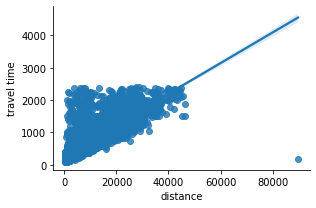

In [5]:
sns.lmplot(x='distance',y='travel time',data=df, height=3, aspect=1.5)

### Outlier removal

In [8]:
# If you have multiple columns in your dataframe and would like to
# remove all rows that have outliers in at least one column,
# the following expression would do that in one shot.
from scipy import stats
df = df[(np.abs(stats.zscore(df['distance'])) < 3)]


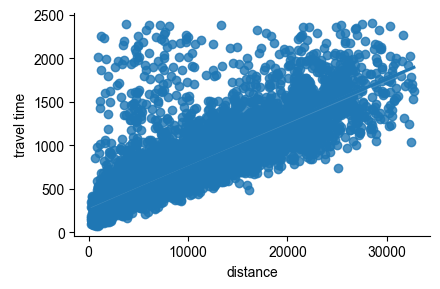

In [9]:
sns.lmplot(x='distance',y='travel time',data=df, height=3, aspect=1.5)
sns.set(rc={"figure.figsize":(10, 10)}) #width=1, #height=2

In [92]:
# Normalize using Min/Max Normalization.
normalized_distance2=(df['distance']-df['distance'].min())/(df['distance'].max()-df['distance'].min())
normalized_distance22=(dff['distance']-dff['distance'].min())/(dff['distance'].max()-dff['distance'].min())
# normalized_distance2
# from sklearn.preprocessing import StandardScaler
# x = breast_dataset.loc[:, features].values
# x = StandardScaler().fit_transform(x) # normalizing the features

In [93]:
df['distance'] = normalized_distance2
dff['distance'] = normalized_distance22

In [12]:
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout,Input,InputLayer
from tensorflow.keras import optimizers
from tensorflow.keras.models import Model
from keras.callbacks import ModelCheckpoint
import tensorflow as tf

In [1]:
df['hr_sin'] = np.sin(df['hour of day']*(2.*np.pi/24))
df['hr_cos'] = np.cos(df['hour of day']*(2.*np.pi/24))
df = df.iloc[:,[0,1,2,15,16,3,4,5,6,7,8,9,10,11,12,13,14]] # change the column order to put "hr_sin" beside the "hour of day"
df.head(4)
df

NameError: name 'np' is not defined

In [14]:
# fix random seed for reproducibility
#The specific seed value does not matter as long as it stays the same for each run of your code, it could be 1,2,3,...
np.random.seed(7)

In [15]:
def nnmodel(*num_neuron,num_hlayers,Epoch):

    if num_hlayers == 1:
        model = Sequential()
        model.add(InputLayer(input_shape=(X_train.shape[1], )))
        model.add(Dense(num_neuron[0], activation='relu'))
        model.add(Dense(1))
    else:
        model = Sequential()
        model.add(InputLayer(input_shape=(X_train.shape[1], )))
        model.add(Dense(num_neuron[0], activation='relu'))
        model.add(Dense(num_neuron[1], activation='relu'))
        model.add(Dense(1))
    # model.compile(loss='mse', optimizer='adam')
    learning_rate = 0.5
    model.compile(optimizer='adam',
                  loss=tf.keras.metrics.mean_squared_error,
                  metrics=['mape',tf.keras.metrics.RootMeanSquaredError(name='rmse')])
    history = model.fit(X_train, y_train, verbose=1, epochs=Epoch,
                       validation_data=(X_test, y_test))  
    print('minimum testing RMSE: ',min(history.history['val_rmse'])/60)
    print('minimum testing MAPE: ',min(history.history['val_mape'])/100)
    
    return history

In [16]:
def nnmodel_(*num_neuron,num_hlayers,Epoch):

    if num_hlayers == 1:
        model = Sequential()
        model.add(InputLayer(input_shape=(X_train.shape[1], )))
        model.add(Dense(num_neuron[0], activation='relu'))
        model.add(Dense(1))
    elif num_hlayers == 2:
        model = Sequential()
        model.add(InputLayer(input_shape=(X_train.shape[1], )))
        model.add(Dense(num_neuron[0], activation='relu'))
        model.add(Dense(num_neuron[1], activation='relu'))
        model.add(Dense(1))
    else:
        model = Sequential()
        model.add(InputLayer(input_shape=(X_train.shape[1], )))
        model.add(Dense(num_neuron[0], activation='relu'))
        model.add(Dense(num_neuron[1], activation='relu'))
        model.add(Dense(num_neuron[2], activation='relu'))
        model.add(Dense(1))        
    # model.compile(loss='mse', optimizer='adam')
    learning_rate = 0.5
    model.compile(optimizer='adam',
                  loss=tf.keras.metrics.mean_squared_error,
                  metrics=['mape',tf.keras.metrics.RootMeanSquaredError(name='rmse')])
    X_train0 = tf.convert_to_tensor(X_train,dtype = tf.float32)
    y_train0 = tf.convert_to_tensor(y_train,dtype = tf.float32)
    X_test0 = tf.convert_to_tensor(X_test,dtype = tf.float32)
    y_test0 = tf.convert_to_tensor(y_test,dtype = tf.float32)
    history = model.fit(X_train0, y_train0, verbose=1, epochs=Epoch,
                       validation_data=(X_test0, y_test0))    
    print('minimum testing RMSE: ',min(history.history['val_rmse'])/60)
    print('minimum testing MAPE: ',min(history.history['val_mape'])/100)
    
    return history

In [17]:
def plotme(model):

    # Plot the training and validation accuracy and loss at each epoch
    loss1 = [f/60 for f in model.history['rmse']]
    val_loss1 = [f/60 for f in model.history['val_rmse']]
    loss2 = model.history['mape']
    val_loss2 = model.history['val_mape']
    epochs = range(1, len(model.history['loss'])+1)
    plt.figure(figsize=(5, 3))
    plt.plot(epochs, val_loss1, 'r', label='Validation rmse')
    plt.plot(epochs, loss1, 'y', label='Trainnig rmse')
    plt.plot(epochs, val_loss2, 'k', label='Validation mape')
    plt.plot(epochs, loss2, 'b', label='Trainnig mape')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Metrics')
    #plt.xlim(lims)
    yli = max(model.history['val_mape'])
    plt.ylim([-1, yli+10])
    plt.legend()
    plt.show()

## sub-problem 1:     ******* input:distance *********

In [18]:
my_df = df[['distance','travel time']]
my_df.head(3)

,distance,travel time
0,0.542630,1038
1,0.531771,1020
2,0.296433,730


c:\users\shima\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  after removing the cwd from sys.path.


<AxesSubplot:>

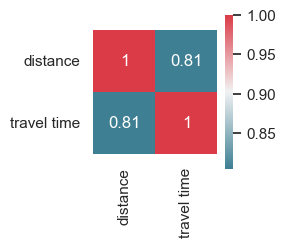

In [19]:
# run correlation matrix and plot
f, ax = plt.subplots(figsize=(2,2))
corr = my_df.corr()
sns.heatmap(corr, annot=True, mask=np.zeros_like(corr,dtype=np.bool),
           cmap=sns.diverging_palette(220,10, as_cmap=True),
           square=True, ax=ax)

In [20]:
x = np.array(df[['distance']])
y = np.array(df['travel time'])
# x

In [21]:
#split data into test & train
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [22]:
print(X_train.shape)
print(X_test.shape)
# X_train

(6537, 1)
(1635, 1)


In [23]:
# plot the relationship between each two variables to spot anything incorrect.
train_df = pd.DataFrame(X_train, columns = ['distance'])
train_stat = train_df.describe()
train_stat.transpose()

,count,mean,std,min,25%,50%,75%,max
distance,6537.0,0.296343,0.209288,0.0,0.130384,0.249547,0.408336,1.0


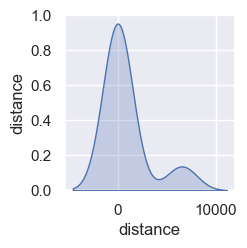

In [24]:
sns.pairplot(train_stat[train_stat.columns], diag_kind='kde')

In [25]:
import math

In [59]:
# number of neurons in first hidden layer
math.sqrt((1+2)*804) + 2*math.sqrt((804/(1+2)))

81.85352771872451

In [60]:
# number of neurons in second hidden layer
1*math.sqrt((804/(1+2)))

16.3707055437449

In [26]:
# inputs: distance
model1_1 = nnmodel(5, num_hlayers=1,Epoch=500)
model1_1

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 767853.4375 - mape: 99.9850 - rmse: 876.2725 - val_loss: 788188.6250 - val_mape: 99.9461 - val_rmse: 887.7999
Epoch 2/500
205/205 [==============================] - 0s 798us/step - loss: 766915.6250 - mape: 99.8980 - rmse: 875.7372 - val_loss: 787120.9375 - val_mape: 99.8453 - val_rmse: 887.1984
Epoch 3/500
205/205 [==============================] - 0s 763us/step - loss: 765676.6250 - mape: 99.7758 - rmse: 875.0295 - val_loss: 785656.5000 - val_mape: 99.7021 - val_rmse: 886.3727
Epoch 4/500
205/205 [==============================] - 0s 766us/step - loss: 764031.1250 - mape: 99.6100 - rmse: 874.0887 - val_loss: 783775.0625 - val_mape: 99.5182 - val_rmse: 885.3107
Epoch 5/500
205/205 [==============================] - 0s 739us/step - loss: 761987.7500 - mape: 99.4050 - rmse: 872.9191 - val_loss: 781499.3125 - val_mape: 99.2958 - val_rmse: 884.0245
Epoch 6/500
205/205 [==============================] - 0s 751us/ste

Epoch 45/500
205/205 [==============================] - 0s 747us/step - loss: 514663.9062 - mape: 72.2960 - rmse: 717.4008 - val_loss: 526601.7500 - val_mape: 72.0181 - val_rmse: 725.6733
Epoch 46/500
205/205 [==============================] - 0s 735us/step - loss: 506307.6562 - mape: 71.3230 - rmse: 711.5530 - val_loss: 518055.4062 - val_mape: 71.0620 - val_rmse: 719.7607
Epoch 47/500
205/205 [==============================] - 0s 750us/step - loss: 497904.6250 - mape: 70.3476 - rmse: 705.6236 - val_loss: 509465.9062 - val_mape: 70.1058 - val_rmse: 713.7688
Epoch 48/500
205/205 [==============================] - 0s 766us/step - loss: 489463.2812 - mape: 69.3616 - rmse: 699.6165 - val_loss: 500842.7500 - val_mape: 69.1451 - val_rmse: 707.7025
Epoch 49/500
205/205 [==============================] - 0s 735us/step - loss: 481005.7188 - mape: 68.3689 - rmse: 693.5458 - val_loss: 492215.0000 - val_mape: 68.1813 - val_rmse: 701.5804
Epoch 50/500
205/205 [==============================] - 0s 7

205/205 [==============================] - 0s 780us/step - loss: 96878.3594 - mape: 43.2244 - rmse: 311.2529 - val_loss: 99321.9688 - val_mape: 42.6920 - val_rmse: 315.1539
Epoch 132/500
205/205 [==============================] - 0s 740us/step - loss: 96494.2188 - mape: 43.1830 - rmse: 310.6352 - val_loss: 98933.7031 - val_mape: 42.6254 - val_rmse: 314.5373
Epoch 133/500
205/205 [==============================] - 0s 765us/step - loss: 96112.8125 - mape: 43.1405 - rmse: 310.0207 - val_loss: 98542.5000 - val_mape: 42.5611 - val_rmse: 313.9148
Epoch 134/500
205/205 [==============================] - 0s 776us/step - loss: 95732.8359 - mape: 43.0882 - rmse: 309.4072 - val_loss: 98156.5078 - val_mape: 42.4920 - val_rmse: 313.2994
Epoch 135/500
205/205 [==============================] - 0s 741us/step - loss: 95352.2422 - mape: 42.9507 - rmse: 308.7916 - val_loss: 97776.1562 - val_mape: 42.3935 - val_rmse: 312.6918
Epoch 136/500
205/205 [==============================] - 0s 749us/step - loss: 

Epoch 175/500
205/205 [==============================] - 0s 714us/step - loss: 81037.0078 - mape: 38.3578 - rmse: 284.6700 - val_loss: 83568.5156 - val_mape: 37.7754 - val_rmse: 289.0822
Epoch 176/500
205/205 [==============================] - 0s 734us/step - loss: 80716.9219 - mape: 38.1748 - rmse: 284.1072 - val_loss: 83250.7422 - val_mape: 37.6657 - val_rmse: 288.5320
Epoch 177/500
205/205 [==============================] - 0s 726us/step - loss: 80397.8906 - mape: 38.0782 - rmse: 283.5452 - val_loss: 82941.2422 - val_mape: 37.5306 - val_rmse: 287.9952
Epoch 178/500
205/205 [==============================] - 0s 735us/step - loss: 80080.1719 - mape: 37.9681 - rmse: 282.9844 - val_loss: 82628.7656 - val_mape: 37.4155 - val_rmse: 287.4522
Epoch 179/500
205/205 [==============================] - 0s 724us/step - loss: 79764.6406 - mape: 37.8089 - rmse: 282.4263 - val_loss: 82315.5469 - val_mape: 37.2901 - val_rmse: 286.9069
Epoch 180/500
205/205 [==============================] - 0s 745us

Epoch 219/500
205/205 [==============================] - 0s 748us/step - loss: 69196.9453 - mape: 32.9887 - rmse: 263.0531 - val_loss: 71959.6406 - val_mape: 32.5501 - val_rmse: 268.2529
Epoch 220/500
205/205 [==============================] - 0s 780us/step - loss: 68990.2500 - mape: 32.8311 - rmse: 262.6599 - val_loss: 71760.6484 - val_mape: 32.4255 - val_rmse: 267.8818
Epoch 221/500
205/205 [==============================] - 0s 746us/step - loss: 68783.4531 - mape: 32.7810 - rmse: 262.2660 - val_loss: 71557.1328 - val_mape: 32.3295 - val_rmse: 267.5016
Epoch 222/500
205/205 [==============================] - 0s 745us/step - loss: 68580.9219 - mape: 32.6362 - rmse: 261.8796 - val_loss: 71362.8516 - val_mape: 32.2102 - val_rmse: 267.1383
Epoch 223/500
205/205 [==============================] - 0s 737us/step - loss: 68383.3203 - mape: 32.5305 - rmse: 261.5020 - val_loss: 71170.1172 - val_mape: 32.0853 - val_rmse: 266.7773
Epoch 224/500
205/205 [==============================] - 0s 753us

Epoch 263/500
205/205 [==============================] - 0s 719us/step - loss: 62703.5664 - mape: 28.7153 - rmse: 250.4068 - val_loss: 65696.0391 - val_mape: 28.3376 - val_rmse: 256.3124
Epoch 264/500
205/205 [==============================] - 0s 735us/step - loss: 62613.9023 - mape: 28.6525 - rmse: 250.2277 - val_loss: 65610.9453 - val_mape: 28.2637 - val_rmse: 256.1463
Epoch 265/500
205/205 [==============================] - 0s 717us/step - loss: 62525.6992 - mape: 28.5720 - rmse: 250.0514 - val_loss: 65526.5039 - val_mape: 28.1766 - val_rmse: 255.9814
Epoch 266/500
205/205 [==============================] - 0s 706us/step - loss: 62438.7148 - mape: 28.4822 - rmse: 249.8774 - val_loss: 65443.1133 - val_mape: 28.1040 - val_rmse: 255.8185
Epoch 267/500
205/205 [==============================] - 0s 752us/step - loss: 62354.6641 - mape: 28.3889 - rmse: 249.7092 - val_loss: 65363.5703 - val_mape: 28.0175 - val_rmse: 255.6630
Epoch 268/500
205/205 [==============================] - 0s 712us

Epoch 307/500
205/205 [==============================] - 0s 746us/step - loss: 60320.4844 - mape: 26.1618 - rmse: 245.6023 - val_loss: 63464.0547 - val_mape: 25.7417 - val_rmse: 251.9207
Epoch 308/500
205/205 [==============================] - 0s 732us/step - loss: 60293.0703 - mape: 26.0705 - rmse: 245.5465 - val_loss: 63439.8672 - val_mape: 25.7062 - val_rmse: 251.8727
Epoch 309/500
205/205 [==============================] - 0s 735us/step - loss: 60267.6641 - mape: 26.0631 - rmse: 245.4947 - val_loss: 63414.5039 - val_mape: 25.6779 - val_rmse: 251.8224
Epoch 310/500
205/205 [==============================] - 0s 740us/step - loss: 60242.2266 - mape: 26.0059 - rmse: 245.4429 - val_loss: 63397.1211 - val_mape: 25.6095 - val_rmse: 251.7878
Epoch 311/500
205/205 [==============================] - 0s 744us/step - loss: 60218.4648 - mape: 25.9865 - rmse: 245.3945 - val_loss: 63374.4883 - val_mape: 25.5767 - val_rmse: 251.7429
Epoch 312/500
205/205 [==============================] - 0s 750us

Epoch 351/500
205/205 [==============================] - 0s 750us/step - loss: 59704.7148 - mape: 24.8779 - rmse: 244.3455 - val_loss: 62923.5430 - val_mape: 24.5232 - val_rmse: 250.8457
Epoch 352/500
205/205 [==============================] - 0s 741us/step - loss: 59699.5078 - mape: 24.9258 - rmse: 244.3348 - val_loss: 62918.9297 - val_mape: 24.5000 - val_rmse: 250.8365
Epoch 353/500
205/205 [==============================] - 0s 755us/step - loss: 59694.8281 - mape: 24.9169 - rmse: 244.3253 - val_loss: 62913.3125 - val_mape: 24.4870 - val_rmse: 250.8253
Epoch 354/500
205/205 [==============================] - 0s 743us/step - loss: 59686.4375 - mape: 24.8608 - rmse: 244.3081 - val_loss: 62907.2695 - val_mape: 24.4786 - val_rmse: 250.8132
Epoch 355/500
205/205 [==============================] - 0s 731us/step - loss: 59681.2422 - mape: 24.8892 - rmse: 244.2974 - val_loss: 62904.3906 - val_mape: 24.4517 - val_rmse: 250.8075
Epoch 356/500
205/205 [==============================] - 0s 725us

Epoch 395/500
205/205 [==============================] - 0s 737us/step - loss: 59568.5078 - mape: 24.4329 - rmse: 244.0666 - val_loss: 62812.9180 - val_mape: 24.0377 - val_rmse: 250.6251
Epoch 396/500
205/205 [==============================] - 0s 741us/step - loss: 59569.8047 - mape: 24.4330 - rmse: 244.0693 - val_loss: 62816.3320 - val_mape: 24.0038 - val_rmse: 250.6319
Epoch 397/500
205/205 [==============================] - 0s 731us/step - loss: 59566.3828 - mape: 24.3474 - rmse: 244.0623 - val_loss: 62815.5586 - val_mape: 23.9979 - val_rmse: 250.6303
Epoch 398/500
205/205 [==============================] - 0s 749us/step - loss: 59564.3984 - mape: 24.3846 - rmse: 244.0582 - val_loss: 62812.0039 - val_mape: 24.0062 - val_rmse: 250.6232
Epoch 399/500
205/205 [==============================] - 0s 735us/step - loss: 59562.8125 - mape: 24.3680 - rmse: 244.0549 - val_loss: 62813.1133 - val_mape: 23.9870 - val_rmse: 250.6254
Epoch 400/500
205/205 [==============================] - 0s 749us

Epoch 439/500
205/205 [==============================] - 0s 735us/step - loss: 59540.4336 - mape: 24.1653 - rmse: 244.0091 - val_loss: 62801.0273 - val_mape: 23.7977 - val_rmse: 250.6013
Epoch 440/500
205/205 [==============================] - 0s 732us/step - loss: 59541.0000 - mape: 24.2012 - rmse: 244.0102 - val_loss: 62803.2305 - val_mape: 23.7802 - val_rmse: 250.6057
Epoch 441/500
205/205 [==============================] - 0s 717us/step - loss: 59538.8516 - mape: 24.1588 - rmse: 244.0058 - val_loss: 62801.4844 - val_mape: 23.7879 - val_rmse: 250.6022
Epoch 442/500
205/205 [==============================] - 0s 768us/step - loss: 59539.3477 - mape: 24.1727 - rmse: 244.0069 - val_loss: 62801.0039 - val_mape: 23.7872 - val_rmse: 250.6013
Epoch 443/500
205/205 [==============================] - 0s 735us/step - loss: 59538.5391 - mape: 24.1936 - rmse: 244.0052 - val_loss: 62802.4414 - val_mape: 23.7758 - val_rmse: 250.6042
Epoch 444/500
205/205 [==============================] - 0s 744us

Epoch 483/500
205/205 [==============================] - 0s 732us/step - loss: 59534.3086 - mape: 24.0776 - rmse: 243.9965 - val_loss: 62799.9180 - val_mape: 23.7085 - val_rmse: 250.5991
Epoch 484/500
205/205 [==============================] - 0s 741us/step - loss: 59535.2930 - mape: 24.0914 - rmse: 243.9986 - val_loss: 62802.1914 - val_mape: 23.6932 - val_rmse: 250.6037
Epoch 485/500
205/205 [==============================] - 0s 728us/step - loss: 59534.2734 - mape: 24.0806 - rmse: 243.9965 - val_loss: 62801.4688 - val_mape: 23.6950 - val_rmse: 250.6022
Epoch 486/500
205/205 [==============================] - 0s 735us/step - loss: 59533.7891 - mape: 24.0701 - rmse: 243.9955 - val_loss: 62801.8398 - val_mape: 23.6924 - val_rmse: 250.6030
Epoch 487/500
205/205 [==============================] - 0s 721us/step - loss: 59536.0703 - mape: 24.0993 - rmse: 244.0001 - val_loss: 62799.5977 - val_mape: 23.7038 - val_rmse: 250.5985
Epoch 488/500
205/205 [==============================] - 0s 726us

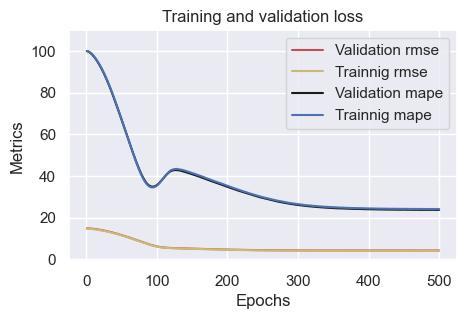

In [27]:
plotme(model1_1)

In [28]:
# inputs: distance
model1_2 = nnmodel(10, num_hlayers=1,Epoch=500)
model1_2

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 767293.3750 - mape: 99.9473 - rmse: 875.9528 - val_loss: 787249.8750 - val_mape: 99.8747 - val_rmse: 887.2711
Epoch 2/500
205/205 [==============================] - 0s 764us/step - loss: 765134.1250 - mape: 99.7433 - rmse: 874.7195 - val_loss: 784160.9375 - val_mape: 99.5873 - val_rmse: 885.5286
Epoch 3/500
205/205 [==============================] - 0s 790us/step - loss: 761197.4375 - mape: 99.3669 - rmse: 872.4663 - val_loss: 779247.6250 - val_mape: 99.1233 - val_rmse: 882.7501
Epoch 4/500
205/205 [==============================] - 0s 807us/step - loss: 755567.5000 - mape: 98.8177 - rmse: 869.2339 - val_loss: 772712.7500 - val_mape: 98.4999 - val_rmse: 879.0408
Epoch 5/500
205/205 [==============================] - 0s 737us/step - loss: 748388.1250 - mape: 98.1154 - rmse: 865.0943 - val_loss: 764678.0000 - val_mape: 97.7266 - val_rmse: 874.4587
Epoch 6/500
205/205 [==============================] - 0s 757us/ste

Epoch 45/500
205/205 [==============================] - 0s 744us/step - loss: 155460.6094 - mape: 34.0214 - rmse: 394.2849 - val_loss: 158013.3594 - val_mape: 34.3464 - val_rmse: 397.5089
Epoch 46/500
205/205 [==============================] - 0s 741us/step - loss: 147424.5156 - mape: 34.0175 - rmse: 383.9590 - val_loss: 149931.1562 - val_mape: 34.3537 - val_rmse: 387.2094
Epoch 47/500
205/205 [==============================] - 0s 744us/step - loss: 140151.7031 - mape: 34.1722 - rmse: 374.3684 - val_loss: 142693.2344 - val_mape: 34.4983 - val_rmse: 377.7476
Epoch 48/500
205/205 [==============================] - 0s 752us/step - loss: 133578.2344 - mape: 34.4199 - rmse: 365.4836 - val_loss: 136172.0625 - val_mape: 34.7722 - val_rmse: 369.0150
Epoch 49/500
205/205 [==============================] - 0s 751us/step - loss: 127713.4844 - mape: 34.8252 - rmse: 357.3702 - val_loss: 130321.5391 - val_mape: 35.1913 - val_rmse: 361.0007
Epoch 50/500
205/205 [==============================] - 0s 7

Epoch 89/500
205/205 [==============================] - 0s 726us/step - loss: 79650.5312 - mape: 37.7539 - rmse: 282.2242 - val_loss: 82051.5625 - val_mape: 37.2198 - val_rmse: 286.4464
Epoch 90/500
205/205 [==============================] - 0s 744us/step - loss: 79051.0547 - mape: 37.5396 - rmse: 281.1602 - val_loss: 81463.7422 - val_mape: 36.9624 - val_rmse: 285.4185
Epoch 91/500
205/205 [==============================] - 0s 745us/step - loss: 78455.6641 - mape: 37.3257 - rmse: 280.0994 - val_loss: 80883.5391 - val_mape: 36.7312 - val_rmse: 284.4003
Epoch 92/500
205/205 [==============================] - 0s 738us/step - loss: 77868.0547 - mape: 37.0220 - rmse: 279.0485 - val_loss: 80309.1016 - val_mape: 36.5141 - val_rmse: 283.3886
Epoch 93/500
205/205 [==============================] - 0s 730us/step - loss: 77292.6172 - mape: 36.8713 - rmse: 278.0155 - val_loss: 79744.7031 - val_mape: 36.2903 - val_rmse: 282.3911
Epoch 94/500
205/205 [==============================] - 0s 726us/step 

Epoch 133/500
205/205 [==============================] - 0s 830us/step - loss: 62622.3242 - mape: 28.6104 - rmse: 250.2445 - val_loss: 65577.9844 - val_mape: 28.2123 - val_rmse: 256.0820
Epoch 134/500
205/205 [==============================] - 0s 743us/step - loss: 62453.3672 - mape: 28.5223 - rmse: 249.9067 - val_loss: 65425.7969 - val_mape: 28.0353 - val_rmse: 255.7847
Epoch 135/500
205/205 [==============================] - 0s 740us/step - loss: 62295.1445 - mape: 28.3920 - rmse: 249.5900 - val_loss: 65267.2305 - val_mape: 27.9307 - val_rmse: 255.4745
Epoch 136/500
205/205 [==============================] - 0s 734us/step - loss: 62136.9297 - mape: 28.2024 - rmse: 249.2728 - val_loss: 65125.3867 - val_mape: 27.7563 - val_rmse: 255.1968
Epoch 137/500
205/205 [==============================] - 0s 759us/step - loss: 61988.9258 - mape: 28.0618 - rmse: 248.9758 - val_loss: 64983.4609 - val_mape: 27.6399 - val_rmse: 254.9185
Epoch 138/500
205/205 [==============================] - 0s 743us

Epoch 177/500
205/205 [==============================] - 0s 742us/step - loss: 59709.8008 - mape: 24.9558 - rmse: 244.3559 - val_loss: 62923.2617 - val_mape: 24.5156 - val_rmse: 250.8451
Epoch 178/500
205/205 [==============================] - 0s 770us/step - loss: 59698.4492 - mape: 24.9165 - rmse: 244.3327 - val_loss: 62914.4219 - val_mape: 24.4787 - val_rmse: 250.8275
Epoch 179/500
205/205 [==============================] - 0s 726us/step - loss: 59689.2070 - mape: 24.8469 - rmse: 244.3138 - val_loss: 62903.1680 - val_mape: 24.4676 - val_rmse: 250.8050
Epoch 180/500
205/205 [==============================] - 0s 736us/step - loss: 59677.9961 - mape: 24.8458 - rmse: 244.2908 - val_loss: 62893.4219 - val_mape: 24.4482 - val_rmse: 250.7856
Epoch 181/500
205/205 [==============================] - 0s 740us/step - loss: 59668.4219 - mape: 24.7736 - rmse: 244.2712 - val_loss: 62885.3711 - val_mape: 24.4148 - val_rmse: 250.7696
Epoch 182/500
205/205 [==============================] - 0s 844us

Epoch 221/500
205/205 [==============================] - 0s 731us/step - loss: 59540.7227 - mape: 24.2140 - rmse: 244.0097 - val_loss: 62800.1797 - val_mape: 23.8015 - val_rmse: 250.5996
Epoch 222/500
205/205 [==============================] - 0s 743us/step - loss: 59541.3594 - mape: 24.1631 - rmse: 244.0110 - val_loss: 62800.1016 - val_mape: 23.7993 - val_rmse: 250.5995
Epoch 223/500
205/205 [==============================] - 0s 715us/step - loss: 59545.1328 - mape: 24.1431 - rmse: 244.0187 - val_loss: 62799.6914 - val_mape: 23.7944 - val_rmse: 250.5987
Epoch 224/500
205/205 [==============================] - 0s 756us/step - loss: 59540.6367 - mape: 24.1406 - rmse: 244.0095 - val_loss: 62797.2617 - val_mape: 23.8041 - val_rmse: 250.5938
Epoch 225/500
205/205 [==============================] - 0s 773us/step - loss: 59544.8633 - mape: 24.1852 - rmse: 244.0182 - val_loss: 62793.7109 - val_mape: 23.8202 - val_rmse: 250.5867
Epoch 226/500
205/205 [==============================] - 0s 776us

Epoch 265/500
205/205 [==============================] - 0s 769us/step - loss: 59537.6016 - mape: 24.0859 - rmse: 244.0033 - val_loss: 62804.9922 - val_mape: 23.6447 - val_rmse: 250.6092
Epoch 266/500
205/205 [==============================] - 0s 759us/step - loss: 59536.2773 - mape: 24.0043 - rmse: 244.0006 - val_loss: 62805.3711 - val_mape: 23.6407 - val_rmse: 250.6100
Epoch 267/500
205/205 [==============================] - 0s 760us/step - loss: 59537.2930 - mape: 24.0366 - rmse: 244.0027 - val_loss: 62799.2578 - val_mape: 23.6781 - val_rmse: 250.5978
Epoch 268/500
205/205 [==============================] - 0s 758us/step - loss: 59535.2812 - mape: 24.0063 - rmse: 243.9985 - val_loss: 62803.8398 - val_mape: 23.6489 - val_rmse: 250.6069
Epoch 269/500
205/205 [==============================] - 0s 745us/step - loss: 59536.3203 - mape: 24.0421 - rmse: 244.0007 - val_loss: 62800.7773 - val_mape: 23.6658 - val_rmse: 250.6008
Epoch 270/500
205/205 [==============================] - 0s 739us

Epoch 309/500
205/205 [==============================] - 0s 732us/step - loss: 59534.2539 - mape: 24.0037 - rmse: 243.9964 - val_loss: 62803.4922 - val_mape: 23.6310 - val_rmse: 250.6062
Epoch 310/500
205/205 [==============================] - 0s 741us/step - loss: 59536.7656 - mape: 24.0245 - rmse: 244.0016 - val_loss: 62804.3164 - val_mape: 23.6264 - val_rmse: 250.6079
Epoch 311/500
205/205 [==============================] - 0s 730us/step - loss: 59537.6211 - mape: 24.0094 - rmse: 244.0033 - val_loss: 62802.5312 - val_mape: 23.6378 - val_rmse: 250.6043
Epoch 312/500
205/205 [==============================] - 0s 725us/step - loss: 59535.3125 - mape: 23.9955 - rmse: 243.9986 - val_loss: 62804.0625 - val_mape: 23.6288 - val_rmse: 250.6074
Epoch 313/500
205/205 [==============================] - 0s 755us/step - loss: 59536.9180 - mape: 24.0094 - rmse: 244.0019 - val_loss: 62807.5938 - val_mape: 23.6065 - val_rmse: 250.6144
Epoch 314/500
205/205 [==============================] - 0s 716us

Epoch 353/500
205/205 [==============================] - 0s 749us/step - loss: 59542.3828 - mape: 24.0218 - rmse: 244.0131 - val_loss: 62805.9023 - val_mape: 23.6151 - val_rmse: 250.6111
Epoch 354/500
205/205 [==============================] - 0s 762us/step - loss: 59537.5039 - mape: 24.0487 - rmse: 244.0031 - val_loss: 62809.7500 - val_mape: 23.5920 - val_rmse: 250.6187
Epoch 355/500
205/205 [==============================] - 0s 742us/step - loss: 59536.0703 - mape: 23.9757 - rmse: 244.0001 - val_loss: 62811.2578 - val_mape: 23.5838 - val_rmse: 250.6217
Epoch 356/500
205/205 [==============================] - 0s 752us/step - loss: 59537.2109 - mape: 24.0259 - rmse: 244.0025 - val_loss: 62813.5391 - val_mape: 23.5709 - val_rmse: 250.6263
Epoch 357/500
205/205 [==============================] - 0s 722us/step - loss: 59537.4219 - mape: 23.9911 - rmse: 244.0029 - val_loss: 62810.3984 - val_mape: 23.5877 - val_rmse: 250.6200
Epoch 358/500
205/205 [==============================] - 0s 716us

Epoch 397/500
205/205 [==============================] - 0s 746us/step - loss: 59537.7148 - mape: 24.0050 - rmse: 244.0035 - val_loss: 62807.7500 - val_mape: 23.6019 - val_rmse: 250.6147
Epoch 398/500
205/205 [==============================] - 0s 754us/step - loss: 59535.2969 - mape: 23.9728 - rmse: 243.9986 - val_loss: 62809.3320 - val_mape: 23.5918 - val_rmse: 250.6179
Epoch 399/500
205/205 [==============================] - 0s 739us/step - loss: 59537.2266 - mape: 24.0906 - rmse: 244.0025 - val_loss: 62812.9258 - val_mape: 23.5737 - val_rmse: 250.6251
Epoch 400/500
205/205 [==============================] - 0s 745us/step - loss: 59536.1875 - mape: 23.9625 - rmse: 244.0004 - val_loss: 62814.3594 - val_mape: 23.5672 - val_rmse: 250.6279
Epoch 401/500
205/205 [==============================] - 0s 733us/step - loss: 59534.6875 - mape: 23.9945 - rmse: 243.9973 - val_loss: 62807.1602 - val_mape: 23.6071 - val_rmse: 250.6136
Epoch 402/500
205/205 [==============================] - 0s 738us

Epoch 441/500
205/205 [==============================] - 0s 713us/step - loss: 59534.8711 - mape: 24.0313 - rmse: 243.9977 - val_loss: 62804.4297 - val_mape: 23.6239 - val_rmse: 250.6081
Epoch 442/500
205/205 [==============================] - 0s 720us/step - loss: 59535.6289 - mape: 23.9881 - rmse: 243.9992 - val_loss: 62802.9023 - val_mape: 23.6351 - val_rmse: 250.6051
Epoch 443/500
205/205 [==============================] - 0s 727us/step - loss: 59535.0469 - mape: 23.9896 - rmse: 243.9980 - val_loss: 62802.6914 - val_mape: 23.6353 - val_rmse: 250.6046
Epoch 444/500
205/205 [==============================] - 0s 765us/step - loss: 59535.2969 - mape: 24.0057 - rmse: 243.9986 - val_loss: 62800.7539 - val_mape: 23.6479 - val_rmse: 250.6008
Epoch 445/500
205/205 [==============================] - 0s 749us/step - loss: 59534.9805 - mape: 24.0089 - rmse: 243.9979 - val_loss: 62809.0469 - val_mape: 23.5960 - val_rmse: 250.6173
Epoch 446/500
205/205 [==============================] - 0s 765us

Epoch 485/500
205/205 [==============================] - 0s 736us/step - loss: 59537.0938 - mape: 24.0111 - rmse: 244.0022 - val_loss: 62809.7891 - val_mape: 23.5920 - val_rmse: 250.6188
Epoch 486/500
205/205 [==============================] - 0s 742us/step - loss: 59536.0820 - mape: 24.0522 - rmse: 244.0002 - val_loss: 62803.3906 - val_mape: 23.6303 - val_rmse: 250.6060
Epoch 487/500
205/205 [==============================] - 0s 762us/step - loss: 59534.5938 - mape: 24.0099 - rmse: 243.9971 - val_loss: 62804.9219 - val_mape: 23.6215 - val_rmse: 250.6091
Epoch 488/500
205/205 [==============================] - 0s 746us/step - loss: 59538.4648 - mape: 24.0188 - rmse: 244.0051 - val_loss: 62798.6406 - val_mape: 23.6620 - val_rmse: 250.5966
Epoch 489/500
205/205 [==============================] - 0s 751us/step - loss: 59534.2930 - mape: 24.0496 - rmse: 243.9965 - val_loss: 62800.8789 - val_mape: 23.6458 - val_rmse: 250.6010
Epoch 490/500
205/205 [==============================] - 0s 734us

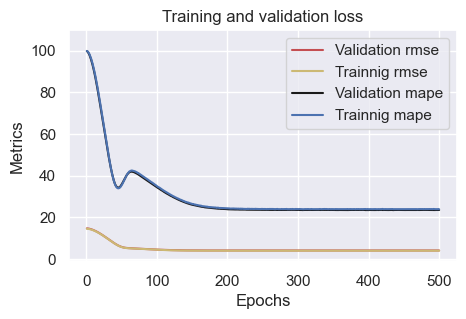

In [29]:
plotme(model1_2)

In [229]:
# inputs: distance
model1_3 = nnmodel(20, num_hlayers=1,Epoch=500)
model1_3

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 189099.7031 - mape: 48.8889 - rmse: 434.8560 - val_loss: 149062.2188 - val_mape: 52.0919 - val_rmse: 386.0858
Epoch 2/500
205/205 [==============================] - 0s 754us/step - loss: 145060.8906 - mape: 51.6093 - rmse: 380.8686 - val_loss: 148347.8750 - val_mape: 51.6805 - val_rmse: 385.1595
Epoch 3/500
205/205 [==============================] - 0s 824us/step - loss: 144380.0312 - mape: 51.4773 - rmse: 379.9737 - val_loss: 147708.6875 - val_mape: 51.8597 - val_rmse: 384.3289
Epoch 4/500
205/205 [==============================] - 0s 740us/step - loss: 143982.1094 - mape: 51.2149 - rmse: 379.4497 - val_loss: 147263.2812 - val_mape: 51.9587 - val_rmse: 383.7490
Epoch 5/500
205/205 [==============================] - 0s 848us/step - loss: 143637.3281 - mape: 51.2743 - rmse: 378.9951 - val_loss: 149114.4844 - val_mape: 47.4880 - val_rmse: 386.1534
Epoch 6/500
205/205 [==============================] - 0s 781us/ste

Epoch 45/500
205/205 [==============================] - 0s 735us/step - loss: 138707.7500 - mape: 49.3332 - rmse: 372.4349 - val_loss: 142280.3906 - val_mape: 52.7160 - val_rmse: 377.2007
Epoch 46/500
205/205 [==============================] - 0s 740us/step - loss: 138448.0469 - mape: 49.2765 - rmse: 372.0861 - val_loss: 141386.9531 - val_mape: 49.3267 - val_rmse: 376.0146
Epoch 47/500
205/205 [==============================] - 0s 740us/step - loss: 138494.3438 - mape: 49.3204 - rmse: 372.1483 - val_loss: 141021.3750 - val_mape: 49.5498 - val_rmse: 375.5281
Epoch 48/500
205/205 [==============================] - 0s 735us/step - loss: 138370.3438 - mape: 49.1924 - rmse: 371.9817 - val_loss: 140890.1406 - val_mape: 49.3802 - val_rmse: 375.3534
Epoch 49/500
205/205 [==============================] - 0s 746us/step - loss: 137893.6719 - mape: 49.2151 - rmse: 371.3404 - val_loss: 140682.9531 - val_mape: 49.9899 - val_rmse: 375.0773
Epoch 50/500
205/205 [==============================] - 0s 7

205/205 [==============================] - 0s 728us/step - loss: 108338.5078 - mape: 41.8531 - rmse: 329.1482 - val_loss: 110395.6484 - val_mape: 42.3062 - val_rmse: 332.2584
Epoch 132/500
205/205 [==============================] - 0s 750us/step - loss: 108007.7969 - mape: 41.7800 - rmse: 328.6454 - val_loss: 110173.4453 - val_mape: 40.3124 - val_rmse: 331.9239
Epoch 133/500
205/205 [==============================] - 0s 737us/step - loss: 107561.5703 - mape: 41.4676 - rmse: 327.9658 - val_loss: 111717.7969 - val_mape: 46.6081 - val_rmse: 334.2421
Epoch 134/500
205/205 [==============================] - 0s 809us/step - loss: 106958.4141 - mape: 41.6192 - rmse: 327.0450 - val_loss: 108925.0156 - val_mape: 42.3868 - val_rmse: 330.0379
Epoch 135/500
205/205 [==============================] - 0s 758us/step - loss: 106503.2578 - mape: 41.2333 - rmse: 326.3484 - val_loss: 108415.6875 - val_mape: 42.5287 - val_rmse: 329.2654
Epoch 136/500
205/205 [==============================] - 0s 764us/ste

Epoch 175/500
205/205 [==============================] - 0s 786us/step - loss: 85142.7500 - mape: 35.0359 - rmse: 291.7923 - val_loss: 94197.9531 - val_mape: 29.1637 - val_rmse: 306.9168
Epoch 176/500
205/205 [==============================] - 0s 743us/step - loss: 84739.1641 - mape: 34.6774 - rmse: 291.0999 - val_loss: 86754.4062 - val_mape: 36.2611 - val_rmse: 294.5410
Epoch 177/500
205/205 [==============================] - 0s 752us/step - loss: 84726.5312 - mape: 34.9573 - rmse: 291.0782 - val_loss: 88712.9453 - val_mape: 39.7837 - val_rmse: 297.8472
Epoch 178/500
205/205 [==============================] - 0s 802us/step - loss: 83869.7891 - mape: 34.5876 - rmse: 289.6028 - val_loss: 88548.7344 - val_mape: 30.3147 - val_rmse: 297.5714
Epoch 179/500
205/205 [==============================] - 0s 809us/step - loss: 83781.7656 - mape: 34.3478 - rmse: 289.4508 - val_loss: 85274.1797 - val_mape: 33.3040 - val_rmse: 292.0174
Epoch 180/500
205/205 [==============================] - 0s 763us

Epoch 219/500
205/205 [==============================] - 0s 735us/step - loss: 69134.3359 - mape: 28.9590 - rmse: 262.9341 - val_loss: 73261.2969 - val_mape: 25.2056 - val_rmse: 270.6682
Epoch 220/500
205/205 [==============================] - 0s 745us/step - loss: 68706.9062 - mape: 28.6313 - rmse: 262.1200 - val_loss: 71263.8516 - val_mape: 26.6321 - val_rmse: 266.9529
Epoch 221/500
205/205 [==============================] - 0s 735us/step - loss: 68460.8516 - mape: 28.6224 - rmse: 261.6502 - val_loss: 70432.3594 - val_mape: 28.0693 - val_rmse: 265.3910
Epoch 222/500
205/205 [==============================] - 0s 755us/step - loss: 68506.4219 - mape: 28.5348 - rmse: 261.7373 - val_loss: 72472.7422 - val_mape: 25.0358 - val_rmse: 269.2076
Epoch 223/500
205/205 [==============================] - 0s 748us/step - loss: 68198.1875 - mape: 28.3578 - rmse: 261.1478 - val_loss: 70153.1406 - val_mape: 27.4147 - val_rmse: 264.8644
Epoch 224/500
205/205 [==============================] - 0s 745us

Epoch 263/500
205/205 [==============================] - 0s 745us/step - loss: 64026.3672 - mape: 25.6072 - rmse: 253.0343 - val_loss: 68189.9688 - val_mape: 29.3541 - val_rmse: 261.1321
Epoch 264/500
205/205 [==============================] - 0s 750us/step - loss: 64331.9375 - mape: 25.9312 - rmse: 253.6374 - val_loss: 66570.5312 - val_mape: 23.7711 - val_rmse: 258.0127
Epoch 265/500
205/205 [==============================] - 0s 739us/step - loss: 64104.8516 - mape: 25.5478 - rmse: 253.1894 - val_loss: 68783.6250 - val_mape: 22.3267 - val_rmse: 262.2663
Epoch 266/500
205/205 [==============================] - 0s 757us/step - loss: 63777.1641 - mape: 25.5789 - rmse: 252.5414 - val_loss: 68079.2344 - val_mape: 22.5496 - val_rmse: 260.9200
Epoch 267/500
205/205 [==============================] - 0s 746us/step - loss: 63743.6836 - mape: 25.5027 - rmse: 252.4751 - val_loss: 66083.7031 - val_mape: 24.3874 - val_rmse: 257.0675
Epoch 268/500
205/205 [==============================] - 0s 736us

Epoch 307/500
205/205 [==============================] - 0s 837us/step - loss: 62684.8867 - mape: 24.6753 - rmse: 250.3695 - val_loss: 65185.4453 - val_mape: 24.4963 - val_rmse: 255.3144
Epoch 308/500
205/205 [==============================] - 0s 847us/step - loss: 63425.8984 - mape: 24.8694 - rmse: 251.8450 - val_loss: 65217.1836 - val_mape: 24.5631 - val_rmse: 255.3766
Epoch 309/500
205/205 [==============================] - 0s 878us/step - loss: 62884.8672 - mape: 24.7086 - rmse: 250.7686 - val_loss: 65162.3828 - val_mape: 24.4881 - val_rmse: 255.2692
Epoch 310/500
205/205 [==============================] - 0s 819us/step - loss: 63418.3398 - mape: 24.7625 - rmse: 251.8300 - val_loss: 68446.8828 - val_mape: 29.3495 - val_rmse: 261.6236
Epoch 311/500
205/205 [==============================] - 0s 845us/step - loss: 63029.6016 - mape: 24.7473 - rmse: 251.0570 - val_loss: 66870.7188 - val_mape: 21.9521 - val_rmse: 258.5937
Epoch 312/500
205/205 [==============================] - 0s 804us

Epoch 351/500
205/205 [==============================] - 0s 765us/step - loss: 62078.8789 - mape: 24.3391 - rmse: 249.1563 - val_loss: 66887.1719 - val_mape: 21.5657 - val_rmse: 258.6255
Epoch 352/500
205/205 [==============================] - 0s 766us/step - loss: 62458.5078 - mape: 24.3049 - rmse: 249.9170 - val_loss: 65218.6172 - val_mape: 22.6589 - val_rmse: 255.3794
Epoch 353/500
205/205 [==============================] - 0s 755us/step - loss: 62499.4180 - mape: 24.2409 - rmse: 249.9988 - val_loss: 65266.8086 - val_mape: 22.7566 - val_rmse: 255.4737
Epoch 354/500
205/205 [==============================] - 0s 775us/step - loss: 62317.0898 - mape: 24.3289 - rmse: 249.6339 - val_loss: 66148.3828 - val_mape: 21.8454 - val_rmse: 257.1933
Epoch 355/500
205/205 [==============================] - 0s 771us/step - loss: 62918.0156 - mape: 24.4800 - rmse: 250.8346 - val_loss: 64786.4023 - val_mape: 24.2418 - val_rmse: 254.5317
Epoch 356/500
205/205 [==============================] - 0s 770us

Epoch 395/500
205/205 [==============================] - 0s 736us/step - loss: 62153.7578 - mape: 24.0994 - rmse: 249.3065 - val_loss: 65208.6758 - val_mape: 22.1924 - val_rmse: 255.3599
Epoch 396/500
205/205 [==============================] - 0s 747us/step - loss: 62344.9922 - mape: 24.3302 - rmse: 249.6898 - val_loss: 64911.2305 - val_mape: 22.5326 - val_rmse: 254.7768
Epoch 397/500
205/205 [==============================] - 0s 740us/step - loss: 61806.7969 - mape: 23.9806 - rmse: 248.6097 - val_loss: 65094.3477 - val_mape: 25.7472 - val_rmse: 255.1359
Epoch 398/500
205/205 [==============================] - 0s 755us/step - loss: 62295.2617 - mape: 24.3659 - rmse: 249.5902 - val_loss: 64745.2773 - val_mape: 25.0168 - val_rmse: 254.4509
Epoch 399/500
205/205 [==============================] - 0s 736us/step - loss: 62165.4023 - mape: 24.3302 - rmse: 249.3299 - val_loss: 65232.0547 - val_mape: 22.1696 - val_rmse: 255.4057
Epoch 400/500
205/205 [==============================] - 0s 755us

Epoch 439/500
205/205 [==============================] - 0s 745us/step - loss: 62854.2578 - mape: 24.5618 - rmse: 250.7075 - val_loss: 64350.4258 - val_mape: 22.9695 - val_rmse: 253.6739
Epoch 440/500
205/205 [==============================] - 0s 745us/step - loss: 62032.2031 - mape: 24.1073 - rmse: 249.0627 - val_loss: 64522.8984 - val_mape: 25.0254 - val_rmse: 254.0136
Epoch 441/500
205/205 [==============================] - 0s 750us/step - loss: 62113.3789 - mape: 24.3210 - rmse: 249.2256 - val_loss: 65548.5859 - val_mape: 21.6505 - val_rmse: 256.0246
Epoch 442/500
205/205 [==============================] - 0s 742us/step - loss: 62869.5195 - mape: 24.4515 - rmse: 250.7379 - val_loss: 64890.0547 - val_mape: 22.1309 - val_rmse: 254.7353
Epoch 443/500
205/205 [==============================] - 0s 747us/step - loss: 61754.2969 - mape: 24.1527 - rmse: 248.5041 - val_loss: 64583.0508 - val_mape: 22.4961 - val_rmse: 254.1320
Epoch 444/500
205/205 [==============================] - 0s 745us

Epoch 483/500
205/205 [==============================] - 0s 740us/step - loss: 61829.1094 - mape: 24.0963 - rmse: 248.6546 - val_loss: 64288.8398 - val_mape: 22.5466 - val_rmse: 253.5524
Epoch 484/500
205/205 [==============================] - 0s 748us/step - loss: 61452.5273 - mape: 23.9500 - rmse: 247.8962 - val_loss: 64007.5938 - val_mape: 23.6092 - val_rmse: 252.9972
Epoch 485/500
205/205 [==============================] - 0s 751us/step - loss: 61490.5664 - mape: 24.0977 - rmse: 247.9729 - val_loss: 64094.2578 - val_mape: 24.3846 - val_rmse: 253.1684
Epoch 486/500
205/205 [==============================] - 0s 749us/step - loss: 62384.6719 - mape: 24.1577 - rmse: 249.7692 - val_loss: 64465.9492 - val_mape: 25.3692 - val_rmse: 253.9015
Epoch 487/500
205/205 [==============================] - 0s 758us/step - loss: 61593.7109 - mape: 24.0603 - rmse: 248.1808 - val_loss: 68691.3359 - val_mape: 20.6837 - val_rmse: 262.0903
Epoch 488/500
205/205 [==============================] - 0s 741us

In [231]:
# inputs: distance
model1_4 = nnmodel(10,5, num_hlayers=2,Epoch=500)
model1_4

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 638620.3750 - mape: 84.5949 - rmse: 799.1373 - val_loss: 286879.1250 - val_mape: 43.6110 - val_rmse: 535.6110
Epoch 2/500
205/205 [==============================] - 0s 770us/step - loss: 164442.4844 - mape: 46.3226 - rmse: 405.5151 - val_loss: 147926.4219 - val_mape: 51.2477 - val_rmse: 384.6120
Epoch 3/500
205/205 [==============================] - 0s 755us/step - loss: 144302.0312 - mape: 50.8144 - rmse: 379.8711 - val_loss: 147947.4062 - val_mape: 52.4153 - val_rmse: 384.6393
Epoch 4/500
205/205 [==============================] - 0s 755us/step - loss: 144322.2656 - mape: 50.9361 - rmse: 379.8977 - val_loss: 147875.3438 - val_mape: 51.9662 - val_rmse: 384.5456
Epoch 5/500
205/205 [==============================] - 0s 780us/step - loss: 144262.1250 - mape: 50.8774 - rmse: 379.8185 - val_loss: 147963.4375 - val_mape: 52.8813 - val_rmse: 384.6602
Epoch 6/500
205/205 [==============================] - 0s 758us/ste

Epoch 45/500
205/205 [==============================] - 0s 755us/step - loss: 143391.5312 - mape: 50.8585 - rmse: 378.6707 - val_loss: 146957.5000 - val_mape: 52.7930 - val_rmse: 383.3504
Epoch 46/500
205/205 [==============================] - 0s 743us/step - loss: 143256.0625 - mape: 51.1556 - rmse: 378.4918 - val_loss: 146757.7031 - val_mape: 51.4043 - val_rmse: 383.0897
Epoch 47/500
205/205 [==============================] - 0s 765us/step - loss: 143295.7188 - mape: 50.7386 - rmse: 378.5442 - val_loss: 146765.3125 - val_mape: 50.9587 - val_rmse: 383.0996
Epoch 48/500
205/205 [==============================] - 0s 750us/step - loss: 143318.8281 - mape: 50.6732 - rmse: 378.5747 - val_loss: 146733.6875 - val_mape: 52.1836 - val_rmse: 383.0583
Epoch 49/500
205/205 [==============================] - 0s 761us/step - loss: 143309.8906 - mape: 51.0456 - rmse: 378.5629 - val_loss: 146685.9688 - val_mape: 51.0147 - val_rmse: 382.9960
Epoch 50/500
205/205 [==============================] - 0s 7

205/205 [==============================] - 0s 763us/step - loss: 114314.9453 - mape: 43.7129 - rmse: 338.1049 - val_loss: 119662.7891 - val_mape: 39.0576 - val_rmse: 345.9231
Epoch 132/500
205/205 [==============================] - 0s 764us/step - loss: 112941.2344 - mape: 43.2992 - rmse: 336.0673 - val_loss: 117916.2891 - val_mape: 49.6898 - val_rmse: 343.3894
Epoch 133/500
205/205 [==============================] - 0s 767us/step - loss: 111240.5312 - mape: 43.1862 - rmse: 333.5274 - val_loss: 112929.1875 - val_mape: 44.4725 - val_rmse: 336.0494
Epoch 134/500
205/205 [==============================] - 0s 748us/step - loss: 109674.3359 - mape: 42.5630 - rmse: 331.1712 - val_loss: 111532.6016 - val_mape: 41.2015 - val_rmse: 333.9650
Epoch 135/500
205/205 [==============================] - 0s 755us/step - loss: 107957.4375 - mape: 42.1967 - rmse: 328.5688 - val_loss: 112956.0234 - val_mape: 37.6541 - val_rmse: 336.0893
Epoch 136/500
205/205 [==============================] - 0s 743us/ste

Epoch 175/500
205/205 [==============================] - 0s 755us/step - loss: 66210.2500 - mape: 26.9035 - rmse: 257.3135 - val_loss: 67875.9922 - val_mape: 25.9731 - val_rmse: 260.5302
Epoch 176/500
205/205 [==============================] - 0s 750us/step - loss: 66088.9844 - mape: 26.6349 - rmse: 257.0778 - val_loss: 69881.8750 - val_mape: 23.4066 - val_rmse: 264.3518
Epoch 177/500
205/205 [==============================] - 0s 765us/step - loss: 66405.0938 - mape: 26.5806 - rmse: 257.6919 - val_loss: 69888.8047 - val_mape: 30.3538 - val_rmse: 264.3649
Epoch 178/500
205/205 [==============================] - 0s 765us/step - loss: 66029.0703 - mape: 26.3054 - rmse: 256.9612 - val_loss: 69146.4531 - val_mape: 29.5530 - val_rmse: 262.9571
Epoch 179/500
205/205 [==============================] - 0s 816us/step - loss: 66127.9375 - mape: 26.5265 - rmse: 257.1535 - val_loss: 69070.6406 - val_mape: 29.4438 - val_rmse: 262.8129
Epoch 180/500
205/205 [==============================] - 0s 777us

Epoch 219/500
205/205 [==============================] - 0s 760us/step - loss: 64198.8242 - mape: 24.8337 - rmse: 253.3749 - val_loss: 67047.7422 - val_mape: 27.3315 - val_rmse: 258.9358
Epoch 220/500
205/205 [==============================] - 0s 750us/step - loss: 63505.0078 - mape: 24.6916 - rmse: 252.0020 - val_loss: 67850.9297 - val_mape: 28.2109 - val_rmse: 260.4821
Epoch 221/500
205/205 [==============================] - 0s 764us/step - loss: 64258.5352 - mape: 25.0101 - rmse: 253.4927 - val_loss: 69038.6094 - val_mape: 29.3148 - val_rmse: 262.7520
Epoch 222/500
205/205 [==============================] - 0s 768us/step - loss: 64425.8672 - mape: 25.1712 - rmse: 253.8225 - val_loss: 68253.7422 - val_mape: 21.6978 - val_rmse: 261.2542
Epoch 223/500
205/205 [==============================] - 0s 770us/step - loss: 63747.8594 - mape: 24.9218 - rmse: 252.4834 - val_loss: 73092.3516 - val_mape: 21.2084 - val_rmse: 270.3560
Epoch 224/500
205/205 [==============================] - 0s 742us

Epoch 263/500
205/205 [==============================] - 0s 750us/step - loss: 63528.2109 - mape: 24.7012 - rmse: 252.0480 - val_loss: 64966.4180 - val_mape: 23.4242 - val_rmse: 254.8851
Epoch 264/500
205/205 [==============================] - 0s 755us/step - loss: 63398.5156 - mape: 24.6416 - rmse: 251.7906 - val_loss: 64987.0977 - val_mape: 23.2554 - val_rmse: 254.9257
Epoch 265/500
205/205 [==============================] - 0s 766us/step - loss: 62814.8750 - mape: 24.4125 - rmse: 250.6290 - val_loss: 65712.7422 - val_mape: 26.1423 - val_rmse: 256.3450
Epoch 266/500
205/205 [==============================] - 0s 745us/step - loss: 63210.0586 - mape: 24.4532 - rmse: 251.4161 - val_loss: 64901.2344 - val_mape: 23.5811 - val_rmse: 254.7572
Epoch 267/500
205/205 [==============================] - 0s 745us/step - loss: 62522.6602 - mape: 24.1870 - rmse: 250.0453 - val_loss: 66500.9922 - val_mape: 21.7646 - val_rmse: 257.8779
Epoch 268/500
205/205 [==============================] - 0s 749us

Epoch 307/500
205/205 [==============================] - 0s 747us/step - loss: 62486.9961 - mape: 24.2714 - rmse: 249.9740 - val_loss: 72459.1719 - val_mape: 32.4279 - val_rmse: 269.1824
Epoch 308/500
205/205 [==============================] - 0s 740us/step - loss: 63077.8750 - mape: 24.4958 - rmse: 251.1531 - val_loss: 64501.8281 - val_mape: 24.4276 - val_rmse: 253.9721
Epoch 309/500
205/205 [==============================] - 0s 750us/step - loss: 62329.8164 - mape: 24.1805 - rmse: 249.6594 - val_loss: 64489.1211 - val_mape: 23.5990 - val_rmse: 253.9471
Epoch 310/500
205/205 [==============================] - 0s 750us/step - loss: 62803.6055 - mape: 24.3211 - rmse: 250.6065 - val_loss: 64999.6914 - val_mape: 25.7181 - val_rmse: 254.9504
Epoch 311/500
205/205 [==============================] - 0s 768us/step - loss: 62892.6445 - mape: 24.5119 - rmse: 250.7841 - val_loss: 65361.4102 - val_mape: 21.8891 - val_rmse: 255.6588
Epoch 312/500
205/205 [==============================] - 0s 755us

Epoch 351/500
205/205 [==============================] - 0s 750us/step - loss: 61586.1289 - mape: 23.9676 - rmse: 248.1655 - val_loss: 64001.5312 - val_mape: 23.0664 - val_rmse: 252.9852
Epoch 352/500
205/205 [==============================] - 0s 750us/step - loss: 62405.6797 - mape: 24.1666 - rmse: 249.8113 - val_loss: 64908.3359 - val_mape: 26.1312 - val_rmse: 254.7711
Epoch 353/500
205/205 [==============================] - 0s 760us/step - loss: 62441.0078 - mape: 24.2239 - rmse: 249.8820 - val_loss: 63976.0508 - val_mape: 23.0502 - val_rmse: 252.9349
Epoch 354/500
205/205 [==============================] - 0s 755us/step - loss: 62913.1094 - mape: 24.2511 - rmse: 250.8249 - val_loss: 64052.2031 - val_mape: 24.5131 - val_rmse: 253.0854
Epoch 355/500
205/205 [==============================] - 0s 750us/step - loss: 63199.4414 - mape: 24.4236 - rmse: 251.3950 - val_loss: 65119.5000 - val_mape: 26.4504 - val_rmse: 255.1852
Epoch 356/500
205/205 [==============================] - 0s 755us

Epoch 395/500
205/205 [==============================] - 0s 750us/step - loss: 62562.9844 - mape: 24.4174 - rmse: 250.1259 - val_loss: 64882.3281 - val_mape: 21.6298 - val_rmse: 254.7201
Epoch 396/500
205/205 [==============================] - 0s 748us/step - loss: 61911.4531 - mape: 24.1962 - rmse: 248.8201 - val_loss: 64400.7383 - val_mape: 21.7911 - val_rmse: 253.7730
Epoch 397/500
205/205 [==============================] - 0s 755us/step - loss: 62528.7930 - mape: 24.4786 - rmse: 250.0576 - val_loss: 63964.6289 - val_mape: 25.0670 - val_rmse: 252.9123
Epoch 398/500
205/205 [==============================] - 0s 750us/step - loss: 62020.3164 - mape: 24.0839 - rmse: 249.0388 - val_loss: 66612.8359 - val_mape: 28.5368 - val_rmse: 258.0946
Epoch 399/500
205/205 [==============================] - 0s 749us/step - loss: 62462.7812 - mape: 24.3765 - rmse: 249.9256 - val_loss: 64501.6406 - val_mape: 21.7138 - val_rmse: 253.9717
Epoch 400/500
205/205 [==============================] - 0s 728us

Epoch 439/500
205/205 [==============================] - 0s 767us/step - loss: 61956.7188 - mape: 24.2556 - rmse: 248.9111 - val_loss: 63396.5078 - val_mape: 24.1379 - val_rmse: 251.7866
Epoch 440/500
205/205 [==============================] - 0s 775us/step - loss: 61422.8477 - mape: 23.9933 - rmse: 247.8363 - val_loss: 63403.0352 - val_mape: 22.7314 - val_rmse: 251.7996
Epoch 441/500
205/205 [==============================] - 0s 747us/step - loss: 61633.4492 - mape: 24.3420 - rmse: 248.2608 - val_loss: 64623.0078 - val_mape: 26.5852 - val_rmse: 254.2106
Epoch 442/500
205/205 [==============================] - 0s 784us/step - loss: 61755.2891 - mape: 24.1040 - rmse: 248.5061 - val_loss: 73072.8438 - val_mape: 20.5468 - val_rmse: 270.3199
Epoch 443/500
205/205 [==============================] - 0s 755us/step - loss: 61127.3594 - mape: 23.8139 - rmse: 247.2395 - val_loss: 63768.7891 - val_mape: 22.5037 - val_rmse: 252.5248
Epoch 444/500
205/205 [==============================] - 0s 745us

Epoch 483/500
205/205 [==============================] - 0s 776us/step - loss: 61046.3398 - mape: 23.9364 - rmse: 247.0756 - val_loss: 63273.3008 - val_mape: 24.3435 - val_rmse: 251.5418
Epoch 484/500
205/205 [==============================] - 0s 755us/step - loss: 60773.9688 - mape: 24.0169 - rmse: 246.5238 - val_loss: 68583.9375 - val_mape: 20.3237 - val_rmse: 261.8853
Epoch 485/500
205/205 [==============================] - 0s 750us/step - loss: 61788.7773 - mape: 24.1114 - rmse: 248.5735 - val_loss: 63149.5391 - val_mape: 24.0049 - val_rmse: 251.2957
Epoch 486/500
205/205 [==============================] - 0s 755us/step - loss: 61533.9297 - mape: 24.2625 - rmse: 248.0603 - val_loss: 63884.9531 - val_mape: 25.8572 - val_rmse: 252.7547
Epoch 487/500
205/205 [==============================] - 0s 760us/step - loss: 61016.3867 - mape: 24.0045 - rmse: 247.0150 - val_loss: 67569.2031 - val_mape: 20.3968 - val_rmse: 259.9408
Epoch 488/500
205/205 [==============================] - 0s 763us

In [31]:
# plotme(model1_4)

In [233]:
# inputs: distance
model1_5 = nnmodel(20,10, num_hlayers=2,Epoch=500)
model1_5

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 254374.6875 - mape: 55.8334 - rmse: 504.3557 - val_loss: 148156.9688 - val_mape: 51.6564 - val_rmse: 384.9117
Epoch 2/500
205/205 [==============================] - 0s 774us/step - loss: 144177.3750 - mape: 51.4400 - rmse: 379.7070 - val_loss: 147594.2656 - val_mape: 51.1406 - val_rmse: 384.1800
Epoch 3/500
205/205 [==============================] - 0s 775us/step - loss: 143910.1562 - mape: 51.1312 - rmse: 379.3549 - val_loss: 147583.4062 - val_mape: 49.4996 - val_rmse: 384.1659
Epoch 4/500
205/205 [==============================] - 0s 755us/step - loss: 143560.2500 - mape: 50.8552 - rmse: 378.8935 - val_loss: 146757.6719 - val_mape: 49.9072 - val_rmse: 383.0896
Epoch 5/500
205/205 [==============================] - 0s 770us/step - loss: 143379.8125 - mape: 50.6453 - rmse: 378.6553 - val_loss: 146604.2500 - val_mape: 52.5521 - val_rmse: 382.8893
Epoch 6/500
205/205 [==============================] - 0s 775us/ste

Epoch 45/500
205/205 [==============================] - 0s 765us/step - loss: 138780.5625 - mape: 49.1697 - rmse: 372.5326 - val_loss: 141060.3750 - val_mape: 50.8228 - val_rmse: 375.5800
Epoch 46/500
205/205 [==============================] - 0s 760us/step - loss: 138681.3750 - mape: 49.1344 - rmse: 372.3995 - val_loss: 140737.1562 - val_mape: 47.9337 - val_rmse: 375.1495
Epoch 47/500
205/205 [==============================] - 0s 755us/step - loss: 138159.6250 - mape: 49.0838 - rmse: 371.6983 - val_loss: 141884.0625 - val_mape: 53.3573 - val_rmse: 376.6750
Epoch 48/500
205/205 [==============================] - 0s 765us/step - loss: 138036.1406 - mape: 49.3109 - rmse: 371.5322 - val_loss: 140114.4219 - val_mape: 47.7802 - val_rmse: 374.3186
Epoch 49/500
205/205 [==============================] - 0s 745us/step - loss: 137906.2031 - mape: 49.1319 - rmse: 371.3572 - val_loss: 140484.0000 - val_mape: 46.4852 - val_rmse: 374.8120
Epoch 50/500
205/205 [==============================] - 0s 7

Epoch 89/500
205/205 [==============================] - 0s 752us/step - loss: 69321.8516 - mape: 28.8830 - rmse: 263.2904 - val_loss: 70561.3438 - val_mape: 26.2863 - val_rmse: 265.6339
Epoch 90/500
205/205 [==============================] - 0s 770us/step - loss: 68306.9688 - mape: 28.5302 - rmse: 261.3560 - val_loss: 69352.9688 - val_mape: 26.4296 - val_rmse: 263.3495
Epoch 91/500
205/205 [==============================] - 0s 822us/step - loss: 67964.5469 - mape: 28.0719 - rmse: 260.7001 - val_loss: 75206.7500 - val_mape: 35.6636 - val_rmse: 274.2385
Epoch 92/500
205/205 [==============================] - 0s 786us/step - loss: 68929.8828 - mape: 28.4477 - rmse: 262.5450 - val_loss: 69775.8203 - val_mape: 24.4813 - val_rmse: 264.1511
Epoch 93/500
205/205 [==============================] - 0s 804us/step - loss: 66595.6406 - mape: 27.5777 - rmse: 258.0613 - val_loss: 67446.3281 - val_mape: 26.3806 - val_rmse: 259.7043
Epoch 94/500
205/205 [==============================] - 0s 765us/step 

Epoch 133/500
205/205 [==============================] - 0s 750us/step - loss: 64444.6094 - mape: 25.7826 - rmse: 253.8594 - val_loss: 67453.8906 - val_mape: 22.1749 - val_rmse: 259.7189
Epoch 134/500
205/205 [==============================] - 0s 750us/step - loss: 64321.6797 - mape: 25.8137 - rmse: 253.6172 - val_loss: 65566.0234 - val_mape: 23.2389 - val_rmse: 256.0586
Epoch 135/500
205/205 [==============================] - 0s 755us/step - loss: 63266.0547 - mape: 25.2859 - rmse: 251.5275 - val_loss: 64784.4258 - val_mape: 24.8719 - val_rmse: 254.5278
Epoch 136/500
205/205 [==============================] - 0s 758us/step - loss: 63248.3555 - mape: 25.4159 - rmse: 251.4923 - val_loss: 66083.5859 - val_mape: 22.6775 - val_rmse: 257.0673
Epoch 137/500
205/205 [==============================] - 0s 804us/step - loss: 63048.3867 - mape: 25.3418 - rmse: 251.0944 - val_loss: 65205.7266 - val_mape: 26.4245 - val_rmse: 255.3541
Epoch 138/500
205/205 [==============================] - 0s 833us

Epoch 177/500
205/205 [==============================] - 0s 760us/step - loss: 63323.4492 - mape: 25.1282 - rmse: 251.6415 - val_loss: 64560.9336 - val_mape: 25.7504 - val_rmse: 254.0884
Epoch 178/500
205/205 [==============================] - 0s 833us/step - loss: 61719.3359 - mape: 25.0510 - rmse: 248.4338 - val_loss: 64508.3438 - val_mape: 25.2605 - val_rmse: 253.9849
Epoch 179/500
205/205 [==============================] - 0s 863us/step - loss: 63382.6758 - mape: 25.3937 - rmse: 251.7592 - val_loss: 64395.4219 - val_mape: 24.1267 - val_rmse: 253.7625
Epoch 180/500
205/205 [==============================] - 0s 770us/step - loss: 62653.2539 - mape: 25.1744 - rmse: 250.3063 - val_loss: 65459.5586 - val_mape: 27.2748 - val_rmse: 255.8507
Epoch 181/500
205/205 [==============================] - 0s 746us/step - loss: 63048.3398 - mape: 25.2779 - rmse: 251.0943 - val_loss: 65007.4570 - val_mape: 26.6872 - val_rmse: 254.9656
Epoch 182/500
205/205 [==============================] - 0s 750us

Epoch 221/500
205/205 [==============================] - 0s 757us/step - loss: 64949.9727 - mape: 26.1950 - rmse: 254.8528 - val_loss: 65675.4922 - val_mape: 22.2266 - val_rmse: 256.2723
Epoch 222/500
205/205 [==============================] - 0s 751us/step - loss: 61459.1484 - mape: 24.8458 - rmse: 247.9096 - val_loss: 67259.6094 - val_mape: 29.4866 - val_rmse: 259.3446
Epoch 223/500
205/205 [==============================] - 0s 766us/step - loss: 63187.9180 - mape: 25.3625 - rmse: 251.3721 - val_loss: 63991.4570 - val_mape: 23.9583 - val_rmse: 252.9653
Epoch 224/500
205/205 [==============================] - 0s 791us/step - loss: 62648.0156 - mape: 25.1482 - rmse: 250.2959 - val_loss: 64899.1250 - val_mape: 27.0218 - val_rmse: 254.7531
Epoch 225/500
205/205 [==============================] - 0s 762us/step - loss: 61660.9375 - mape: 25.0010 - rmse: 248.3162 - val_loss: 67734.7500 - val_mape: 21.5696 - val_rmse: 260.2590
Epoch 226/500
205/205 [==============================] - 0s 757us

Epoch 265/500
205/205 [==============================] - 0s 757us/step - loss: 62581.7148 - mape: 25.1850 - rmse: 250.1634 - val_loss: 64167.8867 - val_mape: 26.0421 - val_rmse: 253.3138
Epoch 266/500
205/205 [==============================] - 0s 755us/step - loss: 61773.3047 - mape: 24.9980 - rmse: 248.5424 - val_loss: 64594.2539 - val_mape: 22.3937 - val_rmse: 254.1540
Epoch 267/500
205/205 [==============================] - 0s 750us/step - loss: 61675.6602 - mape: 24.6915 - rmse: 248.3458 - val_loss: 72755.0391 - val_mape: 21.1463 - val_rmse: 269.7314
Epoch 268/500
205/205 [==============================] - 0s 750us/step - loss: 61948.6719 - mape: 24.8521 - rmse: 248.8949 - val_loss: 69166.5000 - val_mape: 31.2688 - val_rmse: 262.9952
Epoch 269/500
205/205 [==============================] - 0s 760us/step - loss: 62611.8008 - mape: 25.3630 - rmse: 250.2235 - val_loss: 63738.2734 - val_mape: 24.7835 - val_rmse: 252.4644
Epoch 270/500
205/205 [==============================] - 0s 753us

Epoch 309/500
205/205 [==============================] - 0s 736us/step - loss: 61491.4336 - mape: 24.7981 - rmse: 247.9747 - val_loss: 65163.9180 - val_mape: 21.8857 - val_rmse: 255.2722
Epoch 310/500
205/205 [==============================] - 0s 746us/step - loss: 62999.0312 - mape: 25.4108 - rmse: 250.9961 - val_loss: 63410.2266 - val_mape: 24.2893 - val_rmse: 251.8139
Epoch 311/500
205/205 [==============================] - 0s 750us/step - loss: 61988.7930 - mape: 24.8800 - rmse: 248.9755 - val_loss: 67068.5469 - val_mape: 21.3203 - val_rmse: 258.9760
Epoch 312/500
205/205 [==============================] - 0s 745us/step - loss: 61693.5078 - mape: 24.9068 - rmse: 248.3818 - val_loss: 63559.0664 - val_mape: 24.7365 - val_rmse: 252.1092
Epoch 313/500
205/205 [==============================] - 0s 768us/step - loss: 61780.4180 - mape: 24.9437 - rmse: 248.5567 - val_loss: 63447.4844 - val_mape: 24.7199 - val_rmse: 251.8878
Epoch 314/500
205/205 [==============================] - 0s 760us

Epoch 353/500
205/205 [==============================] - 0s 758us/step - loss: 61187.0547 - mape: 24.6794 - rmse: 247.3602 - val_loss: 70633.1562 - val_mape: 32.8513 - val_rmse: 265.7690
Epoch 354/500
205/205 [==============================] - 0s 760us/step - loss: 60981.3633 - mape: 24.6919 - rmse: 246.9440 - val_loss: 64662.9766 - val_mape: 27.4351 - val_rmse: 254.2892
Epoch 355/500
205/205 [==============================] - 0s 771us/step - loss: 61609.5703 - mape: 24.7148 - rmse: 248.2128 - val_loss: 63222.5039 - val_mape: 24.6193 - val_rmse: 251.4409
Epoch 356/500
205/205 [==============================] - 0s 757us/step - loss: 60636.9766 - mape: 24.5970 - rmse: 246.2458 - val_loss: 64476.4570 - val_mape: 22.1351 - val_rmse: 253.9221
Epoch 357/500
205/205 [==============================] - 0s 750us/step - loss: 62613.1133 - mape: 25.3566 - rmse: 250.2261 - val_loss: 65782.1250 - val_mape: 28.8196 - val_rmse: 256.4803
Epoch 358/500
205/205 [==============================] - 0s 755us

Epoch 397/500
205/205 [==============================] - 0s 813us/step - loss: 61833.7656 - mape: 24.9312 - rmse: 248.6640 - val_loss: 67909.1172 - val_mape: 21.0967 - val_rmse: 260.5938
Epoch 398/500
205/205 [==============================] - 0s 755us/step - loss: 61309.8516 - mape: 24.8539 - rmse: 247.6083 - val_loss: 63308.1680 - val_mape: 23.2599 - val_rmse: 251.6111
Epoch 399/500
205/205 [==============================] - 0s 752us/step - loss: 61035.5391 - mape: 24.5780 - rmse: 247.0537 - val_loss: 63244.2188 - val_mape: 25.2955 - val_rmse: 251.4840
Epoch 400/500
205/205 [==============================] - 0s 758us/step - loss: 60837.8359 - mape: 24.7447 - rmse: 246.6533 - val_loss: 64386.4258 - val_mape: 22.0941 - val_rmse: 253.7448
Epoch 401/500
205/205 [==============================] - 0s 753us/step - loss: 61085.6445 - mape: 24.8002 - rmse: 247.1551 - val_loss: 64498.2539 - val_mape: 27.4266 - val_rmse: 253.9651
Epoch 402/500
205/205 [==============================] - 0s 754us

Epoch 441/500
205/205 [==============================] - 0s 745us/step - loss: 62111.9961 - mape: 25.0062 - rmse: 249.2228 - val_loss: 63281.9219 - val_mape: 25.7248 - val_rmse: 251.5590
Epoch 442/500
205/205 [==============================] - 0s 750us/step - loss: 62529.6055 - mape: 25.0708 - rmse: 250.0592 - val_loss: 63735.4336 - val_mape: 23.5135 - val_rmse: 252.4588
Epoch 443/500
205/205 [==============================] - 0s 755us/step - loss: 60904.0273 - mape: 24.7184 - rmse: 246.7874 - val_loss: 72240.9609 - val_mape: 34.0746 - val_rmse: 268.7768
Epoch 444/500
205/205 [==============================] - 0s 762us/step - loss: 61376.6016 - mape: 25.0001 - rmse: 247.7430 - val_loss: 66713.5000 - val_mape: 21.1246 - val_rmse: 258.2896
Epoch 445/500
205/205 [==============================] - 0s 755us/step - loss: 60475.0234 - mape: 24.5641 - rmse: 245.9167 - val_loss: 63215.5039 - val_mape: 23.0444 - val_rmse: 251.4269
Epoch 446/500
205/205 [==============================] - 0s 765us

Epoch 485/500
205/205 [==============================] - 0s 757us/step - loss: 61286.4336 - mape: 24.9183 - rmse: 247.5610 - val_loss: 62939.1523 - val_mape: 23.3966 - val_rmse: 250.8768
Epoch 486/500
205/205 [==============================] - 0s 765us/step - loss: 61552.5000 - mape: 24.9712 - rmse: 248.0978 - val_loss: 64046.5703 - val_mape: 22.1323 - val_rmse: 253.0742
Epoch 487/500
205/205 [==============================] - 0s 765us/step - loss: 60191.1719 - mape: 24.4833 - rmse: 245.3389 - val_loss: 63416.4336 - val_mape: 22.7529 - val_rmse: 251.8262
Epoch 488/500
205/205 [==============================] - 0s 763us/step - loss: 62019.0156 - mape: 25.0743 - rmse: 249.0362 - val_loss: 65266.5156 - val_mape: 21.4259 - val_rmse: 255.4731
Epoch 489/500
205/205 [==============================] - 0s 758us/step - loss: 60712.8945 - mape: 24.7826 - rmse: 246.3999 - val_loss: 62927.0859 - val_mape: 23.4319 - val_rmse: 250.8527
Epoch 490/500
205/205 [==============================] - 0s 780us

In [234]:
# inputs: distance
model1_6 = nnmodel(2, num_hlayers=1,Epoch=500)
model1_6

Epoch 1/500
205/205 [==============================] - 1s 2ms/step - loss: 1201306.1250 - mape: 137.5652 - rmse: 1096.0411 - val_loss: 949526.8750 - val_mape: 114.4144 - val_rmse: 974.4367
Epoch 2/500
205/205 [==============================] - 0s 763us/step - loss: 808813.7500 - mape: 103.8426 - rmse: 899.3408 - val_loss: 791276.0625 - val_mape: 100.3739 - val_rmse: 889.5370
Epoch 3/500
205/205 [==============================] - 0s 771us/step - loss: 768925.0625 - mape: 100.1762 - rmse: 876.8837 - val_loss: 789040.4375 - val_mape: 100.1050 - val_rmse: 888.2795
Epoch 4/500
205/205 [==============================] - 0s 822us/step - loss: 767914.6250 - mape: 100.0450 - rmse: 876.3074 - val_loss: 788226.1875 - val_mape: 99.9874 - val_rmse: 887.8210
Epoch 5/500
205/205 [==============================] - 0s 835us/step - loss: 767053.6875 - mape: 99.9230 - rmse: 875.8160 - val_loss: 787333.5625 - val_mape: 99.8594 - val_rmse: 887.3182
Epoch 6/500
205/205 [==============================] - 0s 

Epoch 88/500
205/205 [==============================] - 0s 780us/step - loss: 740818.1250 - mape: 96.9076 - rmse: 860.7079 - val_loss: 761038.8125 - val_mape: 96.9230 - val_rmse: 872.3754
Epoch 89/500
205/205 [==============================] - 0s 742us/step - loss: 740510.4375 - mape: 96.8719 - rmse: 860.5292 - val_loss: 760726.3750 - val_mape: 96.8878 - val_rmse: 872.1963
Epoch 90/500
205/205 [==============================] - 0s 749us/step - loss: 740203.0000 - mape: 96.8362 - rmse: 860.3505 - val_loss: 760413.5000 - val_mape: 96.8525 - val_rmse: 872.0169
Epoch 91/500
205/205 [==============================] - 0s 731us/step - loss: 739895.5625 - mape: 96.8007 - rmse: 860.1718 - val_loss: 760102.3125 - val_mape: 96.8174 - val_rmse: 871.8384
Epoch 92/500
205/205 [==============================] - 0s 778us/step - loss: 739587.8125 - mape: 96.7652 - rmse: 859.9929 - val_loss: 759790.3125 - val_mape: 96.7823 - val_rmse: 871.6595
Epoch 93/500
205/205 [==============================] - 0s 8

205/205 [==============================] - 0s 742us/step - loss: 714657.8750 - mape: 93.8471 - rmse: 845.3744 - val_loss: 734475.3750 - val_mape: 93.8957 - val_rmse: 857.0154
Epoch 175/500
205/205 [==============================] - 0s 748us/step - loss: 714357.5000 - mape: 93.8117 - rmse: 845.1967 - val_loss: 734169.8125 - val_mape: 93.8605 - val_rmse: 856.8371
Epoch 176/500
205/205 [==============================] - 0s 743us/step - loss: 714056.6250 - mape: 93.7761 - rmse: 845.0187 - val_loss: 733865.1875 - val_mape: 93.8253 - val_rmse: 856.6593
Epoch 177/500
205/205 [==============================] - 0s 770us/step - loss: 713756.8125 - mape: 93.7405 - rmse: 844.8413 - val_loss: 733559.6875 - val_mape: 93.7901 - val_rmse: 856.4810
Epoch 178/500
205/205 [==============================] - 0s 794us/step - loss: 713456.1250 - mape: 93.7051 - rmse: 844.6633 - val_loss: 733255.3125 - val_mape: 93.7550 - val_rmse: 856.3033
Epoch 179/500
205/205 [==============================] - 0s 801us/ste

205/205 [==============================] - 0s 740us/step - loss: 689118.6250 - mape: 90.7876 - rmse: 830.1317 - val_loss: 708532.7500 - val_mape: 90.8692 - val_rmse: 841.7439
Epoch 261/500
205/205 [==============================] - 0s 748us/step - loss: 688825.3125 - mape: 90.7523 - rmse: 829.9550 - val_loss: 708235.0625 - val_mape: 90.8341 - val_rmse: 841.5670
Epoch 262/500
205/205 [==============================] - 0s 768us/step - loss: 688531.7500 - mape: 90.7167 - rmse: 829.7781 - val_loss: 707936.8125 - val_mape: 90.7988 - val_rmse: 841.3898
Epoch 263/500
205/205 [==============================] - 0s 762us/step - loss: 688238.1250 - mape: 90.6810 - rmse: 829.6012 - val_loss: 707639.1875 - val_mape: 90.7637 - val_rmse: 841.2130
Epoch 264/500
205/205 [==============================] - 0s 760us/step - loss: 687945.1250 - mape: 90.6454 - rmse: 829.4246 - val_loss: 707340.6250 - val_mape: 90.7284 - val_rmse: 841.0355
Epoch 265/500
205/205 [==============================] - 0s 770us/ste

205/205 [==============================] - 0s 735us/step - loss: 664198.3750 - mape: 87.7288 - rmse: 814.9836 - val_loss: 683209.8750 - val_mape: 87.8434 - val_rmse: 826.5651
Epoch 347/500
205/205 [==============================] - 0s 745us/step - loss: 663912.1250 - mape: 87.6934 - rmse: 814.8080 - val_loss: 682919.4375 - val_mape: 87.8083 - val_rmse: 826.3894
Epoch 348/500
205/205 [==============================] - 0s 744us/step - loss: 663626.6250 - mape: 87.6578 - rmse: 814.6328 - val_loss: 682628.4375 - val_mape: 87.7731 - val_rmse: 826.2133
Epoch 349/500
205/205 [==============================] - 0s 735us/step - loss: 663340.4375 - mape: 87.6221 - rmse: 814.4572 - val_loss: 682337.8750 - val_mape: 87.7379 - val_rmse: 826.0375
Epoch 350/500
205/205 [==============================] - 0s 735us/step - loss: 663054.6250 - mape: 87.5867 - rmse: 814.2817 - val_loss: 682047.7500 - val_mape: 87.7028 - val_rmse: 825.8618
Epoch 351/500
205/205 [==============================] - 0s 725us/ste

205/205 [==============================] - 0s 750us/step - loss: 639898.9375 - mape: 84.6839 - rmse: 799.9368 - val_loss: 658508.0000 - val_mape: 84.8198 - val_rmse: 811.4850
Epoch 433/500
205/205 [==============================] - 0s 738us/step - loss: 639620.4375 - mape: 84.6489 - rmse: 799.7628 - val_loss: 658224.3125 - val_mape: 84.7850 - val_rmse: 811.3102
Epoch 434/500
205/205 [==============================] - 0s 757us/step - loss: 639341.7500 - mape: 84.6137 - rmse: 799.5885 - val_loss: 657941.1250 - val_mape: 84.7501 - val_rmse: 811.1357
Epoch 435/500
205/205 [==============================] - 0s 750us/step - loss: 639063.0000 - mape: 84.5787 - rmse: 799.4142 - val_loss: 657657.8125 - val_mape: 84.7152 - val_rmse: 810.9611
Epoch 436/500
205/205 [==============================] - 0s 745us/step - loss: 638784.0000 - mape: 84.5439 - rmse: 799.2396 - val_loss: 657374.5000 - val_mape: 84.6804 - val_rmse: 810.7864
Epoch 437/500
205/205 [==============================] - 0s 736us/ste

In [30]:
# plotme(model1_6)

In [236]:
# inputs: distance
model1_7 = nnmodel(3, num_hlayers=1,Epoch=500)
model1_7

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 161209.8594 - mape: 54.0645 - rmse: 401.5095 - val_loss: 163018.6719 - val_mape: 54.8902 - val_rmse: 403.7557
Epoch 2/500
205/205 [==============================] - 0s 755us/step - loss: 158344.0625 - mape: 54.6692 - rmse: 397.9247 - val_loss: 161185.2188 - val_mape: 56.4510 - val_rmse: 401.4788
Epoch 3/500
205/205 [==============================] - 0s 752us/step - loss: 156553.4844 - mape: 55.1750 - rmse: 395.6684 - val_loss: 160200.8906 - val_mape: 52.4894 - val_rmse: 400.2510
Epoch 4/500
205/205 [==============================] - 0s 760us/step - loss: 155155.6719 - mape: 53.9570 - rmse: 393.8980 - val_loss: 158131.0781 - val_mape: 54.2265 - val_rmse: 397.6570
Epoch 5/500
205/205 [==============================] - 0s 831us/step - loss: 153872.1250 - mape: 54.3355 - rmse: 392.2654 - val_loss: 157168.4375 - val_mape: 53.2948 - val_rmse: 396.4447
Epoch 6/500
205/205 [==============================] - 0s 772us/ste

Epoch 45/500
205/205 [==============================] - 0s 758us/step - loss: 143682.6875 - mape: 51.1982 - rmse: 379.0550 - val_loss: 147355.4531 - val_mape: 52.0801 - val_rmse: 383.8690
Epoch 46/500
205/205 [==============================] - 0s 815us/step - loss: 143579.6406 - mape: 51.2911 - rmse: 378.9190 - val_loss: 147332.5938 - val_mape: 51.4865 - val_rmse: 383.8393
Epoch 47/500
205/205 [==============================] - 0s 756us/step - loss: 143635.3906 - mape: 51.2042 - rmse: 378.9926 - val_loss: 147382.4062 - val_mape: 50.9455 - val_rmse: 383.9042
Epoch 48/500
205/205 [==============================] - 0s 745us/step - loss: 143595.6094 - mape: 51.1577 - rmse: 378.9401 - val_loss: 147342.7656 - val_mape: 50.9659 - val_rmse: 383.8525
Epoch 49/500
205/205 [==============================] - 0s 746us/step - loss: 143514.5781 - mape: 51.3323 - rmse: 378.8332 - val_loss: 147403.4219 - val_mape: 50.5815 - val_rmse: 383.9315
Epoch 50/500
205/205 [==============================] - 0s 7

205/205 [==============================] - 0s 744us/step - loss: 141469.7656 - mape: 50.4015 - rmse: 376.1247 - val_loss: 145139.3125 - val_mape: 51.5900 - val_rmse: 380.9715
Epoch 132/500
205/205 [==============================] - 0s 746us/step - loss: 141462.9375 - mape: 50.5049 - rmse: 376.1156 - val_loss: 145093.8438 - val_mape: 51.0184 - val_rmse: 380.9119
Epoch 133/500
205/205 [==============================] - 0s 740us/step - loss: 141484.2344 - mape: 50.6944 - rmse: 376.1439 - val_loss: 145062.2344 - val_mape: 51.3468 - val_rmse: 380.8704
Epoch 134/500
205/205 [==============================] - 0s 753us/step - loss: 141385.5312 - mape: 50.5501 - rmse: 376.0127 - val_loss: 145035.0469 - val_mape: 50.9135 - val_rmse: 380.8347
Epoch 135/500
205/205 [==============================] - 0s 744us/step - loss: 141422.8438 - mape: 50.3333 - rmse: 376.0623 - val_loss: 145008.7969 - val_mape: 51.5041 - val_rmse: 380.8002
Epoch 136/500
205/205 [==============================] - 0s 740us/ste

205/205 [==============================] - 0s 740us/step - loss: 137602.6094 - mape: 49.5083 - rmse: 370.9482 - val_loss: 141210.6250 - val_mape: 50.4277 - val_rmse: 375.7800
Epoch 218/500
205/205 [==============================] - 0s 727us/step - loss: 137634.2344 - mape: 49.7119 - rmse: 370.9909 - val_loss: 141156.2344 - val_mape: 49.9021 - val_rmse: 375.7076
Epoch 219/500
205/205 [==============================] - 0s 740us/step - loss: 137467.6719 - mape: 49.5941 - rmse: 370.7663 - val_loss: 141353.8906 - val_mape: 48.7406 - val_rmse: 375.9706
Epoch 220/500
205/205 [==============================] - 0s 746us/step - loss: 137505.5938 - mape: 49.6364 - rmse: 370.8175 - val_loss: 141130.7969 - val_mape: 49.1953 - val_rmse: 375.6738
Epoch 221/500
205/205 [==============================] - 0s 750us/step - loss: 137429.3750 - mape: 49.5778 - rmse: 370.7147 - val_loss: 140964.8281 - val_mape: 49.6706 - val_rmse: 375.4528
Epoch 222/500
205/205 [==============================] - 0s 720us/ste

205/205 [==============================] - 0s 723us/step - loss: 127833.4375 - mape: 47.4464 - rmse: 357.5380 - val_loss: 131070.9531 - val_mape: 47.7729 - val_rmse: 362.0372
Epoch 304/500
205/205 [==============================] - 0s 732us/step - loss: 127611.3359 - mape: 47.1692 - rmse: 357.2273 - val_loss: 130919.0625 - val_mape: 48.4232 - val_rmse: 361.8274
Epoch 305/500
205/205 [==============================] - 0s 749us/step - loss: 127448.6250 - mape: 47.2842 - rmse: 356.9995 - val_loss: 130689.7344 - val_mape: 47.7941 - val_rmse: 361.5103
Epoch 306/500
205/205 [==============================] - 0s 739us/step - loss: 127193.0703 - mape: 47.0940 - rmse: 356.6414 - val_loss: 130503.2891 - val_mape: 47.9911 - val_rmse: 361.2524
Epoch 307/500
205/205 [==============================] - 0s 721us/step - loss: 126898.7500 - mape: 47.0788 - rmse: 356.2285 - val_loss: 130360.0156 - val_mape: 48.4424 - val_rmse: 361.0540
Epoch 308/500
205/205 [==============================] - 0s 731us/ste

205/205 [==============================] - 0s 745us/step - loss: 102718.9141 - mape: 40.9151 - rmse: 320.4979 - val_loss: 105755.3750 - val_mape: 40.3077 - val_rmse: 325.2005
Epoch 390/500
205/205 [==============================] - 0s 725us/step - loss: 102540.7969 - mape: 40.6090 - rmse: 320.2199 - val_loss: 105256.4219 - val_mape: 41.3852 - val_rmse: 324.4325
Epoch 391/500
205/205 [==============================] - 0s 745us/step - loss: 102029.1797 - mape: 40.5700 - rmse: 319.4201 - val_loss: 104844.7969 - val_mape: 40.8217 - val_rmse: 323.7975
Epoch 392/500
205/205 [==============================] - 0s 746us/step - loss: 101573.1172 - mape: 40.5163 - rmse: 318.7054 - val_loss: 104497.2500 - val_mape: 40.1685 - val_rmse: 323.2603
Epoch 393/500
205/205 [==============================] - 0s 747us/step - loss: 101308.2422 - mape: 40.1366 - rmse: 318.2896 - val_loss: 105184.1875 - val_mape: 44.0547 - val_rmse: 324.3211
Epoch 394/500
205/205 [==============================] - 0s 750us/ste

Epoch 433/500
205/205 [==============================] - 0s 765us/step - loss: 85076.1797 - mape: 35.2550 - rmse: 291.6782 - val_loss: 88092.9688 - val_mape: 34.0728 - val_rmse: 296.8046
Epoch 434/500
205/205 [==============================] - 0s 745us/step - loss: 84613.3516 - mape: 35.1388 - rmse: 290.8837 - val_loss: 87477.7266 - val_mape: 34.6265 - val_rmse: 295.7663
Epoch 435/500
205/205 [==============================] - 0s 732us/step - loss: 84270.5312 - mape: 35.0181 - rmse: 290.2939 - val_loss: 87020.1953 - val_mape: 35.7115 - val_rmse: 294.9919
Epoch 436/500
205/205 [==============================] - 0s 743us/step - loss: 83802.9219 - mape: 34.8271 - rmse: 289.4873 - val_loss: 86801.0000 - val_mape: 33.9697 - val_rmse: 294.6201
Epoch 437/500
205/205 [==============================] - 0s 738us/step - loss: 83500.9062 - mape: 34.5592 - rmse: 288.9652 - val_loss: 86360.7656 - val_mape: 34.0043 - val_rmse: 293.8720
Epoch 438/500
205/205 [==============================] - 0s 735us

Epoch 477/500
205/205 [==============================] - 0s 892us/step - loss: 71340.9609 - mape: 30.0377 - rmse: 267.0973 - val_loss: 74009.7109 - val_mape: 31.2912 - val_rmse: 272.0473
Epoch 478/500
205/205 [==============================] - 0s 740us/step - loss: 70898.0859 - mape: 29.6514 - rmse: 266.2669 - val_loss: 73641.8281 - val_mape: 30.6711 - val_rmse: 271.3703
Epoch 479/500
205/205 [==============================] - 0s 748us/step - loss: 70488.9453 - mape: 29.5248 - rmse: 265.4975 - val_loss: 73364.0000 - val_mape: 29.0774 - val_rmse: 270.8579
Epoch 480/500
205/205 [==============================] - 0s 731us/step - loss: 70902.7891 - mape: 29.5217 - rmse: 266.2758 - val_loss: 73203.8750 - val_mape: 30.4435 - val_rmse: 270.5621
Epoch 481/500
205/205 [==============================] - 0s 791us/step - loss: 70333.2344 - mape: 29.4470 - rmse: 265.2041 - val_loss: 72921.6797 - val_mape: 29.9348 - val_rmse: 270.0401
Epoch 482/500
205/205 [==============================] - 0s 747us

In [32]:
# plotme(model1_7)

In [409]:
# # number of neurons in the hidden layer
math.sqrt(1+1)+10

11.414213562373096

In [79]:
# model = Sequential()
# model.add(InputLayer(input_shape=(X_train.shape[1], )))
# model.add(Dense(12, activation='relu'))
# model.add(Dense(1))
# # model.compile(loss='mse', optimizer='adam')
# learning_rate = 0.5
# model.compile(optimizer='adam',
#               loss=tf.keras.metrics.mean_squared_error,
#               metrics=[tf.keras.metrics.RootMeanSquaredError(name='rmse')])
# print(model.summary())

In [80]:
# define the Keras model
# model expects to have 1 features (input_dim=1)
# first hidden layer has 5 nodes using relu activ fnc
# second hidden layer has 5 nodes using relu activ fnc
# output layer has 1 node using sigmoid activ fnc
# model2 = Sequential()
# model2.add(Dense(10, input_dim=1, activation='relu'))
# model2.add(Dense(5, activation='relu'))
# model2.add(Dense(1, activation='relu'))
# model2.compile(loss='mse', optimizer='adam', metrics=['mae','mse','mape'])
# print(model.summary())
# model2.fit(x, y, epochs=200, batch_size=10)

## train-test-validation

In [238]:
#split data into test & train
from sklearn.model_selection import train_test_split
train_df, temp_test_df = train_test_split(df, test_size=0.4)

print(train_df.shape)
print(temp_test_df.shape)

(4903, 17)
(3269, 17)


In [29]:
# split temp_test_df to test & validation
test_df, valid_df = train_test_split(temp_test_df, test_size=.5)

print(test_df.shape)
print(valid_df.shape)

(161, 15)
(161, 15)


In [30]:
train_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
travel time,482.0,776.421162,457.461525,75.000000,419.000000,677.000000,1103.000000,2370.000000
distance,482.0,0.292831,0.228549,0.000000,0.099825,0.225301,0.568147,0.970600
hour of day,482.0,13.224066,6.490966,0.000000,8.000000,15.000000,19.000000,23.000000
1st dist,482.0,0.810865,0.160761,0.320657,0.685768,0.864930,0.928669,1.000000
2nd dist,418.0,0.178468,0.134879,0.000538,0.066708,0.127581,0.289346,0.495632
3rd dist,274.0,0.048342,0.047511,0.000897,0.013606,0.030860,0.069430,0.223394
4rd dist,158.0,0.018162,0.022375,0.000416,0.004579,0.010862,0.023210,0.175213
5th dist,60.0,0.006158,0.008139,0.000519,0.001541,0.004007,0.005071,0.050400
6th dist,8.0,0.008007,0.007343,0.000566,0.001351,0.006708,0.014661,0.018196


In [31]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(test_df[['distance']])
test_df['distance'] = scaler.transform(test_df[['distance']])
scaler.fit(valid_df[['distance']])
valid_df['distance'] = scaler.transform(valid_df[['distance']])
scaler.fit(train_df[['distance']])
train_df['distance'] = scaler.transform(train_df[['distance']])
# test_df

In [32]:
# define the Keras model
# model expects to have 1 features (input_dim=1)
# first hidden layer has 5 nodes using relu activ fnc
# second hidden layer has 5 nodes using relu activ fnc
# output layer has 1 node using sigmoid activ fnc
model1 = Sequential()
# model1.add(Dense(10, input_dim=1, activation='relu')) #Hidden layer 1
# Input Layer with 10 Neurons
model1.add(Dense(10, input_shape=(1,))) #input layer
model1.add(Dense(50, Activation('relu'))) #Hidden layer 1
model1.add(Dense(50, Activation('relu'))) #Hidden layer 2
model1.add(Dense(1)) #output layer
# model1.add(Dense(1, activation='relu')) #output layer

# Activation: sigmoid, softmax, tanh, relu, LeakyReLU
# Optimizer: SGD, Adam, RMSprop, 
learning_rate = 0.1
optimizer = optimizers.Adam(learning_rate)
           
# model1.compile(loss='mse', optimizer=optimizer, metrics=['mae','mse','mape'])
model1.compile(optimizer='adam',
              loss=tf.keras.metrics.mean_squared_error,
              metrics=[tf.keras.metrics.RootMeanSquaredError(name='rmse')])
# print(model1.summary())

In [33]:
# Set checkpoints
# checkpoint_filepath = "C:\\Users\\shotor\\Desktop\\checkpoint.ckpt"
# checkpoint_filepath = "./model.ckpt"
checkpoint_filepath = 'best_model.epoch{epoch:02d}_loss{loss:.4f}.hdf5'
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
filepath = checkpoint_filepath,
verbose = 1,
save_best_only = True,
save_weights_only = True,
monitor = 'val_loss', # val_accuracy is only for classification problems
mode = 'auto',
save_freq = 'epoch',
options = None,
initial_value_threshold = None)

In [34]:
%%time
history = model1.fit(train_df['distance'], train_df['travel time'], epochs=2000, batch_size=10, verbose=1,
                    shuffle=True, validation_data = (valid_df['distance'],valid_df['travel time']),
                    callbacks=[checkpoint_callback])
# batch_size=10 means 10 samples will be fed to the network at once. If our traing dataset contains 482 samples,
# then it will take 49 iterations to complete one epoch.
# each epoch consists of one iteration of changing weights by moving back & forth through the net

Epoch 1/2000
46/49 [===========================>..] - ETA: 0s - loss: 812801.8125 - rmse: 901.5552 
Epoch 1: val_loss improved from inf to 823226.31250, saving model to best_model.epoch01_loss809752.1250.hdf5
49/49 [==============================] - 1s 5ms/step - loss: 809752.1250 - rmse: 899.8623 - val_loss: 823226.3125 - val_rmse: 907.3182
Epoch 2/2000
39/49 [======================>.......] - ETA: 0s - loss: 780665.3750 - rmse: 883.5527 
Epoch 2: val_loss improved from 823226.31250 to 796124.81250, saving model to best_model.epoch02_loss797279.3125.hdf5
49/49 [==============================] - 0s 5ms/step - loss: 797279.3125 - rmse: 892.9050 - val_loss: 796124.8125 - val_rmse: 892.2582
Epoch 3/2000
41/49 [========================>.....] - ETA: 0s - loss: 754857.3125 - rmse: 868.8253 
Epoch 3: val_loss improved from 796124.81250 to 688033.68750, saving model to best_model.epoch03_loss736428.0625.hdf5
49/49 [==============================] - 0s 4ms/step - loss: 736428.0625 - rmse: 858.

49/49 [==============================] - 0s 4ms/step - loss: 43442.5312 - rmse: 208.4287 - val_loss: 48048.0547 - val_rmse: 219.1987
Epoch 25/2000
40/49 [=======================>......] - ETA: 0s - loss: 44669.7617 - rmse: 211.3522
Epoch 25: val_loss improved from 48048.05469 to 47181.50000, saving model to best_model.epoch25_loss42919.1602.hdf5
49/49 [==============================] - 0s 5ms/step - loss: 42919.1602 - rmse: 207.1694 - val_loss: 47181.5000 - val_rmse: 217.2130
Epoch 26/2000
41/49 [========================>.....] - ETA: 0s - loss: 44439.9141 - rmse: 210.8078
Epoch 26: val_loss improved from 47181.50000 to 47067.33984, saving model to best_model.epoch26_loss42400.8477.hdf5
49/49 [==============================] - 0s 4ms/step - loss: 42400.8477 - rmse: 205.9147 - val_loss: 47067.3398 - val_rmse: 216.9501
Epoch 27/2000
44/49 [=========================>....] - ETA: 0s - loss: 43241.9883 - rmse: 207.9471
Epoch 27: val_loss improved from 47067.33984 to 46811.03125, saving mode

Epoch 52/2000
41/49 [========================>.....] - ETA: 0s - loss: 36112.1719 - rmse: 190.0320
Epoch 52: val_loss improved from 45736.02344 to 45722.07422, saving model to best_model.epoch52_loss41826.1211.hdf5
49/49 [==============================] - 0s 4ms/step - loss: 41826.1211 - rmse: 204.5144 - val_loss: 45722.0742 - val_rmse: 213.8272
Epoch 53/2000
42/49 [========================>.....] - ETA: 0s - loss: 38771.4805 - rmse: 196.9048
Epoch 53: val_loss did not improve from 45722.07422
49/49 [==============================] - 0s 4ms/step - loss: 41722.7852 - rmse: 204.2616 - val_loss: 46156.8008 - val_rmse: 214.8413
Epoch 54/2000
42/49 [========================>.....] - ETA: 0s - loss: 40627.3008 - rmse: 201.5621
Epoch 54: val_loss did not improve from 45722.07422
49/49 [==============================] - 0s 4ms/step - loss: 41794.0117 - rmse: 204.4358 - val_loss: 46401.9180 - val_rmse: 215.4111
Epoch 55/2000
44/49 [=========================>....] - ETA: 0s - loss: 42264.2500 - 

Epoch 109/2000
42/49 [========================>.....] - ETA: 0s - loss: 43564.3984 - rmse: 208.7209
Epoch 109: val_loss did not improve from 45637.73047
49/49 [==============================] - 0s 4ms/step - loss: 41868.1484 - rmse: 204.6171 - val_loss: 46679.2734 - val_rmse: 216.0539
Epoch 110/2000
42/49 [========================>.....] - ETA: 0s - loss: 43009.4805 - rmse: 207.3873
Epoch 110: val_loss did not improve from 45637.73047
49/49 [==============================] - 0s 4ms/step - loss: 41820.4297 - rmse: 204.5004 - val_loss: 45712.5234 - val_rmse: 213.8049
Epoch 111/2000
44/49 [=========================>....] - ETA: 0s - loss: 43148.2109 - rmse: 207.7215
Epoch 111: val_loss did not improve from 45637.73047
49/49 [==============================] - 0s 4ms/step - loss: 41835.6914 - rmse: 204.5378 - val_loss: 46489.8945 - val_rmse: 215.6152
Epoch 112/2000
41/49 [========================>.....] - ETA: 0s - loss: 41948.2930 - rmse: 204.8128
Epoch 112: val_loss did not improve from 4

Epoch 138/2000
41/49 [========================>.....] - ETA: 0s - loss: 44452.1836 - rmse: 210.8369
Epoch 138: val_loss did not improve from 45637.73047
49/49 [==============================] - 0s 4ms/step - loss: 42494.1328 - rmse: 206.1411 - val_loss: 46484.2656 - val_rmse: 215.6021
Epoch 139/2000
46/49 [===========================>..] - ETA: 0s - loss: 41672.9844 - rmse: 204.1396
Epoch 139: val_loss did not improve from 45637.73047
49/49 [==============================] - 0s 3ms/step - loss: 42258.9805 - rmse: 205.5699 - val_loss: 46364.3672 - val_rmse: 215.3239
Epoch 140/2000
41/49 [========================>.....] - ETA: 0s - loss: 44761.7500 - rmse: 211.5697
Epoch 140: val_loss did not improve from 45637.73047
49/49 [==============================] - 0s 4ms/step - loss: 41740.2305 - rmse: 204.3043 - val_loss: 45975.3242 - val_rmse: 214.4186
Epoch 141/2000
43/49 [=========================>....] - ETA: 0s - loss: 37638.9844 - rmse: 194.0077
Epoch 141: val_loss did not improve from 4

49/49 [==============================] - 0s 3ms/step - loss: 41828.7539 - rmse: 204.5208 - val_loss: 45935.2969 - val_rmse: 214.3252
Epoch 167/2000
38/49 [======================>.......] - ETA: 0s - loss: 40977.4219 - rmse: 202.4288
Epoch 167: val_loss did not improve from 45628.11719
49/49 [==============================] - 0s 4ms/step - loss: 41608.2266 - rmse: 203.9810 - val_loss: 45966.5234 - val_rmse: 214.3981
Epoch 168/2000
38/49 [======================>.......] - ETA: 0s - loss: 36465.6016 - rmse: 190.9597
Epoch 168: val_loss did not improve from 45628.11719
49/49 [==============================] - 0s 4ms/step - loss: 41749.2891 - rmse: 204.3264 - val_loss: 45940.3125 - val_rmse: 214.3369
Epoch 169/2000
42/49 [========================>.....] - ETA: 0s - loss: 44633.2109 - rmse: 211.2657
Epoch 169: val_loss did not improve from 45628.11719
49/49 [==============================] - 0s 4ms/step - loss: 42110.0781 - rmse: 205.2074 - val_loss: 46380.2617 - val_rmse: 215.3608
Epoch 170

Epoch 195/2000
43/49 [=========================>....] - ETA: 0s - loss: 43249.3711 - rmse: 207.9648
Epoch 195: val_loss did not improve from 45624.88672
49/49 [==============================] - 0s 4ms/step - loss: 41733.1797 - rmse: 204.2870 - val_loss: 45998.7148 - val_rmse: 214.4731
Epoch 196/2000
43/49 [=========================>....] - ETA: 0s - loss: 41858.3359 - rmse: 204.5931
Epoch 196: val_loss did not improve from 45624.88672
49/49 [==============================] - 0s 4ms/step - loss: 41551.5234 - rmse: 203.8419 - val_loss: 46068.4922 - val_rmse: 214.6357
Epoch 197/2000
43/49 [=========================>....] - ETA: 0s - loss: 43978.4648 - rmse: 209.7104
Epoch 197: val_loss did not improve from 45624.88672
49/49 [==============================] - 0s 4ms/step - loss: 41642.2070 - rmse: 204.0642 - val_loss: 46202.9453 - val_rmse: 214.9487
Epoch 198/2000
43/49 [=========================>....] - ETA: 0s - loss: 44072.0781 - rmse: 209.9335
Epoch 198: val_loss did not improve from 4

49/49 [==============================] - 0s 4ms/step - loss: 41838.1289 - rmse: 204.5437 - val_loss: 45765.3516 - val_rmse: 213.9284
Epoch 224/2000
43/49 [=========================>....] - ETA: 0s - loss: 40787.8867 - rmse: 201.9601
Epoch 224: val_loss did not improve from 45623.41797
49/49 [==============================] - 0s 4ms/step - loss: 41869.6016 - rmse: 204.6206 - val_loss: 45663.4492 - val_rmse: 213.6901
Epoch 225/2000
46/49 [===========================>..] - ETA: 0s - loss: 43040.9922 - rmse: 207.4632
Epoch 225: val_loss did not improve from 45623.41797
49/49 [==============================] - 0s 5ms/step - loss: 42002.7617 - rmse: 204.9458 - val_loss: 45827.4102 - val_rmse: 214.0734
Epoch 226/2000
40/49 [=======================>......] - ETA: 0s - loss: 41206.5898 - rmse: 202.9940
Epoch 226: val_loss did not improve from 45623.41797
49/49 [==============================] - 0s 5ms/step - loss: 41550.2070 - rmse: 203.8387 - val_loss: 45919.1562 - val_rmse: 214.2876
Epoch 227

Epoch 280/2000
47/49 [===========================>..] - ETA: 0s - loss: 41913.1992 - rmse: 204.7271
Epoch 280: val_loss did not improve from 45536.25781
49/49 [==============================] - 0s 4ms/step - loss: 41690.5938 - rmse: 204.1827 - val_loss: 45554.7695 - val_rmse: 213.4356
Epoch 281/2000
45/49 [==========================>...] - ETA: 0s - loss: 42646.4219 - rmse: 206.5101
Epoch 281: val_loss did not improve from 45536.25781
49/49 [==============================] - 0s 4ms/step - loss: 41566.2812 - rmse: 203.8781 - val_loss: 45841.8867 - val_rmse: 214.1072
Epoch 282/2000
41/49 [========================>.....] - ETA: 0s - loss: 37663.1289 - rmse: 194.0699
Epoch 282: val_loss did not improve from 45536.25781
49/49 [==============================] - 0s 4ms/step - loss: 41637.5859 - rmse: 204.0529 - val_loss: 45939.5078 - val_rmse: 214.3350
Epoch 283/2000
40/49 [=======================>......] - ETA: 0s - loss: 45236.8945 - rmse: 212.6897
Epoch 283: val_loss did not improve from 4

Epoch 337/2000
43/49 [=========================>....] - ETA: 0s - loss: 43471.3320 - rmse: 208.4978
Epoch 337: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41410.2227 - rmse: 203.4950 - val_loss: 46026.6211 - val_rmse: 214.5382
Epoch 338/2000
46/49 [===========================>..] - ETA: 0s - loss: 42172.8555 - rmse: 205.3603
Epoch 338: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41519.3594 - rmse: 203.7630 - val_loss: 45957.8008 - val_rmse: 214.3777
Epoch 339/2000
42/49 [========================>.....] - ETA: 0s - loss: 42351.4922 - rmse: 205.7948
Epoch 339: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41768.7695 - rmse: 204.3741 - val_loss: 45686.6289 - val_rmse: 213.7443
Epoch 340/2000
41/49 [========================>.....] - ETA: 0s - loss: 45532.3320 - rmse: 213.3831
Epoch 340: val_loss did not improve from 4

Epoch 366/2000
44/49 [=========================>....] - ETA: 0s - loss: 39547.9961 - rmse: 198.8668
Epoch 366: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 42057.7969 - rmse: 205.0800 - val_loss: 46101.1641 - val_rmse: 214.7118
Epoch 367/2000
40/49 [=======================>......] - ETA: 0s - loss: 43853.8867 - rmse: 209.4132
Epoch 367: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41606.3828 - rmse: 203.9764 - val_loss: 46784.1562 - val_rmse: 216.2964
Epoch 368/2000
40/49 [=======================>......] - ETA: 0s - loss: 34765.1406 - rmse: 186.4541
Epoch 368: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41452.3359 - rmse: 203.5985 - val_loss: 45536.0391 - val_rmse: 213.3918
Epoch 369/2000
44/49 [=========================>....] - ETA: 0s - loss: 43848.9258 - rmse: 209.4014
Epoch 369: val_loss did not improve from 4

Epoch 395/2000
41/49 [========================>.....] - ETA: 0s - loss: 42186.8555 - rmse: 205.3944
Epoch 395: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41365.1406 - rmse: 203.3842 - val_loss: 45665.1680 - val_rmse: 213.6941
Epoch 396/2000
42/49 [========================>.....] - ETA: 0s - loss: 41797.0664 - rmse: 204.4433
Epoch 396: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41535.3047 - rmse: 203.8021 - val_loss: 45800.8438 - val_rmse: 214.0113
Epoch 397/2000
40/49 [=======================>......] - ETA: 0s - loss: 43041.4297 - rmse: 207.4643
Epoch 397: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41371.3438 - rmse: 203.3995 - val_loss: 45772.8594 - val_rmse: 213.9459
Epoch 398/2000
38/49 [======================>.......] - ETA: 0s - loss: 41196.9648 - rmse: 202.9704
Epoch 398: val_loss did not improve from 4

Epoch 424/2000
42/49 [========================>.....] - ETA: 0s - loss: 41860.8242 - rmse: 204.5992
Epoch 424: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41439.9922 - rmse: 203.5681 - val_loss: 45637.3125 - val_rmse: 213.6289
Epoch 425/2000
43/49 [=========================>....] - ETA: 0s - loss: 41793.4883 - rmse: 204.4346
Epoch 425: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41708.0664 - rmse: 204.2255 - val_loss: 45775.9336 - val_rmse: 213.9531
Epoch 426/2000
45/49 [==========================>...] - ETA: 0s - loss: 42907.9062 - rmse: 207.1422
Epoch 426: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41418.1875 - rmse: 203.5146 - val_loss: 46264.5000 - val_rmse: 215.0918
Epoch 427/2000
46/49 [===========================>..] - ETA: 0s - loss: 42335.4180 - rmse: 205.7557
Epoch 427: val_loss did not improve from 4

Epoch 453/2000
44/49 [=========================>....] - ETA: 0s - loss: 41639.9648 - rmse: 204.0587
Epoch 453: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41504.9805 - rmse: 203.7277 - val_loss: 46232.3086 - val_rmse: 215.0170
Epoch 454/2000
47/49 [===========================>..] - ETA: 0s - loss: 39967.3047 - rmse: 199.9182
Epoch 454: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41393.5273 - rmse: 203.4540 - val_loss: 45960.9883 - val_rmse: 214.3851
Epoch 455/2000
40/49 [=======================>......] - ETA: 0s - loss: 42378.7344 - rmse: 205.8610
Epoch 455: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41960.2539 - rmse: 204.8420 - val_loss: 46149.5664 - val_rmse: 214.8245
Epoch 456/2000
43/49 [=========================>....] - ETA: 0s - loss: 41941.0156 - rmse: 204.7951
Epoch 456: val_loss did not improve from 4

Epoch 482/2000
43/49 [=========================>....] - ETA: 0s - loss: 43407.3320 - rmse: 208.3443
Epoch 482: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41302.8359 - rmse: 203.2310 - val_loss: 45746.9375 - val_rmse: 213.8853
Epoch 483/2000
45/49 [==========================>...] - ETA: 0s - loss: 41056.1094 - rmse: 202.6231
Epoch 483: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41580.3633 - rmse: 203.9126 - val_loss: 46650.0508 - val_rmse: 215.9862
Epoch 484/2000
41/49 [========================>.....] - ETA: 0s - loss: 43166.8281 - rmse: 207.7663
Epoch 484: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41491.9531 - rmse: 203.6957 - val_loss: 45905.6016 - val_rmse: 214.2559
Epoch 485/2000
44/49 [=========================>....] - ETA: 0s - loss: 43093.8867 - rmse: 207.5907
Epoch 485: val_loss did not improve from 4

Epoch 511/2000
42/49 [========================>.....] - ETA: 0s - loss: 42075.7109 - rmse: 205.1236
Epoch 511: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41671.2852 - rmse: 204.1355 - val_loss: 45662.1875 - val_rmse: 213.6871
Epoch 512/2000
40/49 [=======================>......] - ETA: 0s - loss: 44350.9805 - rmse: 210.5967
Epoch 512: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41504.0742 - rmse: 203.7255 - val_loss: 46300.2383 - val_rmse: 215.1749
Epoch 513/2000
42/49 [========================>.....] - ETA: 0s - loss: 42310.3906 - rmse: 205.6949
Epoch 513: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41533.5156 - rmse: 203.7977 - val_loss: 45845.4609 - val_rmse: 214.1155
Epoch 514/2000
41/49 [========================>.....] - ETA: 0s - loss: 42823.4648 - rmse: 206.9383
Epoch 514: val_loss did not improve from 4

Epoch 540/2000
41/49 [========================>.....] - ETA: 0s - loss: 44612.0664 - rmse: 211.2157
Epoch 540: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41624.3125 - rmse: 204.0204 - val_loss: 47339.9219 - val_rmse: 217.5774
Epoch 541/2000
47/49 [===========================>..] - ETA: 0s - loss: 42354.0625 - rmse: 205.8010
Epoch 541: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41699.6797 - rmse: 204.2050 - val_loss: 46351.2266 - val_rmse: 215.2934
Epoch 542/2000
42/49 [========================>.....] - ETA: 0s - loss: 43126.0938 - rmse: 207.6682
Epoch 542: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41406.5625 - rmse: 203.4860 - val_loss: 46223.4766 - val_rmse: 214.9965
Epoch 543/2000
42/49 [========================>.....] - ETA: 0s - loss: 44294.1328 - rmse: 210.4617
Epoch 543: val_loss did not improve from 4

Epoch 569/2000
39/49 [======================>.......] - ETA: 0s - loss: 44089.3477 - rmse: 209.9746
Epoch 569: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41412.0039 - rmse: 203.4994 - val_loss: 45697.1719 - val_rmse: 213.7690
Epoch 570/2000
42/49 [========================>.....] - ETA: 0s - loss: 43130.2812 - rmse: 207.6783
Epoch 570: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41351.1445 - rmse: 203.3498 - val_loss: 45616.7539 - val_rmse: 213.5808
Epoch 571/2000
44/49 [=========================>....] - ETA: 0s - loss: 42280.8594 - rmse: 205.6231
Epoch 571: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41310.2891 - rmse: 203.2493 - val_loss: 46166.4609 - val_rmse: 214.8638
Epoch 572/2000
40/49 [=======================>......] - ETA: 0s - loss: 35137.1133 - rmse: 187.4490
Epoch 572: val_loss did not improve from 4

Epoch 598/2000
41/49 [========================>.....] - ETA: 0s - loss: 39608.0781 - rmse: 199.0178
Epoch 598: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41425.5430 - rmse: 203.5327 - val_loss: 45663.4336 - val_rmse: 213.6900
Epoch 599/2000
42/49 [========================>.....] - ETA: 0s - loss: 39335.7031 - rmse: 198.3323
Epoch 599: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41520.8516 - rmse: 203.7667 - val_loss: 46013.1250 - val_rmse: 214.5067
Epoch 600/2000
42/49 [========================>.....] - ETA: 0s - loss: 42614.2578 - rmse: 206.4322
Epoch 600: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41499.2109 - rmse: 203.7136 - val_loss: 46546.2578 - val_rmse: 215.7458
Epoch 601/2000
40/49 [=======================>......] - ETA: 0s - loss: 39909.0664 - rmse: 199.7725
Epoch 601: val_loss did not improve from 4

Epoch 627/2000
42/49 [========================>.....] - ETA: 0s - loss: 41449.6289 - rmse: 203.5918
Epoch 627: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41326.2930 - rmse: 203.2887 - val_loss: 45794.0938 - val_rmse: 213.9955
Epoch 628/2000
43/49 [=========================>....] - ETA: 0s - loss: 42311.3242 - rmse: 205.6972
Epoch 628: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41346.8672 - rmse: 203.3393 - val_loss: 47553.3125 - val_rmse: 218.0672
Epoch 629/2000
44/49 [=========================>....] - ETA: 0s - loss: 43308.7500 - rmse: 208.1075
Epoch 629: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41962.3359 - rmse: 204.8471 - val_loss: 46255.0977 - val_rmse: 215.0700
Epoch 630/2000
41/49 [========================>.....] - ETA: 0s - loss: 42809.5703 - rmse: 206.9047
Epoch 630: val_loss did not improve from 4

Epoch 656/2000
47/49 [===========================>..] - ETA: 0s - loss: 41353.3828 - rmse: 203.3553
Epoch 656: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41181.2969 - rmse: 202.9317 - val_loss: 46459.2188 - val_rmse: 215.5440
Epoch 657/2000
43/49 [=========================>....] - ETA: 0s - loss: 42627.9531 - rmse: 206.4654
Epoch 657: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41348.2734 - rmse: 203.3427 - val_loss: 46265.0469 - val_rmse: 215.0931
Epoch 658/2000
43/49 [=========================>....] - ETA: 0s - loss: 44404.7578 - rmse: 210.7244
Epoch 658: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41789.8398 - rmse: 204.4256 - val_loss: 46388.1562 - val_rmse: 215.3791
Epoch 659/2000
41/49 [========================>.....] - ETA: 0s - loss: 42163.8633 - rmse: 205.3384
Epoch 659: val_loss did not improve from 4

Epoch 685/2000
41/49 [========================>.....] - ETA: 0s - loss: 40234.3164 - rmse: 200.5849
Epoch 685: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41419.5078 - rmse: 203.5178 - val_loss: 45891.3242 - val_rmse: 214.2226
Epoch 686/2000
46/49 [===========================>..] - ETA: 0s - loss: 42559.6250 - rmse: 206.2998
Epoch 686: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41906.7734 - rmse: 204.7114 - val_loss: 45577.9414 - val_rmse: 213.4899
Epoch 687/2000
43/49 [=========================>....] - ETA: 0s - loss: 40823.8359 - rmse: 202.0491
Epoch 687: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41431.1133 - rmse: 203.5463 - val_loss: 46097.9766 - val_rmse: 214.7044
Epoch 688/2000
41/49 [========================>.....] - ETA: 0s - loss: 42751.7227 - rmse: 206.7649
Epoch 688: val_loss did not improve from 4

Epoch 714/2000
42/49 [========================>.....] - ETA: 0s - loss: 44401.4766 - rmse: 210.7166
Epoch 714: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41479.5430 - rmse: 203.6653 - val_loss: 45783.2188 - val_rmse: 213.9701
Epoch 715/2000
46/49 [===========================>..] - ETA: 0s - loss: 41512.5273 - rmse: 203.7462
Epoch 715: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41337.4219 - rmse: 203.3161 - val_loss: 45776.5391 - val_rmse: 213.9545
Epoch 716/2000
38/49 [======================>.......] - ETA: 0s - loss: 43557.6797 - rmse: 208.7048
Epoch 716: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41633.4062 - rmse: 204.0427 - val_loss: 47714.0039 - val_rmse: 218.4353
Epoch 717/2000
43/49 [=========================>....] - ETA: 0s - loss: 40214.3086 - rmse: 200.5350
Epoch 717: val_loss did not improve from 4

Epoch 743/2000
43/49 [=========================>....] - ETA: 0s - loss: 42580.8867 - rmse: 206.3514
Epoch 743: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41303.3828 - rmse: 203.2323 - val_loss: 46239.0742 - val_rmse: 215.0327
Epoch 744/2000
39/49 [======================>.......] - ETA: 0s - loss: 41740.8008 - rmse: 204.3056
Epoch 744: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41378.2031 - rmse: 203.4163 - val_loss: 45599.2773 - val_rmse: 213.5399
Epoch 745/2000
42/49 [========================>.....] - ETA: 0s - loss: 43072.6680 - rmse: 207.5396
Epoch 745: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41519.4883 - rmse: 203.7633 - val_loss: 46133.3945 - val_rmse: 214.7869
Epoch 746/2000
43/49 [=========================>....] - ETA: 0s - loss: 41965.8320 - rmse: 204.8556
Epoch 746: val_loss did not improve from 4

Epoch 772/2000
44/49 [=========================>....] - ETA: 0s - loss: 43746.6289 - rmse: 209.1570
Epoch 772: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41282.1992 - rmse: 203.1802 - val_loss: 46555.8906 - val_rmse: 215.7681
Epoch 773/2000
43/49 [=========================>....] - ETA: 0s - loss: 42673.7031 - rmse: 206.5761
Epoch 773: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41696.1602 - rmse: 204.1964 - val_loss: 47229.2344 - val_rmse: 217.3229
Epoch 774/2000
41/49 [========================>.....] - ETA: 0s - loss: 42798.0156 - rmse: 206.8768
Epoch 774: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41593.4766 - rmse: 203.9448 - val_loss: 46450.0586 - val_rmse: 215.5228
Epoch 775/2000
41/49 [========================>.....] - ETA: 0s - loss: 43597.5039 - rmse: 208.8002
Epoch 775: val_loss did not improve from 4

Epoch 801/2000
45/49 [==========================>...] - ETA: 0s - loss: 42001.7148 - rmse: 204.9432
Epoch 801: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41527.8164 - rmse: 203.7838 - val_loss: 45710.0312 - val_rmse: 213.7990
Epoch 802/2000
44/49 [=========================>....] - ETA: 0s - loss: 40539.4883 - rmse: 201.3442
Epoch 802: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41412.6914 - rmse: 203.5011 - val_loss: 46013.1719 - val_rmse: 214.5068
Epoch 803/2000
46/49 [===========================>..] - ETA: 0s - loss: 40663.9961 - rmse: 201.6532
Epoch 803: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41299.3164 - rmse: 203.2223 - val_loss: 45927.6445 - val_rmse: 214.3074
Epoch 804/2000
42/49 [========================>.....] - ETA: 0s - loss: 40229.7812 - rmse: 200.5736
Epoch 804: val_loss did not improve from 4

Epoch 830/2000
40/49 [=======================>......] - ETA: 0s - loss: 42014.1914 - rmse: 204.9736
Epoch 830: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41344.0547 - rmse: 203.3324 - val_loss: 45932.2578 - val_rmse: 214.3181
Epoch 831/2000
44/49 [=========================>....] - ETA: 0s - loss: 38692.7461 - rmse: 196.7047
Epoch 831: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41628.7617 - rmse: 204.0313 - val_loss: 46193.7344 - val_rmse: 214.9273
Epoch 832/2000
43/49 [=========================>....] - ETA: 0s - loss: 41116.1797 - rmse: 202.7713
Epoch 832: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41448.6484 - rmse: 203.5894 - val_loss: 46340.8086 - val_rmse: 215.2691
Epoch 833/2000
42/49 [========================>.....] - ETA: 0s - loss: 43809.9844 - rmse: 209.3083
Epoch 833: val_loss did not improve from 4

Epoch 859/2000
41/49 [========================>.....] - ETA: 0s - loss: 43070.1055 - rmse: 207.5334
Epoch 859: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41513.9102 - rmse: 203.7496 - val_loss: 46849.5664 - val_rmse: 216.4476
Epoch 860/2000
47/49 [===========================>..] - ETA: 0s - loss: 41943.5781 - rmse: 204.8013
Epoch 860: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41350.9375 - rmse: 203.3493 - val_loss: 45729.0625 - val_rmse: 213.8436
Epoch 861/2000
40/49 [=======================>......] - ETA: 0s - loss: 43263.3008 - rmse: 207.9983
Epoch 861: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41236.4648 - rmse: 203.0676 - val_loss: 46160.4766 - val_rmse: 214.8499
Epoch 862/2000
45/49 [==========================>...] - ETA: 0s - loss: 42272.9648 - rmse: 205.6039
Epoch 862: val_loss did not improve from 4

Epoch 888/2000
41/49 [========================>.....] - ETA: 0s - loss: 42354.1914 - rmse: 205.8013
Epoch 888: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41311.1953 - rmse: 203.2516 - val_loss: 45881.6523 - val_rmse: 214.2000
Epoch 889/2000
40/49 [=======================>......] - ETA: 0s - loss: 44629.4492 - rmse: 211.2568
Epoch 889: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41793.4805 - rmse: 204.4345 - val_loss: 46955.6914 - val_rmse: 216.6926
Epoch 890/2000
40/49 [=======================>......] - ETA: 0s - loss: 43536.2461 - rmse: 208.6534
Epoch 890: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41389.7812 - rmse: 203.4448 - val_loss: 45629.6758 - val_rmse: 213.6110
Epoch 891/2000
43/49 [=========================>....] - ETA: 0s - loss: 40249.2383 - rmse: 200.6221
Epoch 891: val_loss did not improve from 4

Epoch 917/2000
38/49 [======================>.......] - ETA: 0s - loss: 41877.8281 - rmse: 204.6407
Epoch 917: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41440.6211 - rmse: 203.5697 - val_loss: 45759.0234 - val_rmse: 213.9136
Epoch 918/2000
46/49 [===========================>..] - ETA: 0s - loss: 40340.9219 - rmse: 200.8505
Epoch 918: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41294.2305 - rmse: 203.2098 - val_loss: 46473.8867 - val_rmse: 215.5780
Epoch 919/2000
39/49 [======================>.......] - ETA: 0s - loss: 44944.7070 - rmse: 212.0017
Epoch 919: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41298.8008 - rmse: 203.2211 - val_loss: 46127.6289 - val_rmse: 214.7734
Epoch 920/2000
49/49 [==============================] - ETA: 0s - loss: 41496.3125 - rmse: 203.7064
Epoch 920: val_loss did not improve from 4

Epoch 946/2000
43/49 [=========================>....] - ETA: 0s - loss: 43215.0898 - rmse: 207.8824
Epoch 946: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41884.9102 - rmse: 204.6580 - val_loss: 46402.3828 - val_rmse: 215.4121
Epoch 947/2000
40/49 [=======================>......] - ETA: 0s - loss: 42609.9961 - rmse: 206.4219
Epoch 947: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41468.4609 - rmse: 203.6381 - val_loss: 46748.7188 - val_rmse: 216.2145
Epoch 948/2000
45/49 [==========================>...] - ETA: 0s - loss: 40834.9492 - rmse: 202.0766
Epoch 948: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41726.5938 - rmse: 204.2709 - val_loss: 46709.1172 - val_rmse: 216.1229
Epoch 949/2000
45/49 [==========================>...] - ETA: 0s - loss: 40492.1836 - rmse: 201.2267
Epoch 949: val_loss did not improve from 4

Epoch 975/2000
41/49 [========================>.....] - ETA: 0s - loss: 37619.5664 - rmse: 193.9576
Epoch 975: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41356.8008 - rmse: 203.3637 - val_loss: 45636.5547 - val_rmse: 213.6271
Epoch 976/2000
41/49 [========================>.....] - ETA: 0s - loss: 43692.8281 - rmse: 209.0283
Epoch 976: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41527.4648 - rmse: 203.7829 - val_loss: 46714.8359 - val_rmse: 216.1362
Epoch 977/2000
42/49 [========================>.....] - ETA: 0s - loss: 39457.2383 - rmse: 198.6385
Epoch 977: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41421.7812 - rmse: 203.5234 - val_loss: 46160.8633 - val_rmse: 214.8508
Epoch 978/2000
39/49 [======================>.......] - ETA: 0s - loss: 38348.6250 - rmse: 195.8280
Epoch 978: val_loss did not improve from 4

Epoch 1004/2000
43/49 [=========================>....] - ETA: 0s - loss: 42997.5352 - rmse: 207.3585
Epoch 1004: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41477.8789 - rmse: 203.6612 - val_loss: 46524.3242 - val_rmse: 215.6950
Epoch 1005/2000
45/49 [==========================>...] - ETA: 0s - loss: 42089.7500 - rmse: 205.1579
Epoch 1005: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41582.7344 - rmse: 203.9185 - val_loss: 46584.4336 - val_rmse: 215.8343
Epoch 1006/2000
42/49 [========================>.....] - ETA: 0s - loss: 41914.1758 - rmse: 204.7295
Epoch 1006: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41316.7539 - rmse: 203.2652 - val_loss: 46116.9023 - val_rmse: 214.7485
Epoch 1007/2000
43/49 [=========================>....] - ETA: 0s - loss: 38155.8477 - rmse: 195.3352
Epoch 1007: val_loss did not improv

49/49 [==============================] - 0s 4ms/step - loss: 41308.9453 - rmse: 203.2460 - val_loss: 45652.5586 - val_rmse: 213.6646
Epoch 1033/2000
49/49 [==============================] - ETA: 0s - loss: 41461.3633 - rmse: 203.6206
Epoch 1033: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 3ms/step - loss: 41461.3633 - rmse: 203.6206 - val_loss: 46351.6289 - val_rmse: 215.2943
Epoch 1034/2000
35/49 [====================>.........] - ETA: 0s - loss: 35324.0859 - rmse: 187.9470
Epoch 1034: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 3ms/step - loss: 41304.5195 - rmse: 203.2351 - val_loss: 45638.5977 - val_rmse: 213.6319
Epoch 1035/2000
27/49 [===============>..............] - ETA: 0s - loss: 40017.9805 - rmse: 200.0450
Epoch 1035: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 3ms/step - loss: 41476.4414 - rmse: 203.6577 - val_loss: 45698.1875 - val_rmse: 213.7713
Epo

Epoch 1061/2000
47/49 [===========================>..] - ETA: 0s - loss: 41819.9609 - rmse: 204.4993
Epoch 1061: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 5ms/step - loss: 41428.7695 - rmse: 203.5406 - val_loss: 45731.8242 - val_rmse: 213.8500
Epoch 1062/2000
45/49 [==========================>...] - ETA: 0s - loss: 40143.1250 - rmse: 200.3575
Epoch 1062: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 6ms/step - loss: 41480.8164 - rmse: 203.6684 - val_loss: 46002.8086 - val_rmse: 214.4827
Epoch 1063/2000
37/49 [=====================>........] - ETA: 0s - loss: 43738.7695 - rmse: 209.1382
Epoch 1063: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41231.4766 - rmse: 203.0554 - val_loss: 46034.5664 - val_rmse: 214.5567
Epoch 1064/2000
38/49 [======================>.......] - ETA: 0s - loss: 43334.1055 - rmse: 208.1685
Epoch 1064: val_loss did not improv

49/49 [==============================] - 0s 4ms/step - loss: 41623.1914 - rmse: 204.0176 - val_loss: 45643.9609 - val_rmse: 213.6445
Epoch 1090/2000
45/49 [==========================>...] - ETA: 0s - loss: 41365.7773 - rmse: 203.3858
Epoch 1090: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41541.5234 - rmse: 203.8174 - val_loss: 45622.4219 - val_rmse: 213.5941
Epoch 1091/2000
43/49 [=========================>....] - ETA: 0s - loss: 43271.9297 - rmse: 208.0191
Epoch 1091: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41403.7969 - rmse: 203.4792 - val_loss: 46319.7383 - val_rmse: 215.2202
Epoch 1092/2000
44/49 [=========================>....] - ETA: 0s - loss: 43704.3320 - rmse: 209.0558
Epoch 1092: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41489.5234 - rmse: 203.6898 - val_loss: 45950.7969 - val_rmse: 214.3614
Epo

Epoch 1118/2000
42/49 [========================>.....] - ETA: 0s - loss: 40474.7852 - rmse: 201.1835
Epoch 1118: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41309.5156 - rmse: 203.2474 - val_loss: 46147.1367 - val_rmse: 214.8188
Epoch 1119/2000
42/49 [========================>.....] - ETA: 0s - loss: 41806.9961 - rmse: 204.4676
Epoch 1119: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41308.6211 - rmse: 203.2452 - val_loss: 46177.6875 - val_rmse: 214.8899
Epoch 1120/2000
48/49 [============================>.] - ETA: 0s - loss: 41588.8164 - rmse: 203.9334
Epoch 1120: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41443.0273 - rmse: 203.5756 - val_loss: 45782.8633 - val_rmse: 213.9693
Epoch 1121/2000
47/49 [===========================>..] - ETA: 0s - loss: 40720.6992 - rmse: 201.7937
Epoch 1121: val_loss did not improv

49/49 [==============================] - 0s 4ms/step - loss: 41430.1484 - rmse: 203.5440 - val_loss: 46056.8359 - val_rmse: 214.6086
Epoch 1147/2000
43/49 [=========================>....] - ETA: 0s - loss: 40071.3477 - rmse: 200.1783
Epoch 1147: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41382.3203 - rmse: 203.4265 - val_loss: 46154.0977 - val_rmse: 214.8351
Epoch 1148/2000
39/49 [======================>.......] - ETA: 0s - loss: 39958.6562 - rmse: 199.8966
Epoch 1148: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41423.8828 - rmse: 203.5286 - val_loss: 46338.3594 - val_rmse: 215.2635
Epoch 1149/2000
43/49 [=========================>....] - ETA: 0s - loss: 42432.4961 - rmse: 205.9915
Epoch 1149: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41332.0625 - rmse: 203.3029 - val_loss: 46436.5586 - val_rmse: 215.4914
Epo

Epoch 1175/2000
44/49 [=========================>....] - ETA: 0s - loss: 37735.8086 - rmse: 194.2571
Epoch 1175: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41537.0625 - rmse: 203.8064 - val_loss: 46058.4023 - val_rmse: 214.6122
Epoch 1176/2000
40/49 [=======================>......] - ETA: 0s - loss: 40954.0508 - rmse: 202.3711
Epoch 1176: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41700.7695 - rmse: 204.2077 - val_loss: 46209.5156 - val_rmse: 214.9640
Epoch 1177/2000
45/49 [==========================>...] - ETA: 0s - loss: 40957.8984 - rmse: 202.3806
Epoch 1177: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41432.8125 - rmse: 203.5505 - val_loss: 46290.0664 - val_rmse: 215.1513
Epoch 1178/2000
46/49 [===========================>..] - ETA: 0s - loss: 42804.7617 - rmse: 206.8931
Epoch 1178: val_loss did not improv

49/49 [==============================] - 0s 3ms/step - loss: 41435.9922 - rmse: 203.5583 - val_loss: 46063.9258 - val_rmse: 214.6251
Epoch 1204/2000
45/49 [==========================>...] - ETA: 0s - loss: 39899.2227 - rmse: 199.7479
Epoch 1204: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41342.8633 - rmse: 203.3295 - val_loss: 46322.6055 - val_rmse: 215.2269
Epoch 1205/2000
40/49 [=======================>......] - ETA: 0s - loss: 42332.7656 - rmse: 205.7493
Epoch 1205: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41353.0391 - rmse: 203.3545 - val_loss: 45879.7930 - val_rmse: 214.1957
Epoch 1206/2000
25/49 [==============>...............] - ETA: 0s - loss: 36698.8906 - rmse: 191.5695
Epoch 1206: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 3ms/step - loss: 41267.1641 - rmse: 203.1432 - val_loss: 45878.9375 - val_rmse: 214.1937
Epo

Epoch 1232/2000
44/49 [=========================>....] - ETA: 0s - loss: 40679.9961 - rmse: 201.6928
Epoch 1232: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41296.1797 - rmse: 203.2146 - val_loss: 46117.6758 - val_rmse: 214.7503
Epoch 1233/2000
42/49 [========================>.....] - ETA: 0s - loss: 42087.5938 - rmse: 205.1526
Epoch 1233: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41229.8789 - rmse: 203.0514 - val_loss: 46067.1602 - val_rmse: 214.6326
Epoch 1234/2000
43/49 [=========================>....] - ETA: 0s - loss: 42603.7109 - rmse: 206.4067
Epoch 1234: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41545.8867 - rmse: 203.8281 - val_loss: 46634.9570 - val_rmse: 215.9513
Epoch 1235/2000
43/49 [=========================>....] - ETA: 0s - loss: 43492.3398 - rmse: 208.5482
Epoch 1235: val_loss did not improv

49/49 [==============================] - 0s 4ms/step - loss: 41477.4141 - rmse: 203.6600 - val_loss: 45812.3047 - val_rmse: 214.0381
Epoch 1261/2000
42/49 [========================>.....] - ETA: 0s - loss: 41344.0508 - rmse: 203.3324
Epoch 1261: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41277.3164 - rmse: 203.1682 - val_loss: 46050.4258 - val_rmse: 214.5936
Epoch 1262/2000
43/49 [=========================>....] - ETA: 0s - loss: 36083.3281 - rmse: 189.9561
Epoch 1262: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41325.6367 - rmse: 203.2871 - val_loss: 46221.1289 - val_rmse: 214.9910
Epoch 1263/2000
41/49 [========================>.....] - ETA: 0s - loss: 39199.1758 - rmse: 197.9878
Epoch 1263: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41342.8633 - rmse: 203.3295 - val_loss: 45845.4961 - val_rmse: 214.1156
Epo

Epoch 1289/2000
41/49 [========================>.....] - ETA: 0s - loss: 41046.1406 - rmse: 202.5985
Epoch 1289: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41527.6406 - rmse: 203.7833 - val_loss: 46475.7930 - val_rmse: 215.5824
Epoch 1290/2000
45/49 [==========================>...] - ETA: 0s - loss: 43195.7656 - rmse: 207.8359
Epoch 1290: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41945.6836 - rmse: 204.8065 - val_loss: 46358.7695 - val_rmse: 215.3109
Epoch 1291/2000
46/49 [===========================>..] - ETA: 0s - loss: 41846.0234 - rmse: 204.5630
Epoch 1291: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41246.8008 - rmse: 203.0931 - val_loss: 45657.7500 - val_rmse: 213.6767
Epoch 1292/2000
40/49 [=======================>......] - ETA: 0s - loss: 45433.9805 - rmse: 213.1525
Epoch 1292: val_loss did not improv

49/49 [==============================] - 0s 4ms/step - loss: 41258.8047 - rmse: 203.1226 - val_loss: 45911.6758 - val_rmse: 214.2701
Epoch 1318/2000
42/49 [========================>.....] - ETA: 0s - loss: 40241.7617 - rmse: 200.6035
Epoch 1318: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41740.4062 - rmse: 204.3047 - val_loss: 45898.1680 - val_rmse: 214.2386
Epoch 1319/2000
38/49 [======================>.......] - ETA: 0s - loss: 41894.4883 - rmse: 204.6814
Epoch 1319: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41778.3047 - rmse: 204.3974 - val_loss: 45830.6875 - val_rmse: 214.0810
Epoch 1320/2000
44/49 [=========================>....] - ETA: 0s - loss: 43058.0820 - rmse: 207.5044
Epoch 1320: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41263.8164 - rmse: 203.1350 - val_loss: 46392.9062 - val_rmse: 215.3901
Epo

Epoch 1346/2000
40/49 [=======================>......] - ETA: 0s - loss: 38934.0625 - rmse: 197.3172
Epoch 1346: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41420.3477 - rmse: 203.5199 - val_loss: 46264.3789 - val_rmse: 215.0916
Epoch 1347/2000
42/49 [========================>.....] - ETA: 0s - loss: 44557.3086 - rmse: 211.0860
Epoch 1347: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41640.6445 - rmse: 204.0604 - val_loss: 46053.9297 - val_rmse: 214.6018
Epoch 1348/2000
41/49 [========================>.....] - ETA: 0s - loss: 41085.0547 - rmse: 202.6945
Epoch 1348: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41538.6055 - rmse: 203.8102 - val_loss: 46815.5469 - val_rmse: 216.3690
Epoch 1349/2000
42/49 [========================>.....] - ETA: 0s - loss: 41503.1367 - rmse: 203.7232
Epoch 1349: val_loss did not improv

49/49 [==============================] - 0s 2ms/step - loss: 41377.8398 - rmse: 203.4154 - val_loss: 45833.8281 - val_rmse: 214.0884
Epoch 1375/2000
38/49 [======================>.......] - ETA: 0s - loss: 39003.6875 - rmse: 197.4935
Epoch 1375: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 2ms/step - loss: 41300.6914 - rmse: 203.2257 - val_loss: 46360.2969 - val_rmse: 215.3144
Epoch 1376/2000
 1/49 [..............................] - ETA: 0s - loss: 28881.2852 - rmse: 169.9449
Epoch 1376: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 2ms/step - loss: 41224.0742 - rmse: 203.0371 - val_loss: 45883.0195 - val_rmse: 214.2032
Epoch 1377/2000
49/49 [==============================] - ETA: 0s - loss: 41466.6367 - rmse: 203.6336
Epoch 1377: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 2ms/step - loss: 41466.6367 - rmse: 203.6336 - val_loss: 45649.7969 - val_rmse: 213.6581
Epo

Epoch 1403/2000
42/49 [========================>.....] - ETA: 0s - loss: 44132.3750 - rmse: 210.0771
Epoch 1403: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41735.5703 - rmse: 204.2929 - val_loss: 46065.5820 - val_rmse: 214.6289
Epoch 1404/2000
42/49 [========================>.....] - ETA: 0s - loss: 42385.7617 - rmse: 205.8780
Epoch 1404: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41554.5508 - rmse: 203.8493 - val_loss: 47618.6641 - val_rmse: 218.2170
Epoch 1405/2000
42/49 [========================>.....] - ETA: 0s - loss: 42292.3203 - rmse: 205.6510
Epoch 1405: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41589.2266 - rmse: 203.9344 - val_loss: 45876.0977 - val_rmse: 214.1871
Epoch 1406/2000
42/49 [========================>.....] - ETA: 0s - loss: 39544.6680 - rmse: 198.8584
Epoch 1406: val_loss did not improv

49/49 [==============================] - 0s 4ms/step - loss: 41327.2188 - rmse: 203.2910 - val_loss: 45992.5625 - val_rmse: 214.4588
Epoch 1432/2000
38/49 [======================>.......] - ETA: 0s - loss: 41551.2148 - rmse: 203.8412
Epoch 1432: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41836.3086 - rmse: 204.5393 - val_loss: 45647.8164 - val_rmse: 213.6535
Epoch 1433/2000
41/49 [========================>.....] - ETA: 0s - loss: 43798.2578 - rmse: 209.2803
Epoch 1433: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41565.0664 - rmse: 203.8751 - val_loss: 46054.1367 - val_rmse: 214.6023
Epoch 1434/2000
44/49 [=========================>....] - ETA: 0s - loss: 41135.8008 - rmse: 202.8196
Epoch 1434: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41304.0078 - rmse: 203.2339 - val_loss: 46092.0508 - val_rmse: 214.6906
Epo

Epoch 1460/2000
40/49 [=======================>......] - ETA: 0s - loss: 41439.9258 - rmse: 203.5680
Epoch 1460: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 42003.8867 - rmse: 204.9485 - val_loss: 45658.5977 - val_rmse: 213.6787
Epoch 1461/2000
45/49 [==========================>...] - ETA: 0s - loss: 42123.9766 - rmse: 205.2413
Epoch 1461: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41624.7227 - rmse: 204.0214 - val_loss: 46312.8711 - val_rmse: 215.2043
Epoch 1462/2000
43/49 [=========================>....] - ETA: 0s - loss: 43918.0742 - rmse: 209.5664
Epoch 1462: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41257.6562 - rmse: 203.1198 - val_loss: 45800.7852 - val_rmse: 214.0112
Epoch 1463/2000
41/49 [========================>.....] - ETA: 0s - loss: 41433.0938 - rmse: 203.5512
Epoch 1463: val_loss did not improv

49/49 [==============================] - 0s 4ms/step - loss: 41275.5352 - rmse: 203.1638 - val_loss: 45720.2500 - val_rmse: 213.8229
Epoch 1489/2000
46/49 [===========================>..] - ETA: 0s - loss: 39270.9180 - rmse: 198.1689
Epoch 1489: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41468.3438 - rmse: 203.6378 - val_loss: 46468.8320 - val_rmse: 215.5663
Epoch 1490/2000
42/49 [========================>.....] - ETA: 0s - loss: 40231.5078 - rmse: 200.5779
Epoch 1490: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41283.9297 - rmse: 203.1845 - val_loss: 45765.8711 - val_rmse: 213.9296
Epoch 1491/2000
40/49 [=======================>......] - ETA: 0s - loss: 42396.4844 - rmse: 205.9041
Epoch 1491: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41376.8242 - rmse: 203.4129 - val_loss: 45993.4688 - val_rmse: 214.4609
Epo

Epoch 1517/2000
39/49 [======================>.......] - ETA: 0s - loss: 37818.6758 - rmse: 194.4702
Epoch 1517: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41399.7539 - rmse: 203.4693 - val_loss: 46171.2930 - val_rmse: 214.8751
Epoch 1518/2000
41/49 [========================>.....] - ETA: 0s - loss: 39980.8086 - rmse: 199.9520
Epoch 1518: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41482.0430 - rmse: 203.6714 - val_loss: 45833.6484 - val_rmse: 214.0880
Epoch 1519/2000
44/49 [=========================>....] - ETA: 0s - loss: 42900.1367 - rmse: 207.1235
Epoch 1519: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41440.4414 - rmse: 203.5693 - val_loss: 45690.1016 - val_rmse: 213.7524
Epoch 1520/2000
44/49 [=========================>....] - ETA: 0s - loss: 41588.8555 - rmse: 203.9335
Epoch 1520: val_loss did not improv

49/49 [==============================] - 0s 4ms/step - loss: 41255.5547 - rmse: 203.1146 - val_loss: 46913.8281 - val_rmse: 216.5960
Epoch 1546/2000
42/49 [========================>.....] - ETA: 0s - loss: 40682.5078 - rmse: 201.6991
Epoch 1546: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41685.5938 - rmse: 204.1705 - val_loss: 46125.5117 - val_rmse: 214.7685
Epoch 1547/2000
41/49 [========================>.....] - ETA: 0s - loss: 36598.6367 - rmse: 191.3077
Epoch 1547: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41314.0234 - rmse: 203.2585 - val_loss: 45970.7578 - val_rmse: 214.4079
Epoch 1548/2000
41/49 [========================>.....] - ETA: 0s - loss: 39816.0664 - rmse: 199.5396
Epoch 1548: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41498.2188 - rmse: 203.7111 - val_loss: 45757.1719 - val_rmse: 213.9093
Epo

Epoch 1574/2000
40/49 [=======================>......] - ETA: 0s - loss: 38988.4141 - rmse: 197.4548
Epoch 1574: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41592.2578 - rmse: 203.9418 - val_loss: 46729.2188 - val_rmse: 216.1694
Epoch 1575/2000
39/49 [======================>.......] - ETA: 0s - loss: 42866.8711 - rmse: 207.0432
Epoch 1575: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41346.9453 - rmse: 203.3395 - val_loss: 46346.6016 - val_rmse: 215.2826
Epoch 1576/2000
41/49 [========================>.....] - ETA: 0s - loss: 42175.5859 - rmse: 205.3670
Epoch 1576: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41520.0781 - rmse: 203.7648 - val_loss: 45716.1445 - val_rmse: 213.8133
Epoch 1577/2000
44/49 [=========================>....] - ETA: 0s - loss: 42198.3164 - rmse: 205.4223
Epoch 1577: val_loss did not improv

49/49 [==============================] - 0s 4ms/step - loss: 42032.4648 - rmse: 205.0182 - val_loss: 46550.5469 - val_rmse: 215.7558
Epoch 1603/2000
44/49 [=========================>....] - ETA: 0s - loss: 41129.1289 - rmse: 202.8032
Epoch 1603: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41468.2891 - rmse: 203.6376 - val_loss: 45646.5508 - val_rmse: 213.6505
Epoch 1604/2000
42/49 [========================>.....] - ETA: 0s - loss: 42879.0273 - rmse: 207.0725
Epoch 1604: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41325.3906 - rmse: 203.2865 - val_loss: 46070.3242 - val_rmse: 214.6400
Epoch 1605/2000
42/49 [========================>.....] - ETA: 0s - loss: 38584.2539 - rmse: 196.4288
Epoch 1605: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41493.8906 - rmse: 203.7005 - val_loss: 47586.7969 - val_rmse: 218.1440
Epo

Epoch 1631/2000
43/49 [=========================>....] - ETA: 0s - loss: 43025.3477 - rmse: 207.4255
Epoch 1631: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41526.4961 - rmse: 203.7805 - val_loss: 45839.0977 - val_rmse: 214.1007
Epoch 1632/2000
40/49 [=======================>......] - ETA: 0s - loss: 39882.9570 - rmse: 199.7072
Epoch 1632: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41569.1602 - rmse: 203.8852 - val_loss: 45710.4102 - val_rmse: 213.7999
Epoch 1633/2000
42/49 [========================>.....] - ETA: 0s - loss: 43751.2539 - rmse: 209.1680
Epoch 1633: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41495.1562 - rmse: 203.7036 - val_loss: 46119.5664 - val_rmse: 214.7547
Epoch 1634/2000
43/49 [=========================>....] - ETA: 0s - loss: 41317.9805 - rmse: 203.2682
Epoch 1634: val_loss did not improv

49/49 [==============================] - 0s 5ms/step - loss: 41507.8555 - rmse: 203.7348 - val_loss: 45867.7266 - val_rmse: 214.1675
Epoch 1660/2000
39/49 [======================>.......] - ETA: 0s - loss: 40373.7852 - rmse: 200.9323
Epoch 1660: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41908.8516 - rmse: 204.7165 - val_loss: 45793.1289 - val_rmse: 213.9933
Epoch 1661/2000
40/49 [=======================>......] - ETA: 0s - loss: 44963.6953 - rmse: 212.0464
Epoch 1661: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41259.0156 - rmse: 203.1232 - val_loss: 46439.9844 - val_rmse: 215.4994
Epoch 1662/2000
43/49 [=========================>....] - ETA: 0s - loss: 40479.1562 - rmse: 201.1943
Epoch 1662: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41560.2148 - rmse: 203.8632 - val_loss: 46578.6328 - val_rmse: 215.8208
Epo

Epoch 1688/2000
44/49 [=========================>....] - ETA: 0s - loss: 40714.5664 - rmse: 201.7785
Epoch 1688: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41257.5781 - rmse: 203.1196 - val_loss: 46711.2656 - val_rmse: 216.1279
Epoch 1689/2000
44/49 [=========================>....] - ETA: 0s - loss: 42378.2891 - rmse: 205.8599
Epoch 1689: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41273.2773 - rmse: 203.1583 - val_loss: 45866.5586 - val_rmse: 214.1648
Epoch 1690/2000
41/49 [========================>.....] - ETA: 0s - loss: 41169.1016 - rmse: 202.9017
Epoch 1690: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41337.9727 - rmse: 203.3174 - val_loss: 46287.4688 - val_rmse: 215.1452
Epoch 1691/2000
42/49 [========================>.....] - ETA: 0s - loss: 42165.6172 - rmse: 205.3427
Epoch 1691: val_loss did not improv

49/49 [==============================] - 0s 4ms/step - loss: 41374.7422 - rmse: 203.4078 - val_loss: 45658.1445 - val_rmse: 213.6777
Epoch 1717/2000
44/49 [=========================>....] - ETA: 0s - loss: 41420.5742 - rmse: 203.5204
Epoch 1717: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41429.9297 - rmse: 203.5434 - val_loss: 46494.6914 - val_rmse: 215.6263
Epoch 1718/2000
40/49 [=======================>......] - ETA: 0s - loss: 42125.6992 - rmse: 205.2455
Epoch 1718: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41377.3125 - rmse: 203.4141 - val_loss: 45833.2461 - val_rmse: 214.0870
Epoch 1719/2000
41/49 [========================>.....] - ETA: 0s - loss: 41386.1758 - rmse: 203.4359
Epoch 1719: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41277.2500 - rmse: 203.1680 - val_loss: 46008.1875 - val_rmse: 214.4952
Epo

Epoch 1745/2000
40/49 [=======================>......] - ETA: 0s - loss: 37528.4180 - rmse: 193.7225
Epoch 1745: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41343.6445 - rmse: 203.3314 - val_loss: 45686.5820 - val_rmse: 213.7442
Epoch 1746/2000
42/49 [========================>.....] - ETA: 0s - loss: 41968.4375 - rmse: 204.8620
Epoch 1746: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41469.9180 - rmse: 203.6416 - val_loss: 45932.1133 - val_rmse: 214.3178
Epoch 1747/2000
42/49 [========================>.....] - ETA: 0s - loss: 42590.1523 - rmse: 206.3738
Epoch 1747: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41534.2930 - rmse: 203.7996 - val_loss: 45793.0000 - val_rmse: 213.9930
Epoch 1748/2000
43/49 [=========================>....] - ETA: 0s - loss: 43294.0391 - rmse: 208.0722
Epoch 1748: val_loss did not improv

49/49 [==============================] - 0s 4ms/step - loss: 41236.7852 - rmse: 203.0684 - val_loss: 46160.5508 - val_rmse: 214.8501
Epoch 1774/2000
41/49 [========================>.....] - ETA: 0s - loss: 42294.3398 - rmse: 205.6559
Epoch 1774: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41231.2578 - rmse: 203.0548 - val_loss: 45765.6133 - val_rmse: 213.9290
Epoch 1775/2000
41/49 [========================>.....] - ETA: 0s - loss: 42710.4180 - rmse: 206.6650
Epoch 1775: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41384.3438 - rmse: 203.4314 - val_loss: 46107.4414 - val_rmse: 214.7264
Epoch 1776/2000
41/49 [========================>.....] - ETA: 0s - loss: 44306.7188 - rmse: 210.4916
Epoch 1776: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41573.6602 - rmse: 203.8962 - val_loss: 46750.6484 - val_rmse: 216.2190
Epo

Epoch 1802/2000
42/49 [========================>.....] - ETA: 0s - loss: 44266.5156 - rmse: 210.3961
Epoch 1802: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41346.4375 - rmse: 203.3382 - val_loss: 47161.3125 - val_rmse: 217.1665
Epoch 1803/2000
44/49 [=========================>....] - ETA: 0s - loss: 42008.9492 - rmse: 204.9608
Epoch 1803: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41360.8281 - rmse: 203.3736 - val_loss: 46101.0625 - val_rmse: 214.7116
Epoch 1804/2000
42/49 [========================>.....] - ETA: 0s - loss: 40964.0625 - rmse: 202.3958
Epoch 1804: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41517.7344 - rmse: 203.7590 - val_loss: 46055.6094 - val_rmse: 214.6057
Epoch 1805/2000
44/49 [=========================>....] - ETA: 0s - loss: 37879.9688 - rmse: 194.6278
Epoch 1805: val_loss did not improv

49/49 [==============================] - 0s 4ms/step - loss: 41529.1992 - rmse: 203.7871 - val_loss: 45988.6602 - val_rmse: 214.4497
Epoch 1831/2000
42/49 [========================>.....] - ETA: 0s - loss: 37792.2695 - rmse: 194.4023
Epoch 1831: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41408.6680 - rmse: 203.4912 - val_loss: 46253.9609 - val_rmse: 215.0673
Epoch 1832/2000
42/49 [========================>.....] - ETA: 0s - loss: 40833.3203 - rmse: 202.0726
Epoch 1832: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41264.6289 - rmse: 203.1370 - val_loss: 45744.4883 - val_rmse: 213.8796
Epoch 1833/2000
41/49 [========================>.....] - ETA: 0s - loss: 40640.6328 - rmse: 201.5952
Epoch 1833: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41580.1211 - rmse: 203.9120 - val_loss: 46879.0820 - val_rmse: 216.5158
Epo

Epoch 1859/2000
46/49 [===========================>..] - ETA: 0s - loss: 41989.9141 - rmse: 204.9144
Epoch 1859: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41198.0078 - rmse: 202.9729 - val_loss: 46433.5664 - val_rmse: 215.4845
Epoch 1860/2000
44/49 [=========================>....] - ETA: 0s - loss: 41110.0508 - rmse: 202.7561
Epoch 1860: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41569.2891 - rmse: 203.8855 - val_loss: 45631.9961 - val_rmse: 213.6165
Epoch 1861/2000
43/49 [=========================>....] - ETA: 0s - loss: 41532.5117 - rmse: 203.7953
Epoch 1861: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41315.7734 - rmse: 203.2628 - val_loss: 46337.6133 - val_rmse: 215.2617
Epoch 1862/2000
40/49 [=======================>......] - ETA: 0s - loss: 45175.6992 - rmse: 212.5458
Epoch 1862: val_loss did not improv

49/49 [==============================] - 0s 4ms/step - loss: 41361.6953 - rmse: 203.3757 - val_loss: 45785.1992 - val_rmse: 213.9748
Epoch 1888/2000
38/49 [======================>.......] - ETA: 0s - loss: 40120.3125 - rmse: 200.3006
Epoch 1888: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41220.9453 - rmse: 203.0294 - val_loss: 46289.7344 - val_rmse: 215.1505
Epoch 1889/2000
48/49 [============================>.] - ETA: 0s - loss: 41457.7578 - rmse: 203.6118
Epoch 1889: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41513.1641 - rmse: 203.7478 - val_loss: 46030.3125 - val_rmse: 214.5468
Epoch 1890/2000
45/49 [==========================>...] - ETA: 0s - loss: 42973.7773 - rmse: 207.3012
Epoch 1890: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41296.8242 - rmse: 203.2162 - val_loss: 46243.4297 - val_rmse: 215.0429
Epo

Epoch 1916/2000
42/49 [========================>.....] - ETA: 0s - loss: 41706.0898 - rmse: 204.2207
Epoch 1916: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41270.4648 - rmse: 203.1513 - val_loss: 46446.5898 - val_rmse: 215.5147
Epoch 1917/2000
47/49 [===========================>..] - ETA: 0s - loss: 38715.5625 - rmse: 196.7627
Epoch 1917: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41244.2422 - rmse: 203.0868 - val_loss: 46111.2031 - val_rmse: 214.7352
Epoch 1918/2000
42/49 [========================>.....] - ETA: 0s - loss: 40033.7305 - rmse: 200.0843
Epoch 1918: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41284.3711 - rmse: 203.1856 - val_loss: 46386.6992 - val_rmse: 215.3757
Epoch 1919/2000
40/49 [=======================>......] - ETA: 0s - loss: 35614.2422 - rmse: 188.7174
Epoch 1919: val_loss did not improv

49/49 [==============================] - 0s 4ms/step - loss: 41305.5469 - rmse: 203.2376 - val_loss: 45712.0625 - val_rmse: 213.8038
Epoch 1945/2000
38/49 [======================>.......] - ETA: 0s - loss: 44690.7578 - rmse: 211.4019
Epoch 1945: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41675.7461 - rmse: 204.1464 - val_loss: 46318.1250 - val_rmse: 215.2165
Epoch 1946/2000
41/49 [========================>.....] - ETA: 0s - loss: 43958.5898 - rmse: 209.6630
Epoch 1946: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41517.1133 - rmse: 203.7575 - val_loss: 46502.7227 - val_rmse: 215.6449
Epoch 1947/2000
44/49 [=========================>....] - ETA: 0s - loss: 43020.0312 - rmse: 207.4127
Epoch 1947: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41518.1211 - rmse: 203.7600 - val_loss: 46182.9961 - val_rmse: 214.9023
Epo

Epoch 1973/2000
44/49 [=========================>....] - ETA: 0s - loss: 42916.1328 - rmse: 207.1621
Epoch 1973: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41419.5234 - rmse: 203.5179 - val_loss: 45844.5312 - val_rmse: 214.1134
Epoch 1974/2000
43/49 [=========================>....] - ETA: 0s - loss: 41223.3750 - rmse: 203.0354
Epoch 1974: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41407.0547 - rmse: 203.4872 - val_loss: 46113.5664 - val_rmse: 214.7407
Epoch 1975/2000
47/49 [===========================>..] - ETA: 0s - loss: 40169.8633 - rmse: 200.4242
Epoch 1975: val_loss did not improve from 45507.79297
49/49 [==============================] - 0s 4ms/step - loss: 41498.3477 - rmse: 203.7114 - val_loss: 46360.9219 - val_rmse: 215.3159
Epoch 1976/2000
27/49 [===============>..............] - ETA: 0s - loss: 38557.3125 - rmse: 196.3602
Epoch 1976: val_loss did not improv

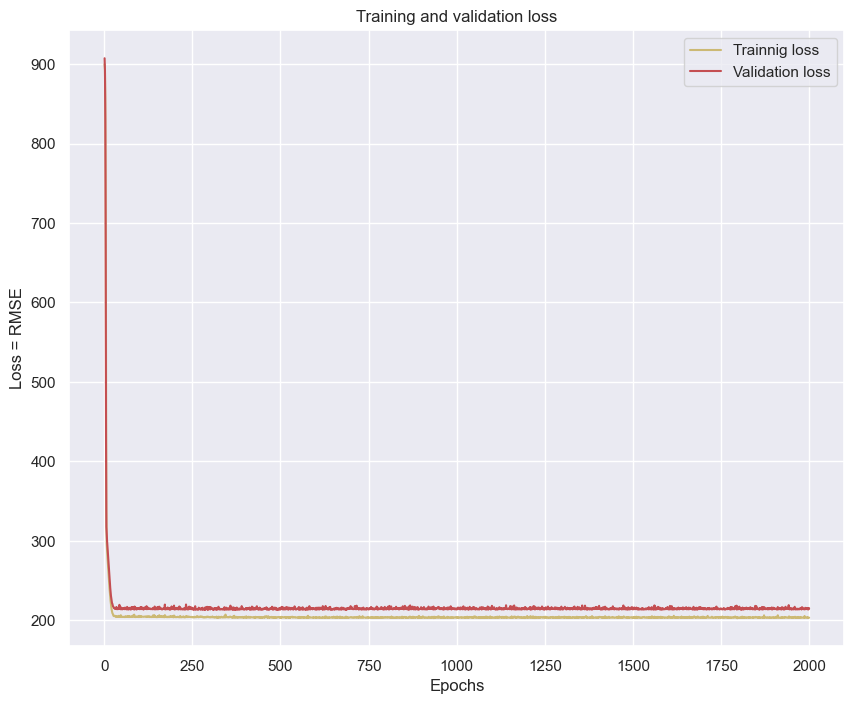

In [35]:
# Plot the training and validation accuracy and loss at each epoch
loss = history.history['rmse']
val_loss = history.history['val_rmse']
epochs = range(1, len(loss)+1)
plt.figure(figsize=(10, 8))
plt.plot(epochs, loss, 'y', label='Trainnig loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss = RMSE')
# lims = [-1, 500]
# plt.xlim(lims)
# plt.ylim(lims)
plt.legend()
plt.show()

In [36]:
# summary of the results
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,rmse,val_loss,val_rmse,epoch
1995,41263.820312,203.134979,46140.886719,214.804306,1995
1996,41525.171875,203.777267,46480.925781,215.594360,1996
1997,41305.355469,203.237183,45654.906250,213.670090,1997
1998,41347.265625,203.340271,46415.855469,215.443390,1998
1999,41341.031250,203.324966,46271.394531,215.107864,1999


In [37]:
# since the validation has undergone fluctuations, that is, it sometimes goes up then down and up again,while the training set is going better
# it is an indicaiton of overfitting!

In [38]:
# Test the model after training:
example_batch = train_df['distance'][:10] # first 10 instances
example_result = model1.predict(example_batch)
print('The predicted values')
example_result

1/1 [==============================] - 3s 3s/step
The predicted values


array([[ 362.65216],
       [1284.1311 ],
       [ 928.5028 ],
       [ 697.35175],
       [ 267.1577 ],
       [ 894.69794],
       [1295.6067 ],
       [1875.2368 ],
       [ 807.288  ],
       [1094.6978 ]], dtype=float32)

In [39]:
print('The actual values')
train_df['travel time'][:10]

The actual values


32      344
394    1130
548     796
282     768
485     215
725     914
454    1266
732    2214
606     588
733    1235
Name: travel time, dtype: int64

In [40]:
# evaluate the model on training dataset and pass the same input and output
#... pair and collect performance indexes
rmse = model1.evaluate(train_df['distance'],train_df['travel time'], verbose=2)
print(rmse)
# print('train_df MAE: {:5.2f} medv'.format(rmse))
# print('train_df MSE: {:5.2f} medv'.format(rmse))

16/16 - 0s - loss: 41157.9570 - rmse: 202.8742 - 28ms/epoch - 2ms/step
[41157.95703125, 202.87423706054688]


In [41]:
# evaluate the model on validation dataset and pass the same input and output
#... pair and collect performance indexes
# loss, mae, mse, mape = model1.evaluate(valid_df['distance'],valid_df['travel time'], verbose=2)
rmse = model1.evaluate(valid_df['distance'],valid_df['travel time'], verbose=2)
print(rmse)
# print('valid_df MAE: {:5.2f} medv'.format(mae))
# print('valid_df MSE: {:5.2f} medv'.format(mse))

6/6 - 0s - loss: 46271.3945 - rmse: 215.1079 - 24ms/epoch - 4ms/step
[46271.39453125, 215.1078643798828]


In [42]:
# evaluate the model on testing dataset and pass the same input and output
#... pair and collect performance indexes
# loss, mae, mse, mape = model1.evaluate(test_df['distance'],test_df['travel time'], verbose=2)
# print('test_df MAE: {:5.2f} medv'.format(mae))
# print('test_df MSE: {:5.2f} medv'.format(mse))
rmse = model1.evaluate(test_df['distance'],test_df['travel time'], verbose=2)
print(rmse)

6/6 - 0s - loss: 35805.0898 - rmse: 189.2223 - 19ms/epoch - 3ms/step
[35805.08984375, 189.2223358154297]


6/6 [==============================] - 0s 1000us/step


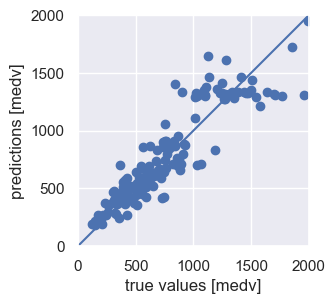

In [43]:
test_predictions = model1.predict(test_df['distance']).flatten()
plt.figure(figsize=(5, 3))
a= plt.axes(aspect='equal')
plt.scatter(test_df['travel time'], test_predictions)
plt.xlabel('true values [medv]')
plt.ylabel('predictions [medv]')

lims = [0, 2000]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims,lims)

16/16 [==============================] - 0s 2ms/step


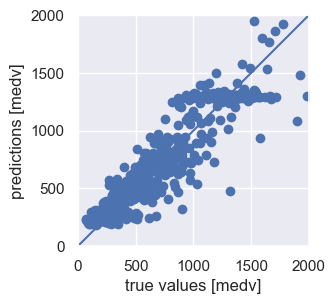

In [44]:
train_predictions = model1.predict(train_df['distance']).flatten()
plt.figure(figsize=(5, 3))
a= plt.axes(aspect='equal')
plt.scatter(train_df['travel time'], train_predictions)
plt.xlabel('true values [medv]')
plt.ylabel('predictions [medv]')
lims = [0, 2000]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims,lims)

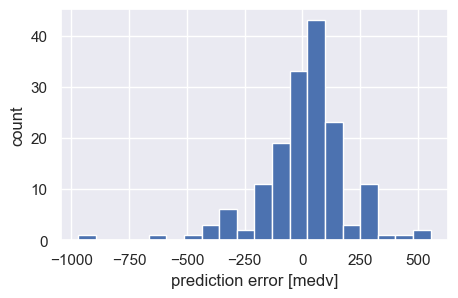

In [45]:
# error distribution
error = test_predictions - test_df['travel time']
plt.figure(figsize=(5, 3))
plt.hist(error, bins = 20)
plt.xlabel('prediction error [medv]')
_ = plt.ylabel('count')

# sub-problem 2:     ******* input: distance & hour *********

In [239]:
df.shape

(8172, 17)

In [240]:
df.head()

,travel time,distance,hour of day,hr_sin,hr_cos,1st ranked,2nd ranked,3rd ranked,4d ranked,5th ranked,6th ranked,1st dist,2nd dist,3rd dist,4rd dist,5th dist,6th dist
0,1038,0.542630,16,-0.866025,-5.000000e-01,primary,tertiary,primary_link,residential,NaN,NaN,0.944674,0.040381,0.014109,0.000837,NaN,NaN
1,1020,0.531771,22,-0.500000,8.660254e-01,primary,tertiary,primary_link,NaN,NaN,NaN,0.944411,0.041196,0.014394,NaN,NaN,NaN
2,730,0.296433,6,1.000000,6.123234e-17,primary,unclassified,tertiary,service,residential,NaN,0.822350,0.072746,0.053866,0.041059,0.009978,NaN
3,1235,0.427837,13,-0.258819,-9.659258e-01,primary,residential,unclassified,tertiary,NaN,NaN,0.648469,0.269826,0.050726,0.030980,NaN,NaN
4,576,0.312362,17,-0.965926,-2.588190e-01,primary,residential,tertiary,NaN,NaN,NaN,0.797448,0.137477,0.065075,NaN,NaN,NaN


c:\users\shima\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  """


<AxesSubplot:>

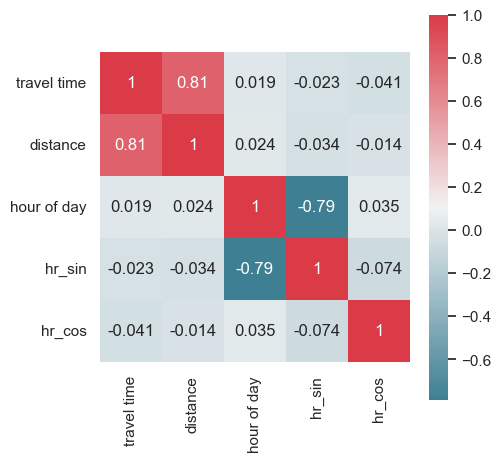

In [33]:
# run correlation matrix and plot
my_df = df[['travel time','distance','hour of day','hr_sin','hr_cos']]
f, ax = plt.subplots(figsize=(5,5))
corr = my_df.corr()
sns.heatmap(corr, annot=True, mask=np.zeros_like(corr,dtype=np.bool),
           cmap=sns.diverging_palette(220,10, as_cmap=True),
           square=True, ax=ax)

### cyclical encoding of hour

In [34]:
x = np.array(df[['distance','hr_sin','hr_cos']])
y = np.array(df['travel time'])
x

array([[ 5.42629615e-01, -8.66025404e-01, -5.00000000e-01],
       [ 5.31770676e-01, -5.00000000e-01,  8.66025404e-01],
       [ 2.96433144e-01,  1.00000000e+00,  6.12323400e-17],
       ...,
       [ 3.84812390e-01, -7.07106781e-01, -7.07106781e-01],
       [ 6.79393237e-01, -1.00000000e+00, -1.83697020e-16],
       [ 1.88720986e-01, -9.65925826e-01,  2.58819045e-01]])

In [35]:
#split data into test & train
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [36]:
print(X_train.shape)
print(X_test.shape)
# X_train

(6537, 3)
(1635, 3)


In [37]:
# inputs: distance + hour
model2_1 = nnmodel(20, num_hlayers=1,Epoch=500)
model2_1

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 765644.5000 - mape: 99.7731 - rmse: 875.0112 - val_loss: 783961.5625 - val_mape: 99.5344 - val_rmse: 885.4160
Epoch 2/500
205/205 [==============================] - 0s 861us/step - loss: 759095.4375 - mape: 99.1220 - rmse: 871.2608 - val_loss: 774440.6250 - val_mape: 98.6067 - val_rmse: 880.0231
Epoch 3/500
205/205 [==============================] - 0s 792us/step - loss: 746307.3125 - mape: 97.8557 - rmse: 863.8908 - val_loss: 757845.0000 - val_mape: 96.9856 - val_rmse: 870.5429
Epoch 4/500
205/205 [==============================] - 0s 740us/step - loss: 726292.8125 - mape: 95.8240 - rmse: 852.2281 - val_loss: 734002.9375 - val_mape: 94.6035 - val_rmse: 856.7397
Epoch 5/500
205/205 [==============================] - 0s 780us/step - loss: 699876.1875 - mape: 93.1159 - rmse: 836.5861 - val_loss: 704883.0000 - val_mape: 91.6270 - val_rmse: 839.5731
Epoch 6/500
205/205 [==============================] - 0s 753us/ste

Epoch 45/500
205/205 [==============================] - 0s 763us/step - loss: 80599.5859 - mape: 37.6119 - rmse: 283.9007 - val_loss: 82671.6172 - val_mape: 37.0710 - val_rmse: 287.5267
Epoch 46/500
205/205 [==============================] - 0s 750us/step - loss: 79324.6953 - mape: 37.1545 - rmse: 281.6464 - val_loss: 81406.9297 - val_mape: 36.5575 - val_rmse: 285.3190
Epoch 47/500
205/205 [==============================] - 0s 741us/step - loss: 78079.9531 - mape: 36.6729 - rmse: 279.4279 - val_loss: 80183.6250 - val_mape: 36.1587 - val_rmse: 283.1671
Epoch 48/500
205/205 [==============================] - 0s 755us/step - loss: 76872.6172 - mape: 36.2018 - rmse: 277.2591 - val_loss: 79036.8906 - val_mape: 35.5618 - val_rmse: 281.1350
Epoch 49/500
205/205 [==============================] - 0s 745us/step - loss: 75701.9766 - mape: 35.7330 - rmse: 275.1399 - val_loss: 77878.6172 - val_mape: 35.0529 - val_rmse: 279.0674
Epoch 50/500
205/205 [==============================] - 0s 753us/step 

205/205 [==============================] - 0s 766us/step - loss: 59464.5508 - mape: 24.6935 - rmse: 243.8535 - val_loss: 62580.2109 - val_mape: 24.1880 - val_rmse: 250.1604
Epoch 90/500
205/205 [==============================] - 0s 735us/step - loss: 59453.0625 - mape: 24.5459 - rmse: 243.8300 - val_loss: 62576.8320 - val_mape: 24.0986 - val_rmse: 250.1536
Epoch 91/500
205/205 [==============================] - 0s 757us/step - loss: 59435.8516 - mape: 24.5927 - rmse: 243.7947 - val_loss: 62572.9531 - val_mape: 23.9976 - val_rmse: 250.1459
Epoch 92/500
205/205 [==============================] - 0s 737us/step - loss: 59427.9883 - mape: 24.3827 - rmse: 243.7786 - val_loss: 62545.0625 - val_mape: 24.0770 - val_rmse: 250.0901
Epoch 93/500
205/205 [==============================] - 0s 755us/step - loss: 59415.8281 - mape: 24.3533 - rmse: 243.7536 - val_loss: 62534.3789 - val_mape: 24.0529 - val_rmse: 250.0687
Epoch 94/500
205/205 [==============================] - 0s 751us/step - loss: 59409

Epoch 133/500
205/205 [==============================] - 0s 742us/step - loss: 59351.5469 - mape: 23.9487 - rmse: 243.6217 - val_loss: 62493.2109 - val_mape: 23.5171 - val_rmse: 249.9864
Epoch 134/500
205/205 [==============================] - 0s 735us/step - loss: 59354.0625 - mape: 23.9431 - rmse: 243.6269 - val_loss: 62485.0039 - val_mape: 23.5780 - val_rmse: 249.9700
Epoch 135/500
205/205 [==============================] - 0s 743us/step - loss: 59346.5938 - mape: 23.9348 - rmse: 243.6116 - val_loss: 62489.6602 - val_mape: 23.5410 - val_rmse: 249.9793
Epoch 136/500
205/205 [==============================] - 0s 741us/step - loss: 59347.7930 - mape: 24.0136 - rmse: 243.6140 - val_loss: 62511.6875 - val_mape: 23.4118 - val_rmse: 250.0234
Epoch 137/500
205/205 [==============================] - 0s 790us/step - loss: 59349.0977 - mape: 23.9117 - rmse: 243.6167 - val_loss: 62494.7539 - val_mape: 23.4947 - val_rmse: 249.9895
Epoch 138/500
205/205 [==============================] - 0s 756us

Epoch 177/500
205/205 [==============================] - 0s 749us/step - loss: 59344.9961 - mape: 23.8294 - rmse: 243.6083 - val_loss: 62474.2305 - val_mape: 23.5727 - val_rmse: 249.9485
Epoch 178/500
205/205 [==============================] - 0s 755us/step - loss: 59344.5000 - mape: 23.9636 - rmse: 243.6073 - val_loss: 62480.0820 - val_mape: 23.5297 - val_rmse: 249.9602
Epoch 179/500
205/205 [==============================] - 0s 748us/step - loss: 59337.7070 - mape: 24.0058 - rmse: 243.5933 - val_loss: 62507.4883 - val_mape: 23.3882 - val_rmse: 250.0150
Epoch 180/500
205/205 [==============================] - 0s 765us/step - loss: 59338.5547 - mape: 23.7740 - rmse: 243.5951 - val_loss: 62477.2148 - val_mape: 23.5676 - val_rmse: 249.9544
Epoch 181/500
205/205 [==============================] - 0s 765us/step - loss: 59346.2695 - mape: 23.9034 - rmse: 243.6109 - val_loss: 62474.7109 - val_mape: 23.5716 - val_rmse: 249.9494
Epoch 182/500
205/205 [==============================] - 0s 750us

Epoch 221/500
205/205 [==============================] - 0s 735us/step - loss: 59344.0312 - mape: 23.8997 - rmse: 243.6063 - val_loss: 62489.7031 - val_mape: 23.4665 - val_rmse: 249.9794
Epoch 222/500
205/205 [==============================] - 0s 740us/step - loss: 59340.5234 - mape: 23.9125 - rmse: 243.5991 - val_loss: 62487.5234 - val_mape: 23.4741 - val_rmse: 249.9751
Epoch 223/500
205/205 [==============================] - 0s 728us/step - loss: 59345.2656 - mape: 23.8794 - rmse: 243.6088 - val_loss: 62486.3008 - val_mape: 23.4767 - val_rmse: 249.9726
Epoch 224/500
205/205 [==============================] - 0s 754us/step - loss: 59342.1367 - mape: 23.8340 - rmse: 243.6024 - val_loss: 62480.0156 - val_mape: 23.5248 - val_rmse: 249.9600
Epoch 225/500
205/205 [==============================] - 0s 760us/step - loss: 59338.5352 - mape: 23.9693 - rmse: 243.5950 - val_loss: 62492.3242 - val_mape: 23.4439 - val_rmse: 249.9846
Epoch 226/500
205/205 [==============================] - 0s 769us

Epoch 265/500
205/205 [==============================] - 0s 751us/step - loss: 59339.2734 - mape: 23.9622 - rmse: 243.5965 - val_loss: 62491.4609 - val_mape: 23.4197 - val_rmse: 249.9829
Epoch 266/500
205/205 [==============================] - 0s 749us/step - loss: 59337.3438 - mape: 23.8331 - rmse: 243.5926 - val_loss: 62480.7969 - val_mape: 23.4884 - val_rmse: 249.9616
Epoch 267/500
205/205 [==============================] - 0s 744us/step - loss: 59339.1719 - mape: 23.9044 - rmse: 243.5963 - val_loss: 62479.1445 - val_mape: 23.4986 - val_rmse: 249.9583
Epoch 268/500
205/205 [==============================] - 0s 751us/step - loss: 59345.4258 - mape: 24.0062 - rmse: 243.6092 - val_loss: 62476.7305 - val_mape: 23.5065 - val_rmse: 249.9535
Epoch 269/500
205/205 [==============================] - 0s 742us/step - loss: 59338.2500 - mape: 23.9440 - rmse: 243.5944 - val_loss: 62505.1680 - val_mape: 23.3469 - val_rmse: 250.0103
Epoch 270/500
205/205 [==============================] - 0s 756us

Epoch 309/500
205/205 [==============================] - 0s 792us/step - loss: 59334.9766 - mape: 23.9754 - rmse: 243.5877 - val_loss: 62487.5000 - val_mape: 23.4367 - val_rmse: 249.9750
Epoch 310/500
205/205 [==============================] - 0s 758us/step - loss: 59335.1875 - mape: 23.8789 - rmse: 243.5882 - val_loss: 62492.0430 - val_mape: 23.4156 - val_rmse: 249.9841
Epoch 311/500
205/205 [==============================] - 0s 761us/step - loss: 59339.4062 - mape: 23.9137 - rmse: 243.5968 - val_loss: 62482.8164 - val_mape: 23.4549 - val_rmse: 249.9656
Epoch 312/500
205/205 [==============================] - 0s 756us/step - loss: 59344.6836 - mape: 23.8884 - rmse: 243.6076 - val_loss: 62476.6953 - val_mape: 23.5070 - val_rmse: 249.9534
Epoch 313/500
205/205 [==============================] - 0s 778us/step - loss: 59345.3789 - mape: 23.8612 - rmse: 243.6091 - val_loss: 62482.8711 - val_mape: 23.4795 - val_rmse: 249.9657
Epoch 314/500
205/205 [==============================] - 0s 737us

Epoch 353/500
205/205 [==============================] - 0s 732us/step - loss: 59336.5781 - mape: 23.8977 - rmse: 243.5910 - val_loss: 62490.5430 - val_mape: 23.4143 - val_rmse: 249.9811
Epoch 354/500
205/205 [==============================] - 0s 747us/step - loss: 59338.2109 - mape: 23.8038 - rmse: 243.5944 - val_loss: 62478.9922 - val_mape: 23.4921 - val_rmse: 249.9580
Epoch 355/500
205/205 [==============================] - 0s 745us/step - loss: 59334.7305 - mape: 23.9102 - rmse: 243.5872 - val_loss: 62484.7578 - val_mape: 23.4371 - val_rmse: 249.9695
Epoch 356/500
205/205 [==============================] - 0s 732us/step - loss: 59345.9062 - mape: 23.8857 - rmse: 243.6102 - val_loss: 62470.8633 - val_mape: 23.5497 - val_rmse: 249.9417
Epoch 357/500
205/205 [==============================] - 0s 736us/step - loss: 59330.4570 - mape: 23.8958 - rmse: 243.5784 - val_loss: 62475.8594 - val_mape: 23.5082 - val_rmse: 249.9517
Epoch 358/500
205/205 [==============================] - 0s 725us

Epoch 397/500
205/205 [==============================] - 0s 747us/step - loss: 59334.9961 - mape: 23.8624 - rmse: 243.5878 - val_loss: 62494.1719 - val_mape: 23.3977 - val_rmse: 249.9883
Epoch 398/500
205/205 [==============================] - 0s 731us/step - loss: 59335.8477 - mape: 23.9685 - rmse: 243.5895 - val_loss: 62494.6289 - val_mape: 23.4009 - val_rmse: 249.9893
Epoch 399/500
205/205 [==============================] - 0s 735us/step - loss: 59335.9258 - mape: 23.8512 - rmse: 243.5897 - val_loss: 62481.2070 - val_mape: 23.4827 - val_rmse: 249.9624
Epoch 400/500
205/205 [==============================] - 0s 748us/step - loss: 59330.6250 - mape: 23.8217 - rmse: 243.5788 - val_loss: 62468.6250 - val_mape: 23.5800 - val_rmse: 249.9372
Epoch 401/500
205/205 [==============================] - 0s 750us/step - loss: 59338.7109 - mape: 23.9770 - rmse: 243.5954 - val_loss: 62476.6250 - val_mape: 23.5057 - val_rmse: 249.9532
Epoch 402/500
205/205 [==============================] - 0s 759us

Epoch 441/500
205/205 [==============================] - 0s 750us/step - loss: 59327.7617 - mape: 23.9458 - rmse: 243.5729 - val_loss: 62495.5000 - val_mape: 23.3874 - val_rmse: 249.9910
Epoch 442/500
205/205 [==============================] - 0s 755us/step - loss: 59338.0469 - mape: 23.8370 - rmse: 243.5940 - val_loss: 62498.5977 - val_mape: 23.3667 - val_rmse: 249.9972
Epoch 443/500
205/205 [==============================] - 0s 741us/step - loss: 59329.9453 - mape: 23.9030 - rmse: 243.5774 - val_loss: 62498.9062 - val_mape: 23.3804 - val_rmse: 249.9978
Epoch 444/500
205/205 [==============================] - 0s 733us/step - loss: 59328.5938 - mape: 23.8828 - rmse: 243.5746 - val_loss: 62481.3516 - val_mape: 23.4586 - val_rmse: 249.9627
Epoch 445/500
205/205 [==============================] - 0s 741us/step - loss: 59332.3672 - mape: 23.8270 - rmse: 243.5824 - val_loss: 62467.2695 - val_mape: 23.5547 - val_rmse: 249.9345
Epoch 446/500
205/205 [==============================] - 0s 722us

Epoch 485/500
205/205 [==============================] - 0s 740us/step - loss: 59325.0078 - mape: 23.9074 - rmse: 243.5673 - val_loss: 62470.5547 - val_mape: 23.5268 - val_rmse: 249.9411
Epoch 486/500
205/205 [==============================] - 0s 770us/step - loss: 59328.0820 - mape: 23.9705 - rmse: 243.5736 - val_loss: 62487.5859 - val_mape: 23.4175 - val_rmse: 249.9752
Epoch 487/500
205/205 [==============================] - 0s 760us/step - loss: 59331.2891 - mape: 23.8481 - rmse: 243.5802 - val_loss: 62475.4297 - val_mape: 23.4880 - val_rmse: 249.9509
Epoch 488/500
205/205 [==============================] - 0s 779us/step - loss: 59326.4141 - mape: 23.9009 - rmse: 243.5701 - val_loss: 62483.9180 - val_mape: 23.4384 - val_rmse: 249.9678
Epoch 489/500
205/205 [==============================] - 0s 735us/step - loss: 59327.8086 - mape: 23.9782 - rmse: 243.5730 - val_loss: 62479.6055 - val_mape: 23.4628 - val_rmse: 249.9592
Epoch 490/500
205/205 [==============================] - 0s 735us

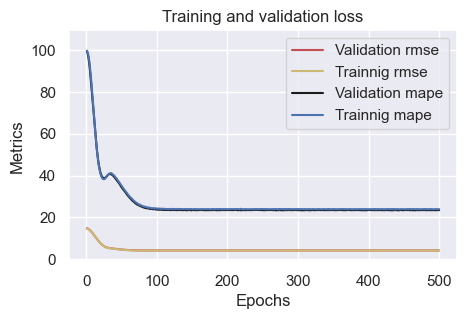

In [38]:
plotme(model2_1)

In [83]:
# inputs: distance + hour
model2_2 = nnmodel(50, num_hlayers=1,Epoch=1000)
model2_2

Epoch 1/2000
205/205 [==============================] - 0s 1ms/step - loss: 764374.2500 - mape: 99.6315 - rmse: 874.2850 - val_loss: 779636.4375 - val_mape: 99.0802 - val_rmse: 882.9702
Epoch 2/2000
205/205 [==============================] - 0s 806us/step - loss: 747907.6250 - mape: 97.9517 - rmse: 864.8165 - val_loss: 753732.8125 - val_mape: 96.5059 - val_rmse: 868.1779
Epoch 3/2000
205/205 [==============================] - 0s 877us/step - loss: 711933.8750 - mape: 94.2769 - rmse: 843.7617 - val_loss: 707246.7500 - val_mape: 91.7888 - val_rmse: 840.9796
Epoch 4/2000
205/205 [==============================] - 0s 912us/step - loss: 658499.8125 - mape: 88.5888 - rmse: 811.4800 - val_loss: 647065.1250 - val_mape: 85.3784 - val_rmse: 804.4036
Epoch 5/2000
205/205 [==============================] - 0s 880us/step - loss: 594884.6875 - mape: 81.5357 - rmse: 771.2877 - val_loss: 579593.8750 - val_mape: 78.2553 - val_rmse: 761.3106
Epoch 6/2000
205/205 [==============================] - 0s 821

Epoch 45/2000
205/205 [==============================] - 0s 873us/step - loss: 61774.5938 - mape: 27.6690 - rmse: 248.5450 - val_loss: 64551.5391 - val_mape: 27.2354 - val_rmse: 254.0699
Epoch 46/2000
205/205 [==============================] - 0s 809us/step - loss: 61337.4648 - mape: 27.4408 - rmse: 247.6640 - val_loss: 64160.6367 - val_mape: 26.8542 - val_rmse: 253.2995
Epoch 47/2000
205/205 [==============================] - 0s 780us/step - loss: 60977.4336 - mape: 27.0816 - rmse: 246.9361 - val_loss: 63864.9062 - val_mape: 26.3471 - val_rmse: 252.7151
Epoch 48/2000
205/205 [==============================] - 0s 797us/step - loss: 60675.6562 - mape: 26.6966 - rmse: 246.3243 - val_loss: 63587.6172 - val_mape: 26.1171 - val_rmse: 252.1658
Epoch 49/2000
205/205 [==============================] - 0s 807us/step - loss: 60413.6797 - mape: 26.2011 - rmse: 245.7919 - val_loss: 63359.5352 - val_mape: 25.9171 - val_rmse: 251.7132
Epoch 50/2000
205/205 [==============================] - 0s 773us

Epoch 89/2000
205/205 [==============================] - 0s 779us/step - loss: 59362.1641 - mape: 23.9593 - rmse: 243.6435 - val_loss: 62517.8281 - val_mape: 23.6120 - val_rmse: 250.0357
Epoch 90/2000
205/205 [==============================] - 0s 791us/step - loss: 59365.7812 - mape: 23.9937 - rmse: 243.6509 - val_loss: 62524.8438 - val_mape: 23.5646 - val_rmse: 250.0497
Epoch 91/2000
205/205 [==============================] - 0s 772us/step - loss: 59368.6094 - mape: 23.8982 - rmse: 243.6567 - val_loss: 62524.6562 - val_mape: 23.5527 - val_rmse: 250.0493
Epoch 92/2000
205/205 [==============================] - 0s 802us/step - loss: 59355.8945 - mape: 23.8912 - rmse: 243.6306 - val_loss: 62503.3164 - val_mape: 23.7449 - val_rmse: 250.0066
Epoch 93/2000
205/205 [==============================] - 0s 803us/step - loss: 59376.2734 - mape: 24.0331 - rmse: 243.6725 - val_loss: 62502.8125 - val_mape: 23.7044 - val_rmse: 250.0056
Epoch 94/2000
205/205 [==============================] - 0s 811us

Epoch 133/2000
205/205 [==============================] - 0s 793us/step - loss: 59359.8438 - mape: 23.9420 - rmse: 243.6388 - val_loss: 62493.3594 - val_mape: 23.7081 - val_rmse: 249.9867
Epoch 134/2000
205/205 [==============================] - 0s 796us/step - loss: 59350.7344 - mape: 24.1058 - rmse: 243.6201 - val_loss: 62565.2461 - val_mape: 23.2824 - val_rmse: 250.1305
Epoch 135/2000
205/205 [==============================] - 0s 833us/step - loss: 59358.5078 - mape: 23.8609 - rmse: 243.6360 - val_loss: 62518.6797 - val_mape: 23.5027 - val_rmse: 250.0374
Epoch 136/2000
205/205 [==============================] - 0s 838us/step - loss: 59367.0352 - mape: 23.9187 - rmse: 243.6535 - val_loss: 62522.0469 - val_mape: 23.4728 - val_rmse: 250.0441
Epoch 137/2000
205/205 [==============================] - 0s 792us/step - loss: 59361.1953 - mape: 23.9790 - rmse: 243.6415 - val_loss: 62558.4336 - val_mape: 23.3229 - val_rmse: 250.1168
Epoch 138/2000
205/205 [==============================] - 0s

Epoch 220/2000
205/205 [==============================] - 0s 895us/step - loss: 59366.1797 - mape: 23.9741 - rmse: 243.6518 - val_loss: 62509.5938 - val_mape: 23.4854 - val_rmse: 250.0192
Epoch 221/2000
205/205 [==============================] - 0s 796us/step - loss: 59351.4688 - mape: 23.9140 - rmse: 243.6216 - val_loss: 62523.0234 - val_mape: 23.4133 - val_rmse: 250.0460
Epoch 222/2000
205/205 [==============================] - 0s 788us/step - loss: 59344.9922 - mape: 23.9083 - rmse: 243.6083 - val_loss: 62512.9258 - val_mape: 23.4922 - val_rmse: 250.0258
Epoch 223/2000
205/205 [==============================] - 0s 796us/step - loss: 59342.0156 - mape: 23.8335 - rmse: 243.6022 - val_loss: 62483.9961 - val_mape: 23.6934 - val_rmse: 249.9680
Epoch 224/2000
205/205 [==============================] - 0s 769us/step - loss: 59348.9805 - mape: 24.0270 - rmse: 243.6165 - val_loss: 62512.9609 - val_mape: 23.4559 - val_rmse: 250.0259
Epoch 225/2000
205/205 [==============================] - 0s

Epoch 307/2000
205/205 [==============================] - 0s 786us/step - loss: 59334.3281 - mape: 23.8817 - rmse: 243.5864 - val_loss: 62498.8047 - val_mape: 23.5352 - val_rmse: 249.9976
Epoch 308/2000
205/205 [==============================] - 0s 792us/step - loss: 59340.1953 - mape: 24.0110 - rmse: 243.5984 - val_loss: 62516.4102 - val_mape: 23.4245 - val_rmse: 250.0328
Epoch 309/2000
205/205 [==============================] - 0s 790us/step - loss: 59342.1523 - mape: 23.7446 - rmse: 243.6024 - val_loss: 62485.6172 - val_mape: 23.6182 - val_rmse: 249.9712
Epoch 310/2000
205/205 [==============================] - 0s 791us/step - loss: 59345.7344 - mape: 23.9106 - rmse: 243.6098 - val_loss: 62490.7578 - val_mape: 23.5820 - val_rmse: 249.9815
Epoch 311/2000
205/205 [==============================] - 0s 774us/step - loss: 59334.3203 - mape: 23.9811 - rmse: 243.5864 - val_loss: 62526.7344 - val_mape: 23.3672 - val_rmse: 250.0535
Epoch 312/2000
205/205 [==============================] - 0s

Epoch 394/2000
205/205 [==============================] - 0s 779us/step - loss: 59340.3203 - mape: 23.8585 - rmse: 243.5987 - val_loss: 62490.9609 - val_mape: 23.5692 - val_rmse: 249.9819
Epoch 395/2000
205/205 [==============================] - 0s 780us/step - loss: 59341.7617 - mape: 23.7905 - rmse: 243.6016 - val_loss: 62479.4453 - val_mape: 23.6574 - val_rmse: 249.9589
Epoch 396/2000
205/205 [==============================] - 0s 812us/step - loss: 59332.0781 - mape: 23.8764 - rmse: 243.5818 - val_loss: 62486.8828 - val_mape: 23.6067 - val_rmse: 249.9738
Epoch 397/2000
205/205 [==============================] - 0s 781us/step - loss: 59333.0977 - mape: 24.0760 - rmse: 243.5839 - val_loss: 62507.0820 - val_mape: 23.4414 - val_rmse: 250.0142
Epoch 398/2000
205/205 [==============================] - 0s 789us/step - loss: 59334.9531 - mape: 23.8564 - rmse: 243.5877 - val_loss: 62516.5117 - val_mape: 23.3875 - val_rmse: 250.0330
Epoch 399/2000
205/205 [==============================] - 0s

Epoch 481/2000
205/205 [==============================] - 0s 777us/step - loss: 59327.7227 - mape: 23.8759 - rmse: 243.5728 - val_loss: 62496.4336 - val_mape: 23.5471 - val_rmse: 249.9929
Epoch 482/2000
205/205 [==============================] - 0s 811us/step - loss: 59326.8281 - mape: 23.8608 - rmse: 243.5710 - val_loss: 62500.9844 - val_mape: 23.5273 - val_rmse: 250.0020
Epoch 483/2000
205/205 [==============================] - 0s 771us/step - loss: 59329.3086 - mape: 23.8543 - rmse: 243.5761 - val_loss: 62503.1992 - val_mape: 23.4971 - val_rmse: 250.0064
Epoch 484/2000
205/205 [==============================] - 0s 790us/step - loss: 59333.9961 - mape: 23.9526 - rmse: 243.5857 - val_loss: 62513.1992 - val_mape: 23.4129 - val_rmse: 250.0264
Epoch 485/2000
205/205 [==============================] - 0s 795us/step - loss: 59326.8633 - mape: 23.9120 - rmse: 243.5711 - val_loss: 62514.1094 - val_mape: 23.4123 - val_rmse: 250.0282
Epoch 486/2000
205/205 [==============================] - 0s

Epoch 568/2000
205/205 [==============================] - 0s 798us/step - loss: 59319.2578 - mape: 23.8389 - rmse: 243.5555 - val_loss: 62499.0820 - val_mape: 23.4939 - val_rmse: 249.9982
Epoch 569/2000
205/205 [==============================] - 0s 789us/step - loss: 59331.6602 - mape: 23.9568 - rmse: 243.5809 - val_loss: 62511.9805 - val_mape: 23.4118 - val_rmse: 250.0240
Epoch 570/2000
205/205 [==============================] - 0s 785us/step - loss: 59317.7930 - mape: 23.9502 - rmse: 243.5524 - val_loss: 62551.4023 - val_mape: 23.2324 - val_rmse: 250.1028
Epoch 571/2000
205/205 [==============================] - 0s 776us/step - loss: 59330.3711 - mape: 23.8191 - rmse: 243.5783 - val_loss: 62537.8906 - val_mape: 23.2874 - val_rmse: 250.0758
Epoch 572/2000
205/205 [==============================] - 0s 782us/step - loss: 59318.7773 - mape: 23.8295 - rmse: 243.5545 - val_loss: 62503.2695 - val_mape: 23.4433 - val_rmse: 250.0065
Epoch 573/2000
205/205 [==============================] - 0s

Epoch 655/2000
205/205 [==============================] - 0s 800us/step - loss: 59313.8828 - mape: 23.7952 - rmse: 243.5444 - val_loss: 62506.3867 - val_mape: 23.4245 - val_rmse: 250.0128
Epoch 656/2000
205/205 [==============================] - 0s 779us/step - loss: 59315.1875 - mape: 23.8516 - rmse: 243.5471 - val_loss: 62498.1562 - val_mape: 23.4757 - val_rmse: 249.9963
Epoch 657/2000
205/205 [==============================] - 0s 790us/step - loss: 59318.0859 - mape: 23.8475 - rmse: 243.5530 - val_loss: 62501.7539 - val_mape: 23.4441 - val_rmse: 250.0035
Epoch 658/2000
205/205 [==============================] - 0s 802us/step - loss: 59331.1133 - mape: 23.8950 - rmse: 243.5798 - val_loss: 62504.2695 - val_mape: 23.4579 - val_rmse: 250.0085
Epoch 659/2000
205/205 [==============================] - 0s 798us/step - loss: 59320.9297 - mape: 23.8791 - rmse: 243.5589 - val_loss: 62511.8516 - val_mape: 23.4032 - val_rmse: 250.0237
Epoch 660/2000
205/205 [==============================] - 0s

Epoch 742/2000
205/205 [==============================] - 0s 780us/step - loss: 59306.9492 - mape: 23.8349 - rmse: 243.5302 - val_loss: 62492.0273 - val_mape: 23.5236 - val_rmse: 249.9841
Epoch 743/2000
205/205 [==============================] - 0s 791us/step - loss: 59331.8633 - mape: 23.8887 - rmse: 243.5813 - val_loss: 62488.8789 - val_mape: 23.5590 - val_rmse: 249.9778
Epoch 744/2000
205/205 [==============================] - 0s 776us/step - loss: 59319.6875 - mape: 23.9950 - rmse: 243.5563 - val_loss: 62515.7148 - val_mape: 23.3618 - val_rmse: 250.0314
Epoch 745/2000
205/205 [==============================] - 0s 799us/step - loss: 59318.7617 - mape: 23.8039 - rmse: 243.5544 - val_loss: 62506.4414 - val_mape: 23.4169 - val_rmse: 250.0129
Epoch 746/2000
205/205 [==============================] - 0s 768us/step - loss: 59316.5078 - mape: 23.8475 - rmse: 243.5498 - val_loss: 62495.1641 - val_mape: 23.4681 - val_rmse: 249.9903
Epoch 747/2000
205/205 [==============================] - 0s

Epoch 829/2000
205/205 [==============================] - 0s 805us/step - loss: 59321.4961 - mape: 23.8776 - rmse: 243.5600 - val_loss: 62503.7891 - val_mape: 23.4134 - val_rmse: 250.0076
Epoch 830/2000
205/205 [==============================] - 0s 799us/step - loss: 59324.1562 - mape: 23.7849 - rmse: 243.5655 - val_loss: 62499.0156 - val_mape: 23.4440 - val_rmse: 249.9980
Epoch 831/2000
205/205 [==============================] - 0s 779us/step - loss: 59324.1328 - mape: 23.9249 - rmse: 243.5655 - val_loss: 62498.1289 - val_mape: 23.4435 - val_rmse: 249.9963
Epoch 832/2000
205/205 [==============================] - 0s 793us/step - loss: 59335.3906 - mape: 23.8194 - rmse: 243.5886 - val_loss: 62488.5039 - val_mape: 23.5041 - val_rmse: 249.9770
Epoch 833/2000
205/205 [==============================] - 0s 780us/step - loss: 59318.2344 - mape: 23.8479 - rmse: 243.5533 - val_loss: 62516.9453 - val_mape: 23.3320 - val_rmse: 250.0339
Epoch 834/2000
205/205 [==============================] - 0s

Epoch 916/2000
205/205 [==============================] - 0s 786us/step - loss: 59322.0781 - mape: 23.9126 - rmse: 243.5612 - val_loss: 62514.7891 - val_mape: 23.3606 - val_rmse: 250.0296
Epoch 917/2000
205/205 [==============================] - 0s 776us/step - loss: 59325.5078 - mape: 23.8493 - rmse: 243.5683 - val_loss: 62513.5508 - val_mape: 23.3475 - val_rmse: 250.0271
Epoch 918/2000
205/205 [==============================] - 0s 764us/step - loss: 59322.0117 - mape: 23.8834 - rmse: 243.5611 - val_loss: 62495.9492 - val_mape: 23.4682 - val_rmse: 249.9919
Epoch 919/2000
205/205 [==============================] - 0s 767us/step - loss: 59312.4883 - mape: 23.7999 - rmse: 243.5415 - val_loss: 62486.4180 - val_mape: 23.6066 - val_rmse: 249.9728
Epoch 920/2000
205/205 [==============================] - 0s 783us/step - loss: 59319.6836 - mape: 23.9670 - rmse: 243.5563 - val_loss: 62497.8672 - val_mape: 23.4490 - val_rmse: 249.9957
Epoch 921/2000
205/205 [==============================] - 0s

Epoch 1003/2000
205/205 [==============================] - 0s 815us/step - loss: 59312.3125 - mape: 23.9704 - rmse: 243.5412 - val_loss: 62550.4961 - val_mape: 23.2090 - val_rmse: 250.1010
Epoch 1004/2000
205/205 [==============================] - 0s 878us/step - loss: 59306.7773 - mape: 23.6403 - rmse: 243.5298 - val_loss: 62483.8477 - val_mape: 23.5501 - val_rmse: 249.9677
Epoch 1005/2000
205/205 [==============================] - 0s 851us/step - loss: 59318.8945 - mape: 23.9096 - rmse: 243.5547 - val_loss: 62479.1094 - val_mape: 23.6028 - val_rmse: 249.9582
Epoch 1006/2000
205/205 [==============================] - 0s 851us/step - loss: 59326.2734 - mape: 23.9481 - rmse: 243.5699 - val_loss: 62500.5156 - val_mape: 23.4402 - val_rmse: 250.0010
Epoch 1007/2000
205/205 [==============================] - 0s 769us/step - loss: 59312.9727 - mape: 23.8867 - rmse: 243.5425 - val_loss: 62508.4961 - val_mape: 23.3891 - val_rmse: 250.0170
Epoch 1008/2000
205/205 [==============================

205/205 [==============================] - 0s 776us/step - loss: 59313.3320 - mape: 23.9194 - rmse: 243.5433 - val_loss: 62494.4062 - val_mape: 23.4711 - val_rmse: 249.9888
Epoch 1090/2000
205/205 [==============================] - 0s 782us/step - loss: 59313.0859 - mape: 23.8301 - rmse: 243.5428 - val_loss: 62485.0938 - val_mape: 23.5485 - val_rmse: 249.9702
Epoch 1091/2000
205/205 [==============================] - 0s 773us/step - loss: 59314.5156 - mape: 23.8355 - rmse: 243.5457 - val_loss: 62492.0938 - val_mape: 23.4846 - val_rmse: 249.9842
Epoch 1092/2000
205/205 [==============================] - 0s 779us/step - loss: 59305.3828 - mape: 23.9958 - rmse: 243.5270 - val_loss: 62532.3516 - val_mape: 23.2619 - val_rmse: 250.0647
Epoch 1093/2000
205/205 [==============================] - 0s 757us/step - loss: 59319.4688 - mape: 23.6689 - rmse: 243.5559 - val_loss: 62484.0234 - val_mape: 23.5410 - val_rmse: 249.9680
Epoch 1094/2000
205/205 [==============================] - 0s 752us/ste

205/205 [==============================] - 0s 787us/step - loss: 59306.2656 - mape: 23.7754 - rmse: 243.5288 - val_loss: 62513.9180 - val_mape: 23.3312 - val_rmse: 250.0278
Epoch 1176/2000
205/205 [==============================] - 0s 780us/step - loss: 59312.6406 - mape: 23.8386 - rmse: 243.5419 - val_loss: 62492.4336 - val_mape: 23.4518 - val_rmse: 249.9849
Epoch 1177/2000
205/205 [==============================] - 0s 777us/step - loss: 59313.7812 - mape: 23.8683 - rmse: 243.5442 - val_loss: 62512.8281 - val_mape: 23.3251 - val_rmse: 250.0257
Epoch 1178/2000
205/205 [==============================] - 0s 777us/step - loss: 59317.1875 - mape: 23.7951 - rmse: 243.5512 - val_loss: 62494.0391 - val_mape: 23.4627 - val_rmse: 249.9881
Epoch 1179/2000
205/205 [==============================] - 0s 783us/step - loss: 59319.6250 - mape: 23.8374 - rmse: 243.5562 - val_loss: 62479.5039 - val_mape: 23.5647 - val_rmse: 249.9590
Epoch 1180/2000
205/205 [==============================] - 0s 810us/ste

205/205 [==============================] - 0s 822us/step - loss: 59317.1523 - mape: 23.8682 - rmse: 243.5511 - val_loss: 62492.4102 - val_mape: 23.4426 - val_rmse: 249.9848
Epoch 1262/2000
205/205 [==============================] - 0s 799us/step - loss: 59311.2578 - mape: 24.0496 - rmse: 243.5390 - val_loss: 62533.5547 - val_mape: 23.2341 - val_rmse: 250.0671
Epoch 1263/2000
205/205 [==============================] - 0s 776us/step - loss: 59321.7969 - mape: 23.8611 - rmse: 243.5607 - val_loss: 62521.5820 - val_mape: 23.3101 - val_rmse: 250.0432
Epoch 1264/2000
205/205 [==============================] - 0s 765us/step - loss: 59311.0312 - mape: 23.8105 - rmse: 243.5386 - val_loss: 62507.7031 - val_mape: 23.3591 - val_rmse: 250.0154
Epoch 1265/2000
205/205 [==============================] - 0s 765us/step - loss: 59312.0039 - mape: 23.7341 - rmse: 243.5406 - val_loss: 62481.2656 - val_mape: 23.5396 - val_rmse: 249.9625
Epoch 1266/2000
205/205 [==============================] - 0s 770us/ste

205/205 [==============================] - 0s 783us/step - loss: 59319.1094 - mape: 23.7254 - rmse: 243.5551 - val_loss: 62502.0195 - val_mape: 23.3909 - val_rmse: 250.0040
Epoch 1348/2000
205/205 [==============================] - 0s 768us/step - loss: 59314.1055 - mape: 23.8383 - rmse: 243.5449 - val_loss: 62481.9141 - val_mape: 23.5287 - val_rmse: 249.9638
Epoch 1349/2000
205/205 [==============================] - 0s 760us/step - loss: 59316.8633 - mape: 23.9654 - rmse: 243.5505 - val_loss: 62508.4922 - val_mape: 23.3579 - val_rmse: 250.0170
Epoch 1350/2000
205/205 [==============================] - 0s 782us/step - loss: 59313.5742 - mape: 23.8582 - rmse: 243.5438 - val_loss: 62521.6836 - val_mape: 23.2925 - val_rmse: 250.0434
Epoch 1351/2000
205/205 [==============================] - 0s 759us/step - loss: 59313.6484 - mape: 23.8168 - rmse: 243.5439 - val_loss: 62527.8672 - val_mape: 23.2646 - val_rmse: 250.0557
Epoch 1352/2000
205/205 [==============================] - 0s 763us/ste

205/205 [==============================] - 0s 809us/step - loss: 59308.4336 - mape: 23.7841 - rmse: 243.5332 - val_loss: 62497.1875 - val_mape: 23.4130 - val_rmse: 249.9944
Epoch 1434/2000
205/205 [==============================] - 0s 785us/step - loss: 59307.6055 - mape: 23.8231 - rmse: 243.5315 - val_loss: 62481.1953 - val_mape: 23.5575 - val_rmse: 249.9624
Epoch 1435/2000
205/205 [==============================] - 0s 791us/step - loss: 59321.3945 - mape: 23.9348 - rmse: 243.5598 - val_loss: 62495.0625 - val_mape: 23.4198 - val_rmse: 249.9901
Epoch 1436/2000
205/205 [==============================] - 0s 790us/step - loss: 59311.2930 - mape: 23.6417 - rmse: 243.5391 - val_loss: 62475.1445 - val_mape: 23.5825 - val_rmse: 249.9503
Epoch 1437/2000
205/205 [==============================] - 0s 778us/step - loss: 59321.1680 - mape: 23.9647 - rmse: 243.5594 - val_loss: 62489.5352 - val_mape: 23.4293 - val_rmse: 249.9791
Epoch 1438/2000
205/205 [==============================] - 0s 765us/ste

205/205 [==============================] - 0s 873us/step - loss: 59320.6094 - mape: 23.8968 - rmse: 243.5582 - val_loss: 62493.4688 - val_mape: 23.4134 - val_rmse: 249.9869
Epoch 1520/2000
205/205 [==============================] - 0s 902us/step - loss: 59312.5703 - mape: 23.9154 - rmse: 243.5417 - val_loss: 62506.2344 - val_mape: 23.3512 - val_rmse: 250.0125
Epoch 1521/2000
205/205 [==============================] - 0s 947us/step - loss: 59307.8711 - mape: 23.7944 - rmse: 243.5321 - val_loss: 62500.3555 - val_mape: 23.3864 - val_rmse: 250.0007
Epoch 1522/2000
205/205 [==============================] - 0s 787us/step - loss: 59307.3164 - mape: 23.8557 - rmse: 243.5309 - val_loss: 62502.5469 - val_mape: 23.3790 - val_rmse: 250.0051
Epoch 1523/2000
205/205 [==============================] - 0s 774us/step - loss: 59304.5469 - mape: 23.7983 - rmse: 243.5253 - val_loss: 62486.2031 - val_mape: 23.4609 - val_rmse: 249.9724
Epoch 1524/2000
205/205 [==============================] - 0s 757us/ste

205/205 [==============================] - 0s 772us/step - loss: 59314.0547 - mape: 23.8895 - rmse: 243.5448 - val_loss: 62499.2148 - val_mape: 23.3998 - val_rmse: 249.9984
Epoch 1606/2000
205/205 [==============================] - 0s 777us/step - loss: 59311.6602 - mape: 23.8172 - rmse: 243.5399 - val_loss: 62482.9062 - val_mape: 23.4820 - val_rmse: 249.9658
Epoch 1607/2000
205/205 [==============================] - 0s 757us/step - loss: 59302.5391 - mape: 23.8448 - rmse: 243.5211 - val_loss: 62499.9375 - val_mape: 23.3658 - val_rmse: 249.9999
Epoch 1608/2000
205/205 [==============================] - 0s 785us/step - loss: 59322.5664 - mape: 23.9024 - rmse: 243.5622 - val_loss: 62510.6172 - val_mape: 23.3168 - val_rmse: 250.0212
Epoch 1609/2000
205/205 [==============================] - 0s 769us/step - loss: 59301.8438 - mape: 23.8498 - rmse: 243.5197 - val_loss: 62530.1445 - val_mape: 23.2252 - val_rmse: 250.0603
Epoch 1610/2000
205/205 [==============================] - 0s 797us/ste

205/205 [==============================] - 0s 753us/step - loss: 59309.8320 - mape: 23.8006 - rmse: 243.5361 - val_loss: 62505.9805 - val_mape: 23.3308 - val_rmse: 250.0120
Epoch 1692/2000
205/205 [==============================] - 0s 769us/step - loss: 59306.2422 - mape: 23.7384 - rmse: 243.5287 - val_loss: 62482.2734 - val_mape: 23.4925 - val_rmse: 249.9645
Epoch 1693/2000
205/205 [==============================] - 0s 776us/step - loss: 59304.6172 - mape: 23.9657 - rmse: 243.5254 - val_loss: 62512.7617 - val_mape: 23.3042 - val_rmse: 250.0255
Epoch 1694/2000
205/205 [==============================] - 0s 805us/step - loss: 59306.4336 - mape: 23.7296 - rmse: 243.5291 - val_loss: 62492.9961 - val_mape: 23.4112 - val_rmse: 249.9860
Epoch 1695/2000
205/205 [==============================] - 0s 799us/step - loss: 59305.8633 - mape: 23.8990 - rmse: 243.5280 - val_loss: 62509.1953 - val_mape: 23.3222 - val_rmse: 250.0184
Epoch 1696/2000
205/205 [==============================] - 0s 802us/ste

205/205 [==============================] - 0s 774us/step - loss: 59307.5625 - mape: 23.7614 - rmse: 243.5314 - val_loss: 62482.7148 - val_mape: 23.4627 - val_rmse: 249.9654
Epoch 1778/2000
205/205 [==============================] - 0s 762us/step - loss: 59300.4453 - mape: 23.8139 - rmse: 243.5168 - val_loss: 62479.7930 - val_mape: 23.4906 - val_rmse: 249.9596
Epoch 1779/2000
205/205 [==============================] - 0s 796us/step - loss: 59312.5469 - mape: 23.8984 - rmse: 243.5417 - val_loss: 62486.2188 - val_mape: 23.4235 - val_rmse: 249.9724
Epoch 1780/2000
205/205 [==============================] - 0s 793us/step - loss: 59303.2578 - mape: 23.9219 - rmse: 243.5226 - val_loss: 62484.8203 - val_mape: 23.4473 - val_rmse: 249.9696
Epoch 1781/2000
205/205 [==============================] - 0s 757us/step - loss: 59302.2812 - mape: 23.9419 - rmse: 243.5206 - val_loss: 62527.1523 - val_mape: 23.2308 - val_rmse: 250.0543
Epoch 1782/2000
205/205 [==============================] - 0s 745us/ste

205/205 [==============================] - 0s 759us/step - loss: 59306.4531 - mape: 23.8471 - rmse: 243.5292 - val_loss: 62520.2188 - val_mape: 23.2566 - val_rmse: 250.0404
Epoch 1864/2000
205/205 [==============================] - 0s 763us/step - loss: 59308.8320 - mape: 23.7857 - rmse: 243.5340 - val_loss: 62510.8164 - val_mape: 23.2814 - val_rmse: 250.0216
Epoch 1865/2000
205/205 [==============================] - 0s 776us/step - loss: 59304.9570 - mape: 23.8100 - rmse: 243.5261 - val_loss: 62507.6016 - val_mape: 23.3160 - val_rmse: 250.0152
Epoch 1866/2000
205/205 [==============================] - 0s 767us/step - loss: 59313.1562 - mape: 23.8217 - rmse: 243.5429 - val_loss: 62504.1875 - val_mape: 23.3332 - val_rmse: 250.0084
Epoch 1867/2000
205/205 [==============================] - 0s 755us/step - loss: 59300.8398 - mape: 23.9133 - rmse: 243.5176 - val_loss: 62541.6953 - val_mape: 23.1751 - val_rmse: 250.0834
Epoch 1868/2000
205/205 [==============================] - 0s 774us/ste

205/205 [==============================] - 0s 809us/step - loss: 59306.8789 - mape: 23.7818 - rmse: 243.5300 - val_loss: 62483.1562 - val_mape: 23.4473 - val_rmse: 249.9663
Epoch 1950/2000
205/205 [==============================] - 0s 758us/step - loss: 59307.3438 - mape: 23.8245 - rmse: 243.5310 - val_loss: 62471.2383 - val_mape: 23.5532 - val_rmse: 249.9425
Epoch 1951/2000
205/205 [==============================] - 0s 762us/step - loss: 59301.5469 - mape: 23.8291 - rmse: 243.5191 - val_loss: 62467.9336 - val_mape: 23.5760 - val_rmse: 249.9359
Epoch 1952/2000
205/205 [==============================] - 0s 783us/step - loss: 59318.2109 - mape: 23.9383 - rmse: 243.5533 - val_loss: 62474.4766 - val_mape: 23.5350 - val_rmse: 249.9489
Epoch 1953/2000
205/205 [==============================] - 0s 782us/step - loss: 59306.8867 - mape: 23.7206 - rmse: 243.5301 - val_loss: 62472.1094 - val_mape: 23.5522 - val_rmse: 249.9442
Epoch 1954/2000
205/205 [==============================] - 0s 799us/ste

In [39]:
# plotme(model2_2)

In [248]:
# inputs: distance + hour
model2_3 = nnmodel(100, num_hlayers=1,Epoch=500)
model2_3

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 762780.4375 - mape: 99.4857 - rmse: 873.3730 - val_loss: 774009.7500 - val_mape: 98.5455 - val_rmse: 879.7783
Epoch 2/500
205/205 [==============================] - 0s 836us/step - loss: 733402.5000 - mape: 96.5015 - rmse: 856.3892 - val_loss: 727590.6875 - val_mape: 93.9116 - val_rmse: 852.9893
Epoch 3/500
205/205 [==============================] - 0s 882us/step - loss: 672941.7500 - mape: 90.1949 - rmse: 820.3303 - val_loss: 654042.6250 - val_mape: 86.1648 - val_rmse: 808.7290
Epoch 4/500
205/205 [==============================] - 0s 858us/step - loss: 592180.2500 - mape: 81.1981 - rmse: 769.5325 - val_loss: 566454.7500 - val_mape: 76.8663 - val_rmse: 752.6319
Epoch 5/500
205/205 [==============================] - 0s 882us/step - loss: 503708.4375 - mape: 71.1499 - rmse: 709.7242 - val_loss: 476255.4375 - val_mape: 67.1529 - val_rmse: 690.1126
Epoch 6/500
205/205 [==============================] - 0s 858us/ste

Epoch 45/500
205/205 [==============================] - 0s 824us/step - loss: 59380.7422 - mape: 24.2763 - rmse: 243.6816 - val_loss: 62456.3047 - val_mape: 23.6407 - val_rmse: 249.9126
Epoch 46/500
205/205 [==============================] - 0s 814us/step - loss: 59377.3281 - mape: 24.0488 - rmse: 243.6746 - val_loss: 62435.3516 - val_mape: 23.7781 - val_rmse: 249.8707
Epoch 47/500
205/205 [==============================] - 0s 803us/step - loss: 59371.6055 - mape: 24.1041 - rmse: 243.6629 - val_loss: 62451.6797 - val_mape: 23.5711 - val_rmse: 249.9033
Epoch 48/500
205/205 [==============================] - 0s 803us/step - loss: 59350.5430 - mape: 24.0516 - rmse: 243.6197 - val_loss: 62439.8008 - val_mape: 23.5910 - val_rmse: 249.8796
Epoch 49/500
205/205 [==============================] - 0s 813us/step - loss: 59369.6445 - mape: 23.9864 - rmse: 243.6589 - val_loss: 62426.0391 - val_mape: 23.6558 - val_rmse: 249.8520
Epoch 50/500
205/205 [==============================] - 0s 791us/step 

205/205 [==============================] - 0s 782us/step - loss: 59331.6328 - mape: 23.8407 - rmse: 243.5809 - val_loss: 62411.6055 - val_mape: 23.6140 - val_rmse: 249.8232
Epoch 90/500
205/205 [==============================] - 0s 779us/step - loss: 59331.1836 - mape: 24.0523 - rmse: 243.5799 - val_loss: 62479.1094 - val_mape: 23.2369 - val_rmse: 249.9582
Epoch 91/500
205/205 [==============================] - 0s 796us/step - loss: 59334.9531 - mape: 23.7634 - rmse: 243.5877 - val_loss: 62421.6797 - val_mape: 23.5836 - val_rmse: 249.8433
Epoch 92/500
205/205 [==============================] - 0s 794us/step - loss: 59350.9844 - mape: 24.0150 - rmse: 243.6206 - val_loss: 62424.7344 - val_mape: 23.4990 - val_rmse: 249.8494
Epoch 93/500
205/205 [==============================] - 0s 820us/step - loss: 59337.4688 - mape: 23.8706 - rmse: 243.5928 - val_loss: 62431.6094 - val_mape: 23.4476 - val_rmse: 249.8632
Epoch 94/500
205/205 [==============================] - 0s 807us/step - loss: 59333

Epoch 133/500
205/205 [==============================] - 0s 817us/step - loss: 59319.1797 - mape: 23.9640 - rmse: 243.5553 - val_loss: 62492.5742 - val_mape: 23.1662 - val_rmse: 249.9852
Epoch 134/500
205/205 [==============================] - 0s 798us/step - loss: 59348.7695 - mape: 23.8974 - rmse: 243.6160 - val_loss: 62464.0117 - val_mape: 23.2545 - val_rmse: 249.9280
Epoch 135/500
205/205 [==============================] - 0s 798us/step - loss: 59326.8047 - mape: 23.7625 - rmse: 243.5709 - val_loss: 62430.5117 - val_mape: 23.4299 - val_rmse: 249.8610
Epoch 136/500
205/205 [==============================] - 0s 804us/step - loss: 59333.1953 - mape: 23.8405 - rmse: 243.5841 - val_loss: 62412.7305 - val_mape: 23.5750 - val_rmse: 249.8254
Epoch 137/500
205/205 [==============================] - 0s 797us/step - loss: 59328.1484 - mape: 24.0585 - rmse: 243.5737 - val_loss: 62499.1562 - val_mape: 23.1471 - val_rmse: 249.9983
Epoch 138/500
205/205 [==============================] - 0s 792us

Epoch 177/500
205/205 [==============================] - 0s 808us/step - loss: 59330.6523 - mape: 23.8528 - rmse: 243.5788 - val_loss: 62421.4414 - val_mape: 23.4674 - val_rmse: 249.8428
Epoch 178/500
205/205 [==============================] - 0s 773us/step - loss: 59335.8867 - mape: 23.8935 - rmse: 243.5896 - val_loss: 62416.3320 - val_mape: 23.4821 - val_rmse: 249.8326
Epoch 179/500
205/205 [==============================] - 0s 853us/step - loss: 59318.1445 - mape: 23.7393 - rmse: 243.5532 - val_loss: 62400.7031 - val_mape: 23.7724 - val_rmse: 249.8013
Epoch 180/500
205/205 [==============================] - 0s 779us/step - loss: 59338.6211 - mape: 23.9130 - rmse: 243.5952 - val_loss: 62420.7617 - val_mape: 23.5350 - val_rmse: 249.8415
Epoch 181/500
205/205 [==============================] - 0s 791us/step - loss: 59345.2852 - mape: 24.0399 - rmse: 243.6089 - val_loss: 62433.4336 - val_mape: 23.4634 - val_rmse: 249.8668
Epoch 182/500
205/205 [==============================] - 0s 807us

Epoch 221/500
205/205 [==============================] - 0s 814us/step - loss: 59322.0273 - mape: 23.5984 - rmse: 243.5611 - val_loss: 62402.2734 - val_mape: 23.9228 - val_rmse: 249.8045
Epoch 222/500
205/205 [==============================] - 0s 805us/step - loss: 59343.5117 - mape: 23.8994 - rmse: 243.6052 - val_loss: 62415.1836 - val_mape: 23.6050 - val_rmse: 249.8303
Epoch 223/500
205/205 [==============================] - 0s 811us/step - loss: 59318.6250 - mape: 23.9945 - rmse: 243.5542 - val_loss: 62449.0469 - val_mape: 23.3218 - val_rmse: 249.8981
Epoch 224/500
205/205 [==============================] - 0s 817us/step - loss: 59319.9141 - mape: 23.8240 - rmse: 243.5568 - val_loss: 62419.4297 - val_mape: 23.4845 - val_rmse: 249.8388
Epoch 225/500
205/205 [==============================] - 0s 817us/step - loss: 59321.4883 - mape: 23.8655 - rmse: 243.5600 - val_loss: 62434.1914 - val_mape: 23.3803 - val_rmse: 249.8683
Epoch 226/500
205/205 [==============================] - 0s 822us

Epoch 265/500
205/205 [==============================] - 0s 800us/step - loss: 59353.8477 - mape: 23.9246 - rmse: 243.6264 - val_loss: 62467.9531 - val_mape: 23.2665 - val_rmse: 249.9359
Epoch 266/500
205/205 [==============================] - 0s 807us/step - loss: 59331.8516 - mape: 23.8933 - rmse: 243.5813 - val_loss: 62405.4883 - val_mape: 23.5825 - val_rmse: 249.8109
Epoch 267/500
205/205 [==============================] - 0s 895us/step - loss: 59321.7109 - mape: 23.8805 - rmse: 243.5605 - val_loss: 62439.9375 - val_mape: 23.3400 - val_rmse: 249.8799
Epoch 268/500
205/205 [==============================] - 0s 1ms/step - loss: 59322.4336 - mape: 23.9257 - rmse: 243.5620 - val_loss: 62476.0273 - val_mape: 23.2103 - val_rmse: 249.9521
Epoch 269/500
205/205 [==============================] - 0s 955us/step - loss: 59329.3750 - mape: 23.8506 - rmse: 243.5762 - val_loss: 62445.1758 - val_mape: 23.3162 - val_rmse: 249.8903
Epoch 270/500
205/205 [==============================] - 0s 1ms/ste

Epoch 309/500
205/205 [==============================] - 0s 780us/step - loss: 59313.8906 - mape: 23.7385 - rmse: 243.5444 - val_loss: 62398.1914 - val_mape: 23.7429 - val_rmse: 249.7963
Epoch 310/500
205/205 [==============================] - 0s 804us/step - loss: 59322.2969 - mape: 24.0223 - rmse: 243.5617 - val_loss: 62436.6562 - val_mape: 23.3600 - val_rmse: 249.8733
Epoch 311/500
205/205 [==============================] - 0s 781us/step - loss: 59330.7266 - mape: 23.8561 - rmse: 243.5790 - val_loss: 62415.9258 - val_mape: 23.5070 - val_rmse: 249.8318
Epoch 312/500
205/205 [==============================] - 0s 809us/step - loss: 59328.4102 - mape: 23.8350 - rmse: 243.5742 - val_loss: 62420.7461 - val_mape: 23.5389 - val_rmse: 249.8414
Epoch 313/500
205/205 [==============================] - 0s 806us/step - loss: 59324.9180 - mape: 23.9778 - rmse: 243.5671 - val_loss: 62475.0859 - val_mape: 23.2377 - val_rmse: 249.9502
Epoch 314/500
205/205 [==============================] - 0s 770us

Epoch 353/500
205/205 [==============================] - 0s 793us/step - loss: 59326.3516 - mape: 23.9738 - rmse: 243.5700 - val_loss: 62422.1523 - val_mape: 23.4519 - val_rmse: 249.8443
Epoch 354/500
205/205 [==============================] - 0s 808us/step - loss: 59316.7109 - mape: 23.7927 - rmse: 243.5502 - val_loss: 62396.9375 - val_mape: 23.6859 - val_rmse: 249.7938
Epoch 355/500
205/205 [==============================] - 0s 790us/step - loss: 59337.6445 - mape: 23.9325 - rmse: 243.5932 - val_loss: 62449.6875 - val_mape: 23.2917 - val_rmse: 249.8994
Epoch 356/500
205/205 [==============================] - 0s 876us/step - loss: 59321.4023 - mape: 23.8219 - rmse: 243.5599 - val_loss: 62405.6211 - val_mape: 23.6155 - val_rmse: 249.8112
Epoch 357/500
205/205 [==============================] - 0s 804us/step - loss: 59325.4883 - mape: 23.8280 - rmse: 243.5682 - val_loss: 62406.1328 - val_mape: 23.5678 - val_rmse: 249.8122
Epoch 358/500
205/205 [==============================] - 0s 794us

Epoch 397/500
205/205 [==============================] - 0s 790us/step - loss: 59313.8711 - mape: 23.8055 - rmse: 243.5444 - val_loss: 62408.4141 - val_mape: 23.5137 - val_rmse: 249.8168
Epoch 398/500
205/205 [==============================] - 0s 821us/step - loss: 59316.7852 - mape: 24.0276 - rmse: 243.5504 - val_loss: 62504.4531 - val_mape: 23.0954 - val_rmse: 250.0089
Epoch 399/500
205/205 [==============================] - 0s 811us/step - loss: 59329.5430 - mape: 23.8595 - rmse: 243.5766 - val_loss: 62489.6797 - val_mape: 23.1538 - val_rmse: 249.9794
Epoch 400/500
205/205 [==============================] - 0s 803us/step - loss: 59323.7852 - mape: 23.7936 - rmse: 243.5647 - val_loss: 62443.8008 - val_mape: 23.3376 - val_rmse: 249.8876
Epoch 401/500
205/205 [==============================] - 0s 777us/step - loss: 59321.7148 - mape: 23.9660 - rmse: 243.5605 - val_loss: 62498.5508 - val_mape: 23.1173 - val_rmse: 249.9971
Epoch 402/500
205/205 [==============================] - 0s 801us

Epoch 441/500
205/205 [==============================] - 0s 810us/step - loss: 59339.3516 - mape: 23.8949 - rmse: 243.5967 - val_loss: 62482.3672 - val_mape: 23.2297 - val_rmse: 249.9647
Epoch 442/500
205/205 [==============================] - 0s 795us/step - loss: 59344.2852 - mape: 23.8284 - rmse: 243.6068 - val_loss: 62431.8281 - val_mape: 23.4253 - val_rmse: 249.8636
Epoch 443/500
205/205 [==============================] - 0s 781us/step - loss: 59330.2266 - mape: 23.7171 - rmse: 243.5780 - val_loss: 62391.5039 - val_mape: 23.9115 - val_rmse: 249.7829
Epoch 444/500
205/205 [==============================] - 0s 797us/step - loss: 59323.8555 - mape: 23.9903 - rmse: 243.5649 - val_loss: 62408.5234 - val_mape: 23.5317 - val_rmse: 249.8170
Epoch 445/500
205/205 [==============================] - 0s 805us/step - loss: 59337.4570 - mape: 23.9308 - rmse: 243.5928 - val_loss: 62427.1328 - val_mape: 23.4663 - val_rmse: 249.8542
Epoch 446/500
205/205 [==============================] - 0s 810us

Epoch 485/500
205/205 [==============================] - 0s 815us/step - loss: 59322.5469 - mape: 23.8943 - rmse: 243.5622 - val_loss: 62423.5156 - val_mape: 23.4207 - val_rmse: 249.8470
Epoch 486/500
205/205 [==============================] - 0s 822us/step - loss: 59324.4219 - mape: 23.9021 - rmse: 243.5661 - val_loss: 62415.8867 - val_mape: 23.5035 - val_rmse: 249.8317
Epoch 487/500
205/205 [==============================] - 0s 825us/step - loss: 59319.3164 - mape: 23.9160 - rmse: 243.5556 - val_loss: 62407.3477 - val_mape: 23.5360 - val_rmse: 249.8146
Epoch 488/500
205/205 [==============================] - 0s 818us/step - loss: 59318.3828 - mape: 23.8453 - rmse: 243.5536 - val_loss: 62414.8242 - val_mape: 23.4848 - val_rmse: 249.8296
Epoch 489/500
205/205 [==============================] - 0s 816us/step - loss: 59319.9141 - mape: 23.8502 - rmse: 243.5568 - val_loss: 62416.5195 - val_mape: 23.4782 - val_rmse: 249.8330
Epoch 490/500
205/205 [==============================] - 0s 821us

In [249]:
# inputs: distance + hour
model2_4 = nnmodel(100,50, num_hlayers=2,Epoch=500)
model2_4

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 705432.2500 - mape: 93.4085 - rmse: 839.9001 - val_loss: 536709.1875 - val_mape: 73.0698 - val_rmse: 732.6044
Epoch 2/500
205/205 [==============================] - 0s 1ms/step - loss: 245451.1719 - mape: 46.8282 - rmse: 495.4303 - val_loss: 114914.0156 - val_mape: 42.3300 - val_rmse: 338.9897
Epoch 3/500
205/205 [==============================] - 0s 1ms/step - loss: 98898.7500 - mape: 43.4210 - rmse: 314.4817 - val_loss: 94610.9688 - val_mape: 41.2723 - val_rmse: 307.5890
Epoch 4/500
205/205 [==============================] - 0s 956us/step - loss: 87370.2812 - mape: 40.9186 - rmse: 295.5847 - val_loss: 85478.6328 - val_mape: 38.5705 - val_rmse: 292.3673
Epoch 5/500
205/205 [==============================] - 0s 858us/step - loss: 78909.0469 - mape: 37.8416 - rmse: 280.9075 - val_loss: 77661.1641 - val_mape: 36.1923 - val_rmse: 278.6775
Epoch 6/500
205/205 [==============================] - 0s 851us/step - loss: 

205/205 [==============================] - 0s 843us/step - loss: 59516.4375 - mape: 24.1399 - rmse: 243.9599 - val_loss: 62764.0625 - val_mape: 24.4719 - val_rmse: 250.5276
Epoch 90/500
205/205 [==============================] - 0s 822us/step - loss: 59490.0664 - mape: 24.0645 - rmse: 243.9059 - val_loss: 62684.5703 - val_mape: 24.1375 - val_rmse: 250.3689
Epoch 91/500
205/205 [==============================] - 0s 825us/step - loss: 59515.4297 - mape: 24.0023 - rmse: 243.9578 - val_loss: 62703.1133 - val_mape: 23.7602 - val_rmse: 250.4059
Epoch 92/500
205/205 [==============================] - 0s 821us/step - loss: 59467.4727 - mape: 24.2117 - rmse: 243.8595 - val_loss: 62988.9648 - val_mape: 23.0393 - val_rmse: 250.9760
Epoch 93/500
205/205 [==============================] - 0s 828us/step - loss: 59536.1719 - mape: 23.9855 - rmse: 244.0004 - val_loss: 62737.4492 - val_mape: 23.6828 - val_rmse: 250.4744
Epoch 94/500
205/205 [==============================] - 0s 821us/step - loss: 59487

205/205 [==============================] - 0s 835us/step - loss: 59496.5469 - mape: 24.1499 - rmse: 243.9191 - val_loss: 62784.7344 - val_mape: 23.5731 - val_rmse: 250.5688
Epoch 134/500
205/205 [==============================] - 0s 836us/step - loss: 59476.8477 - mape: 24.0638 - rmse: 243.8788 - val_loss: 62702.5742 - val_mape: 23.7732 - val_rmse: 250.4048
Epoch 135/500
205/205 [==============================] - 0s 823us/step - loss: 59548.6016 - mape: 24.0983 - rmse: 244.0258 - val_loss: 62933.2891 - val_mape: 23.2942 - val_rmse: 250.8651
Epoch 136/500
205/205 [==============================] - 0s 849us/step - loss: 59490.3594 - mape: 24.1385 - rmse: 243.9065 - val_loss: 62750.1523 - val_mape: 23.5332 - val_rmse: 250.4998
Epoch 137/500
205/205 [==============================] - 0s 832us/step - loss: 59514.1055 - mape: 24.0410 - rmse: 243.9551 - val_loss: 62778.6797 - val_mape: 24.6701 - val_rmse: 250.5567
Epoch 138/500
205/205 [==============================] - 0s 846us/step - loss: 

Epoch 177/500
205/205 [==============================] - 0s 823us/step - loss: 59548.2734 - mape: 23.9652 - rmse: 244.0251 - val_loss: 62700.8828 - val_mape: 23.7383 - val_rmse: 250.4014
Epoch 178/500
205/205 [==============================] - 0s 835us/step - loss: 59522.5391 - mape: 24.0842 - rmse: 243.9724 - val_loss: 62677.3594 - val_mape: 23.9760 - val_rmse: 250.3545
Epoch 179/500
205/205 [==============================] - 0s 1ms/step - loss: 59508.6250 - mape: 24.1948 - rmse: 243.9439 - val_loss: 62809.3047 - val_mape: 23.5358 - val_rmse: 250.6178
Epoch 180/500
205/205 [==============================] - 0s 1ms/step - loss: 59460.8164 - mape: 23.9976 - rmse: 243.8459 - val_loss: 62766.8320 - val_mape: 23.7946 - val_rmse: 250.5331
Epoch 181/500
205/205 [==============================] - 0s 846us/step - loss: 59460.0234 - mape: 24.1166 - rmse: 243.8443 - val_loss: 63143.8281 - val_mape: 22.9367 - val_rmse: 251.2844
Epoch 182/500
205/205 [==============================] - 0s 822us/ste

Epoch 221/500
205/205 [==============================] - 0s 838us/step - loss: 59531.2578 - mape: 23.9976 - rmse: 243.9903 - val_loss: 62695.9414 - val_mape: 23.8057 - val_rmse: 250.3916
Epoch 222/500
205/205 [==============================] - 0s 833us/step - loss: 59488.8633 - mape: 23.9653 - rmse: 243.9034 - val_loss: 62687.5938 - val_mape: 23.9057 - val_rmse: 250.3749
Epoch 223/500
205/205 [==============================] - 0s 846us/step - loss: 59422.9883 - mape: 24.0594 - rmse: 243.7683 - val_loss: 63029.2031 - val_mape: 23.0738 - val_rmse: 251.0562
Epoch 224/500
205/205 [==============================] - 0s 830us/step - loss: 59505.7891 - mape: 24.0406 - rmse: 243.9381 - val_loss: 62697.1094 - val_mape: 24.0351 - val_rmse: 250.3939
Epoch 225/500
205/205 [==============================] - 0s 815us/step - loss: 59422.9688 - mape: 24.1840 - rmse: 243.7683 - val_loss: 62894.0234 - val_mape: 23.3706 - val_rmse: 250.7868
Epoch 226/500
205/205 [==============================] - 0s 850us

Epoch 265/500
205/205 [==============================] - 0s 837us/step - loss: 59521.6797 - mape: 24.0680 - rmse: 243.9707 - val_loss: 62747.7031 - val_mape: 24.0808 - val_rmse: 250.4949
Epoch 266/500
205/205 [==============================] - 0s 828us/step - loss: 59395.5977 - mape: 23.9277 - rmse: 243.7121 - val_loss: 62760.5938 - val_mape: 24.2650 - val_rmse: 250.5206
Epoch 267/500
205/205 [==============================] - 0s 1ms/step - loss: 59459.5781 - mape: 24.2601 - rmse: 243.8434 - val_loss: 63298.1367 - val_mape: 22.7104 - val_rmse: 251.5912
Epoch 268/500
205/205 [==============================] - 0s 1ms/step - loss: 59480.5312 - mape: 23.9463 - rmse: 243.8863 - val_loss: 62830.7148 - val_mape: 23.3441 - val_rmse: 250.6606
Epoch 269/500
205/205 [==============================] - 0s 1ms/step - loss: 59446.1953 - mape: 23.9908 - rmse: 243.8159 - val_loss: 62798.4883 - val_mape: 23.4541 - val_rmse: 250.5963
Epoch 270/500
205/205 [==============================] - 0s 1ms/step - 

Epoch 309/500
205/205 [==============================] - 0s 822us/step - loss: 59507.8008 - mape: 24.1560 - rmse: 243.9422 - val_loss: 63181.9453 - val_mape: 22.9342 - val_rmse: 251.3602
Epoch 310/500
205/205 [==============================] - 0s 827us/step - loss: 59492.6562 - mape: 24.0710 - rmse: 243.9112 - val_loss: 62824.8672 - val_mape: 23.4079 - val_rmse: 250.6489
Epoch 311/500
205/205 [==============================] - 0s 884us/step - loss: 59532.1797 - mape: 23.9483 - rmse: 243.9922 - val_loss: 62725.4883 - val_mape: 24.3720 - val_rmse: 250.4506
Epoch 312/500
205/205 [==============================] - 0s 1ms/step - loss: 59446.1250 - mape: 24.1643 - rmse: 243.8158 - val_loss: 62777.2344 - val_mape: 23.7804 - val_rmse: 250.5538
Epoch 313/500
205/205 [==============================] - 0s 967us/step - loss: 59497.8828 - mape: 23.9676 - rmse: 243.9219 - val_loss: 62698.4648 - val_mape: 23.9608 - val_rmse: 250.3966
Epoch 314/500
205/205 [==============================] - 0s 831us/s

Epoch 353/500
205/205 [==============================] - 0s 991us/step - loss: 59415.2344 - mape: 24.1725 - rmse: 243.7524 - val_loss: 63051.9922 - val_mape: 23.0887 - val_rmse: 251.1016
Epoch 354/500
205/205 [==============================] - 0s 846us/step - loss: 59468.7734 - mape: 23.8924 - rmse: 243.8622 - val_loss: 62879.5469 - val_mape: 23.3857 - val_rmse: 250.7579
Epoch 355/500
205/205 [==============================] - 0s 835us/step - loss: 59431.6758 - mape: 24.0699 - rmse: 243.7861 - val_loss: 62843.7383 - val_mape: 23.4118 - val_rmse: 250.6865
Epoch 356/500
205/205 [==============================] - 0s 829us/step - loss: 59452.8125 - mape: 24.0937 - rmse: 243.8295 - val_loss: 62837.5039 - val_mape: 23.4523 - val_rmse: 250.6741
Epoch 357/500
205/205 [==============================] - 0s 833us/step - loss: 59438.9648 - mape: 24.1327 - rmse: 243.8011 - val_loss: 63157.0352 - val_mape: 22.9465 - val_rmse: 251.3106
Epoch 358/500
205/205 [==============================] - 0s 837us

Epoch 397/500
205/205 [==============================] - 0s 833us/step - loss: 59495.9883 - mape: 24.0141 - rmse: 243.9180 - val_loss: 62763.8867 - val_mape: 24.5421 - val_rmse: 250.5272
Epoch 398/500
205/205 [==============================] - 0s 826us/step - loss: 59385.3047 - mape: 24.1000 - rmse: 243.6910 - val_loss: 62881.9961 - val_mape: 23.5501 - val_rmse: 250.7628
Epoch 399/500
205/205 [==============================] - 0s 839us/step - loss: 59333.0977 - mape: 23.8692 - rmse: 243.5839 - val_loss: 62717.1133 - val_mape: 24.1967 - val_rmse: 250.4339
Epoch 400/500
205/205 [==============================] - 0s 929us/step - loss: 59374.1016 - mape: 24.1201 - rmse: 243.6680 - val_loss: 63097.2227 - val_mape: 23.0406 - val_rmse: 251.1916
Epoch 401/500
205/205 [==============================] - 0s 1ms/step - loss: 59451.5703 - mape: 24.0558 - rmse: 243.8269 - val_loss: 63004.7773 - val_mape: 23.2047 - val_rmse: 251.0075
Epoch 402/500
205/205 [==============================] - 0s 1ms/ste

Epoch 441/500
205/205 [==============================] - 0s 890us/step - loss: 59428.9062 - mape: 24.1033 - rmse: 243.7804 - val_loss: 62714.7109 - val_mape: 23.9157 - val_rmse: 250.4290
Epoch 442/500
205/205 [==============================] - 0s 1ms/step - loss: 59394.6562 - mape: 24.0465 - rmse: 243.7102 - val_loss: 62889.0977 - val_mape: 23.3170 - val_rmse: 250.7770
Epoch 443/500
205/205 [==============================] - 0s 976us/step - loss: 59460.4141 - mape: 23.9358 - rmse: 243.8451 - val_loss: 62726.5039 - val_mape: 23.9289 - val_rmse: 250.4526
Epoch 444/500
205/205 [==============================] - 0s 831us/step - loss: 59389.3633 - mape: 23.9840 - rmse: 243.6993 - val_loss: 62737.2656 - val_mape: 23.9781 - val_rmse: 250.4741
Epoch 445/500
205/205 [==============================] - 0s 837us/step - loss: 59456.5859 - mape: 24.1215 - rmse: 243.8372 - val_loss: 62910.0000 - val_mape: 23.4691 - val_rmse: 250.8187
Epoch 446/500
205/205 [==============================] - 0s 828us/s

Epoch 485/500
205/205 [==============================] - 0s 824us/step - loss: 59500.4336 - mape: 24.1748 - rmse: 243.9271 - val_loss: 62754.6367 - val_mape: 23.7533 - val_rmse: 250.5088
Epoch 486/500
205/205 [==============================] - 0s 874us/step - loss: 59403.1992 - mape: 24.0973 - rmse: 243.7277 - val_loss: 62892.8672 - val_mape: 23.2693 - val_rmse: 250.7845
Epoch 487/500
205/205 [==============================] - 0s 1ms/step - loss: 59425.0469 - mape: 23.9528 - rmse: 243.7725 - val_loss: 62777.4297 - val_mape: 23.6192 - val_rmse: 250.5542
Epoch 488/500
205/205 [==============================] - 0s 1ms/step - loss: 59403.0742 - mape: 24.0548 - rmse: 243.7275 - val_loss: 62754.9062 - val_mape: 24.0597 - val_rmse: 250.5093
Epoch 489/500
205/205 [==============================] - 0s 1ms/step - loss: 59435.5195 - mape: 24.0669 - rmse: 243.7940 - val_loss: 62721.0977 - val_mape: 24.2419 - val_rmse: 250.4418
Epoch 490/500
205/205 [==============================] - 0s 842us/step 

In [250]:
# inputs: distance + hour
model2_5 = nnmodel(200,100, num_hlayers=2,Epoch=500)
model2_5

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 591616.4375 - mape: 80.2616 - rmse: 769.1661 - val_loss: 205711.5469 - val_mape: 40.6071 - val_rmse: 453.5544
Epoch 2/500
205/205 [==============================] - 0s 938us/step - loss: 111863.6328 - mape: 42.8180 - rmse: 334.4602 - val_loss: 94717.2109 - val_mape: 42.0304 - val_rmse: 307.7616
Epoch 3/500
205/205 [==============================] - 0s 939us/step - loss: 85011.8438 - mape: 40.3751 - rmse: 291.5679 - val_loss: 80821.5547 - val_mape: 37.8020 - val_rmse: 284.2913
Epoch 4/500
205/205 [==============================] - 0s 1ms/step - loss: 73089.4297 - mape: 35.4639 - rmse: 270.3506 - val_loss: 71383.9375 - val_mape: 32.6730 - val_rmse: 267.1777
Epoch 5/500
205/205 [==============================] - 0s 1ms/step - loss: 65539.3906 - mape: 31.1006 - rmse: 256.0066 - val_loss: 65938.7812 - val_mape: 28.7244 - val_rmse: 256.7855
Epoch 6/500
205/205 [==============================] - 0s 1ms/step - loss: 616

205/205 [==============================] - 0s 893us/step - loss: 59528.9336 - mape: 24.1809 - rmse: 243.9855 - val_loss: 62919.8320 - val_mape: 23.1794 - val_rmse: 250.8383
Epoch 90/500
205/205 [==============================] - 0s 930us/step - loss: 59600.2852 - mape: 24.0207 - rmse: 244.1317 - val_loss: 62854.3672 - val_mape: 23.5694 - val_rmse: 250.7077
Epoch 91/500
205/205 [==============================] - 0s 916us/step - loss: 59614.0977 - mape: 24.1933 - rmse: 244.1600 - val_loss: 62704.8125 - val_mape: 24.1302 - val_rmse: 250.4093
Epoch 92/500
205/205 [==============================] - 0s 1ms/step - loss: 59658.1445 - mape: 24.0630 - rmse: 244.2502 - val_loss: 62791.6719 - val_mape: 24.6474 - val_rmse: 250.5827
Epoch 93/500
205/205 [==============================] - 0s 1ms/step - loss: 59516.6523 - mape: 24.0461 - rmse: 243.9603 - val_loss: 62726.6484 - val_mape: 24.1168 - val_rmse: 250.4529
Epoch 94/500
205/205 [==============================] - 0s 1ms/step - loss: 59520.6445 

205/205 [==============================] - 0s 893us/step - loss: 59610.2305 - mape: 24.1191 - rmse: 244.1521 - val_loss: 62910.3711 - val_mape: 25.0561 - val_rmse: 250.8194
Epoch 134/500
205/205 [==============================] - 0s 885us/step - loss: 59615.6094 - mape: 24.2164 - rmse: 244.1631 - val_loss: 62730.4648 - val_mape: 24.3267 - val_rmse: 250.4605
Epoch 135/500
205/205 [==============================] - 0s 901us/step - loss: 59626.2344 - mape: 24.1193 - rmse: 244.1848 - val_loss: 62771.6836 - val_mape: 23.6577 - val_rmse: 250.5428
Epoch 136/500
205/205 [==============================] - 0s 906us/step - loss: 59486.6602 - mape: 24.1020 - rmse: 243.8989 - val_loss: 62985.9414 - val_mape: 23.1165 - val_rmse: 250.9700
Epoch 137/500
205/205 [==============================] - 0s 906us/step - loss: 59570.8594 - mape: 24.1173 - rmse: 244.0714 - val_loss: 63014.8359 - val_mape: 23.0385 - val_rmse: 251.0276
Epoch 138/500
205/205 [==============================] - 0s 899us/step - loss: 

Epoch 177/500
205/205 [==============================] - 0s 889us/step - loss: 59577.5000 - mape: 24.3148 - rmse: 244.0850 - val_loss: 63052.7031 - val_mape: 22.9982 - val_rmse: 251.1030
Epoch 178/500
205/205 [==============================] - 0s 1ms/step - loss: 59574.0820 - mape: 23.9702 - rmse: 244.0780 - val_loss: 62770.4648 - val_mape: 23.4940 - val_rmse: 250.5403
Epoch 179/500
205/205 [==============================] - 0s 1ms/step - loss: 59508.5977 - mape: 24.0999 - rmse: 243.9438 - val_loss: 62791.2695 - val_mape: 23.4321 - val_rmse: 250.5819
Epoch 180/500
205/205 [==============================] - 0s 1ms/step - loss: 59499.0625 - mape: 24.1984 - rmse: 243.9243 - val_loss: 62954.4570 - val_mape: 23.1944 - val_rmse: 250.9073
Epoch 181/500
205/205 [==============================] - 0s 920us/step - loss: 59602.8398 - mape: 24.0818 - rmse: 244.1369 - val_loss: 62669.0625 - val_mape: 24.1186 - val_rmse: 250.3379
Epoch 182/500
205/205 [==============================] - 0s 893us/step 

Epoch 221/500
205/205 [==============================] - 0s 890us/step - loss: 59632.4023 - mape: 24.1964 - rmse: 244.1975 - val_loss: 62676.7188 - val_mape: 23.9369 - val_rmse: 250.3532
Epoch 222/500
205/205 [==============================] - 0s 887us/step - loss: 59572.9219 - mape: 24.1250 - rmse: 244.0757 - val_loss: 62740.1133 - val_mape: 24.5018 - val_rmse: 250.4798
Epoch 223/500
205/205 [==============================] - 0s 965us/step - loss: 59717.9883 - mape: 24.1194 - rmse: 244.3726 - val_loss: 62819.1914 - val_mape: 24.6060 - val_rmse: 250.6376
Epoch 224/500
205/205 [==============================] - 0s 1ms/step - loss: 59616.0000 - mape: 24.2751 - rmse: 244.1639 - val_loss: 62809.6484 - val_mape: 23.5552 - val_rmse: 250.6185
Epoch 225/500
205/205 [==============================] - 0s 1ms/step - loss: 59548.2656 - mape: 24.0099 - rmse: 244.0251 - val_loss: 62986.3828 - val_mape: 23.2060 - val_rmse: 250.9709
Epoch 226/500
205/205 [==============================] - 0s 889us/ste

Epoch 265/500
205/205 [==============================] - 0s 906us/step - loss: 59560.2812 - mape: 24.1667 - rmse: 244.0498 - val_loss: 62688.2305 - val_mape: 23.7305 - val_rmse: 250.3762
Epoch 266/500
205/205 [==============================] - 0s 895us/step - loss: 59466.1562 - mape: 24.1019 - rmse: 243.8568 - val_loss: 62889.2812 - val_mape: 23.2081 - val_rmse: 250.7774
Epoch 267/500
205/205 [==============================] - 0s 885us/step - loss: 59694.7734 - mape: 24.0396 - rmse: 244.3251 - val_loss: 62906.9844 - val_mape: 23.2220 - val_rmse: 250.8127
Epoch 268/500
205/205 [==============================] - 0s 976us/step - loss: 59603.1836 - mape: 24.1295 - rmse: 244.1376 - val_loss: 62825.8906 - val_mape: 23.7939 - val_rmse: 250.6509
Epoch 269/500
205/205 [==============================] - 0s 980us/step - loss: 59637.9883 - mape: 24.1720 - rmse: 244.2089 - val_loss: 62803.0000 - val_mape: 23.4853 - val_rmse: 250.6053
Epoch 270/500
205/205 [==============================] - 0s 1ms/s

Epoch 309/500
205/205 [==============================] - 0s 901us/step - loss: 59666.8320 - mape: 24.0022 - rmse: 244.2679 - val_loss: 62773.3633 - val_mape: 23.6225 - val_rmse: 250.5461
Epoch 310/500
205/205 [==============================] - 0s 887us/step - loss: 59495.6758 - mape: 24.0987 - rmse: 243.9174 - val_loss: 63327.4375 - val_mape: 22.7921 - val_rmse: 251.6494
Epoch 311/500
205/205 [==============================] - 0s 882us/step - loss: 59587.0586 - mape: 24.2057 - rmse: 244.1046 - val_loss: 62721.3750 - val_mape: 24.1578 - val_rmse: 250.4424
Epoch 312/500
205/205 [==============================] - 0s 887us/step - loss: 59633.6758 - mape: 24.1409 - rmse: 244.2001 - val_loss: 63018.1289 - val_mape: 23.2697 - val_rmse: 251.0341
Epoch 313/500
205/205 [==============================] - 0s 895us/step - loss: 59583.9570 - mape: 24.1310 - rmse: 244.0983 - val_loss: 62709.3516 - val_mape: 24.5077 - val_rmse: 250.4184
Epoch 314/500
205/205 [==============================] - 0s 881us

Epoch 353/500
205/205 [==============================] - 0s 1ms/step - loss: 59563.7930 - mape: 24.0444 - rmse: 244.0569 - val_loss: 62772.4961 - val_mape: 24.5309 - val_rmse: 250.5444
Epoch 354/500
205/205 [==============================] - 0s 1ms/step - loss: 59580.1680 - mape: 24.1799 - rmse: 244.0905 - val_loss: 62680.7305 - val_mape: 24.1431 - val_rmse: 250.3612
Epoch 355/500
205/205 [==============================] - 0s 1ms/step - loss: 59543.8281 - mape: 24.0732 - rmse: 244.0160 - val_loss: 62700.5156 - val_mape: 24.0295 - val_rmse: 250.4007
Epoch 356/500
205/205 [==============================] - 0s 1ms/step - loss: 59536.1484 - mape: 24.1525 - rmse: 244.0003 - val_loss: 62868.3828 - val_mape: 23.4621 - val_rmse: 250.7357
Epoch 357/500
205/205 [==============================] - 0s 1ms/step - loss: 59521.7461 - mape: 24.1269 - rmse: 243.9708 - val_loss: 63072.4414 - val_mape: 23.1125 - val_rmse: 251.1423
Epoch 358/500
205/205 [==============================] - 0s 1ms/step - loss

Epoch 397/500
205/205 [==============================] - 0s 883us/step - loss: 59590.0195 - mape: 24.2951 - rmse: 244.1107 - val_loss: 63249.7891 - val_mape: 22.7931 - val_rmse: 251.4951
Epoch 398/500
205/205 [==============================] - 0s 948us/step - loss: 59688.1641 - mape: 24.0680 - rmse: 244.3116 - val_loss: 63293.1406 - val_mape: 22.7721 - val_rmse: 251.5813
Epoch 399/500
205/205 [==============================] - 0s 1ms/step - loss: 59589.1094 - mape: 24.1285 - rmse: 244.1088 - val_loss: 63238.3359 - val_mape: 22.8442 - val_rmse: 251.4723
Epoch 400/500
205/205 [==============================] - 0s 934us/step - loss: 59573.0039 - mape: 23.9856 - rmse: 244.0758 - val_loss: 62884.9805 - val_mape: 24.9576 - val_rmse: 250.7688
Epoch 401/500
205/205 [==============================] - 0s 873us/step - loss: 59558.0938 - mape: 24.0751 - rmse: 244.0453 - val_loss: 62752.7422 - val_mape: 24.5970 - val_rmse: 250.5050
Epoch 402/500
205/205 [==============================] - 0s 872us/s

Epoch 441/500
205/205 [==============================] - 0s 905us/step - loss: 59517.4102 - mape: 23.9889 - rmse: 243.9619 - val_loss: 62718.6641 - val_mape: 24.5239 - val_rmse: 250.4370
Epoch 442/500
205/205 [==============================] - 0s 893us/step - loss: 59699.0859 - mape: 24.2058 - rmse: 244.3340 - val_loss: 62769.1250 - val_mape: 24.2041 - val_rmse: 250.5377
Epoch 443/500
205/205 [==============================] - 0s 887us/step - loss: 59510.5469 - mape: 24.1539 - rmse: 243.9478 - val_loss: 63043.4414 - val_mape: 23.0904 - val_rmse: 251.0845
Epoch 444/500
205/205 [==============================] - 0s 890us/step - loss: 59540.6523 - mape: 24.1398 - rmse: 244.0095 - val_loss: 62804.4766 - val_mape: 23.4774 - val_rmse: 250.6082
Epoch 445/500
205/205 [==============================] - 0s 886us/step - loss: 59563.5391 - mape: 24.1578 - rmse: 244.0564 - val_loss: 62731.2539 - val_mape: 23.6091 - val_rmse: 250.4621
Epoch 446/500
205/205 [==============================] - 0s 876us

Epoch 485/500
205/205 [==============================] - 0s 958us/step - loss: 59480.9648 - mape: 24.1000 - rmse: 243.8872 - val_loss: 63206.2383 - val_mape: 22.8310 - val_rmse: 251.4085
Epoch 486/500
205/205 [==============================] - 0s 898us/step - loss: 59492.3281 - mape: 24.0443 - rmse: 243.9105 - val_loss: 62694.1719 - val_mape: 24.3403 - val_rmse: 250.3880
Epoch 487/500
205/205 [==============================] - 0s 881us/step - loss: 59624.4062 - mape: 24.1012 - rmse: 244.1811 - val_loss: 62800.6016 - val_mape: 24.5859 - val_rmse: 250.6005
Epoch 488/500
205/205 [==============================] - 0s 884us/step - loss: 59585.2773 - mape: 24.0672 - rmse: 244.1010 - val_loss: 62679.2852 - val_mape: 23.9098 - val_rmse: 250.3583
Epoch 489/500
205/205 [==============================] - 0s 886us/step - loss: 59618.6641 - mape: 24.2387 - rmse: 244.1693 - val_loss: 62732.3789 - val_mape: 23.5721 - val_rmse: 250.4643
Epoch 490/500
205/205 [==============================] - 0s 896us

### no encoding of hour

In [87]:
x = np.array(df[['distance','hour of day']])
y = np.array(df['travel time'])
x

array([[ 0.54262962, 16.        ],
       [ 0.53177068, 22.        ],
       [ 0.29643314,  6.        ],
       ...,
       [ 0.38481239, 15.        ],
       [ 0.67939324, 18.        ],
       [ 0.18872099, 19.        ]])

In [88]:
#split data into test & train
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [89]:
print(X_train.shape)
print(X_test.shape)
# X_train

(6537, 2)
(1635, 2)


In [90]:
# plot the relationship between each two variables to spot anything incorrect.
train_df1 = pd.DataFrame(X_train, columns = ['distance','hour of day'])
train_stat1 = train_df1.describe()
train_stat1.transpose()

,count,mean,std,min,25%,50%,75%,max
distance,6537.0,0.296343,0.209288,0.0,0.130384,0.249547,0.408336,1.0
hour of day,6537.0,13.150987,6.605675,0.0,8.000000,14.000000,19.000000,23.0


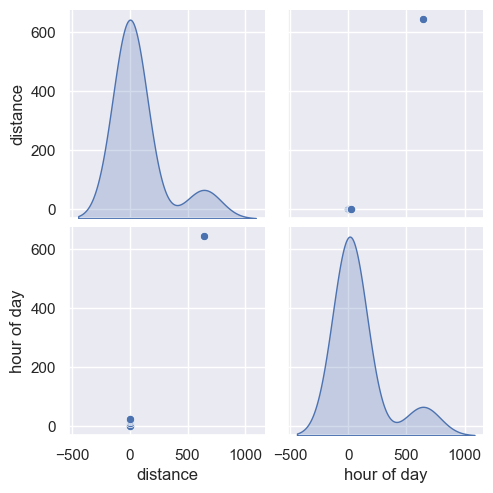

In [417]:
sns.pairplot(train_stat1[train_stat1.columns], diag_kind='kde')

In [91]:
# inputs: distance + hour
model2_1 = nnmodel(20, num_hlayers=1,Epoch=1000)
model2_1

Epoch 1/1000
205/205 [==============================] - 0s 1ms/step - loss: 746716.2500 - mape: 97.6314 - rmse: 864.1274 - val_loss: 747596.5000 - val_mape: 95.4324 - val_rmse: 864.6367
Epoch 2/1000
205/205 [==============================] - 0s 763us/step - loss: 695419.8125 - mape: 91.6663 - rmse: 833.9183 - val_loss: 677034.3750 - val_mape: 87.1441 - val_rmse: 822.8210
Epoch 3/1000
205/205 [==============================] - 0s 748us/step - loss: 612077.3750 - mape: 81.4812 - rmse: 782.3538 - val_loss: 582952.1875 - val_mape: 76.2549 - val_rmse: 763.5131
Epoch 4/1000
205/205 [==============================] - 0s 745us/step - loss: 515231.9375 - mape: 69.7128 - rmse: 717.7966 - val_loss: 484375.2500 - val_mape: 65.1740 - val_rmse: 695.9707
Epoch 5/1000
205/205 [==============================] - 0s 769us/step - loss: 422990.1562 - mape: 59.3796 - rmse: 650.3770 - val_loss: 398028.8750 - val_mape: 57.3020 - val_rmse: 630.8953
Epoch 6/1000
205/205 [==============================] - 0s 755

Epoch 88/1000
205/205 [==============================] - 0s 735us/step - loss: 67749.7109 - mape: 31.8200 - rmse: 260.2878 - val_loss: 70401.4141 - val_mape: 31.8703 - val_rmse: 265.3326
Epoch 89/1000
205/205 [==============================] - 0s 742us/step - loss: 67303.6484 - mape: 31.7968 - rmse: 259.4295 - val_loss: 70151.8906 - val_mape: 30.4816 - val_rmse: 264.8620
Epoch 90/1000
205/205 [==============================] - 0s 741us/step - loss: 66912.9219 - mape: 31.3277 - rmse: 258.6753 - val_loss: 69606.8906 - val_mape: 30.9937 - val_rmse: 263.8312
Epoch 91/1000
205/205 [==============================] - 0s 745us/step - loss: 66519.7812 - mape: 31.1424 - rmse: 257.9143 - val_loss: 69219.4297 - val_mape: 30.9640 - val_rmse: 263.0959
Epoch 92/1000
205/205 [==============================] - 0s 765us/step - loss: 66177.8984 - mape: 31.0649 - rmse: 257.2506 - val_loss: 68894.1250 - val_mape: 30.3232 - val_rmse: 262.4769
Epoch 93/1000
205/205 [==============================] - 0s 750us

Epoch 132/1000
205/205 [==============================] - 0s 742us/step - loss: 60041.4102 - mape: 25.6191 - rmse: 245.0335 - val_loss: 63179.8125 - val_mape: 25.4216 - val_rmse: 251.3559
Epoch 133/1000
205/205 [==============================] - 0s 729us/step - loss: 60002.5664 - mape: 25.5124 - rmse: 244.9542 - val_loss: 63149.5352 - val_mape: 25.3385 - val_rmse: 251.2957
Epoch 134/1000
205/205 [==============================] - 0s 730us/step - loss: 59966.8906 - mape: 25.4236 - rmse: 244.8814 - val_loss: 63122.4258 - val_mape: 25.4301 - val_rmse: 251.2418
Epoch 135/1000
205/205 [==============================] - 0s 727us/step - loss: 59937.7773 - mape: 25.5343 - rmse: 244.8219 - val_loss: 63153.8555 - val_mape: 24.7395 - val_rmse: 251.3043
Epoch 136/1000
205/205 [==============================] - 0s 744us/step - loss: 59906.9414 - mape: 25.2794 - rmse: 244.7589 - val_loss: 63106.4531 - val_mape: 24.8207 - val_rmse: 251.2100
Epoch 137/1000
205/205 [==============================] - 0s

Epoch 219/1000
205/205 [==============================] - 0s 741us/step - loss: 59553.5352 - mape: 24.1257 - rmse: 244.0359 - val_loss: 62813.2305 - val_mape: 23.8010 - val_rmse: 250.6257
Epoch 220/1000
205/205 [==============================] - 0s 740us/step - loss: 59555.2891 - mape: 24.1091 - rmse: 244.0395 - val_loss: 62867.9648 - val_mape: 23.4459 - val_rmse: 250.7348
Epoch 221/1000
205/205 [==============================] - 0s 740us/step - loss: 59546.2734 - mape: 23.9706 - rmse: 244.0211 - val_loss: 62808.7891 - val_mape: 23.8569 - val_rmse: 250.6168
Epoch 222/1000
205/205 [==============================] - 0s 755us/step - loss: 59527.0430 - mape: 23.9403 - rmse: 243.9816 - val_loss: 62816.4141 - val_mape: 24.2471 - val_rmse: 250.6320
Epoch 223/1000
205/205 [==============================] - 0s 734us/step - loss: 59576.1562 - mape: 24.1324 - rmse: 244.0823 - val_loss: 62804.8438 - val_mape: 23.9639 - val_rmse: 250.6089
Epoch 224/1000
205/205 [==============================] - 0s

Epoch 306/1000
205/205 [==============================] - 0s 756us/step - loss: 59558.8398 - mape: 24.0480 - rmse: 244.0468 - val_loss: 62805.5586 - val_mape: 23.7281 - val_rmse: 250.6104
Epoch 307/1000
205/205 [==============================] - 0s 803us/step - loss: 59538.9805 - mape: 23.9539 - rmse: 244.0061 - val_loss: 62802.6797 - val_mape: 23.7678 - val_rmse: 250.6046
Epoch 308/1000
205/205 [==============================] - 0s 751us/step - loss: 59551.5312 - mape: 24.0169 - rmse: 244.0318 - val_loss: 62797.7656 - val_mape: 23.8761 - val_rmse: 250.5948
Epoch 309/1000
205/205 [==============================] - 0s 751us/step - loss: 59537.9453 - mape: 24.0217 - rmse: 244.0040 - val_loss: 62821.2852 - val_mape: 23.5921 - val_rmse: 250.6418
Epoch 310/1000
205/205 [==============================] - 0s 739us/step - loss: 59573.0000 - mape: 23.9576 - rmse: 244.0758 - val_loss: 62806.1094 - val_mape: 23.7363 - val_rmse: 250.6115
Epoch 311/1000
205/205 [==============================] - 0s

Epoch 393/1000
205/205 [==============================] - 0s 739us/step - loss: 59541.2500 - mape: 24.0336 - rmse: 244.0108 - val_loss: 62803.2383 - val_mape: 23.6820 - val_rmse: 250.6057
Epoch 394/1000
205/205 [==============================] - 0s 745us/step - loss: 59543.4961 - mape: 24.0330 - rmse: 244.0154 - val_loss: 62804.1055 - val_mape: 23.6669 - val_rmse: 250.6075
Epoch 395/1000
205/205 [==============================] - 0s 757us/step - loss: 59550.9375 - mape: 24.0176 - rmse: 244.0306 - val_loss: 62862.7773 - val_mape: 23.3482 - val_rmse: 250.7245
Epoch 396/1000
205/205 [==============================] - 0s 740us/step - loss: 59532.3047 - mape: 24.0054 - rmse: 243.9924 - val_loss: 62890.6680 - val_mape: 23.2500 - val_rmse: 250.7801
Epoch 397/1000
205/205 [==============================] - 0s 750us/step - loss: 59539.0430 - mape: 23.9616 - rmse: 244.0062 - val_loss: 62806.7617 - val_mape: 23.6359 - val_rmse: 250.6128
Epoch 398/1000
205/205 [==============================] - 0s

Epoch 480/1000
205/205 [==============================] - 0s 735us/step - loss: 59527.2188 - mape: 24.0160 - rmse: 243.9820 - val_loss: 62790.5898 - val_mape: 24.1060 - val_rmse: 250.5805
Epoch 481/1000
205/205 [==============================] - 0s 726us/step - loss: 59537.9883 - mape: 23.9820 - rmse: 244.0041 - val_loss: 62796.0508 - val_mape: 24.1762 - val_rmse: 250.5914
Epoch 482/1000
205/205 [==============================] - 0s 731us/step - loss: 59524.8320 - mape: 24.1398 - rmse: 243.9771 - val_loss: 62875.1953 - val_mape: 23.2923 - val_rmse: 250.7493
Epoch 483/1000
205/205 [==============================] - 0s 729us/step - loss: 59547.3750 - mape: 23.9620 - rmse: 244.0233 - val_loss: 62890.4766 - val_mape: 23.2412 - val_rmse: 250.7797
Epoch 484/1000
205/205 [==============================] - 0s 772us/step - loss: 59540.0898 - mape: 23.9103 - rmse: 244.0084 - val_loss: 62796.0234 - val_mape: 23.7219 - val_rmse: 250.5914
Epoch 485/1000
205/205 [==============================] - 0s

Epoch 567/1000
205/205 [==============================] - 0s 745us/step - loss: 59500.9492 - mape: 24.0893 - rmse: 243.9282 - val_loss: 62976.2539 - val_mape: 23.0096 - val_rmse: 250.9507
Epoch 568/1000
205/205 [==============================] - 0s 743us/step - loss: 59521.5156 - mape: 23.7905 - rmse: 243.9703 - val_loss: 62832.1875 - val_mape: 24.4660 - val_rmse: 250.6635
Epoch 569/1000
205/205 [==============================] - 0s 742us/step - loss: 59587.2422 - mape: 24.1134 - rmse: 244.1050 - val_loss: 62799.9180 - val_mape: 23.6727 - val_rmse: 250.5991
Epoch 570/1000
205/205 [==============================] - 0s 740us/step - loss: 59540.4023 - mape: 24.0383 - rmse: 244.0090 - val_loss: 62841.5625 - val_mape: 23.4196 - val_rmse: 250.6822
Epoch 571/1000
205/205 [==============================] - 0s 735us/step - loss: 59512.4961 - mape: 23.9004 - rmse: 243.9518 - val_loss: 62786.4648 - val_mape: 23.8627 - val_rmse: 250.5723
Epoch 572/1000
205/205 [==============================] - 0s

Epoch 654/1000
205/205 [==============================] - 0s 784us/step - loss: 59537.4375 - mape: 23.8938 - rmse: 244.0029 - val_loss: 62787.5234 - val_mape: 24.1037 - val_rmse: 250.5744
Epoch 655/1000
205/205 [==============================] - 0s 745us/step - loss: 59506.8711 - mape: 24.1404 - rmse: 243.9403 - val_loss: 62828.5898 - val_mape: 23.4705 - val_rmse: 250.6563
Epoch 656/1000
205/205 [==============================] - 0s 745us/step - loss: 59536.0312 - mape: 23.9373 - rmse: 244.0001 - val_loss: 62784.0547 - val_mape: 23.8669 - val_rmse: 250.5675
Epoch 657/1000
205/205 [==============================] - 0s 740us/step - loss: 59558.9023 - mape: 24.0668 - rmse: 244.0469 - val_loss: 62814.9688 - val_mape: 23.5413 - val_rmse: 250.6292
Epoch 658/1000
205/205 [==============================] - 0s 742us/step - loss: 59537.2148 - mape: 23.9284 - rmse: 244.0025 - val_loss: 62822.2539 - val_mape: 23.4993 - val_rmse: 250.6437
Epoch 659/1000
205/205 [==============================] - 0s

Epoch 741/1000
205/205 [==============================] - 0s 828us/step - loss: 59542.8516 - mape: 23.8729 - rmse: 244.0140 - val_loss: 62789.5820 - val_mape: 23.7336 - val_rmse: 250.5785
Epoch 742/1000
205/205 [==============================] - 0s 829us/step - loss: 59553.8516 - mape: 24.0272 - rmse: 244.0366 - val_loss: 62784.8555 - val_mape: 24.0825 - val_rmse: 250.5691
Epoch 743/1000
205/205 [==============================] - 0s 738us/step - loss: 59561.2266 - mape: 24.0020 - rmse: 244.0517 - val_loss: 62849.9766 - val_mape: 23.3654 - val_rmse: 250.6990
Epoch 744/1000
205/205 [==============================] - 0s 732us/step - loss: 59533.8320 - mape: 23.8890 - rmse: 243.9956 - val_loss: 62795.1523 - val_mape: 24.2189 - val_rmse: 250.5896
Epoch 745/1000
205/205 [==============================] - 0s 735us/step - loss: 59557.5039 - mape: 24.1673 - rmse: 244.0441 - val_loss: 62824.2969 - val_mape: 23.4712 - val_rmse: 250.6478
Epoch 746/1000
205/205 [==============================] - 0s

Epoch 828/1000
205/205 [==============================] - 0s 748us/step - loss: 59572.5078 - mape: 24.0037 - rmse: 244.0748 - val_loss: 62807.1992 - val_mape: 23.5847 - val_rmse: 250.6136
Epoch 829/1000
205/205 [==============================] - 0s 765us/step - loss: 59537.4414 - mape: 24.0072 - rmse: 244.0030 - val_loss: 62810.9062 - val_mape: 23.5511 - val_rmse: 250.6210
Epoch 830/1000
205/205 [==============================] - 0s 774us/step - loss: 59539.5312 - mape: 24.0522 - rmse: 244.0072 - val_loss: 62845.9805 - val_mape: 23.3824 - val_rmse: 250.6910
Epoch 831/1000
205/205 [==============================] - 0s 735us/step - loss: 59537.2539 - mape: 23.9197 - rmse: 244.0026 - val_loss: 62824.8516 - val_mape: 23.4819 - val_rmse: 250.6489
Epoch 832/1000
205/205 [==============================] - 0s 744us/step - loss: 59542.1367 - mape: 23.9958 - rmse: 244.0126 - val_loss: 62800.9062 - val_mape: 23.6276 - val_rmse: 250.6011
Epoch 833/1000
205/205 [==============================] - 0s

Epoch 915/1000
205/205 [==============================] - 0s 751us/step - loss: 59539.3008 - mape: 24.0016 - rmse: 244.0068 - val_loss: 62851.3477 - val_mape: 23.3527 - val_rmse: 250.7017
Epoch 916/1000
205/205 [==============================] - 0s 748us/step - loss: 59533.5664 - mape: 24.0269 - rmse: 243.9950 - val_loss: 62860.5664 - val_mape: 23.3162 - val_rmse: 250.7201
Epoch 917/1000
205/205 [==============================] - 0s 755us/step - loss: 59528.4922 - mape: 24.0493 - rmse: 243.9846 - val_loss: 62808.7305 - val_mape: 23.5626 - val_rmse: 250.6167
Epoch 918/1000
205/205 [==============================] - 0s 745us/step - loss: 59519.6172 - mape: 23.9996 - rmse: 243.9664 - val_loss: 62950.2578 - val_mape: 23.0554 - val_rmse: 250.8989
Epoch 919/1000
205/205 [==============================] - 0s 748us/step - loss: 59553.4453 - mape: 23.9772 - rmse: 244.0358 - val_loss: 62886.5234 - val_mape: 23.2295 - val_rmse: 250.7719
Epoch 920/1000
205/205 [==============================] - 0s

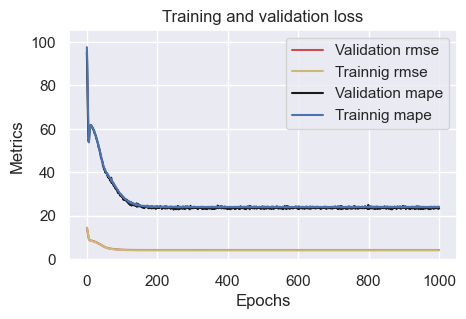

In [92]:
plotme(model2_1)

In [419]:
# inputs: distance + hour
model2_2 = nnmodel(50, num_hlayers=1,Epoch=2000)
model2_2

Epoch 1/2000
21/21 [==============================] - 0s 4ms/step - loss: 810703.0000 - mape: 99.7356 - rmse: 900.3904 - val_loss: 806368.6250 - val_mape: 99.5566 - val_rmse: 897.9803
Epoch 2/2000
21/21 [==============================] - 0s 1ms/step - loss: 807275.3750 - mape: 99.2976 - rmse: 898.4850 - val_loss: 803060.8750 - val_mape: 99.1463 - val_rmse: 896.1367
Epoch 3/2000
21/21 [==============================] - 0s 1ms/step - loss: 803564.8125 - mape: 98.8184 - rmse: 896.4178 - val_loss: 799279.1250 - val_mape: 98.6786 - val_rmse: 894.0241
Epoch 4/2000
21/21 [==============================] - 0s 1ms/step - loss: 799255.0000 - mape: 98.2264 - rmse: 894.0106 - val_loss: 794879.0625 - val_mape: 98.1300 - val_rmse: 891.5599
Epoch 5/2000
21/21 [==============================] - 0s 1ms/step - loss: 794156.8125 - mape: 97.5691 - rmse: 891.1548 - val_loss: 789810.8750 - val_mape: 97.4948 - val_rmse: 888.7131
Epoch 6/2000
21/21 [==============================] - 0s 1ms/step - loss: 788458

21/21 [==============================] - 0s 1ms/step - loss: 289429.3750 - mape: 79.8891 - rmse: 537.9864 - val_loss: 297430.4375 - val_mape: 69.9591 - val_rmse: 545.3718
Epoch 90/2000
21/21 [==============================] - 0s 1ms/step - loss: 288941.0000 - mape: 79.6512 - rmse: 537.5323 - val_loss: 297109.6250 - val_mape: 69.6857 - val_rmse: 545.0776
Epoch 91/2000
21/21 [==============================] - 0s 1ms/step - loss: 288521.7188 - mape: 79.5868 - rmse: 537.1422 - val_loss: 296543.1875 - val_mape: 69.7448 - val_rmse: 544.5578
Epoch 92/2000
21/21 [==============================] - 0s 1ms/step - loss: 288053.0312 - mape: 79.5772 - rmse: 536.7057 - val_loss: 296035.0625 - val_mape: 69.6740 - val_rmse: 544.0911
Epoch 93/2000
21/21 [==============================] - 0s 1ms/step - loss: 287602.4062 - mape: 79.3796 - rmse: 536.2858 - val_loss: 295649.6250 - val_mape: 69.4992 - val_rmse: 543.7367
Epoch 94/2000
21/21 [==============================] - 0s 1ms/step - loss: 287173.5625 - 

21/21 [==============================] - 0s 1ms/step - loss: 237129.4844 - mape: 73.5863 - rmse: 486.9594 - val_loss: 241307.2969 - val_mape: 63.3886 - val_rmse: 491.2304
Epoch 178/2000
21/21 [==============================] - 0s 1ms/step - loss: 236458.6719 - mape: 73.0859 - rmse: 486.2702 - val_loss: 240690.0625 - val_mape: 63.0176 - val_rmse: 490.6017
Epoch 179/2000
21/21 [==============================] - 0s 1ms/step - loss: 235670.9688 - mape: 73.0897 - rmse: 485.4595 - val_loss: 239811.9219 - val_mape: 63.1133 - val_rmse: 489.7060
Epoch 180/2000
21/21 [==============================] - 0s 1ms/step - loss: 234971.0469 - mape: 73.1739 - rmse: 484.7381 - val_loss: 238961.0938 - val_mape: 63.1100 - val_rmse: 488.8365
Epoch 181/2000
21/21 [==============================] - 0s 1ms/step - loss: 234263.9062 - mape: 72.9088 - rmse: 484.0082 - val_loss: 238262.7344 - val_mape: 62.8173 - val_rmse: 488.1216
Epoch 182/2000
21/21 [==============================] - 0s 1ms/step - loss: 233469.40

21/21 [==============================] - 0s 1ms/step - loss: 163765.2656 - mape: 64.0041 - rmse: 404.6792 - val_loss: 163710.0312 - val_mape: 55.1621 - val_rmse: 404.6110
Epoch 266/2000
21/21 [==============================] - 0s 1ms/step - loss: 162860.1094 - mape: 63.4903 - rmse: 403.5593 - val_loss: 162993.4688 - val_mape: 54.5925 - val_rmse: 403.7245
Epoch 267/2000
21/21 [==============================] - 0s 1ms/step - loss: 162092.2031 - mape: 62.5299 - rmse: 402.6068 - val_loss: 162485.4688 - val_mape: 53.8608 - val_rmse: 403.0948
Epoch 268/2000
21/21 [==============================] - 0s 1ms/step - loss: 161348.7969 - mape: 62.4894 - rmse: 401.6825 - val_loss: 161370.2656 - val_mape: 54.2354 - val_rmse: 401.7092
Epoch 269/2000
21/21 [==============================] - 0s 1ms/step - loss: 160479.3594 - mape: 62.7593 - rmse: 400.5988 - val_loss: 160485.0000 - val_mape: 54.2095 - val_rmse: 400.6058
Epoch 270/2000
21/21 [==============================] - 0s 1ms/step - loss: 159698.76

21/21 [==============================] - 0s 1ms/step - loss: 100935.2031 - mape: 53.6089 - rmse: 317.7030 - val_loss: 99753.7734 - val_mape: 47.1087 - val_rmse: 315.8382
Epoch 354/2000
21/21 [==============================] - 0s 1ms/step - loss: 100458.7344 - mape: 53.6382 - rmse: 316.9523 - val_loss: 99148.4844 - val_mape: 47.3564 - val_rmse: 314.8785
Epoch 355/2000
21/21 [==============================] - 0s 1ms/step - loss: 99875.7734 - mape: 53.5208 - rmse: 316.0313 - val_loss: 98695.5469 - val_mape: 47.1338 - val_rmse: 314.1585
Epoch 356/2000
21/21 [==============================] - 0s 1ms/step - loss: 99312.3750 - mape: 53.4804 - rmse: 315.1387 - val_loss: 98119.8125 - val_mape: 47.2106 - val_rmse: 313.2408
Epoch 357/2000
21/21 [==============================] - 0s 1ms/step - loss: 98812.3828 - mape: 53.5390 - rmse: 314.3444 - val_loss: 97622.0234 - val_mape: 47.1209 - val_rmse: 312.4452
Epoch 358/2000
21/21 [==============================] - 0s 1ms/step - loss: 98316.7266 - mape

21/21 [==============================] - 0s 1ms/step - loss: 70429.7266 - mape: 47.8080 - rmse: 265.3860 - val_loss: 70350.4375 - val_mape: 43.4343 - val_rmse: 265.2366
Epoch 442/2000
21/21 [==============================] - 0s 1ms/step - loss: 70232.9062 - mape: 47.9901 - rmse: 265.0149 - val_loss: 70139.8906 - val_mape: 43.2244 - val_rmse: 264.8394
Epoch 443/2000
21/21 [==============================] - 0s 1ms/step - loss: 69974.7109 - mape: 47.2328 - rmse: 264.5273 - val_loss: 69960.1094 - val_mape: 42.5260 - val_rmse: 264.4997
Epoch 444/2000
21/21 [==============================] - 0s 1ms/step - loss: 69809.1094 - mape: 46.2918 - rmse: 264.2141 - val_loss: 69836.8047 - val_mape: 41.9596 - val_rmse: 264.2665
Epoch 445/2000
21/21 [==============================] - 0s 1ms/step - loss: 69552.1953 - mape: 46.0384 - rmse: 263.7275 - val_loss: 69627.1250 - val_mape: 41.9765 - val_rmse: 263.8695
Epoch 446/2000
21/21 [==============================] - 0s 1ms/step - loss: 69331.0703 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 55738.1289 - mape: 40.8738 - rmse: 236.0892 - val_loss: 56186.2734 - val_mape: 37.5752 - val_rmse: 237.0364
Epoch 530/2000
21/21 [==============================] - 0s 1ms/step - loss: 55618.8438 - mape: 40.3612 - rmse: 235.8365 - val_loss: 56089.4102 - val_mape: 36.8841 - val_rmse: 236.8320
Epoch 531/2000
21/21 [==============================] - 0s 1ms/step - loss: 55483.2578 - mape: 40.1010 - rmse: 235.5488 - val_loss: 55963.2852 - val_mape: 36.8756 - val_rmse: 236.5656
Epoch 532/2000
21/21 [==============================] - 0s 1ms/step - loss: 55341.5312 - mape: 39.7904 - rmse: 235.2478 - val_loss: 55880.5156 - val_mape: 36.4578 - val_rmse: 236.3906
Epoch 533/2000
21/21 [==============================] - 0s 1ms/step - loss: 55309.7852 - mape: 39.1729 - rmse: 235.1803 - val_loss: 55815.3281 - val_mape: 36.1236 - val_rmse: 236.2527
Epoch 534/2000
21/21 [==============================] - 0s 1ms/step - loss: 55218.0273 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 47645.2148 - mape: 34.7744 - rmse: 218.2778 - val_loss: 47643.0391 - val_mape: 31.7096 - val_rmse: 218.2729
Epoch 618/2000
21/21 [==============================] - 0s 1ms/step - loss: 47580.8242 - mape: 34.1336 - rmse: 218.1303 - val_loss: 47680.3438 - val_mape: 31.1912 - val_rmse: 218.3583
Epoch 619/2000
21/21 [==============================] - 0s 1ms/step - loss: 47489.8711 - mape: 33.9816 - rmse: 217.9217 - val_loss: 47535.5391 - val_mape: 31.3705 - val_rmse: 218.0265
Epoch 620/2000
21/21 [==============================] - 0s 1ms/step - loss: 47438.5742 - mape: 34.2746 - rmse: 217.8040 - val_loss: 47459.9766 - val_mape: 31.3738 - val_rmse: 217.8531
Epoch 621/2000
21/21 [==============================] - 0s 1ms/step - loss: 47430.9805 - mape: 34.6973 - rmse: 217.7865 - val_loss: 47334.8555 - val_mape: 31.6777 - val_rmse: 217.5658
Epoch 622/2000
21/21 [==============================] - 0s 1ms/step - loss: 47368.4961 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 43807.8242 - mape: 30.4951 - rmse: 209.3032 - val_loss: 43240.9297 - val_mape: 27.7068 - val_rmse: 207.9445
Epoch 706/2000
21/21 [==============================] - 0s 1ms/step - loss: 43772.6914 - mape: 30.2861 - rmse: 209.2192 - val_loss: 43195.6797 - val_mape: 27.7039 - val_rmse: 207.8357
Epoch 707/2000
21/21 [==============================] - 0s 1ms/step - loss: 43759.4219 - mape: 30.6666 - rmse: 209.1875 - val_loss: 43087.8516 - val_mape: 27.9016 - val_rmse: 207.5761
Epoch 708/2000
21/21 [==============================] - 0s 1ms/step - loss: 43688.8594 - mape: 30.5409 - rmse: 209.0188 - val_loss: 43118.6680 - val_mape: 27.6619 - val_rmse: 207.6503
Epoch 709/2000
21/21 [==============================] - 0s 1ms/step - loss: 43679.0586 - mape: 30.5277 - rmse: 208.9954 - val_loss: 43050.4180 - val_mape: 27.7030 - val_rmse: 207.4859
Epoch 710/2000
21/21 [==============================] - 0s 1ms/step - loss: 43631.6250 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 42305.2500 - mape: 28.3178 - rmse: 205.6824 - val_loss: 41074.2109 - val_mape: 25.5412 - val_rmse: 202.6677
Epoch 794/2000
21/21 [==============================] - 0s 1ms/step - loss: 42220.9844 - mape: 27.9771 - rmse: 205.4774 - val_loss: 41170.1719 - val_mape: 25.2662 - val_rmse: 202.9043
Epoch 795/2000
21/21 [==============================] - 0s 1ms/step - loss: 42215.3281 - mape: 27.9816 - rmse: 205.4637 - val_loss: 41120.2266 - val_mape: 25.3319 - val_rmse: 202.7812
Epoch 796/2000
21/21 [==============================] - 0s 1ms/step - loss: 42213.9062 - mape: 28.2180 - rmse: 205.4602 - val_loss: 41051.6836 - val_mape: 25.4887 - val_rmse: 202.6122
Epoch 797/2000
21/21 [==============================] - 0s 1ms/step - loss: 42195.7266 - mape: 28.1604 - rmse: 205.4160 - val_loss: 41106.5156 - val_mape: 25.2982 - val_rmse: 202.7474
Epoch 798/2000
21/21 [==============================] - 0s 1ms/step - loss: 42241.1914 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 41738.4180 - mape: 26.7689 - rmse: 204.2998 - val_loss: 40322.6250 - val_mape: 24.3181 - val_rmse: 200.8049
Epoch 882/2000
21/21 [==============================] - 0s 1ms/step - loss: 41752.2734 - mape: 27.0475 - rmse: 204.3337 - val_loss: 40301.5703 - val_mape: 24.3842 - val_rmse: 200.7525
Epoch 883/2000
21/21 [==============================] - 0s 1ms/step - loss: 41777.5859 - mape: 26.7426 - rmse: 204.3957 - val_loss: 40383.8125 - val_mape: 24.1520 - val_rmse: 200.9572
Epoch 884/2000
21/21 [==============================] - 0s 1ms/step - loss: 41759.0156 - mape: 26.9850 - rmse: 204.3502 - val_loss: 40277.8906 - val_mape: 24.4211 - val_rmse: 200.6935
Epoch 885/2000
21/21 [==============================] - 0s 1ms/step - loss: 41965.0703 - mape: 27.7475 - rmse: 204.8538 - val_loss: 40237.4883 - val_mape: 24.7323 - val_rmse: 200.5928
Epoch 886/2000
21/21 [==============================] - 0s 1ms/step - loss: 41768.5469 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 41601.4883 - mape: 25.9963 - rmse: 203.9644 - val_loss: 40109.9141 - val_mape: 23.4171 - val_rmse: 200.2746
Epoch 970/2000
21/21 [==============================] - 0s 1ms/step - loss: 41627.0156 - mape: 25.8170 - rmse: 204.0270 - val_loss: 40174.6836 - val_mape: 23.3129 - val_rmse: 200.4362
Epoch 971/2000
21/21 [==============================] - 0s 1ms/step - loss: 41611.2266 - mape: 25.9455 - rmse: 203.9883 - val_loss: 40107.4609 - val_mape: 23.4190 - val_rmse: 200.2685
Epoch 972/2000
21/21 [==============================] - 0s 1ms/step - loss: 41615.8242 - mape: 26.1756 - rmse: 203.9996 - val_loss: 39995.0430 - val_mape: 23.6114 - val_rmse: 199.9876
Epoch 973/2000
21/21 [==============================] - 0s 1ms/step - loss: 41594.2070 - mape: 26.1346 - rmse: 203.9466 - val_loss: 40097.8398 - val_mape: 23.4121 - val_rmse: 200.2444
Epoch 974/2000
21/21 [==============================] - 0s 1ms/step - loss: 41587.3672 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 41628.2461 - mape: 26.3217 - rmse: 204.0300 - val_loss: 39798.5586 - val_mape: 23.3546 - val_rmse: 199.4958
Epoch 1058/2000
21/21 [==============================] - 0s 1ms/step - loss: 41604.5938 - mape: 25.7328 - rmse: 203.9720 - val_loss: 39975.4648 - val_mape: 23.0170 - val_rmse: 199.9387
Epoch 1059/2000
21/21 [==============================] - 0s 1ms/step - loss: 41552.6133 - mape: 25.7139 - rmse: 203.8446 - val_loss: 39946.6641 - val_mape: 23.0582 - val_rmse: 199.8666
Epoch 1060/2000
21/21 [==============================] - 0s 1ms/step - loss: 41556.6719 - mape: 25.4114 - rmse: 203.8545 - val_loss: 40079.3984 - val_mape: 22.8934 - val_rmse: 200.1984
Epoch 1061/2000
21/21 [==============================] - 0s 1ms/step - loss: 41562.3164 - mape: 25.4878 - rmse: 203.8684 - val_loss: 39989.4453 - val_mape: 22.9813 - val_rmse: 199.9736
Epoch 1062/2000
21/21 [==============================] - 0s 1ms/step - loss: 41570.1914 - m

21/21 [==============================] - 0s 1ms/step - loss: 41533.3359 - mape: 25.6640 - rmse: 203.7973 - val_loss: 39922.7617 - val_mape: 22.8678 - val_rmse: 199.8068
Epoch 1146/2000
21/21 [==============================] - 0s 1ms/step - loss: 41641.8359 - mape: 25.0421 - rmse: 204.0633 - val_loss: 40130.5820 - val_mape: 22.6558 - val_rmse: 200.3262
Epoch 1147/2000
21/21 [==============================] - 0s 1ms/step - loss: 41509.2734 - mape: 25.2908 - rmse: 203.7383 - val_loss: 39882.7539 - val_mape: 22.9316 - val_rmse: 199.7067
Epoch 1148/2000
21/21 [==============================] - 0s 1ms/step - loss: 41539.6562 - mape: 25.6333 - rmse: 203.8128 - val_loss: 39859.1250 - val_mape: 22.9646 - val_rmse: 199.6475
Epoch 1149/2000
21/21 [==============================] - 0s 1ms/step - loss: 41557.5312 - mape: 25.5397 - rmse: 203.8566 - val_loss: 39916.9805 - val_mape: 22.8744 - val_rmse: 199.7923
Epoch 1150/2000
21/21 [==============================] - 0s 1ms/step - loss: 41539.9180 - m

21/21 [==============================] - 0s 1ms/step - loss: 41626.5859 - mape: 25.5674 - rmse: 204.0259 - val_loss: 39949.2812 - val_mape: 22.6902 - val_rmse: 199.8732
Epoch 1234/2000
21/21 [==============================] - 0s 1ms/step - loss: 41552.2656 - mape: 25.3232 - rmse: 203.8437 - val_loss: 39899.0234 - val_mape: 22.7489 - val_rmse: 199.7474
Epoch 1235/2000
21/21 [==============================] - 0s 1ms/step - loss: 41522.2227 - mape: 25.4785 - rmse: 203.7700 - val_loss: 39818.1289 - val_mape: 22.8562 - val_rmse: 199.5448
Epoch 1236/2000
21/21 [==============================] - 0s 1ms/step - loss: 41534.0117 - mape: 25.6027 - rmse: 203.7990 - val_loss: 39778.6250 - val_mape: 22.9387 - val_rmse: 199.4458
Epoch 1237/2000
21/21 [==============================] - 0s 1ms/step - loss: 41550.8789 - mape: 25.5420 - rmse: 203.8403 - val_loss: 39808.3164 - val_mape: 22.8989 - val_rmse: 199.5202
Epoch 1238/2000
21/21 [==============================] - 0s 1ms/step - loss: 41517.4805 - m

21/21 [==============================] - 0s 1ms/step - loss: 41527.0625 - mape: 25.2750 - rmse: 203.7819 - val_loss: 39860.1914 - val_mape: 22.7883 - val_rmse: 199.6502
Epoch 1322/2000
21/21 [==============================] - 0s 1ms/step - loss: 41521.3945 - mape: 25.4512 - rmse: 203.7680 - val_loss: 39855.6328 - val_mape: 22.7953 - val_rmse: 199.6387
Epoch 1323/2000
21/21 [==============================] - 0s 1ms/step - loss: 41530.1211 - mape: 25.2686 - rmse: 203.7894 - val_loss: 39935.6758 - val_mape: 22.6975 - val_rmse: 199.8391
Epoch 1324/2000
21/21 [==============================] - 0s 1ms/step - loss: 41606.3906 - mape: 25.5435 - rmse: 203.9764 - val_loss: 39843.5391 - val_mape: 22.8247 - val_rmse: 199.6085
Epoch 1325/2000
21/21 [==============================] - 0s 1ms/step - loss: 41502.8594 - mape: 25.1951 - rmse: 203.7225 - val_loss: 40075.8281 - val_mape: 22.5778 - val_rmse: 200.1895
Epoch 1326/2000
21/21 [==============================] - 0s 1ms/step - loss: 41570.9922 - m

21/21 [==============================] - 0s 1ms/step - loss: 41649.8984 - mape: 26.1367 - rmse: 204.0831 - val_loss: 39736.7656 - val_mape: 23.1028 - val_rmse: 199.3408
Epoch 1410/2000
21/21 [==============================] - 0s 1ms/step - loss: 41597.7109 - mape: 25.3847 - rmse: 203.9552 - val_loss: 39972.3320 - val_mape: 22.6917 - val_rmse: 199.9308
Epoch 1411/2000
21/21 [==============================] - 0s 1ms/step - loss: 41537.0391 - mape: 25.5405 - rmse: 203.8064 - val_loss: 39779.6602 - val_mape: 22.9844 - val_rmse: 199.4484
Epoch 1412/2000
21/21 [==============================] - 0s 1ms/step - loss: 41560.7852 - mape: 25.8580 - rmse: 203.8646 - val_loss: 39778.5000 - val_mape: 22.9783 - val_rmse: 199.4455
Epoch 1413/2000
21/21 [==============================] - 0s 1ms/step - loss: 41521.1719 - mape: 25.2273 - rmse: 203.7674 - val_loss: 40095.5742 - val_mape: 22.5690 - val_rmse: 200.2388
Epoch 1414/2000
21/21 [==============================] - 0s 1ms/step - loss: 41611.8242 - m

21/21 [==============================] - 0s 1ms/step - loss: 41532.9375 - mape: 25.0769 - rmse: 203.7963 - val_loss: 40075.9258 - val_mape: 22.5772 - val_rmse: 200.1897
Epoch 1498/2000
21/21 [==============================] - 0s 1ms/step - loss: 41536.1680 - mape: 25.3434 - rmse: 203.8042 - val_loss: 39909.7617 - val_mape: 22.7916 - val_rmse: 199.7743
Epoch 1499/2000
21/21 [==============================] - 0s 1ms/step - loss: 41539.6680 - mape: 25.2336 - rmse: 203.8128 - val_loss: 40010.6758 - val_mape: 22.6709 - val_rmse: 200.0267
Epoch 1500/2000
21/21 [==============================] - 0s 1ms/step - loss: 41517.0859 - mape: 25.1274 - rmse: 203.7574 - val_loss: 40021.2461 - val_mape: 22.6620 - val_rmse: 200.0531
Epoch 1501/2000
21/21 [==============================] - 0s 1ms/step - loss: 41589.3711 - mape: 24.8783 - rmse: 203.9347 - val_loss: 40035.3477 - val_mape: 22.6354 - val_rmse: 200.0883
Epoch 1502/2000
21/21 [==============================] - 0s 1ms/step - loss: 41566.3594 - m

21/21 [==============================] - 0s 1ms/step - loss: 41581.4062 - mape: 25.7529 - rmse: 203.9152 - val_loss: 39861.9492 - val_mape: 22.7827 - val_rmse: 199.6546
Epoch 1586/2000
21/21 [==============================] - 0s 1ms/step - loss: 41501.2344 - mape: 25.2371 - rmse: 203.7185 - val_loss: 39979.6250 - val_mape: 22.6483 - val_rmse: 199.9491
Epoch 1587/2000
21/21 [==============================] - 0s 1ms/step - loss: 41517.5742 - mape: 25.1048 - rmse: 203.7586 - val_loss: 39994.4453 - val_mape: 22.6339 - val_rmse: 199.9861
Epoch 1588/2000
21/21 [==============================] - 0s 1ms/step - loss: 41539.0781 - mape: 25.0079 - rmse: 203.8114 - val_loss: 39996.0312 - val_mape: 22.6340 - val_rmse: 199.9901
Epoch 1589/2000
21/21 [==============================] - 0s 1ms/step - loss: 41460.9609 - mape: 25.6301 - rmse: 203.6196 - val_loss: 39706.5508 - val_mape: 23.0870 - val_rmse: 199.2650
Epoch 1590/2000
21/21 [==============================] - 0s 1ms/step - loss: 41541.0938 - m

21/21 [==============================] - 0s 1ms/step - loss: 41507.9180 - mape: 25.5257 - rmse: 203.7349 - val_loss: 39891.5117 - val_mape: 22.7772 - val_rmse: 199.7286
Epoch 1674/2000
21/21 [==============================] - 0s 1ms/step - loss: 41490.7344 - mape: 25.3348 - rmse: 203.6927 - val_loss: 39930.3828 - val_mape: 22.7327 - val_rmse: 199.8259
Epoch 1675/2000
21/21 [==============================] - 0s 1ms/step - loss: 41554.1914 - mape: 24.9524 - rmse: 203.8484 - val_loss: 40127.7930 - val_mape: 22.5366 - val_rmse: 200.3192
Epoch 1676/2000
21/21 [==============================] - 0s 1ms/step - loss: 41535.9180 - mape: 25.0521 - rmse: 203.8036 - val_loss: 39934.1289 - val_mape: 22.7195 - val_rmse: 199.8353
Epoch 1677/2000
21/21 [==============================] - 0s 1ms/step - loss: 41509.0938 - mape: 25.1722 - rmse: 203.7378 - val_loss: 39953.7109 - val_mape: 22.6978 - val_rmse: 199.8842
Epoch 1678/2000
21/21 [==============================] - 0s 1ms/step - loss: 41481.5234 - m

21/21 [==============================] - 0s 1ms/step - loss: 41528.0977 - mape: 24.9471 - rmse: 203.7844 - val_loss: 40026.9062 - val_mape: 22.6606 - val_rmse: 200.0673
Epoch 1762/2000
21/21 [==============================] - 0s 1ms/step - loss: 41510.8555 - mape: 25.2350 - rmse: 203.7421 - val_loss: 39911.4531 - val_mape: 22.7872 - val_rmse: 199.7785
Epoch 1763/2000
21/21 [==============================] - 0s 1ms/step - loss: 41528.9102 - mape: 25.4766 - rmse: 203.7864 - val_loss: 39909.0820 - val_mape: 22.7846 - val_rmse: 199.7726
Epoch 1764/2000
21/21 [==============================] - 0s 1ms/step - loss: 41458.9688 - mape: 25.5258 - rmse: 203.6148 - val_loss: 39795.7578 - val_mape: 22.9802 - val_rmse: 199.4887
Epoch 1765/2000
21/21 [==============================] - 0s 1ms/step - loss: 41546.9766 - mape: 25.8663 - rmse: 203.8307 - val_loss: 39814.9453 - val_mape: 22.9395 - val_rmse: 199.5368
Epoch 1766/2000
21/21 [==============================] - 0s 1ms/step - loss: 41506.7305 - m

21/21 [==============================] - 0s 1ms/step - loss: 41502.6094 - mape: 25.4126 - rmse: 203.7219 - val_loss: 39892.9648 - val_mape: 22.7869 - val_rmse: 199.7322
Epoch 1850/2000
21/21 [==============================] - 0s 1ms/step - loss: 41481.4844 - mape: 25.2070 - rmse: 203.6700 - val_loss: 40041.3164 - val_mape: 22.6065 - val_rmse: 200.1033
Epoch 1851/2000
21/21 [==============================] - 0s 1ms/step - loss: 41534.6328 - mape: 24.8946 - rmse: 203.8005 - val_loss: 40109.2188 - val_mape: 22.5441 - val_rmse: 200.2729
Epoch 1852/2000
21/21 [==============================] - 0s 1ms/step - loss: 41502.7148 - mape: 25.4189 - rmse: 203.7222 - val_loss: 39813.3594 - val_mape: 22.9151 - val_rmse: 199.5329
Epoch 1853/2000
21/21 [==============================] - 0s 1ms/step - loss: 41490.3906 - mape: 25.4220 - rmse: 203.6919 - val_loss: 39951.6133 - val_mape: 22.7055 - val_rmse: 199.8790
Epoch 1854/2000
21/21 [==============================] - 0s 1ms/step - loss: 41507.9844 - m

21/21 [==============================] - 0s 1ms/step - loss: 41536.9922 - mape: 25.7611 - rmse: 203.8063 - val_loss: 39844.9883 - val_mape: 22.8877 - val_rmse: 199.6121
Epoch 1938/2000
21/21 [==============================] - 0s 1ms/step - loss: 41611.8477 - mape: 26.0811 - rmse: 203.9898 - val_loss: 39768.7148 - val_mape: 23.0585 - val_rmse: 199.4209
Epoch 1939/2000
21/21 [==============================] - 0s 1ms/step - loss: 41552.2305 - mape: 25.0711 - rmse: 203.8436 - val_loss: 40256.1953 - val_mape: 22.4535 - val_rmse: 200.6395
Epoch 1940/2000
21/21 [==============================] - 0s 1ms/step - loss: 41498.7422 - mape: 25.1399 - rmse: 203.7124 - val_loss: 39901.6016 - val_mape: 22.7815 - val_rmse: 199.7538
Epoch 1941/2000
21/21 [==============================] - 0s 1ms/step - loss: 41489.6133 - mape: 25.6116 - rmse: 203.6900 - val_loss: 39834.9336 - val_mape: 22.8964 - val_rmse: 199.5869
Epoch 1942/2000
21/21 [==============================] - 0s 1ms/step - loss: 41459.7539 - m

In [420]:
# inputs: distance + hour
model2_3 = nnmodel(100, num_hlayers=1,Epoch=2000)
model2_3

Epoch 1/2000
21/21 [==============================] - 0s 4ms/step - loss: 816879.9375 - mape: 100.5527 - rmse: 903.8141 - val_loss: 810932.2500 - val_mape: 100.1162 - val_rmse: 900.5178
Epoch 2/2000
21/21 [==============================] - 0s 1ms/step - loss: 811123.1875 - mape: 99.7712 - rmse: 900.6238 - val_loss: 805473.1250 - val_mape: 99.4446 - val_rmse: 897.4816
Epoch 3/2000
21/21 [==============================] - 0s 1ms/step - loss: 805120.8750 - mape: 99.0217 - rmse: 897.2853 - val_loss: 799568.6875 - val_mape: 98.7158 - val_rmse: 894.1860
Epoch 4/2000
21/21 [==============================] - 0s 1ms/step - loss: 798355.3125 - mape: 98.1234 - rmse: 893.5073 - val_loss: 792670.9375 - val_mape: 97.8581 - val_rmse: 890.3207
Epoch 5/2000
21/21 [==============================] - 0s 1ms/step - loss: 790438.1250 - mape: 97.0884 - rmse: 889.0659 - val_loss: 784718.1250 - val_mape: 96.8596 - val_rmse: 885.8432
Epoch 6/2000
21/21 [==============================] - 0s 1ms/step - loss: 7812

21/21 [==============================] - 0s 1ms/step - loss: 279478.0312 - mape: 78.8840 - rmse: 528.6568 - val_loss: 286535.7812 - val_mape: 68.9057 - val_rmse: 535.2903
Epoch 90/2000
21/21 [==============================] - 0s 1ms/step - loss: 278863.7500 - mape: 78.7349 - rmse: 528.0755 - val_loss: 285880.6250 - val_mape: 68.7968 - val_rmse: 534.6780
Epoch 91/2000
21/21 [==============================] - 0s 1ms/step - loss: 278243.2500 - mape: 78.7595 - rmse: 527.4877 - val_loss: 285141.5625 - val_mape: 68.8459 - val_rmse: 533.9865
Epoch 92/2000
21/21 [==============================] - 0s 1ms/step - loss: 277673.6562 - mape: 78.4906 - rmse: 526.9475 - val_loss: 284630.9062 - val_mape: 68.5272 - val_rmse: 533.5081
Epoch 93/2000
21/21 [==============================] - 0s 1ms/step - loss: 277023.6875 - mape: 78.4549 - rmse: 526.3304 - val_loss: 283879.4688 - val_mape: 68.5324 - val_rmse: 532.8034
Epoch 94/2000
21/21 [==============================] - 0s 1ms/step - loss: 276383.6875 - 

21/21 [==============================] - 0s 1ms/step - loss: 196714.0469 - mape: 67.8346 - rmse: 443.5246 - val_loss: 198588.8125 - val_mape: 57.9435 - val_rmse: 445.6331
Epoch 178/2000
21/21 [==============================] - 0s 1ms/step - loss: 195624.3906 - mape: 67.0761 - rmse: 442.2945 - val_loss: 197579.0625 - val_mape: 57.3397 - val_rmse: 444.4987
Epoch 179/2000
21/21 [==============================] - 0s 1ms/step - loss: 194290.4219 - mape: 67.3017 - rmse: 440.7839 - val_loss: 195883.0469 - val_mape: 57.9632 - val_rmse: 442.5868
Epoch 180/2000
21/21 [==============================] - 0s 1ms/step - loss: 193082.2188 - mape: 67.6021 - rmse: 439.4112 - val_loss: 194603.2344 - val_mape: 57.8649 - val_rmse: 441.1386
Epoch 181/2000
21/21 [==============================] - 0s 1ms/step - loss: 192001.7812 - mape: 67.3650 - rmse: 438.1801 - val_loss: 193367.7031 - val_mape: 57.7554 - val_rmse: 439.7360
Epoch 182/2000
21/21 [==============================] - 0s 1ms/step - loss: 190739.57

21/21 [==============================] - 0s 1ms/step - loss: 103333.8594 - mape: 52.9312 - rmse: 321.4558 - val_loss: 101958.3672 - val_mape: 46.9647 - val_rmse: 319.3092
Epoch 266/2000
21/21 [==============================] - 0s 1ms/step - loss: 102514.9062 - mape: 53.7805 - rmse: 320.1795 - val_loss: 101083.9219 - val_mape: 47.4614 - val_rmse: 317.9370
Epoch 267/2000
21/21 [==============================] - 0s 1ms/step - loss: 101858.2969 - mape: 54.1606 - rmse: 319.1525 - val_loss: 100301.0312 - val_mape: 47.5373 - val_rmse: 316.7034
Epoch 268/2000
21/21 [==============================] - 0s 1ms/step - loss: 101063.0156 - mape: 53.7291 - rmse: 317.9041 - val_loss: 99656.6250 - val_mape: 47.1425 - val_rmse: 315.6844
Epoch 269/2000
21/21 [==============================] - 0s 1ms/step - loss: 100393.3281 - mape: 53.7288 - rmse: 316.8491 - val_loss: 98921.1484 - val_mape: 47.2230 - val_rmse: 314.5173
Epoch 270/2000
21/21 [==============================] - 0s 1ms/step - loss: 99680.1094 

21/21 [==============================] - 0s 1ms/step - loss: 65589.4844 - mape: 43.9335 - rmse: 256.1044 - val_loss: 65384.2656 - val_mape: 39.9195 - val_rmse: 255.7035
Epoch 354/2000
21/21 [==============================] - 0s 1ms/step - loss: 65204.3594 - mape: 44.1727 - rmse: 255.3514 - val_loss: 64995.2656 - val_mape: 40.5469 - val_rmse: 254.9417
Epoch 355/2000
21/21 [==============================] - 0s 1ms/step - loss: 64935.8711 - mape: 44.1874 - rmse: 254.8252 - val_loss: 64775.0977 - val_mape: 40.4405 - val_rmse: 254.5095
Epoch 356/2000
21/21 [==============================] - 0s 1ms/step - loss: 64613.2734 - mape: 45.0090 - rmse: 254.1914 - val_loss: 64508.9805 - val_mape: 41.4669 - val_rmse: 253.9862
Epoch 357/2000
21/21 [==============================] - 0s 1ms/step - loss: 64535.2148 - mape: 45.6928 - rmse: 254.0378 - val_loss: 64262.8242 - val_mape: 41.1762 - val_rmse: 253.5011
Epoch 358/2000
21/21 [==============================] - 0s 1ms/step - loss: 64243.0469 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 50848.8633 - mape: 36.7598 - rmse: 225.4969 - val_loss: 50746.3242 - val_mape: 33.4517 - val_rmse: 225.2695
Epoch 442/2000
21/21 [==============================] - 0s 1ms/step - loss: 50737.1211 - mape: 36.4040 - rmse: 225.2490 - val_loss: 50600.6406 - val_mape: 33.5004 - val_rmse: 224.9459
Epoch 443/2000
21/21 [==============================] - 0s 1ms/step - loss: 50619.7656 - mape: 36.3586 - rmse: 224.9884 - val_loss: 50423.9219 - val_mape: 33.6023 - val_rmse: 224.5527
Epoch 444/2000
21/21 [==============================] - 0s 1ms/step - loss: 50500.7266 - mape: 36.9734 - rmse: 224.7237 - val_loss: 50263.0703 - val_mape: 34.0590 - val_rmse: 224.1943
Epoch 445/2000
21/21 [==============================] - 0s 1ms/step - loss: 50459.5664 - mape: 37.0919 - rmse: 224.6321 - val_loss: 50168.0195 - val_mape: 33.5287 - val_rmse: 223.9822
Epoch 446/2000
21/21 [==============================] - 0s 1ms/step - loss: 50428.5859 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 44531.9609 - mape: 31.6500 - rmse: 211.0260 - val_loss: 43392.2109 - val_mape: 28.4704 - val_rmse: 208.3080
Epoch 530/2000
21/21 [==============================] - 0s 1ms/step - loss: 44360.6172 - mape: 30.7840 - rmse: 210.6196 - val_loss: 43548.6445 - val_mape: 27.8533 - val_rmse: 208.6831
Epoch 531/2000
21/21 [==============================] - 0s 1ms/step - loss: 44369.5273 - mape: 30.3875 - rmse: 210.6407 - val_loss: 43473.6523 - val_mape: 27.8412 - val_rmse: 208.5034
Epoch 532/2000
21/21 [==============================] - 0s 1ms/step - loss: 44390.1445 - mape: 30.9137 - rmse: 210.6897 - val_loss: 43232.8086 - val_mape: 28.2467 - val_rmse: 207.9250
Epoch 533/2000
21/21 [==============================] - 0s 1ms/step - loss: 44281.8555 - mape: 30.7824 - rmse: 210.4325 - val_loss: 43225.0781 - val_mape: 28.0478 - val_rmse: 207.9064
Epoch 534/2000
21/21 [==============================] - 0s 1ms/step - loss: 44483.1133 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 42406.9531 - mape: 27.6061 - rmse: 205.9295 - val_loss: 40959.3359 - val_mape: 24.8036 - val_rmse: 202.3841
Epoch 618/2000
21/21 [==============================] - 0s 1ms/step - loss: 42394.9375 - mape: 27.3695 - rmse: 205.9003 - val_loss: 40744.3477 - val_mape: 25.0783 - val_rmse: 201.8523
Epoch 619/2000
21/21 [==============================] - 0s 1ms/step - loss: 42341.5430 - mape: 27.7894 - rmse: 205.7706 - val_loss: 40601.4570 - val_mape: 25.4344 - val_rmse: 201.4980
Epoch 620/2000
21/21 [==============================] - 0s 1ms/step - loss: 42417.5820 - mape: 28.3092 - rmse: 205.9553 - val_loss: 40597.2539 - val_mape: 25.3505 - val_rmse: 201.4876
Epoch 621/2000
21/21 [==============================] - 0s 1ms/step - loss: 42379.6250 - mape: 27.7650 - rmse: 205.8631 - val_loss: 40741.9492 - val_mape: 24.9551 - val_rmse: 201.8463
Epoch 622/2000
21/21 [==============================] - 0s 1ms/step - loss: 42327.3984 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 41923.4375 - mape: 26.6043 - rmse: 204.7521 - val_loss: 39887.6641 - val_mape: 24.0374 - val_rmse: 199.7190
Epoch 706/2000
21/21 [==============================] - 0s 1ms/step - loss: 41911.3086 - mape: 26.6146 - rmse: 204.7225 - val_loss: 39936.4141 - val_mape: 23.8975 - val_rmse: 199.8410
Epoch 707/2000
21/21 [==============================] - 0s 1ms/step - loss: 41926.0898 - mape: 26.0990 - rmse: 204.7586 - val_loss: 40096.7422 - val_mape: 23.6258 - val_rmse: 200.2417
Epoch 708/2000
21/21 [==============================] - 0s 1ms/step - loss: 41907.9727 - mape: 26.4838 - rmse: 204.7144 - val_loss: 39905.3242 - val_mape: 23.9240 - val_rmse: 199.7632
Epoch 709/2000
21/21 [==============================] - 0s 1ms/step - loss: 41903.6953 - mape: 26.6181 - rmse: 204.7039 - val_loss: 39966.2188 - val_mape: 23.8116 - val_rmse: 199.9155
Epoch 710/2000
21/21 [==============================] - 0s 1ms/step - loss: 41870.2734 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 41873.8281 - mape: 26.2700 - rmse: 204.6310 - val_loss: 39633.8945 - val_mape: 23.4515 - val_rmse: 199.0826
Epoch 794/2000
21/21 [==============================] - 0s 1ms/step - loss: 41812.1367 - mape: 25.3860 - rmse: 204.4802 - val_loss: 40113.3164 - val_mape: 22.8459 - val_rmse: 200.2831
Epoch 795/2000
21/21 [==============================] - 0s 1ms/step - loss: 41991.1523 - mape: 25.2777 - rmse: 204.9174 - val_loss: 39762.6133 - val_mape: 23.1645 - val_rmse: 199.4057
Epoch 796/2000
21/21 [==============================] - 0s 1ms/step - loss: 41835.4727 - mape: 25.7476 - rmse: 204.5372 - val_loss: 39680.3359 - val_mape: 23.2783 - val_rmse: 199.1992
Epoch 797/2000
21/21 [==============================] - 0s 1ms/step - loss: 41781.1680 - mape: 26.0723 - rmse: 204.4044 - val_loss: 39630.1914 - val_mape: 23.4090 - val_rmse: 199.0733
Epoch 798/2000
21/21 [==============================] - 0s 1ms/step - loss: 41772.5664 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 41757.3008 - mape: 25.6613 - rmse: 204.3460 - val_loss: 39661.8320 - val_mape: 22.9421 - val_rmse: 199.1528
Epoch 882/2000
21/21 [==============================] - 0s 1ms/step - loss: 41749.4570 - mape: 25.5814 - rmse: 204.3268 - val_loss: 39701.8359 - val_mape: 22.8907 - val_rmse: 199.2532
Epoch 883/2000
21/21 [==============================] - 0s 1ms/step - loss: 41744.0625 - mape: 25.4220 - rmse: 204.3136 - val_loss: 39704.8750 - val_mape: 22.8827 - val_rmse: 199.2608
Epoch 884/2000
21/21 [==============================] - 0s 1ms/step - loss: 41769.3555 - mape: 25.7259 - rmse: 204.3755 - val_loss: 39611.8242 - val_mape: 23.0194 - val_rmse: 199.0272
Epoch 885/2000
21/21 [==============================] - 0s 1ms/step - loss: 41763.6953 - mape: 25.4453 - rmse: 204.3617 - val_loss: 39659.9219 - val_mape: 22.9395 - val_rmse: 199.1480
Epoch 886/2000
21/21 [==============================] - 0s 1ms/step - loss: 41754.5117 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 41756.5234 - mape: 25.8349 - rmse: 204.3441 - val_loss: 39526.8203 - val_mape: 23.1338 - val_rmse: 198.8135
Epoch 970/2000
21/21 [==============================] - 0s 1ms/step - loss: 41759.5938 - mape: 25.8294 - rmse: 204.3516 - val_loss: 39630.1172 - val_mape: 22.9241 - val_rmse: 199.0732
Epoch 971/2000
21/21 [==============================] - 0s 1ms/step - loss: 41778.6172 - mape: 25.3892 - rmse: 204.3982 - val_loss: 39792.6250 - val_mape: 22.7064 - val_rmse: 199.4809
Epoch 972/2000
21/21 [==============================] - 0s 1ms/step - loss: 41796.8320 - mape: 25.6622 - rmse: 204.4427 - val_loss: 39631.6914 - val_mape: 22.9057 - val_rmse: 199.0771
Epoch 973/2000
21/21 [==============================] - 0s 1ms/step - loss: 41790.0078 - mape: 25.2577 - rmse: 204.4260 - val_loss: 39690.4414 - val_mape: 22.8027 - val_rmse: 199.2246
Epoch 974/2000
21/21 [==============================] - 0s 1ms/step - loss: 41764.0820 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 41996.8477 - mape: 26.3925 - rmse: 204.9313 - val_loss: 39498.2188 - val_mape: 23.2622 - val_rmse: 198.7416
Epoch 1058/2000
21/21 [==============================] - 0s 1ms/step - loss: 41762.6484 - mape: 26.0125 - rmse: 204.3591 - val_loss: 39562.3594 - val_mape: 23.0869 - val_rmse: 198.9029
Epoch 1059/2000
21/21 [==============================] - 0s 1ms/step - loss: 41654.2578 - mape: 25.6119 - rmse: 204.0938 - val_loss: 39799.5156 - val_mape: 22.7097 - val_rmse: 199.4982
Epoch 1060/2000
21/21 [==============================] - 0s 1ms/step - loss: 41828.3047 - mape: 24.7222 - rmse: 204.5197 - val_loss: 40049.8477 - val_mape: 22.5019 - val_rmse: 200.1246
Epoch 1061/2000
21/21 [==============================] - 0s 1ms/step - loss: 41740.8477 - mape: 25.1823 - rmse: 204.3058 - val_loss: 39597.3711 - val_mape: 22.9600 - val_rmse: 198.9909
Epoch 1062/2000
21/21 [==============================] - 0s 1ms/step - loss: 41812.7695 - m

21/21 [==============================] - 0s 1ms/step - loss: 41740.9727 - mape: 25.7295 - rmse: 204.3061 - val_loss: 39634.2773 - val_mape: 22.7959 - val_rmse: 199.0836
Epoch 1146/2000
21/21 [==============================] - 0s 1ms/step - loss: 41751.2148 - mape: 25.8669 - rmse: 204.3311 - val_loss: 39543.0977 - val_mape: 22.9722 - val_rmse: 198.8545
Epoch 1147/2000
21/21 [==============================] - 0s 1ms/step - loss: 41682.6523 - mape: 25.3357 - rmse: 204.1633 - val_loss: 39813.9180 - val_mape: 22.5824 - val_rmse: 199.5343
Epoch 1148/2000
21/21 [==============================] - 0s 1ms/step - loss: 41857.0000 - mape: 24.6798 - rmse: 204.5898 - val_loss: 39928.0000 - val_mape: 22.4833 - val_rmse: 199.8199
Epoch 1149/2000
21/21 [==============================] - 0s 1ms/step - loss: 41725.5273 - mape: 25.1425 - rmse: 204.2683 - val_loss: 39595.1602 - val_mape: 22.8514 - val_rmse: 198.9853
Epoch 1150/2000
21/21 [==============================] - 0s 1ms/step - loss: 41894.7188 - m

21/21 [==============================] - 0s 1ms/step - loss: 41776.8359 - mape: 24.8636 - rmse: 204.3938 - val_loss: 39921.3477 - val_mape: 22.5217 - val_rmse: 199.8033
Epoch 1234/2000
21/21 [==============================] - 0s 1ms/step - loss: 41668.0664 - mape: 25.1509 - rmse: 204.1276 - val_loss: 39630.5820 - val_mape: 22.8503 - val_rmse: 199.0743
Epoch 1235/2000
21/21 [==============================] - 0s 1ms/step - loss: 41676.5430 - mape: 25.6481 - rmse: 204.1483 - val_loss: 39541.2227 - val_mape: 23.0355 - val_rmse: 198.8497
Epoch 1236/2000
21/21 [==============================] - 0s 1ms/step - loss: 41676.4492 - mape: 25.7440 - rmse: 204.1481 - val_loss: 39579.6094 - val_mape: 22.9321 - val_rmse: 198.9462
Epoch 1237/2000
21/21 [==============================] - 0s 1ms/step - loss: 41669.9844 - mape: 25.6378 - rmse: 204.1323 - val_loss: 39616.4180 - val_mape: 22.8649 - val_rmse: 199.0387
Epoch 1238/2000
21/21 [==============================] - 0s 1ms/step - loss: 41735.4883 - m

21/21 [==============================] - 0s 1ms/step - loss: 41682.6836 - mape: 25.5021 - rmse: 204.1634 - val_loss: 39598.8711 - val_mape: 22.8706 - val_rmse: 198.9946
Epoch 1322/2000
21/21 [==============================] - 0s 1ms/step - loss: 41700.9531 - mape: 25.7634 - rmse: 204.2081 - val_loss: 39669.9570 - val_mape: 22.7789 - val_rmse: 199.1732
Epoch 1323/2000
21/21 [==============================] - 0s 1ms/step - loss: 41705.2812 - mape: 25.1099 - rmse: 204.2187 - val_loss: 39785.0391 - val_mape: 22.6372 - val_rmse: 199.4619
Epoch 1324/2000
21/21 [==============================] - 0s 1ms/step - loss: 41652.9805 - mape: 25.1427 - rmse: 204.0906 - val_loss: 39621.7578 - val_mape: 22.8596 - val_rmse: 199.0522
Epoch 1325/2000
21/21 [==============================] - 0s 1ms/step - loss: 41765.5938 - mape: 26.1740 - rmse: 204.3663 - val_loss: 39488.7969 - val_mape: 23.2069 - val_rmse: 198.7179
Epoch 1326/2000
21/21 [==============================] - 0s 1ms/step - loss: 41689.4336 - m

21/21 [==============================] - 0s 1ms/step - loss: 41713.9922 - mape: 25.5944 - rmse: 204.2400 - val_loss: 39658.6406 - val_mape: 22.7401 - val_rmse: 199.1448
Epoch 1410/2000
21/21 [==============================] - 0s 1ms/step - loss: 41640.2578 - mape: 25.5799 - rmse: 204.0594 - val_loss: 39572.2031 - val_mape: 22.9045 - val_rmse: 198.9276
Epoch 1411/2000
21/21 [==============================] - 0s 1ms/step - loss: 41702.4961 - mape: 25.2551 - rmse: 204.2119 - val_loss: 39707.3828 - val_mape: 22.6657 - val_rmse: 199.2671
Epoch 1412/2000
21/21 [==============================] - 0s 1ms/step - loss: 41655.6094 - mape: 25.1642 - rmse: 204.0971 - val_loss: 39700.6797 - val_mape: 22.6743 - val_rmse: 199.2503
Epoch 1413/2000
21/21 [==============================] - 0s 1ms/step - loss: 41634.8242 - mape: 25.3936 - rmse: 204.0461 - val_loss: 39763.9180 - val_mape: 22.6038 - val_rmse: 199.4089
Epoch 1414/2000
21/21 [==============================] - 0s 1ms/step - loss: 41775.5898 - m

21/21 [==============================] - 0s 1ms/step - loss: 41604.9102 - mape: 25.2804 - rmse: 203.9728 - val_loss: 39664.3164 - val_mape: 22.7662 - val_rmse: 199.1590
Epoch 1498/2000
21/21 [==============================] - 0s 1ms/step - loss: 41615.0039 - mape: 25.7842 - rmse: 203.9976 - val_loss: 39550.4219 - val_mape: 22.9982 - val_rmse: 198.8729
Epoch 1499/2000
21/21 [==============================] - 0s 1ms/step - loss: 41678.9297 - mape: 25.1568 - rmse: 204.1542 - val_loss: 39875.4883 - val_mape: 22.5128 - val_rmse: 199.6885
Epoch 1500/2000
21/21 [==============================] - 0s 1ms/step - loss: 41637.4766 - mape: 25.1046 - rmse: 204.0526 - val_loss: 39815.0195 - val_mape: 22.5558 - val_rmse: 199.5370
Epoch 1501/2000
21/21 [==============================] - 0s 1ms/step - loss: 41610.9453 - mape: 25.1603 - rmse: 203.9876 - val_loss: 39683.0508 - val_mape: 22.7053 - val_rmse: 199.2061
Epoch 1502/2000
21/21 [==============================] - 0s 1ms/step - loss: 41613.9453 - m

21/21 [==============================] - 0s 1ms/step - loss: 41600.0586 - mape: 25.2325 - rmse: 203.9609 - val_loss: 39700.4961 - val_mape: 22.8021 - val_rmse: 199.2498
Epoch 1586/2000
21/21 [==============================] - 0s 1ms/step - loss: 41699.9531 - mape: 25.0826 - rmse: 204.2057 - val_loss: 39874.9375 - val_mape: 22.5657 - val_rmse: 199.6871
Epoch 1587/2000
21/21 [==============================] - 0s 1ms/step - loss: 41616.2930 - mape: 25.5932 - rmse: 204.0007 - val_loss: 39641.1953 - val_mape: 22.8872 - val_rmse: 199.1010
Epoch 1588/2000
21/21 [==============================] - 0s 1ms/step - loss: 41617.0430 - mape: 25.7644 - rmse: 204.0026 - val_loss: 39743.0859 - val_mape: 22.7108 - val_rmse: 199.3567
Epoch 1589/2000
21/21 [==============================] - 0s 1ms/step - loss: 41685.8672 - mape: 24.7183 - rmse: 204.1712 - val_loss: 40079.9336 - val_mape: 22.3958 - val_rmse: 200.1997
Epoch 1590/2000
21/21 [==============================] - 0s 1ms/step - loss: 41634.3164 - m

21/21 [==============================] - 0s 1ms/step - loss: 41631.2734 - mape: 25.0774 - rmse: 204.0374 - val_loss: 39897.7188 - val_mape: 22.5715 - val_rmse: 199.7441
Epoch 1674/2000
21/21 [==============================] - 0s 1ms/step - loss: 41818.5430 - mape: 24.7296 - rmse: 204.4958 - val_loss: 39889.4609 - val_mape: 22.5725 - val_rmse: 199.7235
Epoch 1675/2000
21/21 [==============================] - 0s 1ms/step - loss: 41619.3672 - mape: 25.1929 - rmse: 204.0083 - val_loss: 39753.8047 - val_mape: 22.7335 - val_rmse: 199.3836
Epoch 1676/2000
21/21 [==============================] - 0s 1ms/step - loss: 41638.8477 - mape: 25.8689 - rmse: 204.0560 - val_loss: 39601.4727 - val_mape: 23.0222 - val_rmse: 199.0012
Epoch 1677/2000
21/21 [==============================] - 0s 1ms/step - loss: 41587.4258 - mape: 25.6394 - rmse: 203.9299 - val_loss: 39699.5234 - val_mape: 22.8171 - val_rmse: 199.2474
Epoch 1678/2000
21/21 [==============================] - 0s 1ms/step - loss: 41664.5273 - m

21/21 [==============================] - 0s 1ms/step - loss: 41576.7148 - mape: 25.5844 - rmse: 203.9037 - val_loss: 39799.3672 - val_mape: 22.7336 - val_rmse: 199.4978
Epoch 1762/2000
21/21 [==============================] - 0s 1ms/step - loss: 41607.7109 - mape: 25.0124 - rmse: 203.9797 - val_loss: 39936.7930 - val_mape: 22.5638 - val_rmse: 199.8419
Epoch 1763/2000
21/21 [==============================] - 0s 1ms/step - loss: 41632.5078 - mape: 25.4575 - rmse: 204.0405 - val_loss: 39787.2930 - val_mape: 22.7352 - val_rmse: 199.4675
Epoch 1764/2000
21/21 [==============================] - 0s 1ms/step - loss: 41583.6484 - mape: 25.1871 - rmse: 203.9207 - val_loss: 39834.1406 - val_mape: 22.6616 - val_rmse: 199.5849
Epoch 1765/2000
21/21 [==============================] - 0s 1ms/step - loss: 41599.9453 - mape: 25.0766 - rmse: 203.9606 - val_loss: 39897.8555 - val_mape: 22.5864 - val_rmse: 199.7445
Epoch 1766/2000
21/21 [==============================] - 0s 1ms/step - loss: 41574.5156 - m

21/21 [==============================] - 0s 1ms/step - loss: 41577.5742 - mape: 25.7465 - rmse: 203.9058 - val_loss: 39642.9961 - val_mape: 22.9588 - val_rmse: 199.1055
Epoch 1850/2000
21/21 [==============================] - 0s 1ms/step - loss: 41575.1719 - mape: 25.1779 - rmse: 203.8999 - val_loss: 39967.7656 - val_mape: 22.5031 - val_rmse: 199.9194
Epoch 1851/2000
21/21 [==============================] - 0s 1ms/step - loss: 41573.4336 - mape: 25.2883 - rmse: 203.8956 - val_loss: 39745.8086 - val_mape: 22.7471 - val_rmse: 199.3635
Epoch 1852/2000
21/21 [==============================] - 0s 1ms/step - loss: 41564.9688 - mape: 25.2607 - rmse: 203.8749 - val_loss: 39803.4453 - val_mape: 22.6756 - val_rmse: 199.5080
Epoch 1853/2000
21/21 [==============================] - 0s 1ms/step - loss: 41547.5703 - mape: 25.1889 - rmse: 203.8322 - val_loss: 39806.9336 - val_mape: 22.6643 - val_rmse: 199.5168
Epoch 1854/2000
21/21 [==============================] - 0s 1ms/step - loss: 41540.9375 - m

21/21 [==============================] - 0s 1ms/step - loss: 41695.8242 - mape: 25.9674 - rmse: 204.1956 - val_loss: 39609.7148 - val_mape: 23.0474 - val_rmse: 199.0219
Epoch 1938/2000
21/21 [==============================] - 0s 1ms/step - loss: 41629.1133 - mape: 26.0603 - rmse: 204.0321 - val_loss: 39643.6133 - val_mape: 22.9390 - val_rmse: 199.1070
Epoch 1939/2000
21/21 [==============================] - 0s 1ms/step - loss: 41485.3359 - mape: 25.2059 - rmse: 203.6795 - val_loss: 39935.0547 - val_mape: 22.4991 - val_rmse: 199.8376
Epoch 1940/2000
21/21 [==============================] - 0s 1ms/step - loss: 41848.9453 - mape: 25.8277 - rmse: 204.5701 - val_loss: 39721.7266 - val_mape: 22.7912 - val_rmse: 199.3031
Epoch 1941/2000
21/21 [==============================] - 0s 1ms/step - loss: 41589.6406 - mape: 25.1892 - rmse: 203.9354 - val_loss: 39858.7578 - val_mape: 22.5938 - val_rmse: 199.6466
Epoch 1942/2000
21/21 [==============================] - 0s 1ms/step - loss: 41544.1133 - m

In [421]:
# inputs: distance + hour
model2_4 = nnmodel(100,50, num_hlayers=2,Epoch=2000)
model2_4

Epoch 1/2000
21/21 [==============================] - 0s 5ms/step - loss: 805460.5000 - mape: 99.0397 - rmse: 897.4745 - val_loss: 794447.8750 - val_mape: 98.0576 - val_rmse: 891.3181
Epoch 2/2000
21/21 [==============================] - 0s 1ms/step - loss: 786810.0625 - mape: 96.6353 - rmse: 887.0231 - val_loss: 773391.5000 - val_mape: 95.3826 - val_rmse: 879.4268
Epoch 3/2000
21/21 [==============================] - 0s 1ms/step - loss: 758028.1250 - mape: 92.5519 - rmse: 870.6481 - val_loss: 736335.4375 - val_mape: 90.5340 - val_rmse: 858.0999
Epoch 4/2000
21/21 [==============================] - 0s 1ms/step - loss: 706982.0625 - mape: 85.6487 - rmse: 840.8223 - val_loss: 676083.3125 - val_mape: 82.1632 - val_rmse: 822.2429
Epoch 5/2000
21/21 [==============================] - 0s 2ms/step - loss: 632776.7500 - mape: 77.1089 - rmse: 795.4727 - val_loss: 595158.6250 - val_mape: 72.0355 - val_rmse: 771.4653
Epoch 6/2000
21/21 [==============================] - 0s 1ms/step - loss: 536886

Epoch 90/2000
21/21 [==============================] - 0s 1ms/step - loss: 52154.3477 - mape: 39.6741 - rmse: 228.3733 - val_loss: 52651.4531 - val_mape: 33.6088 - val_rmse: 229.4590
Epoch 91/2000
21/21 [==============================] - 0s 1ms/step - loss: 51507.2305 - mape: 36.0506 - rmse: 226.9520 - val_loss: 51577.5859 - val_mape: 34.9345 - val_rmse: 227.1070
Epoch 92/2000
21/21 [==============================] - 0s 1ms/step - loss: 50588.4062 - mape: 37.2737 - rmse: 224.9187 - val_loss: 51302.7266 - val_mape: 33.3560 - val_rmse: 226.5011
Epoch 93/2000
21/21 [==============================] - 0s 1ms/step - loss: 50238.2070 - mape: 36.7597 - rmse: 224.1388 - val_loss: 50544.0000 - val_mape: 33.8736 - val_rmse: 224.8199
Epoch 94/2000
21/21 [==============================] - 0s 1ms/step - loss: 49807.7070 - mape: 36.5154 - rmse: 223.1764 - val_loss: 50457.8555 - val_mape: 32.4394 - val_rmse: 224.6283
Epoch 95/2000
21/21 [==============================] - 0s 1ms/step - loss: 49323.4258

21/21 [==============================] - 0s 1ms/step - loss: 41507.2812 - mape: 25.2475 - rmse: 203.7334 - val_loss: 40213.6484 - val_mape: 22.9922 - val_rmse: 200.5334
Epoch 179/2000
21/21 [==============================] - 0s 1ms/step - loss: 41657.0625 - mape: 26.0050 - rmse: 204.1006 - val_loss: 40219.9922 - val_mape: 22.9948 - val_rmse: 200.5492
Epoch 180/2000
21/21 [==============================] - 0s 1ms/step - loss: 41978.3594 - mape: 24.8314 - rmse: 204.8862 - val_loss: 39881.9297 - val_mape: 24.1581 - val_rmse: 199.7046
Epoch 181/2000
21/21 [==============================] - 0s 1ms/step - loss: 41987.7773 - mape: 26.7067 - rmse: 204.9092 - val_loss: 40207.2344 - val_mape: 22.8889 - val_rmse: 200.5174
Epoch 182/2000
21/21 [==============================] - 0s 1ms/step - loss: 41721.3320 - mape: 27.0038 - rmse: 204.2580 - val_loss: 40714.5156 - val_mape: 22.5636 - val_rmse: 201.7784
Epoch 183/2000
21/21 [==============================] - 0s 1ms/step - loss: 42721.2227 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 42214.4453 - mape: 26.1599 - rmse: 205.4615 - val_loss: 40505.2812 - val_mape: 22.7097 - val_rmse: 201.2592
Epoch 267/2000
21/21 [==============================] - 0s 1ms/step - loss: 41688.3398 - mape: 26.3760 - rmse: 204.1772 - val_loss: 40458.7070 - val_mape: 22.6323 - val_rmse: 201.1435
Epoch 268/2000
21/21 [==============================] - 0s 1ms/step - loss: 41686.1562 - mape: 25.0375 - rmse: 204.1719 - val_loss: 40472.4883 - val_mape: 22.5533 - val_rmse: 201.1777
Epoch 269/2000
21/21 [==============================] - 0s 1ms/step - loss: 41445.9023 - mape: 25.2995 - rmse: 203.5827 - val_loss: 40143.2500 - val_mape: 22.9372 - val_rmse: 200.3578
Epoch 270/2000
21/21 [==============================] - 0s 1ms/step - loss: 41456.8281 - mape: 25.8214 - rmse: 203.6095 - val_loss: 40330.9453 - val_mape: 22.6316 - val_rmse: 200.8257
Epoch 271/2000
21/21 [==============================] - 0s 1ms/step - loss: 41502.0820 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 41637.1992 - mape: 24.6920 - rmse: 204.0520 - val_loss: 39848.7227 - val_mape: 23.3535 - val_rmse: 199.6214
Epoch 355/2000
21/21 [==============================] - 0s 1ms/step - loss: 41554.5938 - mape: 25.8484 - rmse: 203.8494 - val_loss: 40151.6016 - val_mape: 22.6844 - val_rmse: 200.3786
Epoch 356/2000
21/21 [==============================] - 0s 1ms/step - loss: 41632.8477 - mape: 25.5658 - rmse: 204.0413 - val_loss: 40230.7969 - val_mape: 22.6835 - val_rmse: 200.5762
Epoch 357/2000
21/21 [==============================] - 0s 1ms/step - loss: 41804.1406 - mape: 25.0591 - rmse: 204.4606 - val_loss: 39926.2656 - val_mape: 23.0645 - val_rmse: 199.8156
Epoch 358/2000
21/21 [==============================] - 0s 1ms/step - loss: 41441.1680 - mape: 25.2056 - rmse: 203.5710 - val_loss: 40876.2773 - val_mape: 22.2585 - val_rmse: 202.1788
Epoch 359/2000
21/21 [==============================] - 0s 1ms/step - loss: 42039.5156 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 41426.1523 - mape: 24.8052 - rmse: 203.5341 - val_loss: 40092.4883 - val_mape: 22.4762 - val_rmse: 200.2311
Epoch 443/2000
21/21 [==============================] - 0s 1ms/step - loss: 41490.4141 - mape: 25.4720 - rmse: 203.6920 - val_loss: 40007.1914 - val_mape: 22.5284 - val_rmse: 200.0180
Epoch 444/2000
21/21 [==============================] - 0s 1ms/step - loss: 41680.5273 - mape: 25.0220 - rmse: 204.1581 - val_loss: 39795.3281 - val_mape: 23.6948 - val_rmse: 199.4877
Epoch 445/2000
21/21 [==============================] - 0s 1ms/step - loss: 41532.3789 - mape: 25.4221 - rmse: 203.7949 - val_loss: 40335.8047 - val_mape: 22.2675 - val_rmse: 200.8378
Epoch 446/2000
21/21 [==============================] - 0s 1ms/step - loss: 41416.2734 - mape: 24.7407 - rmse: 203.5099 - val_loss: 39803.4023 - val_mape: 23.2378 - val_rmse: 199.5079
Epoch 447/2000
21/21 [==============================] - 0s 1ms/step - loss: 41418.8633 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 41363.1953 - mape: 25.4322 - rmse: 203.3794 - val_loss: 40159.3438 - val_mape: 22.5022 - val_rmse: 200.3980
Epoch 531/2000
21/21 [==============================] - 0s 1ms/step - loss: 41356.1680 - mape: 25.0903 - rmse: 203.3622 - val_loss: 40273.7266 - val_mape: 22.5113 - val_rmse: 200.6832
Epoch 532/2000
21/21 [==============================] - 0s 1ms/step - loss: 41350.2617 - mape: 24.5184 - rmse: 203.3476 - val_loss: 39965.1758 - val_mape: 23.6676 - val_rmse: 199.9129
Epoch 533/2000
21/21 [==============================] - 0s 1ms/step - loss: 41633.3359 - mape: 26.0892 - rmse: 204.0425 - val_loss: 40676.8438 - val_mape: 22.2559 - val_rmse: 201.6850
Epoch 534/2000
21/21 [==============================] - 0s 1ms/step - loss: 41428.9844 - mape: 25.3046 - rmse: 203.5411 - val_loss: 40079.1328 - val_mape: 22.6749 - val_rmse: 200.1977
Epoch 535/2000
21/21 [==============================] - 0s 1ms/step - loss: 41571.4102 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 41908.6484 - mape: 25.1387 - rmse: 204.7160 - val_loss: 40121.3438 - val_mape: 22.4231 - val_rmse: 200.3031
Epoch 619/2000
21/21 [==============================] - 0s 1ms/step - loss: 41538.0859 - mape: 23.9002 - rmse: 203.8089 - val_loss: 39916.8047 - val_mape: 22.8622 - val_rmse: 199.7919
Epoch 620/2000
21/21 [==============================] - 0s 1ms/step - loss: 41361.3828 - mape: 25.3584 - rmse: 203.3750 - val_loss: 40126.6875 - val_mape: 22.3977 - val_rmse: 200.3165
Epoch 621/2000
21/21 [==============================] - 0s 1ms/step - loss: 41200.4688 - mape: 25.1029 - rmse: 202.9790 - val_loss: 39925.9336 - val_mape: 22.6439 - val_rmse: 199.8147
Epoch 622/2000
21/21 [==============================] - 0s 1ms/step - loss: 41398.6758 - mape: 25.2455 - rmse: 203.4666 - val_loss: 40350.6953 - val_mape: 22.0731 - val_rmse: 200.8748
Epoch 623/2000
21/21 [==============================] - 0s 1ms/step - loss: 41379.5742 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 41117.1328 - mape: 25.9688 - rmse: 202.7736 - val_loss: 40712.7422 - val_mape: 21.7667 - val_rmse: 201.7740
Epoch 707/2000
21/21 [==============================] - 0s 1ms/step - loss: 41337.5547 - mape: 24.3634 - rmse: 203.3164 - val_loss: 40021.4336 - val_mape: 22.2205 - val_rmse: 200.0536
Epoch 708/2000
21/21 [==============================] - 0s 1ms/step - loss: 41702.9961 - mape: 24.5204 - rmse: 204.2131 - val_loss: 39702.3164 - val_mape: 23.3631 - val_rmse: 199.2544
Epoch 709/2000
21/21 [==============================] - 0s 1ms/step - loss: 41290.6133 - mape: 24.6711 - rmse: 203.2009 - val_loss: 40006.0938 - val_mape: 22.0308 - val_rmse: 200.0152
Epoch 710/2000
21/21 [==============================] - 0s 1ms/step - loss: 41248.8945 - mape: 24.3137 - rmse: 203.0982 - val_loss: 39913.7305 - val_mape: 24.0562 - val_rmse: 199.7842
Epoch 711/2000
21/21 [==============================] - 0s 1ms/step - loss: 41265.7344 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 41209.9258 - mape: 23.5981 - rmse: 203.0023 - val_loss: 39777.7812 - val_mape: 23.3267 - val_rmse: 199.4437
Epoch 795/2000
21/21 [==============================] - 0s 1ms/step - loss: 41139.6484 - mape: 25.4562 - rmse: 202.8291 - val_loss: 40028.0664 - val_mape: 21.9963 - val_rmse: 200.0702
Epoch 796/2000
21/21 [==============================] - 0s 1ms/step - loss: 40969.4961 - mape: 25.2126 - rmse: 202.4092 - val_loss: 39936.8789 - val_mape: 22.1302 - val_rmse: 199.8421
Epoch 797/2000
21/21 [==============================] - 0s 1ms/step - loss: 41083.8555 - mape: 23.5672 - rmse: 202.6915 - val_loss: 39920.0859 - val_mape: 22.1014 - val_rmse: 199.8001
Epoch 798/2000
21/21 [==============================] - 0s 2ms/step - loss: 40974.5430 - mape: 24.5910 - rmse: 202.4217 - val_loss: 40062.7109 - val_mape: 21.9512 - val_rmse: 200.1567
Epoch 799/2000
21/21 [==============================] - 0s 2ms/step - loss: 40994.2500 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 40835.5234 - mape: 23.7725 - rmse: 202.0780 - val_loss: 39729.5117 - val_mape: 22.6969 - val_rmse: 199.3226
Epoch 883/2000
21/21 [==============================] - 0s 1ms/step - loss: 41882.2617 - mape: 26.2257 - rmse: 204.6516 - val_loss: 40325.3750 - val_mape: 22.0593 - val_rmse: 200.8118
Epoch 884/2000
21/21 [==============================] - 0s 1ms/step - loss: 41028.7109 - mape: 24.9878 - rmse: 202.5555 - val_loss: 40016.1875 - val_mape: 21.8571 - val_rmse: 200.0405
Epoch 885/2000
21/21 [==============================] - 0s 1ms/step - loss: 41220.5898 - mape: 23.7359 - rmse: 203.0285 - val_loss: 39706.1953 - val_mape: 22.1692 - val_rmse: 199.2641
Epoch 886/2000
21/21 [==============================] - 0s 1ms/step - loss: 40945.2734 - mape: 24.3962 - rmse: 202.3494 - val_loss: 39811.2656 - val_mape: 22.5191 - val_rmse: 199.5276
Epoch 887/2000
21/21 [==============================] - 0s 1ms/step - loss: 41209.0625 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 40944.3789 - mape: 23.6638 - rmse: 202.3472 - val_loss: 39963.1328 - val_mape: 22.2999 - val_rmse: 199.9078
Epoch 971/2000
21/21 [==============================] - 0s 1ms/step - loss: 40911.0586 - mape: 24.3421 - rmse: 202.2648 - val_loss: 40441.1680 - val_mape: 21.2779 - val_rmse: 201.0999
Epoch 972/2000
21/21 [==============================] - 0s 1ms/step - loss: 41656.1445 - mape: 23.1751 - rmse: 204.0984 - val_loss: 40058.9180 - val_mape: 23.8996 - val_rmse: 200.1472
Epoch 973/2000
21/21 [==============================] - 0s 1ms/step - loss: 40892.4609 - mape: 25.0489 - rmse: 202.2188 - val_loss: 40490.3086 - val_mape: 21.2210 - val_rmse: 201.2220
Epoch 974/2000
21/21 [==============================] - 0s 1ms/step - loss: 40748.3789 - mape: 23.9159 - rmse: 201.8623 - val_loss: 39844.3906 - val_mape: 22.2903 - val_rmse: 199.6106
Epoch 975/2000
21/21 [==============================] - 0s 1ms/step - loss: 40751.8164 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 40707.4336 - mape: 23.9065 - rmse: 201.7608 - val_loss: 40030.3711 - val_mape: 22.2986 - val_rmse: 200.0759
Epoch 1059/2000
21/21 [==============================] - 0s 1ms/step - loss: 40734.9727 - mape: 23.6331 - rmse: 201.8291 - val_loss: 39768.7227 - val_mape: 22.5281 - val_rmse: 199.4210
Epoch 1060/2000
21/21 [==============================] - 0s 1ms/step - loss: 40933.5898 - mape: 24.9184 - rmse: 202.3205 - val_loss: 39713.6602 - val_mape: 21.7295 - val_rmse: 199.2829
Epoch 1061/2000
21/21 [==============================] - 0s 1ms/step - loss: 40698.2266 - mape: 23.1332 - rmse: 201.7380 - val_loss: 39847.5352 - val_mape: 22.6741 - val_rmse: 199.6185
Epoch 1062/2000
21/21 [==============================] - 0s 1ms/step - loss: 40972.1914 - mape: 24.4228 - rmse: 202.4159 - val_loss: 39814.3906 - val_mape: 22.1852 - val_rmse: 199.5354
Epoch 1063/2000
21/21 [==============================] - 0s 1ms/step - loss: 41034.1445 - m

21/21 [==============================] - 0s 1ms/step - loss: 41031.4805 - mape: 25.2741 - rmse: 202.5623 - val_loss: 40642.1836 - val_mape: 21.6106 - val_rmse: 201.5991
Epoch 1147/2000
21/21 [==============================] - 0s 1ms/step - loss: 40604.6680 - mape: 24.0288 - rmse: 201.5060 - val_loss: 40089.0430 - val_mape: 22.5419 - val_rmse: 200.2225
Epoch 1148/2000
21/21 [==============================] - 0s 1ms/step - loss: 40720.4258 - mape: 23.2130 - rmse: 201.7930 - val_loss: 40180.0078 - val_mape: 22.0531 - val_rmse: 200.4495
Epoch 1149/2000
21/21 [==============================] - 0s 1ms/step - loss: 40689.1562 - mape: 24.4011 - rmse: 201.7155 - val_loss: 39853.9609 - val_mape: 22.0855 - val_rmse: 199.6346
Epoch 1150/2000
21/21 [==============================] - 0s 1ms/step - loss: 40984.4648 - mape: 25.0505 - rmse: 202.4462 - val_loss: 39830.4219 - val_mape: 21.6428 - val_rmse: 199.5756
Epoch 1151/2000
21/21 [==============================] - 0s 1ms/step - loss: 40563.1289 - m

21/21 [==============================] - 0s 1ms/step - loss: 41050.6641 - mape: 25.8834 - rmse: 202.6096 - val_loss: 41615.4766 - val_mape: 21.2992 - val_rmse: 203.9987
Epoch 1235/2000
21/21 [==============================] - 0s 1ms/step - loss: 40957.4883 - mape: 23.4266 - rmse: 202.3796 - val_loss: 40259.7109 - val_mape: 23.2078 - val_rmse: 200.6482
Epoch 1236/2000
21/21 [==============================] - 0s 1ms/step - loss: 40750.5430 - mape: 23.9537 - rmse: 201.8676 - val_loss: 40064.4961 - val_mape: 22.4891 - val_rmse: 200.1612
Epoch 1237/2000
21/21 [==============================] - 0s 1ms/step - loss: 40640.1094 - mape: 24.2633 - rmse: 201.5939 - val_loss: 40390.8438 - val_mape: 21.4036 - val_rmse: 200.9747
Epoch 1238/2000
21/21 [==============================] - 0s 1ms/step - loss: 40594.4297 - mape: 24.3581 - rmse: 201.4806 - val_loss: 40150.8359 - val_mape: 22.1107 - val_rmse: 200.3767
Epoch 1239/2000
21/21 [==============================] - 0s 1ms/step - loss: 40511.4336 - m

21/21 [==============================] - 0s 1ms/step - loss: 40836.3906 - mape: 24.1522 - rmse: 202.0802 - val_loss: 40715.3242 - val_mape: 21.2163 - val_rmse: 201.7804
Epoch 1323/2000
21/21 [==============================] - 0s 1ms/step - loss: 40529.7578 - mape: 23.2853 - rmse: 201.3200 - val_loss: 40337.5078 - val_mape: 23.0619 - val_rmse: 200.8420
Epoch 1324/2000
21/21 [==============================] - 0s 1ms/step - loss: 40275.5820 - mape: 24.1427 - rmse: 200.6878 - val_loss: 41119.4531 - val_mape: 21.0811 - val_rmse: 202.7793
Epoch 1325/2000
21/21 [==============================] - 0s 1ms/step - loss: 40524.0195 - mape: 22.9486 - rmse: 201.3058 - val_loss: 40330.7656 - val_mape: 23.2501 - val_rmse: 200.8252
Epoch 1326/2000
21/21 [==============================] - 0s 1ms/step - loss: 40370.1172 - mape: 23.7167 - rmse: 200.9232 - val_loss: 40429.3359 - val_mape: 21.7698 - val_rmse: 201.0705
Epoch 1327/2000
21/21 [==============================] - 0s 1ms/step - loss: 40711.2578 - m

21/21 [==============================] - 0s 1ms/step - loss: 40242.9805 - mape: 23.7659 - rmse: 200.6065 - val_loss: 40415.3281 - val_mape: 22.4200 - val_rmse: 201.0356
Epoch 1411/2000
21/21 [==============================] - 0s 1ms/step - loss: 40410.0664 - mape: 23.5521 - rmse: 201.0226 - val_loss: 40435.4570 - val_mape: 22.0401 - val_rmse: 201.0857
Epoch 1412/2000
21/21 [==============================] - 0s 1ms/step - loss: 40437.7305 - mape: 24.2595 - rmse: 201.0914 - val_loss: 40714.3867 - val_mape: 21.6942 - val_rmse: 201.7781
Epoch 1413/2000
21/21 [==============================] - 0s 1ms/step - loss: 40247.8555 - mape: 23.6626 - rmse: 200.6187 - val_loss: 40319.2109 - val_mape: 22.3508 - val_rmse: 200.7964
Epoch 1414/2000
21/21 [==============================] - 0s 1ms/step - loss: 40306.3438 - mape: 23.7818 - rmse: 200.7644 - val_loss: 40638.7617 - val_mape: 21.7283 - val_rmse: 201.5906
Epoch 1415/2000
21/21 [==============================] - 0s 1ms/step - loss: 40313.1172 - m

21/21 [==============================] - 0s 1ms/step - loss: 40824.2656 - mape: 23.2906 - rmse: 202.0502 - val_loss: 40495.6016 - val_mape: 22.8069 - val_rmse: 201.2352
Epoch 1499/2000
21/21 [==============================] - 0s 1ms/step - loss: 40331.2734 - mape: 23.7251 - rmse: 200.8265 - val_loss: 40525.7500 - val_mape: 22.1377 - val_rmse: 201.3101
Epoch 1500/2000
21/21 [==============================] - 0s 1ms/step - loss: 40320.6758 - mape: 23.9921 - rmse: 200.8001 - val_loss: 40461.0078 - val_mape: 21.8842 - val_rmse: 201.1492
Epoch 1501/2000
21/21 [==============================] - 0s 1ms/step - loss: 40253.1406 - mape: 23.3379 - rmse: 200.6319 - val_loss: 40451.4883 - val_mape: 22.7899 - val_rmse: 201.1255
Epoch 1502/2000
21/21 [==============================] - 0s 1ms/step - loss: 40315.7773 - mape: 24.3535 - rmse: 200.7879 - val_loss: 40928.6250 - val_mape: 21.2629 - val_rmse: 202.3082
Epoch 1503/2000
21/21 [==============================] - 0s 1ms/step - loss: 40320.3242 - m

21/21 [==============================] - 0s 1ms/step - loss: 40559.9570 - mape: 23.0803 - rmse: 201.3950 - val_loss: 40651.5430 - val_mape: 23.0458 - val_rmse: 201.6223
Epoch 1587/2000
21/21 [==============================] - 0s 1ms/step - loss: 40295.5664 - mape: 23.2343 - rmse: 200.7375 - val_loss: 40660.3555 - val_mape: 22.7697 - val_rmse: 201.6441
Epoch 1588/2000
21/21 [==============================] - 0s 1ms/step - loss: 40283.2227 - mape: 23.2472 - rmse: 200.7068 - val_loss: 40655.4141 - val_mape: 23.1040 - val_rmse: 201.6319
Epoch 1589/2000
21/21 [==============================] - 0s 1ms/step - loss: 40632.4922 - mape: 24.2734 - rmse: 201.5750 - val_loss: 40763.6875 - val_mape: 22.0801 - val_rmse: 201.9002
Epoch 1590/2000
21/21 [==============================] - 0s 1ms/step - loss: 40287.5156 - mape: 23.2399 - rmse: 200.7175 - val_loss: 40690.5898 - val_mape: 22.5118 - val_rmse: 201.7191
Epoch 1591/2000
21/21 [==============================] - 0s 1ms/step - loss: 40302.5859 - m

21/21 [==============================] - 0s 1ms/step - loss: 40854.6562 - mape: 24.4785 - rmse: 202.1254 - val_loss: 40755.3320 - val_mape: 22.4286 - val_rmse: 201.8795
Epoch 1675/2000
21/21 [==============================] - 0s 1ms/step - loss: 40256.6367 - mape: 23.6418 - rmse: 200.6406 - val_loss: 40697.7344 - val_mape: 22.4861 - val_rmse: 201.7368
Epoch 1676/2000
21/21 [==============================] - 0s 1ms/step - loss: 40103.3750 - mape: 23.6206 - rmse: 200.2583 - val_loss: 41031.3242 - val_mape: 22.2527 - val_rmse: 202.5619
Epoch 1677/2000
21/21 [==============================] - 0s 1ms/step - loss: 40238.6992 - mape: 23.2112 - rmse: 200.5959 - val_loss: 40827.0391 - val_mape: 22.3388 - val_rmse: 202.0570
Epoch 1678/2000
21/21 [==============================] - 0s 1ms/step - loss: 40088.2227 - mape: 23.5278 - rmse: 200.2204 - val_loss: 40909.2383 - val_mape: 22.0835 - val_rmse: 202.2603
Epoch 1679/2000
21/21 [==============================] - 0s 1ms/step - loss: 40312.1211 - m

21/21 [==============================] - 0s 1ms/step - loss: 40444.2578 - mape: 23.1183 - rmse: 201.1076 - val_loss: 40686.2773 - val_mape: 22.3085 - val_rmse: 201.7084
Epoch 1763/2000
21/21 [==============================] - 0s 1ms/step - loss: 40166.0430 - mape: 23.0881 - rmse: 200.4147 - val_loss: 40956.3125 - val_mape: 22.3076 - val_rmse: 202.3767
Epoch 1764/2000
21/21 [==============================] - 0s 1ms/step - loss: 40139.9141 - mape: 23.1684 - rmse: 200.3495 - val_loss: 40917.2812 - val_mape: 22.8972 - val_rmse: 202.2802
Epoch 1765/2000
21/21 [==============================] - 0s 1ms/step - loss: 40136.4336 - mape: 24.5769 - rmse: 200.3408 - val_loss: 41389.8281 - val_mape: 21.6001 - val_rmse: 203.4449
Epoch 1766/2000
21/21 [==============================] - 0s 1ms/step - loss: 40183.0859 - mape: 23.0132 - rmse: 200.4572 - val_loss: 40769.6680 - val_mape: 22.9228 - val_rmse: 201.9150
Epoch 1767/2000
21/21 [==============================] - 0s 1ms/step - loss: 40490.1055 - m

21/21 [==============================] - 0s 1ms/step - loss: 39989.6797 - mape: 24.0512 - rmse: 199.9742 - val_loss: 41277.6445 - val_mape: 21.6819 - val_rmse: 203.1690
Epoch 1851/2000
21/21 [==============================] - 0s 1ms/step - loss: 40560.5391 - mape: 22.9428 - rmse: 201.3965 - val_loss: 41016.7578 - val_mape: 23.6665 - val_rmse: 202.5259
Epoch 1852/2000
21/21 [==============================] - 0s 1ms/step - loss: 40248.3320 - mape: 24.0579 - rmse: 200.6199 - val_loss: 41140.6484 - val_mape: 22.3184 - val_rmse: 202.8316
Epoch 1853/2000
21/21 [==============================] - 0s 1ms/step - loss: 40178.4805 - mape: 23.8235 - rmse: 200.4457 - val_loss: 40951.7539 - val_mape: 23.1211 - val_rmse: 202.3654
Epoch 1854/2000
21/21 [==============================] - 0s 1ms/step - loss: 40199.3789 - mape: 23.8002 - rmse: 200.4978 - val_loss: 41259.8594 - val_mape: 21.7935 - val_rmse: 203.1252
Epoch 1855/2000
21/21 [==============================] - 0s 1ms/step - loss: 40157.1367 - m

21/21 [==============================] - 0s 1ms/step - loss: 40098.4375 - mape: 23.6313 - rmse: 200.2459 - val_loss: 41391.5078 - val_mape: 24.0007 - val_rmse: 203.4490
Epoch 1939/2000
21/21 [==============================] - 0s 1ms/step - loss: 40640.0781 - mape: 24.8451 - rmse: 201.5938 - val_loss: 41595.5430 - val_mape: 21.7305 - val_rmse: 203.9499
Epoch 1940/2000
21/21 [==============================] - 0s 1ms/step - loss: 40132.2734 - mape: 23.1376 - rmse: 200.3304 - val_loss: 41251.4023 - val_mape: 22.4234 - val_rmse: 203.1044
Epoch 1941/2000
21/21 [==============================] - 0s 1ms/step - loss: 40019.2500 - mape: 23.5323 - rmse: 200.0481 - val_loss: 41261.8438 - val_mape: 22.1053 - val_rmse: 203.1301
Epoch 1942/2000
21/21 [==============================] - 0s 1ms/step - loss: 40073.4297 - mape: 22.9231 - rmse: 200.1835 - val_loss: 41099.7969 - val_mape: 22.7664 - val_rmse: 202.7309
Epoch 1943/2000
21/21 [==============================] - 0s 1ms/step - loss: 40320.0195 - m

In [422]:
# inputs: distance + hour
model2_5 = nnmodel(200,100, num_hlayers=2,Epoch=2000)
model2_5

Epoch 1/2000
21/21 [==============================] - 0s 5ms/step - loss: 798849.5000 - mape: 98.0715 - rmse: 893.7838 - val_loss: 782065.9375 - val_mape: 96.4648 - val_rmse: 884.3449
Epoch 2/2000
21/21 [==============================] - 0s 1ms/step - loss: 762394.3125 - mape: 93.1141 - rmse: 873.1519 - val_loss: 732865.7500 - val_mape: 89.9902 - val_rmse: 856.0758
Epoch 3/2000
21/21 [==============================] - 0s 1ms/step - loss: 690221.9375 - mape: 83.5792 - rmse: 830.7960 - val_loss: 641091.0000 - val_mape: 77.4806 - val_rmse: 800.6816
Epoch 4/2000
21/21 [==============================] - 0s 1ms/step - loss: 571745.2500 - mape: 70.5219 - rmse: 756.1384 - val_loss: 509430.1562 - val_mape: 63.4282 - val_rmse: 713.7438
Epoch 5/2000
21/21 [==============================] - 0s 2ms/step - loss: 428012.0938 - mape: 62.9364 - rmse: 654.2263 - val_loss: 383313.1250 - val_mape: 59.0495 - val_rmse: 619.1229
Epoch 6/2000
21/21 [==============================] - 0s 1ms/step - loss: 330513

Epoch 90/2000
21/21 [==============================] - 0s 1ms/step - loss: 41952.5977 - mape: 27.4271 - rmse: 204.8233 - val_loss: 41220.6367 - val_mape: 23.5143 - val_rmse: 203.0287
Epoch 91/2000
21/21 [==============================] - 0s 1ms/step - loss: 41842.6602 - mape: 26.7690 - rmse: 204.5548 - val_loss: 40394.1875 - val_mape: 24.3566 - val_rmse: 200.9830
Epoch 92/2000
21/21 [==============================] - 0s 1ms/step - loss: 42031.8828 - mape: 26.6355 - rmse: 205.0168 - val_loss: 40309.4922 - val_mape: 25.1060 - val_rmse: 200.7722
Epoch 93/2000
21/21 [==============================] - 0s 1ms/step - loss: 41691.1367 - mape: 26.7725 - rmse: 204.1841 - val_loss: 40970.1602 - val_mape: 23.4385 - val_rmse: 202.4109
Epoch 94/2000
21/21 [==============================] - 0s 1ms/step - loss: 41927.4336 - mape: 26.4594 - rmse: 204.7619 - val_loss: 40182.2656 - val_mape: 24.4822 - val_rmse: 200.4551
Epoch 95/2000
21/21 [==============================] - 0s 1ms/step - loss: 41646.7344

21/21 [==============================] - 0s 1ms/step - loss: 41794.5430 - mape: 25.4589 - rmse: 204.4371 - val_loss: 41193.0977 - val_mape: 22.1656 - val_rmse: 202.9608
Epoch 179/2000
21/21 [==============================] - 0s 1ms/step - loss: 41897.9766 - mape: 25.2888 - rmse: 204.6900 - val_loss: 40368.4062 - val_mape: 22.4564 - val_rmse: 200.9189
Epoch 180/2000
21/21 [==============================] - 0s 1ms/step - loss: 41509.0430 - mape: 25.5039 - rmse: 203.7377 - val_loss: 40555.4922 - val_mape: 22.3910 - val_rmse: 201.3839
Epoch 181/2000
21/21 [==============================] - 0s 1ms/step - loss: 41443.7500 - mape: 24.5350 - rmse: 203.5774 - val_loss: 40004.5586 - val_mape: 24.2526 - val_rmse: 200.0114
Epoch 182/2000
21/21 [==============================] - 0s 1ms/step - loss: 41954.0664 - mape: 26.2350 - rmse: 204.8269 - val_loss: 40779.7148 - val_mape: 22.3116 - val_rmse: 201.9399
Epoch 183/2000
21/21 [==============================] - 0s 1ms/step - loss: 41918.7109 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 41640.3828 - mape: 25.6702 - rmse: 204.0598 - val_loss: 40241.1211 - val_mape: 22.6202 - val_rmse: 200.6019
Epoch 267/2000
21/21 [==============================] - 0s 1ms/step - loss: 41649.6836 - mape: 25.6136 - rmse: 204.0825 - val_loss: 40261.0391 - val_mape: 22.6042 - val_rmse: 200.6515
Epoch 268/2000
21/21 [==============================] - 0s 1ms/step - loss: 41506.7891 - mape: 25.9556 - rmse: 203.7321 - val_loss: 41031.5195 - val_mape: 22.1806 - val_rmse: 202.5624
Epoch 269/2000
21/21 [==============================] - 0s 1ms/step - loss: 41960.1445 - mape: 24.9729 - rmse: 204.8418 - val_loss: 40174.6250 - val_mape: 22.6868 - val_rmse: 200.4361
Epoch 270/2000
21/21 [==============================] - 0s 1ms/step - loss: 41459.3438 - mape: 25.5255 - rmse: 203.6157 - val_loss: 39930.4805 - val_mape: 23.2599 - val_rmse: 199.8261
Epoch 271/2000
21/21 [==============================] - 0s 2ms/step - loss: 41629.3672 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 42329.6602 - mape: 26.0350 - rmse: 205.7417 - val_loss: 41936.3164 - val_mape: 22.1344 - val_rmse: 204.7836
Epoch 355/2000
21/21 [==============================] - 0s 1ms/step - loss: 42126.7539 - mape: 25.8603 - rmse: 205.2480 - val_loss: 41156.1953 - val_mape: 22.1589 - val_rmse: 202.8699
Epoch 356/2000
21/21 [==============================] - 0s 1ms/step - loss: 41701.9023 - mape: 25.3560 - rmse: 204.2104 - val_loss: 40026.5820 - val_mape: 22.8331 - val_rmse: 200.0664
Epoch 357/2000
21/21 [==============================] - 0s 2ms/step - loss: 41467.6562 - mape: 25.0415 - rmse: 203.6361 - val_loss: 39869.7500 - val_mape: 23.8304 - val_rmse: 199.6741
Epoch 358/2000
21/21 [==============================] - 0s 1ms/step - loss: 41702.8555 - mape: 25.7790 - rmse: 204.2128 - val_loss: 39952.2969 - val_mape: 23.1666 - val_rmse: 199.8807
Epoch 359/2000
21/21 [==============================] - 0s 1ms/step - loss: 41635.1797 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 42807.3281 - mape: 26.4628 - rmse: 206.8993 - val_loss: 40592.2305 - val_mape: 22.4131 - val_rmse: 201.4751
Epoch 443/2000
21/21 [==============================] - 0s 1ms/step - loss: 41945.7852 - mape: 26.3770 - rmse: 204.8067 - val_loss: 40567.2148 - val_mape: 22.4231 - val_rmse: 201.4130
Epoch 444/2000
21/21 [==============================] - 0s 1ms/step - loss: 41548.2109 - mape: 25.7528 - rmse: 203.8338 - val_loss: 40122.0117 - val_mape: 24.6591 - val_rmse: 200.3048
Epoch 445/2000
21/21 [==============================] - 0s 1ms/step - loss: 42286.1758 - mape: 25.5952 - rmse: 205.6360 - val_loss: 40020.6289 - val_mape: 23.5464 - val_rmse: 200.0516
Epoch 446/2000
21/21 [==============================] - 0s 1ms/step - loss: 41941.8555 - mape: 25.9211 - rmse: 204.7971 - val_loss: 40139.3203 - val_mape: 23.0963 - val_rmse: 200.3480
Epoch 447/2000
21/21 [==============================] - 0s 1ms/step - loss: 42355.1055 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 43145.5430 - mape: 26.4037 - rmse: 207.7151 - val_loss: 40011.1172 - val_mape: 23.0813 - val_rmse: 200.0278
Epoch 531/2000
21/21 [==============================] - 0s 1ms/step - loss: 42084.8320 - mape: 26.5878 - rmse: 205.1459 - val_loss: 41466.6641 - val_mape: 22.1391 - val_rmse: 203.6337
Epoch 532/2000
21/21 [==============================] - 0s 1ms/step - loss: 41411.6836 - mape: 25.6329 - rmse: 203.4986 - val_loss: 39895.2930 - val_mape: 23.6065 - val_rmse: 199.7381
Epoch 533/2000
21/21 [==============================] - 0s 1ms/step - loss: 41487.3867 - mape: 25.2753 - rmse: 203.6845 - val_loss: 40487.5742 - val_mape: 22.3518 - val_rmse: 201.2152
Epoch 534/2000
21/21 [==============================] - 0s 1ms/step - loss: 41812.6484 - mape: 25.4852 - rmse: 204.4814 - val_loss: 40744.2891 - val_mape: 22.1744 - val_rmse: 201.8521
Epoch 535/2000
21/21 [==============================] - 0s 1ms/step - loss: 41729.0156 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 41551.0898 - mape: 25.1432 - rmse: 203.8409 - val_loss: 40112.8633 - val_mape: 22.5631 - val_rmse: 200.2820
Epoch 619/2000
21/21 [==============================] - 0s 1ms/step - loss: 41424.1641 - mape: 25.4186 - rmse: 203.5293 - val_loss: 40013.2500 - val_mape: 22.7897 - val_rmse: 200.0331
Epoch 620/2000
21/21 [==============================] - 0s 1ms/step - loss: 41466.5078 - mape: 24.6560 - rmse: 203.6333 - val_loss: 39889.0430 - val_mape: 23.7044 - val_rmse: 199.7224
Epoch 621/2000
21/21 [==============================] - 0s 1ms/step - loss: 42244.2227 - mape: 25.3698 - rmse: 205.5340 - val_loss: 39856.3711 - val_mape: 23.2708 - val_rmse: 199.6406
Epoch 622/2000
21/21 [==============================] - 0s 1ms/step - loss: 43000.5234 - mape: 27.6125 - rmse: 207.3657 - val_loss: 41806.1602 - val_mape: 21.8990 - val_rmse: 204.4655
Epoch 623/2000
21/21 [==============================] - 0s 1ms/step - loss: 41466.0156 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 41920.3828 - mape: 26.0696 - rmse: 204.7447 - val_loss: 41292.8828 - val_mape: 22.1859 - val_rmse: 203.2065
Epoch 707/2000
21/21 [==============================] - 0s 1ms/step - loss: 41883.4023 - mape: 25.6282 - rmse: 204.6543 - val_loss: 39977.5352 - val_mape: 24.1961 - val_rmse: 199.9438
Epoch 708/2000
21/21 [==============================] - 0s 1ms/step - loss: 42124.1055 - mape: 25.7967 - rmse: 205.2416 - val_loss: 40013.0078 - val_mape: 23.1692 - val_rmse: 200.0325
Epoch 709/2000
21/21 [==============================] - 0s 1ms/step - loss: 41756.9844 - mape: 25.9943 - rmse: 204.3453 - val_loss: 40089.5742 - val_mape: 22.8839 - val_rmse: 200.2238
Epoch 710/2000
21/21 [==============================] - 0s 1ms/step - loss: 41495.1992 - mape: 24.8126 - rmse: 203.7037 - val_loss: 39947.0391 - val_mape: 23.1726 - val_rmse: 199.8676
Epoch 711/2000
21/21 [==============================] - 0s 1ms/step - loss: 41639.6094 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 41876.2383 - mape: 25.1909 - rmse: 204.6368 - val_loss: 39758.5820 - val_mape: 23.6386 - val_rmse: 199.3955
Epoch 795/2000
21/21 [==============================] - 0s 1ms/step - loss: 41754.9102 - mape: 25.0528 - rmse: 204.3402 - val_loss: 39771.0547 - val_mape: 23.5470 - val_rmse: 199.4268
Epoch 796/2000
21/21 [==============================] - 0s 1ms/step - loss: 41871.6094 - mape: 25.4232 - rmse: 204.6255 - val_loss: 39945.3867 - val_mape: 22.7997 - val_rmse: 199.8634
Epoch 797/2000
21/21 [==============================] - 0s 1ms/step - loss: 41740.9688 - mape: 25.0273 - rmse: 204.3061 - val_loss: 40339.9297 - val_mape: 22.3285 - val_rmse: 200.8480
Epoch 798/2000
21/21 [==============================] - 0s 1ms/step - loss: 41568.7461 - mape: 24.8437 - rmse: 203.8842 - val_loss: 40242.4062 - val_mape: 23.3079 - val_rmse: 200.6051
Epoch 799/2000
21/21 [==============================] - 0s 1ms/step - loss: 41744.1719 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 41544.1602 - mape: 24.6136 - rmse: 203.8239 - val_loss: 39838.3984 - val_mape: 23.1504 - val_rmse: 199.5956
Epoch 883/2000
21/21 [==============================] - 0s 1ms/step - loss: 41968.7266 - mape: 26.3971 - rmse: 204.8627 - val_loss: 40601.4922 - val_mape: 22.1805 - val_rmse: 201.4981
Epoch 884/2000
21/21 [==============================] - 0s 1ms/step - loss: 41305.9062 - mape: 25.3380 - rmse: 203.2385 - val_loss: 39896.5938 - val_mape: 23.1546 - val_rmse: 199.7413
Epoch 885/2000
21/21 [==============================] - 0s 1ms/step - loss: 41470.7734 - mape: 26.0128 - rmse: 203.6437 - val_loss: 41978.8633 - val_mape: 21.9012 - val_rmse: 204.8874
Epoch 886/2000
21/21 [==============================] - 0s 1ms/step - loss: 41879.4453 - mape: 24.5617 - rmse: 204.6447 - val_loss: 39935.5977 - val_mape: 24.2260 - val_rmse: 199.8389
Epoch 887/2000
21/21 [==============================] - 0s 1ms/step - loss: 41994.3711 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 41332.4648 - mape: 25.4323 - rmse: 203.3039 - val_loss: 40017.5078 - val_mape: 22.6803 - val_rmse: 200.0438
Epoch 971/2000
21/21 [==============================] - 0s 1ms/step - loss: 41579.2461 - mape: 25.1306 - rmse: 203.9099 - val_loss: 40266.7188 - val_mape: 22.1736 - val_rmse: 200.6657
Epoch 972/2000
21/21 [==============================] - 0s 1ms/step - loss: 41626.8008 - mape: 25.7227 - rmse: 204.0265 - val_loss: 40709.9062 - val_mape: 21.9115 - val_rmse: 201.7670
Epoch 973/2000
21/21 [==============================] - 0s 2ms/step - loss: 42696.8477 - mape: 24.8226 - rmse: 206.6322 - val_loss: 39965.6836 - val_mape: 24.0692 - val_rmse: 199.9142
Epoch 974/2000
21/21 [==============================] - 0s 1ms/step - loss: 41789.2031 - mape: 25.5033 - rmse: 204.4241 - val_loss: 40569.0469 - val_mape: 22.0501 - val_rmse: 201.4176
Epoch 975/2000
21/21 [==============================] - 0s 1ms/step - loss: 41428.7109 - mape: 

21/21 [==============================] - 0s 1ms/step - loss: 41252.5078 - mape: 24.9658 - rmse: 203.1071 - val_loss: 40030.6562 - val_mape: 23.0133 - val_rmse: 200.0766
Epoch 1059/2000
21/21 [==============================] - 0s 1ms/step - loss: 41168.6953 - mape: 24.5076 - rmse: 202.9007 - val_loss: 40083.8164 - val_mape: 22.5268 - val_rmse: 200.2094
Epoch 1060/2000
21/21 [==============================] - 0s 1ms/step - loss: 41045.6836 - mape: 24.4284 - rmse: 202.5974 - val_loss: 40199.7344 - val_mape: 22.4029 - val_rmse: 200.4987
Epoch 1061/2000
21/21 [==============================] - 0s 1ms/step - loss: 41112.2266 - mape: 24.7881 - rmse: 202.7615 - val_loss: 40189.1289 - val_mape: 22.4287 - val_rmse: 200.4723
Epoch 1062/2000
21/21 [==============================] - 0s 1ms/step - loss: 41202.6680 - mape: 26.2170 - rmse: 202.9844 - val_loss: 41375.9961 - val_mape: 21.6028 - val_rmse: 203.4109
Epoch 1063/2000
21/21 [==============================] - 0s 1ms/step - loss: 41652.9102 - m

21/21 [==============================] - 0s 1ms/step - loss: 40841.6250 - mape: 25.6971 - rmse: 202.0931 - val_loss: 40761.1875 - val_mape: 21.8906 - val_rmse: 201.8940
Epoch 1147/2000
21/21 [==============================] - 0s 2ms/step - loss: 40977.8789 - mape: 24.5619 - rmse: 202.4299 - val_loss: 40758.2539 - val_mape: 21.8973 - val_rmse: 201.8867
Epoch 1148/2000
21/21 [==============================] - 0s 1ms/step - loss: 40776.0234 - mape: 24.7002 - rmse: 201.9307 - val_loss: 40372.0312 - val_mape: 22.2324 - val_rmse: 200.9279
Epoch 1149/2000
21/21 [==============================] - 0s 1ms/step - loss: 40996.0117 - mape: 24.7243 - rmse: 202.4747 - val_loss: 40456.4336 - val_mape: 21.9393 - val_rmse: 201.1378
Epoch 1150/2000
21/21 [==============================] - 0s 1ms/step - loss: 41748.3984 - mape: 24.9234 - rmse: 204.3242 - val_loss: 40672.7188 - val_mape: 24.5788 - val_rmse: 201.6748
Epoch 1151/2000
21/21 [==============================] - 0s 1ms/step - loss: 40618.8398 - m

21/21 [==============================] - 0s 1ms/step - loss: 40694.9883 - mape: 24.5302 - rmse: 201.7300 - val_loss: 41122.7852 - val_mape: 21.1124 - val_rmse: 202.7875
Epoch 1235/2000
21/21 [==============================] - 0s 1ms/step - loss: 40628.2188 - mape: 23.8283 - rmse: 201.5644 - val_loss: 40572.9336 - val_mape: 23.8479 - val_rmse: 201.4272
Epoch 1236/2000
21/21 [==============================] - 0s 1ms/step - loss: 40735.7773 - mape: 24.9216 - rmse: 201.8311 - val_loss: 40459.9180 - val_mape: 21.9873 - val_rmse: 201.1465
Epoch 1237/2000
21/21 [==============================] - 0s 1ms/step - loss: 40868.4648 - mape: 25.0543 - rmse: 202.1595 - val_loss: 40335.2539 - val_mape: 21.8858 - val_rmse: 200.8364
Epoch 1238/2000
21/21 [==============================] - 0s 1ms/step - loss: 40698.3750 - mape: 24.3416 - rmse: 201.7384 - val_loss: 40470.3008 - val_mape: 22.0554 - val_rmse: 201.1723
Epoch 1239/2000
21/21 [==============================] - 0s 1ms/step - loss: 40870.7109 - m

21/21 [==============================] - 0s 1ms/step - loss: 40311.0273 - mape: 23.7667 - rmse: 200.7761 - val_loss: 40616.5781 - val_mape: 22.8396 - val_rmse: 201.5356
Epoch 1323/2000
21/21 [==============================] - 0s 1ms/step - loss: 40999.3203 - mape: 24.1830 - rmse: 202.4829 - val_loss: 40536.5938 - val_mape: 23.0310 - val_rmse: 201.3370
Epoch 1324/2000
21/21 [==============================] - 0s 1ms/step - loss: 40285.4883 - mape: 24.2523 - rmse: 200.7124 - val_loss: 40844.9688 - val_mape: 21.6688 - val_rmse: 202.1014
Epoch 1325/2000
21/21 [==============================] - 0s 1ms/step - loss: 40300.7695 - mape: 24.2061 - rmse: 200.7505 - val_loss: 40627.7969 - val_mape: 21.4477 - val_rmse: 201.5634
Epoch 1326/2000
21/21 [==============================] - 0s 1ms/step - loss: 40798.3242 - mape: 23.7228 - rmse: 201.9859 - val_loss: 40478.4922 - val_mape: 22.5937 - val_rmse: 201.1927
Epoch 1327/2000
21/21 [==============================] - 0s 1ms/step - loss: 40487.0586 - m

21/21 [==============================] - 0s 1ms/step - loss: 40222.8945 - mape: 23.2429 - rmse: 200.5565 - val_loss: 40700.1953 - val_mape: 21.9768 - val_rmse: 201.7429
Epoch 1411/2000
21/21 [==============================] - 0s 1ms/step - loss: 40413.9805 - mape: 24.4134 - rmse: 201.0323 - val_loss: 40732.2930 - val_mape: 22.2676 - val_rmse: 201.8224
Epoch 1412/2000
21/21 [==============================] - 0s 1ms/step - loss: 40253.5859 - mape: 24.5897 - rmse: 200.6330 - val_loss: 41472.8164 - val_mape: 20.9009 - val_rmse: 203.6488
Epoch 1413/2000
21/21 [==============================] - 0s 1ms/step - loss: 40080.6797 - mape: 23.4123 - rmse: 200.2016 - val_loss: 40869.4141 - val_mape: 23.2421 - val_rmse: 202.1618
Epoch 1414/2000
21/21 [==============================] - 0s 1ms/step - loss: 40130.5234 - mape: 24.7895 - rmse: 200.3260 - val_loss: 41352.3164 - val_mape: 21.0923 - val_rmse: 203.3527
Epoch 1415/2000
21/21 [==============================] - 0s 1ms/step - loss: 40683.8828 - m

21/21 [==============================] - 0s 2ms/step - loss: 40676.2539 - mape: 24.5113 - rmse: 201.6835 - val_loss: 41701.1953 - val_mape: 21.4381 - val_rmse: 204.2087
Epoch 1499/2000
21/21 [==============================] - 0s 1ms/step - loss: 40303.5664 - mape: 23.8623 - rmse: 200.7575 - val_loss: 40982.1484 - val_mape: 22.2719 - val_rmse: 202.4405
Epoch 1500/2000
21/21 [==============================] - 0s 1ms/step - loss: 40161.6289 - mape: 23.8641 - rmse: 200.4037 - val_loss: 41095.3750 - val_mape: 22.2736 - val_rmse: 202.7199
Epoch 1501/2000
21/21 [==============================] - 0s 1ms/step - loss: 41164.2500 - mape: 25.1217 - rmse: 202.8898 - val_loss: 41233.3008 - val_mape: 22.4715 - val_rmse: 203.0598
Epoch 1502/2000
21/21 [==============================] - 0s 1ms/step - loss: 40745.5273 - mape: 24.9076 - rmse: 201.8552 - val_loss: 41844.7773 - val_mape: 20.8919 - val_rmse: 204.5600
Epoch 1503/2000
21/21 [==============================] - 0s 1ms/step - loss: 40188.6875 - m

21/21 [==============================] - 0s 2ms/step - loss: 40099.3711 - mape: 23.9313 - rmse: 200.2483 - val_loss: 41502.8945 - val_mape: 21.3209 - val_rmse: 203.7226
Epoch 1587/2000
21/21 [==============================] - 0s 1ms/step - loss: 40026.8125 - mape: 23.2585 - rmse: 200.0670 - val_loss: 41584.2422 - val_mape: 22.0269 - val_rmse: 203.9221
Epoch 1588/2000
21/21 [==============================] - 0s 1ms/step - loss: 40514.7422 - mape: 23.5667 - rmse: 201.2827 - val_loss: 41452.7539 - val_mape: 22.2610 - val_rmse: 203.5995
Epoch 1589/2000
21/21 [==============================] - 0s 1ms/step - loss: 40770.5352 - mape: 23.9972 - rmse: 201.9171 - val_loss: 41523.3789 - val_mape: 22.0131 - val_rmse: 203.7729
Epoch 1590/2000
21/21 [==============================] - 0s 1ms/step - loss: 40003.4727 - mape: 23.2837 - rmse: 200.0087 - val_loss: 41516.1328 - val_mape: 21.9486 - val_rmse: 203.7551
Epoch 1591/2000
21/21 [==============================] - 0s 1ms/step - loss: 40110.6328 - m

21/21 [==============================] - 0s 1ms/step - loss: 40119.9688 - mape: 24.0479 - rmse: 200.2997 - val_loss: 42166.9531 - val_mape: 21.1961 - val_rmse: 205.3459
Epoch 1675/2000
21/21 [==============================] - 0s 1ms/step - loss: 40698.3086 - mape: 23.8920 - rmse: 201.7382 - val_loss: 41963.7695 - val_mape: 22.3437 - val_rmse: 204.8506
Epoch 1676/2000
21/21 [==============================] - 0s 1ms/step - loss: 40321.4766 - mape: 22.8948 - rmse: 200.8021 - val_loss: 41964.0078 - val_mape: 24.2559 - val_rmse: 204.8512
Epoch 1677/2000
21/21 [==============================] - 0s 1ms/step - loss: 40489.2578 - mape: 24.3742 - rmse: 201.2194 - val_loss: 41656.1602 - val_mape: 22.1578 - val_rmse: 204.0984
Epoch 1678/2000
21/21 [==============================] - 0s 1ms/step - loss: 41423.8086 - mape: 25.0397 - rmse: 203.5284 - val_loss: 42274.2188 - val_mape: 21.2214 - val_rmse: 205.6069
Epoch 1679/2000
21/21 [==============================] - 0s 1ms/step - loss: 40373.3398 - m

21/21 [==============================] - 0s 1ms/step - loss: 40450.9570 - mape: 24.0155 - rmse: 201.1242 - val_loss: 43202.8828 - val_mape: 21.0746 - val_rmse: 207.8530
Epoch 1763/2000
21/21 [==============================] - 0s 2ms/step - loss: 40840.5000 - mape: 23.4674 - rmse: 202.0903 - val_loss: 42330.8867 - val_mape: 21.3439 - val_rmse: 205.7447
Epoch 1764/2000
21/21 [==============================] - 0s 1ms/step - loss: 40173.4492 - mape: 23.6463 - rmse: 200.4332 - val_loss: 42056.5508 - val_mape: 22.4722 - val_rmse: 205.0769
Epoch 1765/2000
21/21 [==============================] - 0s 1ms/step - loss: 39908.0469 - mape: 24.2045 - rmse: 199.7700 - val_loss: 41972.6875 - val_mape: 22.0136 - val_rmse: 204.8724
Epoch 1766/2000
21/21 [==============================] - 0s 1ms/step - loss: 40027.7422 - mape: 23.7152 - rmse: 200.0693 - val_loss: 42222.6797 - val_mape: 22.0240 - val_rmse: 205.4816
Epoch 1767/2000
21/21 [==============================] - 0s 1ms/step - loss: 40138.1797 - m

21/21 [==============================] - 0s 1ms/step - loss: 40083.3047 - mape: 24.1301 - rmse: 200.2082 - val_loss: 42256.1250 - val_mape: 21.9985 - val_rmse: 205.5629
Epoch 1851/2000
21/21 [==============================] - 0s 1ms/step - loss: 40262.2227 - mape: 23.6981 - rmse: 200.6545 - val_loss: 42051.5977 - val_mape: 23.5224 - val_rmse: 205.0649
Epoch 1852/2000
21/21 [==============================] - 0s 1ms/step - loss: 40190.3320 - mape: 24.1043 - rmse: 200.4753 - val_loss: 42042.2031 - val_mape: 21.9809 - val_rmse: 205.0420
Epoch 1853/2000
21/21 [==============================] - 0s 1ms/step - loss: 40477.0273 - mape: 24.6631 - rmse: 201.1890 - val_loss: 41911.2305 - val_mape: 22.2107 - val_rmse: 204.7223
Epoch 1854/2000
21/21 [==============================] - 0s 1ms/step - loss: 40056.3398 - mape: 24.2522 - rmse: 200.1408 - val_loss: 42465.3906 - val_mape: 21.4826 - val_rmse: 206.0713
Epoch 1855/2000
21/21 [==============================] - 0s 2ms/step - loss: 39977.8438 - m

21/21 [==============================] - 0s 1ms/step - loss: 40021.5859 - mape: 23.8431 - rmse: 200.0540 - val_loss: 42401.9180 - val_mape: 22.0030 - val_rmse: 205.9173
Epoch 1939/2000
21/21 [==============================] - 0s 1ms/step - loss: 39772.9922 - mape: 22.8913 - rmse: 199.4317 - val_loss: 42279.8711 - val_mape: 23.8538 - val_rmse: 205.6207
Epoch 1940/2000
21/21 [==============================] - 0s 1ms/step - loss: 40119.6094 - mape: 24.4349 - rmse: 200.2988 - val_loss: 43106.9023 - val_mape: 21.3022 - val_rmse: 207.6220
Epoch 1941/2000
21/21 [==============================] - 0s 2ms/step - loss: 40032.5859 - mape: 23.8034 - rmse: 200.0815 - val_loss: 42335.0820 - val_mape: 22.0597 - val_rmse: 205.7549
Epoch 1942/2000
21/21 [==============================] - 0s 1ms/step - loss: 40037.9375 - mape: 23.5081 - rmse: 200.0948 - val_loss: 42378.1016 - val_mape: 21.9817 - val_rmse: 205.8594
Epoch 1943/2000
21/21 [==============================] - 0s 1ms/step - loss: 40016.5664 - m

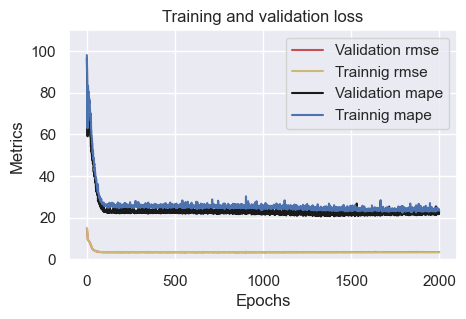

In [646]:
plotme(model2_5)

# sub-problem 3:     ******* input: distance & hour & dominated roadtype *********

In [40]:
df1 = df.iloc[:,0:6].copy()
df1 = df1.drop('hr_sin',axis=1)
df1 = df1.drop('hr_cos',axis=1)
df1.head()

,travel time,distance,hour of day,1st ranked
0,1038,0.542630,16,primary
1,1020,0.531771,22,primary
2,730,0.296433,6,primary
3,1235,0.427837,13,primary
4,576,0.312362,17,primary


In [41]:
df1['1st ranked'].isna().sum()

0

In [42]:
summar1 = df.groupby('1st ranked').agg(np.size)
summar1['travel time']

1st ranked
motorway         139
primary         3070
residential     1465
secondary       2110
service           50
tertiary        1155
track              7
trunk              1
unclassified     175
Name: travel time, dtype: int64

In [43]:
option = ['residential','tertiary','primary','secondary']
df1.loc[~df1['1st ranked'].isin(option),'1st ranked'] = 'others1'
summar1 = df1.groupby('1st ranked').agg(np.size)
summar1['travel time']

1st ranked
others1         372
primary        3070
residential    1465
secondary      2110
tertiary       1155
Name: travel time, dtype: int64

### 1. One-hot encoding of dominated roadtype

In [44]:
import category_encoders as ce
from category_encoders.target_encoder import TargetEncoder

In [45]:
dummy_ = pd.get_dummies(df1['1st ranked'], prefix='dominant_')
df1 = pd.merge(
    left=df1,
    right=dummy_,
    left_index=True,
    right_index=True,)


In [46]:
df1 = df1.drop(columns = ['1st ranked'])
df1.head()

,travel time,distance,hour of day,dominant__others1,dominant__primary,dominant__residential,dominant__secondary,dominant__tertiary
0,1038,0.542630,16,0,1,0,0,0
1,1020,0.531771,22,0,1,0,0,0
2,730,0.296433,6,0,1,0,0,0
3,1235,0.427837,13,0,1,0,0,0
4,576,0.312362,17,0,1,0,0,0


c:\users\shima\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  after removing the cwd from sys.path.


<AxesSubplot:>

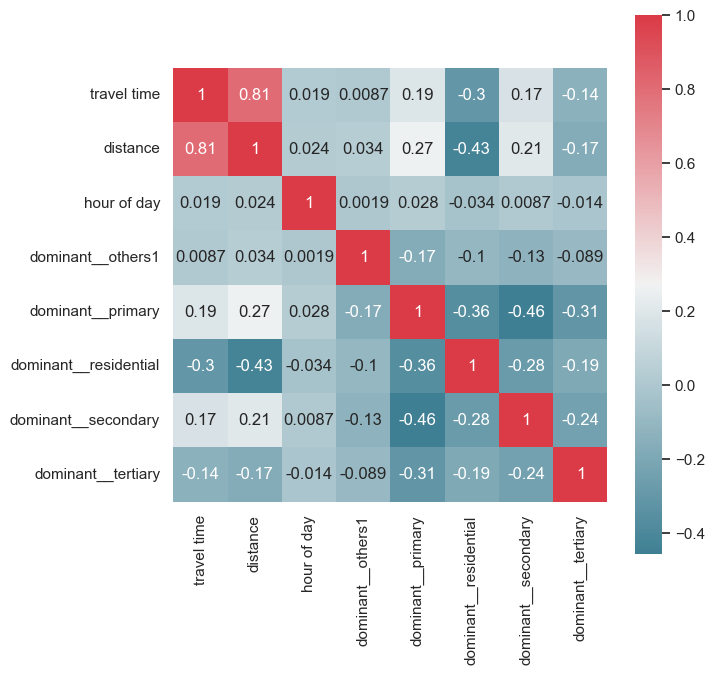

In [47]:
# run correlation matrix and plot
f, ax = plt.subplots(figsize=(7,7))
corr = df1.corr()
sns.heatmap(corr,annot=True, mask=np.zeros_like(corr,dtype=np.bool),
           cmap=sns.diverging_palette(220,10, as_cmap=True),
           square=True, ax=ax)

In [48]:
x = np.array(df1[['distance','dominant__others1','dominant__primary','dominant__residential','dominant__tertiary','dominant__secondary']])
# x = np.array(df1.iloc[:,1:])
y = np.array(df1['travel time'])
x

array([[0.54262962, 0.        , 1.        , 0.        , 0.        ,
        0.        ],
       [0.53177068, 0.        , 1.        , 0.        , 0.        ,
        0.        ],
       [0.29643314, 0.        , 1.        , 0.        , 0.        ,
        0.        ],
       ...,
       [0.38481239, 0.        , 1.        , 0.        , 0.        ,
        0.        ],
       [0.67939324, 0.        , 1.        , 0.        , 0.        ,
        0.        ],
       [0.18872099, 0.        , 1.        , 0.        , 0.        ,
        0.        ]])

In [49]:
#split data into test & train
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [50]:
print(X_train.shape)
print(X_test.shape)
# X_train

(6537, 6)
(1635, 6)


In [51]:
# inputs: distance +  dominant road
model3_1_1 = nnmodel(50, num_hlayers=1,Epoch=500)
model3_1_1

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 764407.1250 - mape: 99.6517 - rmse: 874.3038 - val_loss: 778831.2500 - val_mape: 99.0140 - val_rmse: 882.5142
Epoch 2/500
205/205 [==============================] - 0s 836us/step - loss: 744834.7500 - mape: 97.6149 - rmse: 863.0381 - val_loss: 747996.3750 - val_mape: 95.8443 - val_rmse: 864.8679
Epoch 3/500
205/205 [==============================] - 0s 803us/step - loss: 705102.0000 - mape: 93.3206 - rmse: 839.7035 - val_loss: 698530.0000 - val_mape: 90.5881 - val_rmse: 835.7811
Epoch 4/500
205/205 [==============================] - 0s 810us/step - loss: 649731.6250 - mape: 87.1305 - rmse: 806.0593 - val_loss: 636015.0625 - val_mape: 83.5996 - val_rmse: 797.5056
Epoch 5/500
205/205 [==============================] - 0s 828us/step - loss: 583799.6875 - mape: 79.4431 - rmse: 764.0679 - val_loss: 564892.4375 - val_mape: 75.3260 - val_rmse: 751.5933
Epoch 6/500
205/205 [==============================] - 0s 796us/ste

Epoch 45/500
205/205 [==============================] - 0s 767us/step - loss: 64270.9531 - mape: 28.6049 - rmse: 253.5172 - val_loss: 67141.1953 - val_mape: 28.2684 - val_rmse: 259.1162
Epoch 46/500
205/205 [==============================] - 0s 812us/step - loss: 63506.5781 - mape: 28.1877 - rmse: 252.0051 - val_loss: 66440.2188 - val_mape: 27.7472 - val_rmse: 257.7600
Epoch 47/500
205/205 [==============================] - 0s 832us/step - loss: 62824.2695 - mape: 27.6984 - rmse: 250.6477 - val_loss: 65781.1484 - val_mape: 27.5775 - val_rmse: 256.4784
Epoch 48/500
205/205 [==============================] - 0s 794us/step - loss: 62209.4844 - mape: 27.4532 - rmse: 249.4183 - val_loss: 65260.5664 - val_mape: 27.0413 - val_rmse: 255.4615
Epoch 49/500
205/205 [==============================] - 0s 812us/step - loss: 61661.0273 - mape: 27.1545 - rmse: 248.3164 - val_loss: 64798.9727 - val_mape: 26.4877 - val_rmse: 254.5564
Epoch 50/500
205/205 [==============================] - 0s 786us/step 

205/205 [==============================] - 0s 811us/step - loss: 57192.8320 - mape: 23.5863 - rmse: 239.1502 - val_loss: 61037.3633 - val_mape: 23.1966 - val_rmse: 247.0574
Epoch 90/500
205/205 [==============================] - 0s 792us/step - loss: 57169.5625 - mape: 23.6111 - rmse: 239.1016 - val_loss: 61012.9961 - val_mape: 23.2056 - val_rmse: 247.0081
Epoch 91/500
205/205 [==============================] - 0s 814us/step - loss: 57156.0234 - mape: 23.6090 - rmse: 239.0733 - val_loss: 60991.3594 - val_mape: 23.2082 - val_rmse: 246.9643
Epoch 92/500
205/205 [==============================] - 0s 806us/step - loss: 57122.5742 - mape: 23.6092 - rmse: 239.0033 - val_loss: 61018.8164 - val_mape: 23.0398 - val_rmse: 247.0199
Epoch 93/500
205/205 [==============================] - 0s 818us/step - loss: 57104.7578 - mape: 23.5674 - rmse: 238.9660 - val_loss: 61028.9141 - val_mape: 22.9354 - val_rmse: 247.0403
Epoch 94/500
205/205 [==============================] - 0s 807us/step - loss: 57084

Epoch 133/500
205/205 [==============================] - 0s 804us/step - loss: 56667.6836 - mape: 23.3235 - rmse: 238.0497 - val_loss: 60768.2773 - val_mape: 22.9729 - val_rmse: 246.5122
Epoch 134/500
205/205 [==============================] - 0s 805us/step - loss: 56648.6211 - mape: 23.3502 - rmse: 238.0097 - val_loss: 60729.5664 - val_mape: 23.1260 - val_rmse: 246.4337
Epoch 135/500
205/205 [==============================] - 0s 801us/step - loss: 56647.6055 - mape: 23.4898 - rmse: 238.0076 - val_loss: 60784.2852 - val_mape: 22.9241 - val_rmse: 246.5447
Epoch 136/500
205/205 [==============================] - 0s 783us/step - loss: 56643.5039 - mape: 23.2349 - rmse: 237.9990 - val_loss: 60746.8711 - val_mape: 23.1206 - val_rmse: 246.4688
Epoch 137/500
205/205 [==============================] - 0s 823us/step - loss: 56640.6562 - mape: 23.5055 - rmse: 237.9930 - val_loss: 60737.9375 - val_mape: 23.1005 - val_rmse: 246.4507
Epoch 138/500
205/205 [==============================] - 0s 836us

Epoch 177/500
205/205 [==============================] - 0s 794us/step - loss: 56551.7734 - mape: 23.3581 - rmse: 237.8062 - val_loss: 60823.3867 - val_mape: 22.9049 - val_rmse: 246.6240
Epoch 178/500
205/205 [==============================] - 0s 794us/step - loss: 56542.6133 - mape: 23.2163 - rmse: 237.7869 - val_loss: 60756.6367 - val_mape: 23.2150 - val_rmse: 246.4886
Epoch 179/500
205/205 [==============================] - 0s 786us/step - loss: 56551.4648 - mape: 23.4534 - rmse: 237.8055 - val_loss: 60845.5195 - val_mape: 22.8110 - val_rmse: 246.6688
Epoch 180/500
205/205 [==============================] - 0s 786us/step - loss: 56541.6562 - mape: 23.2625 - rmse: 237.7849 - val_loss: 60762.0117 - val_mape: 23.1585 - val_rmse: 246.4995
Epoch 181/500
205/205 [==============================] - 0s 806us/step - loss: 56561.4453 - mape: 23.4536 - rmse: 237.8265 - val_loss: 60789.3789 - val_mape: 23.0476 - val_rmse: 246.5550
Epoch 182/500
205/205 [==============================] - 0s 803us

Epoch 221/500
205/205 [==============================] - 0s 834us/step - loss: 56517.2266 - mape: 23.4103 - rmse: 237.7335 - val_loss: 60887.5000 - val_mape: 22.7843 - val_rmse: 246.7539
Epoch 222/500
205/205 [==============================] - 0s 807us/step - loss: 56513.5234 - mape: 23.2737 - rmse: 237.7257 - val_loss: 60814.7656 - val_mape: 23.1197 - val_rmse: 246.6065
Epoch 223/500
205/205 [==============================] - 0s 784us/step - loss: 56530.5781 - mape: 23.5620 - rmse: 237.7616 - val_loss: 60848.6992 - val_mape: 22.9468 - val_rmse: 246.6753
Epoch 224/500
205/205 [==============================] - 0s 815us/step - loss: 56526.2188 - mape: 23.2459 - rmse: 237.7524 - val_loss: 60830.2500 - val_mape: 23.0647 - val_rmse: 246.6379
Epoch 225/500
205/205 [==============================] - 0s 817us/step - loss: 56519.9805 - mape: 23.3546 - rmse: 237.7393 - val_loss: 60836.1406 - val_mape: 23.0439 - val_rmse: 246.6498
Epoch 226/500
205/205 [==============================] - 0s 800us

Epoch 265/500
205/205 [==============================] - 0s 827us/step - loss: 56507.6758 - mape: 23.3442 - rmse: 237.7134 - val_loss: 60822.9609 - val_mape: 23.0855 - val_rmse: 246.6231
Epoch 266/500
205/205 [==============================] - 0s 781us/step - loss: 56508.0898 - mape: 23.3560 - rmse: 237.7143 - val_loss: 60837.3125 - val_mape: 23.0167 - val_rmse: 246.6522
Epoch 267/500
205/205 [==============================] - 0s 830us/step - loss: 56502.5508 - mape: 23.5057 - rmse: 237.7027 - val_loss: 60866.9648 - val_mape: 22.8498 - val_rmse: 246.7123
Epoch 268/500
205/205 [==============================] - 0s 800us/step - loss: 56510.2930 - mape: 23.1943 - rmse: 237.7189 - val_loss: 60804.0547 - val_mape: 23.0984 - val_rmse: 246.5848
Epoch 269/500
205/205 [==============================] - 0s 799us/step - loss: 56504.7500 - mape: 23.3890 - rmse: 237.7073 - val_loss: 60816.8320 - val_mape: 23.0596 - val_rmse: 246.6107
Epoch 270/500
205/205 [==============================] - 0s 846us

Epoch 309/500
205/205 [==============================] - 0s 798us/step - loss: 56498.7695 - mape: 23.2012 - rmse: 237.6947 - val_loss: 60845.2109 - val_mape: 23.0757 - val_rmse: 246.6682
Epoch 310/500
205/205 [==============================] - 0s 808us/step - loss: 56479.8086 - mape: 23.5196 - rmse: 237.6548 - val_loss: 60901.8906 - val_mape: 22.8022 - val_rmse: 246.7831
Epoch 311/500
205/205 [==============================] - 0s 821us/step - loss: 56492.1367 - mape: 23.1823 - rmse: 237.6807 - val_loss: 60795.4414 - val_mape: 23.2393 - val_rmse: 246.5673
Epoch 312/500
205/205 [==============================] - 0s 810us/step - loss: 56503.1992 - mape: 23.4025 - rmse: 237.7040 - val_loss: 60818.2461 - val_mape: 23.1556 - val_rmse: 246.6136
Epoch 313/500
205/205 [==============================] - 0s 810us/step - loss: 56494.7539 - mape: 23.3806 - rmse: 237.6862 - val_loss: 60835.1836 - val_mape: 23.0257 - val_rmse: 246.6479
Epoch 314/500
205/205 [==============================] - 0s 796us

Epoch 353/500
205/205 [==============================] - 0s 794us/step - loss: 56482.8867 - mape: 23.4310 - rmse: 237.6613 - val_loss: 60850.4922 - val_mape: 22.9736 - val_rmse: 246.6789
Epoch 354/500
205/205 [==============================] - 0s 809us/step - loss: 56482.9023 - mape: 23.3934 - rmse: 237.6613 - val_loss: 60909.7695 - val_mape: 22.8352 - val_rmse: 246.7990
Epoch 355/500
205/205 [==============================] - 0s 808us/step - loss: 56494.3867 - mape: 23.2819 - rmse: 237.6855 - val_loss: 60840.8281 - val_mape: 23.1032 - val_rmse: 246.6593
Epoch 356/500
205/205 [==============================] - 0s 801us/step - loss: 56489.5781 - mape: 23.3754 - rmse: 237.6754 - val_loss: 60861.4492 - val_mape: 22.9734 - val_rmse: 246.7011
Epoch 357/500
205/205 [==============================] - 0s 788us/step - loss: 56486.9570 - mape: 23.2981 - rmse: 237.6698 - val_loss: 60827.3828 - val_mape: 23.1208 - val_rmse: 246.6321
Epoch 358/500
205/205 [==============================] - 0s 802us

Epoch 397/500
205/205 [==============================] - 0s 822us/step - loss: 56478.8438 - mape: 23.3915 - rmse: 237.6528 - val_loss: 60843.2305 - val_mape: 22.9810 - val_rmse: 246.6642
Epoch 398/500
205/205 [==============================] - 0s 806us/step - loss: 56485.4570 - mape: 23.3887 - rmse: 237.6667 - val_loss: 60825.4336 - val_mape: 23.0131 - val_rmse: 246.6281
Epoch 399/500
205/205 [==============================] - 0s 810us/step - loss: 56484.2461 - mape: 23.3468 - rmse: 237.6641 - val_loss: 60845.3672 - val_mape: 22.9938 - val_rmse: 246.6685
Epoch 400/500
205/205 [==============================] - 0s 818us/step - loss: 56469.8945 - mape: 23.2142 - rmse: 237.6340 - val_loss: 60815.0898 - val_mape: 23.1872 - val_rmse: 246.6072
Epoch 401/500
205/205 [==============================] - 0s 802us/step - loss: 56487.7148 - mape: 23.4273 - rmse: 237.6714 - val_loss: 60804.7773 - val_mape: 23.2632 - val_rmse: 246.5862
Epoch 402/500
205/205 [==============================] - 0s 792us

Epoch 441/500
205/205 [==============================] - 0s 806us/step - loss: 56473.0391 - mape: 23.3686 - rmse: 237.6406 - val_loss: 60837.4258 - val_mape: 22.9828 - val_rmse: 246.6524
Epoch 442/500
205/205 [==============================] - 0s 801us/step - loss: 56485.2031 - mape: 23.3293 - rmse: 237.6662 - val_loss: 60830.8008 - val_mape: 23.1098 - val_rmse: 246.6390
Epoch 443/500
205/205 [==============================] - 0s 803us/step - loss: 56464.9375 - mape: 23.3317 - rmse: 237.6235 - val_loss: 60841.6055 - val_mape: 23.0578 - val_rmse: 246.6609
Epoch 444/500
205/205 [==============================] - 0s 797us/step - loss: 56478.5273 - mape: 23.3437 - rmse: 237.6521 - val_loss: 60833.9180 - val_mape: 23.0932 - val_rmse: 246.6453
Epoch 445/500
205/205 [==============================] - 0s 790us/step - loss: 56469.2344 - mape: 23.5076 - rmse: 237.6326 - val_loss: 60883.1016 - val_mape: 22.8832 - val_rmse: 246.7450
Epoch 446/500
205/205 [==============================] - 0s 783us

Epoch 485/500
205/205 [==============================] - 0s 817us/step - loss: 56483.5156 - mape: 23.2594 - rmse: 237.6626 - val_loss: 60846.9961 - val_mape: 23.0509 - val_rmse: 246.6718
Epoch 486/500
205/205 [==============================] - 0s 813us/step - loss: 56473.0195 - mape: 23.4239 - rmse: 237.6405 - val_loss: 60879.7266 - val_mape: 22.9030 - val_rmse: 246.7382
Epoch 487/500
205/205 [==============================] - 0s 795us/step - loss: 56462.7578 - mape: 23.2536 - rmse: 237.6189 - val_loss: 60821.2266 - val_mape: 23.1797 - val_rmse: 246.6196
Epoch 488/500
205/205 [==============================] - 0s 788us/step - loss: 56472.4570 - mape: 23.4074 - rmse: 237.6393 - val_loss: 60857.7383 - val_mape: 23.0599 - val_rmse: 246.6936
Epoch 489/500
205/205 [==============================] - 0s 777us/step - loss: 56467.1758 - mape: 23.3683 - rmse: 237.6282 - val_loss: 60853.8086 - val_mape: 23.0423 - val_rmse: 246.6857
Epoch 490/500
205/205 [==============================] - 0s 810us

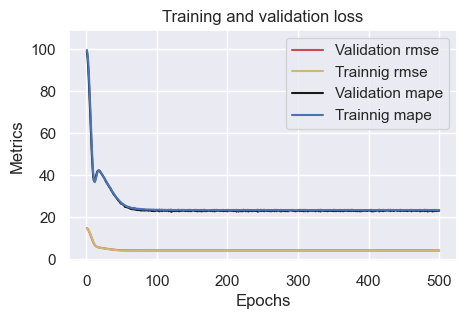

In [52]:
plotme(model3_1_1)


In [264]:
# inputs: distance +  dominant road
model3_1_2 = nnmodel(100, num_hlayers=1,Epoch=500)
model3_1_2

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 761245.0000 - mape: 99.3168 - rmse: 872.4935 - val_loss: 768804.1875 - val_mape: 97.9892 - val_rmse: 876.8148
Epoch 2/500
205/205 [==============================] - 0s 791us/step - loss: 721086.5000 - mape: 95.0174 - rmse: 849.1682 - val_loss: 705359.8750 - val_mape: 91.3141 - val_rmse: 839.8571
Epoch 3/500
205/205 [==============================] - 0s 785us/step - loss: 639901.8125 - mape: 86.0397 - rmse: 799.9387 - val_loss: 607009.0625 - val_mape: 80.2378 - val_rmse: 779.1078
Epoch 4/500
205/205 [==============================] - 0s 801us/step - loss: 535044.6875 - mape: 73.6436 - rmse: 731.4675 - val_loss: 494310.1250 - val_mape: 67.2503 - val_rmse: 703.0719
Epoch 5/500
205/205 [==============================] - 0s 809us/step - loss: 424035.0000 - mape: 60.4433 - rmse: 651.1797 - val_loss: 383021.2500 - val_mape: 54.3541 - val_rmse: 618.8871
Epoch 6/500
205/205 [==============================] - 0s 794us/ste

Epoch 45/500
205/205 [==============================] - 0s 775us/step - loss: 58995.7617 - mape: 25.1643 - rmse: 242.8904 - val_loss: 62472.0000 - val_mape: 24.4068 - val_rmse: 249.9440
Epoch 46/500
205/205 [==============================] - 0s 792us/step - loss: 58861.0195 - mape: 24.7459 - rmse: 242.6129 - val_loss: 62304.4023 - val_mape: 24.4775 - val_rmse: 249.6085
Epoch 47/500
205/205 [==============================] - 0s 778us/step - loss: 58728.8633 - mape: 24.7758 - rmse: 242.3404 - val_loss: 62209.2773 - val_mape: 24.2722 - val_rmse: 249.4179
Epoch 48/500
205/205 [==============================] - 0s 780us/step - loss: 58587.0273 - mape: 24.7818 - rmse: 242.0476 - val_loss: 62221.5039 - val_mape: 23.7128 - val_rmse: 249.4424
Epoch 49/500
205/205 [==============================] - 0s 766us/step - loss: 58521.9258 - mape: 24.3401 - rmse: 241.9131 - val_loss: 62025.2773 - val_mape: 24.1351 - val_rmse: 249.0488
Epoch 50/500
205/205 [==============================] - 0s 771us/step 

205/205 [==============================] - 0s 764us/step - loss: 56920.4727 - mape: 23.4891 - rmse: 238.5801 - val_loss: 60897.3945 - val_mape: 22.9469 - val_rmse: 246.7740
Epoch 90/500
205/205 [==============================] - 0s 770us/step - loss: 56919.0156 - mape: 23.3966 - rmse: 238.5771 - val_loss: 60906.2422 - val_mape: 22.9065 - val_rmse: 246.7919
Epoch 91/500
205/205 [==============================] - 0s 762us/step - loss: 56889.6406 - mape: 23.3416 - rmse: 238.5155 - val_loss: 60840.8516 - val_mape: 23.1908 - val_rmse: 246.6594
Epoch 92/500
205/205 [==============================] - 0s 770us/step - loss: 56884.7344 - mape: 23.4939 - rmse: 238.5052 - val_loss: 60856.9492 - val_mape: 23.0319 - val_rmse: 246.6920
Epoch 93/500
205/205 [==============================] - 0s 764us/step - loss: 56873.5156 - mape: 23.3137 - rmse: 238.4817 - val_loss: 60823.6562 - val_mape: 23.1401 - val_rmse: 246.6245
Epoch 94/500
205/205 [==============================] - 0s 776us/step - loss: 56858

Epoch 133/500
205/205 [==============================] - 0s 769us/step - loss: 56672.5234 - mape: 23.2750 - rmse: 238.0599 - val_loss: 60882.2656 - val_mape: 22.7728 - val_rmse: 246.7433
Epoch 134/500
205/205 [==============================] - 0s 777us/step - loss: 56656.6484 - mape: 23.4153 - rmse: 238.0266 - val_loss: 60905.1211 - val_mape: 22.7753 - val_rmse: 246.7896
Epoch 135/500
205/205 [==============================] - 0s 769us/step - loss: 56638.4375 - mape: 23.4361 - rmse: 237.9883 - val_loss: 60956.3047 - val_mape: 22.6549 - val_rmse: 246.8933
Epoch 136/500
205/205 [==============================] - 0s 770us/step - loss: 56665.9414 - mape: 23.1919 - rmse: 238.0461 - val_loss: 60853.8633 - val_mape: 22.9105 - val_rmse: 246.6858
Epoch 137/500
205/205 [==============================] - 0s 776us/step - loss: 56660.3633 - mape: 23.4477 - rmse: 238.0344 - val_loss: 60827.0273 - val_mape: 23.0910 - val_rmse: 246.6314
Epoch 138/500
205/205 [==============================] - 0s 770us

Epoch 177/500
205/205 [==============================] - 0s 769us/step - loss: 56619.4492 - mape: 23.4589 - rmse: 237.9484 - val_loss: 60902.9023 - val_mape: 22.8039 - val_rmse: 246.7851
Epoch 178/500
205/205 [==============================] - 0s 770us/step - loss: 56608.1406 - mape: 23.2850 - rmse: 237.9247 - val_loss: 60816.7812 - val_mape: 23.1858 - val_rmse: 246.6106
Epoch 179/500
205/205 [==============================] - 0s 771us/step - loss: 56616.1992 - mape: 23.4241 - rmse: 237.9416 - val_loss: 60850.5195 - val_mape: 22.9836 - val_rmse: 246.6790
Epoch 180/500
205/205 [==============================] - 0s 838us/step - loss: 56594.4688 - mape: 23.4021 - rmse: 237.8959 - val_loss: 60889.3516 - val_mape: 22.8996 - val_rmse: 246.7577
Epoch 181/500
205/205 [==============================] - 0s 777us/step - loss: 56615.6016 - mape: 23.3560 - rmse: 237.9403 - val_loss: 60855.7461 - val_mape: 22.9451 - val_rmse: 246.6896
Epoch 182/500
205/205 [==============================] - 0s 776us

Epoch 221/500
205/205 [==============================] - 0s 779us/step - loss: 56579.2812 - mape: 23.4190 - rmse: 237.8640 - val_loss: 60803.7773 - val_mape: 23.1181 - val_rmse: 246.5842
Epoch 222/500
205/205 [==============================] - 0s 765us/step - loss: 56587.7188 - mape: 23.4320 - rmse: 237.8817 - val_loss: 60816.3945 - val_mape: 22.9704 - val_rmse: 246.6098
Epoch 223/500
205/205 [==============================] - 0s 781us/step - loss: 56569.5977 - mape: 23.3799 - rmse: 237.8436 - val_loss: 60849.8086 - val_mape: 22.9510 - val_rmse: 246.6775
Epoch 224/500
205/205 [==============================] - 0s 771us/step - loss: 56564.2891 - mape: 23.3349 - rmse: 237.8325 - val_loss: 60857.3984 - val_mape: 22.9177 - val_rmse: 246.6929
Epoch 225/500
205/205 [==============================] - 0s 766us/step - loss: 56572.8125 - mape: 23.3586 - rmse: 237.8504 - val_loss: 60869.4297 - val_mape: 22.9063 - val_rmse: 246.7173
Epoch 226/500
205/205 [==============================] - 0s 773us

Epoch 265/500
205/205 [==============================] - 0s 820us/step - loss: 56541.2578 - mape: 23.3227 - rmse: 237.7841 - val_loss: 60782.6641 - val_mape: 23.3993 - val_rmse: 246.5414
Epoch 266/500
205/205 [==============================] - 0s 770us/step - loss: 56547.7969 - mape: 23.5310 - rmse: 237.7978 - val_loss: 60885.6367 - val_mape: 22.9039 - val_rmse: 246.7502
Epoch 267/500
205/205 [==============================] - 0s 771us/step - loss: 56539.9922 - mape: 23.1662 - rmse: 237.7814 - val_loss: 60810.9414 - val_mape: 23.1651 - val_rmse: 246.5987
Epoch 268/500
205/205 [==============================] - 0s 777us/step - loss: 56540.5977 - mape: 23.4395 - rmse: 237.7827 - val_loss: 60797.9492 - val_mape: 23.1302 - val_rmse: 246.5724
Epoch 269/500
205/205 [==============================] - 0s 774us/step - loss: 56534.4844 - mape: 23.4231 - rmse: 237.7698 - val_loss: 60814.5312 - val_mape: 23.1664 - val_rmse: 246.6060
Epoch 270/500
205/205 [==============================] - 0s 779us

Epoch 309/500
205/205 [==============================] - 0s 771us/step - loss: 56508.6719 - mape: 23.3728 - rmse: 237.7155 - val_loss: 60786.5312 - val_mape: 23.3411 - val_rmse: 246.5492
Epoch 310/500
205/205 [==============================] - 0s 762us/step - loss: 56506.5547 - mape: 23.4073 - rmse: 237.7111 - val_loss: 60828.9336 - val_mape: 23.1109 - val_rmse: 246.6352
Epoch 311/500
205/205 [==============================] - 0s 766us/step - loss: 56540.9453 - mape: 23.3544 - rmse: 237.7834 - val_loss: 60800.3672 - val_mape: 23.2382 - val_rmse: 246.5773
Epoch 312/500
205/205 [==============================] - 0s 764us/step - loss: 56524.4453 - mape: 23.3201 - rmse: 237.7487 - val_loss: 60805.3398 - val_mape: 23.1638 - val_rmse: 246.5874
Epoch 313/500
205/205 [==============================] - 0s 761us/step - loss: 56517.2188 - mape: 23.3518 - rmse: 237.7335 - val_loss: 60857.7656 - val_mape: 22.9589 - val_rmse: 246.6937
Epoch 314/500
205/205 [==============================] - 0s 767us

Epoch 353/500
205/205 [==============================] - 0s 761us/step - loss: 56489.8555 - mape: 23.5892 - rmse: 237.6759 - val_loss: 60891.3945 - val_mape: 22.8163 - val_rmse: 246.7618
Epoch 354/500
205/205 [==============================] - 0s 783us/step - loss: 56504.1953 - mape: 23.1997 - rmse: 237.7061 - val_loss: 60819.9766 - val_mape: 23.1648 - val_rmse: 246.6171
Epoch 355/500
205/205 [==============================] - 0s 760us/step - loss: 56506.9961 - mape: 23.3787 - rmse: 237.7120 - val_loss: 60814.5430 - val_mape: 23.1947 - val_rmse: 246.6060
Epoch 356/500
205/205 [==============================] - 0s 772us/step - loss: 56481.4648 - mape: 23.5578 - rmse: 237.6583 - val_loss: 61005.2461 - val_mape: 22.5446 - val_rmse: 246.9924
Epoch 357/500
205/205 [==============================] - 0s 759us/step - loss: 56515.9102 - mape: 23.2160 - rmse: 237.7308 - val_loss: 60817.9414 - val_mape: 23.1179 - val_rmse: 246.6129
Epoch 358/500
205/205 [==============================] - 0s 777us

Epoch 397/500
205/205 [==============================] - 0s 764us/step - loss: 56478.1953 - mape: 23.4883 - rmse: 237.6514 - val_loss: 60950.2617 - val_mape: 22.6768 - val_rmse: 246.8811
Epoch 398/500
205/205 [==============================] - 0s 773us/step - loss: 56518.9453 - mape: 23.3281 - rmse: 237.7371 - val_loss: 60930.3867 - val_mape: 22.7328 - val_rmse: 246.8408
Epoch 399/500
205/205 [==============================] - 0s 769us/step - loss: 56509.9102 - mape: 23.3333 - rmse: 237.7181 - val_loss: 60824.0039 - val_mape: 23.0852 - val_rmse: 246.6252
Epoch 400/500
205/205 [==============================] - 0s 766us/step - loss: 56508.2148 - mape: 23.2497 - rmse: 237.7146 - val_loss: 60835.7031 - val_mape: 22.9883 - val_rmse: 246.6489
Epoch 401/500
205/205 [==============================] - 0s 768us/step - loss: 56493.8828 - mape: 23.4750 - rmse: 237.6844 - val_loss: 60841.8086 - val_mape: 23.0404 - val_rmse: 246.6613
Epoch 402/500
205/205 [==============================] - 0s 772us

Epoch 441/500
205/205 [==============================] - 0s 759us/step - loss: 56481.3711 - mape: 23.2630 - rmse: 237.6581 - val_loss: 60801.5117 - val_mape: 23.3180 - val_rmse: 246.5796
Epoch 442/500
205/205 [==============================] - 0s 766us/step - loss: 56505.0703 - mape: 23.3838 - rmse: 237.7079 - val_loss: 60862.3516 - val_mape: 22.9849 - val_rmse: 246.7030
Epoch 443/500
205/205 [==============================] - 0s 763us/step - loss: 56502.0078 - mape: 23.4519 - rmse: 237.7015 - val_loss: 60809.6211 - val_mape: 23.1685 - val_rmse: 246.5961
Epoch 444/500
205/205 [==============================] - 0s 760us/step - loss: 56483.9023 - mape: 23.3120 - rmse: 237.6634 - val_loss: 60791.3008 - val_mape: 23.3461 - val_rmse: 246.5589
Epoch 445/500
205/205 [==============================] - 0s 768us/step - loss: 56482.4883 - mape: 23.3757 - rmse: 237.6604 - val_loss: 60799.7344 - val_mape: 23.3431 - val_rmse: 246.5760
Epoch 446/500
205/205 [==============================] - 0s 791us

Epoch 485/500
205/205 [==============================] - 0s 799us/step - loss: 56466.0664 - mape: 23.2782 - rmse: 237.6259 - val_loss: 60787.3164 - val_mape: 23.3706 - val_rmse: 246.5508
Epoch 486/500
205/205 [==============================] - 0s 767us/step - loss: 56467.1211 - mape: 23.5567 - rmse: 237.6281 - val_loss: 61049.8164 - val_mape: 22.5211 - val_rmse: 247.0826
Epoch 487/500
205/205 [==============================] - 0s 792us/step - loss: 56498.4141 - mape: 23.2883 - rmse: 237.6940 - val_loss: 60807.0859 - val_mape: 23.2557 - val_rmse: 246.5909
Epoch 488/500
205/205 [==============================] - 0s 785us/step - loss: 56475.8359 - mape: 23.4494 - rmse: 237.6465 - val_loss: 60897.2070 - val_mape: 22.8732 - val_rmse: 246.7736
Epoch 489/500
205/205 [==============================] - 0s 772us/step - loss: 56474.1836 - mape: 23.3363 - rmse: 237.6430 - val_loss: 60828.9375 - val_mape: 23.1662 - val_rmse: 246.6352
Epoch 490/500
205/205 [==============================] - 0s 769us

In [265]:
202.7127227783203/60

3.378545379638672

In [266]:
# inputs: distance +  dominant road
model3_1_3 = nnmodel(200, num_hlayers=1,Epoch=500)
model3_1_3

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 755176.2500 - mape: 98.6728 - rmse: 869.0088 - val_loss: 747842.6875 - val_mape: 95.7897 - val_rmse: 864.7790
Epoch 2/500
205/205 [==============================] - 0s 815us/step - loss: 672182.3125 - mape: 89.5547 - rmse: 819.8672 - val_loss: 622270.6250 - val_mape: 81.9412 - val_rmse: 788.8413
Epoch 3/500
205/205 [==============================] - 0s 818us/step - loss: 524201.0625 - mape: 72.2583 - rmse: 724.0173 - val_loss: 454918.3125 - val_mape: 62.6333 - val_rmse: 674.4763
Epoch 4/500
205/205 [==============================] - 0s 799us/step - loss: 362443.1250 - mape: 52.9575 - rmse: 602.0325 - val_loss: 300559.4688 - val_mape: 45.2307 - val_rmse: 548.2330
Epoch 5/500
205/205 [==============================] - 0s 814us/step - loss: 235666.0781 - mape: 39.6613 - rmse: 485.4545 - val_loss: 197218.3125 - val_mape: 37.3482 - val_rmse: 444.0927
Epoch 6/500
205/205 [==============================] - 0s 821us/ste

Epoch 45/500
205/205 [==============================] - 0s 789us/step - loss: 57788.8516 - mape: 23.9228 - rmse: 240.3931 - val_loss: 61421.7109 - val_mape: 23.4158 - val_rmse: 247.8340
Epoch 46/500
205/205 [==============================] - 0s 790us/step - loss: 57735.5742 - mape: 23.7368 - rmse: 240.2823 - val_loss: 61461.8555 - val_mape: 23.1179 - val_rmse: 247.9150
Epoch 47/500
205/205 [==============================] - 0s 796us/step - loss: 57675.9258 - mape: 23.8437 - rmse: 240.1581 - val_loss: 61304.9453 - val_mape: 23.4044 - val_rmse: 247.5984
Epoch 48/500
205/205 [==============================] - 0s 798us/step - loss: 57577.3906 - mape: 23.7433 - rmse: 239.9529 - val_loss: 61274.0508 - val_mape: 23.3098 - val_rmse: 247.5360
Epoch 49/500
205/205 [==============================] - 0s 787us/step - loss: 57520.5469 - mape: 23.8171 - rmse: 239.8344 - val_loss: 61221.7930 - val_mape: 23.4114 - val_rmse: 247.4304
Epoch 50/500
205/205 [==============================] - 0s 790us/step 

205/205 [==============================] - 0s 794us/step - loss: 56722.6758 - mape: 23.4732 - rmse: 238.1652 - val_loss: 60846.5820 - val_mape: 22.8246 - val_rmse: 246.6710
Epoch 90/500
205/205 [==============================] - 0s 791us/step - loss: 56729.8750 - mape: 23.3409 - rmse: 238.1803 - val_loss: 60850.0859 - val_mape: 22.9222 - val_rmse: 246.6781
Epoch 91/500
205/205 [==============================] - 0s 794us/step - loss: 56722.3281 - mape: 23.3273 - rmse: 238.1645 - val_loss: 60774.8633 - val_mape: 23.4310 - val_rmse: 246.5256
Epoch 92/500
205/205 [==============================] - 0s 780us/step - loss: 56718.8438 - mape: 23.2934 - rmse: 238.1572 - val_loss: 60780.6523 - val_mape: 23.2576 - val_rmse: 246.5373
Epoch 93/500
205/205 [==============================] - 0s 780us/step - loss: 56735.8320 - mape: 23.6533 - rmse: 238.1928 - val_loss: 60878.6875 - val_mape: 22.9086 - val_rmse: 246.7361
Epoch 94/500
205/205 [==============================] - 0s 783us/step - loss: 56724

Epoch 133/500
205/205 [==============================] - 0s 839us/step - loss: 56647.4297 - mape: 23.3788 - rmse: 238.0072 - val_loss: 60902.2539 - val_mape: 22.8170 - val_rmse: 246.7838
Epoch 134/500
205/205 [==============================] - 0s 792us/step - loss: 56618.7734 - mape: 23.3631 - rmse: 237.9470 - val_loss: 60805.5391 - val_mape: 23.1330 - val_rmse: 246.5878
Epoch 135/500
205/205 [==============================] - 0s 780us/step - loss: 56631.7305 - mape: 23.2304 - rmse: 237.9742 - val_loss: 60828.2031 - val_mape: 23.1157 - val_rmse: 246.6337
Epoch 136/500
205/205 [==============================] - 0s 782us/step - loss: 56602.5508 - mape: 23.3920 - rmse: 237.9129 - val_loss: 60826.5938 - val_mape: 23.0840 - val_rmse: 246.6305
Epoch 137/500
205/205 [==============================] - 0s 792us/step - loss: 56636.2266 - mape: 23.4883 - rmse: 237.9837 - val_loss: 61013.8828 - val_mape: 22.5716 - val_rmse: 247.0099
Epoch 138/500
205/205 [==============================] - 0s 786us

Epoch 177/500
205/205 [==============================] - 0s 790us/step - loss: 56587.3906 - mape: 23.3930 - rmse: 237.8810 - val_loss: 60798.0820 - val_mape: 23.3595 - val_rmse: 246.5727
Epoch 178/500
205/205 [==============================] - 0s 782us/step - loss: 56582.0000 - mape: 23.4749 - rmse: 237.8697 - val_loss: 60901.7891 - val_mape: 22.8321 - val_rmse: 246.7829
Epoch 179/500
205/205 [==============================] - 0s 800us/step - loss: 56582.2891 - mape: 23.4123 - rmse: 237.8703 - val_loss: 60977.8906 - val_mape: 22.6454 - val_rmse: 246.9370
Epoch 180/500
205/205 [==============================] - 0s 774us/step - loss: 56563.7227 - mape: 23.1771 - rmse: 237.8313 - val_loss: 60787.9062 - val_mape: 23.6199 - val_rmse: 246.5520
Epoch 181/500
205/205 [==============================] - 0s 799us/step - loss: 56579.4570 - mape: 23.4925 - rmse: 237.8644 - val_loss: 60910.1641 - val_mape: 22.8122 - val_rmse: 246.7999
Epoch 182/500
205/205 [==============================] - 0s 791us

Epoch 221/500
205/205 [==============================] - 0s 804us/step - loss: 56528.5078 - mape: 23.5211 - rmse: 237.7572 - val_loss: 60961.3438 - val_mape: 22.6214 - val_rmse: 246.9035
Epoch 222/500
205/205 [==============================] - 0s 795us/step - loss: 56558.8633 - mape: 23.1543 - rmse: 237.8211 - val_loss: 60796.5312 - val_mape: 23.6025 - val_rmse: 246.5695
Epoch 223/500
205/205 [==============================] - 0s 804us/step - loss: 56534.6680 - mape: 23.5444 - rmse: 237.7702 - val_loss: 60907.7461 - val_mape: 22.8172 - val_rmse: 246.7950
Epoch 224/500
205/205 [==============================] - 0s 786us/step - loss: 56552.5195 - mape: 23.1761 - rmse: 237.8077 - val_loss: 60755.3828 - val_mape: 23.5329 - val_rmse: 246.4861
Epoch 225/500
205/205 [==============================] - 0s 801us/step - loss: 56545.3672 - mape: 23.4314 - rmse: 237.7927 - val_loss: 60774.2188 - val_mape: 23.2091 - val_rmse: 246.5243
Epoch 226/500
205/205 [==============================] - 0s 787us

Epoch 265/500
205/205 [==============================] - 0s 797us/step - loss: 56514.5469 - mape: 23.4627 - rmse: 237.7279 - val_loss: 60871.8203 - val_mape: 22.8647 - val_rmse: 246.7222
Epoch 266/500
205/205 [==============================] - 0s 796us/step - loss: 56529.9180 - mape: 23.3095 - rmse: 237.7602 - val_loss: 60897.1562 - val_mape: 22.8066 - val_rmse: 246.7735
Epoch 267/500
205/205 [==============================] - 0s 791us/step - loss: 56528.9375 - mape: 23.3944 - rmse: 237.7581 - val_loss: 60788.8047 - val_mape: 23.1936 - val_rmse: 246.5539
Epoch 268/500
205/205 [==============================] - 0s 785us/step - loss: 56487.8750 - mape: 23.5318 - rmse: 237.6718 - val_loss: 60991.2617 - val_mape: 22.5553 - val_rmse: 246.9641
Epoch 269/500
205/205 [==============================] - 0s 788us/step - loss: 56528.3164 - mape: 23.1556 - rmse: 237.7568 - val_loss: 60810.2695 - val_mape: 23.3744 - val_rmse: 246.5974
Epoch 270/500
205/205 [==============================] - 0s 789us

Epoch 309/500
205/205 [==============================] - 0s 790us/step - loss: 56492.1992 - mape: 23.3663 - rmse: 237.6809 - val_loss: 60795.4297 - val_mape: 23.3922 - val_rmse: 246.5673
Epoch 310/500
205/205 [==============================] - 0s 789us/step - loss: 56514.2070 - mape: 23.5477 - rmse: 237.7272 - val_loss: 60929.6875 - val_mape: 22.6733 - val_rmse: 246.8394
Epoch 311/500
205/205 [==============================] - 0s 780us/step - loss: 56496.5586 - mape: 23.2033 - rmse: 237.6900 - val_loss: 60778.6172 - val_mape: 23.5409 - val_rmse: 246.5332
Epoch 312/500
205/205 [==============================] - 0s 790us/step - loss: 56501.7344 - mape: 23.3655 - rmse: 237.7009 - val_loss: 60764.9609 - val_mape: 23.5141 - val_rmse: 246.5055
Epoch 313/500
205/205 [==============================] - 0s 789us/step - loss: 56556.3867 - mape: 23.4815 - rmse: 237.8159 - val_loss: 60787.3672 - val_mape: 23.2867 - val_rmse: 246.5509
Epoch 314/500
205/205 [==============================] - 0s 791us

Epoch 353/500
205/205 [==============================] - 0s 788us/step - loss: 56484.7383 - mape: 23.2479 - rmse: 237.6652 - val_loss: 60785.5078 - val_mape: 23.3607 - val_rmse: 246.5472
Epoch 354/500
205/205 [==============================] - 0s 788us/step - loss: 56508.1289 - mape: 23.4192 - rmse: 237.7144 - val_loss: 60878.0000 - val_mape: 22.8704 - val_rmse: 246.7347
Epoch 355/500
205/205 [==============================] - 0s 781us/step - loss: 56507.9648 - mape: 23.3458 - rmse: 237.7140 - val_loss: 60903.3945 - val_mape: 22.8617 - val_rmse: 246.7861
Epoch 356/500
205/205 [==============================] - 0s 781us/step - loss: 56482.4023 - mape: 23.2882 - rmse: 237.6603 - val_loss: 60792.3555 - val_mape: 23.3338 - val_rmse: 246.5611
Epoch 357/500
205/205 [==============================] - 0s 797us/step - loss: 56479.7852 - mape: 23.3298 - rmse: 237.6548 - val_loss: 60775.6836 - val_mape: 23.3951 - val_rmse: 246.5273
Epoch 358/500
205/205 [==============================] - 0s 790us

Epoch 397/500
205/205 [==============================] - 0s 796us/step - loss: 56453.6484 - mape: 23.3136 - rmse: 237.5998 - val_loss: 60817.7891 - val_mape: 23.6371 - val_rmse: 246.6126
Epoch 398/500
205/205 [==============================] - 0s 782us/step - loss: 56501.0000 - mape: 23.3352 - rmse: 237.6994 - val_loss: 60776.8125 - val_mape: 23.4834 - val_rmse: 246.5295
Epoch 399/500
205/205 [==============================] - 0s 793us/step - loss: 56484.7773 - mape: 23.3372 - rmse: 237.6653 - val_loss: 60798.9766 - val_mape: 23.3692 - val_rmse: 246.5745
Epoch 400/500
205/205 [==============================] - 0s 794us/step - loss: 56504.7617 - mape: 23.4774 - rmse: 237.7073 - val_loss: 60809.6094 - val_mape: 23.2428 - val_rmse: 246.5960
Epoch 401/500
205/205 [==============================] - 0s 789us/step - loss: 56479.0859 - mape: 23.4753 - rmse: 237.6533 - val_loss: 60897.4258 - val_mape: 22.8833 - val_rmse: 246.7740
Epoch 402/500
205/205 [==============================] - 0s 797us

Epoch 441/500
205/205 [==============================] - 0s 778us/step - loss: 56488.7852 - mape: 23.3983 - rmse: 237.6737 - val_loss: 61013.1484 - val_mape: 22.6541 - val_rmse: 247.0084
Epoch 442/500
205/205 [==============================] - 0s 804us/step - loss: 56482.3008 - mape: 23.2556 - rmse: 237.6600 - val_loss: 60801.5430 - val_mape: 23.4903 - val_rmse: 246.5797
Epoch 443/500
205/205 [==============================] - 0s 775us/step - loss: 56483.0586 - mape: 23.4726 - rmse: 237.6617 - val_loss: 60936.7227 - val_mape: 22.8202 - val_rmse: 246.8537
Epoch 444/500
205/205 [==============================] - 0s 786us/step - loss: 56464.8633 - mape: 23.2873 - rmse: 237.6234 - val_loss: 60808.7812 - val_mape: 23.4335 - val_rmse: 246.5944
Epoch 445/500
205/205 [==============================] - 0s 795us/step - loss: 56492.4453 - mape: 23.3350 - rmse: 237.6814 - val_loss: 60823.3945 - val_mape: 23.4077 - val_rmse: 246.6240
Epoch 446/500
205/205 [==============================] - 0s 787us

Epoch 485/500
205/205 [==============================] - 0s 794us/step - loss: 56495.6289 - mape: 23.4346 - rmse: 237.6881 - val_loss: 60930.2422 - val_mape: 22.9245 - val_rmse: 246.8405
Epoch 486/500
205/205 [==============================] - 0s 779us/step - loss: 56510.9336 - mape: 23.3479 - rmse: 237.7203 - val_loss: 60881.1484 - val_mape: 23.0711 - val_rmse: 246.7411
Epoch 487/500
205/205 [==============================] - 0s 791us/step - loss: 56472.5391 - mape: 23.3964 - rmse: 237.6395 - val_loss: 60864.7578 - val_mape: 23.1174 - val_rmse: 246.7078
Epoch 488/500
205/205 [==============================] - 0s 796us/step - loss: 56473.7617 - mape: 23.4410 - rmse: 237.6421 - val_loss: 60915.2734 - val_mape: 22.9134 - val_rmse: 246.8102
Epoch 489/500
205/205 [==============================] - 0s 794us/step - loss: 56475.2578 - mape: 23.4050 - rmse: 237.6452 - val_loss: 60951.3828 - val_mape: 22.8590 - val_rmse: 246.8833
Epoch 490/500
205/205 [==============================] - 0s 782us

In [125]:
202.6893768310547/60

3.378156280517578

In [267]:
# inputs: distance +  dominant road
model3_1_4 = nnmodel(100,50, num_hlayers=2,Epoch=500)
model3_1_4

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 671430.2500 - mape: 89.3714 - rmse: 819.4084 - val_loss: 402488.0000 - val_mape: 56.7232 - val_rmse: 634.4194
Epoch 2/500
205/205 [==============================] - 0s 861us/step - loss: 169495.0781 - mape: 42.8235 - rmse: 411.6978 - val_loss: 111366.8516 - val_mape: 43.8057 - val_rmse: 333.7167
Epoch 3/500
205/205 [==============================] - 0s 838us/step - loss: 103113.1797 - mape: 42.8896 - rmse: 321.1124 - val_loss: 101501.0703 - val_mape: 41.6442 - val_rmse: 318.5923
Epoch 4/500
205/205 [==============================] - 0s 849us/step - loss: 94468.7969 - mape: 40.0079 - rmse: 307.3578 - val_loss: 93349.2578 - val_mape: 37.9616 - val_rmse: 305.5311
Epoch 5/500
205/205 [==============================] - 0s 849us/step - loss: 86173.0859 - mape: 37.3966 - rmse: 293.5525 - val_loss: 85143.1719 - val_mape: 35.4907 - val_rmse: 291.7930
Epoch 6/500
205/205 [==============================] - 0s 833us/step - 

205/205 [==============================] - 0s 824us/step - loss: 56688.6719 - mape: 23.4617 - rmse: 238.0938 - val_loss: 60937.1680 - val_mape: 23.2977 - val_rmse: 246.8546
Epoch 90/500
205/205 [==============================] - 0s 821us/step - loss: 56614.1680 - mape: 23.4896 - rmse: 237.9373 - val_loss: 60881.0898 - val_mape: 23.1565 - val_rmse: 246.7409
Epoch 91/500
205/205 [==============================] - 0s 821us/step - loss: 56606.6250 - mape: 23.3735 - rmse: 237.9215 - val_loss: 60836.0078 - val_mape: 23.0592 - val_rmse: 246.6496
Epoch 92/500
205/205 [==============================] - 0s 819us/step - loss: 56532.7617 - mape: 23.5400 - rmse: 237.7662 - val_loss: 61105.4141 - val_mape: 24.9839 - val_rmse: 247.1951
Epoch 93/500
205/205 [==============================] - 0s 827us/step - loss: 56597.0781 - mape: 23.5770 - rmse: 237.9014 - val_loss: 60733.9102 - val_mape: 23.5248 - val_rmse: 246.4425
Epoch 94/500
205/205 [==============================] - 0s 824us/step - loss: 56694

Epoch 133/500
205/205 [==============================] - 0s 819us/step - loss: 56194.8281 - mape: 23.4791 - rmse: 237.0545 - val_loss: 60995.1016 - val_mape: 22.7060 - val_rmse: 246.9719
Epoch 134/500
205/205 [==============================] - 0s 808us/step - loss: 56158.9727 - mape: 23.5093 - rmse: 236.9789 - val_loss: 60658.4609 - val_mape: 23.2366 - val_rmse: 246.2894
Epoch 135/500
205/205 [==============================] - 0s 828us/step - loss: 56191.1523 - mape: 23.4765 - rmse: 237.0467 - val_loss: 60603.1562 - val_mape: 23.5412 - val_rmse: 246.1771
Epoch 136/500
205/205 [==============================] - 0s 822us/step - loss: 56170.2070 - mape: 23.5223 - rmse: 237.0025 - val_loss: 60649.8906 - val_mape: 23.6844 - val_rmse: 246.2720
Epoch 137/500
205/205 [==============================] - 0s 819us/step - loss: 56147.3477 - mape: 23.4418 - rmse: 236.9543 - val_loss: 60786.5508 - val_mape: 24.8305 - val_rmse: 246.5493
Epoch 138/500
205/205 [==============================] - 0s 817us

Epoch 177/500
205/205 [==============================] - 0s 827us/step - loss: 56072.6641 - mape: 23.6375 - rmse: 236.7967 - val_loss: 60761.3633 - val_mape: 23.0366 - val_rmse: 246.4982
Epoch 178/500
205/205 [==============================] - 0s 812us/step - loss: 56203.9609 - mape: 23.4353 - rmse: 237.0737 - val_loss: 60696.7734 - val_mape: 24.4465 - val_rmse: 246.3672
Epoch 179/500
205/205 [==============================] - 0s 831us/step - loss: 56033.3125 - mape: 23.6079 - rmse: 236.7136 - val_loss: 61091.5195 - val_mape: 22.8143 - val_rmse: 247.1670
Epoch 180/500
205/205 [==============================] - 0s 816us/step - loss: 56067.0508 - mape: 23.5762 - rmse: 236.7848 - val_loss: 60698.7305 - val_mape: 23.6038 - val_rmse: 246.3711
Epoch 181/500
205/205 [==============================] - 0s 811us/step - loss: 56128.5820 - mape: 23.5332 - rmse: 236.9147 - val_loss: 60574.2734 - val_mape: 23.6438 - val_rmse: 246.1184
Epoch 182/500
205/205 [==============================] - 0s 809us

Epoch 221/500
205/205 [==============================] - 0s 826us/step - loss: 56013.1992 - mape: 23.4897 - rmse: 236.6711 - val_loss: 60487.2891 - val_mape: 23.9595 - val_rmse: 245.9416
Epoch 222/500
205/205 [==============================] - 0s 824us/step - loss: 56006.3438 - mape: 23.4391 - rmse: 236.6566 - val_loss: 60753.8359 - val_mape: 23.3465 - val_rmse: 246.4829
Epoch 223/500
205/205 [==============================] - 0s 814us/step - loss: 56030.9688 - mape: 23.7026 - rmse: 236.7086 - val_loss: 61094.6289 - val_mape: 22.5201 - val_rmse: 247.1733
Epoch 224/500
205/205 [==============================] - 0s 823us/step - loss: 56079.2500 - mape: 23.2992 - rmse: 236.8106 - val_loss: 60576.3555 - val_mape: 23.4947 - val_rmse: 246.1227
Epoch 225/500
205/205 [==============================] - 0s 801us/step - loss: 56078.1602 - mape: 23.7299 - rmse: 236.8083 - val_loss: 60560.1992 - val_mape: 23.3654 - val_rmse: 246.0898
Epoch 226/500
205/205 [==============================] - 0s 861us

Epoch 265/500
205/205 [==============================] - 0s 810us/step - loss: 55891.7266 - mape: 23.2572 - rmse: 236.4143 - val_loss: 60477.5938 - val_mape: 23.7276 - val_rmse: 245.9219
Epoch 266/500
205/205 [==============================] - 0s 813us/step - loss: 55883.8555 - mape: 23.5134 - rmse: 236.3977 - val_loss: 60348.7188 - val_mape: 23.8824 - val_rmse: 245.6598
Epoch 267/500
205/205 [==============================] - 0s 817us/step - loss: 55789.0781 - mape: 23.3512 - rmse: 236.1971 - val_loss: 60620.5742 - val_mape: 23.1640 - val_rmse: 246.2125
Epoch 268/500
205/205 [==============================] - 0s 815us/step - loss: 55862.7812 - mape: 23.3912 - rmse: 236.3531 - val_loss: 60399.1445 - val_mape: 23.5955 - val_rmse: 245.7624
Epoch 269/500
205/205 [==============================] - 0s 812us/step - loss: 55806.6016 - mape: 23.2821 - rmse: 236.2342 - val_loss: 60360.0898 - val_mape: 23.7062 - val_rmse: 245.6829
Epoch 270/500
205/205 [==============================] - 0s 805us

Epoch 309/500
205/205 [==============================] - 0s 811us/step - loss: 55789.4844 - mape: 23.3792 - rmse: 236.1980 - val_loss: 60324.4219 - val_mape: 23.2055 - val_rmse: 245.6103
Epoch 310/500
205/205 [==============================] - 0s 825us/step - loss: 55791.8516 - mape: 23.3326 - rmse: 236.2030 - val_loss: 60512.0156 - val_mape: 23.1241 - val_rmse: 245.9919
Epoch 311/500
205/205 [==============================] - 0s 818us/step - loss: 55763.4141 - mape: 23.4124 - rmse: 236.1428 - val_loss: 61077.6523 - val_mape: 22.4296 - val_rmse: 247.1389
Epoch 312/500
205/205 [==============================] - 0s 822us/step - loss: 55796.4062 - mape: 23.4187 - rmse: 236.2126 - val_loss: 60983.2305 - val_mape: 22.1988 - val_rmse: 246.9478
Epoch 313/500
205/205 [==============================] - 0s 810us/step - loss: 55684.3125 - mape: 23.1505 - rmse: 235.9752 - val_loss: 60625.4375 - val_mape: 23.1478 - val_rmse: 246.2223
Epoch 314/500
205/205 [==============================] - 0s 810us

Epoch 353/500
205/205 [==============================] - 0s 816us/step - loss: 55719.4492 - mape: 23.2417 - rmse: 236.0497 - val_loss: 60727.1914 - val_mape: 22.3309 - val_rmse: 246.4289
Epoch 354/500
205/205 [==============================] - 0s 808us/step - loss: 55708.9844 - mape: 23.2627 - rmse: 236.0275 - val_loss: 60744.0312 - val_mape: 22.3939 - val_rmse: 246.4630
Epoch 355/500
205/205 [==============================] - 0s 822us/step - loss: 55669.4844 - mape: 23.1196 - rmse: 235.9438 - val_loss: 60433.5430 - val_mape: 23.6311 - val_rmse: 245.8324
Epoch 356/500
205/205 [==============================] - 0s 826us/step - loss: 55678.1367 - mape: 23.2828 - rmse: 235.9622 - val_loss: 60466.9375 - val_mape: 22.8389 - val_rmse: 245.9003
Epoch 357/500
205/205 [==============================] - 0s 821us/step - loss: 55648.3047 - mape: 23.3684 - rmse: 235.8989 - val_loss: 60490.8672 - val_mape: 22.6673 - val_rmse: 245.9489
Epoch 358/500
205/205 [==============================] - 0s 818us

Epoch 397/500
205/205 [==============================] - 0s 816us/step - loss: 55678.5234 - mape: 23.2242 - rmse: 235.9630 - val_loss: 60368.1484 - val_mape: 23.4064 - val_rmse: 245.6993
Epoch 398/500
205/205 [==============================] - 0s 816us/step - loss: 55643.8789 - mape: 23.1892 - rmse: 235.8895 - val_loss: 60388.9727 - val_mape: 23.7727 - val_rmse: 245.7417
Epoch 399/500
205/205 [==============================] - 0s 812us/step - loss: 55648.8672 - mape: 23.3037 - rmse: 235.9001 - val_loss: 60432.9492 - val_mape: 22.8992 - val_rmse: 245.8311
Epoch 400/500
205/205 [==============================] - 0s 819us/step - loss: 55582.7461 - mape: 23.2102 - rmse: 235.7599 - val_loss: 61224.6367 - val_mape: 22.1297 - val_rmse: 247.4361
Epoch 401/500
205/205 [==============================] - 0s 816us/step - loss: 55736.8242 - mape: 23.1835 - rmse: 236.0865 - val_loss: 60362.3086 - val_mape: 23.0908 - val_rmse: 245.6874
Epoch 402/500
205/205 [==============================] - 0s 822us

Epoch 441/500
205/205 [==============================] - 0s 814us/step - loss: 55557.6445 - mape: 23.1752 - rmse: 235.7067 - val_loss: 60466.0469 - val_mape: 23.1904 - val_rmse: 245.8985
Epoch 442/500
205/205 [==============================] - 0s 811us/step - loss: 55611.9180 - mape: 23.1252 - rmse: 235.8218 - val_loss: 60243.9727 - val_mape: 23.4951 - val_rmse: 245.4465
Epoch 443/500
205/205 [==============================] - 0s 816us/step - loss: 55579.8750 - mape: 23.3331 - rmse: 235.7538 - val_loss: 60361.0234 - val_mape: 22.8819 - val_rmse: 245.6848
Epoch 444/500
205/205 [==============================] - 0s 814us/step - loss: 55591.6602 - mape: 23.1108 - rmse: 235.7788 - val_loss: 60337.3984 - val_mape: 22.9209 - val_rmse: 245.6367
Epoch 445/500
205/205 [==============================] - 0s 819us/step - loss: 55602.0234 - mape: 23.1978 - rmse: 235.8008 - val_loss: 60614.3125 - val_mape: 23.0056 - val_rmse: 246.1997
Epoch 446/500
205/205 [==============================] - 0s 809us

Epoch 485/500
205/205 [==============================] - 0s 822us/step - loss: 55563.2070 - mape: 22.9937 - rmse: 235.7185 - val_loss: 60408.5586 - val_mape: 23.2405 - val_rmse: 245.7815
Epoch 486/500
205/205 [==============================] - 0s 808us/step - loss: 55516.4258 - mape: 23.1563 - rmse: 235.6192 - val_loss: 60179.2422 - val_mape: 24.0543 - val_rmse: 245.3146
Epoch 487/500
205/205 [==============================] - 0s 816us/step - loss: 55602.0430 - mape: 23.4186 - rmse: 235.8009 - val_loss: 60520.1758 - val_mape: 22.5321 - val_rmse: 246.0085
Epoch 488/500
205/205 [==============================] - 0s 826us/step - loss: 55587.6719 - mape: 22.9600 - rmse: 235.7704 - val_loss: 60361.1289 - val_mape: 23.4669 - val_rmse: 245.6850
Epoch 489/500
205/205 [==============================] - 0s 824us/step - loss: 55613.3125 - mape: 23.3891 - rmse: 235.8248 - val_loss: 60514.8594 - val_mape: 22.7840 - val_rmse: 245.9977
Epoch 490/500
205/205 [==============================] - 0s 823us

In [127]:
202.09515380859375/60

3.3682525634765623

In [268]:
# inputs: distance +  dominant road
model3_1_5 = nnmodel(200,100, num_hlayers=2,Epoch=500)
model3_1_5

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 526291.8750 - mape: 74.2791 - rmse: 725.4598 - val_loss: 125882.3828 - val_mape: 43.4946 - val_rmse: 354.7991
Epoch 2/500
205/205 [==============================] - 0s 919us/step - loss: 106391.1016 - mape: 43.9161 - rmse: 326.1765 - val_loss: 101327.4453 - val_mape: 42.2497 - val_rmse: 318.3197
Epoch 3/500
205/205 [==============================] - 0s 920us/step - loss: 92519.3203 - mape: 39.3831 - rmse: 304.1699 - val_loss: 89319.1641 - val_mape: 38.4274 - val_rmse: 298.8631
Epoch 4/500
205/205 [==============================] - 0s 932us/step - loss: 80654.4297 - mape: 35.6222 - rmse: 283.9972 - val_loss: 77970.8047 - val_mape: 34.1944 - val_rmse: 279.2325
Epoch 5/500
205/205 [==============================] - 0s 899us/step - loss: 70393.8438 - mape: 31.8842 - rmse: 265.3184 - val_loss: 69481.6953 - val_mape: 29.7599 - val_rmse: 263.5938
Epoch 6/500
205/205 [==============================] - 0s 900us/step - lo

205/205 [==============================] - 0s 896us/step - loss: 56555.2148 - mape: 23.8408 - rmse: 237.8134 - val_loss: 61024.1094 - val_mape: 24.4178 - val_rmse: 247.0306
Epoch 90/500
205/205 [==============================] - 0s 892us/step - loss: 56339.4766 - mape: 23.6818 - rmse: 237.3594 - val_loss: 61365.9453 - val_mape: 23.1633 - val_rmse: 247.7215
Epoch 91/500
205/205 [==============================] - 0s 891us/step - loss: 56455.1172 - mape: 23.6635 - rmse: 237.6029 - val_loss: 61163.4336 - val_mape: 23.1598 - val_rmse: 247.3124
Epoch 92/500
205/205 [==============================] - 0s 897us/step - loss: 56532.5508 - mape: 23.6504 - rmse: 237.7657 - val_loss: 61692.2812 - val_mape: 22.9228 - val_rmse: 248.3793
Epoch 93/500
205/205 [==============================] - 0s 901us/step - loss: 56443.8672 - mape: 23.8354 - rmse: 237.5792 - val_loss: 61349.7695 - val_mape: 23.8959 - val_rmse: 247.6889
Epoch 94/500
205/205 [==============================] - 0s 888us/step - loss: 56563

Epoch 133/500
205/205 [==============================] - 0s 882us/step - loss: 56438.8125 - mape: 23.7634 - rmse: 237.5685 - val_loss: 61241.2773 - val_mape: 23.2431 - val_rmse: 247.4698
Epoch 134/500
205/205 [==============================] - 0s 889us/step - loss: 56340.9023 - mape: 23.6687 - rmse: 237.3624 - val_loss: 61072.3867 - val_mape: 23.7657 - val_rmse: 247.1283
Epoch 135/500
205/205 [==============================] - 0s 898us/step - loss: 56456.3203 - mape: 23.7489 - rmse: 237.6054 - val_loss: 61193.8242 - val_mape: 23.6492 - val_rmse: 247.3739
Epoch 136/500
205/205 [==============================] - 0s 888us/step - loss: 56417.7852 - mape: 23.8031 - rmse: 237.5243 - val_loss: 61280.9297 - val_mape: 22.9692 - val_rmse: 247.5499
Epoch 137/500
205/205 [==============================] - 0s 893us/step - loss: 56379.9648 - mape: 23.6738 - rmse: 237.4447 - val_loss: 61167.7266 - val_mape: 24.3349 - val_rmse: 247.3211
Epoch 138/500
205/205 [==============================] - 0s 886us

Epoch 177/500
205/205 [==============================] - 0s 886us/step - loss: 56326.2383 - mape: 23.7279 - rmse: 237.3315 - val_loss: 61066.2109 - val_mape: 23.9123 - val_rmse: 247.1158
Epoch 178/500
205/205 [==============================] - 0s 892us/step - loss: 56337.8594 - mape: 23.6761 - rmse: 237.3560 - val_loss: 61057.3555 - val_mape: 23.9610 - val_rmse: 247.0979
Epoch 179/500
205/205 [==============================] - 0s 884us/step - loss: 56413.8594 - mape: 23.7470 - rmse: 237.5160 - val_loss: 61356.6289 - val_mape: 22.7560 - val_rmse: 247.7027
Epoch 180/500
205/205 [==============================] - 0s 889us/step - loss: 56401.7734 - mape: 23.7879 - rmse: 237.4906 - val_loss: 60942.9766 - val_mape: 23.5486 - val_rmse: 246.8663
Epoch 181/500
205/205 [==============================] - 0s 880us/step - loss: 56324.5273 - mape: 23.7521 - rmse: 237.3279 - val_loss: 61074.1094 - val_mape: 23.7824 - val_rmse: 247.1318
Epoch 182/500
205/205 [==============================] - 0s 890us

Epoch 221/500
205/205 [==============================] - 0s 884us/step - loss: 56382.7695 - mape: 23.8689 - rmse: 237.4506 - val_loss: 60870.1914 - val_mape: 24.1921 - val_rmse: 246.7189
Epoch 222/500
205/205 [==============================] - 0s 887us/step - loss: 56288.5820 - mape: 23.6677 - rmse: 237.2522 - val_loss: 61290.5625 - val_mape: 23.9768 - val_rmse: 247.5693
Epoch 223/500
205/205 [==============================] - 0s 890us/step - loss: 56343.1875 - mape: 23.8476 - rmse: 237.3672 - val_loss: 61228.6484 - val_mape: 23.3007 - val_rmse: 247.4442
Epoch 224/500
205/205 [==============================] - 0s 898us/step - loss: 56336.0742 - mape: 23.7696 - rmse: 237.3522 - val_loss: 61205.8516 - val_mape: 23.0115 - val_rmse: 247.3982
Epoch 225/500
205/205 [==============================] - 0s 881us/step - loss: 56479.3984 - mape: 23.6098 - rmse: 237.6539 - val_loss: 61056.3633 - val_mape: 24.3661 - val_rmse: 247.0959
Epoch 226/500
205/205 [==============================] - 0s 878us

Epoch 265/500
205/205 [==============================] - 0s 890us/step - loss: 56366.8633 - mape: 23.8633 - rmse: 237.4171 - val_loss: 60869.3008 - val_mape: 23.8523 - val_rmse: 246.7170
Epoch 266/500
205/205 [==============================] - 0s 892us/step - loss: 56382.1758 - mape: 23.6537 - rmse: 237.4493 - val_loss: 61300.0273 - val_mape: 23.0857 - val_rmse: 247.5884
Epoch 267/500
205/205 [==============================] - 0s 888us/step - loss: 56308.1914 - mape: 23.7631 - rmse: 237.2935 - val_loss: 60936.7031 - val_mape: 23.6563 - val_rmse: 246.8536
Epoch 268/500
205/205 [==============================] - 0s 886us/step - loss: 56391.3047 - mape: 23.6604 - rmse: 237.4685 - val_loss: 60863.5938 - val_mape: 24.2504 - val_rmse: 246.7055
Epoch 269/500
205/205 [==============================] - 0s 885us/step - loss: 56321.9023 - mape: 23.7777 - rmse: 237.3224 - val_loss: 61426.1758 - val_mape: 23.0130 - val_rmse: 247.8430
Epoch 270/500
205/205 [==============================] - 0s 885us

Epoch 309/500
205/205 [==============================] - 0s 880us/step - loss: 56395.5586 - mape: 23.6553 - rmse: 237.4775 - val_loss: 61230.3359 - val_mape: 23.4500 - val_rmse: 247.4476
Epoch 310/500
205/205 [==============================] - 0s 889us/step - loss: 56258.0156 - mape: 23.8410 - rmse: 237.1877 - val_loss: 61990.1172 - val_mape: 22.2596 - val_rmse: 248.9781
Epoch 311/500
205/205 [==============================] - 0s 877us/step - loss: 56407.6836 - mape: 23.5735 - rmse: 237.5030 - val_loss: 60825.8008 - val_mape: 24.6612 - val_rmse: 246.6289
Epoch 312/500
205/205 [==============================] - 0s 879us/step - loss: 56247.5859 - mape: 23.7626 - rmse: 237.1657 - val_loss: 61575.1250 - val_mape: 22.7131 - val_rmse: 248.1434
Epoch 313/500
205/205 [==============================] - 0s 884us/step - loss: 56295.6172 - mape: 23.6730 - rmse: 237.2670 - val_loss: 60864.3125 - val_mape: 23.9211 - val_rmse: 246.7069
Epoch 314/500
205/205 [==============================] - 0s 867us

Epoch 353/500
205/205 [==============================] - 0s 891us/step - loss: 56286.6406 - mape: 23.7334 - rmse: 237.2481 - val_loss: 61529.8906 - val_mape: 22.8811 - val_rmse: 248.0522
Epoch 354/500
205/205 [==============================] - 0s 880us/step - loss: 56314.9492 - mape: 23.6111 - rmse: 237.3077 - val_loss: 61328.2695 - val_mape: 22.9060 - val_rmse: 247.6454
Epoch 355/500
205/205 [==============================] - 0s 899us/step - loss: 56367.8906 - mape: 23.7637 - rmse: 237.4192 - val_loss: 61198.9219 - val_mape: 24.2204 - val_rmse: 247.3842
Epoch 356/500
205/205 [==============================] - 0s 891us/step - loss: 56415.5391 - mape: 23.6555 - rmse: 237.5196 - val_loss: 61063.1445 - val_mape: 23.8101 - val_rmse: 247.1096
Epoch 357/500
205/205 [==============================] - 0s 882us/step - loss: 56255.4844 - mape: 23.7909 - rmse: 237.1824 - val_loss: 61319.4648 - val_mape: 23.3126 - val_rmse: 247.6277
Epoch 358/500
205/205 [==============================] - 0s 888us

Epoch 397/500
205/205 [==============================] - 0s 893us/step - loss: 56429.7031 - mape: 23.4531 - rmse: 237.5494 - val_loss: 61025.1367 - val_mape: 25.1694 - val_rmse: 247.0327
Epoch 398/500
205/205 [==============================] - 0s 895us/step - loss: 56293.5156 - mape: 23.7164 - rmse: 237.2625 - val_loss: 61229.3242 - val_mape: 23.6390 - val_rmse: 247.4456
Epoch 399/500
205/205 [==============================] - 0s 900us/step - loss: 56270.4258 - mape: 23.6946 - rmse: 237.2139 - val_loss: 61073.4102 - val_mape: 23.9951 - val_rmse: 247.1304
Epoch 400/500
205/205 [==============================] - 0s 888us/step - loss: 56365.3281 - mape: 23.7921 - rmse: 237.4138 - val_loss: 61361.3398 - val_mape: 22.9191 - val_rmse: 247.7122
Epoch 401/500
205/205 [==============================] - 0s 887us/step - loss: 56351.1641 - mape: 23.6343 - rmse: 237.3840 - val_loss: 61111.6484 - val_mape: 23.2106 - val_rmse: 247.2077
Epoch 402/500
205/205 [==============================] - 0s 888us

Epoch 441/500
205/205 [==============================] - 0s 891us/step - loss: 56268.8164 - mape: 23.6164 - rmse: 237.2105 - val_loss: 60946.7773 - val_mape: 24.0584 - val_rmse: 246.8740
Epoch 442/500
205/205 [==============================] - 0s 868us/step - loss: 56357.3164 - mape: 23.6755 - rmse: 237.3970 - val_loss: 61013.1680 - val_mape: 23.5209 - val_rmse: 247.0084
Epoch 443/500
205/205 [==============================] - 0s 873us/step - loss: 56246.7773 - mape: 23.6482 - rmse: 237.1640 - val_loss: 61413.0312 - val_mape: 23.0731 - val_rmse: 247.8165
Epoch 444/500
205/205 [==============================] - 0s 878us/step - loss: 56328.2227 - mape: 23.6668 - rmse: 237.3357 - val_loss: 61341.5664 - val_mape: 23.4442 - val_rmse: 247.6723
Epoch 445/500
205/205 [==============================] - 0s 878us/step - loss: 56297.2617 - mape: 23.6794 - rmse: 237.2704 - val_loss: 61099.2617 - val_mape: 23.7363 - val_rmse: 247.1826
Epoch 446/500
205/205 [==============================] - 0s 884us

Epoch 485/500
205/205 [==============================] - 0s 897us/step - loss: 56203.6055 - mape: 23.6174 - rmse: 237.0730 - val_loss: 61669.9297 - val_mape: 22.5994 - val_rmse: 248.3343
Epoch 486/500
205/205 [==============================] - 0s 935us/step - loss: 56273.0508 - mape: 23.7199 - rmse: 237.2194 - val_loss: 61083.6758 - val_mape: 24.6556 - val_rmse: 247.1511
Epoch 487/500
205/205 [==============================] - 0s 909us/step - loss: 56393.4883 - mape: 23.8074 - rmse: 237.4731 - val_loss: 61135.5508 - val_mape: 23.3256 - val_rmse: 247.2560
Epoch 488/500
205/205 [==============================] - 0s 896us/step - loss: 56269.3086 - mape: 23.6144 - rmse: 237.2115 - val_loss: 61050.4062 - val_mape: 23.3164 - val_rmse: 247.0838
Epoch 489/500
205/205 [==============================] - 0s 892us/step - loss: 56292.6250 - mape: 23.5644 - rmse: 237.2607 - val_loss: 61250.3047 - val_mape: 25.5344 - val_rmse: 247.4880
Epoch 490/500
205/205 [==============================] - 0s 888us

In [129]:
202.09852600097656/60

3.3683087666829428

#### 2. Target (mean) encoding of dominated roadtype

In [269]:
df2 = df.iloc[:,0:6].copy()
df2 = df2.drop('hour of day',axis=1)
df2.head()

,travel time,distance,hr_sin,hr_cos,1st ranked
0,1038,0.542630,-0.866025,-5.000000e-01,primary
1,1020,0.531771,-0.500000,8.660254e-01,primary
2,730,0.296433,1.000000,6.123234e-17,primary
3,1235,0.427837,-0.258819,-9.659258e-01,primary
4,576,0.312362,-0.965926,-2.588190e-01,primary


In [270]:
te = TargetEncoder()
df2['1st ranked'] = te.fit_transform(df2['1st ranked'],df2['travel time'])

c:\users\shima\appdata\local\programs\python\python37\lib\site-packages\category_encoders\target_encoder.py:94: FutureWarning: Default parameter min_samples_leaf will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
  category=FutureWarning)
c:\users\shima\appdata\local\programs\python\python37\lib\site-packages\category_encoders\target_encoder.py:99: FutureWarning: Default parameter smoothing will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
  category=FutureWarning)


In [271]:
df2.head()

,travel time,distance,hr_sin,hr_cos,1st ranked
0,1038,0.542630,-0.866025,-5.000000e-01,874.519218
1,1020,0.531771,-0.500000,8.660254e-01,874.519218
2,730,0.296433,1.000000,6.123234e-17,874.519218
3,1235,0.427837,-0.258819,-9.659258e-01,874.519218
4,576,0.312362,-0.965926,-2.588190e-01,874.519218


c:\users\shima\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  after removing the cwd from sys.path.


<AxesSubplot:>

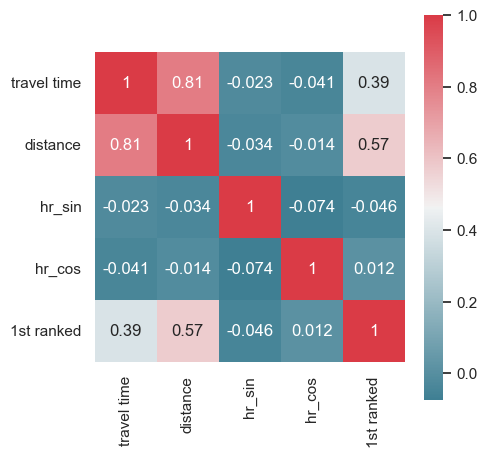

In [272]:
# run correlation matrix and plot
f, ax = plt.subplots(figsize=(5,5))
corr = df2.corr()
sns.heatmap(corr, annot=True, mask=np.zeros_like(corr,dtype=np.bool),
           cmap=sns.diverging_palette(220,10, as_cmap=True),
           square=True, ax=ax)

In [273]:
x = np.array(df2[['distance','hr_sin','hr_cos','1st ranked']])
y = np.array(df2['travel time'])
x

array([[ 5.42629615e-01, -8.66025404e-01, -5.00000000e-01,
         8.74519218e+02],
       [ 5.31770676e-01, -5.00000000e-01,  8.66025404e-01,
         8.74519218e+02],
       [ 2.96433144e-01,  1.00000000e+00,  6.12323400e-17,
         8.74519218e+02],
       ...,
       [ 3.84812390e-01, -7.07106781e-01, -7.07106781e-01,
         8.74519218e+02],
       [ 6.79393237e-01, -1.00000000e+00, -1.83697020e-16,
         8.74519218e+02],
       [ 1.88720986e-01, -9.65925826e-01,  2.58819045e-01,
         8.74519218e+02]])

In [274]:
#split data into test & train
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [275]:
print(X_train.shape)
print(X_test.shape)
# X_train

(6537, 4)
(1635, 4)


In [276]:
# inputs: distance + hour + dominant road
model3_3_1 = nnmodel(50, num_hlayers=1,Epoch=500)
model3_3_1

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 242003.8125 - mape: 49.6796 - rmse: 491.9388 - val_loss: 145465.5469 - val_mape: 49.4940 - val_rmse: 381.3994
Epoch 2/500
205/205 [==============================] - 0s 765us/step - loss: 144279.8906 - mape: 48.8794 - rmse: 379.8419 - val_loss: 145467.2188 - val_mape: 48.4285 - val_rmse: 381.4016
Epoch 3/500
205/205 [==============================] - 0s 761us/step - loss: 144155.7812 - mape: 48.9136 - rmse: 379.6785 - val_loss: 145353.6562 - val_mape: 49.6049 - val_rmse: 381.2527
Epoch 4/500
205/205 [==============================] - 0s 756us/step - loss: 144162.9531 - mape: 48.8614 - rmse: 379.6880 - val_loss: 145274.9688 - val_mape: 48.6948 - val_rmse: 381.1495
Epoch 5/500
205/205 [==============================] - 0s 770us/step - loss: 144072.7031 - mape: 48.6039 - rmse: 379.5691 - val_loss: 145781.4062 - val_mape: 51.2602 - val_rmse: 381.8133
Epoch 6/500
205/205 [==============================] - 0s 776us/ste

Epoch 45/500
205/205 [==============================] - 0s 745us/step - loss: 136145.8281 - mape: 47.1548 - rmse: 368.9794 - val_loss: 137158.1562 - val_mape: 48.0844 - val_rmse: 370.3487
Epoch 46/500
205/205 [==============================] - 0s 750us/step - loss: 136011.2656 - mape: 47.2026 - rmse: 368.7971 - val_loss: 136739.4375 - val_mape: 46.8269 - val_rmse: 369.7830
Epoch 47/500
205/205 [==============================] - 0s 775us/step - loss: 135631.2188 - mape: 46.9061 - rmse: 368.2814 - val_loss: 136288.1094 - val_mape: 47.2123 - val_rmse: 369.1722
Epoch 48/500
205/205 [==============================] - 0s 779us/step - loss: 135081.0156 - mape: 46.9768 - rmse: 367.5337 - val_loss: 136438.4688 - val_mape: 45.3143 - val_rmse: 369.3758
Epoch 49/500
205/205 [==============================] - 0s 740us/step - loss: 134235.2344 - mape: 46.8338 - rmse: 366.3813 - val_loss: 135791.5000 - val_mape: 48.7379 - val_rmse: 368.4990
Epoch 50/500
205/205 [==============================] - 0s 7

Epoch 132/500
205/205 [==============================] - 0s 735us/step - loss: 76737.2656 - mape: 31.0222 - rmse: 277.0149 - val_loss: 78069.2344 - val_mape: 30.8834 - val_rmse: 279.4087
Epoch 133/500
205/205 [==============================] - 0s 738us/step - loss: 76364.1562 - mape: 30.8662 - rmse: 276.3407 - val_loss: 78469.3047 - val_mape: 28.7048 - val_rmse: 280.1237
Epoch 134/500
205/205 [==============================] - 0s 740us/step - loss: 75464.1094 - mape: 30.5442 - rmse: 274.7073 - val_loss: 78622.4844 - val_mape: 34.0313 - val_rmse: 280.3970
Epoch 135/500
205/205 [==============================] - 0s 740us/step - loss: 74989.6406 - mape: 30.5200 - rmse: 273.8424 - val_loss: 76716.3359 - val_mape: 31.7357 - val_rmse: 276.9771
Epoch 136/500
205/205 [==============================] - 0s 742us/step - loss: 74734.5625 - mape: 30.1586 - rmse: 273.3762 - val_loss: 76713.7969 - val_mape: 32.4857 - val_rmse: 276.9726
Epoch 137/500
205/205 [==============================] - 0s 741us

Epoch 176/500
205/205 [==============================] - 0s 750us/step - loss: 63225.2656 - mape: 24.8131 - rmse: 251.4464 - val_loss: 65136.0977 - val_mape: 24.1506 - val_rmse: 255.2177
Epoch 177/500
205/205 [==============================] - 0s 750us/step - loss: 62785.2930 - mape: 24.6478 - rmse: 250.5699 - val_loss: 65057.9375 - val_mape: 24.9832 - val_rmse: 255.0646
Epoch 178/500
205/205 [==============================] - 0s 761us/step - loss: 62722.6523 - mape: 24.5405 - rmse: 250.4449 - val_loss: 66722.5312 - val_mape: 22.1058 - val_rmse: 258.3070
Epoch 179/500
205/205 [==============================] - 0s 749us/step - loss: 62626.1680 - mape: 24.4966 - rmse: 250.2522 - val_loss: 65155.8125 - val_mape: 23.1798 - val_rmse: 255.2564
Epoch 180/500
205/205 [==============================] - 0s 746us/step - loss: 62399.3047 - mape: 24.4380 - rmse: 249.7985 - val_loss: 65046.6445 - val_mape: 25.5992 - val_rmse: 255.0424
Epoch 181/500
205/205 [==============================] - 0s 740us

Epoch 220/500
205/205 [==============================] - 0s 753us/step - loss: 61098.5898 - mape: 23.6718 - rmse: 247.1813 - val_loss: 63155.3906 - val_mape: 24.3536 - val_rmse: 251.3074
Epoch 221/500
205/205 [==============================] - 0s 740us/step - loss: 60573.2500 - mape: 23.5742 - rmse: 246.1163 - val_loss: 64302.3164 - val_mape: 26.2320 - val_rmse: 253.5790
Epoch 222/500
205/205 [==============================] - 0s 747us/step - loss: 60272.4297 - mape: 23.3419 - rmse: 245.5044 - val_loss: 65021.7578 - val_mape: 27.0574 - val_rmse: 254.9936
Epoch 223/500
205/205 [==============================] - 0s 745us/step - loss: 60914.3906 - mape: 23.6774 - rmse: 246.8084 - val_loss: 62881.7656 - val_mape: 22.7153 - val_rmse: 250.7624
Epoch 224/500
205/205 [==============================] - 0s 745us/step - loss: 60428.3711 - mape: 23.4209 - rmse: 245.8218 - val_loss: 63538.8633 - val_mape: 25.2620 - val_rmse: 252.0692
Epoch 225/500
205/205 [==============================] - 0s 755us

Epoch 264/500
205/205 [==============================] - 0s 735us/step - loss: 59561.2227 - mape: 23.4225 - rmse: 244.0517 - val_loss: 63339.6680 - val_mape: 21.2072 - val_rmse: 251.6737
Epoch 265/500
205/205 [==============================] - 0s 756us/step - loss: 59553.8164 - mape: 23.5292 - rmse: 244.0365 - val_loss: 62479.1406 - val_mape: 22.0438 - val_rmse: 249.9583
Epoch 266/500
205/205 [==============================] - 0s 741us/step - loss: 60351.5977 - mape: 23.7857 - rmse: 245.6656 - val_loss: 62166.0117 - val_mape: 22.8731 - val_rmse: 249.3311
Epoch 267/500
205/205 [==============================] - 0s 745us/step - loss: 59574.0547 - mape: 23.4732 - rmse: 244.0780 - val_loss: 63588.2734 - val_mape: 26.3472 - val_rmse: 252.1672
Epoch 268/500
205/205 [==============================] - 0s 743us/step - loss: 59643.7461 - mape: 23.5395 - rmse: 244.2207 - val_loss: 62354.6797 - val_mape: 24.3482 - val_rmse: 249.7092
Epoch 269/500
205/205 [==============================] - 0s 753us

Epoch 308/500
205/205 [==============================] - 0s 745us/step - loss: 59399.3320 - mape: 23.7308 - rmse: 243.7198 - val_loss: 61867.8594 - val_mape: 23.2984 - val_rmse: 248.7325
Epoch 309/500
205/205 [==============================] - 0s 745us/step - loss: 59393.0586 - mape: 23.6958 - rmse: 243.7069 - val_loss: 61865.1445 - val_mape: 23.5539 - val_rmse: 248.7271
Epoch 310/500
205/205 [==============================] - 0s 734us/step - loss: 59623.9531 - mape: 23.9879 - rmse: 244.1802 - val_loss: 63267.5273 - val_mape: 26.5508 - val_rmse: 251.5304
Epoch 311/500
205/205 [==============================] - 0s 736us/step - loss: 59582.2773 - mape: 23.7979 - rmse: 244.0948 - val_loss: 61855.5977 - val_mape: 23.3345 - val_rmse: 248.7079
Epoch 312/500
205/205 [==============================] - 0s 737us/step - loss: 58932.3359 - mape: 23.5734 - rmse: 242.7598 - val_loss: 62033.2578 - val_mape: 24.4540 - val_rmse: 249.0648
Epoch 313/500
205/205 [==============================] - 0s 736us

Epoch 352/500
205/205 [==============================] - 0s 740us/step - loss: 59753.8789 - mape: 24.1385 - rmse: 244.4461 - val_loss: 61746.6484 - val_mape: 23.6765 - val_rmse: 248.4887
Epoch 353/500
205/205 [==============================] - 0s 745us/step - loss: 59384.8516 - mape: 24.0538 - rmse: 243.6901 - val_loss: 61765.4102 - val_mape: 23.9471 - val_rmse: 248.5265
Epoch 354/500
205/205 [==============================] - 0s 750us/step - loss: 59271.9219 - mape: 23.9390 - rmse: 243.4583 - val_loss: 61744.0117 - val_mape: 23.7100 - val_rmse: 248.4834
Epoch 355/500
205/205 [==============================] - 0s 762us/step - loss: 59189.6953 - mape: 23.9614 - rmse: 243.2893 - val_loss: 62695.4805 - val_mape: 21.7083 - val_rmse: 250.3907
Epoch 356/500
205/205 [==============================] - 0s 742us/step - loss: 59022.4609 - mape: 23.8425 - rmse: 242.9454 - val_loss: 65784.9297 - val_mape: 20.6412 - val_rmse: 256.4857
Epoch 357/500
205/205 [==============================] - 0s 740us

Epoch 396/500
205/205 [==============================] - 0s 733us/step - loss: 59065.7812 - mape: 24.0853 - rmse: 243.0345 - val_loss: 65621.6953 - val_mape: 29.4269 - val_rmse: 256.1673
Epoch 397/500
205/205 [==============================] - 0s 748us/step - loss: 59134.6992 - mape: 24.1317 - rmse: 243.1763 - val_loss: 62113.4883 - val_mape: 22.4206 - val_rmse: 249.2258
Epoch 398/500
205/205 [==============================] - 0s 740us/step - loss: 58814.4023 - mape: 23.9686 - rmse: 242.5168 - val_loss: 63683.1172 - val_mape: 27.5911 - val_rmse: 252.3551
Epoch 399/500
205/205 [==============================] - 0s 750us/step - loss: 60100.2656 - mape: 24.2339 - rmse: 245.1535 - val_loss: 68006.5781 - val_mape: 31.2671 - val_rmse: 260.7807
Epoch 400/500
205/205 [==============================] - 0s 741us/step - loss: 59490.7617 - mape: 24.3508 - rmse: 243.9073 - val_loss: 61933.9062 - val_mape: 24.9649 - val_rmse: 248.8652
Epoch 401/500
205/205 [==============================] - 0s 743us

Epoch 440/500
205/205 [==============================] - 0s 741us/step - loss: 59600.2969 - mape: 24.3472 - rmse: 244.1317 - val_loss: 62294.3281 - val_mape: 22.2600 - val_rmse: 249.5883
Epoch 441/500
205/205 [==============================] - 0s 735us/step - loss: 59471.9727 - mape: 24.3032 - rmse: 243.8688 - val_loss: 64797.0117 - val_mape: 21.0129 - val_rmse: 254.5526
Epoch 442/500
205/205 [==============================] - 0s 749us/step - loss: 58866.2695 - mape: 23.9929 - rmse: 242.6237 - val_loss: 62765.7500 - val_mape: 26.5741 - val_rmse: 250.5309
Epoch 443/500
205/205 [==============================] - 0s 740us/step - loss: 59449.9883 - mape: 24.2420 - rmse: 243.8237 - val_loss: 62539.3359 - val_mape: 26.2424 - val_rmse: 250.0787
Epoch 444/500
205/205 [==============================] - 0s 794us/step - loss: 58776.2539 - mape: 24.1441 - rmse: 242.4381 - val_loss: 62903.3203 - val_mape: 26.7614 - val_rmse: 250.8053
Epoch 445/500
205/205 [==============================] - 0s 799us

Epoch 484/500
205/205 [==============================] - 0s 749us/step - loss: 59031.7422 - mape: 24.2752 - rmse: 242.9645 - val_loss: 63090.2891 - val_mape: 21.6786 - val_rmse: 251.1778
Epoch 485/500
205/205 [==============================] - 0s 740us/step - loss: 59564.5859 - mape: 24.5450 - rmse: 244.0586 - val_loss: 61717.8438 - val_mape: 23.4510 - val_rmse: 248.4308
Epoch 486/500
205/205 [==============================] - 0s 744us/step - loss: 59329.7383 - mape: 24.3197 - rmse: 243.5770 - val_loss: 61711.1914 - val_mape: 24.3734 - val_rmse: 248.4174
Epoch 487/500
205/205 [==============================] - 0s 754us/step - loss: 59234.7500 - mape: 24.4280 - rmse: 243.3819 - val_loss: 63480.2383 - val_mape: 21.4911 - val_rmse: 251.9529
Epoch 488/500
205/205 [==============================] - 0s 767us/step - loss: 59357.3555 - mape: 24.2806 - rmse: 243.6337 - val_loss: 62008.4648 - val_mape: 25.3419 - val_rmse: 249.0150
Epoch 489/500
205/205 [==============================] - 0s 739us

In [278]:
# inputs: distance + hour + dominant road
model3_3_2 = nnmodel(100, num_hlayers=1,Epoch=500)
model3_3_2

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 298259.9688 - mape: 54.5650 - rmse: 546.1318 - val_loss: 145408.2344 - val_mape: 48.9794 - val_rmse: 381.3243
Epoch 2/500
205/205 [==============================] - 0s 792us/step - loss: 144251.6562 - mape: 48.7448 - rmse: 379.8047 - val_loss: 145445.2500 - val_mape: 49.9928 - val_rmse: 381.3729
Epoch 3/500
205/205 [==============================] - 0s 791us/step - loss: 144118.1094 - mape: 49.1372 - rmse: 379.6289 - val_loss: 145318.6875 - val_mape: 48.5431 - val_rmse: 381.2069
Epoch 4/500
205/205 [==============================] - 0s 774us/step - loss: 144071.5156 - mape: 48.6588 - rmse: 379.5675 - val_loss: 145186.7812 - val_mape: 49.1056 - val_rmse: 381.0338
Epoch 5/500
205/205 [==============================] - 0s 774us/step - loss: 144002.7344 - mape: 48.7191 - rmse: 379.4769 - val_loss: 145104.4688 - val_mape: 49.2944 - val_rmse: 380.9258
Epoch 6/500
205/205 [==============================] - 0s 780us/ste

Epoch 45/500
205/205 [==============================] - 0s 778us/step - loss: 129412.5625 - mape: 45.7042 - rmse: 359.7396 - val_loss: 131003.1875 - val_mape: 43.4790 - val_rmse: 361.9436
Epoch 46/500
205/205 [==============================] - 0s 787us/step - loss: 128777.2500 - mape: 45.4930 - rmse: 358.8555 - val_loss: 129124.2891 - val_mape: 46.0724 - val_rmse: 359.3387
Epoch 47/500
205/205 [==============================] - 0s 773us/step - loss: 128587.1641 - mape: 45.4442 - rmse: 358.5905 - val_loss: 128529.1250 - val_mape: 47.0730 - val_rmse: 358.5096
Epoch 48/500
205/205 [==============================] - 0s 770us/step - loss: 126682.6953 - mape: 44.9730 - rmse: 355.9251 - val_loss: 130980.5469 - val_mape: 50.8661 - val_rmse: 361.9124
Epoch 49/500
205/205 [==============================] - 0s 765us/step - loss: 126049.3359 - mape: 44.9103 - rmse: 355.0343 - val_loss: 126300.0469 - val_mape: 44.1694 - val_rmse: 355.3872
Epoch 50/500
205/205 [==============================] - 0s 7

Epoch 89/500
205/205 [==============================] - 0s 772us/step - loss: 78925.1953 - mape: 31.8352 - rmse: 280.9363 - val_loss: 79533.9062 - val_mape: 31.0292 - val_rmse: 282.0176
Epoch 90/500
205/205 [==============================] - 0s 771us/step - loss: 78444.4844 - mape: 31.4445 - rmse: 280.0794 - val_loss: 79256.9141 - val_mape: 33.1832 - val_rmse: 281.5260
Epoch 91/500
205/205 [==============================] - 0s 775us/step - loss: 77307.7891 - mape: 31.3296 - rmse: 278.0428 - val_loss: 85310.6406 - val_mape: 26.2899 - val_rmse: 292.0799
Epoch 92/500
205/205 [==============================] - 0s 776us/step - loss: 76573.0859 - mape: 30.7549 - rmse: 276.7184 - val_loss: 80482.8203 - val_mape: 35.7284 - val_rmse: 283.6949
Epoch 93/500
205/205 [==============================] - 0s 773us/step - loss: 75914.8750 - mape: 30.6994 - rmse: 275.5266 - val_loss: 79715.7500 - val_mape: 35.3968 - val_rmse: 282.3398
Epoch 94/500
205/205 [==============================] - 0s 765us/step 

Epoch 133/500
205/205 [==============================] - 0s 776us/step - loss: 62226.4141 - mape: 24.1112 - rmse: 249.4522 - val_loss: 65255.6484 - val_mape: 26.4783 - val_rmse: 255.4519
Epoch 134/500
205/205 [==============================] - 0s 770us/step - loss: 62704.3516 - mape: 24.4047 - rmse: 250.4084 - val_loss: 64612.7578 - val_mape: 22.3368 - val_rmse: 254.1904
Epoch 135/500
205/205 [==============================] - 0s 771us/step - loss: 62055.3438 - mape: 24.0705 - rmse: 249.1091 - val_loss: 65159.8867 - val_mape: 21.8054 - val_rmse: 255.2643
Epoch 136/500
205/205 [==============================] - 0s 767us/step - loss: 62246.3672 - mape: 24.1147 - rmse: 249.4922 - val_loss: 64692.3164 - val_mape: 22.0420 - val_rmse: 254.3468
Epoch 137/500
205/205 [==============================] - 0s 784us/step - loss: 61471.1367 - mape: 23.8644 - rmse: 247.9337 - val_loss: 63991.2695 - val_mape: 22.8150 - val_rmse: 252.9650
Epoch 138/500
205/205 [==============================] - 0s 763us

Epoch 177/500
205/205 [==============================] - 0s 762us/step - loss: 60275.5352 - mape: 23.5001 - rmse: 245.5108 - val_loss: 63035.3555 - val_mape: 21.6276 - val_rmse: 251.0684
Epoch 178/500
205/205 [==============================] - 0s 768us/step - loss: 60740.1953 - mape: 23.6824 - rmse: 246.4553 - val_loss: 64546.1133 - val_mape: 20.7405 - val_rmse: 254.0593
Epoch 179/500
205/205 [==============================] - 0s 773us/step - loss: 60105.3711 - mape: 23.5504 - rmse: 245.1640 - val_loss: 63398.8320 - val_mape: 21.2926 - val_rmse: 251.7912
Epoch 180/500
205/205 [==============================] - 0s 763us/step - loss: 60119.6133 - mape: 23.5101 - rmse: 245.1930 - val_loss: 63259.8789 - val_mape: 25.6049 - val_rmse: 251.5152
Epoch 181/500
205/205 [==============================] - 0s 767us/step - loss: 59897.7422 - mape: 23.4707 - rmse: 244.7402 - val_loss: 62314.0703 - val_mape: 23.2553 - val_rmse: 249.6279
Epoch 182/500
205/205 [==============================] - 0s 775us

Epoch 221/500
205/205 [==============================] - 0s 780us/step - loss: 59052.7070 - mape: 23.4508 - rmse: 243.0076 - val_loss: 69937.1406 - val_mape: 32.0554 - val_rmse: 264.4563
Epoch 222/500
205/205 [==============================] - 0s 765us/step - loss: 61041.7188 - mape: 24.5809 - rmse: 247.0662 - val_loss: 61919.4648 - val_mape: 22.9233 - val_rmse: 248.8362
Epoch 223/500
205/205 [==============================] - 0s 793us/step - loss: 60191.8320 - mape: 23.9131 - rmse: 245.3402 - val_loss: 62635.7227 - val_mape: 25.6747 - val_rmse: 250.2713
Epoch 224/500
205/205 [==============================] - 0s 819us/step - loss: 59350.0977 - mape: 23.7021 - rmse: 243.6188 - val_loss: 62624.2266 - val_mape: 21.7094 - val_rmse: 250.2483
Epoch 225/500
205/205 [==============================] - 0s 830us/step - loss: 60092.8438 - mape: 24.1576 - rmse: 245.1384 - val_loss: 62702.2031 - val_mape: 21.6454 - val_rmse: 250.4041
Epoch 226/500
205/205 [==============================] - 0s 765us

Epoch 265/500
205/205 [==============================] - 0s 779us/step - loss: 59319.8945 - mape: 24.1090 - rmse: 243.5568 - val_loss: 62140.3203 - val_mape: 22.3306 - val_rmse: 249.2796
Epoch 266/500
205/205 [==============================] - 0s 769us/step - loss: 59815.7188 - mape: 24.0961 - rmse: 244.5725 - val_loss: 62261.4023 - val_mape: 22.1721 - val_rmse: 249.5224
Epoch 267/500
205/205 [==============================] - 0s 769us/step - loss: 59310.2539 - mape: 24.0942 - rmse: 243.5370 - val_loss: 64074.6211 - val_mape: 21.0549 - val_rmse: 253.1297
Epoch 268/500
205/205 [==============================] - 0s 766us/step - loss: 59835.1523 - mape: 24.2893 - rmse: 244.6122 - val_loss: 61929.2539 - val_mape: 24.8050 - val_rmse: 248.8559
Epoch 269/500
205/205 [==============================] - 0s 776us/step - loss: 59820.3672 - mape: 24.2729 - rmse: 244.5820 - val_loss: 64125.0000 - val_mape: 21.0459 - val_rmse: 253.2291
Epoch 270/500
205/205 [==============================] - 0s 771us

Epoch 309/500
205/205 [==============================] - 0s 764us/step - loss: 59890.6250 - mape: 24.5390 - rmse: 244.7256 - val_loss: 63349.1562 - val_mape: 21.4598 - val_rmse: 251.6926
Epoch 310/500
205/205 [==============================] - 0s 834us/step - loss: 59200.3672 - mape: 24.1772 - rmse: 243.3112 - val_loss: 61856.4766 - val_mape: 22.9253 - val_rmse: 248.7096
Epoch 311/500
205/205 [==============================] - 0s 840us/step - loss: 59679.0859 - mape: 24.1341 - rmse: 244.2930 - val_loss: 62756.0742 - val_mape: 26.5534 - val_rmse: 250.5116
Epoch 312/500
205/205 [==============================] - 0s 812us/step - loss: 60037.7188 - mape: 24.6735 - rmse: 245.0260 - val_loss: 61915.0547 - val_mape: 22.8008 - val_rmse: 248.8274
Epoch 313/500
205/205 [==============================] - 0s 771us/step - loss: 59752.4492 - mape: 24.3196 - rmse: 244.4431 - val_loss: 62455.3281 - val_mape: 22.0780 - val_rmse: 249.9106
Epoch 314/500
205/205 [==============================] - 0s 773us

Epoch 353/500
205/205 [==============================] - 0s 766us/step - loss: 59689.9922 - mape: 24.3571 - rmse: 244.3154 - val_loss: 61870.2344 - val_mape: 25.0235 - val_rmse: 248.7373
Epoch 354/500
205/205 [==============================] - 0s 766us/step - loss: 59035.2852 - mape: 24.1405 - rmse: 242.9718 - val_loss: 63738.1328 - val_mape: 21.3736 - val_rmse: 252.4641
Epoch 355/500
205/205 [==============================] - 0s 774us/step - loss: 59575.7695 - mape: 24.3638 - rmse: 244.0815 - val_loss: 64995.8281 - val_mape: 29.0895 - val_rmse: 254.9428
Epoch 356/500
205/205 [==============================] - 0s 776us/step - loss: 59020.2461 - mape: 24.1870 - rmse: 242.9408 - val_loss: 61757.8555 - val_mape: 23.2622 - val_rmse: 248.5113
Epoch 357/500
205/205 [==============================] - 0s 761us/step - loss: 58722.7266 - mape: 24.1220 - rmse: 242.3277 - val_loss: 64316.1055 - val_mape: 21.1841 - val_rmse: 253.6062
Epoch 358/500
205/205 [==============================] - 0s 764us

Epoch 397/500
205/205 [==============================] - 0s 862us/step - loss: 59552.9648 - mape: 24.3203 - rmse: 244.0348 - val_loss: 62716.0273 - val_mape: 26.6500 - val_rmse: 250.4317
Epoch 398/500
205/205 [==============================] - 0s 863us/step - loss: 59476.5078 - mape: 24.2991 - rmse: 243.8781 - val_loss: 62393.2734 - val_mape: 22.2381 - val_rmse: 249.7865
Epoch 399/500
205/205 [==============================] - 0s 862us/step - loss: 59109.0273 - mape: 24.3684 - rmse: 243.1235 - val_loss: 62254.8789 - val_mape: 25.9162 - val_rmse: 249.5093
Epoch 400/500
205/205 [==============================] - 0s 897us/step - loss: 59290.3711 - mape: 24.1798 - rmse: 243.4961 - val_loss: 61661.6602 - val_mape: 24.0248 - val_rmse: 248.3177
Epoch 401/500
205/205 [==============================] - 0s 919us/step - loss: 59218.8125 - mape: 24.1759 - rmse: 243.3492 - val_loss: 61836.1641 - val_mape: 24.9780 - val_rmse: 248.6688
Epoch 402/500
205/205 [==============================] - 0s 901us

Epoch 441/500
205/205 [==============================] - 0s 769us/step - loss: 60132.8320 - mape: 24.4979 - rmse: 245.2200 - val_loss: 62210.7695 - val_mape: 22.4776 - val_rmse: 249.4209
Epoch 442/500
205/205 [==============================] - 0s 764us/step - loss: 58951.5234 - mape: 24.3096 - rmse: 242.7993 - val_loss: 64398.9883 - val_mape: 21.2333 - val_rmse: 253.7696
Epoch 443/500
205/205 [==============================] - 0s 758us/step - loss: 59367.6797 - mape: 24.2847 - rmse: 243.6548 - val_loss: 62268.5273 - val_mape: 22.4082 - val_rmse: 249.5366
Epoch 444/500
205/205 [==============================] - 0s 756us/step - loss: 58985.9844 - mape: 24.3110 - rmse: 242.8703 - val_loss: 61996.4375 - val_mape: 25.4332 - val_rmse: 248.9908
Epoch 445/500
205/205 [==============================] - 0s 769us/step - loss: 59296.4219 - mape: 24.2918 - rmse: 243.5086 - val_loss: 62464.5664 - val_mape: 22.2106 - val_rmse: 249.9291
Epoch 446/500
205/205 [==============================] - 0s 769us

Epoch 485/500
205/205 [==============================] - 0s 762us/step - loss: 59590.7852 - mape: 24.4964 - rmse: 244.1122 - val_loss: 62974.3320 - val_mape: 21.8294 - val_rmse: 250.9469
Epoch 486/500
205/205 [==============================] - 0s 773us/step - loss: 59470.6758 - mape: 24.5480 - rmse: 243.8661 - val_loss: 72302.3281 - val_mape: 20.9597 - val_rmse: 268.8909
Epoch 487/500
205/205 [==============================] - 0s 768us/step - loss: 59509.4766 - mape: 24.4565 - rmse: 243.9456 - val_loss: 64111.9844 - val_mape: 21.3283 - val_rmse: 253.2034
Epoch 488/500
205/205 [==============================] - 0s 759us/step - loss: 59128.2617 - mape: 24.3675 - rmse: 243.1630 - val_loss: 61978.7930 - val_mape: 22.8174 - val_rmse: 248.9554
Epoch 489/500
205/205 [==============================] - 0s 756us/step - loss: 59883.2539 - mape: 24.4940 - rmse: 244.7106 - val_loss: 61662.6367 - val_mape: 24.1489 - val_rmse: 248.3196
Epoch 490/500
205/205 [==============================] - 0s 769us

In [279]:
# inputs: distance + hour + dominant road
model3_3_3 = nnmodel(300, num_hlayers=1,Epoch=500)
model3_3_3

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 164812.7031 - mape: 48.4295 - rmse: 405.9713 - val_loss: 145452.8125 - val_mape: 49.8988 - val_rmse: 381.3828
Epoch 2/500
205/205 [==============================] - 0s 801us/step - loss: 144507.0000 - mape: 48.8605 - rmse: 380.1408 - val_loss: 145237.0000 - val_mape: 49.5696 - val_rmse: 381.0997
Epoch 3/500
205/205 [==============================] - 0s 811us/step - loss: 144417.0938 - mape: 48.9719 - rmse: 380.0225 - val_loss: 145091.0781 - val_mape: 49.7412 - val_rmse: 380.9082
Epoch 4/500
205/205 [==============================] - 0s 801us/step - loss: 143862.8125 - mape: 48.6169 - rmse: 379.2925 - val_loss: 145082.3281 - val_mape: 50.3648 - val_rmse: 380.8967
Epoch 5/500
205/205 [==============================] - 0s 814us/step - loss: 143968.9219 - mape: 48.7655 - rmse: 379.4324 - val_loss: 145979.1094 - val_mape: 52.2356 - val_rmse: 382.0721
Epoch 6/500
205/205 [==============================] - 0s 800us/ste

Epoch 45/500
205/205 [==============================] - 0s 873us/step - loss: 92601.2422 - mape: 36.1005 - rmse: 304.3045 - val_loss: 93383.5391 - val_mape: 32.3324 - val_rmse: 305.5872
Epoch 46/500
205/205 [==============================] - 0s 855us/step - loss: 89786.5859 - mape: 35.2693 - rmse: 299.6441 - val_loss: 88799.8828 - val_mape: 34.8408 - val_rmse: 297.9931
Epoch 47/500
205/205 [==============================] - 0s 849us/step - loss: 86968.0234 - mape: 34.3576 - rmse: 294.9034 - val_loss: 86995.9062 - val_mape: 35.7434 - val_rmse: 294.9507
Epoch 48/500
205/205 [==============================] - 0s 859us/step - loss: 86290.3438 - mape: 33.9414 - rmse: 293.7522 - val_loss: 85930.3828 - val_mape: 30.6944 - val_rmse: 293.1389
Epoch 49/500
205/205 [==============================] - 0s 795us/step - loss: 83263.3906 - mape: 33.1922 - rmse: 288.5540 - val_loss: 92311.0156 - val_mape: 41.9926 - val_rmse: 303.8273
Epoch 50/500
205/205 [==============================] - 0s 846us/step 

205/205 [==============================] - 0s 798us/step - loss: 61789.0078 - mape: 23.6816 - rmse: 248.5739 - val_loss: 63823.5156 - val_mape: 21.5282 - val_rmse: 252.6332
Epoch 90/500
205/205 [==============================] - 0s 792us/step - loss: 61194.8125 - mape: 23.6154 - rmse: 247.3759 - val_loss: 67578.1016 - val_mape: 20.3445 - val_rmse: 259.9579
Epoch 91/500
205/205 [==============================] - 0s 797us/step - loss: 61883.8828 - mape: 23.9008 - rmse: 248.7647 - val_loss: 63033.0820 - val_mape: 23.6403 - val_rmse: 251.0639
Epoch 92/500
205/205 [==============================] - 0s 800us/step - loss: 61712.8828 - mape: 23.8119 - rmse: 248.4208 - val_loss: 62965.8438 - val_mape: 23.5717 - val_rmse: 250.9300
Epoch 93/500
205/205 [==============================] - 0s 803us/step - loss: 61359.6992 - mape: 23.6106 - rmse: 247.7089 - val_loss: 63066.2617 - val_mape: 22.1609 - val_rmse: 251.1300
Epoch 94/500
205/205 [==============================] - 0s 811us/step - loss: 60957

Epoch 133/500
205/205 [==============================] - 0s 789us/step - loss: 60500.4922 - mape: 24.1880 - rmse: 245.9685 - val_loss: 62094.9219 - val_mape: 24.5154 - val_rmse: 249.1885
Epoch 134/500
205/205 [==============================] - 0s 795us/step - loss: 59498.8789 - mape: 23.7924 - rmse: 243.9239 - val_loss: 63155.4023 - val_mape: 21.3699 - val_rmse: 251.3074
Epoch 135/500
205/205 [==============================] - 0s 806us/step - loss: 61009.9609 - mape: 24.2165 - rmse: 247.0019 - val_loss: 65092.3984 - val_mape: 20.7546 - val_rmse: 255.1321
Epoch 136/500
205/205 [==============================] - 0s 795us/step - loss: 60482.6836 - mape: 24.1293 - rmse: 245.9323 - val_loss: 64600.2109 - val_mape: 21.1383 - val_rmse: 254.1657
Epoch 137/500
205/205 [==============================] - 0s 810us/step - loss: 59570.6406 - mape: 24.1665 - rmse: 244.0710 - val_loss: 70410.2344 - val_mape: 20.4696 - val_rmse: 265.3493
Epoch 138/500
205/205 [==============================] - 0s 798us

Epoch 177/500
205/205 [==============================] - 0s 807us/step - loss: 59373.0664 - mape: 24.3154 - rmse: 243.6659 - val_loss: 63008.9922 - val_mape: 27.2197 - val_rmse: 251.0159
Epoch 178/500
205/205 [==============================] - 0s 795us/step - loss: 59445.1172 - mape: 24.4007 - rmse: 243.8137 - val_loss: 64448.3672 - val_mape: 21.0960 - val_rmse: 253.8668
Epoch 179/500
205/205 [==============================] - 0s 799us/step - loss: 60514.0312 - mape: 24.4571 - rmse: 245.9960 - val_loss: 62973.0625 - val_mape: 21.7927 - val_rmse: 250.9443
Epoch 180/500
205/205 [==============================] - 0s 799us/step - loss: 60103.6211 - mape: 24.5453 - rmse: 245.1604 - val_loss: 61613.2305 - val_mape: 23.8363 - val_rmse: 248.2201
Epoch 181/500
205/205 [==============================] - 0s 799us/step - loss: 60394.6914 - mape: 24.4848 - rmse: 245.7533 - val_loss: 62263.8281 - val_mape: 22.5486 - val_rmse: 249.5272
Epoch 182/500
205/205 [==============================] - 0s 806us

Epoch 221/500
205/205 [==============================] - 0s 844us/step - loss: 60292.0234 - mape: 24.7489 - rmse: 245.5443 - val_loss: 62096.6562 - val_mape: 22.4526 - val_rmse: 249.1920
Epoch 222/500
205/205 [==============================] - 0s 840us/step - loss: 60418.3242 - mape: 24.7037 - rmse: 245.8014 - val_loss: 61826.1836 - val_mape: 25.4702 - val_rmse: 248.6487
Epoch 223/500
205/205 [==============================] - 0s 870us/step - loss: 60583.3164 - mape: 25.0532 - rmse: 246.1368 - val_loss: 61692.7891 - val_mape: 23.9251 - val_rmse: 248.3803
Epoch 224/500
205/205 [==============================] - 0s 858us/step - loss: 59858.5547 - mape: 24.7009 - rmse: 244.6601 - val_loss: 63934.9219 - val_mape: 21.3936 - val_rmse: 252.8536
Epoch 225/500
205/205 [==============================] - 0s 871us/step - loss: 59696.3047 - mape: 24.6587 - rmse: 244.3283 - val_loss: 61793.9336 - val_mape: 23.1368 - val_rmse: 248.5839
Epoch 226/500
205/205 [==============================] - 0s 869us

Epoch 265/500
205/205 [==============================] - 0s 778us/step - loss: 59362.4531 - mape: 24.3710 - rmse: 243.6441 - val_loss: 61648.4062 - val_mape: 24.4403 - val_rmse: 248.2910
Epoch 266/500
205/205 [==============================] - 0s 791us/step - loss: 59259.8398 - mape: 24.3933 - rmse: 243.4334 - val_loss: 61700.1523 - val_mape: 23.4336 - val_rmse: 248.3952
Epoch 267/500
205/205 [==============================] - 0s 794us/step - loss: 60941.8984 - mape: 24.9527 - rmse: 246.8641 - val_loss: 64815.6133 - val_mape: 28.9483 - val_rmse: 254.5891
Epoch 268/500
205/205 [==============================] - 0s 788us/step - loss: 59801.2539 - mape: 24.5893 - rmse: 244.5430 - val_loss: 61788.9414 - val_mape: 23.1549 - val_rmse: 248.5738
Epoch 269/500
205/205 [==============================] - 0s 788us/step - loss: 61015.2539 - mape: 24.9128 - rmse: 247.0127 - val_loss: 61802.9453 - val_mape: 22.9315 - val_rmse: 248.6020
Epoch 270/500
205/205 [==============================] - 0s 799us

Epoch 309/500
205/205 [==============================] - 0s 781us/step - loss: 59891.0469 - mape: 24.7107 - rmse: 244.7265 - val_loss: 62470.2734 - val_mape: 22.5328 - val_rmse: 249.9405
Epoch 310/500
205/205 [==============================] - 0s 798us/step - loss: 59296.5586 - mape: 24.5371 - rmse: 243.5089 - val_loss: 62771.9453 - val_mape: 21.9027 - val_rmse: 250.5433
Epoch 311/500
205/205 [==============================] - 0s 788us/step - loss: 59333.3438 - mape: 24.3612 - rmse: 243.5844 - val_loss: 62209.3438 - val_mape: 22.5156 - val_rmse: 249.4180
Epoch 312/500
205/205 [==============================] - 0s 802us/step - loss: 59322.2500 - mape: 24.5336 - rmse: 243.5616 - val_loss: 68089.7109 - val_mape: 20.7417 - val_rmse: 260.9401
Epoch 313/500
205/205 [==============================] - 0s 785us/step - loss: 60434.1914 - mape: 24.7741 - rmse: 245.8337 - val_loss: 61890.7734 - val_mape: 23.1292 - val_rmse: 248.7786
Epoch 314/500
205/205 [==============================] - 0s 805us

Epoch 353/500
205/205 [==============================] - 0s 802us/step - loss: 61467.9453 - mape: 25.0991 - rmse: 247.9273 - val_loss: 62097.4258 - val_mape: 26.1682 - val_rmse: 249.1936
Epoch 354/500
205/205 [==============================] - 0s 805us/step - loss: 59601.6211 - mape: 24.7662 - rmse: 244.1344 - val_loss: 63062.8906 - val_mape: 21.9964 - val_rmse: 251.1233
Epoch 355/500
205/205 [==============================] - 0s 800us/step - loss: 59689.2383 - mape: 24.7088 - rmse: 244.3138 - val_loss: 62258.8633 - val_mape: 26.2997 - val_rmse: 249.5173
Epoch 356/500
205/205 [==============================] - 0s 793us/step - loss: 59194.1055 - mape: 24.3419 - rmse: 243.2984 - val_loss: 62435.7617 - val_mape: 22.1772 - val_rmse: 249.8715
Epoch 357/500
205/205 [==============================] - 0s 805us/step - loss: 59617.3125 - mape: 24.4480 - rmse: 244.1666 - val_loss: 61630.1914 - val_mape: 23.6737 - val_rmse: 248.2543
Epoch 358/500
205/205 [==============================] - 0s 795us

Epoch 397/500
205/205 [==============================] - 0s 804us/step - loss: 59432.3594 - mape: 24.5629 - rmse: 243.7875 - val_loss: 62985.7305 - val_mape: 27.2381 - val_rmse: 250.9696
Epoch 398/500
205/205 [==============================] - 0s 789us/step - loss: 60107.1445 - mape: 24.8309 - rmse: 245.1676 - val_loss: 63719.2969 - val_mape: 21.5223 - val_rmse: 252.4268
Epoch 399/500
205/205 [==============================] - 0s 791us/step - loss: 59475.3711 - mape: 24.7173 - rmse: 243.8757 - val_loss: 61559.4961 - val_mape: 23.9359 - val_rmse: 248.1119
Epoch 400/500
205/205 [==============================] - 0s 808us/step - loss: 59607.3750 - mape: 24.6717 - rmse: 244.1462 - val_loss: 62575.7930 - val_mape: 26.8009 - val_rmse: 250.1515
Epoch 401/500
205/205 [==============================] - 0s 797us/step - loss: 59653.2031 - mape: 24.7689 - rmse: 244.2401 - val_loss: 62494.9414 - val_mape: 22.0575 - val_rmse: 249.9899
Epoch 402/500
205/205 [==============================] - 0s 797us

Epoch 441/500
205/205 [==============================] - 0s 780us/step - loss: 59718.4336 - mape: 24.7810 - rmse: 244.3736 - val_loss: 62609.6289 - val_mape: 22.1143 - val_rmse: 250.2192
Epoch 442/500
205/205 [==============================] - 0s 798us/step - loss: 59532.6914 - mape: 24.5865 - rmse: 243.9932 - val_loss: 63279.4570 - val_mape: 27.8091 - val_rmse: 251.5541
Epoch 443/500
205/205 [==============================] - 0s 794us/step - loss: 60085.1367 - mape: 24.8094 - rmse: 245.1227 - val_loss: 61579.5586 - val_mape: 23.5636 - val_rmse: 248.1523
Epoch 444/500
205/205 [==============================] - 0s 798us/step - loss: 59217.9180 - mape: 24.4339 - rmse: 243.3473 - val_loss: 62413.5156 - val_mape: 22.3615 - val_rmse: 249.8270
Epoch 445/500
205/205 [==============================] - 0s 797us/step - loss: 59118.0234 - mape: 24.4756 - rmse: 243.1420 - val_loss: 61632.4102 - val_mape: 24.6076 - val_rmse: 248.2588
Epoch 446/500
205/205 [==============================] - 0s 802us

Epoch 485/500
205/205 [==============================] - 0s 790us/step - loss: 60122.3906 - mape: 24.5823 - rmse: 245.1987 - val_loss: 61717.4180 - val_mape: 24.6921 - val_rmse: 248.4299
Epoch 486/500
205/205 [==============================] - 0s 796us/step - loss: 59584.4414 - mape: 24.5114 - rmse: 244.0992 - val_loss: 62928.5820 - val_mape: 21.8423 - val_rmse: 250.8557
Epoch 487/500
205/205 [==============================] - 0s 800us/step - loss: 60052.3359 - mape: 24.7547 - rmse: 245.0558 - val_loss: 61813.6758 - val_mape: 25.1314 - val_rmse: 248.6236
Epoch 488/500
205/205 [==============================] - 0s 802us/step - loss: 59567.8008 - mape: 24.5125 - rmse: 244.0652 - val_loss: 61774.1758 - val_mape: 23.1547 - val_rmse: 248.5441
Epoch 489/500
205/205 [==============================] - 0s 808us/step - loss: 60779.4648 - mape: 25.0293 - rmse: 246.5349 - val_loss: 61863.6445 - val_mape: 25.2421 - val_rmse: 248.7240
Epoch 490/500
205/205 [==============================] - 0s 806us

In [280]:
# inputs: distance + hour + dominant road
model3_3_4 = nnmodel(100,50, num_hlayers=2,Epoch=500)
model3_3_4

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 199600.1562 - mape: 51.3525 - rmse: 446.7663 - val_loss: 145423.2969 - val_mape: 49.1758 - val_rmse: 381.3441
Epoch 2/500
205/205 [==============================] - 0s 904us/step - loss: 144352.2812 - mape: 48.8147 - rmse: 379.9372 - val_loss: 145410.0625 - val_mape: 49.9129 - val_rmse: 381.3267
Epoch 3/500
205/205 [==============================] - 0s 878us/step - loss: 144304.1875 - mape: 48.9471 - rmse: 379.8739 - val_loss: 145324.1094 - val_mape: 49.9843 - val_rmse: 381.2140
Epoch 4/500
205/205 [==============================] - 0s 903us/step - loss: 144718.1719 - mape: 48.7633 - rmse: 380.4184 - val_loss: 145412.0312 - val_mape: 47.6998 - val_rmse: 381.3293
Epoch 5/500
205/205 [==============================] - 0s 905us/step - loss: 144242.6719 - mape: 48.8108 - rmse: 379.7929 - val_loss: 145066.9531 - val_mape: 48.3902 - val_rmse: 380.8766
Epoch 6/500
205/205 [==============================] - 0s 837us/ste

Epoch 45/500
205/205 [==============================] - 0s 822us/step - loss: 67163.2422 - mape: 25.1375 - rmse: 259.1587 - val_loss: 79496.5312 - val_mape: 34.5685 - val_rmse: 281.9513
Epoch 46/500
205/205 [==============================] - 0s 813us/step - loss: 65113.9258 - mape: 24.5919 - rmse: 255.1743 - val_loss: 68349.9062 - val_mape: 21.4986 - val_rmse: 261.4381
Epoch 47/500
205/205 [==============================] - 0s 816us/step - loss: 65726.5859 - mape: 24.5432 - rmse: 256.3720 - val_loss: 65288.7500 - val_mape: 22.9878 - val_rmse: 255.5166
Epoch 48/500
205/205 [==============================] - 0s 826us/step - loss: 66236.4453 - mape: 24.7991 - rmse: 257.3644 - val_loss: 66724.5625 - val_mape: 21.6248 - val_rmse: 258.3110
Epoch 49/500
205/205 [==============================] - 0s 815us/step - loss: 64048.6484 - mape: 24.1029 - rmse: 253.0783 - val_loss: 65000.6992 - val_mape: 24.2519 - val_rmse: 254.9523
Epoch 50/500
205/205 [==============================] - 0s 815us/step 

205/205 [==============================] - 0s 883us/step - loss: 63909.0977 - mape: 25.1746 - rmse: 252.8025 - val_loss: 70691.3594 - val_mape: 32.9741 - val_rmse: 265.8785
Epoch 90/500
205/205 [==============================] - 0s 824us/step - loss: 61409.3867 - mape: 24.3574 - rmse: 247.8092 - val_loss: 72216.3906 - val_mape: 20.5421 - val_rmse: 268.7311
Epoch 91/500
205/205 [==============================] - 0s 816us/step - loss: 62268.6680 - mape: 24.5967 - rmse: 249.5369 - val_loss: 61825.1680 - val_mape: 24.1026 - val_rmse: 248.6467
Epoch 92/500
205/205 [==============================] - 0s 828us/step - loss: 60691.0703 - mape: 24.2034 - rmse: 246.3556 - val_loss: 65168.9727 - val_mape: 28.7138 - val_rmse: 255.2822
Epoch 93/500
205/205 [==============================] - 0s 821us/step - loss: 60826.2422 - mape: 24.2785 - rmse: 246.6298 - val_loss: 62737.5664 - val_mape: 25.7326 - val_rmse: 250.4747
Epoch 94/500
205/205 [==============================] - 0s 829us/step - loss: 61575

Epoch 133/500
205/205 [==============================] - 0s 815us/step - loss: 60502.7891 - mape: 24.6439 - rmse: 245.9731 - val_loss: 62552.8164 - val_mape: 21.7169 - val_rmse: 250.1056
Epoch 134/500
205/205 [==============================] - 0s 822us/step - loss: 61454.6172 - mape: 25.1246 - rmse: 247.9004 - val_loss: 64800.5781 - val_mape: 29.4174 - val_rmse: 254.5596
Epoch 135/500
205/205 [==============================] - 0s 825us/step - loss: 60485.3398 - mape: 24.9652 - rmse: 245.9377 - val_loss: 61892.5547 - val_mape: 22.2988 - val_rmse: 248.7822
Epoch 136/500
205/205 [==============================] - 0s 817us/step - loss: 59634.5391 - mape: 24.2138 - rmse: 244.2018 - val_loss: 64207.4180 - val_mape: 20.9653 - val_rmse: 253.3918
Epoch 137/500
205/205 [==============================] - 0s 817us/step - loss: 61712.4922 - mape: 25.2639 - rmse: 248.4200 - val_loss: 65514.6680 - val_mape: 21.0232 - val_rmse: 255.9583
Epoch 138/500
205/205 [==============================] - 0s 826us

Epoch 177/500
205/205 [==============================] - 0s 820us/step - loss: 61218.3047 - mape: 25.3324 - rmse: 247.4233 - val_loss: 65250.7891 - val_mape: 20.9337 - val_rmse: 255.4423
Epoch 178/500
205/205 [==============================] - 0s 829us/step - loss: 61918.5078 - mape: 25.3379 - rmse: 248.8343 - val_loss: 62222.8125 - val_mape: 22.3313 - val_rmse: 249.4450
Epoch 179/500
205/205 [==============================] - 0s 816us/step - loss: 60621.3984 - mape: 24.8742 - rmse: 246.2141 - val_loss: 61596.0312 - val_mape: 22.8703 - val_rmse: 248.1855
Epoch 180/500
205/205 [==============================] - 0s 852us/step - loss: 60274.0039 - mape: 24.8417 - rmse: 245.5076 - val_loss: 62240.0391 - val_mape: 22.4105 - val_rmse: 249.4795
Epoch 181/500
205/205 [==============================] - 0s 813us/step - loss: 60214.8203 - mape: 24.6416 - rmse: 245.3871 - val_loss: 61941.1836 - val_mape: 23.0816 - val_rmse: 248.8799
Epoch 182/500
205/205 [==============================] - 0s 816us

Epoch 221/500
205/205 [==============================] - 0s 815us/step - loss: 60586.2109 - mape: 24.9193 - rmse: 246.1427 - val_loss: 66084.3438 - val_mape: 20.8817 - val_rmse: 257.0688
Epoch 222/500
205/205 [==============================] - 0s 828us/step - loss: 59641.0078 - mape: 24.5160 - rmse: 244.2151 - val_loss: 68171.3750 - val_mape: 20.6936 - val_rmse: 261.0965
Epoch 223/500
205/205 [==============================] - 0s 823us/step - loss: 60685.2109 - mape: 25.0233 - rmse: 246.3437 - val_loss: 62784.8359 - val_mape: 27.0826 - val_rmse: 250.5690
Epoch 224/500
205/205 [==============================] - 0s 821us/step - loss: 59907.8711 - mape: 24.8671 - rmse: 244.7608 - val_loss: 64138.8281 - val_mape: 21.1730 - val_rmse: 253.2565
Epoch 225/500
205/205 [==============================] - 0s 809us/step - loss: 60825.0586 - mape: 25.2568 - rmse: 246.6274 - val_loss: 61615.3555 - val_mape: 22.6941 - val_rmse: 248.2244
Epoch 226/500
205/205 [==============================] - 0s 817us

Epoch 265/500
205/205 [==============================] - 0s 815us/step - loss: 60030.1016 - mape: 24.7070 - rmse: 245.0104 - val_loss: 64539.5898 - val_mape: 29.3199 - val_rmse: 254.0464
Epoch 266/500
205/205 [==============================] - 0s 824us/step - loss: 59732.8086 - mape: 24.4674 - rmse: 244.4030 - val_loss: 70789.6484 - val_mape: 34.0648 - val_rmse: 266.0632
Epoch 267/500
205/205 [==============================] - 0s 819us/step - loss: 59717.8320 - mape: 24.7288 - rmse: 244.3723 - val_loss: 62557.8672 - val_mape: 26.8973 - val_rmse: 250.1157
Epoch 268/500
205/205 [==============================] - 0s 828us/step - loss: 60142.7930 - mape: 24.7812 - rmse: 245.2403 - val_loss: 62079.5195 - val_mape: 26.5932 - val_rmse: 249.1576
Epoch 269/500
205/205 [==============================] - 0s 821us/step - loss: 60575.1484 - mape: 24.7936 - rmse: 246.1202 - val_loss: 62295.4336 - val_mape: 22.5578 - val_rmse: 249.5905
Epoch 270/500
205/205 [==============================] - 0s 815us

Epoch 309/500
205/205 [==============================] - 0s 822us/step - loss: 59343.3984 - mape: 24.2305 - rmse: 243.6050 - val_loss: 61734.9180 - val_mape: 22.6947 - val_rmse: 248.4651
Epoch 310/500
205/205 [==============================] - 0s 812us/step - loss: 60567.3359 - mape: 24.9813 - rmse: 246.1043 - val_loss: 71512.9375 - val_mape: 20.8094 - val_rmse: 267.4190
Epoch 311/500
205/205 [==============================] - 0s 860us/step - loss: 59571.2969 - mape: 24.5739 - rmse: 244.0723 - val_loss: 62262.0508 - val_mape: 21.9699 - val_rmse: 249.5237
Epoch 312/500
205/205 [==============================] - 0s 825us/step - loss: 60783.6016 - mape: 24.9204 - rmse: 246.5433 - val_loss: 61421.0547 - val_mape: 25.0368 - val_rmse: 247.8327
Epoch 313/500
205/205 [==============================] - 0s 820us/step - loss: 59382.5039 - mape: 24.6107 - rmse: 243.6853 - val_loss: 62430.0508 - val_mape: 21.7766 - val_rmse: 249.8601
Epoch 314/500
205/205 [==============================] - 0s 813us

Epoch 353/500
205/205 [==============================] - 0s 815us/step - loss: 60739.6406 - mape: 24.9772 - rmse: 246.4541 - val_loss: 61828.3516 - val_mape: 22.4888 - val_rmse: 248.6531
Epoch 354/500
205/205 [==============================] - 0s 819us/step - loss: 59827.3750 - mape: 24.6790 - rmse: 244.5963 - val_loss: 62380.7305 - val_mape: 21.8215 - val_rmse: 249.7614
Epoch 355/500
205/205 [==============================] - 0s 828us/step - loss: 59557.5547 - mape: 24.4371 - rmse: 244.0442 - val_loss: 66702.5625 - val_mape: 20.7917 - val_rmse: 258.2684
Epoch 356/500
205/205 [==============================] - 0s 803us/step - loss: 60421.9180 - mape: 24.7745 - rmse: 245.8087 - val_loss: 62153.3320 - val_mape: 26.7882 - val_rmse: 249.3057
Epoch 357/500
205/205 [==============================] - 0s 828us/step - loss: 59119.0234 - mape: 24.3340 - rmse: 243.1440 - val_loss: 61419.8945 - val_mape: 24.8763 - val_rmse: 247.8304
Epoch 358/500
205/205 [==============================] - 0s 808us

Epoch 397/500
205/205 [==============================] - 0s 823us/step - loss: 59894.5469 - mape: 24.7309 - rmse: 244.7336 - val_loss: 62461.3984 - val_mape: 27.0973 - val_rmse: 249.9228
Epoch 398/500
205/205 [==============================] - 0s 823us/step - loss: 59845.4492 - mape: 24.8248 - rmse: 244.6333 - val_loss: 61468.7305 - val_mape: 25.3803 - val_rmse: 247.9289
Epoch 399/500
205/205 [==============================] - 0s 825us/step - loss: 60139.4727 - mape: 24.8870 - rmse: 245.2335 - val_loss: 72923.3125 - val_mape: 20.9378 - val_rmse: 270.0432
Epoch 400/500
205/205 [==============================] - 0s 818us/step - loss: 59743.9688 - mape: 24.6684 - rmse: 244.4258 - val_loss: 66681.8047 - val_mape: 31.4763 - val_rmse: 258.2282
Epoch 401/500
205/205 [==============================] - 0s 809us/step - loss: 61022.3750 - mape: 25.3514 - rmse: 247.0271 - val_loss: 61344.8281 - val_mape: 25.1405 - val_rmse: 247.6789
Epoch 402/500
205/205 [==============================] - 0s 819us

Epoch 441/500
205/205 [==============================] - 0s 819us/step - loss: 60472.6680 - mape: 24.7803 - rmse: 245.9119 - val_loss: 62123.5703 - val_mape: 22.1414 - val_rmse: 249.2460
Epoch 442/500
205/205 [==============================] - 0s 824us/step - loss: 60439.9609 - mape: 24.6289 - rmse: 245.8454 - val_loss: 62735.1484 - val_mape: 21.8339 - val_rmse: 250.4698
Epoch 443/500
205/205 [==============================] - 0s 819us/step - loss: 60475.8047 - mape: 24.8371 - rmse: 245.9183 - val_loss: 63974.7266 - val_mape: 21.4138 - val_rmse: 252.9323
Epoch 444/500
205/205 [==============================] - 0s 823us/step - loss: 59702.4531 - mape: 24.6234 - rmse: 244.3409 - val_loss: 66153.5781 - val_mape: 20.8912 - val_rmse: 257.2034
Epoch 445/500
205/205 [==============================] - 0s 814us/step - loss: 59220.8984 - mape: 24.2855 - rmse: 243.3534 - val_loss: 61629.8633 - val_mape: 22.9327 - val_rmse: 248.2536
Epoch 446/500
205/205 [==============================] - 0s 810us

Epoch 485/500
205/205 [==============================] - 0s 818us/step - loss: 59881.1250 - mape: 24.8039 - rmse: 244.7062 - val_loss: 62893.4648 - val_mape: 21.7415 - val_rmse: 250.7857
Epoch 486/500
205/205 [==============================] - 0s 814us/step - loss: 60552.2578 - mape: 24.9657 - rmse: 246.0737 - val_loss: 63950.0312 - val_mape: 28.3623 - val_rmse: 252.8834
Epoch 487/500
205/205 [==============================] - 0s 808us/step - loss: 60082.1406 - mape: 24.7326 - rmse: 245.1166 - val_loss: 61411.1250 - val_mape: 24.8784 - val_rmse: 247.8127
Epoch 488/500
205/205 [==============================] - 0s 821us/step - loss: 59302.0352 - mape: 24.4223 - rmse: 243.5201 - val_loss: 61776.3477 - val_mape: 22.7841 - val_rmse: 248.5485
Epoch 489/500
205/205 [==============================] - 0s 826us/step - loss: 59466.1758 - mape: 24.6576 - rmse: 243.8569 - val_loss: 71237.5703 - val_mape: 20.9138 - val_rmse: 266.9037
Epoch 490/500
205/205 [==============================] - 0s 819us

In [281]:
# inputs: distance + hour + dominant road
model3_3_5 = nnmodel(200,100, num_hlayers=2,Epoch=500)
model3_3_5

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 167785.0938 - mape: 50.3832 - rmse: 409.6158 - val_loss: 145494.6875 - val_mape: 50.0161 - val_rmse: 381.4377
Epoch 2/500
205/205 [==============================] - 0s 913us/step - loss: 144425.3750 - mape: 49.0191 - rmse: 380.0334 - val_loss: 147480.8125 - val_mape: 45.4750 - val_rmse: 384.0323
Epoch 3/500
205/205 [==============================] - 0s 903us/step - loss: 145519.7344 - mape: 48.8457 - rmse: 381.4705 - val_loss: 146015.6719 - val_mape: 51.8372 - val_rmse: 382.1200
Epoch 4/500
205/205 [==============================] - 0s 901us/step - loss: 144814.6875 - mape: 48.6456 - rmse: 380.5453 - val_loss: 145816.1094 - val_mape: 51.7812 - val_rmse: 381.8588
Epoch 5/500
205/205 [==============================] - 0s 897us/step - loss: 144525.7812 - mape: 48.6986 - rmse: 380.1655 - val_loss: 152750.8594 - val_mape: 57.6526 - val_rmse: 390.8336
Epoch 6/500
205/205 [==============================] - 0s 904us/ste

Epoch 45/500
205/205 [==============================] - 0s 888us/step - loss: 62988.2383 - mape: 24.3320 - rmse: 250.9746 - val_loss: 71323.7266 - val_mape: 20.4439 - val_rmse: 267.0650
Epoch 46/500
205/205 [==============================] - 0s 889us/step - loss: 65364.9805 - mape: 25.1771 - rmse: 255.6658 - val_loss: 70545.0938 - val_mape: 31.4273 - val_rmse: 265.6033
Epoch 47/500
205/205 [==============================] - 0s 886us/step - loss: 64863.8633 - mape: 25.2185 - rmse: 254.6839 - val_loss: 63565.3867 - val_mape: 21.8057 - val_rmse: 252.1218
Epoch 48/500
205/205 [==============================] - 0s 892us/step - loss: 63343.5820 - mape: 24.4719 - rmse: 251.6815 - val_loss: 66315.6406 - val_mape: 28.4451 - val_rmse: 257.5182
Epoch 49/500
205/205 [==============================] - 0s 896us/step - loss: 63324.4062 - mape: 24.5678 - rmse: 251.6434 - val_loss: 63334.8438 - val_mape: 21.7218 - val_rmse: 251.6642
Epoch 50/500
205/205 [==============================] - 0s 884us/step 

205/205 [==============================] - 0s 893us/step - loss: 60448.9922 - mape: 24.4284 - rmse: 245.8638 - val_loss: 61988.0156 - val_mape: 25.5442 - val_rmse: 248.9739
Epoch 90/500
205/205 [==============================] - 0s 880us/step - loss: 62852.4648 - mape: 25.7486 - rmse: 250.7039 - val_loss: 70782.6250 - val_mape: 20.6568 - val_rmse: 266.0500
Epoch 91/500
205/205 [==============================] - 0s 883us/step - loss: 62921.7422 - mape: 25.6030 - rmse: 250.8421 - val_loss: 67637.2891 - val_mape: 31.6560 - val_rmse: 260.0717
Epoch 92/500
205/205 [==============================] - 0s 879us/step - loss: 61553.2266 - mape: 25.3690 - rmse: 248.0992 - val_loss: 62937.1250 - val_mape: 21.7760 - val_rmse: 250.8727
Epoch 93/500
205/205 [==============================] - 0s 891us/step - loss: 60127.3867 - mape: 24.3173 - rmse: 245.2089 - val_loss: 62386.9258 - val_mape: 26.2531 - val_rmse: 249.7737
Epoch 94/500
205/205 [==============================] - 0s 883us/step - loss: 63170

Epoch 133/500
205/205 [==============================] - 0s 881us/step - loss: 60903.6172 - mape: 25.1906 - rmse: 246.7866 - val_loss: 66682.6328 - val_mape: 30.7232 - val_rmse: 258.2298
Epoch 134/500
205/205 [==============================] - 0s 880us/step - loss: 61269.3828 - mape: 25.2959 - rmse: 247.5265 - val_loss: 71068.6094 - val_mape: 20.7987 - val_rmse: 266.5870
Epoch 135/500
205/205 [==============================] - 0s 878us/step - loss: 61147.8477 - mape: 25.3202 - rmse: 247.2809 - val_loss: 61700.9219 - val_mape: 25.4722 - val_rmse: 248.3967
Epoch 136/500
205/205 [==============================] - 0s 884us/step - loss: 59767.2773 - mape: 24.7204 - rmse: 244.4735 - val_loss: 66645.2188 - val_mape: 20.8502 - val_rmse: 258.1573
Epoch 137/500
205/205 [==============================] - 0s 880us/step - loss: 60975.8281 - mape: 25.3304 - rmse: 246.9328 - val_loss: 61761.6211 - val_mape: 25.6814 - val_rmse: 248.5189
Epoch 138/500
205/205 [==============================] - 0s 892us

Epoch 177/500
205/205 [==============================] - 0s 885us/step - loss: 61046.9062 - mape: 25.4420 - rmse: 247.0767 - val_loss: 62615.2500 - val_mape: 27.1311 - val_rmse: 250.2304
Epoch 178/500
205/205 [==============================] - 0s 884us/step - loss: 60353.8047 - mape: 24.9754 - rmse: 245.6701 - val_loss: 63196.1055 - val_mape: 21.8697 - val_rmse: 251.3884
Epoch 179/500
205/205 [==============================] - 0s 879us/step - loss: 60776.5273 - mape: 25.0008 - rmse: 246.5290 - val_loss: 62271.1484 - val_mape: 26.6416 - val_rmse: 249.5419
Epoch 180/500
205/205 [==============================] - 0s 887us/step - loss: 60495.1836 - mape: 24.9350 - rmse: 245.9577 - val_loss: 61406.5898 - val_mape: 23.9914 - val_rmse: 247.8035
Epoch 181/500
205/205 [==============================] - 0s 886us/step - loss: 60489.0938 - mape: 24.9238 - rmse: 245.9453 - val_loss: 61611.8789 - val_mape: 23.2248 - val_rmse: 248.2174
Epoch 182/500
205/205 [==============================] - 0s 883us

Epoch 221/500
205/205 [==============================] - 0s 884us/step - loss: 62356.9961 - mape: 25.6042 - rmse: 249.7138 - val_loss: 68243.5703 - val_mape: 21.1794 - val_rmse: 261.2347
Epoch 222/500
205/205 [==============================] - 0s 884us/step - loss: 60252.4297 - mape: 24.9907 - rmse: 245.4637 - val_loss: 62629.3594 - val_mape: 22.0261 - val_rmse: 250.2586
Epoch 223/500
205/205 [==============================] - 0s 876us/step - loss: 60047.3945 - mape: 24.7642 - rmse: 245.0457 - val_loss: 63051.2695 - val_mape: 21.8927 - val_rmse: 251.1001
Epoch 224/500
205/205 [==============================] - 0s 882us/step - loss: 60301.5781 - mape: 25.1454 - rmse: 245.5638 - val_loss: 61901.0430 - val_mape: 22.8744 - val_rmse: 248.7992
Epoch 225/500
205/205 [==============================] - 0s 879us/step - loss: 59633.2539 - mape: 24.8140 - rmse: 244.1992 - val_loss: 61317.0117 - val_mape: 24.1327 - val_rmse: 247.6227
Epoch 226/500
205/205 [==============================] - 0s 880us

Epoch 265/500
205/205 [==============================] - 0s 896us/step - loss: 60003.3398 - mape: 24.9245 - rmse: 244.9558 - val_loss: 63165.6133 - val_mape: 21.7458 - val_rmse: 251.3277
Epoch 266/500
205/205 [==============================] - 0s 891us/step - loss: 59607.1406 - mape: 24.7466 - rmse: 244.1457 - val_loss: 68349.6875 - val_mape: 32.1370 - val_rmse: 261.4377
Epoch 267/500
205/205 [==============================] - 0s 890us/step - loss: 59514.9688 - mape: 24.7507 - rmse: 243.9569 - val_loss: 61361.0703 - val_mape: 23.8649 - val_rmse: 247.7117
Epoch 268/500
205/205 [==============================] - 0s 882us/step - loss: 61747.2969 - mape: 25.5773 - rmse: 248.4900 - val_loss: 65365.2109 - val_mape: 21.6203 - val_rmse: 255.6662
Epoch 269/500
205/205 [==============================] - 0s 895us/step - loss: 60492.5312 - mape: 25.4160 - rmse: 245.9523 - val_loss: 62287.7812 - val_mape: 26.8209 - val_rmse: 249.5752
Epoch 270/500
205/205 [==============================] - 0s 899us

Epoch 309/500
205/205 [==============================] - 0s 896us/step - loss: 60889.7305 - mape: 25.0499 - rmse: 246.7584 - val_loss: 61503.5586 - val_mape: 23.5543 - val_rmse: 247.9991
Epoch 310/500
205/205 [==============================] - 0s 906us/step - loss: 61392.1289 - mape: 25.3781 - rmse: 247.7744 - val_loss: 68098.1406 - val_mape: 32.0582 - val_rmse: 260.9562
Epoch 311/500
205/205 [==============================] - 0s 890us/step - loss: 60529.4062 - mape: 25.0224 - rmse: 246.0273 - val_loss: 61339.4219 - val_mape: 24.9782 - val_rmse: 247.6680
Epoch 312/500
205/205 [==============================] - 0s 888us/step - loss: 60926.2930 - mape: 25.4146 - rmse: 246.8325 - val_loss: 65968.9141 - val_mape: 21.1352 - val_rmse: 256.8441
Epoch 313/500
205/205 [==============================] - 0s 883us/step - loss: 60109.5312 - mape: 24.8832 - rmse: 245.1725 - val_loss: 61264.2109 - val_mape: 24.2439 - val_rmse: 247.5161
Epoch 314/500
205/205 [==============================] - 0s 883us

Epoch 353/500
205/205 [==============================] - 0s 884us/step - loss: 60058.0195 - mape: 25.1842 - rmse: 245.0674 - val_loss: 68325.6719 - val_mape: 20.8122 - val_rmse: 261.3918
Epoch 354/500
205/205 [==============================] - 0s 874us/step - loss: 62003.8594 - mape: 25.4812 - rmse: 249.0057 - val_loss: 79560.4141 - val_mape: 21.7650 - val_rmse: 282.0645
Epoch 355/500
205/205 [==============================] - 0s 883us/step - loss: 61032.8594 - mape: 25.5040 - rmse: 247.0483 - val_loss: 61279.9688 - val_mape: 24.7846 - val_rmse: 247.5479
Epoch 356/500
205/205 [==============================] - 0s 903us/step - loss: 59792.2422 - mape: 24.7380 - rmse: 244.5245 - val_loss: 61416.1133 - val_mape: 25.3023 - val_rmse: 247.8227
Epoch 357/500
205/205 [==============================] - 0s 881us/step - loss: 60590.7773 - mape: 25.1603 - rmse: 246.1519 - val_loss: 62753.1836 - val_mape: 22.1217 - val_rmse: 250.5059
Epoch 358/500
205/205 [==============================] - 0s 886us

Epoch 397/500
205/205 [==============================] - 0s 876us/step - loss: 60135.9492 - mape: 24.9795 - rmse: 245.2263 - val_loss: 62711.9961 - val_mape: 22.1201 - val_rmse: 250.4236
Epoch 398/500
205/205 [==============================] - 0s 876us/step - loss: 60898.6758 - mape: 25.1718 - rmse: 246.7766 - val_loss: 63046.6562 - val_mape: 22.3122 - val_rmse: 251.0909
Epoch 399/500
205/205 [==============================] - 0s 873us/step - loss: 61278.5312 - mape: 25.3275 - rmse: 247.5450 - val_loss: 61288.7148 - val_mape: 24.6312 - val_rmse: 247.5656
Epoch 400/500
205/205 [==============================] - 0s 892us/step - loss: 60062.0508 - mape: 24.9899 - rmse: 245.0756 - val_loss: 62626.0586 - val_mape: 22.3099 - val_rmse: 250.2520
Epoch 401/500
205/205 [==============================] - 0s 876us/step - loss: 60414.8438 - mape: 25.0047 - rmse: 245.7943 - val_loss: 61351.0742 - val_mape: 24.9063 - val_rmse: 247.6915
Epoch 402/500
205/205 [==============================] - 0s 890us

Epoch 441/500
205/205 [==============================] - 0s 881us/step - loss: 60457.6094 - mape: 25.2395 - rmse: 245.8813 - val_loss: 65968.9219 - val_mape: 20.9693 - val_rmse: 256.8441
Epoch 442/500
205/205 [==============================] - 0s 887us/step - loss: 59754.0938 - mape: 24.7712 - rmse: 244.4465 - val_loss: 62024.8789 - val_mape: 22.5400 - val_rmse: 249.0479
Epoch 443/500
205/205 [==============================] - 0s 874us/step - loss: 60214.0391 - mape: 24.9896 - rmse: 245.3855 - val_loss: 61561.0664 - val_mape: 25.8133 - val_rmse: 248.1150
Epoch 444/500
205/205 [==============================] - 0s 890us/step - loss: 60506.8633 - mape: 25.2012 - rmse: 245.9814 - val_loss: 61294.6641 - val_mape: 23.7948 - val_rmse: 247.5776
Epoch 445/500
205/205 [==============================] - 0s 879us/step - loss: 59971.6719 - mape: 24.7976 - rmse: 244.8911 - val_loss: 62731.1367 - val_mape: 27.3986 - val_rmse: 250.4619
Epoch 446/500
205/205 [==============================] - 0s 876us

Epoch 485/500
205/205 [==============================] - 0s 885us/step - loss: 60007.7383 - mape: 24.9440 - rmse: 244.9648 - val_loss: 64609.3438 - val_mape: 21.4726 - val_rmse: 254.1837
Epoch 486/500
205/205 [==============================] - 0s 884us/step - loss: 59178.6914 - mape: 24.6860 - rmse: 243.2667 - val_loss: 63814.7656 - val_mape: 28.6265 - val_rmse: 252.6158
Epoch 487/500
205/205 [==============================] - 0s 874us/step - loss: 59549.9180 - mape: 24.8046 - rmse: 244.0285 - val_loss: 63186.2305 - val_mape: 21.7436 - val_rmse: 251.3687
Epoch 488/500
205/205 [==============================] - 0s 886us/step - loss: 59360.1484 - mape: 24.6841 - rmse: 243.6394 - val_loss: 61507.6016 - val_mape: 25.6249 - val_rmse: 248.0073
Epoch 489/500
205/205 [==============================] - 0s 892us/step - loss: 59996.7109 - mape: 24.7729 - rmse: 244.9423 - val_loss: 61272.2773 - val_mape: 24.7934 - val_rmse: 247.5324
Epoch 490/500
205/205 [==============================] - 0s 868us

# sub-problem 4:     ******* input: distance & hour & [1,2,3]ranked roadtypes *********

#### Analysis of features

In [53]:
df4 = df.iloc[:,0:8].copy()
df4 = df4.drop(['hr_sin','hr_cos','hour of day'],axis=1)
df4.head()

,travel time,distance,1st ranked,2nd ranked,3rd ranked
0,1038,0.542630,primary,tertiary,primary_link
1,1020,0.531771,primary,tertiary,primary_link
2,730,0.296433,primary,unclassified,tertiary
3,1235,0.427837,primary,residential,unclassified
4,576,0.312362,primary,residential,tertiary


In [54]:
df4 = df4.replace({np.nan:None})
df4.head()

,travel time,distance,1st ranked,2nd ranked,3rd ranked
0,1038,0.542630,primary,tertiary,primary_link
1,1020,0.531771,primary,tertiary,primary_link
2,730,0.296433,primary,unclassified,tertiary
3,1235,0.427837,primary,residential,unclassified
4,576,0.312362,primary,residential,tertiary


In [55]:
#### column wise count of non missing values 
print('shape of df: ',df.shape)
df.count(axis = 0)

shape of df:  (8172, 17)


travel time    8172
distance       8172
hour of day    8172
hr_sin         8172
hr_cos         8172
1st ranked     8172
2nd ranked     7622
3rd ranked     5644
4d ranked      3299
5th ranked     1583
6th ranked      507
1st dist       8172
2nd dist       7622
3rd dist       5644
4rd dist       3299
5th dist       1583
6th dist        507
dtype: int64

In [56]:
df4['1st ranked'].isna().sum()

0

In [57]:
df4['2nd ranked'].isna().sum()

550

In [58]:
df4['3rd ranked'].isna().sum()

2528

In [59]:
summar1 = df4.groupby('1st ranked').agg(np.size)
summar1['travel time']

1st ranked
motorway         139
primary         3070
residential     1465
secondary       2110
service           50
tertiary        1155
track              7
trunk              1
unclassified     175
Name: travel time, dtype: int64

In [60]:
option = ['residential','tertiary','primary','secondary']
df4.loc[~df4['1st ranked'].isin(option),'1st ranked'] = 'others1'
summar1 = df4.groupby('1st ranked').agg(np.size)
summar1['travel time']

1st ranked
others1         372
primary        3070
residential    1465
secondary      2110
tertiary       1155
Name: travel time, dtype: int64

In [61]:
summar1 = df4.groupby('2nd ranked').agg(np.size)
summar1['travel time']

2nd ranked
living_street       9
motorway           19
primary          1174
primary_link       53
residential      2269
road                3
secondary         517
service           352
tertiary         2079
track              37
unclassified     1110
Name: travel time, dtype: int64

In [62]:
option = ['residential','tertiary','secondary','primary',None]
df4.loc[~df4['2nd ranked'].isin(option),'2nd ranked'] = 'others2'
summar1 = df4.groupby('2nd ranked').agg(np.size)
summar1['travel time']

2nd ranked
others2        1583
primary        1174
residential    2269
secondary       517
tertiary       2079
Name: travel time, dtype: int64

In [63]:
summar1 = df4.groupby('3rd ranked').agg(np.size)
summar1['travel time']

3rd ranked
living_street       24
motorway_link       64
primary            674
primary_link       368
residential       1722
road                 8
secondary          151
secondary_link      42
service            588
tertiary           913
track              114
trunk                6
unclassified       970
Name: travel time, dtype: int64

In [64]:
option = ['residential','tertiary','primary','service',None]
df4.loc[~df4['3rd ranked'].isin(option),'3rd ranked'] = 'others3'
summar1 = df4.groupby('3rd ranked').agg(np.size)
summar1['travel time']

3rd ranked
others3        1747
primary         674
residential    1722
service         588
tertiary        913
Name: travel time, dtype: int64

In [65]:
# 
df4.groupby(['1st ranked','2nd ranked','3rd ranked'])['travel time'].count()

1st ranked  2nd ranked   3rd ranked 
others1     others2      primary        23
                         residential     8
            primary      others3        82
                         residential    51
                         service         2
                                        ..
tertiary    residential  service        18
            secondary    others3         9
                         primary        35
                         residential    70
                         service         5
Name: travel time, Length: 75, dtype: int64

## Encoding features

#### 1. Target (mean) encoding of dominated roadtype

In [66]:
te = TargetEncoder()
df4['1st ranked'] = te.fit_transform(df4['1st ranked'],df4['travel time'])
df4['2nd ranked'] = te.fit_transform(df4['2nd ranked'],df4['travel time'])
df4['3rd ranked'] = te.fit_transform(df4['3rd ranked'],df4['travel time'])

c:\users\shima\appdata\local\programs\python\python37\lib\site-packages\category_encoders\target_encoder.py:94: FutureWarning: Default parameter min_samples_leaf will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
  category=FutureWarning)
c:\users\shima\appdata\local\programs\python\python37\lib\site-packages\category_encoders\target_encoder.py:99: FutureWarning: Default parameter smoothing will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
  category=FutureWarning)


In [96]:
# Normalize using Min/Max Normalization.
normalize=(df4['1st ranked']-df4['1st ranked'].min())/(df4['1st ranked'].max()-df4['1st ranked'].min())
df4['1st ranked'] = normalize
normalize=(df4['2nd ranked']-df4['2nd ranked'].min())/(df4['2nd ranked'].max()-df4['2nd ranked'].min())
df4['2nd ranked'] = normalize
normalize=(df4['3rd ranked']-df4['3rd ranked'].min())/(df4['3rd ranked'].max()-df4['3rd ranked'].min())
df4['3rd ranked'] = normalize

In [97]:
df4.head()

,travel time,distance,1st ranked,2nd ranked,3rd ranked
0,1038,0.542630,0.950409,0.950409,0.706961
1,1020,0.531771,0.950409,0.950409,0.706961
2,730,0.296433,0.950409,0.950409,1.000000
3,1235,0.427837,0.950409,0.950409,0.706961
4,576,0.312362,0.950409,0.950409,1.000000


c:\users\shima\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  after removing the cwd from sys.path.


<AxesSubplot:>

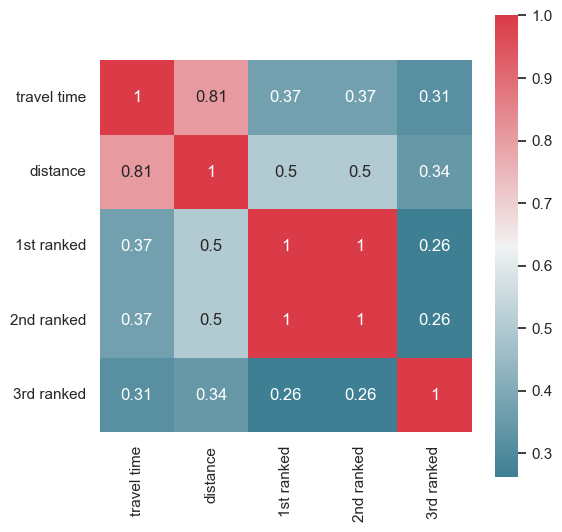

In [98]:
# run correlation matrix and plot
f, ax = plt.subplots(figsize=(6,6))
corr = df4.corr()
sns.heatmap(corr,annot=True, mask=np.zeros_like(corr,dtype=np.bool),
           cmap=sns.diverging_palette(220,10, as_cmap=True),
           square=True, ax=ax)

In [99]:
x = np.array(df4[['distance','1st ranked','2nd ranked','3rd ranked']])
y = np.array(df4['travel time'])
x

array([[0.54262962, 0.9504086 , 0.9504086 , 0.70696067],
       [0.53177068, 0.9504086 , 0.9504086 , 0.70696067],
       [0.29643314, 0.9504086 , 0.9504086 , 1.        ],
       ...,
       [0.38481239, 0.9504086 , 0.9504086 , 0.70696067],
       [0.67939324, 0.9504086 , 0.9504086 , 1.        ],
       [0.18872099, 0.9504086 , 0.9504086 , 0.97044715]])

In [100]:
#split data into test & train
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [101]:
print(X_train.shape)
print(X_test.shape)
# X_train

(6537, 4)
(1635, 4)


In [102]:
# inputs: distance + 1st & 2nd & 3rd dominant road
model4_1_1 = nnmodel(50, num_hlayers=1,Epoch=500)
model4_1_1

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 762503.6250 - mape: 99.5071 - rmse: 873.2145 - val_loss: 773375.0625 - val_mape: 98.6236 - val_rmse: 879.4175
Epoch 2/500
205/205 [==============================] - 0s 773us/step - loss: 734374.2500 - mape: 96.9156 - rmse: 856.9564 - val_loss: 729252.6875 - val_mape: 94.5505 - val_rmse: 853.9630
Epoch 3/500
205/205 [==============================] - 0s 759us/step - loss: 677585.9375 - mape: 91.4145 - rmse: 823.1561 - val_loss: 657157.0000 - val_mape: 87.5586 - val_rmse: 810.6522
Epoch 4/500
205/205 [==============================] - 0s 770us/step - loss: 599008.1250 - mape: 83.3948 - rmse: 773.9562 - val_loss: 569066.3750 - val_mape: 78.4289 - val_rmse: 754.3649
Epoch 5/500
205/205 [==============================] - 0s 751us/step - loss: 509806.4688 - mape: 73.7691 - rmse: 714.0073 - val_loss: 474866.5312 - val_mape: 68.2834 - val_rmse: 689.1056
Epoch 6/500
205/205 [==============================] - 0s 768us/ste

Epoch 45/500
205/205 [==============================] - 0s 752us/step - loss: 77810.4766 - mape: 32.5712 - rmse: 278.9453 - val_loss: 80105.0703 - val_mape: 32.9320 - val_rmse: 283.0284
Epoch 46/500
205/205 [==============================] - 0s 756us/step - loss: 76514.0391 - mape: 32.2692 - rmse: 276.6117 - val_loss: 78832.0391 - val_mape: 32.6148 - val_rmse: 280.7704
Epoch 47/500
205/205 [==============================] - 0s 751us/step - loss: 75287.2734 - mape: 31.9756 - rmse: 274.3853 - val_loss: 77615.4922 - val_mape: 32.1326 - val_rmse: 278.5956
Epoch 48/500
205/205 [==============================] - 0s 730us/step - loss: 74083.0859 - mape: 31.6568 - rmse: 272.1821 - val_loss: 76461.7266 - val_mape: 31.5783 - val_rmse: 276.5172
Epoch 49/500
205/205 [==============================] - 0s 741us/step - loss: 72936.6328 - mape: 31.1225 - rmse: 270.0678 - val_loss: 75310.0859 - val_mape: 31.3522 - val_rmse: 274.4268
Epoch 50/500
205/205 [==============================] - 0s 740us/step 

205/205 [==============================] - 0s 754us/step - loss: 58947.7148 - mape: 24.1495 - rmse: 242.7915 - val_loss: 62268.1992 - val_mape: 23.6254 - val_rmse: 249.5360
Epoch 90/500
205/205 [==============================] - 0s 740us/step - loss: 58927.8516 - mape: 24.2449 - rmse: 242.7506 - val_loss: 62280.0898 - val_mape: 23.5250 - val_rmse: 249.5598
Epoch 91/500
205/205 [==============================] - 0s 746us/step - loss: 58926.2734 - mape: 24.0641 - rmse: 242.7473 - val_loss: 62220.6680 - val_mape: 23.7853 - val_rmse: 249.4407
Epoch 92/500
205/205 [==============================] - 0s 745us/step - loss: 58919.3438 - mape: 24.1694 - rmse: 242.7331 - val_loss: 62221.0156 - val_mape: 23.7422 - val_rmse: 249.4414
Epoch 93/500
205/205 [==============================] - 0s 752us/step - loss: 58910.6250 - mape: 24.1015 - rmse: 242.7151 - val_loss: 62218.8164 - val_mape: 23.7283 - val_rmse: 249.4370
Epoch 94/500
205/205 [==============================] - 0s 745us/step - loss: 58902

Epoch 133/500
205/205 [==============================] - 0s 735us/step - loss: 58874.9766 - mape: 23.7575 - rmse: 242.6417 - val_loss: 62231.1836 - val_mape: 23.4258 - val_rmse: 249.4618
Epoch 134/500
205/205 [==============================] - 0s 745us/step - loss: 58874.4375 - mape: 23.8891 - rmse: 242.6405 - val_loss: 62311.7305 - val_mape: 23.1088 - val_rmse: 249.6232
Epoch 135/500
205/205 [==============================] - 0s 755us/step - loss: 58873.0898 - mape: 23.7981 - rmse: 242.6378 - val_loss: 62283.7383 - val_mape: 23.1922 - val_rmse: 249.5671
Epoch 136/500
205/205 [==============================] - 0s 746us/step - loss: 58903.9609 - mape: 23.8426 - rmse: 242.7014 - val_loss: 62321.2930 - val_mape: 23.0791 - val_rmse: 249.6423
Epoch 137/500
205/205 [==============================] - 0s 752us/step - loss: 58844.1875 - mape: 23.6456 - rmse: 242.5782 - val_loss: 62208.5938 - val_mape: 23.7225 - val_rmse: 249.4165
Epoch 138/500
205/205 [==============================] - 0s 748us

Epoch 177/500
205/205 [==============================] - 0s 741us/step - loss: 58854.8047 - mape: 23.8662 - rmse: 242.6001 - val_loss: 62250.7305 - val_mape: 23.2837 - val_rmse: 249.5010
Epoch 178/500
205/205 [==============================] - 0s 740us/step - loss: 58838.9883 - mape: 23.8923 - rmse: 242.5675 - val_loss: 62355.7383 - val_mape: 22.9702 - val_rmse: 249.7113
Epoch 179/500
205/205 [==============================] - 0s 738us/step - loss: 58858.1641 - mape: 23.7450 - rmse: 242.6070 - val_loss: 62254.3398 - val_mape: 23.2658 - val_rmse: 249.5082
Epoch 180/500
205/205 [==============================] - 0s 735us/step - loss: 58856.7539 - mape: 23.8391 - rmse: 242.6041 - val_loss: 62268.2188 - val_mape: 23.2133 - val_rmse: 249.5360
Epoch 181/500
205/205 [==============================] - 0s 748us/step - loss: 58864.1328 - mape: 23.7467 - rmse: 242.6193 - val_loss: 62264.0117 - val_mape: 23.2322 - val_rmse: 249.5276
Epoch 182/500
205/205 [==============================] - 0s 740us

Epoch 221/500
205/205 [==============================] - 0s 745us/step - loss: 58862.7773 - mape: 23.9441 - rmse: 242.6165 - val_loss: 62219.1133 - val_mape: 23.4000 - val_rmse: 249.4376
Epoch 222/500
205/205 [==============================] - 0s 742us/step - loss: 58860.8398 - mape: 23.9100 - rmse: 242.6125 - val_loss: 62245.9531 - val_mape: 23.2676 - val_rmse: 249.4914
Epoch 223/500
205/205 [==============================] - 0s 737us/step - loss: 58849.1562 - mape: 23.6482 - rmse: 242.5885 - val_loss: 62200.5391 - val_mape: 23.5398 - val_rmse: 249.4004
Epoch 224/500
205/205 [==============================] - 0s 751us/step - loss: 58857.6719 - mape: 23.8483 - rmse: 242.6060 - val_loss: 62225.6992 - val_mape: 23.3572 - val_rmse: 249.4508
Epoch 225/500
205/205 [==============================] - 0s 757us/step - loss: 58856.2422 - mape: 23.8350 - rmse: 242.6031 - val_loss: 62211.3281 - val_mape: 23.4412 - val_rmse: 249.4220
Epoch 226/500
205/205 [==============================] - 0s 739us

Epoch 265/500
205/205 [==============================] - 0s 726us/step - loss: 58842.4180 - mape: 23.8411 - rmse: 242.5746 - val_loss: 62277.7461 - val_mape: 23.1184 - val_rmse: 249.5551
Epoch 266/500
205/205 [==============================] - 0s 740us/step - loss: 58844.3984 - mape: 23.7490 - rmse: 242.5786 - val_loss: 62255.4609 - val_mape: 23.1908 - val_rmse: 249.5104
Epoch 267/500
205/205 [==============================] - 0s 747us/step - loss: 58855.9023 - mape: 23.8085 - rmse: 242.6024 - val_loss: 62289.4453 - val_mape: 23.0890 - val_rmse: 249.5785
Epoch 268/500
205/205 [==============================] - 0s 726us/step - loss: 58841.9648 - mape: 23.7866 - rmse: 242.5736 - val_loss: 62243.8945 - val_mape: 23.2307 - val_rmse: 249.4873
Epoch 269/500
205/205 [==============================] - 0s 740us/step - loss: 58843.9922 - mape: 23.7796 - rmse: 242.5778 - val_loss: 62242.9570 - val_mape: 23.2315 - val_rmse: 249.4854
Epoch 270/500
205/205 [==============================] - 0s 735us

Epoch 309/500
205/205 [==============================] - 0s 760us/step - loss: 58845.1445 - mape: 23.9216 - rmse: 242.5802 - val_loss: 62256.5156 - val_mape: 23.1530 - val_rmse: 249.5126
Epoch 310/500
205/205 [==============================] - 0s 758us/step - loss: 58835.5039 - mape: 23.8497 - rmse: 242.5603 - val_loss: 62312.4453 - val_mape: 23.0031 - val_rmse: 249.6246
Epoch 311/500
205/205 [==============================] - 0s 741us/step - loss: 58835.2188 - mape: 23.7393 - rmse: 242.5597 - val_loss: 62207.2852 - val_mape: 23.3373 - val_rmse: 249.4139
Epoch 312/500
205/205 [==============================] - 0s 751us/step - loss: 58826.9375 - mape: 23.7348 - rmse: 242.5426 - val_loss: 62172.7500 - val_mape: 23.6362 - val_rmse: 249.3446
Epoch 313/500
205/205 [==============================] - 0s 754us/step - loss: 58844.8086 - mape: 23.8902 - rmse: 242.5795 - val_loss: 62213.3125 - val_mape: 23.3123 - val_rmse: 249.4260
Epoch 314/500
205/205 [==============================] - 0s 750us

Epoch 353/500
205/205 [==============================] - 0s 763us/step - loss: 58842.9727 - mape: 23.8154 - rmse: 242.5757 - val_loss: 62250.8477 - val_mape: 23.1149 - val_rmse: 249.5012
Epoch 354/500
205/205 [==============================] - 0s 752us/step - loss: 58841.4805 - mape: 23.7918 - rmse: 242.5726 - val_loss: 62240.5547 - val_mape: 23.1400 - val_rmse: 249.4806
Epoch 355/500
205/205 [==============================] - 0s 734us/step - loss: 58831.4453 - mape: 23.7150 - rmse: 242.5519 - val_loss: 62180.2617 - val_mape: 23.3820 - val_rmse: 249.3597
Epoch 356/500
205/205 [==============================] - 0s 741us/step - loss: 58807.0898 - mape: 23.9090 - rmse: 242.5017 - val_loss: 62287.5156 - val_mape: 23.0108 - val_rmse: 249.5747
Epoch 357/500
205/205 [==============================] - 0s 739us/step - loss: 58827.3125 - mape: 23.7122 - rmse: 242.5434 - val_loss: 62185.0078 - val_mape: 23.3473 - val_rmse: 249.3692
Epoch 358/500
205/205 [==============================] - 0s 768us

Epoch 397/500
205/205 [==============================] - 0s 763us/step - loss: 58807.8867 - mape: 23.9417 - rmse: 242.5034 - val_loss: 62145.6719 - val_mape: 23.2219 - val_rmse: 249.2903
Epoch 398/500
205/205 [==============================] - 0s 765us/step - loss: 58801.5586 - mape: 23.7329 - rmse: 242.4903 - val_loss: 62147.5000 - val_mape: 23.2053 - val_rmse: 249.2940
Epoch 399/500
205/205 [==============================] - 0s 760us/step - loss: 58791.6250 - mape: 23.7780 - rmse: 242.4698 - val_loss: 62124.2188 - val_mape: 23.2947 - val_rmse: 249.2473
Epoch 400/500
205/205 [==============================] - 0s 743us/step - loss: 58793.5508 - mape: 23.8448 - rmse: 242.4738 - val_loss: 62218.7930 - val_mape: 22.9874 - val_rmse: 249.4370
Epoch 401/500
205/205 [==============================] - 0s 730us/step - loss: 58801.9258 - mape: 23.6152 - rmse: 242.4911 - val_loss: 62094.6445 - val_mape: 23.4436 - val_rmse: 249.1880
Epoch 402/500
205/205 [==============================] - 0s 745us

Epoch 441/500
205/205 [==============================] - 0s 799us/step - loss: 58766.0195 - mape: 23.7218 - rmse: 242.4170 - val_loss: 62060.9570 - val_mape: 23.2896 - val_rmse: 249.1204
Epoch 442/500
205/205 [==============================] - 0s 753us/step - loss: 58777.5430 - mape: 23.7146 - rmse: 242.4408 - val_loss: 62094.1328 - val_mape: 23.1553 - val_rmse: 249.1870
Epoch 443/500
205/205 [==============================] - 0s 755us/step - loss: 58776.6680 - mape: 23.7868 - rmse: 242.4390 - val_loss: 62089.3242 - val_mape: 23.1618 - val_rmse: 249.1773
Epoch 444/500
205/205 [==============================] - 0s 749us/step - loss: 58776.6172 - mape: 23.7728 - rmse: 242.4389 - val_loss: 62071.4219 - val_mape: 23.2226 - val_rmse: 249.1414
Epoch 445/500
205/205 [==============================] - 0s 752us/step - loss: 58761.1406 - mape: 23.6063 - rmse: 242.4070 - val_loss: 62027.0234 - val_mape: 23.4962 - val_rmse: 249.0522
Epoch 446/500
205/205 [==============================] - 0s 769us

Epoch 485/500
205/205 [==============================] - 0s 740us/step - loss: 58754.6172 - mape: 23.7078 - rmse: 242.3935 - val_loss: 62043.5703 - val_mape: 23.1920 - val_rmse: 249.0855
Epoch 486/500
205/205 [==============================] - 0s 735us/step - loss: 58756.2148 - mape: 23.7627 - rmse: 242.3968 - val_loss: 62048.7422 - val_mape: 23.1665 - val_rmse: 249.0959
Epoch 487/500
205/205 [==============================] - 0s 733us/step - loss: 58756.1055 - mape: 23.6830 - rmse: 242.3966 - val_loss: 62028.9141 - val_mape: 23.2461 - val_rmse: 249.0560
Epoch 488/500
205/205 [==============================] - 0s 730us/step - loss: 58754.3359 - mape: 23.7651 - rmse: 242.3929 - val_loss: 62058.8438 - val_mape: 23.1255 - val_rmse: 249.1161
Epoch 489/500
205/205 [==============================] - 0s 741us/step - loss: 58758.6523 - mape: 23.6616 - rmse: 242.4018 - val_loss: 62025.0078 - val_mape: 23.2676 - val_rmse: 249.0482
Epoch 490/500
205/205 [==============================] - 0s 736us

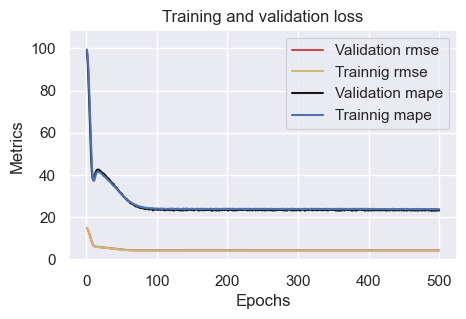

In [103]:
plotme(model4_1_1)

In [299]:
# inputs: distance + 1st & 2nd & 3rd dominant road
model4_1_2 = nnmodel(100, num_hlayers=1,Epoch=500)
model4_1_2

Epoch 1/500
205/205 [==============================] - 1s 2ms/step - loss: 204084.9219 - mape: 54.7925 - rmse: 451.7576 - val_loss: 143227.5625 - val_mape: 54.6047 - val_rmse: 378.4542
Epoch 2/500
205/205 [==============================] - 0s 778us/step - loss: 138483.4688 - mape: 50.7898 - rmse: 372.1337 - val_loss: 140471.2500 - val_mape: 50.8387 - val_rmse: 374.7950
Epoch 3/500
205/205 [==============================] - 0s 786us/step - loss: 137330.7969 - mape: 50.1440 - rmse: 370.5817 - val_loss: 139401.5000 - val_mape: 49.6483 - val_rmse: 373.3651
Epoch 4/500
205/205 [==============================] - 0s 789us/step - loss: 137028.6250 - mape: 49.7957 - rmse: 370.1738 - val_loss: 138998.2656 - val_mape: 51.5150 - val_rmse: 372.8247
Epoch 5/500
205/205 [==============================] - 0s 788us/step - loss: 136391.3281 - mape: 49.6394 - rmse: 369.3120 - val_loss: 138426.6094 - val_mape: 48.5592 - val_rmse: 372.0573
Epoch 6/500
205/205 [==============================] - 0s 839us/ste

Epoch 45/500
205/205 [==============================] - 0s 790us/step - loss: 121687.9766 - mape: 45.4542 - rmse: 348.8380 - val_loss: 123172.8516 - val_mape: 43.1331 - val_rmse: 350.9599
Epoch 46/500
205/205 [==============================] - 0s 783us/step - loss: 121910.8672 - mape: 44.9388 - rmse: 349.1574 - val_loss: 133153.7188 - val_mape: 56.4114 - val_rmse: 364.9023
Epoch 47/500
205/205 [==============================] - 0s 763us/step - loss: 122233.9219 - mape: 45.7443 - rmse: 349.6197 - val_loss: 120807.7031 - val_mape: 45.1765 - val_rmse: 347.5740
Epoch 48/500
205/205 [==============================] - 0s 772us/step - loss: 120071.4922 - mape: 44.7337 - rmse: 346.5133 - val_loss: 129534.0781 - val_mape: 54.7913 - val_rmse: 359.9084
Epoch 49/500
205/205 [==============================] - 0s 765us/step - loss: 119263.4141 - mape: 44.7014 - rmse: 345.3454 - val_loss: 119385.2109 - val_mape: 45.4866 - val_rmse: 345.5216
Epoch 50/500
205/205 [==============================] - 0s 7

Epoch 89/500
205/205 [==============================] - 0s 793us/step - loss: 79308.8516 - mape: 33.3400 - rmse: 281.6183 - val_loss: 80832.5547 - val_mape: 33.0276 - val_rmse: 284.3107
Epoch 90/500
205/205 [==============================] - 0s 779us/step - loss: 78374.2578 - mape: 33.1063 - rmse: 279.9540 - val_loss: 80837.5312 - val_mape: 35.9958 - val_rmse: 284.3194
Epoch 91/500
205/205 [==============================] - 0s 790us/step - loss: 78674.0859 - mape: 32.9044 - rmse: 280.4890 - val_loss: 80293.7188 - val_mape: 36.1590 - val_rmse: 283.3615
Epoch 92/500
205/205 [==============================] - 0s 765us/step - loss: 77925.2422 - mape: 32.5945 - rmse: 279.1509 - val_loss: 80808.5156 - val_mape: 37.1356 - val_rmse: 284.2684
Epoch 93/500
205/205 [==============================] - 0s 774us/step - loss: 77331.6641 - mape: 32.4059 - rmse: 278.0857 - val_loss: 82844.1797 - val_mape: 27.4815 - val_rmse: 287.8267
Epoch 94/500
205/205 [==============================] - 0s 775us/step 

Epoch 133/500
205/205 [==============================] - 0s 796us/step - loss: 64584.5039 - mape: 26.3853 - rmse: 254.1348 - val_loss: 67667.1328 - val_mape: 23.4048 - val_rmse: 260.1291
Epoch 134/500
205/205 [==============================] - 0s 780us/step - loss: 64256.5195 - mape: 26.1540 - rmse: 253.4887 - val_loss: 65314.7695 - val_mape: 25.1264 - val_rmse: 255.5676
Epoch 135/500
205/205 [==============================] - 0s 783us/step - loss: 63887.0195 - mape: 26.0887 - rmse: 252.7588 - val_loss: 67494.5859 - val_mape: 22.9089 - val_rmse: 259.7972
Epoch 136/500
205/205 [==============================] - 0s 779us/step - loss: 64936.6992 - mape: 26.2171 - rmse: 254.8268 - val_loss: 68959.5938 - val_mape: 30.6737 - val_rmse: 262.6016
Epoch 137/500
205/205 [==============================] - 0s 766us/step - loss: 64718.1562 - mape: 26.6452 - rmse: 254.3976 - val_loss: 66938.4688 - val_mape: 29.0674 - val_rmse: 258.7247
Epoch 138/500
205/205 [==============================] - 0s 785us

Epoch 177/500
205/205 [==============================] - 0s 774us/step - loss: 62449.7109 - mape: 25.3309 - rmse: 249.8994 - val_loss: 67487.0703 - val_mape: 21.7034 - val_rmse: 259.7827
Epoch 178/500
205/205 [==============================] - 0s 778us/step - loss: 62386.1367 - mape: 25.1514 - rmse: 249.7722 - val_loss: 65538.8125 - val_mape: 27.7821 - val_rmse: 256.0055
Epoch 179/500
205/205 [==============================] - 0s 776us/step - loss: 63907.3711 - mape: 25.6481 - rmse: 252.7991 - val_loss: 70962.3828 - val_mape: 21.1393 - val_rmse: 266.3877
Epoch 180/500
205/205 [==============================] - 0s 771us/step - loss: 62364.2461 - mape: 25.0489 - rmse: 249.7283 - val_loss: 65665.6250 - val_mape: 27.6138 - val_rmse: 256.2531
Epoch 181/500
205/205 [==============================] - 0s 771us/step - loss: 63458.2031 - mape: 25.5216 - rmse: 251.9091 - val_loss: 66513.7422 - val_mape: 21.8691 - val_rmse: 257.9026
Epoch 182/500
205/205 [==============================] - 0s 774us

Epoch 221/500
205/205 [==============================] - 0s 772us/step - loss: 63421.4062 - mape: 25.2829 - rmse: 251.8361 - val_loss: 64227.8320 - val_mape: 22.3910 - val_rmse: 253.4321
Epoch 222/500
205/205 [==============================] - 0s 768us/step - loss: 60783.8477 - mape: 24.5014 - rmse: 246.5438 - val_loss: 64535.3789 - val_mape: 22.1485 - val_rmse: 254.0381
Epoch 223/500
205/205 [==============================] - 0s 784us/step - loss: 62386.2773 - mape: 24.8725 - rmse: 249.7724 - val_loss: 68373.7188 - val_mape: 21.0250 - val_rmse: 261.4837
Epoch 224/500
205/205 [==============================] - 0s 785us/step - loss: 62571.1406 - mape: 25.0405 - rmse: 250.1422 - val_loss: 64179.3047 - val_mape: 23.0501 - val_rmse: 253.3363
Epoch 225/500
205/205 [==============================] - 0s 776us/step - loss: 61388.8047 - mape: 24.5905 - rmse: 247.7676 - val_loss: 63511.3750 - val_mape: 24.2585 - val_rmse: 252.0146
Epoch 226/500
205/205 [==============================] - 0s 773us

Epoch 265/500
205/205 [==============================] - 0s 779us/step - loss: 61557.2500 - mape: 24.8029 - rmse: 248.1073 - val_loss: 64624.6641 - val_mape: 26.9130 - val_rmse: 254.2138
Epoch 266/500
205/205 [==============================] - 0s 775us/step - loss: 61475.1367 - mape: 24.7485 - rmse: 247.9418 - val_loss: 63230.1602 - val_mape: 24.4157 - val_rmse: 251.4561
Epoch 267/500
205/205 [==============================] - 0s 782us/step - loss: 61057.7734 - mape: 24.6465 - rmse: 247.0987 - val_loss: 67613.6953 - val_mape: 30.1737 - val_rmse: 260.0263
Epoch 268/500
205/205 [==============================] - 0s 774us/step - loss: 63024.4609 - mape: 25.4312 - rmse: 251.0467 - val_loss: 63171.3711 - val_mape: 25.0613 - val_rmse: 251.3392
Epoch 269/500
205/205 [==============================] - 0s 783us/step - loss: 61391.0742 - mape: 24.8142 - rmse: 247.7722 - val_loss: 63661.2617 - val_mape: 22.8685 - val_rmse: 252.3118
Epoch 270/500
205/205 [==============================] - 0s 780us

Epoch 309/500
205/205 [==============================] - 0s 768us/step - loss: 60088.8281 - mape: 24.3583 - rmse: 245.1302 - val_loss: 63094.8125 - val_mape: 22.9407 - val_rmse: 251.1868
Epoch 310/500
205/205 [==============================] - 0s 776us/step - loss: 63041.7969 - mape: 25.5389 - rmse: 251.0813 - val_loss: 64326.7773 - val_mape: 27.3042 - val_rmse: 253.6272
Epoch 311/500
205/205 [==============================] - 0s 771us/step - loss: 61095.4102 - mape: 24.9354 - rmse: 247.1749 - val_loss: 65810.6562 - val_mape: 21.2079 - val_rmse: 256.5359
Epoch 312/500
205/205 [==============================] - 0s 776us/step - loss: 61654.1172 - mape: 24.8614 - rmse: 248.3025 - val_loss: 70431.7188 - val_mape: 20.8891 - val_rmse: 265.3897
Epoch 313/500
205/205 [==============================] - 0s 768us/step - loss: 61344.9297 - mape: 24.8187 - rmse: 247.6791 - val_loss: 63100.6328 - val_mape: 23.1715 - val_rmse: 251.1984
Epoch 314/500
205/205 [==============================] - 0s 773us

Epoch 353/500
205/205 [==============================] - 0s 777us/step - loss: 60695.6328 - mape: 24.5316 - rmse: 246.3648 - val_loss: 72380.6562 - val_mape: 33.5853 - val_rmse: 269.0365
Epoch 354/500
205/205 [==============================] - 0s 769us/step - loss: 59661.8281 - mape: 24.3863 - rmse: 244.2577 - val_loss: 62735.5898 - val_mape: 23.0970 - val_rmse: 250.4707
Epoch 355/500
205/205 [==============================] - 0s 774us/step - loss: 59884.0234 - mape: 24.3733 - rmse: 244.7121 - val_loss: 63014.7227 - val_mape: 22.3387 - val_rmse: 251.0273
Epoch 356/500
205/205 [==============================] - 0s 772us/step - loss: 60428.6211 - mape: 24.4951 - rmse: 245.8223 - val_loss: 72417.4844 - val_mape: 21.0087 - val_rmse: 269.1050
Epoch 357/500
205/205 [==============================] - 0s 783us/step - loss: 63073.2578 - mape: 25.1583 - rmse: 251.1439 - val_loss: 63118.5469 - val_mape: 25.4501 - val_rmse: 251.2341
Epoch 358/500
205/205 [==============================] - 0s 777us

Epoch 397/500
205/205 [==============================] - 0s 783us/step - loss: 59587.0781 - mape: 24.1539 - rmse: 244.1046 - val_loss: 65035.5117 - val_mape: 28.2265 - val_rmse: 255.0206
Epoch 398/500
205/205 [==============================] - 0s 777us/step - loss: 60468.2383 - mape: 24.6975 - rmse: 245.9029 - val_loss: 73895.0938 - val_mape: 21.0654 - val_rmse: 271.8365
Epoch 399/500
205/205 [==============================] - 0s 781us/step - loss: 62418.1367 - mape: 25.5060 - rmse: 249.8362 - val_loss: 62688.1094 - val_mape: 25.0176 - val_rmse: 250.3759
Epoch 400/500
205/205 [==============================] - 0s 772us/step - loss: 61302.8086 - mape: 24.8369 - rmse: 247.5940 - val_loss: 62406.2578 - val_mape: 24.3570 - val_rmse: 249.8124
Epoch 401/500
205/205 [==============================] - 0s 790us/step - loss: 60974.3867 - mape: 24.8487 - rmse: 246.9299 - val_loss: 76035.7891 - val_mape: 21.4960 - val_rmse: 275.7459
Epoch 402/500
205/205 [==============================] - 0s 785us

Epoch 441/500
205/205 [==============================] - 0s 766us/step - loss: 60384.8711 - mape: 24.4182 - rmse: 245.7333 - val_loss: 73477.7031 - val_mape: 21.1059 - val_rmse: 271.0677
Epoch 442/500
205/205 [==============================] - 0s 780us/step - loss: 60152.7695 - mape: 24.5118 - rmse: 245.2606 - val_loss: 70482.1641 - val_mape: 32.7440 - val_rmse: 265.4848
Epoch 443/500
205/205 [==============================] - 0s 762us/step - loss: 61833.7773 - mape: 25.2028 - rmse: 248.6640 - val_loss: 62959.3359 - val_mape: 22.2124 - val_rmse: 250.9170
Epoch 444/500
205/205 [==============================] - 0s 777us/step - loss: 60494.4414 - mape: 24.6794 - rmse: 245.9562 - val_loss: 65570.3984 - val_mape: 29.1267 - val_rmse: 256.0672
Epoch 445/500
205/205 [==============================] - 0s 775us/step - loss: 61277.6602 - mape: 25.1159 - rmse: 247.5432 - val_loss: 62861.0586 - val_mape: 22.3799 - val_rmse: 250.7211
Epoch 446/500
205/205 [==============================] - 0s 772us

Epoch 485/500
205/205 [==============================] - 0s 768us/step - loss: 59782.8281 - mape: 24.3752 - rmse: 244.5053 - val_loss: 67691.5547 - val_mape: 30.8981 - val_rmse: 260.1760
Epoch 486/500
205/205 [==============================] - 0s 770us/step - loss: 60144.1680 - mape: 24.7313 - rmse: 245.2431 - val_loss: 65505.6406 - val_mape: 29.1471 - val_rmse: 255.9407
Epoch 487/500
205/205 [==============================] - 0s 779us/step - loss: 59905.2930 - mape: 24.6110 - rmse: 244.7556 - val_loss: 63327.9297 - val_mape: 22.3246 - val_rmse: 251.6504
Epoch 488/500
205/205 [==============================] - 0s 764us/step - loss: 59143.7148 - mape: 24.0961 - rmse: 243.1948 - val_loss: 62715.6875 - val_mape: 21.9085 - val_rmse: 250.4310
Epoch 489/500
205/205 [==============================] - 0s 775us/step - loss: 59234.4180 - mape: 24.3599 - rmse: 243.3812 - val_loss: 63383.3789 - val_mape: 26.4478 - val_rmse: 251.7606
Epoch 490/500
205/205 [==============================] - 0s 765us

In [300]:
# inputs: distance + 1st & 2nd & 3rd dominant road
model4_1_3 = nnmodel(200, num_hlayers=1,Epoch=500)
model4_1_3

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 157872.7344 - mape: 52.1238 - rmse: 397.3320 - val_loss: 140996.3438 - val_mape: 49.8233 - val_rmse: 375.4948
Epoch 2/500
205/205 [==============================] - 0s 807us/step - loss: 138516.0156 - mape: 50.1181 - rmse: 372.1774 - val_loss: 139863.0312 - val_mape: 51.2822 - val_rmse: 373.9827
Epoch 3/500
205/205 [==============================] - 0s 805us/step - loss: 137956.2812 - mape: 49.6981 - rmse: 371.4247 - val_loss: 139522.2500 - val_mape: 52.5655 - val_rmse: 373.5268
Epoch 4/500
205/205 [==============================] - 0s 813us/step - loss: 137236.3281 - mape: 49.5016 - rmse: 370.4542 - val_loss: 138397.8281 - val_mape: 50.8578 - val_rmse: 372.0186
Epoch 5/500
205/205 [==============================] - 0s 819us/step - loss: 136346.8906 - mape: 49.4356 - rmse: 369.2518 - val_loss: 137874.0312 - val_mape: 51.4627 - val_rmse: 371.3139
Epoch 6/500
205/205 [==============================] - 0s 829us/ste

Epoch 45/500
205/205 [==============================] - 0s 806us/step - loss: 101409.0312 - mape: 39.6573 - rmse: 318.4478 - val_loss: 99078.1172 - val_mape: 39.9277 - val_rmse: 314.7668
Epoch 46/500
205/205 [==============================] - 0s 801us/step - loss: 99599.8281 - mape: 39.4218 - rmse: 315.5944 - val_loss: 99361.1484 - val_mape: 34.5485 - val_rmse: 315.2160
Epoch 47/500
205/205 [==============================] - 0s 815us/step - loss: 97984.4531 - mape: 38.8249 - rmse: 313.0247 - val_loss: 95530.8203 - val_mape: 39.9645 - val_rmse: 309.0806
Epoch 48/500
205/205 [==============================] - 0s 802us/step - loss: 94108.3594 - mape: 37.9414 - rmse: 306.7708 - val_loss: 93705.7969 - val_mape: 35.7526 - val_rmse: 306.1140
Epoch 49/500
205/205 [==============================] - 0s 803us/step - loss: 92679.7812 - mape: 37.5016 - rmse: 304.4335 - val_loss: 98558.1016 - val_mape: 45.5552 - val_rmse: 313.9396
Epoch 50/500
205/205 [==============================] - 0s 797us/step

205/205 [==============================] - 0s 805us/step - loss: 62945.0781 - mape: 25.8019 - rmse: 250.8886 - val_loss: 69964.7500 - val_mape: 22.0329 - val_rmse: 264.5085
Epoch 90/500
205/205 [==============================] - 0s 797us/step - loss: 63643.5312 - mape: 25.8865 - rmse: 252.2767 - val_loss: 66029.5703 - val_mape: 23.3080 - val_rmse: 256.9622
Epoch 91/500
205/205 [==============================] - 0s 794us/step - loss: 63530.7070 - mape: 26.0494 - rmse: 252.0530 - val_loss: 73906.2500 - val_mape: 22.3211 - val_rmse: 271.8570
Epoch 92/500
205/205 [==============================] - 0s 804us/step - loss: 65251.0977 - mape: 26.2835 - rmse: 255.4429 - val_loss: 64664.6641 - val_mape: 25.6178 - val_rmse: 254.2925
Epoch 93/500
205/205 [==============================] - 0s 796us/step - loss: 64583.3047 - mape: 26.3863 - rmse: 254.1325 - val_loss: 65207.6094 - val_mape: 23.5796 - val_rmse: 255.3578
Epoch 94/500
205/205 [==============================] - 0s 794us/step - loss: 62751

Epoch 133/500
205/205 [==============================] - 0s 793us/step - loss: 62843.9453 - mape: 25.3311 - rmse: 250.6870 - val_loss: 65077.1484 - val_mape: 27.5054 - val_rmse: 255.1022
Epoch 134/500
205/205 [==============================] - 0s 794us/step - loss: 61627.2500 - mape: 25.1566 - rmse: 248.2484 - val_loss: 86050.6406 - val_mape: 40.2952 - val_rmse: 293.3439
Epoch 135/500
205/205 [==============================] - 0s 803us/step - loss: 61379.4570 - mape: 25.0213 - rmse: 247.7488 - val_loss: 64473.8828 - val_mape: 23.3546 - val_rmse: 253.9171
Epoch 136/500
205/205 [==============================] - 0s 783us/step - loss: 64429.6562 - mape: 25.8473 - rmse: 253.8300 - val_loss: 65932.7109 - val_mape: 28.6699 - val_rmse: 256.7737
Epoch 137/500
205/205 [==============================] - 0s 793us/step - loss: 61491.0039 - mape: 25.1851 - rmse: 247.9738 - val_loss: 71130.4531 - val_mape: 32.3823 - val_rmse: 266.7029
Epoch 138/500
205/205 [==============================] - 0s 801us

Epoch 177/500
205/205 [==============================] - 0s 790us/step - loss: 62498.9180 - mape: 25.4735 - rmse: 249.9978 - val_loss: 65211.3125 - val_mape: 21.7880 - val_rmse: 255.3651
Epoch 178/500
205/205 [==============================] - 0s 793us/step - loss: 61030.5156 - mape: 24.9012 - rmse: 247.0435 - val_loss: 63979.8672 - val_mape: 25.8356 - val_rmse: 252.9424
Epoch 179/500
205/205 [==============================] - 0s 792us/step - loss: 62220.7070 - mape: 25.4470 - rmse: 249.4408 - val_loss: 65616.1641 - val_mape: 21.7310 - val_rmse: 256.1565
Epoch 180/500
205/205 [==============================] - 0s 793us/step - loss: 62805.7578 - mape: 25.4170 - rmse: 250.6108 - val_loss: 64154.5586 - val_mape: 22.6020 - val_rmse: 253.2875
Epoch 181/500
205/205 [==============================] - 0s 804us/step - loss: 61768.6211 - mape: 25.2006 - rmse: 248.5329 - val_loss: 90769.0859 - val_mape: 24.2359 - val_rmse: 301.2791
Epoch 182/500
205/205 [==============================] - 0s 799us

Epoch 221/500
205/205 [==============================] - 0s 793us/step - loss: 62884.6445 - mape: 25.5182 - rmse: 250.7681 - val_loss: 64724.9062 - val_mape: 28.0146 - val_rmse: 254.4109
Epoch 222/500
205/205 [==============================] - 0s 800us/step - loss: 61539.4922 - mape: 25.0185 - rmse: 248.0715 - val_loss: 63472.4453 - val_mape: 25.1981 - val_rmse: 251.9374
Epoch 223/500
205/205 [==============================] - 0s 792us/step - loss: 63380.2031 - mape: 25.6984 - rmse: 251.7543 - val_loss: 81487.3594 - val_mape: 38.4424 - val_rmse: 285.4599
Epoch 224/500
205/205 [==============================] - 0s 789us/step - loss: 61966.8828 - mape: 25.4685 - rmse: 248.9315 - val_loss: 63955.4492 - val_mape: 22.8648 - val_rmse: 252.8941
Epoch 225/500
205/205 [==============================] - 0s 797us/step - loss: 61062.7461 - mape: 25.1118 - rmse: 247.1088 - val_loss: 72385.0000 - val_mape: 32.8717 - val_rmse: 269.0446
Epoch 226/500
205/205 [==============================] - 0s 792us

Epoch 265/500
205/205 [==============================] - 0s 795us/step - loss: 61630.4648 - mape: 25.2569 - rmse: 248.2548 - val_loss: 63270.8320 - val_mape: 23.1002 - val_rmse: 251.5369
Epoch 266/500
205/205 [==============================] - 0s 784us/step - loss: 60816.6094 - mape: 24.9216 - rmse: 246.6102 - val_loss: 64046.7969 - val_mape: 21.7951 - val_rmse: 253.0747
Epoch 267/500
205/205 [==============================] - 0s 790us/step - loss: 61259.5469 - mape: 25.1300 - rmse: 247.5067 - val_loss: 62969.6094 - val_mape: 23.4495 - val_rmse: 250.9375
Epoch 268/500
205/205 [==============================] - 0s 802us/step - loss: 61677.4844 - mape: 25.1361 - rmse: 248.3495 - val_loss: 63792.0195 - val_mape: 26.9269 - val_rmse: 252.5708
Epoch 269/500
205/205 [==============================] - 0s 812us/step - loss: 61171.8438 - mape: 25.1327 - rmse: 247.3294 - val_loss: 63258.0938 - val_mape: 26.0759 - val_rmse: 251.5116
Epoch 270/500
205/205 [==============================] - 0s 799us

Epoch 309/500
205/205 [==============================] - 0s 789us/step - loss: 61499.8359 - mape: 25.1353 - rmse: 247.9916 - val_loss: 63937.2344 - val_mape: 21.8298 - val_rmse: 252.8581
Epoch 310/500
205/205 [==============================] - 0s 809us/step - loss: 62313.9141 - mape: 25.6674 - rmse: 249.6275 - val_loss: 65262.6484 - val_mape: 28.7485 - val_rmse: 255.4655
Epoch 311/500
205/205 [==============================] - 0s 803us/step - loss: 62441.4102 - mape: 25.7106 - rmse: 249.8828 - val_loss: 62547.2773 - val_mape: 23.2803 - val_rmse: 250.0945
Epoch 312/500
205/205 [==============================] - 0s 803us/step - loss: 62603.8594 - mape: 25.5994 - rmse: 250.2076 - val_loss: 62653.0312 - val_mape: 23.7348 - val_rmse: 250.3059
Epoch 313/500
205/205 [==============================] - 0s 794us/step - loss: 61088.8242 - mape: 24.8515 - rmse: 247.1615 - val_loss: 62999.9844 - val_mape: 25.4159 - val_rmse: 250.9980
Epoch 314/500
205/205 [==============================] - 0s 798us

Epoch 353/500
205/205 [==============================] - 0s 782us/step - loss: 60830.8047 - mape: 24.9865 - rmse: 246.6390 - val_loss: 64297.6289 - val_mape: 27.8414 - val_rmse: 253.5698
Epoch 354/500
205/205 [==============================] - 0s 796us/step - loss: 60182.8672 - mape: 24.7469 - rmse: 245.3220 - val_loss: 68745.3672 - val_mape: 31.5736 - val_rmse: 262.1934
Epoch 355/500
205/205 [==============================] - 0s 794us/step - loss: 61458.8086 - mape: 25.3517 - rmse: 247.9089 - val_loss: 67092.7734 - val_mape: 21.2162 - val_rmse: 259.0227
Epoch 356/500
205/205 [==============================] - 0s 796us/step - loss: 59675.1523 - mape: 24.5005 - rmse: 244.2850 - val_loss: 64747.1406 - val_mape: 21.6760 - val_rmse: 254.4546
Epoch 357/500
205/205 [==============================] - 0s 794us/step - loss: 60736.7305 - mape: 24.8502 - rmse: 246.4482 - val_loss: 63294.8906 - val_mape: 26.5791 - val_rmse: 251.5848
Epoch 358/500
205/205 [==============================] - 0s 797us

Epoch 397/500
205/205 [==============================] - 0s 804us/step - loss: 59831.5234 - mape: 24.8127 - rmse: 244.6048 - val_loss: 64075.3125 - val_mape: 27.7508 - val_rmse: 253.1310
Epoch 398/500
205/205 [==============================] - 0s 802us/step - loss: 61042.3164 - mape: 25.3856 - rmse: 247.0674 - val_loss: 63010.2266 - val_mape: 25.5949 - val_rmse: 251.0184
Epoch 399/500
205/205 [==============================] - 0s 799us/step - loss: 60842.0508 - mape: 24.7037 - rmse: 246.6618 - val_loss: 63685.8867 - val_mape: 27.0186 - val_rmse: 252.3606
Epoch 400/500
205/205 [==============================] - 0s 811us/step - loss: 61894.0703 - mape: 25.4103 - rmse: 248.7852 - val_loss: 70397.5078 - val_mape: 21.1027 - val_rmse: 265.3253
Epoch 401/500
205/205 [==============================] - 0s 797us/step - loss: 61674.1172 - mape: 25.3686 - rmse: 248.3427 - val_loss: 65476.1602 - val_mape: 29.0597 - val_rmse: 255.8831
Epoch 402/500
205/205 [==============================] - 0s 800us

Epoch 441/500
205/205 [==============================] - 0s 789us/step - loss: 60155.6875 - mape: 24.8209 - rmse: 245.2666 - val_loss: 64405.5391 - val_mape: 27.9185 - val_rmse: 253.7825
Epoch 442/500
205/205 [==============================] - 0s 786us/step - loss: 60377.0195 - mape: 24.8774 - rmse: 245.7174 - val_loss: 62983.1719 - val_mape: 22.5740 - val_rmse: 250.9645
Epoch 443/500
205/205 [==============================] - 0s 795us/step - loss: 59853.4336 - mape: 25.1235 - rmse: 244.6496 - val_loss: 65604.7344 - val_mape: 21.0028 - val_rmse: 256.1342
Epoch 444/500
205/205 [==============================] - 0s 782us/step - loss: 60084.1914 - mape: 24.8072 - rmse: 245.1208 - val_loss: 62327.0078 - val_mape: 23.6497 - val_rmse: 249.6538
Epoch 445/500
205/205 [==============================] - 0s 795us/step - loss: 62633.7461 - mape: 25.4686 - rmse: 250.2673 - val_loss: 72563.3750 - val_mape: 34.3695 - val_rmse: 269.3759
Epoch 446/500
205/205 [==============================] - 0s 799us

Epoch 485/500
205/205 [==============================] - 0s 795us/step - loss: 60305.7852 - mape: 24.8403 - rmse: 245.5724 - val_loss: 77482.0078 - val_mape: 22.1048 - val_rmse: 278.3559
Epoch 486/500
205/205 [==============================] - 0s 796us/step - loss: 60670.1875 - mape: 25.1051 - rmse: 246.3132 - val_loss: 62262.8242 - val_mape: 23.5145 - val_rmse: 249.5252
Epoch 487/500
205/205 [==============================] - 0s 801us/step - loss: 59342.7070 - mape: 24.6406 - rmse: 243.6036 - val_loss: 65080.2305 - val_mape: 28.9004 - val_rmse: 255.1083
Epoch 488/500
205/205 [==============================] - 0s 800us/step - loss: 60088.5117 - mape: 24.6643 - rmse: 245.1296 - val_loss: 66097.4609 - val_mape: 29.4515 - val_rmse: 257.0943
Epoch 489/500
205/205 [==============================] - 0s 803us/step - loss: 59618.2812 - mape: 24.6478 - rmse: 244.1685 - val_loss: 69048.0547 - val_mape: 21.2156 - val_rmse: 262.7700
Epoch 490/500
205/205 [==============================] - 0s 798us

In [301]:
# inputs: distance + 1st & 2nd & 3rd dominant road
model4_1_4 = nnmodel(100,50, num_hlayers=2,Epoch=500)
model4_1_4

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 155312.5469 - mape: 51.4372 - rmse: 394.0971 - val_loss: 141202.1250 - val_mape: 52.2893 - val_rmse: 375.7687
Epoch 2/500
205/205 [==============================] - 0s 830us/step - loss: 138693.9375 - mape: 50.2141 - rmse: 372.4164 - val_loss: 141787.9531 - val_mape: 46.3388 - val_rmse: 376.5474
Epoch 3/500
205/205 [==============================] - 0s 822us/step - loss: 138163.3906 - mape: 49.8375 - rmse: 371.7034 - val_loss: 138560.2656 - val_mape: 48.4024 - val_rmse: 372.2368
Epoch 4/500
205/205 [==============================] - 0s 820us/step - loss: 137230.8594 - mape: 49.7090 - rmse: 370.4468 - val_loss: 139760.8438 - val_mape: 45.7787 - val_rmse: 373.8460
Epoch 5/500
205/205 [==============================] - 0s 831us/step - loss: 135423.9688 - mape: 48.9414 - rmse: 368.0000 - val_loss: 136359.5469 - val_mape: 48.2180 - val_rmse: 369.2689
Epoch 6/500
205/205 [==============================] - 0s 838us/ste

Epoch 45/500
205/205 [==============================] - 0s 829us/step - loss: 70484.9531 - mape: 29.5517 - rmse: 265.4900 - val_loss: 68981.6875 - val_mape: 26.3022 - val_rmse: 262.6436
Epoch 46/500
205/205 [==============================] - 0s 830us/step - loss: 71868.8125 - mape: 29.9286 - rmse: 268.0836 - val_loss: 67697.0547 - val_mape: 27.6253 - val_rmse: 260.1866
Epoch 47/500
205/205 [==============================] - 0s 828us/step - loss: 69800.0312 - mape: 29.0397 - rmse: 264.1970 - val_loss: 76191.0859 - val_mape: 23.9312 - val_rmse: 276.0273
Epoch 48/500
205/205 [==============================] - 0s 818us/step - loss: 66587.6406 - mape: 27.9682 - rmse: 258.0458 - val_loss: 69940.9688 - val_mape: 31.0493 - val_rmse: 264.4636
Epoch 49/500
205/205 [==============================] - 0s 831us/step - loss: 68884.6172 - mape: 28.7665 - rmse: 262.4588 - val_loss: 121983.0625 - val_mape: 30.0002 - val_rmse: 349.2607
Epoch 50/500
205/205 [==============================] - 0s 830us/step

205/205 [==============================] - 0s 823us/step - loss: 63271.3438 - mape: 26.2853 - rmse: 251.5380 - val_loss: 64930.0547 - val_mape: 22.6046 - val_rmse: 254.8138
Epoch 90/500
205/205 [==============================] - 0s 817us/step - loss: 65435.0625 - mape: 26.9469 - rmse: 255.8028 - val_loss: 64502.7188 - val_mape: 27.5713 - val_rmse: 253.9739
Epoch 91/500
205/205 [==============================] - 0s 831us/step - loss: 63157.0547 - mape: 26.4418 - rmse: 251.3107 - val_loss: 70816.3203 - val_mape: 21.1354 - val_rmse: 266.1134
Epoch 92/500
205/205 [==============================] - 0s 842us/step - loss: 66813.1094 - mape: 27.3476 - rmse: 258.4823 - val_loss: 64339.3828 - val_mape: 24.8171 - val_rmse: 253.6521
Epoch 93/500
205/205 [==============================] - 0s 827us/step - loss: 65502.2617 - mape: 26.8571 - rmse: 255.9341 - val_loss: 64691.4844 - val_mape: 26.6977 - val_rmse: 254.3452
Epoch 94/500
205/205 [==============================] - 0s 819us/step - loss: 65477

Epoch 133/500
205/205 [==============================] - 0s 812us/step - loss: 64279.6797 - mape: 26.7238 - rmse: 253.5344 - val_loss: 64257.2578 - val_mape: 23.5991 - val_rmse: 253.4902
Epoch 134/500
205/205 [==============================] - 0s 824us/step - loss: 62647.7383 - mape: 26.0933 - rmse: 250.2953 - val_loss: 63262.4688 - val_mape: 25.2170 - val_rmse: 251.5203
Epoch 135/500
205/205 [==============================] - 0s 810us/step - loss: 65513.9570 - mape: 26.5807 - rmse: 255.9569 - val_loss: 89887.1172 - val_mape: 43.4048 - val_rmse: 299.8118
Epoch 136/500
205/205 [==============================] - 0s 819us/step - loss: 63576.7422 - mape: 26.2894 - rmse: 252.1443 - val_loss: 65081.1250 - val_mape: 28.8531 - val_rmse: 255.1100
Epoch 137/500
205/205 [==============================] - 0s 820us/step - loss: 62621.5078 - mape: 25.9723 - rmse: 250.2429 - val_loss: 65237.6719 - val_mape: 23.1939 - val_rmse: 255.4167
Epoch 138/500
205/205 [==============================] - 0s 818us

Epoch 177/500
205/205 [==============================] - 0s 814us/step - loss: 70094.4922 - mape: 28.5025 - rmse: 264.7536 - val_loss: 66013.0312 - val_mape: 27.7900 - val_rmse: 256.9300
Epoch 178/500
205/205 [==============================] - 0s 814us/step - loss: 61819.5977 - mape: 25.7559 - rmse: 248.6355 - val_loss: 68234.4531 - val_mape: 31.7032 - val_rmse: 261.2173
Epoch 179/500
205/205 [==============================] - 0s 810us/step - loss: 62511.6016 - mape: 26.2052 - rmse: 250.0232 - val_loss: 69991.4141 - val_mape: 33.1924 - val_rmse: 264.5589
Epoch 180/500
205/205 [==============================] - 0s 814us/step - loss: 61705.9766 - mape: 26.0191 - rmse: 248.4069 - val_loss: 63302.9180 - val_mape: 26.7120 - val_rmse: 251.6007
Epoch 181/500
205/205 [==============================] - 0s 821us/step - loss: 62737.1133 - mape: 26.1968 - rmse: 250.4738 - val_loss: 63361.5312 - val_mape: 25.4596 - val_rmse: 251.7172
Epoch 182/500
205/205 [==============================] - 0s 817us

Epoch 221/500
205/205 [==============================] - 0s 819us/step - loss: 62247.0312 - mape: 25.7654 - rmse: 249.4935 - val_loss: 63113.6250 - val_mape: 27.1807 - val_rmse: 251.2243
Epoch 222/500
205/205 [==============================] - 0s 826us/step - loss: 65142.1211 - mape: 26.8097 - rmse: 255.2296 - val_loss: 62658.2422 - val_mape: 25.8867 - val_rmse: 250.3163
Epoch 223/500
205/205 [==============================] - 0s 826us/step - loss: 60928.4297 - mape: 25.6103 - rmse: 246.8369 - val_loss: 63585.8164 - val_mape: 27.4329 - val_rmse: 252.1623
Epoch 224/500
205/205 [==============================] - 0s 830us/step - loss: 61840.5273 - mape: 25.8094 - rmse: 248.6776 - val_loss: 73368.2734 - val_mape: 34.7385 - val_rmse: 270.8658
Epoch 225/500
205/205 [==============================] - 0s 804us/step - loss: 63183.7812 - mape: 26.4095 - rmse: 251.3638 - val_loss: 62355.1641 - val_mape: 25.4492 - val_rmse: 249.7102
Epoch 226/500
205/205 [==============================] - 0s 812us

Epoch 265/500
205/205 [==============================] - 0s 813us/step - loss: 60953.7227 - mape: 25.4987 - rmse: 246.8881 - val_loss: 120365.0234 - val_mape: 31.2160 - val_rmse: 346.9366
Epoch 266/500
205/205 [==============================] - 0s 824us/step - loss: 62134.2812 - mape: 25.7789 - rmse: 249.2675 - val_loss: 62426.4961 - val_mape: 23.2020 - val_rmse: 249.8530
Epoch 267/500
205/205 [==============================] - 0s 822us/step - loss: 60675.5234 - mape: 25.6227 - rmse: 246.3240 - val_loss: 62785.8359 - val_mape: 26.8750 - val_rmse: 250.5710
Epoch 268/500
205/205 [==============================] - 0s 821us/step - loss: 62739.9336 - mape: 25.8105 - rmse: 250.4794 - val_loss: 62872.1992 - val_mape: 22.7049 - val_rmse: 250.7433
Epoch 269/500
205/205 [==============================] - 0s 818us/step - loss: 61749.8945 - mape: 25.7641 - rmse: 248.4953 - val_loss: 65267.7383 - val_mape: 29.6815 - val_rmse: 255.4755
Epoch 270/500
205/205 [==============================] - 0s 819u

Epoch 309/500
205/205 [==============================] - 0s 828us/step - loss: 60828.3477 - mape: 25.4769 - rmse: 246.6340 - val_loss: 61435.3477 - val_mape: 25.7568 - val_rmse: 247.8615
Epoch 310/500
205/205 [==============================] - 0s 819us/step - loss: 60974.6133 - mape: 25.5544 - rmse: 246.9304 - val_loss: 66448.6797 - val_mape: 31.4855 - val_rmse: 257.7764
Epoch 311/500
205/205 [==============================] - 0s 814us/step - loss: 60826.2773 - mape: 25.3738 - rmse: 246.6298 - val_loss: 92626.0078 - val_mape: 44.0007 - val_rmse: 304.3452
Epoch 312/500
205/205 [==============================] - 0s 814us/step - loss: 60154.6758 - mape: 25.3026 - rmse: 245.2645 - val_loss: 61816.3477 - val_mape: 25.7146 - val_rmse: 248.6289
Epoch 313/500
205/205 [==============================] - 0s 818us/step - loss: 61765.9961 - mape: 25.6804 - rmse: 248.5277 - val_loss: 78154.0859 - val_mape: 21.7886 - val_rmse: 279.5605
Epoch 314/500
205/205 [==============================] - 0s 823us

Epoch 353/500
205/205 [==============================] - 0s 852us/step - loss: 59769.8008 - mape: 25.1788 - rmse: 244.4786 - val_loss: 63547.0469 - val_mape: 21.4315 - val_rmse: 252.0854
Epoch 354/500
205/205 [==============================] - 0s 833us/step - loss: 59912.5625 - mape: 25.0343 - rmse: 244.7704 - val_loss: 62094.6641 - val_mape: 22.6515 - val_rmse: 249.1880
Epoch 355/500
205/205 [==============================] - 0s 829us/step - loss: 60747.8594 - mape: 25.7046 - rmse: 246.4708 - val_loss: 61139.9766 - val_mape: 23.9155 - val_rmse: 247.2650
Epoch 356/500
205/205 [==============================] - 0s 819us/step - loss: 60236.4258 - mape: 25.2720 - rmse: 245.4311 - val_loss: 60471.1836 - val_mape: 24.4625 - val_rmse: 245.9089
Epoch 357/500
205/205 [==============================] - 0s 819us/step - loss: 60675.4961 - mape: 25.4591 - rmse: 246.3240 - val_loss: 61312.7148 - val_mape: 25.5317 - val_rmse: 247.6140
Epoch 358/500
205/205 [==============================] - 0s 828us

Epoch 397/500
205/205 [==============================] - 0s 811us/step - loss: 58493.5977 - mape: 24.8256 - rmse: 241.8545 - val_loss: 61266.0273 - val_mape: 22.1579 - val_rmse: 247.5197
Epoch 398/500
205/205 [==============================] - 0s 825us/step - loss: 60675.3086 - mape: 25.7182 - rmse: 246.3236 - val_loss: 65439.8320 - val_mape: 20.9870 - val_rmse: 255.8121
Epoch 399/500
205/205 [==============================] - 0s 813us/step - loss: 59860.4922 - mape: 25.2919 - rmse: 244.6640 - val_loss: 65387.7422 - val_mape: 30.3038 - val_rmse: 255.7103
Epoch 400/500
205/205 [==============================] - 0s 820us/step - loss: 59932.6680 - mape: 25.3820 - rmse: 244.8115 - val_loss: 63179.4688 - val_mape: 28.3959 - val_rmse: 251.3553
Epoch 401/500
205/205 [==============================] - 0s 828us/step - loss: 58934.8086 - mape: 24.9382 - rmse: 242.7649 - val_loss: 61403.3867 - val_mape: 26.8808 - val_rmse: 247.7971
Epoch 402/500
205/205 [==============================] - 0s 818us

Epoch 441/500
205/205 [==============================] - 0s 814us/step - loss: 58269.6250 - mape: 24.7241 - rmse: 241.3910 - val_loss: 65020.1289 - val_mape: 20.7586 - val_rmse: 254.9904
Epoch 442/500
205/205 [==============================] - 0s 840us/step - loss: 61603.8828 - mape: 25.8350 - rmse: 248.2013 - val_loss: 61239.5195 - val_mape: 26.9759 - val_rmse: 247.4662
Epoch 443/500
205/205 [==============================] - 0s 826us/step - loss: 60161.9219 - mape: 25.4353 - rmse: 245.2793 - val_loss: 63040.6523 - val_mape: 28.8633 - val_rmse: 251.0790
Epoch 444/500
205/205 [==============================] - 0s 821us/step - loss: 59840.0508 - mape: 25.5676 - rmse: 244.6223 - val_loss: 73373.2656 - val_mape: 21.7732 - val_rmse: 270.8750
Epoch 445/500
205/205 [==============================] - 0s 811us/step - loss: 59043.6367 - mape: 25.0706 - rmse: 242.9890 - val_loss: 62704.2852 - val_mape: 22.0667 - val_rmse: 250.4082
Epoch 446/500
205/205 [==============================] - 0s 820us

Epoch 485/500
205/205 [==============================] - 0s 823us/step - loss: 60464.3320 - mape: 25.4766 - rmse: 245.8950 - val_loss: 63093.0898 - val_mape: 23.6016 - val_rmse: 251.1834
Epoch 486/500
205/205 [==============================] - 0s 829us/step - loss: 59116.7578 - mape: 25.1981 - rmse: 243.1394 - val_loss: 70056.1641 - val_mape: 32.4656 - val_rmse: 264.6812
Epoch 487/500
205/205 [==============================] - 0s 816us/step - loss: 58578.4492 - mape: 25.1075 - rmse: 242.0298 - val_loss: 66871.1172 - val_mape: 20.9596 - val_rmse: 258.5945
Epoch 488/500
205/205 [==============================] - 0s 820us/step - loss: 59889.6484 - mape: 25.2999 - rmse: 244.7236 - val_loss: 64609.3438 - val_mape: 21.3735 - val_rmse: 254.1837
Epoch 489/500
205/205 [==============================] - 0s 820us/step - loss: 60402.0156 - mape: 25.7079 - rmse: 245.7682 - val_loss: 67823.5625 - val_mape: 20.9007 - val_rmse: 260.4296
Epoch 490/500
205/205 [==============================] - 0s 815us

In [302]:
# inputs: distance + 1st & 2nd & 3rd dominant road
model4_1_5 = nnmodel(200,100, num_hlayers=2,Epoch=500)
model4_1_5

Epoch 1/500
205/205 [==============================] - 0s 1ms/step - loss: 157027.7656 - mape: 52.2656 - rmse: 396.2673 - val_loss: 141351.3594 - val_mape: 52.6602 - val_rmse: 375.9672
Epoch 2/500
205/205 [==============================] - 0s 917us/step - loss: 139124.3438 - mape: 50.2206 - rmse: 372.9937 - val_loss: 140272.9219 - val_mape: 49.2828 - val_rmse: 374.5303
Epoch 3/500
205/205 [==============================] - 0s 910us/step - loss: 137788.0625 - mape: 49.5888 - rmse: 371.1982 - val_loss: 139915.2969 - val_mape: 52.5848 - val_rmse: 374.0525
Epoch 4/500
205/205 [==============================] - 0s 909us/step - loss: 137205.4219 - mape: 49.4798 - rmse: 370.4125 - val_loss: 138873.8438 - val_mape: 51.7124 - val_rmse: 372.6578
Epoch 5/500
205/205 [==============================] - 0s 908us/step - loss: 136653.7500 - mape: 49.4792 - rmse: 369.6671 - val_loss: 138604.7031 - val_mape: 46.1210 - val_rmse: 372.2965
Epoch 6/500
205/205 [==============================] - 0s 923us/ste

Epoch 45/500
205/205 [==============================] - 0s 897us/step - loss: 67123.8438 - mape: 27.9624 - rmse: 259.0827 - val_loss: 68210.4141 - val_mape: 29.9882 - val_rmse: 261.1712
Epoch 46/500
205/205 [==============================] - 0s 953us/step - loss: 67350.4297 - mape: 27.6638 - rmse: 259.5196 - val_loss: 65502.5859 - val_mape: 24.8263 - val_rmse: 255.9347
Epoch 47/500
205/205 [==============================] - 0s 915us/step - loss: 66548.6328 - mape: 27.6634 - rmse: 257.9702 - val_loss: 75291.9375 - val_mape: 23.6352 - val_rmse: 274.3938
Epoch 48/500
205/205 [==============================] - 0s 902us/step - loss: 69488.6719 - mape: 28.3238 - rmse: 263.6071 - val_loss: 71014.8125 - val_mape: 32.6181 - val_rmse: 266.4861
Epoch 49/500
205/205 [==============================] - 0s 900us/step - loss: 67700.5859 - mape: 28.2930 - rmse: 260.1934 - val_loss: 78091.7969 - val_mape: 22.9261 - val_rmse: 279.4491
Epoch 50/500
205/205 [==============================] - 0s 896us/step 

205/205 [==============================] - 0s 897us/step - loss: 67751.5938 - mape: 28.1387 - rmse: 260.2914 - val_loss: 63908.2656 - val_mape: 24.1937 - val_rmse: 252.8008
Epoch 90/500
205/205 [==============================] - 0s 896us/step - loss: 65770.9766 - mape: 27.3133 - rmse: 256.4585 - val_loss: 62602.2305 - val_mape: 25.1782 - val_rmse: 250.2044
Epoch 91/500
205/205 [==============================] - 0s 898us/step - loss: 64113.3633 - mape: 26.5699 - rmse: 253.2062 - val_loss: 67366.3984 - val_mape: 23.3375 - val_rmse: 259.5504
Epoch 92/500
205/205 [==============================] - 0s 898us/step - loss: 64181.0586 - mape: 26.8260 - rmse: 253.3398 - val_loss: 64259.7344 - val_mape: 27.3013 - val_rmse: 253.4950
Epoch 93/500
205/205 [==============================] - 0s 903us/step - loss: 65716.5078 - mape: 27.2969 - rmse: 256.3523 - val_loss: 66230.9062 - val_mape: 23.4543 - val_rmse: 257.3537
Epoch 94/500
205/205 [==============================] - 0s 894us/step - loss: 66818

Epoch 133/500
205/205 [==============================] - 0s 901us/step - loss: 61517.4023 - mape: 25.6753 - rmse: 248.0270 - val_loss: 71806.7578 - val_mape: 22.0281 - val_rmse: 267.9678
Epoch 134/500
205/205 [==============================] - 0s 897us/step - loss: 62372.1328 - mape: 26.2271 - rmse: 249.7441 - val_loss: 61848.4805 - val_mape: 26.2029 - val_rmse: 248.6935
Epoch 135/500
205/205 [==============================] - 0s 893us/step - loss: 63110.2891 - mape: 26.1853 - rmse: 251.2176 - val_loss: 62159.6250 - val_mape: 24.6521 - val_rmse: 249.3183
Epoch 136/500
205/205 [==============================] - 0s 893us/step - loss: 61937.8789 - mape: 25.9953 - rmse: 248.8732 - val_loss: 68355.1250 - val_mape: 21.8203 - val_rmse: 261.4481
Epoch 137/500
205/205 [==============================] - 0s 897us/step - loss: 64440.9883 - mape: 27.0631 - rmse: 253.8523 - val_loss: 64511.7070 - val_mape: 29.8965 - val_rmse: 253.9915
Epoch 138/500
205/205 [==============================] - 0s 899us

Epoch 177/500
205/205 [==============================] - 0s 898us/step - loss: 62093.6328 - mape: 26.0089 - rmse: 249.1859 - val_loss: 68278.2812 - val_mape: 21.9808 - val_rmse: 261.3011
Epoch 178/500
205/205 [==============================] - 0s 899us/step - loss: 63982.5586 - mape: 26.9044 - rmse: 252.9477 - val_loss: 64284.8242 - val_mape: 29.2311 - val_rmse: 253.5445
Epoch 179/500
205/205 [==============================] - 0s 895us/step - loss: 60580.7422 - mape: 25.6370 - rmse: 246.1316 - val_loss: 89829.8516 - val_mape: 24.2282 - val_rmse: 299.7163
Epoch 180/500
205/205 [==============================] - 0s 953us/step - loss: 62175.2305 - mape: 26.3342 - rmse: 249.3496 - val_loss: 71915.2500 - val_mape: 34.5497 - val_rmse: 268.1702
Epoch 181/500
205/205 [==============================] - 0s 908us/step - loss: 60423.7109 - mape: 25.6194 - rmse: 245.8123 - val_loss: 62205.0742 - val_mape: 23.5752 - val_rmse: 249.4095
Epoch 182/500
205/205 [==============================] - 0s 897us

Epoch 221/500
205/205 [==============================] - 0s 895us/step - loss: 59706.2344 - mape: 25.1561 - rmse: 244.3486 - val_loss: 62334.0820 - val_mape: 23.1595 - val_rmse: 249.6679
Epoch 222/500
205/205 [==============================] - 0s 885us/step - loss: 60928.3867 - mape: 25.6862 - rmse: 246.8368 - val_loss: 71688.2891 - val_mape: 34.7023 - val_rmse: 267.7467
Epoch 223/500
205/205 [==============================] - 0s 896us/step - loss: 62337.2734 - mape: 26.1667 - rmse: 249.6743 - val_loss: 65090.7852 - val_mape: 29.4488 - val_rmse: 255.1290
Epoch 224/500
205/205 [==============================] - 0s 897us/step - loss: 63200.1797 - mape: 26.7596 - rmse: 251.3965 - val_loss: 62813.8867 - val_mape: 28.3517 - val_rmse: 250.6270
Epoch 225/500
205/205 [==============================] - 0s 902us/step - loss: 59851.9883 - mape: 25.4551 - rmse: 244.6467 - val_loss: 62491.6992 - val_mape: 27.6516 - val_rmse: 249.9834
Epoch 226/500
205/205 [==============================] - 0s 889us

Epoch 265/500
205/205 [==============================] - 0s 900us/step - loss: 61773.9219 - mape: 26.1442 - rmse: 248.5436 - val_loss: 66347.0312 - val_mape: 30.8210 - val_rmse: 257.5792
Epoch 266/500
205/205 [==============================] - 0s 896us/step - loss: 59593.7969 - mape: 25.2562 - rmse: 244.1184 - val_loss: 71898.8516 - val_mape: 34.1330 - val_rmse: 268.1396
Epoch 267/500
205/205 [==============================] - 0s 899us/step - loss: 60539.6484 - mape: 25.6562 - rmse: 246.0481 - val_loss: 64795.9961 - val_mape: 22.0745 - val_rmse: 254.5506
Epoch 268/500
205/205 [==============================] - 0s 896us/step - loss: 60960.8086 - mape: 25.7572 - rmse: 246.9024 - val_loss: 65495.3281 - val_mape: 31.1132 - val_rmse: 255.9205
Epoch 269/500
205/205 [==============================] - 0s 904us/step - loss: 59940.0000 - mape: 25.4504 - rmse: 244.8265 - val_loss: 63187.6367 - val_mape: 27.8211 - val_rmse: 251.3715
Epoch 270/500
205/205 [==============================] - 0s 901us

Epoch 309/500
205/205 [==============================] - 0s 895us/step - loss: 60128.6172 - mape: 25.7461 - rmse: 245.2114 - val_loss: 60445.3047 - val_mape: 24.2016 - val_rmse: 245.8563
Epoch 310/500
205/205 [==============================] - 0s 893us/step - loss: 58906.4297 - mape: 25.1185 - rmse: 242.7065 - val_loss: 70698.6484 - val_mape: 21.2990 - val_rmse: 265.8922
Epoch 311/500
205/205 [==============================] - 0s 908us/step - loss: 60622.0234 - mape: 25.6660 - rmse: 246.2154 - val_loss: 60357.2852 - val_mape: 24.7894 - val_rmse: 245.6772
Epoch 312/500
205/205 [==============================] - 0s 889us/step - loss: 59928.6367 - mape: 25.8011 - rmse: 244.8033 - val_loss: 61129.9180 - val_mape: 26.4205 - val_rmse: 247.2447
Epoch 313/500
205/205 [==============================] - 0s 899us/step - loss: 58867.8359 - mape: 24.9858 - rmse: 242.6270 - val_loss: 60901.5273 - val_mape: 25.8046 - val_rmse: 246.7823
Epoch 314/500
205/205 [==============================] - 0s 879us

Epoch 353/500
205/205 [==============================] - 0s 893us/step - loss: 60476.1680 - mape: 25.6907 - rmse: 245.9190 - val_loss: 60736.6016 - val_mape: 26.4583 - val_rmse: 246.4480
Epoch 354/500
205/205 [==============================] - 0s 899us/step - loss: 59728.0547 - mape: 25.1883 - rmse: 244.3932 - val_loss: 62295.6289 - val_mape: 27.4530 - val_rmse: 249.5909
Epoch 355/500
205/205 [==============================] - 0s 893us/step - loss: 60585.8867 - mape: 25.7171 - rmse: 246.1420 - val_loss: 60980.1289 - val_mape: 24.8464 - val_rmse: 246.9415
Epoch 356/500
205/205 [==============================] - 0s 899us/step - loss: 58043.1016 - mape: 24.7426 - rmse: 240.9214 - val_loss: 60605.4844 - val_mape: 23.8257 - val_rmse: 246.1818
Epoch 357/500
205/205 [==============================] - 0s 901us/step - loss: 59584.3477 - mape: 25.2341 - rmse: 244.0991 - val_loss: 86288.5859 - val_mape: 41.8975 - val_rmse: 293.7492
Epoch 358/500
205/205 [==============================] - 0s 952us

Epoch 397/500
205/205 [==============================] - 0s 902us/step - loss: 58011.7812 - mape: 25.1307 - rmse: 240.8564 - val_loss: 62762.8398 - val_mape: 28.4529 - val_rmse: 250.5251
Epoch 398/500
205/205 [==============================] - 0s 895us/step - loss: 61312.8164 - mape: 25.7847 - rmse: 247.6142 - val_loss: 60972.1328 - val_mape: 24.4699 - val_rmse: 246.9254
Epoch 399/500
205/205 [==============================] - 0s 887us/step - loss: 62275.0586 - mape: 26.3978 - rmse: 249.5497 - val_loss: 69179.6953 - val_mape: 22.5686 - val_rmse: 263.0203
Epoch 400/500
205/205 [==============================] - 0s 902us/step - loss: 58525.0742 - mape: 25.4009 - rmse: 241.9196 - val_loss: 73089.9766 - val_mape: 21.3698 - val_rmse: 270.3516
Epoch 401/500
205/205 [==============================] - 0s 898us/step - loss: 59629.3750 - mape: 25.4387 - rmse: 244.1913 - val_loss: 66571.1641 - val_mape: 20.6887 - val_rmse: 258.0139
Epoch 402/500
205/205 [==============================] - 0s 896us

Epoch 441/500
205/205 [==============================] - 0s 899us/step - loss: 60209.9453 - mape: 25.6531 - rmse: 245.3772 - val_loss: 69606.0391 - val_mape: 20.8712 - val_rmse: 263.8296
Epoch 442/500
205/205 [==============================] - 0s 888us/step - loss: 58714.2383 - mape: 25.0681 - rmse: 242.3102 - val_loss: 70097.2734 - val_mape: 21.0349 - val_rmse: 264.7589
Epoch 443/500
205/205 [==============================] - 0s 888us/step - loss: 58636.7812 - mape: 25.0851 - rmse: 242.1503 - val_loss: 59964.9570 - val_mape: 23.5818 - val_rmse: 244.8774
Epoch 444/500
205/205 [==============================] - 0s 892us/step - loss: 62086.4844 - mape: 26.4057 - rmse: 249.1716 - val_loss: 60360.2539 - val_mape: 25.7932 - val_rmse: 245.6832
Epoch 445/500
205/205 [==============================] - 0s 895us/step - loss: 58710.0234 - mape: 25.3227 - rmse: 242.3015 - val_loss: 62853.6914 - val_mape: 28.3359 - val_rmse: 250.7064
Epoch 446/500
205/205 [==============================] - 0s 899us

Epoch 485/500
205/205 [==============================] - 0s 890us/step - loss: 59970.9766 - mape: 25.4528 - rmse: 244.8897 - val_loss: 99254.7266 - val_mape: 25.9554 - val_rmse: 315.0472
Epoch 486/500
205/205 [==============================] - 0s 903us/step - loss: 58384.3594 - mape: 24.9143 - rmse: 241.6286 - val_loss: 62035.1719 - val_mape: 27.3333 - val_rmse: 249.0686
Epoch 487/500
205/205 [==============================] - 0s 887us/step - loss: 59232.2695 - mape: 25.2841 - rmse: 243.3768 - val_loss: 68460.5859 - val_mape: 33.0424 - val_rmse: 261.6497
Epoch 488/500
205/205 [==============================] - 0s 907us/step - loss: 59537.9219 - mape: 25.3154 - rmse: 244.0039 - val_loss: 70288.5469 - val_mape: 34.3468 - val_rmse: 265.1199
Epoch 489/500
205/205 [==============================] - 0s 890us/step - loss: 59024.3242 - mape: 25.1024 - rmse: 242.9492 - val_loss: 59638.4297 - val_mape: 24.7122 - val_rmse: 244.2098
Epoch 490/500
205/205 [==============================] - 0s 886us

### missing value handling approach 2: 

In [104]:
### missing value handling approach 2: 
df6 = df.iloc[:,0:6].copy()
df6[['1st ranked', '2nd ranked','3rd ranked']] = df6[['1st ranked', '2nd ranked','3rd ranked']].fillna(0)
df6.head()

,travel time,distance,hour of day,1st ranked,2nd ranked,3rd ranked
0,1038,0.196901,16,primary,tertiary,primary_link
1,1020,0.192960,22,primary,tertiary,primary_link
2,730,0.107565,6,primary,unclassified,tertiary
3,1235,0.155246,13,primary,residential,unclassified
4,576,0.113345,17,primary,residential,tertiary


#### 2. encoding of ranked roadtype with binary-encoding

In [105]:
option = ['residential','tertiary','primary']
df6.loc[~df6['1st ranked'].isin(option),'1st ranked'] = 'others1'
option = ['residential','tertiary','secondary',0]
df6.loc[~df6['2nd ranked'].isin(option),'2nd ranked'] = 'others2'
option = ['residential','tertiary',0]
df6.loc[~df6['3rd ranked'].isin(option),'3rd ranked'] = 'others3'
df6.head(20)

,travel time,distance,hour of day,1st ranked,2nd ranked,3rd ranked
0,1038,0.196901,16,primary,tertiary,others3
1,1020,0.192960,22,primary,tertiary,others3
2,730,0.107565,6,primary,others2,tertiary
3,1235,0.155246,13,primary,residential,others3
4,576,0.113345,17,primary,residential,tertiary
5,810,0.119569,21,primary,others2,residential
6,2089,0.498133,4,primary,residential,others3
7,985,0.146276,22,primary,residential,others3
8,1071,0.208617,19,primary,residential,others3
9,1110,0.136931,13,primary,residential,others3


In [106]:
#Create object for binary encoding
encoder= ce.BinaryEncoder(cols=['1st ranked','2nd ranked','3rd ranked'],return_df=True)
#Fit and Transform Data 
df6=encoder.fit_transform(df6) 
df6

,travel time,distance,hour of day,1st ranked_0,1st ranked_1,1st ranked_2,2nd ranked_0,2nd ranked_1,2nd ranked_2,3rd ranked_0,3rd ranked_1,3rd ranked_2
0,1038,0.196901,16,0,0,1,0,0,1,0,0,1
1,1020,0.192960,22,0,0,1,0,0,1,0,0,1
2,730,0.107565,6,0,0,1,0,1,0,0,1,0
3,1235,0.155246,13,0,0,1,0,1,1,0,0,1
4,576,0.113345,17,0,0,1,0,1,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
8277,764,0.153767,17,0,0,1,0,0,1,0,1,1
8278,1023,0.152728,9,0,0,1,0,1,1,0,1,0
8279,960,0.139634,15,0,0,1,0,1,1,0,0,1
8280,1349,0.246527,18,0,0,1,1,0,1,0,1,0


c:\users\shima\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  after removing the cwd from sys.path.


<AxesSubplot:>

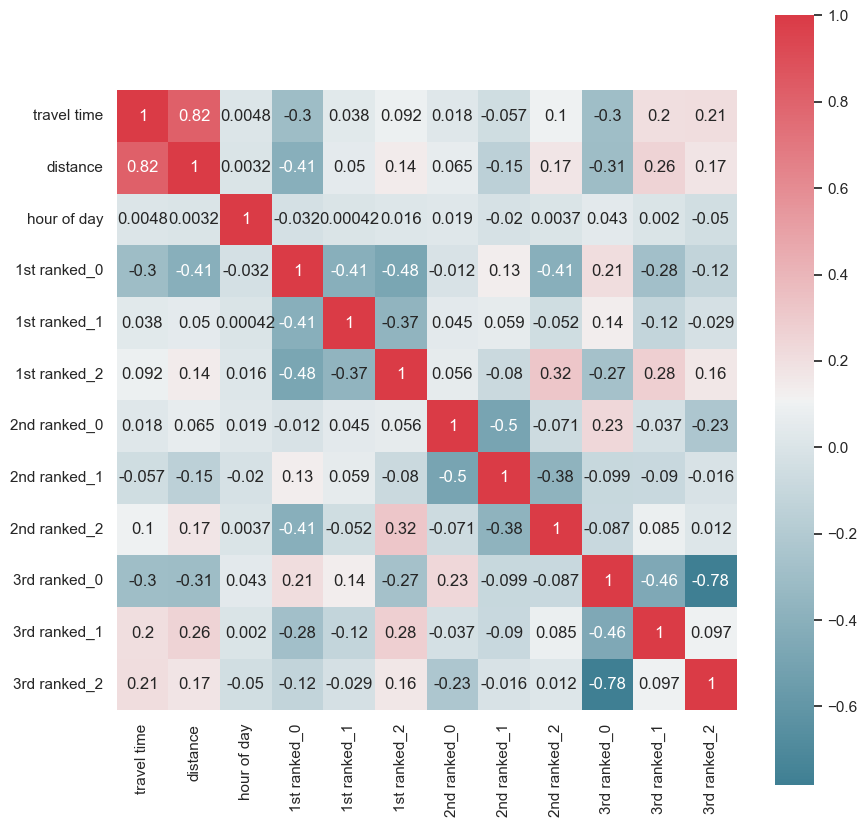

In [107]:
# run correlation matrix and plot
f, ax = plt.subplots(figsize=(10,10))
corr = df6.corr()
sns.heatmap(corr,annot=True, mask=np.zeros_like(corr,dtype=np.bool),
           cmap=sns.diverging_palette(220,10, as_cmap=True),
           square=True, ax=ax)

In [108]:
x = np.array(df6[['distance','1st ranked_0','1st ranked_1','1st ranked_2','2nd ranked_0','2nd ranked_1','2nd ranked_2','3rd ranked_0','3rd ranked_1','3rd ranked_2']])
# x = np.array(df1.iloc[:,1:])
y = np.array(df6['travel time'])
x.shape

(8282, 10)

In [109]:
#split data into test & train
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [110]:
print(X_train.shape)
print(X_test.shape)
# X_train

(6625, 10)
(1657, 10)


In [111]:
# inputs: distance + hour + 1st & 2nd & 3rd dominant road
model4_4_1 = nnmodel(50, num_hlayers=1,Epoch=500)
model4_4_1

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 807511.8125 - mape: 99.1305 - rmse: 898.6166 - val_loss: 786292.8125 - val_mape: 97.4558 - val_rmse: 886.7315
Epoch 2/500
208/208 [==============================] - 0s 788us/step - loss: 759966.0625 - mape: 93.9287 - rmse: 871.7603 - val_loss: 714375.5000 - val_mape: 89.5794 - val_rmse: 845.2074
Epoch 3/500
208/208 [==============================] - 0s 785us/step - loss: 669156.1250 - mape: 83.4475 - rmse: 818.0197 - val_loss: 606507.2500 - val_mape: 76.9269 - val_rmse: 778.7858
Epoch 4/500
208/208 [==============================] - 0s 775us/step - loss: 553833.3125 - mape: 69.8895 - rmse: 744.1998 - val_loss: 486467.6562 - val_mape: 62.2718 - val_rmse: 697.4724
Epoch 5/500
208/208 [==============================] - 0s 768us/step - loss: 437415.5625 - mape: 56.2182 - rmse: 661.3740 - val_loss: 376160.1250 - val_mape: 49.4025 - val_rmse: 613.3190
Epoch 6/500
208/208 [==============================] - 0s 768us/ste

Epoch 45/500
208/208 [==============================] - 0s 770us/step - loss: 128577.6719 - mape: 44.4932 - rmse: 358.5773 - val_loss: 119116.5078 - val_mape: 42.7068 - val_rmse: 345.1326
Epoch 46/500
208/208 [==============================] - 0s 766us/step - loss: 127013.6875 - mape: 44.6394 - rmse: 356.3898 - val_loss: 117524.2656 - val_mape: 42.2382 - val_rmse: 342.8181
Epoch 47/500
208/208 [==============================] - 0s 768us/step - loss: 125387.9609 - mape: 44.0563 - rmse: 354.1016 - val_loss: 115967.7031 - val_mape: 42.2629 - val_rmse: 340.5403
Epoch 48/500
208/208 [==============================] - 0s 762us/step - loss: 123766.0391 - mape: 43.9586 - rmse: 351.8040 - val_loss: 114314.4297 - val_mape: 41.5495 - val_rmse: 338.1042
Epoch 49/500
208/208 [==============================] - 0s 769us/step - loss: 122136.5938 - mape: 43.6887 - rmse: 349.4805 - val_loss: 112715.7344 - val_mape: 41.4761 - val_rmse: 335.7316
Epoch 50/500
208/208 [==============================] - 0s 7

Epoch 89/500
208/208 [==============================] - 0s 767us/step - loss: 72371.5547 - mape: 31.0542 - rmse: 269.0196 - val_loss: 64654.0195 - val_mape: 30.0976 - val_rmse: 254.2715
Epoch 90/500
208/208 [==============================] - 0s 778us/step - loss: 71833.6953 - mape: 30.7588 - rmse: 268.0181 - val_loss: 64176.3203 - val_mape: 30.0807 - val_rmse: 253.3305
Epoch 91/500
208/208 [==============================] - 0s 775us/step - loss: 71350.0703 - mape: 30.9324 - rmse: 267.1143 - val_loss: 63597.6719 - val_mape: 29.5650 - val_rmse: 252.1858
Epoch 92/500
208/208 [==============================] - 0s 762us/step - loss: 70830.8984 - mape: 30.4111 - rmse: 266.1407 - val_loss: 63147.7578 - val_mape: 29.5610 - val_rmse: 251.2922
Epoch 93/500
208/208 [==============================] - 0s 774us/step - loss: 70351.6562 - mape: 30.4020 - rmse: 265.2389 - val_loss: 62640.7500 - val_mape: 29.1249 - val_rmse: 250.2813
Epoch 94/500
208/208 [==============================] - 0s 779us/step 

Epoch 133/500
208/208 [==============================] - 0s 774us/step - loss: 63288.5391 - mape: 26.0595 - rmse: 251.5721 - val_loss: 55658.4141 - val_mape: 25.7261 - val_rmse: 235.9203
Epoch 134/500
208/208 [==============================] - 0s 787us/step - loss: 63231.4961 - mape: 26.2191 - rmse: 251.4587 - val_loss: 55445.2930 - val_mape: 25.0985 - val_rmse: 235.4682
Epoch 135/500
208/208 [==============================] - 0s 755us/step - loss: 63206.8984 - mape: 25.8572 - rmse: 251.4098 - val_loss: 55509.8867 - val_mape: 25.5515 - val_rmse: 235.6054
Epoch 136/500
208/208 [==============================] - 0s 755us/step - loss: 63124.4609 - mape: 26.1314 - rmse: 251.2458 - val_loss: 55358.8828 - val_mape: 25.1283 - val_rmse: 235.2847
Epoch 137/500
208/208 [==============================] - 0s 757us/step - loss: 63092.8438 - mape: 25.9167 - rmse: 251.1829 - val_loss: 55402.5352 - val_mape: 25.5423 - val_rmse: 235.3774
Epoch 138/500
208/208 [==============================] - 0s 770us

Epoch 177/500
208/208 [==============================] - 0s 767us/step - loss: 62121.2734 - mape: 24.9758 - rmse: 249.2414 - val_loss: 54311.3047 - val_mape: 24.8426 - val_rmse: 233.0479
Epoch 178/500
208/208 [==============================] - 0s 763us/step - loss: 62094.9922 - mape: 25.0734 - rmse: 249.1887 - val_loss: 54125.4023 - val_mape: 24.2843 - val_rmse: 232.6487
Epoch 179/500
208/208 [==============================] - 0s 762us/step - loss: 62130.2695 - mape: 24.8635 - rmse: 249.2594 - val_loss: 54083.7617 - val_mape: 24.1489 - val_rmse: 232.5592
Epoch 180/500
208/208 [==============================] - 0s 776us/step - loss: 62087.3477 - mape: 24.9330 - rmse: 249.1733 - val_loss: 54084.8750 - val_mape: 24.1816 - val_rmse: 232.5616
Epoch 181/500
208/208 [==============================] - 0s 779us/step - loss: 62097.1328 - mape: 24.8504 - rmse: 249.1930 - val_loss: 54111.1797 - val_mape: 24.3407 - val_rmse: 232.6181
Epoch 182/500
208/208 [==============================] - 0s 773us

Epoch 221/500
208/208 [==============================] - 0s 921us/step - loss: 61666.3359 - mape: 24.6253 - rmse: 248.3271 - val_loss: 53793.0625 - val_mape: 24.3862 - val_rmse: 231.9333
Epoch 222/500
208/208 [==============================] - 0s 807us/step - loss: 61644.2109 - mape: 24.6325 - rmse: 248.2825 - val_loss: 53758.6133 - val_mape: 24.3504 - val_rmse: 231.8590
Epoch 223/500
208/208 [==============================] - 0s 796us/step - loss: 61643.6562 - mape: 24.7352 - rmse: 248.2814 - val_loss: 53751.0977 - val_mape: 24.2919 - val_rmse: 231.8428
Epoch 224/500
208/208 [==============================] - 0s 789us/step - loss: 61623.3359 - mape: 24.6268 - rmse: 248.2405 - val_loss: 53699.2188 - val_mape: 24.1681 - val_rmse: 231.7309
Epoch 225/500
208/208 [==============================] - 0s 783us/step - loss: 61622.0195 - mape: 24.5656 - rmse: 248.2378 - val_loss: 53635.0664 - val_mape: 24.0109 - val_rmse: 231.5925
Epoch 226/500
208/208 [==============================] - 0s 877us

Epoch 265/500
208/208 [==============================] - 0s 778us/step - loss: 61277.5156 - mape: 24.3137 - rmse: 247.5430 - val_loss: 53492.7070 - val_mape: 24.3716 - val_rmse: 231.2849
Epoch 266/500
208/208 [==============================] - 0s 779us/step - loss: 61276.7656 - mape: 24.4927 - rmse: 247.5414 - val_loss: 53311.2812 - val_mape: 23.8969 - val_rmse: 230.8924
Epoch 267/500
208/208 [==============================] - 0s 784us/step - loss: 61270.3867 - mape: 24.1459 - rmse: 247.5286 - val_loss: 53331.5586 - val_mape: 23.9787 - val_rmse: 230.9363
Epoch 268/500
208/208 [==============================] - 0s 789us/step - loss: 61274.5312 - mape: 24.3362 - rmse: 247.5369 - val_loss: 53401.3477 - val_mape: 24.1625 - val_rmse: 231.0873
Epoch 269/500
208/208 [==============================] - 0s 770us/step - loss: 61244.1172 - mape: 24.3434 - rmse: 247.4755 - val_loss: 53315.8086 - val_mape: 23.9824 - val_rmse: 230.9022
Epoch 270/500
208/208 [==============================] - 0s 780us

Epoch 309/500
208/208 [==============================] - 0s 753us/step - loss: 61062.6836 - mape: 24.0241 - rmse: 247.1086 - val_loss: 53061.3398 - val_mape: 23.7843 - val_rmse: 230.3505
Epoch 310/500
208/208 [==============================] - 0s 772us/step - loss: 61058.0469 - mape: 24.2641 - rmse: 247.0993 - val_loss: 53042.9727 - val_mape: 23.7185 - val_rmse: 230.3106
Epoch 311/500
208/208 [==============================] - 0s 755us/step - loss: 61065.5977 - mape: 24.0063 - rmse: 247.1145 - val_loss: 53055.8359 - val_mape: 23.7277 - val_rmse: 230.3385
Epoch 312/500
208/208 [==============================] - 0s 757us/step - loss: 61049.4453 - mape: 24.1368 - rmse: 247.0819 - val_loss: 53027.1289 - val_mape: 23.6405 - val_rmse: 230.2762
Epoch 313/500
208/208 [==============================] - 0s 755us/step - loss: 61069.9023 - mape: 24.0760 - rmse: 247.1233 - val_loss: 53029.8594 - val_mape: 23.7467 - val_rmse: 230.2821
Epoch 314/500
208/208 [==============================] - 0s 766us

Epoch 353/500
208/208 [==============================] - 0s 755us/step - loss: 60922.5000 - mape: 23.8973 - rmse: 246.8248 - val_loss: 52936.2461 - val_mape: 23.7550 - val_rmse: 230.0788
Epoch 354/500
208/208 [==============================] - 0s 777us/step - loss: 60913.7031 - mape: 24.1755 - rmse: 246.8070 - val_loss: 52863.5039 - val_mape: 23.5151 - val_rmse: 229.9207
Epoch 355/500
208/208 [==============================] - 0s 778us/step - loss: 60899.4141 - mape: 23.9673 - rmse: 246.7781 - val_loss: 52860.9844 - val_mape: 23.5519 - val_rmse: 229.9152
Epoch 356/500
208/208 [==============================] - 0s 776us/step - loss: 60904.9922 - mape: 23.9455 - rmse: 246.7894 - val_loss: 52916.0156 - val_mape: 23.7341 - val_rmse: 230.0348
Epoch 357/500
208/208 [==============================] - 0s 772us/step - loss: 60940.5156 - mape: 24.2031 - rmse: 246.8613 - val_loss: 52888.0234 - val_mape: 23.7059 - val_rmse: 229.9740
Epoch 358/500
208/208 [==============================] - 0s 774us

Epoch 397/500
208/208 [==============================] - 0s 765us/step - loss: 60781.3086 - mape: 23.9647 - rmse: 246.5387 - val_loss: 52738.8594 - val_mape: 23.5582 - val_rmse: 229.6494
Epoch 398/500
208/208 [==============================] - 0s 776us/step - loss: 60779.9062 - mape: 23.8886 - rmse: 246.5358 - val_loss: 52748.2539 - val_mape: 23.5971 - val_rmse: 229.6699
Epoch 399/500
208/208 [==============================] - 0s 761us/step - loss: 60772.3477 - mape: 23.8705 - rmse: 246.5205 - val_loss: 52743.6602 - val_mape: 23.6134 - val_rmse: 229.6599
Epoch 400/500
208/208 [==============================] - 0s 763us/step - loss: 60753.1680 - mape: 24.0560 - rmse: 246.4816 - val_loss: 52641.7031 - val_mape: 23.1790 - val_rmse: 229.4378
Epoch 401/500
208/208 [==============================] - 0s 774us/step - loss: 60755.9648 - mape: 23.9670 - rmse: 246.4872 - val_loss: 52698.3320 - val_mape: 23.4539 - val_rmse: 229.5612
Epoch 402/500
208/208 [==============================] - 0s 759us

Epoch 441/500
208/208 [==============================] - 0s 764us/step - loss: 60679.0820 - mape: 23.9923 - rmse: 246.3312 - val_loss: 52677.4609 - val_mape: 23.6958 - val_rmse: 229.5157
Epoch 442/500
208/208 [==============================] - 0s 766us/step - loss: 60684.9883 - mape: 24.0139 - rmse: 246.3432 - val_loss: 52685.1211 - val_mape: 23.8032 - val_rmse: 229.5324
Epoch 443/500
208/208 [==============================] - 0s 760us/step - loss: 60638.5547 - mape: 23.9008 - rmse: 246.2490 - val_loss: 52547.6484 - val_mape: 23.3228 - val_rmse: 229.2327
Epoch 444/500
208/208 [==============================] - 0s 756us/step - loss: 60645.0234 - mape: 23.8564 - rmse: 246.2621 - val_loss: 52668.2734 - val_mape: 23.6789 - val_rmse: 229.4957
Epoch 445/500
208/208 [==============================] - 0s 771us/step - loss: 60627.5625 - mape: 23.6466 - rmse: 246.2267 - val_loss: 52846.6328 - val_mape: 24.1106 - val_rmse: 229.8840
Epoch 446/500
208/208 [==============================] - 0s 773us

Epoch 485/500
208/208 [==============================] - 0s 766us/step - loss: 60576.7891 - mape: 23.7278 - rmse: 246.1235 - val_loss: 52598.4883 - val_mape: 23.7481 - val_rmse: 229.3436
Epoch 486/500
208/208 [==============================] - 0s 769us/step - loss: 60551.4961 - mape: 23.8600 - rmse: 246.0721 - val_loss: 52639.7734 - val_mape: 23.8165 - val_rmse: 229.4336
Epoch 487/500
208/208 [==============================] - 0s 798us/step - loss: 60573.2148 - mape: 23.8755 - rmse: 246.1163 - val_loss: 52539.6133 - val_mape: 23.5540 - val_rmse: 229.2152
Epoch 488/500
208/208 [==============================] - 0s 762us/step - loss: 60535.7422 - mape: 23.6873 - rmse: 246.0401 - val_loss: 52669.0312 - val_mape: 23.8921 - val_rmse: 229.4973
Epoch 489/500
208/208 [==============================] - 0s 773us/step - loss: 60571.6875 - mape: 23.8159 - rmse: 246.1132 - val_loss: 52432.6719 - val_mape: 23.1509 - val_rmse: 228.9818
Epoch 490/500
208/208 [==============================] - 0s 765us

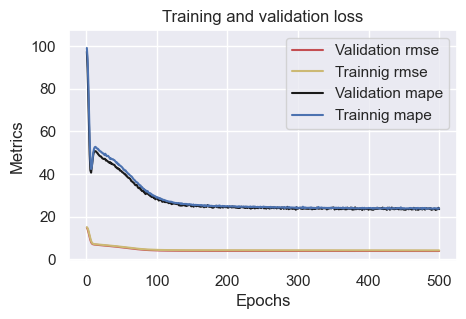

In [112]:
plotme(model4_4_1)
    

In [322]:
# inputs: distance + hour + 1st & 2nd & 3rd dominant road
model4_4_2 = nnmodel(100, num_hlayers=1,Epoch=500)
model4_4_2

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 171316.9531 - mape: 35.5718 - rmse: 413.9045 - val_loss: 88310.1797 - val_mape: 27.9268 - val_rmse: 297.1703
Epoch 2/500
208/208 [==============================] - 0s 794us/step - loss: 102255.2656 - mape: 29.9148 - rmse: 319.7738 - val_loss: 85600.6172 - val_mape: 27.6975 - val_rmse: 292.5758
Epoch 3/500
208/208 [==============================] - 0s 796us/step - loss: 99687.0312 - mape: 29.3082 - rmse: 315.7325 - val_loss: 84813.2734 - val_mape: 27.4389 - val_rmse: 291.2272
Epoch 4/500
208/208 [==============================] - 0s 798us/step - loss: 102918.9688 - mape: 29.5741 - rmse: 320.8099 - val_loss: 82570.8047 - val_mape: 27.4138 - val_rmse: 287.3513
Epoch 5/500
208/208 [==============================] - 0s 804us/step - loss: 102693.8281 - mape: 29.3502 - rmse: 320.4588 - val_loss: 82733.6797 - val_mape: 26.9132 - val_rmse: 287.6346
Epoch 6/500
208/208 [==============================] - 0s 795us/step - lo

208/208 [==============================] - 0s 780us/step - loss: 74478.6328 - mape: 22.2097 - rmse: 272.9077 - val_loss: 63214.7656 - val_mape: 22.6527 - val_rmse: 251.4255
Epoch 46/500
208/208 [==============================] - 0s 772us/step - loss: 74341.6484 - mape: 22.2318 - rmse: 272.6566 - val_loss: 65319.6523 - val_mape: 23.4509 - val_rmse: 255.5771
Epoch 47/500
208/208 [==============================] - 0s 781us/step - loss: 72740.6953 - mape: 22.1065 - rmse: 269.7048 - val_loss: 60836.0430 - val_mape: 19.8672 - val_rmse: 246.6496
Epoch 48/500
208/208 [==============================] - 0s 781us/step - loss: 74491.7031 - mape: 22.5722 - rmse: 272.9317 - val_loss: 56413.8438 - val_mape: 20.0594 - val_rmse: 237.5160
Epoch 49/500
208/208 [==============================] - 0s 791us/step - loss: 71106.4688 - mape: 22.1749 - rmse: 266.6580 - val_loss: 73467.8672 - val_mape: 21.1582 - val_rmse: 271.0496
Epoch 50/500
208/208 [==============================] - 0s 787us/step - loss: 75934

Epoch 133/500
208/208 [==============================] - 0s 785us/step - loss: 68676.0312 - mape: 23.6992 - rmse: 262.0611 - val_loss: 57453.3359 - val_mape: 21.0924 - val_rmse: 239.6943
Epoch 134/500
208/208 [==============================] - 0s 785us/step - loss: 67901.2344 - mape: 23.7784 - rmse: 260.5786 - val_loss: 56856.5195 - val_mape: 24.0666 - val_rmse: 238.4460
Epoch 135/500
208/208 [==============================] - 0s 785us/step - loss: 69429.9141 - mape: 23.7706 - rmse: 263.4956 - val_loss: 56444.9023 - val_mape: 21.1212 - val_rmse: 237.5814
Epoch 136/500
208/208 [==============================] - 0s 787us/step - loss: 67651.1016 - mape: 23.4409 - rmse: 260.0983 - val_loss: 58030.5742 - val_mape: 24.6983 - val_rmse: 240.8954
Epoch 137/500
208/208 [==============================] - 0s 780us/step - loss: 66621.2969 - mape: 23.5313 - rmse: 258.1110 - val_loss: 53845.8359 - val_mape: 22.3448 - val_rmse: 232.0471
Epoch 138/500
208/208 [==============================] - 0s 780us

Epoch 177/500
208/208 [==============================] - 0s 781us/step - loss: 72409.2109 - mape: 23.9390 - rmse: 269.0896 - val_loss: 59994.7188 - val_mape: 25.2083 - val_rmse: 244.9382
Epoch 178/500
208/208 [==============================] - 0s 775us/step - loss: 66610.5781 - mape: 23.2419 - rmse: 258.0902 - val_loss: 53645.9492 - val_mape: 22.2520 - val_rmse: 231.6160
Epoch 179/500
208/208 [==============================] - 0s 778us/step - loss: 67657.8125 - mape: 23.7331 - rmse: 260.1111 - val_loss: 54830.8203 - val_mape: 23.0506 - val_rmse: 234.1598
Epoch 180/500
208/208 [==============================] - 0s 781us/step - loss: 67169.8984 - mape: 23.4357 - rmse: 259.1716 - val_loss: 55236.3828 - val_mape: 23.4722 - val_rmse: 235.0242
Epoch 181/500
208/208 [==============================] - 0s 780us/step - loss: 66515.6328 - mape: 23.4323 - rmse: 257.9062 - val_loss: 53748.7695 - val_mape: 22.2650 - val_rmse: 231.8378
Epoch 182/500
208/208 [==============================] - 0s 785us

Epoch 221/500
208/208 [==============================] - 0s 779us/step - loss: 66205.9844 - mape: 23.7019 - rmse: 257.3052 - val_loss: 56139.9727 - val_mape: 23.7965 - val_rmse: 236.9388
Epoch 222/500
208/208 [==============================] - 0s 783us/step - loss: 66284.2578 - mape: 23.3592 - rmse: 257.4573 - val_loss: 53476.8555 - val_mape: 22.0923 - val_rmse: 231.2506
Epoch 223/500
208/208 [==============================] - 0s 786us/step - loss: 67649.4609 - mape: 23.5320 - rmse: 260.0951 - val_loss: 53608.5117 - val_mape: 22.0484 - val_rmse: 231.5351
Epoch 224/500
208/208 [==============================] - 0s 775us/step - loss: 67300.9297 - mape: 23.5013 - rmse: 259.4242 - val_loss: 59577.0234 - val_mape: 24.6719 - val_rmse: 244.0840
Epoch 225/500
208/208 [==============================] - 0s 780us/step - loss: 66287.2734 - mape: 23.2581 - rmse: 257.4631 - val_loss: 59542.4727 - val_mape: 25.4408 - val_rmse: 244.0133
Epoch 226/500
208/208 [==============================] - 0s 775us

Epoch 265/500
208/208 [==============================] - 0s 770us/step - loss: 66836.5938 - mape: 23.4984 - rmse: 258.5277 - val_loss: 56303.7617 - val_mape: 24.0767 - val_rmse: 237.2841
Epoch 266/500
208/208 [==============================] - 0s 796us/step - loss: 64748.7500 - mape: 23.3279 - rmse: 254.4578 - val_loss: 70869.9062 - val_mape: 28.6663 - val_rmse: 266.2140
Epoch 267/500
208/208 [==============================] - 0s 774us/step - loss: 66496.8047 - mape: 23.4559 - rmse: 257.8698 - val_loss: 54197.1406 - val_mape: 23.0413 - val_rmse: 232.8028
Epoch 268/500
208/208 [==============================] - 0s 764us/step - loss: 65549.1641 - mape: 23.2695 - rmse: 256.0257 - val_loss: 54204.9844 - val_mape: 23.2016 - val_rmse: 232.8196
Epoch 269/500
208/208 [==============================] - 0s 783us/step - loss: 65900.7500 - mape: 23.1767 - rmse: 256.7114 - val_loss: 53632.7695 - val_mape: 22.6996 - val_rmse: 231.5875
Epoch 270/500
208/208 [==============================] - 0s 782us

Epoch 309/500
208/208 [==============================] - 0s 774us/step - loss: 66618.3125 - mape: 23.3466 - rmse: 258.1052 - val_loss: 54043.3984 - val_mape: 21.5278 - val_rmse: 232.4724
Epoch 310/500
208/208 [==============================] - 0s 777us/step - loss: 65289.4883 - mape: 23.0497 - rmse: 255.5181 - val_loss: 53686.0625 - val_mape: 22.3271 - val_rmse: 231.7025
Epoch 311/500
208/208 [==============================] - 0s 777us/step - loss: 65871.1641 - mape: 23.2820 - rmse: 256.6538 - val_loss: 53652.8008 - val_mape: 22.9515 - val_rmse: 231.6307
Epoch 312/500
208/208 [==============================] - 0s 763us/step - loss: 63345.6367 - mape: 23.2235 - rmse: 251.6856 - val_loss: 87183.9688 - val_mape: 23.1530 - val_rmse: 295.2693
Epoch 313/500
208/208 [==============================] - 0s 772us/step - loss: 67551.1094 - mape: 23.4446 - rmse: 259.9060 - val_loss: 53364.5625 - val_mape: 22.3943 - val_rmse: 231.0077
Epoch 314/500
208/208 [==============================] - 0s 790us

Epoch 353/500
208/208 [==============================] - 0s 784us/step - loss: 64883.5000 - mape: 23.4734 - rmse: 254.7224 - val_loss: 55114.9688 - val_mape: 23.7352 - val_rmse: 234.7658
Epoch 354/500
208/208 [==============================] - 0s 775us/step - loss: 64323.9453 - mape: 23.2402 - rmse: 253.6217 - val_loss: 55309.3867 - val_mape: 23.8773 - val_rmse: 235.1795
Epoch 355/500
208/208 [==============================] - 0s 773us/step - loss: 64846.4648 - mape: 23.3200 - rmse: 254.6497 - val_loss: 56133.7070 - val_mape: 21.3392 - val_rmse: 236.9255
Epoch 356/500
208/208 [==============================] - 0s 777us/step - loss: 64620.2344 - mape: 23.2320 - rmse: 254.2051 - val_loss: 56631.5352 - val_mape: 24.5840 - val_rmse: 237.9738
Epoch 357/500
208/208 [==============================] - 0s 780us/step - loss: 66237.5625 - mape: 23.2308 - rmse: 257.3666 - val_loss: 57011.9336 - val_mape: 24.8030 - val_rmse: 238.7717
Epoch 358/500
208/208 [==============================] - 0s 785us

Epoch 397/500
208/208 [==============================] - 0s 781us/step - loss: 64343.3477 - mape: 23.2474 - rmse: 253.6599 - val_loss: 55328.0859 - val_mape: 23.7670 - val_rmse: 235.2192
Epoch 398/500
208/208 [==============================] - 0s 782us/step - loss: 64959.1602 - mape: 23.2699 - rmse: 254.8709 - val_loss: 54226.2773 - val_mape: 21.6012 - val_rmse: 232.8654
Epoch 399/500
208/208 [==============================] - 0s 785us/step - loss: 65065.9414 - mape: 23.3923 - rmse: 255.0803 - val_loss: 53451.4375 - val_mape: 22.5367 - val_rmse: 231.1957
Epoch 400/500
208/208 [==============================] - 0s 790us/step - loss: 65328.1914 - mape: 23.3134 - rmse: 255.5938 - val_loss: 61867.0312 - val_mape: 26.0973 - val_rmse: 248.7308
Epoch 401/500
208/208 [==============================] - 0s 780us/step - loss: 65941.6406 - mape: 23.2234 - rmse: 256.7910 - val_loss: 54191.2227 - val_mape: 23.1742 - val_rmse: 232.7901
Epoch 402/500
208/208 [==============================] - 0s 783us

Epoch 441/500
208/208 [==============================] - 0s 790us/step - loss: 65002.7812 - mape: 23.5418 - rmse: 254.9564 - val_loss: 56412.1172 - val_mape: 24.2812 - val_rmse: 237.5123
Epoch 442/500
208/208 [==============================] - 0s 777us/step - loss: 64227.6797 - mape: 23.1816 - rmse: 253.4318 - val_loss: 53637.9609 - val_mape: 22.2325 - val_rmse: 231.5987
Epoch 443/500
208/208 [==============================] - 0s 783us/step - loss: 65608.6094 - mape: 23.3122 - rmse: 256.1418 - val_loss: 53520.3047 - val_mape: 22.8895 - val_rmse: 231.3446
Epoch 444/500
208/208 [==============================] - 0s 780us/step - loss: 64598.4219 - mape: 23.3692 - rmse: 254.1622 - val_loss: 53884.0742 - val_mape: 23.3059 - val_rmse: 232.1294
Epoch 445/500
208/208 [==============================] - 0s 787us/step - loss: 65502.2773 - mape: 23.4110 - rmse: 255.9341 - val_loss: 64288.3281 - val_mape: 21.2463 - val_rmse: 253.5514
Epoch 446/500
208/208 [==============================] - 0s 778us

Epoch 485/500
208/208 [==============================] - 0s 787us/step - loss: 64290.9805 - mape: 23.2668 - rmse: 253.5567 - val_loss: 53522.6211 - val_mape: 22.8163 - val_rmse: 231.3496
Epoch 486/500
208/208 [==============================] - 0s 784us/step - loss: 64789.7500 - mape: 23.6433 - rmse: 254.5383 - val_loss: 54164.5469 - val_mape: 22.4114 - val_rmse: 232.7328
Epoch 487/500
208/208 [==============================] - 0s 782us/step - loss: 66077.8750 - mape: 23.5401 - rmse: 257.0562 - val_loss: 60482.4180 - val_mape: 26.1370 - val_rmse: 245.9317
Epoch 488/500
208/208 [==============================] - 0s 773us/step - loss: 64829.0742 - mape: 23.6340 - rmse: 254.6155 - val_loss: 54507.9023 - val_mape: 23.8197 - val_rmse: 233.4693
Epoch 489/500
208/208 [==============================] - 0s 779us/step - loss: 63753.1406 - mape: 23.5440 - rmse: 252.4938 - val_loss: 53307.6602 - val_mape: 22.6062 - val_rmse: 230.8845
Epoch 490/500
208/208 [==============================] - 0s 783us

In [323]:
# inputs: distance + hour + 1st & 2nd & 3rd dominant road
model4_4_3 = nnmodel(200, num_hlayers=1,Epoch=500)
model4_4_3

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 148041.2969 - mape: 34.1371 - rmse: 384.7614 - val_loss: 85331.7344 - val_mape: 27.7897 - val_rmse: 292.1160
Epoch 2/500
208/208 [==============================] - 0s 822us/step - loss: 105115.4922 - mape: 30.3180 - rmse: 324.2152 - val_loss: 90024.7109 - val_mape: 27.5239 - val_rmse: 300.0412
Epoch 3/500
208/208 [==============================] - 0s 832us/step - loss: 100437.3125 - mape: 29.1600 - rmse: 316.9185 - val_loss: 93728.7891 - val_mape: 27.4777 - val_rmse: 306.1516
Epoch 4/500
208/208 [==============================] - 0s 826us/step - loss: 99854.3672 - mape: 28.7693 - rmse: 315.9974 - val_loss: 81264.1562 - val_mape: 27.1316 - val_rmse: 285.0687
Epoch 5/500
208/208 [==============================] - 0s 840us/step - loss: 99291.4375 - mape: 28.4169 - rmse: 315.1054 - val_loss: 79719.2891 - val_mape: 26.4367 - val_rmse: 282.3460
Epoch 6/500
208/208 [==============================] - 0s 821us/step - los

208/208 [==============================] - 0s 797us/step - loss: 68623.0234 - mape: 22.5561 - rmse: 261.9600 - val_loss: 283465.0938 - val_mape: 45.0152 - val_rmse: 532.4144
Epoch 46/500
208/208 [==============================] - 0s 800us/step - loss: 79123.5312 - mape: 23.6969 - rmse: 281.2891 - val_loss: 65961.3828 - val_mape: 25.1004 - val_rmse: 256.8295
Epoch 47/500
208/208 [==============================] - 0s 805us/step - loss: 69381.8359 - mape: 22.4126 - rmse: 263.4043 - val_loss: 61259.5156 - val_mape: 23.9896 - val_rmse: 247.5066
Epoch 48/500
208/208 [==============================] - 0s 815us/step - loss: 72243.8281 - mape: 23.1532 - rmse: 268.7821 - val_loss: 54907.2734 - val_mape: 21.2104 - val_rmse: 234.3230
Epoch 49/500
208/208 [==============================] - 0s 813us/step - loss: 70242.3438 - mape: 22.7595 - rmse: 265.0327 - val_loss: 54635.4219 - val_mape: 21.0366 - val_rmse: 233.7422
Epoch 50/500
208/208 [==============================] - 0s 804us/step - loss: 7410

Epoch 133/500
208/208 [==============================] - 0s 804us/step - loss: 67232.8984 - mape: 23.2267 - rmse: 259.2931 - val_loss: 53615.2266 - val_mape: 21.5766 - val_rmse: 231.5496
Epoch 134/500
208/208 [==============================] - 0s 803us/step - loss: 68030.9922 - mape: 23.3650 - rmse: 260.8275 - val_loss: 57671.0859 - val_mape: 20.5837 - val_rmse: 240.1481
Epoch 135/500
208/208 [==============================] - 0s 800us/step - loss: 67878.9062 - mape: 22.9935 - rmse: 260.5358 - val_loss: 53778.7461 - val_mape: 21.2637 - val_rmse: 231.9025
Epoch 136/500
208/208 [==============================] - 0s 800us/step - loss: 67494.4688 - mape: 22.9514 - rmse: 259.7970 - val_loss: 58666.8359 - val_mape: 20.8181 - val_rmse: 242.2124
Epoch 137/500
208/208 [==============================] - 0s 794us/step - loss: 68125.3359 - mape: 23.1305 - rmse: 261.0083 - val_loss: 53693.7930 - val_mape: 21.7008 - val_rmse: 231.7192
Epoch 138/500
208/208 [==============================] - 0s 790us

Epoch 177/500
208/208 [==============================] - 0s 799us/step - loss: 66016.9062 - mape: 22.8104 - rmse: 256.9376 - val_loss: 57677.1211 - val_mape: 24.0596 - val_rmse: 240.1606
Epoch 178/500
208/208 [==============================] - 0s 804us/step - loss: 65426.9258 - mape: 22.9955 - rmse: 255.7869 - val_loss: 55472.5469 - val_mape: 23.8554 - val_rmse: 235.5261
Epoch 179/500
208/208 [==============================] - 0s 810us/step - loss: 65711.1562 - mape: 23.4706 - rmse: 256.3419 - val_loss: 60942.9023 - val_mape: 25.9518 - val_rmse: 246.8662
Epoch 180/500
208/208 [==============================] - 0s 804us/step - loss: 66518.2891 - mape: 23.1359 - rmse: 257.9114 - val_loss: 53661.5195 - val_mape: 21.9011 - val_rmse: 231.6496
Epoch 181/500
208/208 [==============================] - 0s 800us/step - loss: 67405.4141 - mape: 23.4639 - rmse: 259.6255 - val_loss: 54563.9453 - val_mape: 22.9411 - val_rmse: 233.5893
Epoch 182/500
208/208 [==============================] - 0s 812us

Epoch 221/500
208/208 [==============================] - 0s 809us/step - loss: 65501.2812 - mape: 23.3991 - rmse: 255.9322 - val_loss: 53994.4727 - val_mape: 21.4770 - val_rmse: 232.3671
Epoch 222/500
208/208 [==============================] - 0s 784us/step - loss: 66285.8984 - mape: 23.1139 - rmse: 257.4605 - val_loss: 59273.5312 - val_mape: 24.9842 - val_rmse: 243.4616
Epoch 223/500
208/208 [==============================] - 0s 798us/step - loss: 67813.5625 - mape: 23.2105 - rmse: 260.4104 - val_loss: 53586.8789 - val_mape: 21.9283 - val_rmse: 231.4884
Epoch 224/500
208/208 [==============================] - 0s 798us/step - loss: 67377.4219 - mape: 23.3622 - rmse: 259.5716 - val_loss: 53526.0352 - val_mape: 22.1664 - val_rmse: 231.3569
Epoch 225/500
208/208 [==============================] - 0s 813us/step - loss: 66774.2812 - mape: 23.2944 - rmse: 258.4072 - val_loss: 54271.7383 - val_mape: 22.9709 - val_rmse: 232.9630
Epoch 226/500
208/208 [==============================] - 0s 805us

Epoch 265/500
208/208 [==============================] - 0s 795us/step - loss: 65659.6016 - mape: 23.4341 - rmse: 256.2413 - val_loss: 53677.6758 - val_mape: 22.5729 - val_rmse: 231.6844
Epoch 266/500
208/208 [==============================] - 0s 807us/step - loss: 65324.4336 - mape: 23.4836 - rmse: 255.5865 - val_loss: 57345.8242 - val_mape: 21.1993 - val_rmse: 239.4699
Epoch 267/500
208/208 [==============================] - 0s 786us/step - loss: 64412.5742 - mape: 23.4253 - rmse: 253.7963 - val_loss: 111732.5000 - val_mape: 26.1623 - val_rmse: 334.2641
Epoch 268/500
208/208 [==============================] - 0s 805us/step - loss: 67886.5000 - mape: 23.3930 - rmse: 260.5504 - val_loss: 60915.2461 - val_mape: 21.2829 - val_rmse: 246.8101
Epoch 269/500
208/208 [==============================] - 0s 797us/step - loss: 65912.9375 - mape: 23.4343 - rmse: 256.7351 - val_loss: 55158.8828 - val_mape: 21.6213 - val_rmse: 234.8593
Epoch 270/500
208/208 [==============================] - 0s 803u

Epoch 309/500
208/208 [==============================] - 0s 796us/step - loss: 66062.7812 - mape: 23.8134 - rmse: 257.0268 - val_loss: 57346.3359 - val_mape: 25.0081 - val_rmse: 239.4709
Epoch 310/500
208/208 [==============================] - 0s 847us/step - loss: 66080.6641 - mape: 23.4262 - rmse: 257.0616 - val_loss: 53409.2461 - val_mape: 22.6352 - val_rmse: 231.1044
Epoch 311/500
208/208 [==============================] - 0s 824us/step - loss: 64779.8398 - mape: 23.2891 - rmse: 254.5188 - val_loss: 59666.3242 - val_mape: 21.1888 - val_rmse: 244.2669
Epoch 312/500
208/208 [==============================] - 0s 800us/step - loss: 65242.6875 - mape: 23.3949 - rmse: 255.4265 - val_loss: 56845.8477 - val_mape: 24.4959 - val_rmse: 238.4237
Epoch 313/500
208/208 [==============================] - 0s 813us/step - loss: 65151.1562 - mape: 23.6473 - rmse: 255.2472 - val_loss: 53349.7227 - val_mape: 22.1139 - val_rmse: 230.9756
Epoch 314/500
208/208 [==============================] - 0s 855us

Epoch 353/500
208/208 [==============================] - 0s 798us/step - loss: 65028.4688 - mape: 23.3002 - rmse: 255.0068 - val_loss: 53513.6836 - val_mape: 22.3265 - val_rmse: 231.3302
Epoch 354/500
208/208 [==============================] - 0s 800us/step - loss: 64898.1016 - mape: 23.5160 - rmse: 254.7511 - val_loss: 55210.8242 - val_mape: 23.9447 - val_rmse: 234.9698
Epoch 355/500
208/208 [==============================] - 0s 796us/step - loss: 65746.1250 - mape: 23.7368 - rmse: 256.4101 - val_loss: 54655.3633 - val_mape: 23.2111 - val_rmse: 233.7849
Epoch 356/500
208/208 [==============================] - 0s 804us/step - loss: 66916.2734 - mape: 23.3136 - rmse: 258.6818 - val_loss: 54138.4766 - val_mape: 22.2971 - val_rmse: 232.6768
Epoch 357/500
208/208 [==============================] - 0s 797us/step - loss: 66041.5625 - mape: 22.9786 - rmse: 256.9855 - val_loss: 53544.1875 - val_mape: 22.1474 - val_rmse: 231.3962
Epoch 358/500
208/208 [==============================] - 0s 831us

Epoch 397/500
208/208 [==============================] - 0s 800us/step - loss: 65065.5781 - mape: 23.6248 - rmse: 255.0796 - val_loss: 54735.4297 - val_mape: 23.4386 - val_rmse: 233.9560
Epoch 398/500
208/208 [==============================] - 0s 793us/step - loss: 67564.6484 - mape: 23.2652 - rmse: 259.9320 - val_loss: 61322.4883 - val_mape: 25.9394 - val_rmse: 247.6338
Epoch 399/500
208/208 [==============================] - 0s 798us/step - loss: 68795.7266 - mape: 23.3059 - rmse: 262.2894 - val_loss: 53805.2148 - val_mape: 22.1490 - val_rmse: 231.9595
Epoch 400/500
208/208 [==============================] - 0s 802us/step - loss: 66786.1953 - mape: 23.6597 - rmse: 258.4303 - val_loss: 59466.6680 - val_mape: 26.2869 - val_rmse: 243.8579
Epoch 401/500
208/208 [==============================] - 0s 801us/step - loss: 65984.7031 - mape: 23.7987 - rmse: 256.8749 - val_loss: 56076.7461 - val_mape: 20.6936 - val_rmse: 236.8053
Epoch 402/500
208/208 [==============================] - 0s 802us

Epoch 441/500
208/208 [==============================] - 0s 802us/step - loss: 63415.7773 - mape: 23.2583 - rmse: 251.8249 - val_loss: 57046.2383 - val_mape: 25.4063 - val_rmse: 238.8435
Epoch 442/500
208/208 [==============================] - 0s 797us/step - loss: 66203.6875 - mape: 23.7804 - rmse: 257.3008 - val_loss: 64775.4414 - val_mape: 26.8699 - val_rmse: 254.5102
Epoch 443/500
208/208 [==============================] - 0s 803us/step - loss: 66229.3281 - mape: 23.4287 - rmse: 257.3506 - val_loss: 54062.0078 - val_mape: 23.8984 - val_rmse: 232.5124
Epoch 444/500
208/208 [==============================] - 0s 810us/step - loss: 64515.3164 - mape: 23.6592 - rmse: 253.9987 - val_loss: 55165.2383 - val_mape: 23.9640 - val_rmse: 234.8728
Epoch 445/500
208/208 [==============================] - 0s 801us/step - loss: 64407.2812 - mape: 23.7556 - rmse: 253.7859 - val_loss: 58718.1562 - val_mape: 25.7902 - val_rmse: 242.3183
Epoch 446/500
208/208 [==============================] - 0s 797us

Epoch 485/500
208/208 [==============================] - 0s 814us/step - loss: 65768.5000 - mape: 23.2758 - rmse: 256.4537 - val_loss: 53515.0117 - val_mape: 22.6067 - val_rmse: 231.3331
Epoch 486/500
208/208 [==============================] - 0s 808us/step - loss: 64928.2617 - mape: 23.5707 - rmse: 254.8102 - val_loss: 57814.6484 - val_mape: 25.0039 - val_rmse: 240.4468
Epoch 487/500
208/208 [==============================] - 0s 804us/step - loss: 64675.2227 - mape: 22.9878 - rmse: 254.3132 - val_loss: 53518.3086 - val_mape: 21.9579 - val_rmse: 231.3402
Epoch 488/500
208/208 [==============================] - 0s 808us/step - loss: 64890.7305 - mape: 23.6781 - rmse: 254.7366 - val_loss: 54139.3281 - val_mape: 22.9263 - val_rmse: 232.6786
Epoch 489/500
208/208 [==============================] - 0s 800us/step - loss: 63912.4062 - mape: 23.3979 - rmse: 252.8090 - val_loss: 101829.2031 - val_mape: 24.7245 - val_rmse: 319.1069
Epoch 490/500
208/208 [==============================] - 0s 799u

In [324]:
# inputs: distance + hour + 1st & 2nd & 3rd dominant road
model4_4_4 = nnmodel(100,50, num_hlayers=2,Epoch=500)
model4_4_4

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 157689.6562 - mape: 34.7394 - rmse: 397.1016 - val_loss: 88115.1875 - val_mape: 27.9943 - val_rmse: 296.8420
Epoch 2/500
208/208 [==============================] - 0s 859us/step - loss: 104082.6797 - mape: 30.1573 - rmse: 322.6185 - val_loss: 84679.8281 - val_mape: 28.5163 - val_rmse: 290.9980
Epoch 3/500
208/208 [==============================] - 0s 848us/step - loss: 104249.8750 - mape: 30.2815 - rmse: 322.8775 - val_loss: 84239.5781 - val_mape: 27.8968 - val_rmse: 290.2405
Epoch 4/500
208/208 [==============================] - 0s 847us/step - loss: 103153.0938 - mape: 29.8537 - rmse: 321.1746 - val_loss: 86081.3516 - val_mape: 27.5898 - val_rmse: 293.3962
Epoch 5/500
208/208 [==============================] - 0s 865us/step - loss: 103364.8750 - mape: 29.8422 - rmse: 321.5041 - val_loss: 96723.0391 - val_mape: 28.0514 - val_rmse: 311.0033
Epoch 6/500
208/208 [==============================] - 0s 866us/step - l

208/208 [==============================] - 0s 843us/step - loss: 75790.3516 - mape: 23.8825 - rmse: 275.3005 - val_loss: 60967.8789 - val_mape: 20.7870 - val_rmse: 246.9167
Epoch 46/500
208/208 [==============================] - 0s 834us/step - loss: 72785.4453 - mape: 23.0249 - rmse: 269.7878 - val_loss: 55265.4453 - val_mape: 22.4046 - val_rmse: 235.0860
Epoch 47/500
208/208 [==============================] - 0s 819us/step - loss: 71814.3828 - mape: 23.4886 - rmse: 267.9821 - val_loss: 55969.6211 - val_mape: 22.9488 - val_rmse: 236.5790
Epoch 48/500
208/208 [==============================] - 0s 823us/step - loss: 70902.2500 - mape: 23.4547 - rmse: 266.2747 - val_loss: 56155.3477 - val_mape: 21.8856 - val_rmse: 236.9712
Epoch 49/500
208/208 [==============================] - 0s 828us/step - loss: 70710.6328 - mape: 23.5415 - rmse: 265.9147 - val_loss: 57270.4297 - val_mape: 24.7260 - val_rmse: 239.3124
Epoch 50/500
208/208 [==============================] - 0s 832us/step - loss: 70039

Epoch 133/500
208/208 [==============================] - 0s 826us/step - loss: 68001.3438 - mape: 23.4451 - rmse: 260.7707 - val_loss: 54111.6953 - val_mape: 21.5597 - val_rmse: 232.6192
Epoch 134/500
208/208 [==============================] - 0s 828us/step - loss: 65716.7969 - mape: 23.0950 - rmse: 256.3529 - val_loss: 54678.7109 - val_mape: 24.0316 - val_rmse: 233.8348
Epoch 135/500
208/208 [==============================] - 0s 827us/step - loss: 66452.5391 - mape: 23.5346 - rmse: 257.7839 - val_loss: 54189.0547 - val_mape: 22.5668 - val_rmse: 232.7854
Epoch 136/500
208/208 [==============================] - 0s 822us/step - loss: 65656.1641 - mape: 23.3528 - rmse: 256.2346 - val_loss: 53897.2539 - val_mape: 21.6557 - val_rmse: 232.1578
Epoch 137/500
208/208 [==============================] - 0s 838us/step - loss: 67151.6484 - mape: 23.2651 - rmse: 259.1364 - val_loss: 54471.7070 - val_mape: 21.0612 - val_rmse: 233.3917
Epoch 138/500
208/208 [==============================] - 0s 864us

Epoch 177/500
208/208 [==============================] - 0s 827us/step - loss: 69963.3281 - mape: 23.9403 - rmse: 264.5058 - val_loss: 54906.3125 - val_mape: 23.1929 - val_rmse: 234.3210
Epoch 178/500
208/208 [==============================] - 0s 834us/step - loss: 66171.0312 - mape: 23.1997 - rmse: 257.2373 - val_loss: 54177.8438 - val_mape: 23.2013 - val_rmse: 232.7614
Epoch 179/500
208/208 [==============================] - 0s 826us/step - loss: 64685.7812 - mape: 23.2549 - rmse: 254.3340 - val_loss: 53716.8320 - val_mape: 21.9296 - val_rmse: 231.7689
Epoch 180/500
208/208 [==============================] - 0s 830us/step - loss: 65780.0938 - mape: 23.6886 - rmse: 256.4763 - val_loss: 64802.0391 - val_mape: 26.3998 - val_rmse: 254.5624
Epoch 181/500
208/208 [==============================] - 0s 834us/step - loss: 67311.0234 - mape: 23.5537 - rmse: 259.4437 - val_loss: 55110.6914 - val_mape: 22.1430 - val_rmse: 234.7567
Epoch 182/500
208/208 [==============================] - 0s 828us

Epoch 221/500
208/208 [==============================] - 0s 832us/step - loss: 66164.4688 - mape: 23.7489 - rmse: 257.2245 - val_loss: 54982.2422 - val_mape: 21.3599 - val_rmse: 234.4829
Epoch 222/500
208/208 [==============================] - 0s 835us/step - loss: 65278.0586 - mape: 23.3589 - rmse: 255.4957 - val_loss: 53789.7539 - val_mape: 23.1216 - val_rmse: 231.9262
Epoch 223/500
208/208 [==============================] - 0s 837us/step - loss: 66324.7266 - mape: 23.6529 - rmse: 257.5359 - val_loss: 54286.8906 - val_mape: 21.8119 - val_rmse: 232.9955
Epoch 224/500
208/208 [==============================] - 0s 840us/step - loss: 65325.5117 - mape: 23.2878 - rmse: 255.5886 - val_loss: 53304.4102 - val_mape: 22.2866 - val_rmse: 230.8775
Epoch 225/500
208/208 [==============================] - 0s 839us/step - loss: 66573.8203 - mape: 23.5187 - rmse: 258.0190 - val_loss: 61307.8633 - val_mape: 25.5478 - val_rmse: 247.6042
Epoch 226/500
208/208 [==============================] - 0s 833us

Epoch 265/500
208/208 [==============================] - 0s 828us/step - loss: 65787.3047 - mape: 23.2447 - rmse: 256.4904 - val_loss: 63121.8008 - val_mape: 27.2939 - val_rmse: 251.2405
Epoch 266/500
208/208 [==============================] - 0s 833us/step - loss: 63568.5039 - mape: 23.5943 - rmse: 252.1279 - val_loss: 64983.3672 - val_mape: 20.9738 - val_rmse: 254.9184
Epoch 267/500
208/208 [==============================] - 0s 839us/step - loss: 67424.4219 - mape: 23.2571 - rmse: 259.6621 - val_loss: 54127.4219 - val_mape: 23.1009 - val_rmse: 232.6530
Epoch 268/500
208/208 [==============================] - 0s 828us/step - loss: 64135.0820 - mape: 23.6525 - rmse: 253.2491 - val_loss: 54746.9883 - val_mape: 23.3365 - val_rmse: 233.9807
Epoch 269/500
208/208 [==============================] - 0s 828us/step - loss: 64956.6914 - mape: 23.1512 - rmse: 254.8660 - val_loss: 56802.2578 - val_mape: 24.6126 - val_rmse: 238.3322
Epoch 270/500
208/208 [==============================] - 0s 838us

Epoch 309/500
208/208 [==============================] - 0s 830us/step - loss: 65212.4648 - mape: 23.5583 - rmse: 255.3673 - val_loss: 55668.3750 - val_mape: 24.1009 - val_rmse: 235.9415
Epoch 310/500
208/208 [==============================] - 0s 846us/step - loss: 65496.3555 - mape: 23.5626 - rmse: 255.9226 - val_loss: 54939.5195 - val_mape: 21.7336 - val_rmse: 234.3918
Epoch 311/500
208/208 [==============================] - 0s 833us/step - loss: 65173.8555 - mape: 23.6535 - rmse: 255.2917 - val_loss: 56359.3906 - val_mape: 24.2562 - val_rmse: 237.4013
Epoch 312/500
208/208 [==============================] - 0s 837us/step - loss: 65572.8281 - mape: 23.2339 - rmse: 256.0719 - val_loss: 56224.7695 - val_mape: 24.5076 - val_rmse: 237.1176
Epoch 313/500
208/208 [==============================] - 0s 835us/step - loss: 65523.0703 - mape: 23.3535 - rmse: 255.9747 - val_loss: 53512.2500 - val_mape: 22.1312 - val_rmse: 231.3271
Epoch 314/500
208/208 [==============================] - 0s 840us

Epoch 353/500
208/208 [==============================] - 0s 827us/step - loss: 64566.7773 - mape: 23.2907 - rmse: 254.0999 - val_loss: 53525.6719 - val_mape: 21.8736 - val_rmse: 231.3562
Epoch 354/500
208/208 [==============================] - 0s 831us/step - loss: 65651.3906 - mape: 23.3953 - rmse: 256.2253 - val_loss: 54273.0898 - val_mape: 22.9733 - val_rmse: 232.9659
Epoch 355/500
208/208 [==============================] - 0s 822us/step - loss: 64182.2305 - mape: 23.3099 - rmse: 253.3421 - val_loss: 64905.6367 - val_mape: 27.8597 - val_rmse: 254.7659
Epoch 356/500
208/208 [==============================] - 0s 827us/step - loss: 65380.0820 - mape: 23.4572 - rmse: 255.6953 - val_loss: 54577.8594 - val_mape: 23.9195 - val_rmse: 233.6190
Epoch 357/500
208/208 [==============================] - 0s 827us/step - loss: 65768.5703 - mape: 23.5777 - rmse: 256.4538 - val_loss: 53452.9336 - val_mape: 21.4594 - val_rmse: 231.1989
Epoch 358/500
208/208 [==============================] - 0s 829us

Epoch 397/500
208/208 [==============================] - 0s 828us/step - loss: 64411.3203 - mape: 23.4861 - rmse: 253.7939 - val_loss: 68076.2734 - val_mape: 21.4037 - val_rmse: 260.9143
Epoch 398/500
208/208 [==============================] - 0s 832us/step - loss: 65601.4844 - mape: 23.9591 - rmse: 256.1279 - val_loss: 54714.9727 - val_mape: 24.1067 - val_rmse: 233.9123
Epoch 399/500
208/208 [==============================] - 0s 828us/step - loss: 63945.3984 - mape: 23.5773 - rmse: 252.8743 - val_loss: 59038.8750 - val_mape: 26.0647 - val_rmse: 242.9792
Epoch 400/500
208/208 [==============================] - 0s 827us/step - loss: 64286.7539 - mape: 23.6188 - rmse: 253.5483 - val_loss: 54731.8320 - val_mape: 21.4257 - val_rmse: 233.9483
Epoch 401/500
208/208 [==============================] - 0s 838us/step - loss: 65695.4375 - mape: 23.4643 - rmse: 256.3112 - val_loss: 55138.4570 - val_mape: 23.7840 - val_rmse: 234.8158
Epoch 402/500
208/208 [==============================] - 0s 844us

Epoch 441/500
208/208 [==============================] - 0s 841us/step - loss: 65415.3906 - mape: 23.4813 - rmse: 255.7643 - val_loss: 53359.9570 - val_mape: 22.2719 - val_rmse: 230.9977
Epoch 442/500
208/208 [==============================] - 0s 842us/step - loss: 64732.5742 - mape: 23.3825 - rmse: 254.4260 - val_loss: 55076.6289 - val_mape: 24.1897 - val_rmse: 234.6841
Epoch 443/500
208/208 [==============================] - 0s 842us/step - loss: 65006.4336 - mape: 23.6909 - rmse: 254.9636 - val_loss: 55043.9102 - val_mape: 23.6945 - val_rmse: 234.6144
Epoch 444/500
208/208 [==============================] - 0s 839us/step - loss: 64982.5273 - mape: 23.1769 - rmse: 254.9167 - val_loss: 53559.3789 - val_mape: 21.9399 - val_rmse: 231.4290
Epoch 445/500
208/208 [==============================] - 0s 833us/step - loss: 65430.7930 - mape: 23.6136 - rmse: 255.7944 - val_loss: 53726.5859 - val_mape: 21.7840 - val_rmse: 231.7900
Epoch 446/500
208/208 [==============================] - 0s 840us

Epoch 485/500
208/208 [==============================] - 0s 868us/step - loss: 64171.1562 - mape: 23.6699 - rmse: 253.3203 - val_loss: 54405.3477 - val_mape: 21.7885 - val_rmse: 233.2495
Epoch 486/500
208/208 [==============================] - 0s 858us/step - loss: 63933.0352 - mape: 23.5580 - rmse: 252.8498 - val_loss: 56647.5117 - val_mape: 24.9624 - val_rmse: 238.0074
Epoch 487/500
208/208 [==============================] - 0s 875us/step - loss: 66170.4062 - mape: 23.5334 - rmse: 257.2361 - val_loss: 53553.2109 - val_mape: 22.6356 - val_rmse: 231.4157
Epoch 488/500
208/208 [==============================] - 0s 871us/step - loss: 64056.6523 - mape: 23.5068 - rmse: 253.0942 - val_loss: 57829.2969 - val_mape: 21.3522 - val_rmse: 240.4772
Epoch 489/500
208/208 [==============================] - 0s 860us/step - loss: 64068.2266 - mape: 23.8193 - rmse: 253.1170 - val_loss: 54382.5742 - val_mape: 22.3807 - val_rmse: 233.2007
Epoch 490/500
208/208 [==============================] - 0s 866us

In [113]:
# plotme(model4_4_4)

In [326]:
# inputs: distance + hour + 1st & 2nd & 3rd dominant road
model4_4_5 = nnmodel(200,100, num_hlayers=2,Epoch=500)
model4_4_5

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 138548.2188 - mape: 33.7112 - rmse: 372.2207 - val_loss: 201135.2031 - val_mape: 37.0395 - val_rmse: 448.4810
Epoch 2/500
208/208 [==============================] - 0s 944us/step - loss: 114006.9688 - mape: 31.4385 - rmse: 337.6492 - val_loss: 85701.9062 - val_mape: 28.9237 - val_rmse: 292.7489
Epoch 3/500
208/208 [==============================] - 0s 922us/step - loss: 120616.0391 - mape: 31.9664 - rmse: 347.2982 - val_loss: 84841.3438 - val_mape: 28.5884 - val_rmse: 291.2754
Epoch 4/500
208/208 [==============================] - 0s 928us/step - loss: 107370.7969 - mape: 30.2216 - rmse: 327.6748 - val_loss: 83317.1172 - val_mape: 27.4537 - val_rmse: 288.6470
Epoch 5/500
208/208 [==============================] - 0s 933us/step - loss: 109394.6250 - mape: 30.1952 - rmse: 330.7486 - val_loss: 95387.2812 - val_mape: 31.3636 - val_rmse: 308.8483
Epoch 6/500
208/208 [==============================] - 0s 937us/step - 

208/208 [==============================] - 0s 890us/step - loss: 70547.5781 - mape: 23.2493 - rmse: 265.6079 - val_loss: 54859.2148 - val_mape: 22.6111 - val_rmse: 234.2204
Epoch 46/500
208/208 [==============================] - 0s 893us/step - loss: 69380.5156 - mape: 23.6331 - rmse: 263.4018 - val_loss: 57309.1367 - val_mape: 21.1112 - val_rmse: 239.3933
Epoch 47/500
208/208 [==============================] - 0s 901us/step - loss: 70885.6719 - mape: 23.0728 - rmse: 266.2436 - val_loss: 54876.8867 - val_mape: 21.5881 - val_rmse: 234.2582
Epoch 48/500
208/208 [==============================] - 0s 888us/step - loss: 69358.6719 - mape: 23.0900 - rmse: 263.3604 - val_loss: 55564.4062 - val_mape: 21.3402 - val_rmse: 235.7210
Epoch 49/500
208/208 [==============================] - 0s 891us/step - loss: 65982.6250 - mape: 23.7095 - rmse: 256.8708 - val_loss: 115456.2734 - val_mape: 26.7943 - val_rmse: 339.7886
Epoch 50/500
208/208 [==============================] - 0s 895us/step - loss: 7095

Epoch 133/500
208/208 [==============================] - 0s 898us/step - loss: 69299.6719 - mape: 23.6360 - rmse: 263.2483 - val_loss: 54565.2617 - val_mape: 22.6909 - val_rmse: 233.5921
Epoch 134/500
208/208 [==============================] - 0s 895us/step - loss: 67652.3516 - mape: 23.6719 - rmse: 260.1006 - val_loss: 54219.1875 - val_mape: 21.6644 - val_rmse: 232.8501
Epoch 135/500
208/208 [==============================] - 0s 896us/step - loss: 65431.9258 - mape: 23.0312 - rmse: 255.7966 - val_loss: 65632.2031 - val_mape: 26.7015 - val_rmse: 256.1878
Epoch 136/500
208/208 [==============================] - 0s 888us/step - loss: 65523.5586 - mape: 23.7089 - rmse: 255.9757 - val_loss: 97900.1406 - val_mape: 24.9626 - val_rmse: 312.8900
Epoch 137/500
208/208 [==============================] - 0s 893us/step - loss: 69813.8203 - mape: 24.4156 - rmse: 264.2231 - val_loss: 53578.2930 - val_mape: 21.4232 - val_rmse: 231.4698
Epoch 138/500
208/208 [==============================] - 0s 889us

Epoch 177/500
208/208 [==============================] - 0s 903us/step - loss: 65708.3516 - mape: 23.3816 - rmse: 256.3364 - val_loss: 54384.2070 - val_mape: 22.9877 - val_rmse: 233.2042
Epoch 178/500
208/208 [==============================] - 0s 893us/step - loss: 64390.2969 - mape: 23.1293 - rmse: 253.7524 - val_loss: 119862.8906 - val_mape: 27.4786 - val_rmse: 346.2122
Epoch 179/500
208/208 [==============================] - 0s 879us/step - loss: 66978.0938 - mape: 23.5154 - rmse: 258.8013 - val_loss: 54900.0352 - val_mape: 23.3466 - val_rmse: 234.3076
Epoch 180/500
208/208 [==============================] - 0s 891us/step - loss: 67481.0625 - mape: 23.5471 - rmse: 259.7712 - val_loss: 54518.3828 - val_mape: 21.3462 - val_rmse: 233.4917
Epoch 181/500
208/208 [==============================] - 0s 883us/step - loss: 66416.1484 - mape: 23.3362 - rmse: 257.7133 - val_loss: 54389.0078 - val_mape: 23.1352 - val_rmse: 233.2145
Epoch 182/500
208/208 [==============================] - 0s 897u

Epoch 221/500
208/208 [==============================] - 0s 889us/step - loss: 64830.9766 - mape: 23.2007 - rmse: 254.6193 - val_loss: 53619.6445 - val_mape: 22.3968 - val_rmse: 231.5592
Epoch 222/500
208/208 [==============================] - 0s 893us/step - loss: 65606.3828 - mape: 23.4251 - rmse: 256.1374 - val_loss: 56077.6211 - val_mape: 21.2518 - val_rmse: 236.8071
Epoch 223/500
208/208 [==============================] - 0s 889us/step - loss: 65212.2852 - mape: 23.5954 - rmse: 255.3670 - val_loss: 54077.6406 - val_mape: 21.9333 - val_rmse: 232.5460
Epoch 224/500
208/208 [==============================] - 0s 895us/step - loss: 65469.0352 - mape: 23.5631 - rmse: 255.8692 - val_loss: 55550.2734 - val_mape: 23.2650 - val_rmse: 235.6911
Epoch 225/500
208/208 [==============================] - 0s 882us/step - loss: 65553.7500 - mape: 23.3588 - rmse: 256.0347 - val_loss: 55282.0703 - val_mape: 24.2473 - val_rmse: 235.1214
Epoch 226/500
208/208 [==============================] - 0s 889us

Epoch 265/500
208/208 [==============================] - 0s 893us/step - loss: 65239.9062 - mape: 23.9210 - rmse: 255.4210 - val_loss: 54174.6445 - val_mape: 23.4818 - val_rmse: 232.7545
Epoch 266/500
208/208 [==============================] - 0s 891us/step - loss: 65565.8281 - mape: 23.9469 - rmse: 256.0583 - val_loss: 61479.3711 - val_mape: 26.1358 - val_rmse: 247.9503
Epoch 267/500
208/208 [==============================] - 0s 896us/step - loss: 66687.9844 - mape: 23.5228 - rmse: 258.2402 - val_loss: 53886.3203 - val_mape: 21.8668 - val_rmse: 232.1343
Epoch 268/500
208/208 [==============================] - 0s 893us/step - loss: 64485.8281 - mape: 23.2128 - rmse: 253.9406 - val_loss: 53473.8281 - val_mape: 21.7647 - val_rmse: 231.2441
Epoch 269/500
208/208 [==============================] - 0s 892us/step - loss: 65475.8320 - mape: 23.4349 - rmse: 255.8825 - val_loss: 53617.6406 - val_mape: 22.6113 - val_rmse: 231.5548
Epoch 270/500
208/208 [==============================] - 0s 891us

Epoch 309/500
208/208 [==============================] - 0s 910us/step - loss: 64758.3594 - mape: 23.5871 - rmse: 254.4766 - val_loss: 55994.2930 - val_mape: 24.7984 - val_rmse: 236.6311
Epoch 310/500
208/208 [==============================] - 0s 898us/step - loss: 65940.6875 - mape: 23.7193 - rmse: 256.7892 - val_loss: 53709.6211 - val_mape: 22.3494 - val_rmse: 231.7534
Epoch 311/500
208/208 [==============================] - 0s 888us/step - loss: 65163.6445 - mape: 23.2583 - rmse: 255.2717 - val_loss: 53513.0703 - val_mape: 22.4570 - val_rmse: 231.3289
Epoch 312/500
208/208 [==============================] - 0s 898us/step - loss: 64694.4648 - mape: 23.4499 - rmse: 254.3511 - val_loss: 59782.8281 - val_mape: 26.7054 - val_rmse: 244.5053
Epoch 313/500
208/208 [==============================] - 0s 893us/step - loss: 64563.7070 - mape: 23.5031 - rmse: 254.0939 - val_loss: 53966.2031 - val_mape: 23.1005 - val_rmse: 232.3063
Epoch 314/500
208/208 [==============================] - 0s 889us

Epoch 353/500
208/208 [==============================] - 0s 901us/step - loss: 64998.3086 - mape: 23.3971 - rmse: 254.9477 - val_loss: 54757.4453 - val_mape: 24.2617 - val_rmse: 234.0031
Epoch 354/500
208/208 [==============================] - 0s 887us/step - loss: 64373.4492 - mape: 23.2967 - rmse: 253.7192 - val_loss: 56864.9648 - val_mape: 25.4041 - val_rmse: 238.4638
Epoch 355/500
208/208 [==============================] - 0s 899us/step - loss: 64724.0781 - mape: 23.8398 - rmse: 254.4093 - val_loss: 54412.1250 - val_mape: 21.5338 - val_rmse: 233.2641
Epoch 356/500
208/208 [==============================] - 0s 886us/step - loss: 64303.0703 - mape: 23.3455 - rmse: 253.5805 - val_loss: 53624.0078 - val_mape: 22.5115 - val_rmse: 231.5686
Epoch 357/500
208/208 [==============================] - 0s 886us/step - loss: 64257.7500 - mape: 23.2429 - rmse: 253.4911 - val_loss: 53920.3867 - val_mape: 23.0962 - val_rmse: 232.2076
Epoch 358/500
208/208 [==============================] - 0s 897us

Epoch 397/500
208/208 [==============================] - 0s 890us/step - loss: 63818.3359 - mape: 23.2952 - rmse: 252.6229 - val_loss: 56840.4883 - val_mape: 25.0606 - val_rmse: 238.4124
Epoch 398/500
208/208 [==============================] - 0s 888us/step - loss: 64220.6680 - mape: 23.6001 - rmse: 253.4180 - val_loss: 68473.9766 - val_mape: 21.1761 - val_rmse: 261.6753
Epoch 399/500
208/208 [==============================] - 0s 888us/step - loss: 62832.8320 - mape: 23.5821 - rmse: 250.6648 - val_loss: 53154.9805 - val_mape: 21.4966 - val_rmse: 230.5536
Epoch 400/500
208/208 [==============================] - 0s 890us/step - loss: 64763.2422 - mape: 23.2739 - rmse: 254.4862 - val_loss: 54320.4648 - val_mape: 23.8247 - val_rmse: 233.0675
Epoch 401/500
208/208 [==============================] - 0s 893us/step - loss: 63890.7109 - mape: 23.3285 - rmse: 252.7661 - val_loss: 55102.6055 - val_mape: 24.5891 - val_rmse: 234.7394
Epoch 402/500
208/208 [==============================] - 0s 888us

Epoch 441/500
208/208 [==============================] - 0s 888us/step - loss: 65411.8828 - mape: 23.4692 - rmse: 255.7575 - val_loss: 53848.7031 - val_mape: 23.3141 - val_rmse: 232.0532
Epoch 442/500
208/208 [==============================] - 0s 901us/step - loss: 64363.9062 - mape: 23.4400 - rmse: 253.7004 - val_loss: 53738.2656 - val_mape: 22.2764 - val_rmse: 231.8152
Epoch 443/500
208/208 [==============================] - 0s 902us/step - loss: 64180.7227 - mape: 23.4509 - rmse: 253.3391 - val_loss: 53335.5938 - val_mape: 22.6350 - val_rmse: 230.9450
Epoch 444/500
208/208 [==============================] - 0s 888us/step - loss: 64027.3242 - mape: 23.5584 - rmse: 253.0362 - val_loss: 54213.6641 - val_mape: 23.0186 - val_rmse: 232.8383
Epoch 445/500
208/208 [==============================] - 0s 900us/step - loss: 64275.1953 - mape: 23.3960 - rmse: 253.5255 - val_loss: 53727.6367 - val_mape: 23.0005 - val_rmse: 231.7922
Epoch 446/500
208/208 [==============================] - 0s 888us

Epoch 485/500
208/208 [==============================] - 0s 895us/step - loss: 64086.7773 - mape: 23.3534 - rmse: 253.1537 - val_loss: 56316.2578 - val_mape: 25.0141 - val_rmse: 237.3105
Epoch 486/500
208/208 [==============================] - 0s 884us/step - loss: 64260.4375 - mape: 23.8970 - rmse: 253.4964 - val_loss: 58355.4648 - val_mape: 21.2617 - val_rmse: 241.5688
Epoch 487/500
208/208 [==============================] - 0s 887us/step - loss: 66261.6719 - mape: 23.7349 - rmse: 257.4134 - val_loss: 53922.5430 - val_mape: 21.8374 - val_rmse: 232.2123
Epoch 488/500
208/208 [==============================] - 0s 890us/step - loss: 63320.8086 - mape: 23.5052 - rmse: 251.6363 - val_loss: 54065.8555 - val_mape: 23.9564 - val_rmse: 232.5207
Epoch 489/500
208/208 [==============================] - 0s 899us/step - loss: 64300.3477 - mape: 23.6401 - rmse: 253.5751 - val_loss: 53487.3672 - val_mape: 22.6848 - val_rmse: 231.2734
Epoch 490/500
208/208 [==============================] - 0s 889us

In [114]:
# plotme(model4_4_5)

# sub-problem 5:  **input: distance & hour & [1,2,3]ranked roadtypes & roadtypes contribution**

#### Analysis of features

In [85]:
df7 = df.iloc[:,:].copy()
df7 = df7.drop(['4d ranked','5th ranked','6th ranked','4rd dist','5th dist','6th dist','hour of day'], axis=1)
df7 = df7.fillna(0)
df7.head()

,travel time,distance,1st ranked,2nd ranked,3rd ranked,1st dist,2nd dist,3rd dist
0,1038,17838.624,primary,tertiary,primary_link,0.944674,0.040381,0.014109
1,1020,17485.724,primary,tertiary,primary_link,0.944411,0.041196,0.014394
2,730,9837.591,primary,unclassified,tertiary,0.822350,0.072746,0.053866
3,1235,14108.017,primary,residential,unclassified,0.648469,0.269826,0.050726
4,576,10355.252,primary,residential,tertiary,0.797448,0.137477,0.065075


In [86]:
# replace{0:str(0)}
df7[['1st ranked','2nd ranked','3rd ranked']] = df7[['1st ranked','2nd ranked','3rd ranked']].replace(to_replace = 0, value ='not')
df7.head(20)

,travel time,distance,1st ranked,2nd ranked,3rd ranked,1st dist,2nd dist,3rd dist
0,1038,17838.624,primary,tertiary,primary_link,0.944674,0.040381,0.014109
1,1020,17485.724,primary,tertiary,primary_link,0.944411,0.041196,0.014394
2,730,9837.591,primary,unclassified,tertiary,0.822350,0.072746,0.053866
3,1235,14108.017,primary,residential,unclassified,0.648469,0.269826,0.050726
4,576,10355.252,primary,residential,tertiary,0.797448,0.137477,0.065075
5,810,10912.736,primary,unclassified,residential,0.742845,0.112097,0.083307
6,2089,44817.357,primary,residential,secondary,0.844837,0.076571,0.035660
7,985,13304.582,primary,residential,unclassified,0.807342,0.098832,0.053789
8,1071,18887.940,primary,residential,primary_link,0.855015,0.099209,0.023703
9,1110,12467.685,primary,residential,unclassified,0.611279,0.247912,0.105753


In [87]:
option = ['residential','tertiary','primary']
df7.loc[~df7['1st ranked'].isin(option),'1st ranked'] = 'others1'
option = ['residential','tertiary','secondary','not']
df7.loc[~df7['2nd ranked'].isin(option),'2nd ranked'] = 'others2'
option = ['residential','tertiary','not']
df7.loc[~df7['3rd ranked'].isin(option),'3rd ranked'] = 'others3'
df7

,travel time,distance,1st ranked,2nd ranked,3rd ranked,1st dist,2nd dist,3rd dist
0,1038,17838.624,primary,tertiary,others3,0.944674,0.040381,0.014109
1,1020,17485.724,primary,tertiary,others3,0.944411,0.041196,0.014394
2,730,9837.591,primary,others2,tertiary,0.822350,0.072746,0.053866
3,1235,14108.017,primary,residential,others3,0.648469,0.269826,0.050726
4,576,10355.252,primary,residential,tertiary,0.797448,0.137477,0.065075
...,...,...,...,...,...,...,...,...
8277,764,13975.498,primary,tertiary,residential,0.781595,0.184763,0.033642
8278,1023,13882.472,primary,residential,tertiary,0.792039,0.171321,0.032498
8279,960,12709.790,primary,residential,others3,0.751603,0.193549,0.034033
8280,1349,22283.246,primary,secondary,tertiary,0.918880,0.059288,0.021833


## Encoding features

#### 1. Target (mean) encoding of dominated roadtype

In [339]:
te = TargetEncoder()
df7['1st ranked'] = te.fit_transform(df7['1st ranked'],df7['travel time'])
df7['2nd ranked'] = te.fit_transform(df7['2nd ranked'],df7['travel time'])
df7['3rd ranked'] = te.fit_transform(df7['3rd ranked'],df7['travel time'])

c:\users\shima\appdata\local\programs\python\python37\lib\site-packages\category_encoders\target_encoder.py:94: FutureWarning: Default parameter min_samples_leaf will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
  category=FutureWarning)
c:\users\shima\appdata\local\programs\python\python37\lib\site-packages\category_encoders\target_encoder.py:99: FutureWarning: Default parameter smoothing will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
  category=FutureWarning)


In [340]:
df7.head()

,travel time,distance,1st ranked,2nd ranked,3rd ranked,1st dist,2nd dist,3rd dist
0,1038,17838.624,902.514286,827.741905,841.753567,0.944674,0.040381,0.014109
1,1020,17485.724,902.514286,827.741905,841.753567,0.944411,0.041196,0.014394
2,730,9837.591,902.514286,777.021942,932.461787,0.822350,0.072746,0.053866
3,1235,14108.017,902.514286,764.823968,841.753567,0.648469,0.269826,0.050726
4,576,10355.252,902.514286,764.823968,932.461787,0.797448,0.137477,0.065075


c:\users\shima\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  after removing the cwd from sys.path.


<AxesSubplot:>

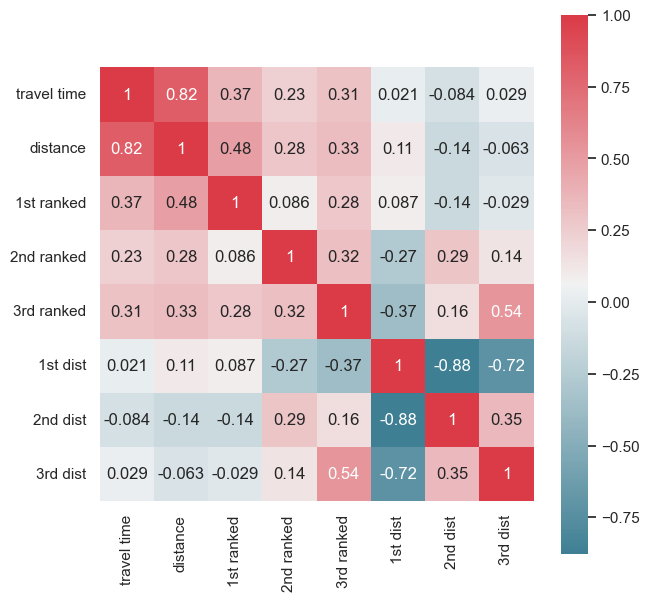

In [352]:
# run correlation matrix and plot
f, ax = plt.subplots(figsize=(7,7))
corr = df7.corr()
sns.heatmap(corr,annot=True, mask=np.zeros_like(corr,dtype=np.bool),
           cmap=sns.diverging_palette(220,10, as_cmap=True),
           square=True, ax=ax)

In [342]:
x = np.array(df7[['distance','1st ranked','2nd ranked','3rd ranked','1st dist','2nd dist','3rd dist']])
y = np.array(df7['travel time'])
x

array([[1.78386240e+04, 9.02514286e+02, 8.27741905e+02, ...,
        9.44673647e-01, 4.03805809e-02, 1.41088236e-02],
       [1.74857240e+04, 9.02514286e+02, 8.27741905e+02, ...,
        9.44410881e-01, 4.11955490e-02, 1.43935704e-02],
       [9.83759100e+03, 9.02514286e+02, 7.77021942e+02, ...,
        8.22350411e-01, 7.27455533e-02, 5.38663378e-02],
       ...,
       [1.27097900e+04, 9.02514286e+02, 7.64823968e+02, ...,
        7.51602741e-01, 1.93548910e-01, 3.40328204e-02],
       [2.22832460e+04, 9.02514286e+02, 1.07012021e+03, ...,
        9.18879682e-01, 5.92875024e-02, 2.18328156e-02],
       [6.33710000e+03, 9.02514286e+02, 8.27741905e+02, ...,
        6.33142762e-01, 2.03602436e-01, 1.47138281e-01]])

In [343]:
#split data into test & train
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [344]:
print(X_train.shape)
print(X_test.shape)
# X_train

(6625, 7)
(1657, 7)


In [345]:
# inputs: distance +  1st & 2nd & 3rd dominant road + road length contribution
model5_1_1 = nnmodel_(50, num_hlayers=1,Epoch=500)
model5_1_1

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 79196.4609 - mape: 26.6608 - rmse: 281.4187 - val_loss: 56917.2383 - val_mape: 22.2368 - val_rmse: 238.5733
Epoch 2/500
208/208 [==============================] - 0s 803us/step - loss: 68497.7266 - mape: 24.8671 - rmse: 261.7207 - val_loss: 56490.2109 - val_mape: 25.1328 - val_rmse: 237.6767
Epoch 3/500
208/208 [==============================] - 0s 801us/step - loss: 68725.3281 - mape: 25.0695 - rmse: 262.1552 - val_loss: 56202.5742 - val_mape: 21.5914 - val_rmse: 237.0708
Epoch 4/500
208/208 [==============================] - 0s 817us/step - loss: 69722.2109 - mape: 24.7926 - rmse: 264.0497 - val_loss: 56436.4180 - val_mape: 24.8912 - val_rmse: 237.5635
Epoch 5/500
208/208 [==============================] - 0s 793us/step - loss: 68984.6562 - mape: 24.9072 - rmse: 262.6493 - val_loss: 55508.2109 - val_mape: 23.3698 - val_rmse: 235.6018
Epoch 6/500
208/208 [==============================] - 0s 821us/step - loss: 

208/208 [==============================] - 0s 778us/step - loss: 65409.9414 - mape: 24.2595 - rmse: 255.7537 - val_loss: 54619.0234 - val_mape: 22.4405 - val_rmse: 233.7071
Epoch 90/500
208/208 [==============================] - 0s 774us/step - loss: 63903.3594 - mape: 23.9912 - rmse: 252.7911 - val_loss: 54715.8086 - val_mape: 22.7324 - val_rmse: 233.9141
Epoch 91/500
208/208 [==============================] - 0s 789us/step - loss: 63236.0156 - mape: 23.7307 - rmse: 251.4677 - val_loss: 54512.1641 - val_mape: 22.3640 - val_rmse: 233.4784
Epoch 92/500
208/208 [==============================] - 0s 775us/step - loss: 63320.9727 - mape: 23.7252 - rmse: 251.6366 - val_loss: 55299.0000 - val_mape: 24.4031 - val_rmse: 235.1574
Epoch 93/500
208/208 [==============================] - 0s 789us/step - loss: 62853.8398 - mape: 23.7684 - rmse: 250.7067 - val_loss: 54613.4375 - val_mape: 22.9744 - val_rmse: 233.6952
Epoch 94/500
208/208 [==============================] - 0s 779us/step - loss: 62708

Epoch 133/500
208/208 [==============================] - 0s 783us/step - loss: 62120.1016 - mape: 23.4670 - rmse: 249.2390 - val_loss: 53461.6211 - val_mape: 23.0821 - val_rmse: 231.2177
Epoch 134/500
208/208 [==============================] - 0s 789us/step - loss: 61617.6836 - mape: 23.5147 - rmse: 248.2291 - val_loss: 53901.5898 - val_mape: 21.9109 - val_rmse: 232.1672
Epoch 135/500
208/208 [==============================] - 0s 798us/step - loss: 61770.1523 - mape: 23.6339 - rmse: 248.5360 - val_loss: 53334.2461 - val_mape: 21.6732 - val_rmse: 230.9421
Epoch 136/500
208/208 [==============================] - 0s 796us/step - loss: 61951.3906 - mape: 23.4903 - rmse: 248.9004 - val_loss: 57924.1484 - val_mape: 20.9223 - val_rmse: 240.6744
Epoch 137/500
208/208 [==============================] - 0s 793us/step - loss: 62355.0039 - mape: 23.7037 - rmse: 249.7098 - val_loss: 53907.5195 - val_mape: 23.0739 - val_rmse: 232.1799
Epoch 138/500
208/208 [==============================] - 0s 801us

Epoch 177/500
208/208 [==============================] - 0s 784us/step - loss: 61646.8945 - mape: 23.4400 - rmse: 248.2879 - val_loss: 53763.0078 - val_mape: 23.7466 - val_rmse: 231.8685
Epoch 178/500
208/208 [==============================] - 0s 791us/step - loss: 61317.3242 - mape: 23.3590 - rmse: 247.6234 - val_loss: 53561.7148 - val_mape: 22.8846 - val_rmse: 231.4340
Epoch 179/500
208/208 [==============================] - 0s 801us/step - loss: 61263.8242 - mape: 23.2916 - rmse: 247.5153 - val_loss: 55444.3320 - val_mape: 21.6465 - val_rmse: 235.4662
Epoch 180/500
208/208 [==============================] - 0s 779us/step - loss: 61418.3789 - mape: 23.5401 - rmse: 247.8273 - val_loss: 54008.2188 - val_mape: 24.0703 - val_rmse: 232.3967
Epoch 181/500
208/208 [==============================] - 0s 780us/step - loss: 61251.7773 - mape: 23.3642 - rmse: 247.4910 - val_loss: 53532.3516 - val_mape: 22.7546 - val_rmse: 231.3706
Epoch 182/500
208/208 [==============================] - 0s 788us

Epoch 221/500
208/208 [==============================] - 0s 801us/step - loss: 61118.5117 - mape: 23.3357 - rmse: 247.2216 - val_loss: 53385.9219 - val_mape: 22.4433 - val_rmse: 231.0539
Epoch 222/500
208/208 [==============================] - 0s 794us/step - loss: 61122.3633 - mape: 23.4761 - rmse: 247.2294 - val_loss: 53913.3281 - val_mape: 23.0523 - val_rmse: 232.1924
Epoch 223/500
208/208 [==============================] - 0s 785us/step - loss: 61874.8242 - mape: 23.6991 - rmse: 248.7465 - val_loss: 53645.7539 - val_mape: 22.7906 - val_rmse: 231.6155
Epoch 224/500
208/208 [==============================] - 0s 784us/step - loss: 61165.0938 - mape: 23.3394 - rmse: 247.3158 - val_loss: 54374.4375 - val_mape: 21.7371 - val_rmse: 233.1833
Epoch 225/500
208/208 [==============================] - 0s 788us/step - loss: 60931.4570 - mape: 23.3906 - rmse: 246.8430 - val_loss: 53536.9609 - val_mape: 22.0590 - val_rmse: 231.3806
Epoch 226/500
208/208 [==============================] - 0s 793us

Epoch 265/500
208/208 [==============================] - 0s 797us/step - loss: 61443.6016 - mape: 23.4328 - rmse: 247.8782 - val_loss: 56764.4023 - val_mape: 21.0753 - val_rmse: 238.2528
Epoch 266/500
208/208 [==============================] - 0s 796us/step - loss: 61061.1797 - mape: 23.4199 - rmse: 247.1056 - val_loss: 54763.2070 - val_mape: 23.3323 - val_rmse: 234.0154
Epoch 267/500
208/208 [==============================] - 0s 790us/step - loss: 61960.4141 - mape: 23.4303 - rmse: 248.9185 - val_loss: 54319.6133 - val_mape: 20.8732 - val_rmse: 233.0657
Epoch 268/500
208/208 [==============================] - 0s 784us/step - loss: 61151.9727 - mape: 23.2103 - rmse: 247.2892 - val_loss: 54557.4844 - val_mape: 23.9626 - val_rmse: 233.5754
Epoch 269/500
208/208 [==============================] - 0s 786us/step - loss: 61028.3359 - mape: 23.3750 - rmse: 247.0391 - val_loss: 53878.2266 - val_mape: 21.5483 - val_rmse: 232.1168
Epoch 270/500
208/208 [==============================] - 0s 785us

Epoch 309/500
208/208 [==============================] - 0s 787us/step - loss: 60842.8359 - mape: 23.3702 - rmse: 246.6634 - val_loss: 53375.0820 - val_mape: 22.3592 - val_rmse: 231.0305
Epoch 310/500
208/208 [==============================] - 0s 782us/step - loss: 60615.3672 - mape: 23.0961 - rmse: 246.2019 - val_loss: 53357.2188 - val_mape: 22.4587 - val_rmse: 230.9918
Epoch 311/500
208/208 [==============================] - 0s 796us/step - loss: 60569.4297 - mape: 23.3889 - rmse: 246.1086 - val_loss: 53477.9688 - val_mape: 22.3565 - val_rmse: 231.2530
Epoch 312/500
208/208 [==============================] - 0s 797us/step - loss: 60656.4336 - mape: 23.1324 - rmse: 246.2853 - val_loss: 53299.3359 - val_mape: 22.6587 - val_rmse: 230.8665
Epoch 313/500
208/208 [==============================] - 0s 787us/step - loss: 61483.2852 - mape: 23.4310 - rmse: 247.9582 - val_loss: 53364.2578 - val_mape: 22.1313 - val_rmse: 231.0070
Epoch 314/500
208/208 [==============================] - 0s 788us

Epoch 353/500
208/208 [==============================] - 0s 792us/step - loss: 60690.1602 - mape: 23.3198 - rmse: 246.3537 - val_loss: 53547.9453 - val_mape: 21.9712 - val_rmse: 231.4043
Epoch 354/500
208/208 [==============================] - 0s 800us/step - loss: 60393.7344 - mape: 23.2567 - rmse: 245.7514 - val_loss: 56243.9883 - val_mape: 25.9380 - val_rmse: 237.1582
Epoch 355/500
208/208 [==============================] - 0s 797us/step - loss: 60371.1914 - mape: 23.3583 - rmse: 245.7055 - val_loss: 53248.7930 - val_mape: 22.3093 - val_rmse: 230.7570
Epoch 356/500
208/208 [==============================] - 0s 794us/step - loss: 60547.6719 - mape: 23.2962 - rmse: 246.0644 - val_loss: 53733.3164 - val_mape: 23.4932 - val_rmse: 231.8045
Epoch 357/500
208/208 [==============================] - 0s 797us/step - loss: 60609.2109 - mape: 23.3776 - rmse: 246.1894 - val_loss: 54475.9883 - val_mape: 24.1089 - val_rmse: 233.4009
Epoch 358/500
208/208 [==============================] - 0s 803us

Epoch 397/500
208/208 [==============================] - 0s 783us/step - loss: 60207.5430 - mape: 23.1401 - rmse: 245.3723 - val_loss: 53385.0156 - val_mape: 21.7435 - val_rmse: 231.0520
Epoch 398/500
208/208 [==============================] - 0s 790us/step - loss: 60265.5195 - mape: 23.2705 - rmse: 245.4904 - val_loss: 53504.3438 - val_mape: 22.4745 - val_rmse: 231.3101
Epoch 399/500
208/208 [==============================] - 0s 782us/step - loss: 60161.2812 - mape: 23.1103 - rmse: 245.2780 - val_loss: 53360.5078 - val_mape: 23.0098 - val_rmse: 230.9989
Epoch 400/500
208/208 [==============================] - 0s 784us/step - loss: 60333.1328 - mape: 23.2872 - rmse: 245.6280 - val_loss: 53609.8750 - val_mape: 22.9187 - val_rmse: 231.5381
Epoch 401/500
208/208 [==============================] - 0s 781us/step - loss: 60429.3750 - mape: 23.2742 - rmse: 245.8239 - val_loss: 54133.7305 - val_mape: 24.4421 - val_rmse: 232.6666
Epoch 402/500
208/208 [==============================] - 0s 776us

Epoch 441/500
208/208 [==============================] - 0s 792us/step - loss: 59913.3555 - mape: 23.2527 - rmse: 244.7720 - val_loss: 53825.3320 - val_mape: 23.3490 - val_rmse: 232.0029
Epoch 442/500
208/208 [==============================] - 0s 783us/step - loss: 60215.5078 - mape: 23.2918 - rmse: 245.3885 - val_loss: 53322.0391 - val_mape: 22.1054 - val_rmse: 230.9156
Epoch 443/500
208/208 [==============================] - 0s 784us/step - loss: 60255.9414 - mape: 23.0411 - rmse: 245.4709 - val_loss: 53422.5820 - val_mape: 23.2111 - val_rmse: 231.1333
Epoch 444/500
208/208 [==============================] - 0s 781us/step - loss: 60189.3047 - mape: 23.1213 - rmse: 245.3351 - val_loss: 53793.7969 - val_mape: 22.8942 - val_rmse: 231.9349
Epoch 445/500
208/208 [==============================] - 0s 782us/step - loss: 60361.3789 - mape: 23.3641 - rmse: 245.6855 - val_loss: 53867.0039 - val_mape: 23.8117 - val_rmse: 232.0927
Epoch 446/500
208/208 [==============================] - 0s 793us

Epoch 485/500
208/208 [==============================] - 0s 788us/step - loss: 60138.6523 - mape: 23.3125 - rmse: 245.2318 - val_loss: 53428.3438 - val_mape: 22.6962 - val_rmse: 231.1457
Epoch 486/500
208/208 [==============================] - 0s 789us/step - loss: 60138.9453 - mape: 23.0810 - rmse: 245.2324 - val_loss: 53933.5234 - val_mape: 23.1968 - val_rmse: 232.2359
Epoch 487/500
208/208 [==============================] - 0s 789us/step - loss: 60150.0586 - mape: 23.1750 - rmse: 245.2551 - val_loss: 53665.1445 - val_mape: 23.1279 - val_rmse: 231.6574
Epoch 488/500
208/208 [==============================] - 0s 793us/step - loss: 60186.6445 - mape: 23.3591 - rmse: 245.3297 - val_loss: 53901.8320 - val_mape: 23.7545 - val_rmse: 232.1677
Epoch 489/500
208/208 [==============================] - 0s 796us/step - loss: 60214.5430 - mape: 23.2704 - rmse: 245.3865 - val_loss: 54205.6719 - val_mape: 24.1274 - val_rmse: 232.8211
Epoch 490/500
208/208 [==============================] - 0s 792us

In [346]:
# inputs: distance +  1st & 2nd & 3rd dominant road + road length contribution
model5_1_2 = nnmodel_(100, num_hlayers=1,Epoch=500)
model5_1_2

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 78634.3750 - mape: 25.7346 - rmse: 280.4182 - val_loss: 65102.8203 - val_mape: 27.4425 - val_rmse: 255.1525
Epoch 2/500
208/208 [==============================] - 0s 807us/step - loss: 69497.0000 - mape: 24.6296 - rmse: 263.6228 - val_loss: 55561.3672 - val_mape: 22.2208 - val_rmse: 235.7146
Epoch 3/500
208/208 [==============================] - 0s 804us/step - loss: 67738.3359 - mape: 24.4764 - rmse: 260.2659 - val_loss: 59291.7891 - val_mape: 25.3766 - val_rmse: 243.4991
Epoch 4/500
208/208 [==============================] - 0s 795us/step - loss: 70733.7656 - mape: 25.1299 - rmse: 265.9582 - val_loss: 55497.1016 - val_mape: 23.2051 - val_rmse: 235.5782
Epoch 5/500
208/208 [==============================] - 0s 795us/step - loss: 67191.0547 - mape: 24.0530 - rmse: 259.2124 - val_loss: 128300.1094 - val_mape: 27.5475 - val_rmse: 358.1900
Epoch 6/500
208/208 [==============================] - 0s 809us/step - loss:

208/208 [==============================] - 0s 789us/step - loss: 64238.5273 - mape: 24.0866 - rmse: 253.4532 - val_loss: 54576.4297 - val_mape: 22.5868 - val_rmse: 233.6160
Epoch 90/500
208/208 [==============================] - 0s 792us/step - loss: 62413.6172 - mape: 23.5790 - rmse: 249.8272 - val_loss: 54787.1289 - val_mape: 24.0305 - val_rmse: 234.0665
Epoch 91/500
208/208 [==============================] - 0s 779us/step - loss: 61935.9336 - mape: 23.6631 - rmse: 248.8693 - val_loss: 66155.0078 - val_mape: 28.3191 - val_rmse: 257.2061
Epoch 92/500
208/208 [==============================] - 0s 778us/step - loss: 62439.5195 - mape: 23.5445 - rmse: 249.8790 - val_loss: 55797.1406 - val_mape: 24.8279 - val_rmse: 236.2142
Epoch 93/500
208/208 [==============================] - 0s 781us/step - loss: 61719.1992 - mape: 23.5772 - rmse: 248.4335 - val_loss: 53762.6680 - val_mape: 21.8401 - val_rmse: 231.8678
Epoch 94/500
208/208 [==============================] - 0s 780us/step - loss: 61710

Epoch 133/500
208/208 [==============================] - 0s 768us/step - loss: 61248.4336 - mape: 23.3994 - rmse: 247.4842 - val_loss: 53547.2148 - val_mape: 22.9650 - val_rmse: 231.4027
Epoch 134/500
208/208 [==============================] - 0s 769us/step - loss: 61954.4258 - mape: 23.5665 - rmse: 248.9065 - val_loss: 53857.1289 - val_mape: 22.5977 - val_rmse: 232.0714
Epoch 135/500
208/208 [==============================] - 0s 781us/step - loss: 61852.2383 - mape: 23.5236 - rmse: 248.7011 - val_loss: 53332.1562 - val_mape: 22.2192 - val_rmse: 230.9376
Epoch 136/500
208/208 [==============================] - 0s 775us/step - loss: 61440.8984 - mape: 23.5267 - rmse: 247.8727 - val_loss: 60067.0703 - val_mape: 25.5098 - val_rmse: 245.0858
Epoch 137/500
208/208 [==============================] - 0s 781us/step - loss: 61334.7695 - mape: 23.3899 - rmse: 247.6586 - val_loss: 58119.8320 - val_mape: 25.9794 - val_rmse: 241.0806
Epoch 138/500
208/208 [==============================] - 0s 761us

Epoch 177/500
208/208 [==============================] - 0s 776us/step - loss: 61053.4336 - mape: 23.6158 - rmse: 247.0899 - val_loss: 64502.1719 - val_mape: 21.9459 - val_rmse: 253.9728
Epoch 178/500
208/208 [==============================] - 0s 780us/step - loss: 62936.1758 - mape: 23.6899 - rmse: 250.8708 - val_loss: 53452.4453 - val_mape: 23.0099 - val_rmse: 231.1978
Epoch 179/500
208/208 [==============================] - 0s 785us/step - loss: 60676.2070 - mape: 23.3347 - rmse: 246.3254 - val_loss: 53759.4102 - val_mape: 21.2047 - val_rmse: 231.8608
Epoch 180/500
208/208 [==============================] - 0s 776us/step - loss: 61053.7773 - mape: 23.3694 - rmse: 247.0906 - val_loss: 53797.9531 - val_mape: 22.3994 - val_rmse: 231.9439
Epoch 181/500
208/208 [==============================] - 0s 774us/step - loss: 60744.3398 - mape: 23.3937 - rmse: 246.4637 - val_loss: 57509.6094 - val_mape: 24.4801 - val_rmse: 239.8116
Epoch 182/500
208/208 [==============================] - 0s 782us

Epoch 221/500
208/208 [==============================] - 0s 786us/step - loss: 60980.3594 - mape: 23.5941 - rmse: 246.9420 - val_loss: 55096.7539 - val_mape: 23.8593 - val_rmse: 234.7270
Epoch 222/500
208/208 [==============================] - 0s 790us/step - loss: 61253.3984 - mape: 23.4360 - rmse: 247.4942 - val_loss: 53792.8164 - val_mape: 21.6738 - val_rmse: 231.9328
Epoch 223/500
208/208 [==============================] - 0s 784us/step - loss: 61468.5234 - mape: 23.3888 - rmse: 247.9285 - val_loss: 55123.3125 - val_mape: 23.3242 - val_rmse: 234.7835
Epoch 224/500
208/208 [==============================] - 0s 788us/step - loss: 60795.3867 - mape: 23.1314 - rmse: 246.5672 - val_loss: 55928.2188 - val_mape: 25.8118 - val_rmse: 236.4915
Epoch 225/500
208/208 [==============================] - 0s 790us/step - loss: 60796.2031 - mape: 23.5008 - rmse: 246.5689 - val_loss: 53542.1523 - val_mape: 23.1353 - val_rmse: 231.3918
Epoch 226/500
208/208 [==============================] - 0s 779us

Epoch 265/500
208/208 [==============================] - 0s 777us/step - loss: 60478.2617 - mape: 23.2822 - rmse: 245.9233 - val_loss: 53486.9180 - val_mape: 21.8695 - val_rmse: 231.2724
Epoch 266/500
208/208 [==============================] - 0s 773us/step - loss: 60352.1602 - mape: 23.2667 - rmse: 245.6668 - val_loss: 53700.3398 - val_mape: 22.5516 - val_rmse: 231.7333
Epoch 267/500
208/208 [==============================] - 0s 788us/step - loss: 60320.5039 - mape: 23.1467 - rmse: 245.6023 - val_loss: 53904.1211 - val_mape: 23.2436 - val_rmse: 232.1726
Epoch 268/500
208/208 [==============================] - 0s 770us/step - loss: 60373.4492 - mape: 23.1354 - rmse: 245.7101 - val_loss: 53889.4062 - val_mape: 24.3970 - val_rmse: 232.1409
Epoch 269/500
208/208 [==============================] - 0s 779us/step - loss: 60598.8359 - mape: 23.4180 - rmse: 246.1683 - val_loss: 53958.8320 - val_mape: 22.6399 - val_rmse: 232.2904
Epoch 270/500
208/208 [==============================] - 0s 781us

Epoch 309/500
208/208 [==============================] - 0s 778us/step - loss: 60327.0586 - mape: 23.2857 - rmse: 245.6157 - val_loss: 53344.7734 - val_mape: 21.8906 - val_rmse: 230.9649
Epoch 310/500
208/208 [==============================] - 0s 786us/step - loss: 60113.0547 - mape: 23.1997 - rmse: 245.1796 - val_loss: 53385.4258 - val_mape: 21.8712 - val_rmse: 231.0529
Epoch 311/500
208/208 [==============================] - 0s 783us/step - loss: 60297.3477 - mape: 23.2112 - rmse: 245.5552 - val_loss: 55713.5586 - val_mape: 25.8605 - val_rmse: 236.0372
Epoch 312/500
208/208 [==============================] - 0s 787us/step - loss: 61405.6992 - mape: 24.3088 - rmse: 247.8017 - val_loss: 55507.9258 - val_mape: 24.8188 - val_rmse: 235.6012
Epoch 313/500
208/208 [==============================] - 0s 788us/step - loss: 60780.8320 - mape: 23.6318 - rmse: 246.5377 - val_loss: 53216.8945 - val_mape: 21.7227 - val_rmse: 230.6879
Epoch 314/500
208/208 [==============================] - 0s 791us

Epoch 353/500
208/208 [==============================] - 0s 778us/step - loss: 60737.9258 - mape: 23.4962 - rmse: 246.4507 - val_loss: 54996.8750 - val_mape: 25.4578 - val_rmse: 234.5141
Epoch 354/500
208/208 [==============================] - 0s 781us/step - loss: 60286.1953 - mape: 23.2096 - rmse: 245.5325 - val_loss: 55912.3750 - val_mape: 26.2854 - val_rmse: 236.4580
Epoch 355/500
208/208 [==============================] - 0s 775us/step - loss: 60479.4219 - mape: 23.4729 - rmse: 245.9256 - val_loss: 53433.6133 - val_mape: 22.4567 - val_rmse: 231.1571
Epoch 356/500
208/208 [==============================] - 0s 782us/step - loss: 60280.6406 - mape: 23.3830 - rmse: 245.5212 - val_loss: 53906.9180 - val_mape: 23.7993 - val_rmse: 232.1786
Epoch 357/500
208/208 [==============================] - 0s 788us/step - loss: 60234.8516 - mape: 23.3326 - rmse: 245.4279 - val_loss: 53794.5156 - val_mape: 21.6514 - val_rmse: 231.9364
Epoch 358/500
208/208 [==============================] - 0s 786us

Epoch 397/500
208/208 [==============================] - 0s 794us/step - loss: 60237.9922 - mape: 23.2488 - rmse: 245.4343 - val_loss: 53959.8633 - val_mape: 23.3627 - val_rmse: 232.2926
Epoch 398/500
208/208 [==============================] - 0s 785us/step - loss: 60298.1914 - mape: 23.1612 - rmse: 245.5569 - val_loss: 54380.6914 - val_mape: 23.9513 - val_rmse: 233.1967
Epoch 399/500
208/208 [==============================] - 0s 787us/step - loss: 60285.4492 - mape: 23.3486 - rmse: 245.5310 - val_loss: 53428.6680 - val_mape: 22.2370 - val_rmse: 231.1464
Epoch 400/500
208/208 [==============================] - 0s 786us/step - loss: 60299.7461 - mape: 23.2266 - rmse: 245.5601 - val_loss: 53307.1758 - val_mape: 22.8655 - val_rmse: 230.8835
Epoch 401/500
208/208 [==============================] - 0s 791us/step - loss: 60336.5859 - mape: 23.0844 - rmse: 245.6351 - val_loss: 54287.4258 - val_mape: 24.5492 - val_rmse: 232.9966
Epoch 402/500
208/208 [==============================] - 0s 790us

Epoch 441/500
208/208 [==============================] - 0s 782us/step - loss: 60265.7617 - mape: 23.2831 - rmse: 245.4909 - val_loss: 53240.6523 - val_mape: 22.9611 - val_rmse: 230.7394
Epoch 442/500
208/208 [==============================] - 0s 782us/step - loss: 60005.7539 - mape: 23.2365 - rmse: 244.9607 - val_loss: 54016.2812 - val_mape: 22.4237 - val_rmse: 232.4140
Epoch 443/500
208/208 [==============================] - 0s 773us/step - loss: 60161.5078 - mape: 23.2323 - rmse: 245.2784 - val_loss: 53358.9922 - val_mape: 21.5558 - val_rmse: 230.9957
Epoch 444/500
208/208 [==============================] - 0s 776us/step - loss: 60272.7422 - mape: 23.2024 - rmse: 245.5051 - val_loss: 53268.7188 - val_mape: 21.8775 - val_rmse: 230.8002
Epoch 445/500
208/208 [==============================] - 0s 784us/step - loss: 60299.9609 - mape: 23.1631 - rmse: 245.5605 - val_loss: 53458.7266 - val_mape: 22.6193 - val_rmse: 231.2114
Epoch 446/500
208/208 [==============================] - 0s 784us

Epoch 485/500
208/208 [==============================] - 0s 771us/step - loss: 60112.4375 - mape: 23.2087 - rmse: 245.1784 - val_loss: 53140.5703 - val_mape: 23.2675 - val_rmse: 230.5224
Epoch 486/500
208/208 [==============================] - 0s 770us/step - loss: 60352.4922 - mape: 23.4180 - rmse: 245.6674 - val_loss: 53282.3477 - val_mape: 23.0159 - val_rmse: 230.8297
Epoch 487/500
208/208 [==============================] - 0s 785us/step - loss: 59902.9258 - mape: 23.2270 - rmse: 244.7507 - val_loss: 53520.5508 - val_mape: 21.3080 - val_rmse: 231.3451
Epoch 488/500
208/208 [==============================] - 0s 774us/step - loss: 59970.7148 - mape: 23.1901 - rmse: 244.8892 - val_loss: 53045.2617 - val_mape: 22.5011 - val_rmse: 230.3156
Epoch 489/500
208/208 [==============================] - 0s 776us/step - loss: 60163.6758 - mape: 23.3611 - rmse: 245.2829 - val_loss: 53459.9453 - val_mape: 22.7926 - val_rmse: 231.2141
Epoch 490/500
208/208 [==============================] - 0s 773us

In [354]:
# inputs: distance + 1st & 2nd & 3rd dominant road + road length contribution
model5_1_3 = nnmodel_(300, num_hlayers=1,Epoch=500)
model5_1_3

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 77054.8750 - mape: 26.2738 - rmse: 277.5876 - val_loss: 55649.8477 - val_mape: 22.5966 - val_rmse: 235.9022
Epoch 2/500
208/208 [==============================] - 0s 945us/step - loss: 74982.1406 - mape: 25.6488 - rmse: 273.8287 - val_loss: 67110.8281 - val_mape: 27.9635 - val_rmse: 259.0576
Epoch 3/500
208/208 [==============================] - 0s 817us/step - loss: 75322.7734 - mape: 25.9315 - rmse: 274.4500 - val_loss: 57112.9375 - val_mape: 24.9113 - val_rmse: 238.9831
Epoch 4/500
208/208 [==============================] - 0s 828us/step - loss: 68673.8125 - mape: 24.8817 - rmse: 262.0569 - val_loss: 59034.9062 - val_mape: 20.5656 - val_rmse: 242.9710
Epoch 5/500
208/208 [==============================] - 0s 835us/step - loss: 75474.4375 - mape: 25.3655 - rmse: 274.7261 - val_loss: 55562.6758 - val_mape: 23.7743 - val_rmse: 235.7174
Epoch 6/500
208/208 [==============================] - 0s 827us/step - loss: 

208/208 [==============================] - 0s 820us/step - loss: 61156.0234 - mape: 23.4539 - rmse: 247.2974 - val_loss: 58073.0820 - val_mape: 26.0230 - val_rmse: 240.9836
Epoch 90/500
208/208 [==============================] - 0s 815us/step - loss: 61284.0195 - mape: 23.4265 - rmse: 247.5561 - val_loss: 53875.8086 - val_mape: 23.3673 - val_rmse: 232.1116
Epoch 91/500
208/208 [==============================] - 0s 793us/step - loss: 61961.4062 - mape: 23.6597 - rmse: 248.9205 - val_loss: 57861.3828 - val_mape: 23.1191 - val_rmse: 240.5439
Epoch 92/500
208/208 [==============================] - 0s 813us/step - loss: 62374.7461 - mape: 23.5567 - rmse: 249.7494 - val_loss: 54804.8164 - val_mape: 23.9398 - val_rmse: 234.1043
Epoch 93/500
208/208 [==============================] - 0s 838us/step - loss: 61425.5469 - mape: 23.5032 - rmse: 247.8418 - val_loss: 53623.8359 - val_mape: 22.6100 - val_rmse: 231.5682
Epoch 94/500
208/208 [==============================] - 0s 810us/step - loss: 61411

Epoch 133/500
208/208 [==============================] - 0s 815us/step - loss: 60809.8984 - mape: 23.3467 - rmse: 246.5966 - val_loss: 54559.5898 - val_mape: 25.0890 - val_rmse: 233.5799
Epoch 134/500
208/208 [==============================] - 0s 811us/step - loss: 60624.2148 - mape: 23.3965 - rmse: 246.2198 - val_loss: 55364.5156 - val_mape: 25.3188 - val_rmse: 235.2967
Epoch 135/500
208/208 [==============================] - 0s 816us/step - loss: 60751.1875 - mape: 23.5417 - rmse: 246.4776 - val_loss: 54011.0859 - val_mape: 23.8263 - val_rmse: 232.4028
Epoch 136/500
208/208 [==============================] - 0s 808us/step - loss: 60971.4492 - mape: 23.4746 - rmse: 246.9240 - val_loss: 54334.5195 - val_mape: 23.2615 - val_rmse: 233.0977
Epoch 137/500
208/208 [==============================] - 0s 808us/step - loss: 61011.2695 - mape: 23.3634 - rmse: 247.0046 - val_loss: 53813.9258 - val_mape: 24.1822 - val_rmse: 231.9783
Epoch 138/500
208/208 [==============================] - 0s 817us

Epoch 177/500
208/208 [==============================] - 0s 803us/step - loss: 62294.5508 - mape: 24.2478 - rmse: 249.5888 - val_loss: 54113.7656 - val_mape: 23.1264 - val_rmse: 232.6237
Epoch 178/500
208/208 [==============================] - 0s 823us/step - loss: 60667.4844 - mape: 23.3742 - rmse: 246.3077 - val_loss: 53432.1250 - val_mape: 22.8109 - val_rmse: 231.1539
Epoch 179/500
208/208 [==============================] - 0s 817us/step - loss: 60311.2188 - mape: 23.2837 - rmse: 245.5834 - val_loss: 53563.9922 - val_mape: 22.6330 - val_rmse: 231.4390
Epoch 180/500
208/208 [==============================] - 0s 811us/step - loss: 60532.1680 - mape: 23.2883 - rmse: 246.0329 - val_loss: 53409.8594 - val_mape: 23.4191 - val_rmse: 231.1057
Epoch 181/500
208/208 [==============================] - 0s 815us/step - loss: 60387.7031 - mape: 23.2415 - rmse: 245.7391 - val_loss: 54159.4297 - val_mape: 24.2625 - val_rmse: 232.7218
Epoch 182/500
208/208 [==============================] - 0s 813us

Epoch 221/500
208/208 [==============================] - 0s 861us/step - loss: 60206.5820 - mape: 23.3077 - rmse: 245.3703 - val_loss: 53935.2188 - val_mape: 23.3837 - val_rmse: 232.2396
Epoch 222/500
208/208 [==============================] - 0s 800us/step - loss: 60615.9219 - mape: 23.2906 - rmse: 246.2030 - val_loss: 53522.1016 - val_mape: 22.7293 - val_rmse: 231.3484
Epoch 223/500
208/208 [==============================] - 0s 819us/step - loss: 60553.4688 - mape: 23.4446 - rmse: 246.0761 - val_loss: 53532.8320 - val_mape: 22.1266 - val_rmse: 231.3716
Epoch 224/500
208/208 [==============================] - 0s 830us/step - loss: 60143.4414 - mape: 23.2179 - rmse: 245.2416 - val_loss: 53454.3164 - val_mape: 21.6401 - val_rmse: 231.2019
Epoch 225/500
208/208 [==============================] - 0s 836us/step - loss: 60778.7891 - mape: 23.4865 - rmse: 246.5335 - val_loss: 56018.9219 - val_mape: 24.7694 - val_rmse: 236.6832
Epoch 226/500
208/208 [==============================] - 0s 817us

Epoch 265/500
208/208 [==============================] - 0s 822us/step - loss: 60218.6680 - mape: 23.3132 - rmse: 245.3949 - val_loss: 54052.1406 - val_mape: 24.4704 - val_rmse: 232.4912
Epoch 266/500
208/208 [==============================] - 0s 808us/step - loss: 60154.4414 - mape: 23.4103 - rmse: 245.2640 - val_loss: 53457.8633 - val_mape: 23.1823 - val_rmse: 231.2096
Epoch 267/500
208/208 [==============================] - 0s 809us/step - loss: 60068.2891 - mape: 23.1972 - rmse: 245.0883 - val_loss: 54553.7227 - val_mape: 24.3839 - val_rmse: 233.5674
Epoch 268/500
208/208 [==============================] - 0s 809us/step - loss: 60026.1133 - mape: 23.4073 - rmse: 245.0023 - val_loss: 53196.6172 - val_mape: 21.9442 - val_rmse: 230.6439
Epoch 269/500
208/208 [==============================] - 0s 822us/step - loss: 60147.9883 - mape: 23.1083 - rmse: 245.2509 - val_loss: 56453.4688 - val_mape: 25.3447 - val_rmse: 237.5994
Epoch 270/500
208/208 [==============================] - 0s 818us

Epoch 309/500
208/208 [==============================] - 0s 806us/step - loss: 60201.5703 - mape: 23.0196 - rmse: 245.3601 - val_loss: 53460.4023 - val_mape: 23.3828 - val_rmse: 231.2151
Epoch 310/500
208/208 [==============================] - 0s 800us/step - loss: 60049.8008 - mape: 23.3749 - rmse: 245.0506 - val_loss: 53921.5703 - val_mape: 23.7069 - val_rmse: 232.2102
Epoch 311/500
208/208 [==============================] - 0s 807us/step - loss: 60125.2695 - mape: 23.3292 - rmse: 245.2045 - val_loss: 53124.0547 - val_mape: 22.9157 - val_rmse: 230.4866
Epoch 312/500
208/208 [==============================] - 0s 805us/step - loss: 59955.2148 - mape: 23.1172 - rmse: 244.8575 - val_loss: 53921.9062 - val_mape: 24.0704 - val_rmse: 232.2109
Epoch 313/500
208/208 [==============================] - 0s 801us/step - loss: 60093.4922 - mape: 23.2756 - rmse: 245.1397 - val_loss: 53305.9648 - val_mape: 23.6289 - val_rmse: 230.8808
Epoch 314/500
208/208 [==============================] - 0s 809us

Epoch 353/500
208/208 [==============================] - 0s 815us/step - loss: 60478.9102 - mape: 23.2454 - rmse: 245.9246 - val_loss: 54007.1641 - val_mape: 24.5365 - val_rmse: 232.3944
Epoch 354/500
208/208 [==============================] - 0s 809us/step - loss: 60061.2070 - mape: 23.2149 - rmse: 245.0739 - val_loss: 53943.2383 - val_mape: 24.9296 - val_rmse: 232.2568
Epoch 355/500
208/208 [==============================] - 0s 817us/step - loss: 59978.2969 - mape: 23.4149 - rmse: 244.9047 - val_loss: 53046.9336 - val_mape: 22.5146 - val_rmse: 230.3192
Epoch 356/500
208/208 [==============================] - 0s 820us/step - loss: 59639.8594 - mape: 23.0699 - rmse: 244.2127 - val_loss: 53306.3047 - val_mape: 22.4710 - val_rmse: 230.8816
Epoch 357/500
208/208 [==============================] - 0s 809us/step - loss: 60237.0820 - mape: 23.4210 - rmse: 245.4324 - val_loss: 53440.4922 - val_mape: 23.2465 - val_rmse: 231.1720
Epoch 358/500
208/208 [==============================] - 0s 815us

Epoch 397/500
208/208 [==============================] - 0s 809us/step - loss: 59910.4688 - mape: 23.1231 - rmse: 244.7661 - val_loss: 53397.6602 - val_mape: 22.6636 - val_rmse: 231.0793
Epoch 398/500
208/208 [==============================] - 0s 817us/step - loss: 59824.9297 - mape: 23.1260 - rmse: 244.5914 - val_loss: 55725.2930 - val_mape: 26.9241 - val_rmse: 236.0621
Epoch 399/500
208/208 [==============================] - 0s 817us/step - loss: 59992.6562 - mape: 23.3678 - rmse: 244.9340 - val_loss: 53368.7344 - val_mape: 23.4581 - val_rmse: 231.0167
Epoch 400/500
208/208 [==============================] - 0s 824us/step - loss: 59643.4414 - mape: 23.2504 - rmse: 244.2201 - val_loss: 53520.2695 - val_mape: 21.3192 - val_rmse: 231.3445
Epoch 401/500
208/208 [==============================] - 0s 807us/step - loss: 59882.8672 - mape: 23.1327 - rmse: 244.7098 - val_loss: 53027.8672 - val_mape: 22.5570 - val_rmse: 230.2778
Epoch 402/500
208/208 [==============================] - 0s 848us

Epoch 441/500
208/208 [==============================] - 0s 812us/step - loss: 59651.6523 - mape: 23.2208 - rmse: 244.2369 - val_loss: 53472.7539 - val_mape: 21.9310 - val_rmse: 231.2418
Epoch 442/500
208/208 [==============================] - 0s 803us/step - loss: 60039.1250 - mape: 23.1726 - rmse: 245.0288 - val_loss: 54950.3828 - val_mape: 26.7417 - val_rmse: 234.4150
Epoch 443/500
208/208 [==============================] - 0s 807us/step - loss: 59824.2070 - mape: 23.3389 - rmse: 244.5899 - val_loss: 53041.2148 - val_mape: 22.8839 - val_rmse: 230.3068
Epoch 444/500
208/208 [==============================] - 0s 834us/step - loss: 59698.9336 - mape: 23.1938 - rmse: 244.3336 - val_loss: 52989.5234 - val_mape: 22.9115 - val_rmse: 230.1945
Epoch 445/500
208/208 [==============================] - 0s 797us/step - loss: 59950.6758 - mape: 23.3097 - rmse: 244.8483 - val_loss: 54168.2031 - val_mape: 21.3988 - val_rmse: 232.7406
Epoch 446/500
208/208 [==============================] - 0s 805us

Epoch 485/500
208/208 [==============================] - 0s 817us/step - loss: 60035.0977 - mape: 23.2663 - rmse: 245.0206 - val_loss: 53344.2500 - val_mape: 24.2361 - val_rmse: 230.9637
Epoch 486/500
208/208 [==============================] - 0s 806us/step - loss: 59612.8477 - mape: 23.3612 - rmse: 244.1574 - val_loss: 52914.3750 - val_mape: 22.5089 - val_rmse: 230.0312
Epoch 487/500
208/208 [==============================] - 0s 813us/step - loss: 59891.0664 - mape: 23.2603 - rmse: 244.7265 - val_loss: 53431.8438 - val_mape: 24.2217 - val_rmse: 231.1533
Epoch 488/500
208/208 [==============================] - 0s 810us/step - loss: 59854.6797 - mape: 23.2734 - rmse: 244.6522 - val_loss: 53092.4609 - val_mape: 23.2023 - val_rmse: 230.4180
Epoch 489/500
208/208 [==============================] - 0s 806us/step - loss: 59607.5820 - mape: 23.0372 - rmse: 244.1466 - val_loss: 53787.8672 - val_mape: 24.6642 - val_rmse: 231.9221
Epoch 490/500
208/208 [==============================] - 0s 806us

In [360]:
# inputs: distance + hour + 1st & 2nd & 3rd dominant road + road length contribution
model5_1_4 = nnmodel_(100, 50, num_hlayers=2,Epoch=500)
model5_1_4

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 163164.1094 - mape: 31.3890 - rmse: 403.9358 - val_loss: 56449.3906 - val_mape: 21.0910 - val_rmse: 237.5908
Epoch 2/500
208/208 [==============================] - 0s 847us/step - loss: 72782.8984 - mape: 25.0094 - rmse: 269.7831 - val_loss: 55436.3438 - val_mape: 23.1823 - val_rmse: 235.4492
Epoch 3/500
208/208 [==============================] - 0s 862us/step - loss: 72133.9766 - mape: 25.4352 - rmse: 268.5777 - val_loss: 55298.7422 - val_mape: 21.1913 - val_rmse: 235.1568
Epoch 4/500
208/208 [==============================] - 0s 848us/step - loss: 73275.4531 - mape: 24.9459 - rmse: 270.6944 - val_loss: 57833.1250 - val_mape: 25.4884 - val_rmse: 240.4852
Epoch 5/500
208/208 [==============================] - 0s 855us/step - loss: 73280.0625 - mape: 25.2136 - rmse: 270.7029 - val_loss: 95990.8203 - val_mape: 24.0511 - val_rmse: 309.8239
Epoch 6/500
208/208 [==============================] - 0s 864us/step - loss:

208/208 [==============================] - 0s 830us/step - loss: 60789.4570 - mape: 23.5197 - rmse: 246.5552 - val_loss: 54288.5156 - val_mape: 23.0769 - val_rmse: 232.9990
Epoch 90/500
208/208 [==============================] - 0s 823us/step - loss: 61785.8320 - mape: 23.4611 - rmse: 248.5676 - val_loss: 53518.3398 - val_mape: 22.1927 - val_rmse: 231.3403
Epoch 91/500
208/208 [==============================] - 0s 844us/step - loss: 61049.2969 - mape: 23.4982 - rmse: 247.0816 - val_loss: 53547.2148 - val_mape: 22.1371 - val_rmse: 231.4027
Epoch 92/500
208/208 [==============================] - 0s 833us/step - loss: 60937.1875 - mape: 23.1695 - rmse: 246.8546 - val_loss: 57034.8438 - val_mape: 25.5107 - val_rmse: 238.8197
Epoch 93/500
208/208 [==============================] - 0s 842us/step - loss: 61581.8438 - mape: 23.5292 - rmse: 248.1569 - val_loss: 53797.7773 - val_mape: 22.9068 - val_rmse: 231.9435
Epoch 94/500
208/208 [==============================] - 0s 829us/step - loss: 61392

Epoch 133/500
208/208 [==============================] - 0s 836us/step - loss: 61592.3281 - mape: 23.4435 - rmse: 248.1780 - val_loss: 53132.5430 - val_mape: 23.0935 - val_rmse: 230.5050
Epoch 134/500
208/208 [==============================] - 0s 839us/step - loss: 60210.0508 - mape: 23.3914 - rmse: 245.3774 - val_loss: 54925.5625 - val_mape: 23.8076 - val_rmse: 234.3620
Epoch 135/500
208/208 [==============================] - 0s 836us/step - loss: 60406.1016 - mape: 23.3533 - rmse: 245.7765 - val_loss: 53193.3555 - val_mape: 22.1610 - val_rmse: 230.6368
Epoch 136/500
208/208 [==============================] - 0s 828us/step - loss: 61140.3438 - mape: 23.4495 - rmse: 247.2657 - val_loss: 53828.0859 - val_mape: 23.7885 - val_rmse: 232.0088
Epoch 137/500
208/208 [==============================] - 0s 842us/step - loss: 60084.0508 - mape: 23.2796 - rmse: 245.1205 - val_loss: 53399.3320 - val_mape: 23.2630 - val_rmse: 231.0830
Epoch 138/500
208/208 [==============================] - 0s 843us

Epoch 177/500
208/208 [==============================] - 0s 825us/step - loss: 60439.5859 - mape: 23.2984 - rmse: 245.8446 - val_loss: 54826.0078 - val_mape: 22.1385 - val_rmse: 234.1495
Epoch 178/500
208/208 [==============================] - 0s 846us/step - loss: 60057.8281 - mape: 23.3207 - rmse: 245.0670 - val_loss: 54167.7578 - val_mape: 22.3643 - val_rmse: 232.7397
Epoch 179/500
208/208 [==============================] - 0s 856us/step - loss: 59704.7930 - mape: 23.1814 - rmse: 244.3456 - val_loss: 53120.3477 - val_mape: 23.7990 - val_rmse: 230.4785
Epoch 180/500
208/208 [==============================] - 0s 834us/step - loss: 59887.6875 - mape: 23.4082 - rmse: 244.7196 - val_loss: 52801.2070 - val_mape: 22.9024 - val_rmse: 229.7851
Epoch 181/500
208/208 [==============================] - 0s 834us/step - loss: 59985.2617 - mape: 23.2086 - rmse: 244.9189 - val_loss: 53674.0117 - val_mape: 24.5012 - val_rmse: 231.6765
Epoch 182/500
208/208 [==============================] - 0s 839us

Epoch 221/500
208/208 [==============================] - 0s 838us/step - loss: 59713.2266 - mape: 23.1964 - rmse: 244.3629 - val_loss: 53817.6953 - val_mape: 24.9977 - val_rmse: 231.9864
Epoch 222/500
208/208 [==============================] - 0s 827us/step - loss: 59601.7031 - mape: 23.4822 - rmse: 244.1346 - val_loss: 52134.5547 - val_mape: 22.4051 - val_rmse: 228.3299
Epoch 223/500
208/208 [==============================] - 0s 841us/step - loss: 59507.1172 - mape: 22.9433 - rmse: 243.9408 - val_loss: 53594.6250 - val_mape: 25.5048 - val_rmse: 231.5051
Epoch 224/500
208/208 [==============================] - 0s 831us/step - loss: 59578.0352 - mape: 23.5422 - rmse: 244.0861 - val_loss: 54991.3594 - val_mape: 24.8762 - val_rmse: 234.5024
Epoch 225/500
208/208 [==============================] - 0s 841us/step - loss: 59269.3984 - mape: 23.1995 - rmse: 243.4531 - val_loss: 52724.5430 - val_mape: 21.9126 - val_rmse: 229.6183
Epoch 226/500
208/208 [==============================] - 0s 906us

Epoch 265/500
208/208 [==============================] - 0s 833us/step - loss: 59500.3594 - mape: 23.4943 - rmse: 243.9270 - val_loss: 54115.1523 - val_mape: 23.4771 - val_rmse: 232.6266
Epoch 266/500
208/208 [==============================] - 0s 837us/step - loss: 59646.0234 - mape: 23.1890 - rmse: 244.2254 - val_loss: 52211.5977 - val_mape: 22.9385 - val_rmse: 228.4986
Epoch 267/500
208/208 [==============================] - 0s 836us/step - loss: 59494.5078 - mape: 23.2166 - rmse: 243.9150 - val_loss: 54655.8008 - val_mape: 25.9049 - val_rmse: 233.7858
Epoch 268/500
208/208 [==============================] - 0s 835us/step - loss: 59440.8203 - mape: 23.3391 - rmse: 243.8049 - val_loss: 52855.3008 - val_mape: 22.9728 - val_rmse: 229.9028
Epoch 269/500
208/208 [==============================] - 0s 850us/step - loss: 59363.6953 - mape: 23.2566 - rmse: 243.6467 - val_loss: 53381.7695 - val_mape: 24.6189 - val_rmse: 231.0450
Epoch 270/500
208/208 [==============================] - 0s 841us

Epoch 309/500
208/208 [==============================] - 0s 844us/step - loss: 58794.8281 - mape: 23.1447 - rmse: 242.4765 - val_loss: 52707.2266 - val_mape: 22.5554 - val_rmse: 229.5806
Epoch 310/500
208/208 [==============================] - 0s 838us/step - loss: 58995.9844 - mape: 23.1155 - rmse: 242.8909 - val_loss: 52563.4961 - val_mape: 22.7112 - val_rmse: 229.2673
Epoch 311/500
208/208 [==============================] - 0s 826us/step - loss: 59105.1406 - mape: 23.2935 - rmse: 243.1155 - val_loss: 53034.4766 - val_mape: 22.4225 - val_rmse: 230.2922
Epoch 312/500
208/208 [==============================] - 0s 816us/step - loss: 59129.4727 - mape: 23.2180 - rmse: 243.1655 - val_loss: 52340.0977 - val_mape: 23.2905 - val_rmse: 228.7796
Epoch 313/500
208/208 [==============================] - 0s 835us/step - loss: 59106.6289 - mape: 23.1044 - rmse: 243.1185 - val_loss: 53183.3008 - val_mape: 24.9874 - val_rmse: 230.6151
Epoch 314/500
208/208 [==============================] - 0s 828us

Epoch 353/500
208/208 [==============================] - 0s 841us/step - loss: 58922.2734 - mape: 22.9443 - rmse: 242.7391 - val_loss: 53689.0078 - val_mape: 24.7883 - val_rmse: 231.7089
Epoch 354/500
208/208 [==============================] - 0s 848us/step - loss: 59411.2812 - mape: 23.1468 - rmse: 243.7443 - val_loss: 54563.8945 - val_mape: 24.5183 - val_rmse: 233.5892
Epoch 355/500
208/208 [==============================] - 0s 838us/step - loss: 59351.8125 - mape: 23.4386 - rmse: 243.6223 - val_loss: 52187.7422 - val_mape: 22.8575 - val_rmse: 228.4464
Epoch 356/500
208/208 [==============================] - 0s 833us/step - loss: 58803.2773 - mape: 23.0321 - rmse: 242.4939 - val_loss: 51852.0781 - val_mape: 23.0392 - val_rmse: 227.7105
Epoch 357/500
208/208 [==============================] - 0s 836us/step - loss: 58992.1523 - mape: 23.0764 - rmse: 242.8830 - val_loss: 52120.3281 - val_mape: 23.2239 - val_rmse: 228.2988
Epoch 358/500
208/208 [==============================] - 0s 821us

Epoch 397/500
208/208 [==============================] - 0s 838us/step - loss: 59083.3945 - mape: 23.1374 - rmse: 243.0708 - val_loss: 52250.7461 - val_mape: 21.9599 - val_rmse: 228.5842
Epoch 398/500
208/208 [==============================] - 0s 832us/step - loss: 58846.2070 - mape: 23.0028 - rmse: 242.5824 - val_loss: 51947.1641 - val_mape: 22.0777 - val_rmse: 227.9192
Epoch 399/500
208/208 [==============================] - 0s 843us/step - loss: 58858.8086 - mape: 23.3433 - rmse: 242.6083 - val_loss: 52809.9883 - val_mape: 23.3598 - val_rmse: 229.8042
Epoch 400/500
208/208 [==============================] - 0s 838us/step - loss: 59072.8906 - mape: 22.9781 - rmse: 243.0491 - val_loss: 53408.4492 - val_mape: 24.3488 - val_rmse: 231.1027
Epoch 401/500
208/208 [==============================] - 0s 819us/step - loss: 59036.0117 - mape: 23.1502 - rmse: 242.9733 - val_loss: 53336.4297 - val_mape: 23.1100 - val_rmse: 230.9468
Epoch 402/500
208/208 [==============================] - 0s 833us

Epoch 441/500
208/208 [==============================] - 0s 848us/step - loss: 58806.6055 - mape: 23.0849 - rmse: 242.5007 - val_loss: 52629.7773 - val_mape: 24.5386 - val_rmse: 229.4118
Epoch 442/500
208/208 [==============================] - 0s 805us/step - loss: 58551.4375 - mape: 23.1086 - rmse: 241.9740 - val_loss: 51943.5039 - val_mape: 22.2942 - val_rmse: 227.9112
Epoch 443/500
208/208 [==============================] - 0s 820us/step - loss: 58790.7227 - mape: 22.9932 - rmse: 242.4680 - val_loss: 53602.1445 - val_mape: 25.2218 - val_rmse: 231.5214
Epoch 444/500
208/208 [==============================] - 0s 815us/step - loss: 58837.8711 - mape: 23.1170 - rmse: 242.5652 - val_loss: 51644.7734 - val_mape: 23.5032 - val_rmse: 227.2549
Epoch 445/500
208/208 [==============================] - 0s 850us/step - loss: 58454.1953 - mape: 23.1083 - rmse: 241.7730 - val_loss: 52502.2461 - val_mape: 22.9141 - val_rmse: 229.1337
Epoch 446/500
208/208 [==============================] - 0s 842us

Epoch 485/500
208/208 [==============================] - 0s 805us/step - loss: 58574.2812 - mape: 23.5056 - rmse: 242.0212 - val_loss: 52400.9805 - val_mape: 22.3327 - val_rmse: 228.9126
Epoch 486/500
208/208 [==============================] - 0s 845us/step - loss: 58593.0156 - mape: 22.9321 - rmse: 242.0599 - val_loss: 53164.0664 - val_mape: 24.5960 - val_rmse: 230.5733
Epoch 487/500
208/208 [==============================] - 0s 830us/step - loss: 58937.7461 - mape: 23.3100 - rmse: 242.7710 - val_loss: 52800.3438 - val_mape: 22.8084 - val_rmse: 229.7832
Epoch 488/500
208/208 [==============================] - 0s 840us/step - loss: 58812.5820 - mape: 23.1041 - rmse: 242.5131 - val_loss: 53221.9336 - val_mape: 25.2617 - val_rmse: 230.6988
Epoch 489/500
208/208 [==============================] - 0s 833us/step - loss: 58350.9883 - mape: 23.2032 - rmse: 241.5595 - val_loss: 51705.5898 - val_mape: 23.0063 - val_rmse: 227.3886
Epoch 490/500
208/208 [==============================] - 0s 833us

In [361]:
# inputs: distance + 1st & 2nd & 3rd dominant road + road length contribution
model5_1_5 = nnmodel_(200, 100, num_hlayers=2,Epoch=500)
model5_1_5

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 85034.3984 - mape: 26.3336 - rmse: 291.6066 - val_loss: 110000.9688 - val_mape: 25.1022 - val_rmse: 331.6639
Epoch 2/500
208/208 [==============================] - 0s 931us/step - loss: 96167.5312 - mape: 27.8479 - rmse: 310.1089 - val_loss: 59616.8594 - val_mape: 21.8279 - val_rmse: 244.1656
Epoch 3/500
208/208 [==============================] - 0s 920us/step - loss: 80889.3594 - mape: 26.2627 - rmse: 284.4106 - val_loss: 55438.8320 - val_mape: 23.3961 - val_rmse: 235.4545
Epoch 4/500
208/208 [==============================] - 0s 908us/step - loss: 75673.8281 - mape: 25.5737 - rmse: 275.0888 - val_loss: 57099.4180 - val_mape: 23.9883 - val_rmse: 238.9548
Epoch 5/500
208/208 [==============================] - 0s 901us/step - loss: 76954.5547 - mape: 25.3416 - rmse: 277.4068 - val_loss: 65929.8359 - val_mape: 21.8046 - val_rmse: 256.7681
Epoch 6/500
208/208 [==============================] - 0s 911us/step - loss:

208/208 [==============================] - 0s 887us/step - loss: 62299.8555 - mape: 23.6511 - rmse: 249.5994 - val_loss: 55691.5430 - val_mape: 22.2300 - val_rmse: 235.9906
Epoch 90/500
208/208 [==============================] - 0s 1ms/step - loss: 62875.9297 - mape: 23.9998 - rmse: 250.7507 - val_loss: 53912.3906 - val_mape: 21.8157 - val_rmse: 232.1904
Epoch 91/500
208/208 [==============================] - 0s 1ms/step - loss: 61977.8711 - mape: 23.4746 - rmse: 248.9536 - val_loss: 57536.4453 - val_mape: 25.4853 - val_rmse: 239.8676
Epoch 92/500
208/208 [==============================] - 0s 921us/step - loss: 61672.5898 - mape: 23.4889 - rmse: 248.3397 - val_loss: 53955.4570 - val_mape: 24.0096 - val_rmse: 232.2831
Epoch 93/500
208/208 [==============================] - 0s 898us/step - loss: 61539.3047 - mape: 23.5363 - rmse: 248.0712 - val_loss: 54576.1602 - val_mape: 24.7376 - val_rmse: 233.6154
Epoch 94/500
208/208 [==============================] - 0s 920us/step - loss: 61371.531

Epoch 133/500
208/208 [==============================] - 0s 906us/step - loss: 60645.0391 - mape: 23.5527 - rmse: 246.2621 - val_loss: 53548.6602 - val_mape: 22.6897 - val_rmse: 231.4058
Epoch 134/500
208/208 [==============================] - 0s 897us/step - loss: 61300.5000 - mape: 23.4535 - rmse: 247.5894 - val_loss: 53067.3008 - val_mape: 22.1931 - val_rmse: 230.3634
Epoch 135/500
208/208 [==============================] - 0s 895us/step - loss: 60844.1094 - mape: 23.3548 - rmse: 246.6660 - val_loss: 53477.4766 - val_mape: 23.2087 - val_rmse: 231.2520
Epoch 136/500
208/208 [==============================] - 0s 886us/step - loss: 60371.7109 - mape: 23.3786 - rmse: 245.7066 - val_loss: 53220.3438 - val_mape: 21.9876 - val_rmse: 230.6953
Epoch 137/500
208/208 [==============================] - 0s 887us/step - loss: 60430.0547 - mape: 23.2584 - rmse: 245.8253 - val_loss: 54773.5078 - val_mape: 24.8142 - val_rmse: 234.0374
Epoch 138/500
208/208 [==============================] - 0s 891us

Epoch 177/500
208/208 [==============================] - 0s 880us/step - loss: 60496.7734 - mape: 23.1299 - rmse: 245.9609 - val_loss: 53029.0547 - val_mape: 23.0542 - val_rmse: 230.2804
Epoch 178/500
208/208 [==============================] - 0s 902us/step - loss: 60443.1133 - mape: 23.3398 - rmse: 245.8518 - val_loss: 53279.3203 - val_mape: 21.6108 - val_rmse: 230.8231
Epoch 179/500
208/208 [==============================] - 0s 884us/step - loss: 60421.1328 - mape: 23.4025 - rmse: 245.8071 - val_loss: 56661.0508 - val_mape: 25.5262 - val_rmse: 238.0358
Epoch 180/500
208/208 [==============================] - 0s 892us/step - loss: 60221.6719 - mape: 23.0498 - rmse: 245.4010 - val_loss: 53039.5742 - val_mape: 22.6026 - val_rmse: 230.3032
Epoch 181/500
208/208 [==============================] - 0s 885us/step - loss: 59869.3203 - mape: 23.2919 - rmse: 244.6821 - val_loss: 54651.4531 - val_mape: 24.6712 - val_rmse: 233.7765
Epoch 182/500
208/208 [==============================] - 0s 887us

Epoch 221/500
208/208 [==============================] - 0s 898us/step - loss: 59798.6328 - mape: 23.3923 - rmse: 244.5376 - val_loss: 53008.6406 - val_mape: 22.4582 - val_rmse: 230.2361
Epoch 222/500
208/208 [==============================] - 0s 890us/step - loss: 59836.8008 - mape: 23.2594 - rmse: 244.6156 - val_loss: 52956.5625 - val_mape: 22.8592 - val_rmse: 230.1229
Epoch 223/500
208/208 [==============================] - 0s 894us/step - loss: 59786.4570 - mape: 23.2754 - rmse: 244.5127 - val_loss: 53212.2695 - val_mape: 22.3080 - val_rmse: 230.6778
Epoch 224/500
208/208 [==============================] - 0s 886us/step - loss: 60079.8242 - mape: 22.9862 - rmse: 245.1119 - val_loss: 53505.4492 - val_mape: 24.2011 - val_rmse: 231.3125
Epoch 225/500
208/208 [==============================] - 0s 906us/step - loss: 59942.6172 - mape: 23.4807 - rmse: 244.8318 - val_loss: 53376.1250 - val_mape: 23.3262 - val_rmse: 231.0327
Epoch 226/500
208/208 [==============================] - 0s 898us

Epoch 265/500
208/208 [==============================] - 0s 903us/step - loss: 59502.2969 - mape: 23.2188 - rmse: 243.9309 - val_loss: 53607.3594 - val_mape: 24.0528 - val_rmse: 231.5326
Epoch 266/500
208/208 [==============================] - 0s 891us/step - loss: 59483.3438 - mape: 23.3522 - rmse: 243.8921 - val_loss: 54211.4922 - val_mape: 23.0946 - val_rmse: 232.8336
Epoch 267/500
208/208 [==============================] - 0s 891us/step - loss: 59998.9258 - mape: 23.2640 - rmse: 244.9468 - val_loss: 52980.1523 - val_mape: 23.5910 - val_rmse: 230.1742
Epoch 268/500
208/208 [==============================] - 0s 889us/step - loss: 59352.8984 - mape: 23.2733 - rmse: 243.6245 - val_loss: 53382.4531 - val_mape: 23.6765 - val_rmse: 231.0464
Epoch 269/500
208/208 [==============================] - 0s 889us/step - loss: 59583.5977 - mape: 23.3776 - rmse: 244.0975 - val_loss: 52819.6680 - val_mape: 21.8466 - val_rmse: 229.8253
Epoch 270/500
208/208 [==============================] - 0s 894us

Epoch 309/500
208/208 [==============================] - 0s 889us/step - loss: 59704.2539 - mape: 23.4562 - rmse: 244.3445 - val_loss: 52866.1562 - val_mape: 22.1829 - val_rmse: 229.9264
Epoch 310/500
208/208 [==============================] - 0s 890us/step - loss: 59355.4023 - mape: 23.1873 - rmse: 243.6296 - val_loss: 52655.1602 - val_mape: 22.8408 - val_rmse: 229.4671
Epoch 311/500
208/208 [==============================] - 0s 895us/step - loss: 59408.6914 - mape: 23.3801 - rmse: 243.7390 - val_loss: 52561.2109 - val_mape: 22.5462 - val_rmse: 229.2623
Epoch 312/500
208/208 [==============================] - 0s 895us/step - loss: 59281.5352 - mape: 23.5222 - rmse: 243.4780 - val_loss: 52332.7734 - val_mape: 22.9349 - val_rmse: 228.7636
Epoch 313/500
208/208 [==============================] - 0s 898us/step - loss: 59241.1641 - mape: 23.1379 - rmse: 243.3951 - val_loss: 52479.2031 - val_mape: 22.4404 - val_rmse: 229.0834
Epoch 314/500
208/208 [==============================] - 0s 899us

Epoch 353/500
208/208 [==============================] - 0s 890us/step - loss: 59377.4883 - mape: 23.2965 - rmse: 243.6750 - val_loss: 55908.3320 - val_mape: 25.0049 - val_rmse: 236.4494
Epoch 354/500
208/208 [==============================] - 0s 889us/step - loss: 59340.6406 - mape: 23.0673 - rmse: 243.5993 - val_loss: 54393.6406 - val_mape: 24.2532 - val_rmse: 233.2244
Epoch 355/500
208/208 [==============================] - 0s 896us/step - loss: 59509.9609 - mape: 23.3707 - rmse: 243.9466 - val_loss: 52159.6172 - val_mape: 22.0961 - val_rmse: 228.3848
Epoch 356/500
208/208 [==============================] - 0s 884us/step - loss: 59268.2812 - mape: 23.2628 - rmse: 243.4508 - val_loss: 54103.8203 - val_mape: 24.0881 - val_rmse: 232.6023
Epoch 357/500
208/208 [==============================] - 0s 899us/step - loss: 60335.8672 - mape: 23.3519 - rmse: 245.6336 - val_loss: 52645.4062 - val_mape: 22.1351 - val_rmse: 229.4459
Epoch 358/500
208/208 [==============================] - 0s 898us

Epoch 397/500
208/208 [==============================] - 0s 879us/step - loss: 59130.6250 - mape: 23.2460 - rmse: 243.1679 - val_loss: 52225.4492 - val_mape: 22.1057 - val_rmse: 228.5289
Epoch 398/500
208/208 [==============================] - 0s 881us/step - loss: 59665.0273 - mape: 23.0775 - rmse: 244.2643 - val_loss: 51906.2539 - val_mape: 23.2688 - val_rmse: 227.8294
Epoch 399/500
208/208 [==============================] - 0s 873us/step - loss: 59774.0938 - mape: 23.8352 - rmse: 244.4874 - val_loss: 55121.1523 - val_mape: 24.7054 - val_rmse: 234.7789
Epoch 400/500
208/208 [==============================] - 0s 892us/step - loss: 58904.2734 - mape: 23.2122 - rmse: 242.7020 - val_loss: 51841.5352 - val_mape: 22.3046 - val_rmse: 227.6874
Epoch 401/500
208/208 [==============================] - 0s 891us/step - loss: 59339.1289 - mape: 23.3036 - rmse: 243.5962 - val_loss: 51979.6641 - val_mape: 22.4459 - val_rmse: 227.9905
Epoch 402/500
208/208 [==============================] - 0s 901us

Epoch 441/500
208/208 [==============================] - 0s 896us/step - loss: 59047.1758 - mape: 23.2600 - rmse: 242.9962 - val_loss: 52965.3438 - val_mape: 24.8991 - val_rmse: 230.1420
Epoch 442/500
208/208 [==============================] - 0s 885us/step - loss: 58939.4336 - mape: 23.3167 - rmse: 242.7744 - val_loss: 52480.5156 - val_mape: 23.8651 - val_rmse: 229.0863
Epoch 443/500
208/208 [==============================] - 0s 895us/step - loss: 58865.1211 - mape: 23.1617 - rmse: 242.6214 - val_loss: 52861.9609 - val_mape: 21.4254 - val_rmse: 229.9173
Epoch 444/500
208/208 [==============================] - 0s 882us/step - loss: 59216.5469 - mape: 23.2180 - rmse: 243.3445 - val_loss: 52319.7930 - val_mape: 22.5376 - val_rmse: 228.7352
Epoch 445/500
208/208 [==============================] - 0s 891us/step - loss: 59140.1875 - mape: 23.2461 - rmse: 243.1876 - val_loss: 54051.1562 - val_mape: 24.6679 - val_rmse: 232.4890
Epoch 446/500
208/208 [==============================] - 0s 891us

Epoch 485/500
208/208 [==============================] - 0s 882us/step - loss: 59366.7539 - mape: 23.1718 - rmse: 243.6529 - val_loss: 52456.5508 - val_mape: 21.9456 - val_rmse: 229.0340
Epoch 486/500
208/208 [==============================] - 0s 888us/step - loss: 58890.2266 - mape: 23.3744 - rmse: 242.6731 - val_loss: 52860.4961 - val_mape: 21.2913 - val_rmse: 229.9141
Epoch 487/500
208/208 [==============================] - 0s 889us/step - loss: 59054.2969 - mape: 23.1335 - rmse: 243.0109 - val_loss: 52392.2422 - val_mape: 21.8826 - val_rmse: 228.8935
Epoch 488/500
208/208 [==============================] - 0s 892us/step - loss: 58936.9688 - mape: 23.1966 - rmse: 242.7694 - val_loss: 53171.2812 - val_mape: 23.2793 - val_rmse: 230.5890
Epoch 489/500
208/208 [==============================] - 0s 885us/step - loss: 58511.2344 - mape: 23.1331 - rmse: 241.8910 - val_loss: 51471.2031 - val_mape: 22.5456 - val_rmse: 226.8727
Epoch 490/500
208/208 [==============================] - 0s 893us

## sub-problem 6:  **input: distance & hour &  roadtypes contribution**

#### Analysis of features

In [116]:
df7 = df.iloc[:,:].copy()
df7 = df7.drop(['hour of day','1st ranked','2nd ranked','3rd ranked','4d ranked','5th ranked','6th ranked','4rd dist','5th dist','6th dist'], axis=1)
df7 = df7.fillna(0)
df7.head()

,travel time,distance,1st dist,2nd dist,3rd dist
0,1038,0.196901,0.944674,0.040381,0.014109
1,1020,0.192960,0.944411,0.041196,0.014394
2,730,0.107565,0.822350,0.072746,0.053866
3,1235,0.155246,0.648469,0.269826,0.050726
4,576,0.113345,0.797448,0.137477,0.065075


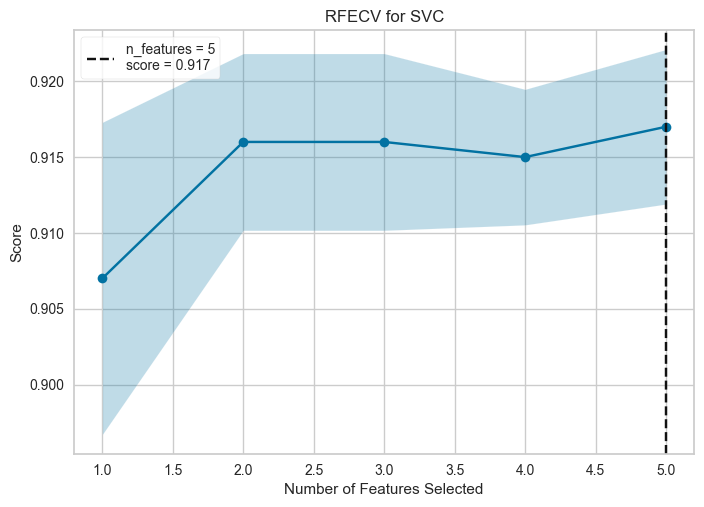

<AxesSubplot:title={'center':'RFECV for SVC'}, xlabel='Number of Features Selected', ylabel='Score'>

In [117]:
from sklearn.svm import SVC
from sklearn.datasets import make_classification
from yellowbrick.model_selection import RFECV

# Create a dataset with only 3 informative features
X, y = make_classification(
    n_samples=1000, n_features=5, n_informative=2, n_redundant=2,
    n_repeated=0, n_classes=2, n_clusters_per_class=1, random_state=0,
    )

# Instantiate RFECV visualizer with a linear SVM classifier
visualizer = RFECV(SVC(kernel='linear', C=1))

visualizer.fit(X, y)        # Fit the data to the visualizer
visualizer.show()           # Finalize and render the figure

In [118]:
# In this example we can see that 5 features were selected, though there doesn’t appear to be much improvement
# in the f1 score of the model after around 2 features.
# the curve jumps to an excellent accuracy when the three informative features are captured, 
# then gradually decreases in accuracy as the non informative features are added into the model.
# to find the optimal number of features cross-validation is used with RFE to score different feature subsets
# and select the best scoring collection of features.

c:\users\shima\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  after removing the cwd from sys.path.


<AxesSubplot:>

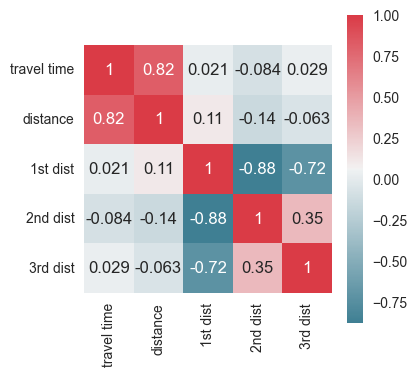

In [119]:
# run correlation matrix and plot
f, ax = plt.subplots(figsize=(4,4))
corr = df7.corr()
sns.heatmap(corr,annot=True, mask=np.zeros_like(corr,dtype=np.bool),
           cmap=sns.diverging_palette(220,10, as_cmap=True),
           square=True, ax=ax)

In [ ]:
x = np.array(df7[['distance','1st ranked','2nd ranked','3rd ranked','1st dist','2nd dist','3rd dist']])
y = np.array(df7['travel time'])
x

In [343]:
#split data into test & train
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [344]:
print(X_train.shape)
print(X_test.shape)
# X_train

(6625, 7)
(1657, 7)


In [376]:
# inputs: distance + 1st dist + 2nd dist + 3rd dist
model6_1_1 = nnmodel_(100,50, num_hlayers=2,Epoch=500)
model6_1_1

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 81129.9453 - mape: 26.4002 - rmse: 284.8332 - val_loss: 57662.7148 - val_mape: 22.0028 - val_rmse: 240.1306
Epoch 2/500
208/208 [==============================] - 0s 847us/step - loss: 75760.3516 - mape: 25.3375 - rmse: 275.2460 - val_loss: 60119.4609 - val_mape: 25.1721 - val_rmse: 245.1927
Epoch 3/500
208/208 [==============================] - 0s 841us/step - loss: 74976.1875 - mape: 25.3770 - rmse: 273.8178 - val_loss: 59899.0117 - val_mape: 21.3325 - val_rmse: 244.7428
Epoch 4/500
208/208 [==============================] - 0s 839us/step - loss: 72961.9766 - mape: 25.2450 - rmse: 270.1147 - val_loss: 59536.1719 - val_mape: 24.8175 - val_rmse: 244.0004
Epoch 5/500
208/208 [==============================] - 0s 857us/step - loss: 73284.9297 - mape: 25.1113 - rmse: 270.7119 - val_loss: 77484.4609 - val_mape: 22.4740 - val_rmse: 278.3603
Epoch 6/500
208/208 [==============================] - 0s 854us/step - loss: 

208/208 [==============================] - 0s 876us/step - loss: 60801.1211 - mape: 23.4303 - rmse: 246.5788 - val_loss: 53688.1211 - val_mape: 22.1654 - val_rmse: 231.7070
Epoch 90/500
208/208 [==============================] - 0s 846us/step - loss: 60623.8398 - mape: 23.1654 - rmse: 246.2191 - val_loss: 53392.1719 - val_mape: 22.4028 - val_rmse: 231.0675
Epoch 91/500
208/208 [==============================] - 0s 840us/step - loss: 60835.9688 - mape: 23.3806 - rmse: 246.6495 - val_loss: 53664.9219 - val_mape: 22.3741 - val_rmse: 231.6569
Epoch 92/500
208/208 [==============================] - 0s 826us/step - loss: 60574.3672 - mape: 23.3805 - rmse: 246.1186 - val_loss: 55073.8828 - val_mape: 21.3692 - val_rmse: 234.6783
Epoch 93/500
208/208 [==============================] - 0s 814us/step - loss: 61758.6562 - mape: 23.4827 - rmse: 248.5129 - val_loss: 62682.3359 - val_mape: 27.6450 - val_rmse: 250.3644
Epoch 94/500
208/208 [==============================] - 0s 831us/step - loss: 62634

Epoch 133/500
208/208 [==============================] - 0s 836us/step - loss: 60613.2734 - mape: 23.2024 - rmse: 246.1976 - val_loss: 57284.9688 - val_mape: 25.7961 - val_rmse: 239.3428
Epoch 134/500
208/208 [==============================] - 0s 845us/step - loss: 61064.9062 - mape: 23.5747 - rmse: 247.1131 - val_loss: 53523.1172 - val_mape: 24.1982 - val_rmse: 231.3506
Epoch 135/500
208/208 [==============================] - 0s 826us/step - loss: 60458.5391 - mape: 23.4408 - rmse: 245.8832 - val_loss: 52959.1328 - val_mape: 22.4551 - val_rmse: 230.1285
Epoch 136/500
208/208 [==============================] - 0s 836us/step - loss: 60302.7617 - mape: 23.2478 - rmse: 245.5662 - val_loss: 53183.9648 - val_mape: 22.4435 - val_rmse: 230.6165
Epoch 137/500
208/208 [==============================] - 0s 828us/step - loss: 60321.7422 - mape: 23.2596 - rmse: 245.6048 - val_loss: 52970.1875 - val_mape: 22.8340 - val_rmse: 230.1525
Epoch 138/500
208/208 [==============================] - 0s 832us

Epoch 177/500
208/208 [==============================] - 0s 826us/step - loss: 61302.9922 - mape: 23.5482 - rmse: 247.5944 - val_loss: 52964.3125 - val_mape: 23.0913 - val_rmse: 230.1398
Epoch 178/500
208/208 [==============================] - 0s 830us/step - loss: 60643.6719 - mape: 23.3721 - rmse: 246.2594 - val_loss: 53241.6602 - val_mape: 22.8805 - val_rmse: 230.7415
Epoch 179/500
208/208 [==============================] - 0s 834us/step - loss: 59941.5781 - mape: 23.1779 - rmse: 244.8297 - val_loss: 60906.7852 - val_mape: 28.3049 - val_rmse: 246.7930
Epoch 180/500
208/208 [==============================] - 0s 830us/step - loss: 60517.9883 - mape: 23.4158 - rmse: 246.0040 - val_loss: 53398.0586 - val_mape: 24.2857 - val_rmse: 231.0802
Epoch 181/500
208/208 [==============================] - 0s 829us/step - loss: 59949.0664 - mape: 23.3986 - rmse: 244.8450 - val_loss: 54589.8359 - val_mape: 23.6911 - val_rmse: 233.6447
Epoch 182/500
208/208 [==============================] - 0s 851us

Epoch 221/500
208/208 [==============================] - 0s 851us/step - loss: 59622.5586 - mape: 23.0504 - rmse: 244.1773 - val_loss: 53205.8477 - val_mape: 23.2106 - val_rmse: 230.6639
Epoch 222/500
208/208 [==============================] - 0s 847us/step - loss: 59765.0898 - mape: 23.1485 - rmse: 244.4690 - val_loss: 52862.4531 - val_mape: 23.0718 - val_rmse: 229.9184
Epoch 223/500
208/208 [==============================] - 0s 869us/step - loss: 59827.7852 - mape: 23.3618 - rmse: 244.5972 - val_loss: 53881.9180 - val_mape: 22.7987 - val_rmse: 232.1248
Epoch 224/500
208/208 [==============================] - 0s 847us/step - loss: 60036.5156 - mape: 23.4518 - rmse: 245.0235 - val_loss: 53891.9219 - val_mape: 23.6868 - val_rmse: 232.1463
Epoch 225/500
208/208 [==============================] - 0s 860us/step - loss: 60114.3203 - mape: 23.5386 - rmse: 245.1822 - val_loss: 53030.7969 - val_mape: 22.5473 - val_rmse: 230.2842
Epoch 226/500
208/208 [==============================] - 0s 855us

Epoch 265/500
208/208 [==============================] - 0s 832us/step - loss: 59911.8164 - mape: 23.2176 - rmse: 244.7689 - val_loss: 52455.2070 - val_mape: 23.1678 - val_rmse: 229.0310
Epoch 266/500
208/208 [==============================] - 0s 828us/step - loss: 59554.0352 - mape: 23.2668 - rmse: 244.0370 - val_loss: 52667.1445 - val_mape: 23.6969 - val_rmse: 229.4932
Epoch 267/500
208/208 [==============================] - 0s 825us/step - loss: 59488.4219 - mape: 23.3394 - rmse: 243.9025 - val_loss: 52320.9258 - val_mape: 23.3342 - val_rmse: 228.7377
Epoch 268/500
208/208 [==============================] - 0s 836us/step - loss: 59464.0234 - mape: 23.1489 - rmse: 243.8525 - val_loss: 52865.1836 - val_mape: 23.6846 - val_rmse: 229.9243
Epoch 269/500
208/208 [==============================] - 0s 836us/step - loss: 59716.8438 - mape: 23.3300 - rmse: 244.3703 - val_loss: 52778.9883 - val_mape: 23.3652 - val_rmse: 229.7368
Epoch 270/500
208/208 [==============================] - 0s 835us

Epoch 309/500
208/208 [==============================] - 0s 820us/step - loss: 59059.1953 - mape: 23.0263 - rmse: 243.0210 - val_loss: 53479.4414 - val_mape: 24.7891 - val_rmse: 231.2562
Epoch 310/500
208/208 [==============================] - 0s 823us/step - loss: 59904.7773 - mape: 24.2151 - rmse: 244.7545 - val_loss: 52262.6445 - val_mape: 23.0112 - val_rmse: 228.6102
Epoch 311/500
208/208 [==============================] - 0s 811us/step - loss: 59217.0039 - mape: 23.2386 - rmse: 243.3454 - val_loss: 52139.0664 - val_mape: 22.5521 - val_rmse: 228.3398
Epoch 312/500
208/208 [==============================] - 0s 819us/step - loss: 59278.0898 - mape: 23.2926 - rmse: 243.4709 - val_loss: 53101.2383 - val_mape: 21.9283 - val_rmse: 230.4371
Epoch 313/500
208/208 [==============================] - 0s 816us/step - loss: 59247.3320 - mape: 23.1092 - rmse: 243.4077 - val_loss: 52176.6602 - val_mape: 22.2558 - val_rmse: 228.4221
Epoch 314/500
208/208 [==============================] - 0s 823us

Epoch 353/500
208/208 [==============================] - 0s 816us/step - loss: 59104.3047 - mape: 23.4150 - rmse: 243.1138 - val_loss: 53046.8672 - val_mape: 22.2122 - val_rmse: 230.3191
Epoch 354/500
208/208 [==============================] - 0s 829us/step - loss: 59350.6914 - mape: 23.3017 - rmse: 243.6200 - val_loss: 52271.4258 - val_mape: 22.8126 - val_rmse: 228.6295
Epoch 355/500
208/208 [==============================] - 0s 831us/step - loss: 58892.2070 - mape: 23.0125 - rmse: 242.6772 - val_loss: 53402.5742 - val_mape: 24.2912 - val_rmse: 231.0900
Epoch 356/500
208/208 [==============================] - 0s 825us/step - loss: 58869.5391 - mape: 23.2454 - rmse: 242.6305 - val_loss: 52079.1133 - val_mape: 22.0863 - val_rmse: 228.2085
Epoch 357/500
208/208 [==============================] - 0s 834us/step - loss: 58767.7812 - mape: 23.2285 - rmse: 242.4207 - val_loss: 52155.6367 - val_mape: 23.0063 - val_rmse: 228.3761
Epoch 358/500
208/208 [==============================] - 0s 854us

Epoch 397/500
208/208 [==============================] - 0s 820us/step - loss: 58689.5156 - mape: 23.1217 - rmse: 242.2592 - val_loss: 52336.0742 - val_mape: 22.8703 - val_rmse: 228.7708
Epoch 398/500
208/208 [==============================] - 0s 830us/step - loss: 58702.5625 - mape: 23.0956 - rmse: 242.2861 - val_loss: 52574.6641 - val_mape: 23.9462 - val_rmse: 229.2917
Epoch 399/500
208/208 [==============================] - 0s 837us/step - loss: 58532.6016 - mape: 23.1150 - rmse: 241.9351 - val_loss: 54768.8398 - val_mape: 25.5992 - val_rmse: 234.0274
Epoch 400/500
208/208 [==============================] - 0s 849us/step - loss: 58527.0625 - mape: 23.2439 - rmse: 241.9237 - val_loss: 51440.6211 - val_mape: 22.3178 - val_rmse: 226.8053
Epoch 401/500
208/208 [==============================] - 0s 826us/step - loss: 58522.3516 - mape: 22.8740 - rmse: 241.9139 - val_loss: 51929.2148 - val_mape: 22.4654 - val_rmse: 227.8798
Epoch 402/500
208/208 [==============================] - 0s 826us

Epoch 441/500
208/208 [==============================] - 0s 833us/step - loss: 58702.3008 - mape: 23.3445 - rmse: 242.2856 - val_loss: 51278.9414 - val_mape: 22.0786 - val_rmse: 226.4485
Epoch 442/500
208/208 [==============================] - 0s 825us/step - loss: 58163.0117 - mape: 23.1458 - rmse: 241.1701 - val_loss: 51665.0430 - val_mape: 22.9683 - val_rmse: 227.2995
Epoch 443/500
208/208 [==============================] - 0s 854us/step - loss: 58305.0195 - mape: 23.3014 - rmse: 241.4643 - val_loss: 54178.5156 - val_mape: 23.8755 - val_rmse: 232.7628
Epoch 444/500
208/208 [==============================] - 0s 836us/step - loss: 58508.0938 - mape: 23.0779 - rmse: 241.8845 - val_loss: 51796.1289 - val_mape: 22.1236 - val_rmse: 227.5876
Epoch 445/500
208/208 [==============================] - 0s 872us/step - loss: 58332.9805 - mape: 23.2619 - rmse: 241.5222 - val_loss: 52315.0078 - val_mape: 22.0490 - val_rmse: 228.7247
Epoch 446/500
208/208 [==============================] - 0s 949us

Epoch 485/500
208/208 [==============================] - 0s 920us/step - loss: 58434.5898 - mape: 23.4179 - rmse: 241.7325 - val_loss: 52578.1055 - val_mape: 22.6554 - val_rmse: 229.2992
Epoch 486/500
208/208 [==============================] - 0s 832us/step - loss: 58401.0625 - mape: 23.0168 - rmse: 241.6631 - val_loss: 55049.9375 - val_mape: 26.3183 - val_rmse: 234.6272
Epoch 487/500
208/208 [==============================] - 0s 837us/step - loss: 60978.0898 - mape: 24.0702 - rmse: 246.9374 - val_loss: 53482.4961 - val_mape: 24.0399 - val_rmse: 231.2628
Epoch 488/500
208/208 [==============================] - 0s 832us/step - loss: 58604.6055 - mape: 23.2244 - rmse: 242.0839 - val_loss: 52390.3203 - val_mape: 22.6639 - val_rmse: 228.8893
Epoch 489/500
208/208 [==============================] - 0s 826us/step - loss: 58733.7383 - mape: 23.3079 - rmse: 242.3504 - val_loss: 52722.3906 - val_mape: 22.6763 - val_rmse: 229.6136
Epoch 490/500
208/208 [==============================] - 0s 828us

In [120]:
# plotme(model6_1_1)

In [805]:
194.6574/60

3.24429

In [121]:
# inputs: distance + 1st dist + 2nd dist + 3rd dist
model6_1_3 = nnmodel_(50, num_hlayers=1,Epoch=500)
model6_1_3

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 808975.0625 - mape: 99.2499 - rmse: 899.4304 - val_loss: 790237.6875 - val_mape: 97.8484 - val_rmse: 888.9531
Epoch 2/500
208/208 [==============================] - 0s 813us/step - loss: 769597.3125 - mape: 94.9769 - rmse: 877.2670 - val_loss: 730803.7500 - val_mape: 91.3829 - val_rmse: 854.8706
Epoch 3/500
208/208 [==============================] - 0s 782us/step - loss: 692600.6875 - mape: 86.1564 - rmse: 832.2263 - val_loss: 636843.1250 - val_mape: 80.5098 - val_rmse: 798.0245
Epoch 4/500
208/208 [==============================] - 0s 770us/step - loss: 589331.3125 - mape: 73.9075 - rmse: 767.6792 - val_loss: 527082.8750 - val_mape: 67.1360 - val_rmse: 726.0048
Epoch 5/500
208/208 [==============================] - 0s 784us/step - loss: 480395.6562 - mape: 61.0884 - rmse: 693.1058 - val_loss: 420512.7500 - val_mape: 54.2616 - val_rmse: 648.4695
Epoch 6/500
208/208 [==============================] - 0s 775us/ste

Epoch 45/500
208/208 [==============================] - 0s 774us/step - loss: 123036.4531 - mape: 43.4450 - rmse: 350.7655 - val_loss: 113619.8750 - val_mape: 41.8209 - val_rmse: 337.0755
Epoch 46/500
208/208 [==============================] - 0s 779us/step - loss: 121191.0938 - mape: 43.7191 - rmse: 348.1251 - val_loss: 111720.8750 - val_mape: 40.9345 - val_rmse: 334.2467
Epoch 47/500
208/208 [==============================] - 0s 767us/step - loss: 119373.0781 - mape: 42.7277 - rmse: 345.5041 - val_loss: 109986.9766 - val_mape: 40.9896 - val_rmse: 331.6429
Epoch 48/500
208/208 [==============================] - 0s 771us/step - loss: 117590.4297 - mape: 42.3999 - rmse: 342.9146 - val_loss: 108261.8984 - val_mape: 40.9163 - val_rmse: 329.0318
Epoch 49/500
208/208 [==============================] - 0s 759us/step - loss: 115761.5781 - mape: 42.2323 - rmse: 340.2375 - val_loss: 106424.3750 - val_mape: 40.1858 - val_rmse: 326.2275
Epoch 50/500
208/208 [==============================] - 0s 7

Epoch 89/500
208/208 [==============================] - 0s 783us/step - loss: 69335.0391 - mape: 30.1306 - rmse: 263.3155 - val_loss: 61877.2812 - val_mape: 28.7101 - val_rmse: 248.7514
Epoch 90/500
208/208 [==============================] - 0s 769us/step - loss: 68896.7812 - mape: 29.6315 - rmse: 262.4820 - val_loss: 61576.7852 - val_mape: 28.9324 - val_rmse: 248.1467
Epoch 91/500
208/208 [==============================] - 0s 785us/step - loss: 68479.0078 - mape: 29.3244 - rmse: 261.6849 - val_loss: 61333.8594 - val_mape: 29.1784 - val_rmse: 247.6567
Epoch 92/500
208/208 [==============================] - 0s 771us/step - loss: 68114.0469 - mape: 29.3809 - rmse: 260.9867 - val_loss: 60745.8438 - val_mape: 28.2528 - val_rmse: 246.4667
Epoch 93/500
208/208 [==============================] - 0s 789us/step - loss: 67749.4844 - mape: 29.2148 - rmse: 260.2873 - val_loss: 60421.3789 - val_mape: 28.0822 - val_rmse: 245.8076
Epoch 94/500
208/208 [==============================] - 0s 765us/step 

Epoch 133/500
208/208 [==============================] - 0s 757us/step - loss: 62478.0156 - mape: 25.7191 - rmse: 249.9560 - val_loss: 55370.0898 - val_mape: 25.8977 - val_rmse: 235.3085
Epoch 134/500
208/208 [==============================] - 0s 768us/step - loss: 62461.7930 - mape: 25.8437 - rmse: 249.9236 - val_loss: 55045.1797 - val_mape: 25.1111 - val_rmse: 234.6171
Epoch 135/500
208/208 [==============================] - 0s 765us/step - loss: 62417.4258 - mape: 25.7022 - rmse: 249.8348 - val_loss: 55008.4297 - val_mape: 25.1349 - val_rmse: 234.5388
Epoch 136/500
208/208 [==============================] - 0s 786us/step - loss: 62380.4922 - mape: 25.6027 - rmse: 249.7609 - val_loss: 54992.8242 - val_mape: 25.2279 - val_rmse: 234.5055
Epoch 137/500
208/208 [==============================] - 0s 821us/step - loss: 62341.9883 - mape: 25.5269 - rmse: 249.6838 - val_loss: 54856.7539 - val_mape: 24.9960 - val_rmse: 234.2152
Epoch 138/500
208/208 [==============================] - 0s 767us

Epoch 177/500
208/208 [==============================] - 0s 765us/step - loss: 61393.5820 - mape: 24.7475 - rmse: 247.7773 - val_loss: 53805.4180 - val_mape: 24.0941 - val_rmse: 231.9599
Epoch 178/500
208/208 [==============================] - 0s 765us/step - loss: 61400.4727 - mape: 24.7031 - rmse: 247.7912 - val_loss: 53932.2070 - val_mape: 24.5610 - val_rmse: 232.2331
Epoch 179/500
208/208 [==============================] - 0s 768us/step - loss: 61382.4961 - mape: 24.8528 - rmse: 247.7549 - val_loss: 53901.9531 - val_mape: 24.5598 - val_rmse: 232.1679
Epoch 180/500
208/208 [==============================] - 0s 764us/step - loss: 61357.5625 - mape: 24.7384 - rmse: 247.7046 - val_loss: 53868.9453 - val_mape: 24.4689 - val_rmse: 232.0968
Epoch 181/500
208/208 [==============================] - 0s 776us/step - loss: 61330.5195 - mape: 24.7200 - rmse: 247.6500 - val_loss: 53859.1367 - val_mape: 24.4401 - val_rmse: 232.0757
Epoch 182/500
208/208 [==============================] - 0s 763us

Epoch 221/500
208/208 [==============================] - 0s 771us/step - loss: 60963.3242 - mape: 24.4400 - rmse: 246.9075 - val_loss: 53436.3047 - val_mape: 23.9028 - val_rmse: 231.1629
Epoch 222/500
208/208 [==============================] - 0s 770us/step - loss: 60955.2461 - mape: 24.2950 - rmse: 246.8912 - val_loss: 53466.8711 - val_mape: 24.0238 - val_rmse: 231.2290
Epoch 223/500
208/208 [==============================] - 0s 767us/step - loss: 60946.9844 - mape: 24.1896 - rmse: 246.8744 - val_loss: 53421.1523 - val_mape: 23.9913 - val_rmse: 231.1302
Epoch 224/500
208/208 [==============================] - 0s 762us/step - loss: 60925.3828 - mape: 24.3713 - rmse: 246.8307 - val_loss: 53429.6719 - val_mape: 23.9882 - val_rmse: 231.1486
Epoch 225/500
208/208 [==============================] - 0s 766us/step - loss: 60916.2773 - mape: 24.2052 - rmse: 246.8122 - val_loss: 53567.5234 - val_mape: 24.3439 - val_rmse: 231.4466
Epoch 226/500
208/208 [==============================] - 0s 758us

Epoch 265/500
208/208 [==============================] - 0s 882us/step - loss: 60716.1758 - mape: 23.9898 - rmse: 246.4065 - val_loss: 53478.3672 - val_mape: 24.3146 - val_rmse: 231.2539
Epoch 266/500
208/208 [==============================] - 0s 855us/step - loss: 60705.3281 - mape: 24.1301 - rmse: 246.3845 - val_loss: 53231.2969 - val_mape: 23.7672 - val_rmse: 230.7191
Epoch 267/500
208/208 [==============================] - 0s 819us/step - loss: 60724.5625 - mape: 24.1001 - rmse: 246.4235 - val_loss: 53220.0078 - val_mape: 23.7106 - val_rmse: 230.6946
Epoch 268/500
208/208 [==============================] - 0s 817us/step - loss: 60720.9453 - mape: 24.0237 - rmse: 246.4162 - val_loss: 53302.5469 - val_mape: 23.9878 - val_rmse: 230.8734
Epoch 269/500
208/208 [==============================] - 0s 900us/step - loss: 60702.5938 - mape: 23.9787 - rmse: 246.3790 - val_loss: 53343.0391 - val_mape: 24.0909 - val_rmse: 230.9611
Epoch 270/500
208/208 [==============================] - 0s 916us

Epoch 309/500
208/208 [==============================] - 0s 780us/step - loss: 60498.7891 - mape: 23.8481 - rmse: 245.9650 - val_loss: 53230.1797 - val_mape: 24.0961 - val_rmse: 230.7167
Epoch 310/500
208/208 [==============================] - 0s 773us/step - loss: 60484.3750 - mape: 24.0938 - rmse: 245.9357 - val_loss: 52986.9062 - val_mape: 23.3558 - val_rmse: 230.1888
Epoch 311/500
208/208 [==============================] - 0s 774us/step - loss: 60486.6289 - mape: 23.7228 - rmse: 245.9403 - val_loss: 53273.0508 - val_mape: 24.2656 - val_rmse: 230.8096
Epoch 312/500
208/208 [==============================] - 0s 768us/step - loss: 60550.2617 - mape: 24.4908 - rmse: 246.0696 - val_loss: 52972.0234 - val_mape: 23.4620 - val_rmse: 230.1565
Epoch 313/500
208/208 [==============================] - 0s 767us/step - loss: 60479.7695 - mape: 23.9531 - rmse: 245.9263 - val_loss: 52978.0938 - val_mape: 23.4769 - val_rmse: 230.1697
Epoch 314/500
208/208 [==============================] - 0s 771us

Epoch 353/500
208/208 [==============================] - 0s 761us/step - loss: 60285.4336 - mape: 23.9747 - rmse: 245.5309 - val_loss: 52775.6289 - val_mape: 23.1170 - val_rmse: 229.7295
Epoch 354/500
208/208 [==============================] - 0s 794us/step - loss: 60305.1406 - mape: 23.6321 - rmse: 245.5710 - val_loss: 52879.7188 - val_mape: 23.5874 - val_rmse: 229.9559
Epoch 355/500
208/208 [==============================] - 0s 815us/step - loss: 60294.4922 - mape: 23.9029 - rmse: 245.5494 - val_loss: 52842.7773 - val_mape: 23.4644 - val_rmse: 229.8756
Epoch 356/500
208/208 [==============================] - 0s 769us/step - loss: 60278.3828 - mape: 23.7111 - rmse: 245.5166 - val_loss: 52962.3086 - val_mape: 23.8369 - val_rmse: 230.1354
Epoch 357/500
208/208 [==============================] - 0s 766us/step - loss: 60262.1133 - mape: 23.9674 - rmse: 245.4834 - val_loss: 52772.5391 - val_mape: 23.1462 - val_rmse: 229.7227
Epoch 358/500
208/208 [==============================] - 0s 761us

Epoch 397/500
208/208 [==============================] - 0s 752us/step - loss: 60117.9805 - mape: 23.7819 - rmse: 245.1897 - val_loss: 52661.9922 - val_mape: 23.2873 - val_rmse: 229.4820
Epoch 398/500
208/208 [==============================] - 0s 751us/step - loss: 60135.3750 - mape: 23.6607 - rmse: 245.2252 - val_loss: 52733.3242 - val_mape: 23.6205 - val_rmse: 229.6374
Epoch 399/500
208/208 [==============================] - 0s 765us/step - loss: 60099.8320 - mape: 23.7914 - rmse: 245.1527 - val_loss: 52619.4609 - val_mape: 23.1423 - val_rmse: 229.3893
Epoch 400/500
208/208 [==============================] - 0s 756us/step - loss: 60120.3594 - mape: 23.7756 - rmse: 245.1945 - val_loss: 52704.0078 - val_mape: 23.5700 - val_rmse: 229.5735
Epoch 401/500
208/208 [==============================] - 0s 756us/step - loss: 60097.6172 - mape: 23.6746 - rmse: 245.1481 - val_loss: 52750.4297 - val_mape: 23.7118 - val_rmse: 229.6746
Epoch 402/500
208/208 [==============================] - 0s 756us

Epoch 441/500
208/208 [==============================] - 0s 768us/step - loss: 59963.1797 - mape: 23.7149 - rmse: 244.8738 - val_loss: 52468.4766 - val_mape: 23.2277 - val_rmse: 229.0600
Epoch 442/500
208/208 [==============================] - 0s 777us/step - loss: 59943.3477 - mape: 23.5942 - rmse: 244.8333 - val_loss: 52423.0156 - val_mape: 23.0288 - val_rmse: 228.9607
Epoch 443/500
208/208 [==============================] - 0s 796us/step - loss: 59954.4648 - mape: 23.5555 - rmse: 244.8560 - val_loss: 52438.1250 - val_mape: 23.2340 - val_rmse: 228.9937
Epoch 444/500
208/208 [==============================] - 0s 776us/step - loss: 59949.0039 - mape: 23.4804 - rmse: 244.8449 - val_loss: 52621.2656 - val_mape: 23.8237 - val_rmse: 229.3932
Epoch 445/500
208/208 [==============================] - 0s 812us/step - loss: 59907.9492 - mape: 23.7931 - rmse: 244.7610 - val_loss: 52395.5391 - val_mape: 22.9923 - val_rmse: 228.9007
Epoch 446/500
208/208 [==============================] - 0s 773us

Epoch 485/500
208/208 [==============================] - 0s 751us/step - loss: 59819.8516 - mape: 23.5068 - rmse: 244.5810 - val_loss: 52389.5195 - val_mape: 23.3979 - val_rmse: 228.8876
Epoch 486/500
208/208 [==============================] - 0s 747us/step - loss: 59799.4258 - mape: 23.3947 - rmse: 244.5392 - val_loss: 52563.6445 - val_mape: 23.9271 - val_rmse: 229.2676
Epoch 487/500
208/208 [==============================] - 0s 746us/step - loss: 59816.7383 - mape: 23.5388 - rmse: 244.5746 - val_loss: 52372.9961 - val_mape: 23.4013 - val_rmse: 228.8515
Epoch 488/500
208/208 [==============================] - 0s 766us/step - loss: 59804.0508 - mape: 23.5747 - rmse: 244.5487 - val_loss: 52424.2188 - val_mape: 23.5925 - val_rmse: 228.9634
Epoch 489/500
208/208 [==============================] - 0s 757us/step - loss: 59819.8086 - mape: 23.7167 - rmse: 244.5809 - val_loss: 52374.5508 - val_mape: 23.3950 - val_rmse: 228.8549
Epoch 490/500
208/208 [==============================] - 0s 766us

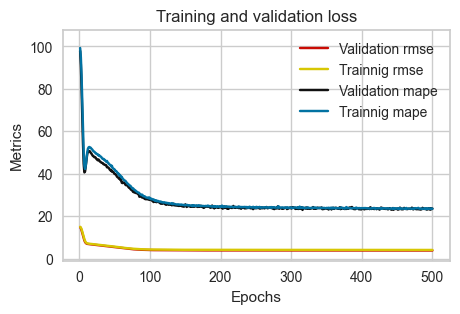

In [122]:
plotme(model6_1_3)

In [379]:
# inputs: distance + 1st dist + 2nd dist + 3rd dist
model6_1_4 = nnmodel_(10, num_hlayers=1,Epoch=500)
model6_1_4

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 23848622.0000 - mape: 391.6350 - rmse: 4883.5049 - val_loss: 371524.2500 - val_mape: 41.8933 - val_rmse: 609.5279
Epoch 2/500
208/208 [==============================] - 0s 779us/step - loss: 118317.2109 - mape: 34.5570 - rmse: 343.9727 - val_loss: 84987.4141 - val_mape: 34.6173 - val_rmse: 291.5260
Epoch 3/500
208/208 [==============================] - 0s 756us/step - loss: 87894.2109 - mape: 33.5887 - rmse: 296.4696 - val_loss: 79218.8203 - val_mape: 31.8580 - val_rmse: 281.4584
Epoch 4/500
208/208 [==============================] - 0s 758us/step - loss: 83610.6641 - mape: 31.2612 - rmse: 289.1551 - val_loss: 75110.8906 - val_mape: 29.9374 - val_rmse: 274.0637
Epoch 5/500
208/208 [==============================] - 0s 778us/step - loss: 80831.0547 - mape: 29.6735 - rmse: 284.3080 - val_loss: 72147.9219 - val_mape: 28.4929 - val_rmse: 268.6036
Epoch 6/500
208/208 [==============================] - 0s 791us/step -

208/208 [==============================] - 0s 852us/step - loss: 65894.3359 - mape: 23.8249 - rmse: 256.6989 - val_loss: 56763.5938 - val_mape: 25.4015 - val_rmse: 238.2511
Epoch 46/500
208/208 [==============================] - 0s 768us/step - loss: 65432.8555 - mape: 24.1430 - rmse: 255.7985 - val_loss: 59489.6367 - val_mape: 27.0459 - val_rmse: 243.9050
Epoch 47/500
208/208 [==============================] - 0s 758us/step - loss: 65374.0781 - mape: 24.1484 - rmse: 255.6835 - val_loss: 55679.7969 - val_mape: 23.7677 - val_rmse: 235.9657
Epoch 48/500
208/208 [==============================] - 0s 754us/step - loss: 65174.9570 - mape: 23.9226 - rmse: 255.2939 - val_loss: 55286.8828 - val_mape: 23.4682 - val_rmse: 235.1316
Epoch 49/500
208/208 [==============================] - 0s 758us/step - loss: 64251.6250 - mape: 23.8883 - rmse: 253.4790 - val_loss: 62349.5391 - val_mape: 28.4341 - val_rmse: 249.6989
Epoch 50/500
208/208 [==============================] - 0s 759us/step - loss: 65597

Epoch 133/500
208/208 [==============================] - 0s 763us/step - loss: 63319.0742 - mape: 23.3902 - rmse: 251.6328 - val_loss: 64332.2930 - val_mape: 28.4685 - val_rmse: 253.6381
Epoch 134/500
208/208 [==============================] - 0s 775us/step - loss: 64166.5703 - mape: 24.5274 - rmse: 253.3112 - val_loss: 55165.3047 - val_mape: 23.3745 - val_rmse: 234.8730
Epoch 135/500
208/208 [==============================] - 0s 763us/step - loss: 63925.2344 - mape: 23.6872 - rmse: 252.8344 - val_loss: 56168.2734 - val_mape: 23.9223 - val_rmse: 236.9985
Epoch 136/500
208/208 [==============================] - 0s 747us/step - loss: 63639.2461 - mape: 23.7619 - rmse: 252.2682 - val_loss: 54987.2305 - val_mape: 22.0574 - val_rmse: 234.4936
Epoch 137/500
208/208 [==============================] - 0s 760us/step - loss: 63285.9336 - mape: 23.5591 - rmse: 251.5670 - val_loss: 55951.0781 - val_mape: 23.4180 - val_rmse: 236.5398
Epoch 138/500
208/208 [==============================] - 0s 768us

Epoch 177/500
208/208 [==============================] - 0s 757us/step - loss: 62958.1172 - mape: 23.4356 - rmse: 250.9146 - val_loss: 59835.1875 - val_mape: 25.8455 - val_rmse: 244.6123
Epoch 178/500
208/208 [==============================] - 0s 761us/step - loss: 62850.0039 - mape: 23.4240 - rmse: 250.6990 - val_loss: 56244.5625 - val_mape: 22.4150 - val_rmse: 237.1594
Epoch 179/500
208/208 [==============================] - 0s 759us/step - loss: 63103.3945 - mape: 23.6930 - rmse: 251.2039 - val_loss: 54966.1914 - val_mape: 22.7879 - val_rmse: 234.4487
Epoch 180/500
208/208 [==============================] - 0s 734us/step - loss: 63445.6836 - mape: 24.0090 - rmse: 251.8843 - val_loss: 55861.0078 - val_mape: 22.0810 - val_rmse: 236.3493
Epoch 181/500
208/208 [==============================] - 0s 749us/step - loss: 64118.2539 - mape: 23.7981 - rmse: 253.2158 - val_loss: 56530.1484 - val_mape: 21.6366 - val_rmse: 237.7607
Epoch 182/500
208/208 [==============================] - 0s 747us

Epoch 221/500
208/208 [==============================] - 0s 768us/step - loss: 63139.1641 - mape: 23.8335 - rmse: 251.2751 - val_loss: 55280.9258 - val_mape: 22.0411 - val_rmse: 235.1190
Epoch 222/500
208/208 [==============================] - 0s 831us/step - loss: 63034.5195 - mape: 23.4140 - rmse: 251.0668 - val_loss: 54945.7656 - val_mape: 23.1251 - val_rmse: 234.4051
Epoch 223/500
208/208 [==============================] - 0s 844us/step - loss: 62700.0664 - mape: 23.5613 - rmse: 250.3998 - val_loss: 61238.6562 - val_mape: 21.3907 - val_rmse: 247.4644
Epoch 224/500
208/208 [==============================] - 0s 827us/step - loss: 64735.6602 - mape: 23.8509 - rmse: 254.4320 - val_loss: 54949.3242 - val_mape: 22.7968 - val_rmse: 234.4127
Epoch 225/500
208/208 [==============================] - 0s 786us/step - loss: 62248.8047 - mape: 23.5027 - rmse: 249.4971 - val_loss: 55205.6484 - val_mape: 22.0955 - val_rmse: 234.9588
Epoch 226/500
208/208 [==============================] - 0s 845us

Epoch 265/500
208/208 [==============================] - 0s 741us/step - loss: 62794.0234 - mape: 23.3797 - rmse: 250.5874 - val_loss: 55286.0586 - val_mape: 23.8145 - val_rmse: 235.1299
Epoch 266/500
208/208 [==============================] - 0s 739us/step - loss: 62999.9531 - mape: 23.5972 - rmse: 250.9979 - val_loss: 57797.5820 - val_mape: 21.6001 - val_rmse: 240.4113
Epoch 267/500
208/208 [==============================] - 0s 772us/step - loss: 62745.6562 - mape: 23.7524 - rmse: 250.4908 - val_loss: 54909.2188 - val_mape: 22.4909 - val_rmse: 234.3272
Epoch 268/500
208/208 [==============================] - 0s 741us/step - loss: 62620.1484 - mape: 23.3694 - rmse: 250.2402 - val_loss: 56693.7305 - val_mape: 24.2365 - val_rmse: 238.1044
Epoch 269/500
208/208 [==============================] - 0s 735us/step - loss: 62954.4102 - mape: 23.7185 - rmse: 250.9072 - val_loss: 60077.2227 - val_mape: 20.7582 - val_rmse: 245.1066
Epoch 270/500
208/208 [==============================] - 0s 748us

Epoch 309/500
208/208 [==============================] - 0s 754us/step - loss: 62471.7188 - mape: 23.5457 - rmse: 249.9434 - val_loss: 56128.7578 - val_mape: 21.7856 - val_rmse: 236.9151
Epoch 310/500
208/208 [==============================] - 0s 805us/step - loss: 63163.6719 - mape: 23.5318 - rmse: 251.3238 - val_loss: 55098.6797 - val_mape: 23.3198 - val_rmse: 234.7311
Epoch 311/500
208/208 [==============================] - 0s 861us/step - loss: 62937.6133 - mape: 23.6665 - rmse: 250.8737 - val_loss: 55049.5898 - val_mape: 22.8088 - val_rmse: 234.6265
Epoch 312/500
208/208 [==============================] - 0s 826us/step - loss: 62425.8516 - mape: 23.4908 - rmse: 249.8517 - val_loss: 55831.0859 - val_mape: 21.6489 - val_rmse: 236.2860
Epoch 313/500
208/208 [==============================] - 0s 793us/step - loss: 62675.8320 - mape: 23.6344 - rmse: 250.3514 - val_loss: 54878.1250 - val_mape: 22.3920 - val_rmse: 234.2608
Epoch 314/500
208/208 [==============================] - 0s 778us

Epoch 353/500
208/208 [==============================] - 0s 744us/step - loss: 63362.2109 - mape: 23.8071 - rmse: 251.7185 - val_loss: 54848.4648 - val_mape: 22.4651 - val_rmse: 234.1975
Epoch 354/500
208/208 [==============================] - 0s 768us/step - loss: 63066.4258 - mape: 23.7528 - rmse: 251.1303 - val_loss: 56424.7500 - val_mape: 21.1626 - val_rmse: 237.5389
Epoch 355/500
208/208 [==============================] - 0s 746us/step - loss: 62589.7266 - mape: 23.2904 - rmse: 250.1794 - val_loss: 55307.7383 - val_mape: 23.1358 - val_rmse: 235.1760
Epoch 356/500
208/208 [==============================] - 0s 739us/step - loss: 62365.0938 - mape: 23.6231 - rmse: 249.7300 - val_loss: 58833.3164 - val_mape: 25.7848 - val_rmse: 242.5558
Epoch 357/500
208/208 [==============================] - 0s 749us/step - loss: 62739.5391 - mape: 23.5211 - rmse: 250.4786 - val_loss: 57156.6172 - val_mape: 25.3039 - val_rmse: 239.0745
Epoch 358/500
208/208 [==============================] - 0s 758us

Epoch 397/500
208/208 [==============================] - 0s 744us/step - loss: 62529.7969 - mape: 23.4085 - rmse: 250.0596 - val_loss: 55092.1055 - val_mape: 21.9667 - val_rmse: 234.7171
Epoch 398/500
208/208 [==============================] - 0s 760us/step - loss: 62734.1680 - mape: 23.4767 - rmse: 250.4679 - val_loss: 55474.2695 - val_mape: 23.6034 - val_rmse: 235.5298
Epoch 399/500
208/208 [==============================] - 0s 744us/step - loss: 62511.1992 - mape: 23.6656 - rmse: 250.0224 - val_loss: 55542.3867 - val_mape: 23.2395 - val_rmse: 235.6743
Epoch 400/500
208/208 [==============================] - 0s 739us/step - loss: 62654.8945 - mape: 23.3226 - rmse: 250.3096 - val_loss: 55123.0664 - val_mape: 22.8081 - val_rmse: 234.7830
Epoch 401/500
208/208 [==============================] - 0s 744us/step - loss: 62641.9492 - mape: 23.6345 - rmse: 250.2837 - val_loss: 55501.1289 - val_mape: 23.4860 - val_rmse: 235.5868
Epoch 402/500
208/208 [==============================] - 0s 752us

Epoch 441/500
208/208 [==============================] - 0s 748us/step - loss: 62655.6484 - mape: 23.5020 - rmse: 250.3111 - val_loss: 55499.4375 - val_mape: 22.0296 - val_rmse: 235.5832
Epoch 442/500
208/208 [==============================] - 0s 758us/step - loss: 62655.1641 - mape: 23.6536 - rmse: 250.3101 - val_loss: 55730.0859 - val_mape: 24.0228 - val_rmse: 236.0722
Epoch 443/500
208/208 [==============================] - 0s 764us/step - loss: 62829.8477 - mape: 23.6918 - rmse: 250.6588 - val_loss: 55613.7500 - val_mape: 24.0160 - val_rmse: 235.8257
Epoch 444/500
208/208 [==============================] - 0s 754us/step - loss: 62465.0430 - mape: 23.6597 - rmse: 249.9301 - val_loss: 55082.3164 - val_mape: 22.9266 - val_rmse: 234.6962
Epoch 445/500
208/208 [==============================] - 0s 755us/step - loss: 62393.9883 - mape: 23.4842 - rmse: 249.7879 - val_loss: 59887.4648 - val_mape: 26.2209 - val_rmse: 244.7192
Epoch 446/500
208/208 [==============================] - 0s 744us

Epoch 485/500
208/208 [==============================] - 0s 758us/step - loss: 62491.3047 - mape: 23.3354 - rmse: 249.9826 - val_loss: 55768.3555 - val_mape: 24.1803 - val_rmse: 236.1532
Epoch 486/500
208/208 [==============================] - 0s 762us/step - loss: 62322.3711 - mape: 23.4877 - rmse: 249.6445 - val_loss: 54891.9922 - val_mape: 23.0098 - val_rmse: 234.2904
Epoch 487/500
208/208 [==============================] - 0s 767us/step - loss: 62660.8984 - mape: 23.6084 - rmse: 250.3216 - val_loss: 55533.3555 - val_mape: 23.8513 - val_rmse: 235.6552
Epoch 488/500
208/208 [==============================] - 0s 749us/step - loss: 62353.0273 - mape: 23.5657 - rmse: 249.7059 - val_loss: 55400.1406 - val_mape: 23.3420 - val_rmse: 235.3723
Epoch 489/500
208/208 [==============================] - 0s 751us/step - loss: 62335.7578 - mape: 23.5448 - rmse: 249.6713 - val_loss: 55394.3711 - val_mape: 23.2516 - val_rmse: 235.3601
Epoch 490/500
208/208 [==============================] - 0s 752us

In [380]:
# inputs: distance + 1st dist + 2nd dist + 3rd dist
model6_1_5 = nnmodel_(100, num_hlayers=1,Epoch=500)
model6_1_5

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 1106930.1250 - mape: 59.6611 - rmse: 1052.1074 - val_loss: 58884.5703 - val_mape: 25.0758 - val_rmse: 242.6614
Epoch 2/500
208/208 [==============================] - 0s 800us/step - loss: 65498.0039 - mape: 23.8646 - rmse: 255.9258 - val_loss: 61162.5859 - val_mape: 22.1414 - val_rmse: 247.3107
Epoch 3/500
208/208 [==============================] - 0s 799us/step - loss: 65715.0859 - mape: 24.2297 - rmse: 256.3495 - val_loss: 57124.7070 - val_mape: 25.3966 - val_rmse: 239.0078
Epoch 4/500
208/208 [==============================] - 0s 804us/step - loss: 65458.4258 - mape: 24.1818 - rmse: 255.8484 - val_loss: 55625.2969 - val_mape: 21.2402 - val_rmse: 235.8502
Epoch 5/500
208/208 [==============================] - 0s 817us/step - loss: 65183.0625 - mape: 24.0403 - rmse: 255.3097 - val_loss: 55333.3164 - val_mape: 23.5547 - val_rmse: 235.2303
Epoch 6/500
208/208 [==============================] - 0s 803us/step - los

208/208 [==============================] - 0s 800us/step - loss: 61894.1875 - mape: 23.4676 - rmse: 248.7854 - val_loss: 56124.5898 - val_mape: 25.2304 - val_rmse: 236.9063
Epoch 90/500
208/208 [==============================] - 0s 784us/step - loss: 62079.8203 - mape: 23.6010 - rmse: 249.1582 - val_loss: 53444.4883 - val_mape: 22.4157 - val_rmse: 231.1806
Epoch 91/500
208/208 [==============================] - 0s 794us/step - loss: 62064.0352 - mape: 23.5059 - rmse: 249.1265 - val_loss: 54258.6875 - val_mape: 23.0018 - val_rmse: 232.9349
Epoch 92/500
208/208 [==============================] - 0s 790us/step - loss: 63236.1992 - mape: 23.7982 - rmse: 251.4681 - val_loss: 53555.1289 - val_mape: 21.7638 - val_rmse: 231.4198
Epoch 93/500
208/208 [==============================] - 0s 808us/step - loss: 62747.1875 - mape: 23.7803 - rmse: 250.4939 - val_loss: 55169.1797 - val_mape: 23.1992 - val_rmse: 234.8812
Epoch 94/500
208/208 [==============================] - 0s 784us/step - loss: 61753

Epoch 133/500
208/208 [==============================] - 0s 788us/step - loss: 61245.4961 - mape: 23.4789 - rmse: 247.4783 - val_loss: 56036.5898 - val_mape: 25.7072 - val_rmse: 236.7205
Epoch 134/500
208/208 [==============================] - 0s 778us/step - loss: 61608.3242 - mape: 23.4426 - rmse: 248.2102 - val_loss: 53344.5039 - val_mape: 21.8310 - val_rmse: 230.9643
Epoch 135/500
208/208 [==============================] - 0s 785us/step - loss: 62422.6914 - mape: 23.6148 - rmse: 249.8453 - val_loss: 53577.6016 - val_mape: 24.1815 - val_rmse: 231.4684
Epoch 136/500
208/208 [==============================] - 0s 777us/step - loss: 62207.8945 - mape: 23.7230 - rmse: 249.4151 - val_loss: 54261.3320 - val_mape: 24.6575 - val_rmse: 232.9406
Epoch 137/500
208/208 [==============================] - 0s 782us/step - loss: 61723.5000 - mape: 23.6351 - rmse: 248.4421 - val_loss: 56976.2656 - val_mape: 24.9847 - val_rmse: 238.6970
Epoch 138/500
208/208 [==============================] - 0s 796us

Epoch 177/500
208/208 [==============================] - 0s 785us/step - loss: 60439.6719 - mape: 23.2786 - rmse: 245.8448 - val_loss: 56303.0039 - val_mape: 26.9516 - val_rmse: 237.2825
Epoch 178/500
208/208 [==============================] - 0s 773us/step - loss: 60961.8867 - mape: 23.4889 - rmse: 246.9046 - val_loss: 53744.0156 - val_mape: 21.0848 - val_rmse: 231.8276
Epoch 179/500
208/208 [==============================] - 0s 771us/step - loss: 60790.1641 - mape: 23.3014 - rmse: 246.5566 - val_loss: 53736.1172 - val_mape: 23.7846 - val_rmse: 231.8105
Epoch 180/500
208/208 [==============================] - 0s 786us/step - loss: 61175.4648 - mape: 23.4193 - rmse: 247.3367 - val_loss: 57909.4648 - val_mape: 25.9904 - val_rmse: 240.6439
Epoch 181/500
208/208 [==============================] - 0s 775us/step - loss: 60754.0547 - mape: 23.4752 - rmse: 246.4834 - val_loss: 64245.1953 - val_mape: 29.2568 - val_rmse: 253.4664
Epoch 182/500
208/208 [==============================] - 0s 788us

Epoch 221/500
208/208 [==============================] - 0s 781us/step - loss: 60307.8320 - mape: 23.3471 - rmse: 245.5765 - val_loss: 54362.6758 - val_mape: 22.9029 - val_rmse: 233.1581
Epoch 222/500
208/208 [==============================] - 0s 767us/step - loss: 60761.8281 - mape: 23.3058 - rmse: 246.4991 - val_loss: 53879.7617 - val_mape: 23.2308 - val_rmse: 232.1201
Epoch 223/500
208/208 [==============================] - 0s 772us/step - loss: 60560.5195 - mape: 23.5056 - rmse: 246.0905 - val_loss: 53616.3828 - val_mape: 21.8437 - val_rmse: 231.5521
Epoch 224/500
208/208 [==============================] - 0s 767us/step - loss: 60598.3438 - mape: 23.4470 - rmse: 246.1673 - val_loss: 56968.7930 - val_mape: 22.1409 - val_rmse: 238.6814
Epoch 225/500
208/208 [==============================] - 0s 780us/step - loss: 61083.0156 - mape: 23.5510 - rmse: 247.1498 - val_loss: 53135.6875 - val_mape: 22.6887 - val_rmse: 230.5118
Epoch 226/500
208/208 [==============================] - 0s 769us

Epoch 265/500
208/208 [==============================] - 0s 789us/step - loss: 60280.8555 - mape: 23.2731 - rmse: 245.5216 - val_loss: 53307.4023 - val_mape: 22.9148 - val_rmse: 230.8840
Epoch 266/500
208/208 [==============================] - 0s 792us/step - loss: 60075.0000 - mape: 23.3527 - rmse: 245.1020 - val_loss: 55075.7227 - val_mape: 24.4008 - val_rmse: 234.6822
Epoch 267/500
208/208 [==============================] - 0s 800us/step - loss: 60565.1719 - mape: 23.3901 - rmse: 246.0999 - val_loss: 54558.8984 - val_mape: 22.7350 - val_rmse: 233.5785
Epoch 268/500
208/208 [==============================] - 0s 799us/step - loss: 60241.9922 - mape: 23.1431 - rmse: 245.4424 - val_loss: 53269.2422 - val_mape: 23.1592 - val_rmse: 230.8013
Epoch 269/500
208/208 [==============================] - 0s 793us/step - loss: 60100.7500 - mape: 23.2414 - rmse: 245.1545 - val_loss: 53225.4336 - val_mape: 22.9680 - val_rmse: 230.7064
Epoch 270/500
208/208 [==============================] - 0s 796us

Epoch 309/500
208/208 [==============================] - 0s 929us/step - loss: 60831.8594 - mape: 24.0037 - rmse: 246.6412 - val_loss: 53212.5586 - val_mape: 22.6918 - val_rmse: 230.6785
Epoch 310/500
208/208 [==============================] - 0s 929us/step - loss: 59894.3477 - mape: 23.0821 - rmse: 244.7332 - val_loss: 53350.3477 - val_mape: 22.1925 - val_rmse: 230.9769
Epoch 311/500
208/208 [==============================] - 0s 938us/step - loss: 60027.0039 - mape: 23.1490 - rmse: 245.0041 - val_loss: 53917.1211 - val_mape: 22.7722 - val_rmse: 232.2006
Epoch 312/500
208/208 [==============================] - 0s 913us/step - loss: 60702.4023 - mape: 23.3991 - rmse: 246.3786 - val_loss: 53087.4688 - val_mape: 22.4705 - val_rmse: 230.4072
Epoch 313/500
208/208 [==============================] - 0s 1ms/step - loss: 60013.9844 - mape: 23.1366 - rmse: 244.9775 - val_loss: 53621.0156 - val_mape: 24.0966 - val_rmse: 231.5621
Epoch 314/500
208/208 [==============================] - 0s 923us/s

Epoch 353/500
208/208 [==============================] - 0s 926us/step - loss: 60108.8203 - mape: 23.2838 - rmse: 245.1710 - val_loss: 53441.9180 - val_mape: 21.8317 - val_rmse: 231.1751
Epoch 354/500
208/208 [==============================] - 0s 927us/step - loss: 60093.8516 - mape: 22.9552 - rmse: 245.1405 - val_loss: 54832.4883 - val_mape: 24.2351 - val_rmse: 234.1634
Epoch 355/500
208/208 [==============================] - 0s 920us/step - loss: 60114.5039 - mape: 23.3161 - rmse: 245.1826 - val_loss: 56100.3320 - val_mape: 25.4279 - val_rmse: 236.8551
Epoch 356/500
208/208 [==============================] - 0s 906us/step - loss: 60059.0117 - mape: 23.2024 - rmse: 245.0694 - val_loss: 53512.8828 - val_mape: 24.0237 - val_rmse: 231.3285
Epoch 357/500
208/208 [==============================] - 0s 925us/step - loss: 59714.6016 - mape: 23.2586 - rmse: 244.3657 - val_loss: 54518.5508 - val_mape: 22.1880 - val_rmse: 233.4921
Epoch 358/500
208/208 [==============================] - 0s 1ms/s

Epoch 397/500
208/208 [==============================] - 0s 787us/step - loss: 59850.1641 - mape: 23.2727 - rmse: 244.6429 - val_loss: 53201.5781 - val_mape: 23.1728 - val_rmse: 230.6547
Epoch 398/500
208/208 [==============================] - 0s 794us/step - loss: 60134.2734 - mape: 23.4991 - rmse: 245.2229 - val_loss: 53429.9609 - val_mape: 22.4371 - val_rmse: 231.1492
Epoch 399/500
208/208 [==============================] - 0s 793us/step - loss: 60535.0977 - mape: 23.1751 - rmse: 246.0388 - val_loss: 54372.0938 - val_mape: 24.6340 - val_rmse: 233.1782
Epoch 400/500
208/208 [==============================] - 0s 829us/step - loss: 59734.2930 - mape: 23.3082 - rmse: 244.4060 - val_loss: 54895.0820 - val_mape: 24.3480 - val_rmse: 234.2970
Epoch 401/500
208/208 [==============================] - 0s 853us/step - loss: 60453.4531 - mape: 23.3085 - rmse: 245.8728 - val_loss: 53731.7891 - val_mape: 22.8068 - val_rmse: 231.8012
Epoch 402/500
208/208 [==============================] - 0s 783us

Epoch 441/500
208/208 [==============================] - 0s 830us/step - loss: 59770.5312 - mape: 23.1650 - rmse: 244.4801 - val_loss: 55172.8711 - val_mape: 25.1871 - val_rmse: 234.8891
Epoch 442/500
208/208 [==============================] - 0s 796us/step - loss: 59728.6445 - mape: 23.3837 - rmse: 244.3944 - val_loss: 53741.4492 - val_mape: 23.0584 - val_rmse: 231.8220
Epoch 443/500
208/208 [==============================] - 0s 778us/step - loss: 59798.4570 - mape: 23.3577 - rmse: 244.5372 - val_loss: 53688.3398 - val_mape: 22.6238 - val_rmse: 231.7074
Epoch 444/500
208/208 [==============================] - 0s 781us/step - loss: 59868.1055 - mape: 23.2022 - rmse: 244.6796 - val_loss: 53298.4336 - val_mape: 22.1515 - val_rmse: 230.8645
Epoch 445/500
208/208 [==============================] - 0s 797us/step - loss: 59743.9219 - mape: 22.9526 - rmse: 244.4257 - val_loss: 54000.1484 - val_mape: 24.8809 - val_rmse: 232.3793
Epoch 446/500
208/208 [==============================] - 0s 785us

Epoch 485/500
208/208 [==============================] - 0s 810us/step - loss: 59693.8281 - mape: 23.2543 - rmse: 244.3232 - val_loss: 54155.7656 - val_mape: 25.5230 - val_rmse: 232.7139
Epoch 486/500
208/208 [==============================] - 0s 789us/step - loss: 60614.3164 - mape: 23.7904 - rmse: 246.1998 - val_loss: 55592.1055 - val_mape: 20.9484 - val_rmse: 235.7798
Epoch 487/500
208/208 [==============================] - 0s 793us/step - loss: 59974.8281 - mape: 23.1341 - rmse: 244.8976 - val_loss: 53378.8398 - val_mape: 23.7859 - val_rmse: 231.0386
Epoch 488/500
208/208 [==============================] - 0s 774us/step - loss: 59735.1641 - mape: 23.4089 - rmse: 244.4078 - val_loss: 53358.3086 - val_mape: 23.0884 - val_rmse: 230.9942
Epoch 489/500
208/208 [==============================] - 0s 777us/step - loss: 59999.7695 - mape: 23.3888 - rmse: 244.9485 - val_loss: 56285.5000 - val_mape: 25.4386 - val_rmse: 237.2457
Epoch 490/500
208/208 [==============================] - 0s 791us

## sub-problem 7:  **input: distance & hour & all roadtypes with real distance**

In [123]:
df8 = dff.iloc[:,:].copy()
df8 = df8.drop(['hour of day'], axis=1)
df8.head(20)

,travel time,distance,living_street,motorway,motorway_link,primary,primary_link,residential,road,secondary,secondary_link,service,tertiary,track,trunk,trunk_link,unclassified,others
0,1038,0.196901,0.0,0.0,0.0,16851.678,251.682,14.930,0.0,0.000,0.0,0.000,720.334,0.0,0.0,0.0,0.000,0.0
1,1020,0.192960,0.0,0.0,0.0,16513.708,251.682,0.000,0.0,0.000,0.0,0.000,720.334,0.0,0.0,0.0,0.000,0.0
2,730,0.107565,0.0,0.0,0.0,8089.947,0.000,98.164,0.0,0.000,0.0,403.924,529.915,0.0,0.0,0.0,715.641,0.0
3,1235,0.155246,0.0,0.0,0.0,9148.605,0.000,3806.703,0.0,0.000,0.0,0.000,437.068,0.0,0.0,0.0,715.641,0.0
4,576,0.113345,0.0,0.0,0.0,8257.777,0.000,1423.604,0.0,0.000,0.0,0.000,673.871,0.0,0.0,0.0,0.000,0.0
5,810,0.119569,0.0,0.0,0.0,8106.473,0.000,909.104,0.0,0.000,0.0,0.000,673.871,0.0,0.0,0.0,1223.288,0.0
6,2089,0.498133,0.0,0.0,0.0,37863.343,192.327,3431.704,0.0,1598.203,0.0,579.071,437.068,0.0,0.0,0.0,715.641,0.0
7,985,0.146276,0.0,0.0,0.0,10741.352,0.000,1314.915,0.0,0.000,0.0,95.606,437.068,0.0,0.0,0.0,715.641,0.0
8,1071,0.208617,0.0,0.0,0.0,16149.470,447.705,1873.861,0.0,0.000,0.0,23.668,393.236,0.0,0.0,0.0,0.000,0.0
9,1110,0.136931,0.0,0.0,0.0,7621.231,0.000,3090.887,0.0,0.000,0.0,0.000,437.068,0.0,0.0,0.0,1318.499,0.0


In [125]:
# Normalize using Min/Max Normalization.
normalize=(df8['living_street']-df8['living_street'].min())/(df8['living_street'].max()-df8['living_street'].min())
df8['living_street'] = normalize
normalize=(df8['motorway']-df8['motorway'].min())/(df8['motorway'].max()-df8['motorway'].min())
df8['motorway'] = normalize
normalize=(df8['motorway_link']-df8['motorway_link'].min())/(df8['motorway_link'].max()-df8['motorway_link'].min())
df8['motorway_link'] = normalize
normalize=(df8['primary']-df8['primary'].min())/(df8['primary'].max()-df8['primary'].min())
df8['primary'] = normalize
normalize=(df8['primary_link']-df8['primary_link'].min())/(df8['primary_link'].max()-df8['primary_link'].min())
df8['primary_link'] = normalize
normalize=(df8['residential']-df8['residential'].min())/(df8['residential'].max()-df8['residential'].min())
df8['residential'] = normalize
normalize=(df8['road']-df8['road'].min())/(df8['road'].max()-df8['road'].min())
df8['road'] = normalize
normalize=(df8['secondary']-df8['secondary'].min())/(df8['secondary'].max()-df8['secondary'].min())
df8['secondary'] = normalize
normalize=(df8['secondary_link']-df8['secondary_link'].min())/(df8['secondary_link'].max()-df8['secondary_link'].min())
df8['secondary_link'] = normalize
normalize=(df8['service']-df8['service'].min())/(df8['service'].max()-df8['service'].min())
df8['service'] = normalize
normalize=(df8['tertiary']-df8['tertiary'].min())/(df8['tertiary'].max()-df8['tertiary'].min())
df8['tertiary'] = normalize
normalize=(df8['track']-df8['track'].min())/(df8['track'].max()-df8['track'].min())
df8['track'] = normalize
normalize=(df8['trunk']-df8['trunk'].min())/(df8['trunk'].max()-df8['trunk'].min())
df8['trunk'] = normalize
normalize=(df8['trunk_link']-df8['trunk_link'].min())/(df8['trunk_link'].max()-df8['trunk_link'].min())
df8['trunk_link'] = normalize
normalize=(df8['unclassified']-df8['unclassified'].min())/(df8['unclassified'].max()-df8['unclassified'].min())
df8['unclassified'] = normalize
normalize=(df8['others']-df8['others'].min())/(df8['others'].max()-df8['others'].min())
df8['others'] = normalize
df8

,travel time,distance,living_street,motorway,motorway_link,primary,primary_link,residential,road,secondary,secondary_link,service,tertiary,track,trunk,trunk_link,unclassified,others
0,1038,0.196901,0.0,0.0,0.0,0.229670,0.130714,0.001727,0.0,0.000000,0.0,0.000000,0.039507,0.0,0.0,0.0,0.000000,0.0
1,1020,0.192960,0.0,0.0,0.0,0.225064,0.130714,0.000000,0.0,0.000000,0.0,0.000000,0.039507,0.0,0.0,0.0,0.000000,0.0
2,730,0.107565,0.0,0.0,0.0,0.110257,0.000000,0.011358,0.0,0.000000,0.0,0.066082,0.029063,0.0,0.0,0.0,0.143363,0.0
3,1235,0.155246,0.0,0.0,0.0,0.124685,0.000000,0.440448,0.0,0.000000,0.0,0.000000,0.023971,0.0,0.0,0.0,0.143363,0.0
4,576,0.113345,0.0,0.0,0.0,0.112544,0.000000,0.164716,0.0,0.000000,0.0,0.000000,0.036959,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8277,764,0.153767,0.0,0.0,0.0,0.148871,0.000000,0.054399,0.0,0.000000,0.0,0.000000,0.141619,0.0,0.0,0.0,0.000000,0.0
8278,1023,0.152728,0.0,0.0,0.0,0.149856,0.029862,0.275184,0.0,0.000000,0.0,0.000000,0.024744,0.0,0.0,0.0,0.000000,0.0
8279,960,0.139634,0.0,0.0,0.0,0.130193,0.224649,0.284626,0.0,0.000000,0.0,0.000000,0.014510,0.0,0.0,0.0,0.000000,0.0
8280,1349,0.246527,0.0,0.0,0.0,0.279060,0.000000,0.000000,0.0,0.035789,0.0,0.000000,0.026683,0.0,0.0,0.0,0.000000,0.0


c:\users\shima\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  after removing the cwd from sys.path.


<AxesSubplot:>

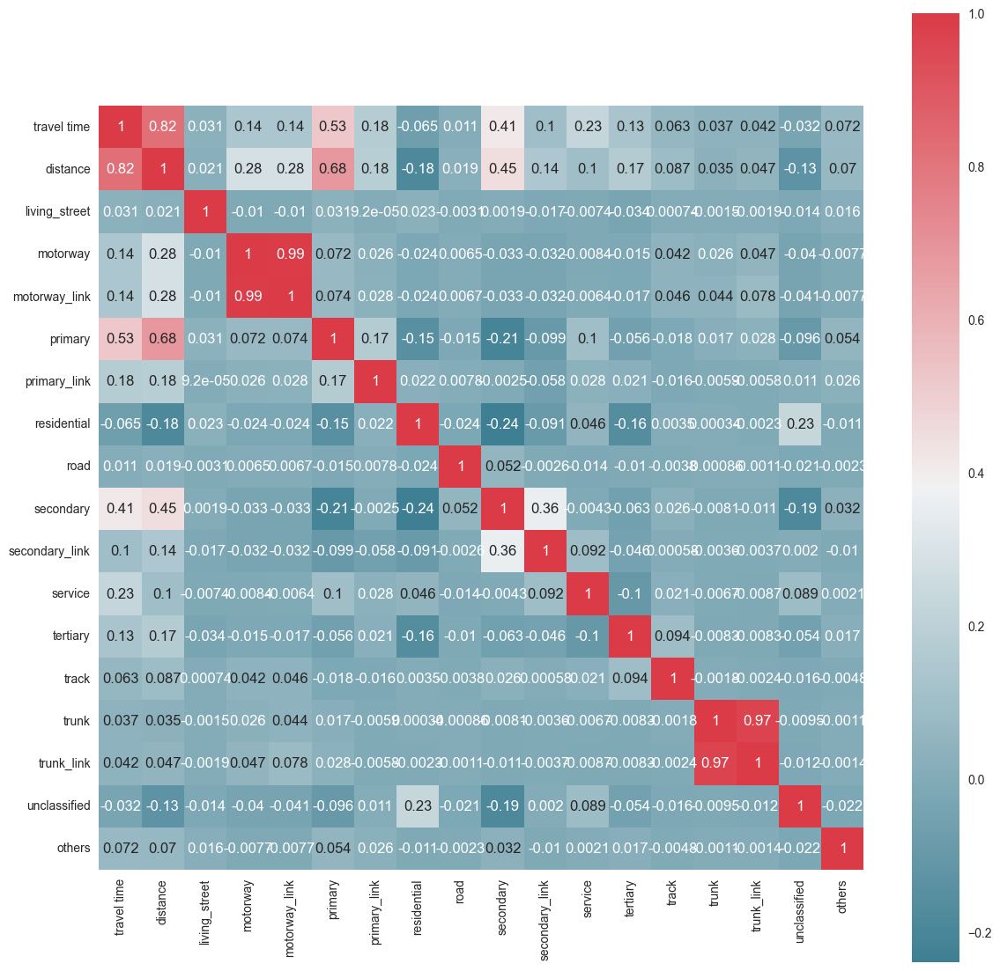

In [127]:
# run correlation matrix and plot
f, ax = plt.subplots(figsize=(14,14))
corr = df8.corr()
sns.heatmap(corr,annot=True, mask=np.zeros_like(corr,dtype=np.bool),
           cmap=sns.diverging_palette(220,10, as_cmap=True),
           square=True, ax=ax)

In [128]:
x = np.array(df8.iloc[:,1:])
y = np.array(df8['travel time'])
x

array([[0.19690065, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.19296034, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.10756486, 0.        , 0.        , ..., 0.        , 0.14336309,
        0.        ],
       ...,
       [0.13963449, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.24652722, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.06848002, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [129]:
#split data into test & train
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [130]:
print(X_train.shape)
print(X_test.shape)
# X_train

(6625, 17)
(1657, 17)


In [423]:
# inputs: distance + roadtypes distance
model7_1_1 = nnmodel_(100,50, num_hlayers=2,Epoch=500)
model7_1_1

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 108005.7109 - mape: 28.7362 - rmse: 328.6422 - val_loss: 166433.7500 - val_mape: 36.6315 - val_rmse: 407.9629
Epoch 2/500
208/208 [==============================] - 0s 856us/step - loss: 83685.3750 - mape: 25.8174 - rmse: 289.2842 - val_loss: 51253.8906 - val_mape: 23.0428 - val_rmse: 226.3932
Epoch 3/500
208/208 [==============================] - 0s 880us/step - loss: 72414.0703 - mape: 24.9097 - rmse: 269.0986 - val_loss: 133424.3594 - val_mape: 34.3461 - val_rmse: 365.2730
Epoch 4/500
208/208 [==============================] - 0s 834us/step - loss: 81282.3672 - mape: 26.3273 - rmse: 285.1006 - val_loss: 51436.3945 - val_mape: 22.7804 - val_rmse: 226.7959
Epoch 5/500
208/208 [==============================] - 0s 849us/step - loss: 70246.8438 - mape: 24.8596 - rmse: 265.0412 - val_loss: 49595.8711 - val_mape: 22.5942 - val_rmse: 222.7013
Epoch 6/500
208/208 [==============================] - 0s 856us/step - los

208/208 [==============================] - 0s 831us/step - loss: 51806.8008 - mape: 21.9201 - rmse: 227.6111 - val_loss: 59066.6445 - val_mape: 22.1106 - val_rmse: 243.0363
Epoch 90/500
208/208 [==============================] - 0s 832us/step - loss: 52103.6016 - mape: 21.9945 - rmse: 228.2621 - val_loss: 61021.6250 - val_mape: 22.5936 - val_rmse: 247.0256
Epoch 91/500
208/208 [==============================] - 0s 823us/step - loss: 51754.7383 - mape: 21.9706 - rmse: 227.4967 - val_loss: 68767.8672 - val_mape: 22.2268 - val_rmse: 262.2363
Epoch 92/500
208/208 [==============================] - 0s 829us/step - loss: 51566.4609 - mape: 21.9925 - rmse: 227.0825 - val_loss: 58561.7383 - val_mape: 23.0068 - val_rmse: 241.9953
Epoch 93/500
208/208 [==============================] - 0s 866us/step - loss: 51411.8633 - mape: 22.0047 - rmse: 226.7418 - val_loss: 58429.2227 - val_mape: 22.0006 - val_rmse: 241.7214
Epoch 94/500
208/208 [==============================] - 0s 834us/step - loss: 49593

Epoch 133/500
208/208 [==============================] - 0s 834us/step - loss: 47518.1133 - mape: 21.0899 - rmse: 217.9865 - val_loss: 62947.9102 - val_mape: 21.8127 - val_rmse: 250.8942
Epoch 134/500
208/208 [==============================] - 0s 840us/step - loss: 47279.0508 - mape: 21.2668 - rmse: 217.4375 - val_loss: 64923.0898 - val_mape: 22.7878 - val_rmse: 254.8001
Epoch 135/500
208/208 [==============================] - 0s 832us/step - loss: 46350.8867 - mape: 20.9491 - rmse: 215.2926 - val_loss: 67632.8281 - val_mape: 22.1860 - val_rmse: 260.0631
Epoch 136/500
208/208 [==============================] - 0s 822us/step - loss: 47147.0312 - mape: 21.1791 - rmse: 217.1337 - val_loss: 65515.4102 - val_mape: 22.9469 - val_rmse: 255.9598
Epoch 137/500
208/208 [==============================] - 0s 831us/step - loss: 47531.0898 - mape: 21.1661 - rmse: 218.0163 - val_loss: 62446.9922 - val_mape: 22.6558 - val_rmse: 249.8940
Epoch 138/500
208/208 [==============================] - 0s 837us

Epoch 177/500
208/208 [==============================] - 0s 830us/step - loss: 42820.8633 - mape: 20.3612 - rmse: 206.9320 - val_loss: 64502.7109 - val_mape: 22.8910 - val_rmse: 253.9738
Epoch 178/500
208/208 [==============================] - 0s 830us/step - loss: 42527.1836 - mape: 20.5001 - rmse: 206.2212 - val_loss: 71633.5859 - val_mape: 22.7390 - val_rmse: 267.6445
Epoch 179/500
208/208 [==============================] - 0s 829us/step - loss: 44435.3594 - mape: 20.6627 - rmse: 210.7970 - val_loss: 67266.7578 - val_mape: 22.2995 - val_rmse: 259.3584
Epoch 180/500
208/208 [==============================] - 0s 830us/step - loss: 41944.0742 - mape: 20.2710 - rmse: 204.8025 - val_loss: 60332.9922 - val_mape: 21.4663 - val_rmse: 245.6277
Epoch 181/500
208/208 [==============================] - 0s 846us/step - loss: 42620.4453 - mape: 20.3951 - rmse: 206.4472 - val_loss: 63946.0859 - val_mape: 22.1519 - val_rmse: 252.8756
Epoch 182/500
208/208 [==============================] - 0s 840us

Epoch 221/500
208/208 [==============================] - 0s 825us/step - loss: 44005.7461 - mape: 20.4675 - rmse: 209.7755 - val_loss: 65188.6719 - val_mape: 22.6633 - val_rmse: 255.3207
Epoch 222/500
208/208 [==============================] - 0s 821us/step - loss: 40525.1719 - mape: 19.8096 - rmse: 201.3087 - val_loss: 68401.3672 - val_mape: 22.8161 - val_rmse: 261.5366
Epoch 223/500
208/208 [==============================] - 0s 830us/step - loss: 39963.8203 - mape: 19.9525 - rmse: 199.9095 - val_loss: 69465.0078 - val_mape: 22.2069 - val_rmse: 263.5622
Epoch 224/500
208/208 [==============================] - 0s 817us/step - loss: 39941.5156 - mape: 19.9350 - rmse: 199.8537 - val_loss: 64410.5703 - val_mape: 22.9818 - val_rmse: 253.7924
Epoch 225/500
208/208 [==============================] - 0s 821us/step - loss: 39066.1953 - mape: 19.6297 - rmse: 197.6517 - val_loss: 65908.4766 - val_mape: 22.7570 - val_rmse: 256.7265
Epoch 226/500
208/208 [==============================] - 0s 841us

Epoch 265/500
208/208 [==============================] - 0s 823us/step - loss: 42580.9102 - mape: 20.1596 - rmse: 206.3514 - val_loss: 66319.6172 - val_mape: 21.5560 - val_rmse: 257.5259
Epoch 266/500
208/208 [==============================] - 0s 830us/step - loss: 41471.3477 - mape: 19.9519 - rmse: 203.6452 - val_loss: 71242.5547 - val_mape: 22.9613 - val_rmse: 266.9130
Epoch 267/500
208/208 [==============================] - 0s 829us/step - loss: 41374.7812 - mape: 20.0103 - rmse: 203.4079 - val_loss: 65506.7539 - val_mape: 21.9705 - val_rmse: 255.9429
Epoch 268/500
208/208 [==============================] - 0s 821us/step - loss: 42157.2148 - mape: 20.1457 - rmse: 205.3222 - val_loss: 67375.3594 - val_mape: 21.7646 - val_rmse: 259.5676
Epoch 269/500
208/208 [==============================] - 0s 834us/step - loss: 39727.3359 - mape: 19.6425 - rmse: 199.3172 - val_loss: 66965.0703 - val_mape: 22.9337 - val_rmse: 258.7761
Epoch 270/500
208/208 [==============================] - 0s 836us

Epoch 309/500
208/208 [==============================] - 0s 868us/step - loss: 37243.3125 - mape: 19.1931 - rmse: 192.9853 - val_loss: 72807.6797 - val_mape: 23.5204 - val_rmse: 269.8290
Epoch 310/500
208/208 [==============================] - 0s 833us/step - loss: 37763.1602 - mape: 19.5754 - rmse: 194.3275 - val_loss: 68423.5156 - val_mape: 22.3373 - val_rmse: 261.5789
Epoch 311/500
208/208 [==============================] - 0s 836us/step - loss: 37481.1719 - mape: 19.3658 - rmse: 193.6005 - val_loss: 80095.3359 - val_mape: 22.0207 - val_rmse: 283.0112
Epoch 312/500
208/208 [==============================] - 0s 843us/step - loss: 36455.1445 - mape: 19.1585 - rmse: 190.9323 - val_loss: 81205.1484 - val_mape: 22.3894 - val_rmse: 284.9652
Epoch 313/500
208/208 [==============================] - 0s 829us/step - loss: 36599.7070 - mape: 19.2773 - rmse: 191.3105 - val_loss: 75425.5625 - val_mape: 24.4426 - val_rmse: 274.6371
Epoch 314/500
208/208 [==============================] - 0s 836us

Epoch 353/500
208/208 [==============================] - 0s 830us/step - loss: 38941.4570 - mape: 19.3981 - rmse: 197.3359 - val_loss: 68952.3438 - val_mape: 22.3642 - val_rmse: 262.5878
Epoch 354/500
208/208 [==============================] - 0s 837us/step - loss: 35606.5625 - mape: 19.1571 - rmse: 188.6970 - val_loss: 81414.8750 - val_mape: 22.7219 - val_rmse: 285.3329
Epoch 355/500
208/208 [==============================] - 0s 836us/step - loss: 35521.9609 - mape: 18.8926 - rmse: 188.4727 - val_loss: 76281.5078 - val_mape: 23.6754 - val_rmse: 276.1911
Epoch 356/500
208/208 [==============================] - 0s 839us/step - loss: 36143.1094 - mape: 19.2103 - rmse: 190.1134 - val_loss: 73678.2266 - val_mape: 22.9233 - val_rmse: 271.4373
Epoch 357/500
208/208 [==============================] - 0s 829us/step - loss: 36765.8398 - mape: 19.3515 - rmse: 191.7442 - val_loss: 69073.5859 - val_mape: 21.7162 - val_rmse: 262.8185
Epoch 358/500
208/208 [==============================] - 0s 835us

Epoch 397/500
208/208 [==============================] - 0s 827us/step - loss: 36051.0039 - mape: 19.0622 - rmse: 189.8710 - val_loss: 75989.2188 - val_mape: 23.3369 - val_rmse: 275.6614
Epoch 398/500
208/208 [==============================] - 0s 833us/step - loss: 34663.7422 - mape: 18.8148 - rmse: 186.1820 - val_loss: 83590.2266 - val_mape: 22.2957 - val_rmse: 289.1198
Epoch 399/500
208/208 [==============================] - 0s 835us/step - loss: 35380.4688 - mape: 18.8860 - rmse: 188.0970 - val_loss: 120197.1094 - val_mape: 23.5696 - val_rmse: 346.6945
Epoch 400/500
208/208 [==============================] - 0s 829us/step - loss: 34598.0234 - mape: 18.9798 - rmse: 186.0054 - val_loss: 70707.8125 - val_mape: 22.7619 - val_rmse: 265.9094
Epoch 401/500
208/208 [==============================] - 0s 819us/step - loss: 35976.1953 - mape: 19.0440 - rmse: 189.6739 - val_loss: 66026.5312 - val_mape: 22.6636 - val_rmse: 256.9563
Epoch 402/500
208/208 [==============================] - 0s 841u

Epoch 441/500
208/208 [==============================] - 0s 830us/step - loss: 33654.8789 - mape: 18.6434 - rmse: 183.4527 - val_loss: 69245.1406 - val_mape: 22.2343 - val_rmse: 263.1447
Epoch 442/500
208/208 [==============================] - 0s 823us/step - loss: 34450.6875 - mape: 18.7018 - rmse: 185.6090 - val_loss: 76241.5078 - val_mape: 22.6406 - val_rmse: 276.1187
Epoch 443/500
208/208 [==============================] - 0s 825us/step - loss: 35219.2148 - mape: 19.0053 - rmse: 187.6678 - val_loss: 71521.5234 - val_mape: 22.6361 - val_rmse: 267.4351
Epoch 444/500
208/208 [==============================] - 0s 836us/step - loss: 34131.8984 - mape: 18.7953 - rmse: 184.7482 - val_loss: 71897.3516 - val_mape: 22.8085 - val_rmse: 268.1368
Epoch 445/500
208/208 [==============================] - 0s 842us/step - loss: 35043.9688 - mape: 18.8427 - rmse: 187.2003 - val_loss: 74580.8828 - val_mape: 23.4556 - val_rmse: 273.0950
Epoch 446/500
208/208 [==============================] - 0s 823us

Epoch 485/500
208/208 [==============================] - 0s 850us/step - loss: 33975.9805 - mape: 18.6536 - rmse: 184.3257 - val_loss: 77067.3516 - val_mape: 22.7045 - val_rmse: 277.6101
Epoch 486/500
208/208 [==============================] - 0s 835us/step - loss: 33001.2930 - mape: 18.5824 - rmse: 181.6626 - val_loss: 71249.3125 - val_mape: 22.0548 - val_rmse: 266.9257
Epoch 487/500
208/208 [==============================] - 0s 814us/step - loss: 33633.3828 - mape: 18.5549 - rmse: 183.3941 - val_loss: 72630.9219 - val_mape: 22.5214 - val_rmse: 269.5013
Epoch 488/500
208/208 [==============================] - 0s 824us/step - loss: 33380.4492 - mape: 18.7500 - rmse: 182.7032 - val_loss: 76195.8672 - val_mape: 22.6278 - val_rmse: 276.0360
Epoch 489/500
208/208 [==============================] - 0s 834us/step - loss: 35711.2812 - mape: 19.1719 - rmse: 188.9743 - val_loss: 73512.6875 - val_mape: 22.3310 - val_rmse: 271.1322
Epoch 490/500
208/208 [==============================] - 0s 848us

In [131]:
# plotme(model7_1_1)

In [425]:
# inputs: distance + hour + roadtypes distance
model7_1_2 = nnmodel_(200,100, num_hlayers=2,Epoch=500)
model7_1_2

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 134383.9219 - mape: 31.1522 - rmse: 366.5841 - val_loss: 58129.9805 - val_mape: 22.8693 - val_rmse: 241.1016
Epoch 2/500
208/208 [==============================] - 0s 928us/step - loss: 95354.4531 - mape: 27.4552 - rmse: 308.7952 - val_loss: 61739.9219 - val_mape: 23.6846 - val_rmse: 248.4752
Epoch 3/500
208/208 [==============================] - 0s 906us/step - loss: 83305.8125 - mape: 26.3321 - rmse: 288.6275 - val_loss: 60040.8828 - val_mape: 23.4478 - val_rmse: 245.0324
Epoch 4/500
208/208 [==============================] - 0s 908us/step - loss: 80458.0312 - mape: 26.0006 - rmse: 283.6512 - val_loss: 66040.1562 - val_mape: 25.5705 - val_rmse: 256.9828
Epoch 5/500
208/208 [==============================] - 0s 920us/step - loss: 79089.9219 - mape: 25.7256 - rmse: 281.2293 - val_loss: 166980.3125 - val_mape: 37.9441 - val_rmse: 408.6322
Epoch 6/500
208/208 [==============================] - 0s 917us/step - loss

208/208 [==============================] - 0s 903us/step - loss: 50949.9375 - mape: 21.7356 - rmse: 225.7209 - val_loss: 70235.0312 - val_mape: 22.0154 - val_rmse: 265.0189
Epoch 90/500
208/208 [==============================] - 0s 893us/step - loss: 49491.3594 - mape: 21.5362 - rmse: 222.4665 - val_loss: 86344.3750 - val_mape: 25.3335 - val_rmse: 293.8441
Epoch 91/500
208/208 [==============================] - 0s 892us/step - loss: 50402.8594 - mape: 21.4977 - rmse: 224.5058 - val_loss: 70972.1172 - val_mape: 22.1745 - val_rmse: 266.4059
Epoch 92/500
208/208 [==============================] - 0s 902us/step - loss: 51084.8867 - mape: 21.5923 - rmse: 226.0197 - val_loss: 75710.8047 - val_mape: 23.4835 - val_rmse: 275.1560
Epoch 93/500
208/208 [==============================] - 0s 898us/step - loss: 51474.7109 - mape: 21.7963 - rmse: 226.8804 - val_loss: 78107.9219 - val_mape: 23.7774 - val_rmse: 279.4779
Epoch 94/500
208/208 [==============================] - 0s 895us/step - loss: 49243

Epoch 133/500
208/208 [==============================] - 0s 894us/step - loss: 44397.3477 - mape: 20.5604 - rmse: 210.7068 - val_loss: 99686.3047 - val_mape: 22.6739 - val_rmse: 315.7314
Epoch 134/500
208/208 [==============================] - 0s 886us/step - loss: 45472.6719 - mape: 20.8473 - rmse: 213.2432 - val_loss: 94083.3438 - val_mape: 23.4829 - val_rmse: 306.7301
Epoch 135/500
208/208 [==============================] - 0s 896us/step - loss: 45270.3203 - mape: 20.7179 - rmse: 212.7682 - val_loss: 90571.1172 - val_mape: 22.6129 - val_rmse: 300.9503
Epoch 136/500
208/208 [==============================] - 0s 901us/step - loss: 44859.6289 - mape: 20.5481 - rmse: 211.8009 - val_loss: 90136.0078 - val_mape: 23.3674 - val_rmse: 300.2266
Epoch 137/500
208/208 [==============================] - 0s 895us/step - loss: 44981.2031 - mape: 20.6525 - rmse: 212.0877 - val_loss: 97173.1016 - val_mape: 22.3125 - val_rmse: 311.7260
Epoch 138/500
208/208 [==============================] - 0s 881us

Epoch 177/500
208/208 [==============================] - 0s 899us/step - loss: 40486.4805 - mape: 19.8992 - rmse: 201.2125 - val_loss: 96294.4609 - val_mape: 24.2536 - val_rmse: 310.3135
Epoch 178/500
208/208 [==============================] - 0s 891us/step - loss: 41118.8906 - mape: 20.0212 - rmse: 202.7779 - val_loss: 95505.0312 - val_mape: 22.7133 - val_rmse: 309.0389
Epoch 179/500
208/208 [==============================] - 0s 895us/step - loss: 40109.9531 - mape: 19.7744 - rmse: 200.2747 - val_loss: 125869.7812 - val_mape: 23.4213 - val_rmse: 354.7813
Epoch 180/500
208/208 [==============================] - 0s 899us/step - loss: 40755.4336 - mape: 19.7922 - rmse: 201.8797 - val_loss: 92518.1094 - val_mape: 22.5937 - val_rmse: 304.1679
Epoch 181/500
208/208 [==============================] - 0s 900us/step - loss: 40171.3984 - mape: 19.8401 - rmse: 200.4280 - val_loss: 120743.0234 - val_mape: 23.0248 - val_rmse: 347.4810
Epoch 182/500
208/208 [==============================] - 0s 907

Epoch 221/500
208/208 [==============================] - 0s 890us/step - loss: 37077.4453 - mape: 19.1592 - rmse: 192.5550 - val_loss: 89798.8828 - val_mape: 24.1412 - val_rmse: 299.6646
Epoch 222/500
208/208 [==============================] - 0s 885us/step - loss: 37485.2617 - mape: 19.2416 - rmse: 193.6111 - val_loss: 89886.4062 - val_mape: 22.2517 - val_rmse: 299.8106
Epoch 223/500
208/208 [==============================] - 0s 895us/step - loss: 40756.7500 - mape: 19.8238 - rmse: 201.8830 - val_loss: 97752.5859 - val_mape: 23.1639 - val_rmse: 312.6541
Epoch 224/500
208/208 [==============================] - 0s 893us/step - loss: 41292.1953 - mape: 19.7886 - rmse: 203.2048 - val_loss: 81896.1719 - val_mape: 22.2608 - val_rmse: 286.1751
Epoch 225/500
208/208 [==============================] - 0s 898us/step - loss: 39016.3125 - mape: 19.4048 - rmse: 197.5255 - val_loss: 97110.5781 - val_mape: 22.8276 - val_rmse: 311.6257
Epoch 226/500
208/208 [==============================] - 0s 889us

Epoch 265/500
208/208 [==============================] - 0s 889us/step - loss: 35094.9922 - mape: 18.6978 - rmse: 187.3366 - val_loss: 95913.5703 - val_mape: 22.8594 - val_rmse: 309.6992
Epoch 266/500
208/208 [==============================] - 0s 901us/step - loss: 36961.5586 - mape: 19.0084 - rmse: 192.2539 - val_loss: 98436.7812 - val_mape: 22.6645 - val_rmse: 313.7464
Epoch 267/500
208/208 [==============================] - 0s 890us/step - loss: 35813.5391 - mape: 18.8579 - rmse: 189.2447 - val_loss: 93487.8203 - val_mape: 23.3118 - val_rmse: 305.7578
Epoch 268/500
208/208 [==============================] - 0s 886us/step - loss: 35759.8047 - mape: 18.9012 - rmse: 189.1026 - val_loss: 97145.2422 - val_mape: 23.4037 - val_rmse: 311.6813
Epoch 269/500
208/208 [==============================] - 0s 890us/step - loss: 35692.4492 - mape: 18.9161 - rmse: 188.9245 - val_loss: 97945.5234 - val_mape: 23.3727 - val_rmse: 312.9625
Epoch 270/500
208/208 [==============================] - 0s 889us

Epoch 309/500
208/208 [==============================] - 0s 896us/step - loss: 34180.1602 - mape: 18.4411 - rmse: 184.8788 - val_loss: 111617.6094 - val_mape: 24.2200 - val_rmse: 334.0922
Epoch 310/500
208/208 [==============================] - 0s 898us/step - loss: 35237.8672 - mape: 18.8868 - rmse: 187.7175 - val_loss: 116056.1484 - val_mape: 24.0512 - val_rmse: 340.6701
Epoch 311/500
208/208 [==============================] - 0s 890us/step - loss: 33456.8828 - mape: 18.3394 - rmse: 182.9122 - val_loss: 112271.1094 - val_mape: 23.2273 - val_rmse: 335.0688
Epoch 312/500
208/208 [==============================] - 0s 885us/step - loss: 33318.0898 - mape: 18.3501 - rmse: 182.5324 - val_loss: 104274.0469 - val_mape: 23.6602 - val_rmse: 322.9149
Epoch 313/500
208/208 [==============================] - 0s 899us/step - loss: 35109.7891 - mape: 18.7738 - rmse: 187.3761 - val_loss: 112037.9453 - val_mape: 22.8139 - val_rmse: 334.7207
Epoch 314/500
208/208 [==============================] - 0s 

Epoch 396/500
208/208 [==============================] - 0s 899us/step - loss: 33484.1797 - mape: 18.4109 - rmse: 182.9868 - val_loss: 120615.4844 - val_mape: 23.4924 - val_rmse: 347.2974
Epoch 397/500
208/208 [==============================] - 0s 888us/step - loss: 31479.9570 - mape: 18.0856 - rmse: 177.4259 - val_loss: 122923.7812 - val_mape: 22.7751 - val_rmse: 350.6049
Epoch 398/500
208/208 [==============================] - 0s 895us/step - loss: 30906.4668 - mape: 17.8399 - rmse: 175.8024 - val_loss: 135425.8594 - val_mape: 23.5785 - val_rmse: 368.0025
Epoch 399/500
208/208 [==============================] - 0s 894us/step - loss: 30764.9688 - mape: 17.7829 - rmse: 175.3995 - val_loss: 118142.5312 - val_mape: 23.3697 - val_rmse: 343.7187
Epoch 400/500
208/208 [==============================] - 0s 895us/step - loss: 30969.5156 - mape: 17.8483 - rmse: 175.9816 - val_loss: 122324.0234 - val_mape: 24.1943 - val_rmse: 349.7485
Epoch 401/500
208/208 [==============================] - 0s 

Epoch 483/500
208/208 [==============================] - 0s 889us/step - loss: 29489.4805 - mape: 17.5324 - rmse: 171.7250 - val_loss: 123706.2031 - val_mape: 23.6619 - val_rmse: 351.7189
Epoch 484/500
208/208 [==============================] - 0s 888us/step - loss: 30060.5254 - mape: 17.7573 - rmse: 173.3797 - val_loss: 116499.3281 - val_mape: 24.0841 - val_rmse: 341.3200
Epoch 485/500
208/208 [==============================] - 0s 880us/step - loss: 29777.0762 - mape: 17.7830 - rmse: 172.5603 - val_loss: 120863.4609 - val_mape: 24.2274 - val_rmse: 347.6542
Epoch 486/500
208/208 [==============================] - 0s 890us/step - loss: 30734.5469 - mape: 17.9080 - rmse: 175.3127 - val_loss: 131745.1562 - val_mape: 24.0818 - val_rmse: 362.9672
Epoch 487/500
208/208 [==============================] - 0s 893us/step - loss: 29827.6719 - mape: 17.6999 - rmse: 172.7069 - val_loss: 127065.3828 - val_mape: 24.8806 - val_rmse: 356.4623
Epoch 488/500
208/208 [==============================] - 0s 

In [132]:
# plotme(model7_1_2)

In [133]:
# inputs: distance + roadtypes distance
model7_1_3 = nnmodel_(50, num_hlayers=1,Epoch=500)
model7_1_3

Epoch 1/500
208/208 [==============================] - 0s 2ms/step - loss: 812935.0625 - mape: 99.7148 - rmse: 901.6291 - val_loss: 802304.6250 - val_mape: 99.2202 - val_rmse: 895.7146
Epoch 2/500
208/208 [==============================] - 0s 807us/step - loss: 797290.1875 - mape: 98.2345 - rmse: 892.9111 - val_loss: 778600.0000 - val_mape: 96.9767 - val_rmse: 882.3831
Epoch 3/500
208/208 [==============================] - 0s 808us/step - loss: 765820.0000 - mape: 95.2006 - rmse: 875.1115 - val_loss: 739796.1875 - val_mape: 93.2144 - val_rmse: 860.1141
Epoch 4/500
208/208 [==============================] - 0s 819us/step - loss: 721408.7500 - mape: 90.8091 - rmse: 849.3578 - val_loss: 689994.2500 - val_mape: 88.2110 - val_rmse: 830.6589
Epoch 5/500
208/208 [==============================] - 0s 795us/step - loss: 667368.8750 - mape: 85.2275 - rmse: 816.9265 - val_loss: 632084.4375 - val_mape: 82.1138 - val_rmse: 795.0374
Epoch 6/500
208/208 [==============================] - 0s 808us/ste

Epoch 45/500
208/208 [==============================] - 0s 844us/step - loss: 67903.6797 - mape: 31.1825 - rmse: 260.5833 - val_loss: 61094.9922 - val_mape: 29.9345 - val_rmse: 247.1740
Epoch 46/500
208/208 [==============================] - 0s 798us/step - loss: 66922.1797 - mape: 30.2593 - rmse: 258.6932 - val_loss: 60027.6836 - val_mape: 29.3590 - val_rmse: 245.0055
Epoch 47/500
208/208 [==============================] - 0s 795us/step - loss: 65988.6797 - mape: 29.8879 - rmse: 256.8826 - val_loss: 59086.7266 - val_mape: 29.0857 - val_rmse: 243.0776
Epoch 48/500
208/208 [==============================] - 0s 793us/step - loss: 65123.8984 - mape: 29.5620 - rmse: 255.1938 - val_loss: 58115.1289 - val_mape: 28.4112 - val_rmse: 241.0708
Epoch 49/500
208/208 [==============================] - 0s 798us/step - loss: 64300.3945 - mape: 28.8149 - rmse: 253.5752 - val_loss: 57270.0156 - val_mape: 28.1899 - val_rmse: 239.3115
Epoch 50/500
208/208 [==============================] - 0s 798us/step 

208/208 [==============================] - 0s 811us/step - loss: 55781.9688 - mape: 23.4140 - rmse: 236.1821 - val_loss: 47411.0664 - val_mape: 22.6052 - val_rmse: 217.7408
Epoch 90/500
208/208 [==============================] - 0s 795us/step - loss: 55763.6680 - mape: 23.3383 - rmse: 236.1433 - val_loss: 47407.6797 - val_mape: 22.6856 - val_rmse: 217.7330
Epoch 91/500
208/208 [==============================] - 0s 838us/step - loss: 55742.9141 - mape: 23.2988 - rmse: 236.0994 - val_loss: 47399.2188 - val_mape: 22.7239 - val_rmse: 217.7136
Epoch 92/500
208/208 [==============================] - 0s 796us/step - loss: 55728.0742 - mape: 23.3283 - rmse: 236.0679 - val_loss: 47365.5312 - val_mape: 22.7019 - val_rmse: 217.6362
Epoch 93/500
208/208 [==============================] - 0s 805us/step - loss: 55713.4102 - mape: 23.4704 - rmse: 236.0369 - val_loss: 47309.8594 - val_mape: 22.5588 - val_rmse: 217.5083
Epoch 94/500
208/208 [==============================] - 0s 798us/step - loss: 55699

Epoch 133/500
208/208 [==============================] - 0s 788us/step - loss: 55301.4375 - mape: 23.0138 - rmse: 235.1626 - val_loss: 46842.7695 - val_mape: 22.4650 - val_rmse: 216.4319
Epoch 134/500
208/208 [==============================] - 0s 801us/step - loss: 55301.2656 - mape: 23.0284 - rmse: 235.1622 - val_loss: 46815.4922 - val_mape: 22.3895 - val_rmse: 216.3689
Epoch 135/500
208/208 [==============================] - 0s 796us/step - loss: 55287.9727 - mape: 22.8769 - rmse: 235.1339 - val_loss: 46855.2695 - val_mape: 22.5476 - val_rmse: 216.4608
Epoch 136/500
208/208 [==============================] - 0s 801us/step - loss: 55306.9414 - mape: 23.3566 - rmse: 235.1743 - val_loss: 46809.8086 - val_mape: 22.4546 - val_rmse: 216.3557
Epoch 137/500
208/208 [==============================] - 0s 795us/step - loss: 55270.8750 - mape: 22.9923 - rmse: 235.0976 - val_loss: 46777.7734 - val_mape: 22.3438 - val_rmse: 216.2817
Epoch 138/500
208/208 [==============================] - 0s 807us

Epoch 177/500
208/208 [==============================] - 0s 799us/step - loss: 54978.4375 - mape: 22.9774 - rmse: 234.4748 - val_loss: 46563.4336 - val_mape: 22.3121 - val_rmse: 215.7856
Epoch 178/500
208/208 [==============================] - 0s 794us/step - loss: 54969.7930 - mape: 22.9549 - rmse: 234.4564 - val_loss: 46556.3828 - val_mape: 22.2912 - val_rmse: 215.7693
Epoch 179/500
208/208 [==============================] - 0s 806us/step - loss: 54969.3789 - mape: 22.9125 - rmse: 234.4555 - val_loss: 46582.8906 - val_mape: 22.4054 - val_rmse: 215.8307
Epoch 180/500
208/208 [==============================] - 0s 785us/step - loss: 54957.1133 - mape: 22.9575 - rmse: 234.4293 - val_loss: 46563.2305 - val_mape: 22.3485 - val_rmse: 215.7852
Epoch 181/500
208/208 [==============================] - 0s 804us/step - loss: 54967.4805 - mape: 23.0489 - rmse: 234.4514 - val_loss: 46558.3594 - val_mape: 22.3421 - val_rmse: 215.7739
Epoch 182/500
208/208 [==============================] - 0s 794us

Epoch 221/500
208/208 [==============================] - 0s 799us/step - loss: 54666.5508 - mape: 22.7995 - rmse: 233.8088 - val_loss: 46359.6289 - val_mape: 22.2690 - val_rmse: 215.3129
Epoch 222/500
208/208 [==============================] - 0s 787us/step - loss: 54658.6016 - mape: 22.8492 - rmse: 233.7918 - val_loss: 46352.9219 - val_mape: 22.2676 - val_rmse: 215.2973
Epoch 223/500
208/208 [==============================] - 0s 802us/step - loss: 54653.9766 - mape: 22.8659 - rmse: 233.7819 - val_loss: 46359.8750 - val_mape: 22.3185 - val_rmse: 215.3134
Epoch 224/500
208/208 [==============================] - 0s 806us/step - loss: 54642.9062 - mape: 22.8918 - rmse: 233.7582 - val_loss: 46321.3750 - val_mape: 22.1765 - val_rmse: 215.2240
Epoch 225/500
208/208 [==============================] - 0s 819us/step - loss: 54637.2266 - mape: 22.8617 - rmse: 233.7461 - val_loss: 46326.4219 - val_mape: 22.2224 - val_rmse: 215.2357
Epoch 226/500
208/208 [==============================] - 0s 808us

Epoch 265/500
208/208 [==============================] - 0s 803us/step - loss: 54396.5273 - mape: 22.8184 - rmse: 233.2306 - val_loss: 46149.1758 - val_mape: 22.0891 - val_rmse: 214.8236
Epoch 266/500
208/208 [==============================] - 0s 802us/step - loss: 54377.8203 - mape: 22.6500 - rmse: 233.1905 - val_loss: 46162.0312 - val_mape: 22.1929 - val_rmse: 214.8535
Epoch 267/500
208/208 [==============================] - 0s 825us/step - loss: 54382.2695 - mape: 22.8691 - rmse: 233.2001 - val_loss: 46138.5000 - val_mape: 22.1050 - val_rmse: 214.7987
Epoch 268/500
208/208 [==============================] - 0s 809us/step - loss: 54363.7930 - mape: 22.8623 - rmse: 233.1604 - val_loss: 46100.3984 - val_mape: 21.8737 - val_rmse: 214.7100
Epoch 269/500
208/208 [==============================] - 0s 799us/step - loss: 54375.4727 - mape: 22.6671 - rmse: 233.1855 - val_loss: 46113.7930 - val_mape: 21.9978 - val_rmse: 214.7412
Epoch 270/500
208/208 [==============================] - 0s 837us

Epoch 309/500
208/208 [==============================] - 0s 794us/step - loss: 54116.3750 - mape: 22.8570 - rmse: 232.6293 - val_loss: 45979.8750 - val_mape: 22.0851 - val_rmse: 214.4292
Epoch 310/500
208/208 [==============================] - 0s 788us/step - loss: 54119.2930 - mape: 22.6955 - rmse: 232.6355 - val_loss: 45973.7148 - val_mape: 22.0599 - val_rmse: 214.4148
Epoch 311/500
208/208 [==============================] - 0s 789us/step - loss: 54103.6445 - mape: 22.7576 - rmse: 232.6019 - val_loss: 45967.4062 - val_mape: 22.0483 - val_rmse: 214.4001
Epoch 312/500
208/208 [==============================] - 0s 797us/step - loss: 54105.0586 - mape: 22.6929 - rmse: 232.6049 - val_loss: 45973.5625 - val_mape: 22.0980 - val_rmse: 214.4145
Epoch 313/500
208/208 [==============================] - 0s 801us/step - loss: 54099.9492 - mape: 22.7828 - rmse: 232.5940 - val_loss: 45963.9531 - val_mape: 22.0791 - val_rmse: 214.3921
Epoch 314/500
208/208 [==============================] - 0s 788us

Epoch 353/500
208/208 [==============================] - 0s 791us/step - loss: 53853.8281 - mape: 22.6202 - rmse: 232.0643 - val_loss: 45894.0195 - val_mape: 22.3005 - val_rmse: 214.2289
Epoch 354/500
208/208 [==============================] - 0s 795us/step - loss: 53868.1250 - mape: 22.8047 - rmse: 232.0951 - val_loss: 45871.2188 - val_mape: 22.2544 - val_rmse: 214.1757
Epoch 355/500
208/208 [==============================] - 0s 789us/step - loss: 53848.5625 - mape: 22.8328 - rmse: 232.0529 - val_loss: 45799.8945 - val_mape: 21.9842 - val_rmse: 214.0091
Epoch 356/500
208/208 [==============================] - 0s 786us/step - loss: 53837.2109 - mape: 22.7545 - rmse: 232.0285 - val_loss: 45789.6602 - val_mape: 21.9567 - val_rmse: 213.9852
Epoch 357/500
208/208 [==============================] - 0s 787us/step - loss: 53826.0586 - mape: 22.7356 - rmse: 232.0044 - val_loss: 45782.9375 - val_mape: 21.9495 - val_rmse: 213.9695
Epoch 358/500
208/208 [==============================] - 0s 795us

Epoch 397/500
208/208 [==============================] - 0s 793us/step - loss: 53610.2852 - mape: 22.6529 - rmse: 231.5390 - val_loss: 45676.7617 - val_mape: 22.0327 - val_rmse: 213.7212
Epoch 398/500
208/208 [==============================] - 0s 800us/step - loss: 53605.3984 - mape: 22.6762 - rmse: 231.5284 - val_loss: 45651.1289 - val_mape: 21.8644 - val_rmse: 213.6613
Epoch 399/500
208/208 [==============================] - 0s 792us/step - loss: 53596.8125 - mape: 22.5090 - rmse: 231.5099 - val_loss: 45715.1484 - val_mape: 22.1674 - val_rmse: 213.8110
Epoch 400/500
208/208 [==============================] - 0s 792us/step - loss: 53596.4531 - mape: 22.7720 - rmse: 231.5091 - val_loss: 45686.7578 - val_mape: 22.0785 - val_rmse: 213.7446
Epoch 401/500
208/208 [==============================] - 0s 798us/step - loss: 53583.7227 - mape: 22.7167 - rmse: 231.4816 - val_loss: 45672.4297 - val_mape: 22.0268 - val_rmse: 213.7111
Epoch 402/500
208/208 [==============================] - 0s 797us

Epoch 441/500
208/208 [==============================] - 0s 784us/step - loss: 53383.3555 - mape: 22.7402 - rmse: 231.0484 - val_loss: 45563.6250 - val_mape: 22.1610 - val_rmse: 213.4564
Epoch 442/500
208/208 [==============================] - 0s 798us/step - loss: 53379.4141 - mape: 22.6699 - rmse: 231.0399 - val_loss: 45524.4844 - val_mape: 22.0101 - val_rmse: 213.3647
Epoch 443/500
208/208 [==============================] - 0s 795us/step - loss: 53369.4180 - mape: 22.6082 - rmse: 231.0182 - val_loss: 45584.1914 - val_mape: 22.2341 - val_rmse: 213.5045
Epoch 444/500
208/208 [==============================] - 0s 799us/step - loss: 53374.1797 - mape: 22.7120 - rmse: 231.0285 - val_loss: 45558.7969 - val_mape: 22.1756 - val_rmse: 213.4451
Epoch 445/500
208/208 [==============================] - 0s 796us/step - loss: 53369.3359 - mape: 22.6724 - rmse: 231.0180 - val_loss: 45524.2617 - val_mape: 22.0782 - val_rmse: 213.3642
Epoch 446/500
208/208 [==============================] - 0s 803us

Epoch 485/500
208/208 [==============================] - 0s 786us/step - loss: 53163.1445 - mape: 22.5824 - rmse: 230.5714 - val_loss: 45401.1328 - val_mape: 22.0904 - val_rmse: 213.0754
Epoch 486/500
208/208 [==============================] - 0s 795us/step - loss: 53172.7891 - mape: 22.7318 - rmse: 230.5923 - val_loss: 45369.6797 - val_mape: 22.0069 - val_rmse: 213.0016
Epoch 487/500
208/208 [==============================] - 0s 784us/step - loss: 53147.9844 - mape: 22.7597 - rmse: 230.5385 - val_loss: 45326.8555 - val_mape: 21.8268 - val_rmse: 212.9010
Epoch 488/500
208/208 [==============================] - 0s 795us/step - loss: 53174.1719 - mape: 22.5822 - rmse: 230.5953 - val_loss: 45330.6836 - val_mape: 21.8460 - val_rmse: 212.9100
Epoch 489/500
208/208 [==============================] - 0s 851us/step - loss: 53152.0352 - mape: 22.6235 - rmse: 230.5473 - val_loss: 45355.1484 - val_mape: 21.9867 - val_rmse: 212.9675
Epoch 490/500
208/208 [==============================] - 0s 851us

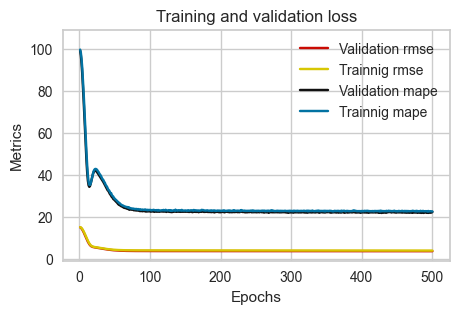

In [134]:
plotme(model7_1_3)

In [427]:
# inputs: distance + roadtypes distance
model7_1_4 = nnmodel_(10, num_hlayers=1,Epoch=500)
model7_1_4

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 220399.4844 - mape: 42.4298 - rmse: 469.4672 - val_loss: 136073.3906 - val_mape: 30.8901 - val_rmse: 368.8813
Epoch 2/500
208/208 [==============================] - 0s 779us/step - loss: 108732.9219 - mape: 28.0273 - rmse: 329.7468 - val_loss: 85110.6562 - val_mape: 24.5380 - val_rmse: 291.7373
Epoch 3/500
208/208 [==============================] - 0s 762us/step - loss: 85939.0625 - mape: 25.0119 - rmse: 293.1537 - val_loss: 66412.0625 - val_mape: 23.3211 - val_rmse: 257.7054
Epoch 4/500
208/208 [==============================] - 0s 810us/step - loss: 79666.1016 - mape: 24.6217 - rmse: 282.2518 - val_loss: 59535.9375 - val_mape: 22.5580 - val_rmse: 243.9999
Epoch 5/500
208/208 [==============================] - 0s 773us/step - loss: 75942.7734 - mape: 24.3790 - rmse: 275.5772 - val_loss: 66797.5156 - val_mape: 25.0516 - val_rmse: 258.4521
Epoch 6/500
208/208 [==============================] - 0s 779us/step - los

208/208 [==============================] - 0s 763us/step - loss: 62642.2305 - mape: 23.4535 - rmse: 250.2843 - val_loss: 67644.8125 - val_mape: 26.0099 - val_rmse: 260.0862
Epoch 90/500
208/208 [==============================] - 0s 766us/step - loss: 65100.1445 - mape: 23.8365 - rmse: 255.1473 - val_loss: 51106.9531 - val_mape: 22.5928 - val_rmse: 226.0685
Epoch 91/500
208/208 [==============================] - 0s 764us/step - loss: 62547.5781 - mape: 23.3562 - rmse: 250.0951 - val_loss: 50928.0352 - val_mape: 22.5386 - val_rmse: 225.6724
Epoch 92/500
208/208 [==============================] - 0s 754us/step - loss: 60815.4766 - mape: 22.9722 - rmse: 246.6079 - val_loss: 86218.8359 - val_mape: 27.2629 - val_rmse: 293.6304
Epoch 93/500
208/208 [==============================] - 0s 775us/step - loss: 65940.2188 - mape: 23.9371 - rmse: 256.7883 - val_loss: 50543.9609 - val_mape: 22.0047 - val_rmse: 224.8198
Epoch 94/500
208/208 [==============================] - 0s 760us/step - loss: 62935

Epoch 133/500
208/208 [==============================] - 0s 762us/step - loss: 61626.0703 - mape: 23.1408 - rmse: 248.2460 - val_loss: 50530.4297 - val_mape: 22.1603 - val_rmse: 224.7897
Epoch 134/500
208/208 [==============================] - 0s 773us/step - loss: 62053.1094 - mape: 23.0910 - rmse: 249.1046 - val_loss: 49461.2188 - val_mape: 22.0188 - val_rmse: 222.3988
Epoch 135/500
208/208 [==============================] - 0s 798us/step - loss: 61394.7109 - mape: 22.9866 - rmse: 247.7796 - val_loss: 50315.4766 - val_mape: 21.6546 - val_rmse: 224.3111
Epoch 136/500
208/208 [==============================] - 0s 769us/step - loss: 61616.7305 - mape: 22.9629 - rmse: 248.2272 - val_loss: 49622.9336 - val_mape: 22.0117 - val_rmse: 222.7621
Epoch 137/500
208/208 [==============================] - 0s 755us/step - loss: 62786.6406 - mape: 23.3441 - rmse: 250.5726 - val_loss: 51219.5039 - val_mape: 21.3625 - val_rmse: 226.3173
Epoch 138/500
208/208 [==============================] - 0s 761us

Epoch 177/500
208/208 [==============================] - 0s 760us/step - loss: 59958.5508 - mape: 22.6961 - rmse: 244.8643 - val_loss: 51448.5039 - val_mape: 22.5658 - val_rmse: 226.8226
Epoch 178/500
208/208 [==============================] - 0s 762us/step - loss: 59695.5547 - mape: 22.7829 - rmse: 244.3267 - val_loss: 50607.6055 - val_mape: 22.0381 - val_rmse: 224.9613
Epoch 179/500
208/208 [==============================] - 0s 764us/step - loss: 60678.8945 - mape: 22.7854 - rmse: 246.3309 - val_loss: 50055.3789 - val_mape: 22.0901 - val_rmse: 223.7306
Epoch 180/500
208/208 [==============================] - 0s 770us/step - loss: 59758.8008 - mape: 22.6826 - rmse: 244.4561 - val_loss: 49655.5508 - val_mape: 21.9308 - val_rmse: 222.8353
Epoch 181/500
208/208 [==============================] - 0s 753us/step - loss: 60512.9648 - mape: 22.8744 - rmse: 245.9938 - val_loss: 50178.0000 - val_mape: 21.9262 - val_rmse: 224.0045
Epoch 182/500
208/208 [==============================] - 0s 776us

Epoch 221/500
208/208 [==============================] - 0s 768us/step - loss: 58192.8398 - mape: 22.2646 - rmse: 241.2319 - val_loss: 50381.6680 - val_mape: 21.1785 - val_rmse: 224.4586
Epoch 222/500
208/208 [==============================] - 0s 773us/step - loss: 59949.7773 - mape: 22.6806 - rmse: 244.8464 - val_loss: 49237.7031 - val_mape: 21.3950 - val_rmse: 221.8957
Epoch 223/500
208/208 [==============================] - 0s 766us/step - loss: 58497.7227 - mape: 22.4437 - rmse: 241.8630 - val_loss: 50382.2148 - val_mape: 22.3035 - val_rmse: 224.4598
Epoch 224/500
208/208 [==============================] - 0s 744us/step - loss: 58883.1797 - mape: 22.4820 - rmse: 242.6586 - val_loss: 50078.2539 - val_mape: 21.4189 - val_rmse: 223.7817
Epoch 225/500
208/208 [==============================] - 0s 772us/step - loss: 58280.7891 - mape: 22.2484 - rmse: 241.4141 - val_loss: 51162.2734 - val_mape: 21.4159 - val_rmse: 226.1908
Epoch 226/500
208/208 [==============================] - 0s 759us

Epoch 265/500
208/208 [==============================] - 0s 758us/step - loss: 57731.9883 - mape: 22.2388 - rmse: 240.2748 - val_loss: 50678.4297 - val_mape: 22.6054 - val_rmse: 225.1187
Epoch 266/500
208/208 [==============================] - 0s 756us/step - loss: 57414.6289 - mape: 22.2066 - rmse: 239.6135 - val_loss: 48902.0938 - val_mape: 21.2827 - val_rmse: 221.1382
Epoch 267/500
208/208 [==============================] - 0s 753us/step - loss: 57751.4219 - mape: 22.1300 - rmse: 240.3153 - val_loss: 50257.4961 - val_mape: 22.6629 - val_rmse: 224.1818
Epoch 268/500
208/208 [==============================] - 0s 753us/step - loss: 57119.4062 - mape: 22.3136 - rmse: 238.9967 - val_loss: 50324.5078 - val_mape: 22.0964 - val_rmse: 224.3313
Epoch 269/500
208/208 [==============================] - 0s 761us/step - loss: 57073.6680 - mape: 22.0467 - rmse: 238.9010 - val_loss: 54525.4414 - val_mape: 23.8747 - val_rmse: 233.5068
Epoch 270/500
208/208 [==============================] - 0s 760us

Epoch 309/500
208/208 [==============================] - 0s 771us/step - loss: 57283.8242 - mape: 22.0792 - rmse: 239.3404 - val_loss: 50576.3672 - val_mape: 21.7961 - val_rmse: 224.8919
Epoch 310/500
208/208 [==============================] - 0s 764us/step - loss: 57136.7695 - mape: 22.3503 - rmse: 239.0330 - val_loss: 49256.9961 - val_mape: 21.7147 - val_rmse: 221.9392
Epoch 311/500
208/208 [==============================] - 0s 773us/step - loss: 57023.4453 - mape: 22.0907 - rmse: 238.7958 - val_loss: 49804.1250 - val_mape: 22.0563 - val_rmse: 223.1684
Epoch 312/500
208/208 [==============================] - 0s 750us/step - loss: 58843.9219 - mape: 22.3550 - rmse: 242.5777 - val_loss: 47910.2344 - val_mape: 21.5140 - val_rmse: 218.8841
Epoch 313/500
208/208 [==============================] - 0s 763us/step - loss: 57388.0000 - mape: 22.1355 - rmse: 239.5579 - val_loss: 48594.2656 - val_mape: 21.5895 - val_rmse: 220.4411
Epoch 314/500
208/208 [==============================] - 0s 765us

Epoch 353/500
208/208 [==============================] - 0s 758us/step - loss: 57355.3398 - mape: 22.1728 - rmse: 239.4897 - val_loss: 50096.6602 - val_mape: 22.8662 - val_rmse: 223.8228
Epoch 354/500
208/208 [==============================] - 0s 769us/step - loss: 57981.9414 - mape: 22.7941 - rmse: 240.7944 - val_loss: 51768.8555 - val_mape: 23.0016 - val_rmse: 227.5277
Epoch 355/500
208/208 [==============================] - 0s 763us/step - loss: 56920.3047 - mape: 22.3213 - rmse: 238.5798 - val_loss: 48657.3359 - val_mape: 21.8696 - val_rmse: 220.5841
Epoch 356/500
208/208 [==============================] - 0s 765us/step - loss: 57119.9375 - mape: 22.1557 - rmse: 238.9978 - val_loss: 47056.7539 - val_mape: 21.5136 - val_rmse: 216.9257
Epoch 357/500
208/208 [==============================] - 0s 765us/step - loss: 56755.1094 - mape: 22.1143 - rmse: 238.2333 - val_loss: 57482.5781 - val_mape: 24.7692 - val_rmse: 239.7552
Epoch 358/500
208/208 [==============================] - 0s 762us

Epoch 397/500
208/208 [==============================] - 0s 756us/step - loss: 56063.6523 - mape: 22.0958 - rmse: 236.7776 - val_loss: 46844.0430 - val_mape: 21.2955 - val_rmse: 216.4348
Epoch 398/500
208/208 [==============================] - 0s 759us/step - loss: 55763.7734 - mape: 21.9472 - rmse: 236.1435 - val_loss: 47912.8867 - val_mape: 20.6403 - val_rmse: 218.8901
Epoch 399/500
208/208 [==============================] - 0s 768us/step - loss: 56792.0352 - mape: 22.1666 - rmse: 238.3108 - val_loss: 46821.2227 - val_mape: 21.1268 - val_rmse: 216.3821
Epoch 400/500
208/208 [==============================] - 0s 766us/step - loss: 55422.8438 - mape: 21.9585 - rmse: 235.4206 - val_loss: 46636.3398 - val_mape: 21.0475 - val_rmse: 215.9545
Epoch 401/500
208/208 [==============================] - 0s 763us/step - loss: 56814.0977 - mape: 22.0700 - rmse: 238.3571 - val_loss: 47072.9844 - val_mape: 21.1115 - val_rmse: 216.9631
Epoch 402/500
208/208 [==============================] - 0s 768us

Epoch 441/500
208/208 [==============================] - 0s 771us/step - loss: 55204.8047 - mape: 21.9633 - rmse: 234.9570 - val_loss: 46827.1992 - val_mape: 21.4525 - val_rmse: 216.3959
Epoch 442/500
208/208 [==============================] - 0s 778us/step - loss: 55092.8633 - mape: 21.7203 - rmse: 234.7187 - val_loss: 45622.7383 - val_mape: 21.6298 - val_rmse: 213.5948
Epoch 443/500
208/208 [==============================] - 0s 762us/step - loss: 55986.7031 - mape: 22.0732 - rmse: 236.6151 - val_loss: 48753.3125 - val_mape: 22.2430 - val_rmse: 220.8015
Epoch 444/500
208/208 [==============================] - 0s 757us/step - loss: 54954.6328 - mape: 21.9079 - rmse: 234.4240 - val_loss: 45801.1836 - val_mape: 21.0101 - val_rmse: 214.0121
Epoch 445/500
208/208 [==============================] - 0s 760us/step - loss: 55899.9219 - mape: 22.0716 - rmse: 236.4316 - val_loss: 45881.4453 - val_mape: 20.7529 - val_rmse: 214.1995
Epoch 446/500
208/208 [==============================] - 0s 755us

Epoch 485/500
208/208 [==============================] - 0s 771us/step - loss: 54485.1484 - mape: 21.7880 - rmse: 233.4205 - val_loss: 45690.0898 - val_mape: 21.4172 - val_rmse: 213.7524
Epoch 486/500
208/208 [==============================] - 0s 764us/step - loss: 55852.3125 - mape: 21.9631 - rmse: 236.3309 - val_loss: 48277.2773 - val_mape: 20.7461 - val_rmse: 219.7209
Epoch 487/500
208/208 [==============================] - 0s 744us/step - loss: 54927.6445 - mape: 21.9712 - rmse: 234.3665 - val_loss: 45372.7031 - val_mape: 20.6716 - val_rmse: 213.0087
Epoch 488/500
208/208 [==============================] - 0s 763us/step - loss: 54884.4062 - mape: 21.8775 - rmse: 234.2742 - val_loss: 46363.3320 - val_mape: 20.8553 - val_rmse: 215.3215
Epoch 489/500
208/208 [==============================] - 0s 751us/step - loss: 54381.0703 - mape: 21.9013 - rmse: 233.1975 - val_loss: 46463.7891 - val_mape: 21.3306 - val_rmse: 215.5546
Epoch 490/500
208/208 [==============================] - 0s 757us

In [428]:
# inputs: distance + roadtypes distance
model7_1_5 = nnmodel_(100, num_hlayers=1,Epoch=500)
model7_1_5

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 231518.1875 - mape: 32.5860 - rmse: 481.1634 - val_loss: 60544.3398 - val_mape: 24.1132 - val_rmse: 246.0576
Epoch 2/500
208/208 [==============================] - 0s 809us/step - loss: 73773.8594 - mape: 24.8260 - rmse: 271.6134 - val_loss: 55496.1602 - val_mape: 23.2364 - val_rmse: 235.5762
Epoch 3/500
208/208 [==============================] - 0s 808us/step - loss: 74293.9766 - mape: 25.0599 - rmse: 272.5692 - val_loss: 60864.7227 - val_mape: 23.8826 - val_rmse: 246.7078
Epoch 4/500
208/208 [==============================] - 0s 805us/step - loss: 69663.5312 - mape: 24.3193 - rmse: 263.9385 - val_loss: 138096.1562 - val_mape: 33.7850 - val_rmse: 371.6129
Epoch 5/500
208/208 [==============================] - 0s 802us/step - loss: 75702.9219 - mape: 25.2589 - rmse: 275.1416 - val_loss: 56621.8047 - val_mape: 22.8168 - val_rmse: 237.9534
Epoch 6/500
208/208 [==============================] - 0s 806us/step - loss

208/208 [==============================] - 0s 801us/step - loss: 58470.6992 - mape: 22.8320 - rmse: 241.8072 - val_loss: 50196.8359 - val_mape: 22.0311 - val_rmse: 224.0465
Epoch 90/500
208/208 [==============================] - 0s 787us/step - loss: 59236.8750 - mape: 22.8660 - rmse: 243.3863 - val_loss: 52580.4141 - val_mape: 21.6032 - val_rmse: 229.3042
Epoch 91/500
208/208 [==============================] - 0s 789us/step - loss: 57615.8438 - mape: 22.6177 - rmse: 240.0330 - val_loss: 49185.5898 - val_mape: 21.7438 - val_rmse: 221.7782
Epoch 92/500
208/208 [==============================] - 0s 790us/step - loss: 57570.8203 - mape: 22.5906 - rmse: 239.9392 - val_loss: 51795.7305 - val_mape: 22.0464 - val_rmse: 227.5867
Epoch 93/500
208/208 [==============================] - 0s 786us/step - loss: 60438.8672 - mape: 22.9126 - rmse: 245.8432 - val_loss: 48697.9492 - val_mape: 21.5676 - val_rmse: 220.6761
Epoch 94/500
208/208 [==============================] - 0s 788us/step - loss: 58942

Epoch 133/500
208/208 [==============================] - 0s 787us/step - loss: 54629.8828 - mape: 21.9417 - rmse: 233.7304 - val_loss: 53994.6523 - val_mape: 21.5305 - val_rmse: 232.3675
Epoch 134/500
208/208 [==============================] - 0s 785us/step - loss: 54945.3242 - mape: 22.2388 - rmse: 234.4042 - val_loss: 54036.7109 - val_mape: 21.6652 - val_rmse: 232.4580
Epoch 135/500
208/208 [==============================] - 0s 781us/step - loss: 55082.2852 - mape: 22.0242 - rmse: 234.6962 - val_loss: 49201.4375 - val_mape: 21.0044 - val_rmse: 221.8140
Epoch 136/500
208/208 [==============================] - 0s 795us/step - loss: 55504.0312 - mape: 22.0498 - rmse: 235.5929 - val_loss: 50890.9609 - val_mape: 22.2065 - val_rmse: 225.5903
Epoch 137/500
208/208 [==============================] - 0s 784us/step - loss: 55085.4219 - mape: 22.0495 - rmse: 234.7028 - val_loss: 52749.7773 - val_mape: 21.6382 - val_rmse: 229.6732
Epoch 138/500
208/208 [==============================] - 0s 791us

Epoch 177/500
208/208 [==============================] - 0s 794us/step - loss: 52995.8242 - mape: 21.6278 - rmse: 230.2082 - val_loss: 73128.4375 - val_mape: 23.7699 - val_rmse: 270.4227
Epoch 178/500
208/208 [==============================] - 0s 796us/step - loss: 51936.0234 - mape: 21.5647 - rmse: 227.8948 - val_loss: 82579.1406 - val_mape: 23.7009 - val_rmse: 287.3659
Epoch 179/500
208/208 [==============================] - 0s 784us/step - loss: 53776.3359 - mape: 21.8682 - rmse: 231.8972 - val_loss: 66460.5703 - val_mape: 22.4833 - val_rmse: 257.7995
Epoch 180/500
208/208 [==============================] - 0s 800us/step - loss: 53046.2969 - mape: 21.8438 - rmse: 230.3178 - val_loss: 67933.9062 - val_mape: 21.7355 - val_rmse: 260.6413
Epoch 181/500
208/208 [==============================] - 0s 791us/step - loss: 52570.1250 - mape: 21.6441 - rmse: 229.2818 - val_loss: 64648.2500 - val_mape: 21.7853 - val_rmse: 254.2602
Epoch 182/500
208/208 [==============================] - 0s 789us

Epoch 221/500
208/208 [==============================] - 0s 793us/step - loss: 51268.1445 - mape: 21.4858 - rmse: 226.4247 - val_loss: 106247.0078 - val_mape: 21.8662 - val_rmse: 325.9555
Epoch 222/500
208/208 [==============================] - 0s 790us/step - loss: 49946.4219 - mape: 21.2587 - rmse: 223.4870 - val_loss: 117989.8047 - val_mape: 24.6093 - val_rmse: 343.4964
Epoch 223/500
208/208 [==============================] - 0s 811us/step - loss: 51910.8047 - mape: 21.4777 - rmse: 227.8394 - val_loss: 94123.3203 - val_mape: 21.7700 - val_rmse: 306.7952
Epoch 224/500
208/208 [==============================] - 0s 801us/step - loss: 50828.7695 - mape: 21.3842 - rmse: 225.4524 - val_loss: 107315.8828 - val_mape: 22.4802 - val_rmse: 327.5910
Epoch 225/500
208/208 [==============================] - 0s 798us/step - loss: 50479.9492 - mape: 21.2171 - rmse: 224.6774 - val_loss: 106810.5469 - val_mape: 22.6324 - val_rmse: 326.8188
Epoch 226/500
208/208 [==============================] - 0s 7

Epoch 308/500
208/208 [==============================] - 0s 795us/step - loss: 48441.3555 - mape: 21.1756 - rmse: 220.0940 - val_loss: 145271.0156 - val_mape: 22.1176 - val_rmse: 381.1443
Epoch 309/500
208/208 [==============================] - 0s 793us/step - loss: 47657.0469 - mape: 21.0021 - rmse: 218.3049 - val_loss: 150265.4375 - val_mape: 21.7409 - val_rmse: 387.6409
Epoch 310/500
208/208 [==============================] - 0s 787us/step - loss: 47558.8633 - mape: 20.9319 - rmse: 218.0799 - val_loss: 149806.2969 - val_mape: 21.5469 - val_rmse: 387.0482
Epoch 311/500
208/208 [==============================] - 0s 792us/step - loss: 47736.8555 - mape: 20.9382 - rmse: 218.4877 - val_loss: 151527.3906 - val_mape: 23.7900 - val_rmse: 389.2652
Epoch 312/500
208/208 [==============================] - 0s 800us/step - loss: 47841.6562 - mape: 21.1325 - rmse: 218.7274 - val_loss: 140749.2344 - val_mape: 22.2857 - val_rmse: 375.1656
Epoch 313/500
208/208 [==============================] - 0s 

Epoch 395/500
208/208 [==============================] - 0s 823us/step - loss: 45180.7891 - mape: 20.8051 - rmse: 212.5577 - val_loss: 185543.4531 - val_mape: 22.5898 - val_rmse: 430.7476
Epoch 396/500
208/208 [==============================] - 0s 816us/step - loss: 46393.6953 - mape: 21.0103 - rmse: 215.3920 - val_loss: 187992.0312 - val_mape: 22.1697 - val_rmse: 433.5805
Epoch 397/500
208/208 [==============================] - 0s 837us/step - loss: 45433.1953 - mape: 20.8927 - rmse: 213.1506 - val_loss: 199793.0312 - val_mape: 23.5344 - val_rmse: 446.9821
Epoch 398/500
208/208 [==============================] - 0s 792us/step - loss: 45840.7930 - mape: 20.8457 - rmse: 214.1046 - val_loss: 167530.6562 - val_mape: 21.5700 - val_rmse: 409.3051
Epoch 399/500
208/208 [==============================] - 0s 799us/step - loss: 45419.4727 - mape: 20.7096 - rmse: 213.1185 - val_loss: 187566.3906 - val_mape: 22.5835 - val_rmse: 433.0894
Epoch 400/500
208/208 [==============================] - 0s 

Epoch 482/500
208/208 [==============================] - 0s 786us/step - loss: 44146.6055 - mape: 20.7361 - rmse: 210.1109 - val_loss: 181143.7031 - val_mape: 22.5325 - val_rmse: 425.6098
Epoch 483/500
208/208 [==============================] - 0s 776us/step - loss: 44257.2617 - mape: 20.6453 - rmse: 210.3741 - val_loss: 190619.5781 - val_mape: 23.1242 - val_rmse: 436.6000
Epoch 484/500
208/208 [==============================] - 0s 789us/step - loss: 44500.0898 - mape: 20.8881 - rmse: 210.9504 - val_loss: 176179.0000 - val_mape: 24.4466 - val_rmse: 419.7368
Epoch 485/500
208/208 [==============================] - 0s 801us/step - loss: 44436.6797 - mape: 20.8460 - rmse: 210.8001 - val_loss: 164629.6875 - val_mape: 21.3525 - val_rmse: 405.7458
Epoch 486/500
208/208 [==============================] - 0s 791us/step - loss: 44133.1289 - mape: 20.8722 - rmse: 210.0789 - val_loss: 181532.3281 - val_mape: 22.7234 - val_rmse: 426.0661
Epoch 487/500
208/208 [==============================] - 0s 

## model 8: take the most powerful regressors: distance, 1st dominated hot-encoded, primary road full distance

In [461]:
df_ = pd.concat([df, dff], axis=1)
df_ = df_[['travel time','distance','1st ranked','2nd ranked','3rd ranked','primary','secondary','service']]
df_ = df_.T.drop_duplicates().T
df_

,travel time,distance,1st ranked,2nd ranked,3rd ranked,primary,secondary,service
0,1038,17838.6,primary,tertiary,primary_link,16851.7,0,0
1,1020,17485.7,primary,tertiary,primary_link,16513.7,0,0
2,730,9837.59,primary,unclassified,tertiary,8089.95,0,403.924
3,1235,14108,primary,residential,unclassified,9148.6,0,0
4,576,10355.3,primary,residential,tertiary,8257.78,0,0
...,...,...,...,...,...,...,...,...
8277,764,13975.5,primary,tertiary,residential,10923.2,0,0
8278,1023,13882.5,primary,residential,tertiary,10995.5,0,0
8279,960,12709.8,primary,residential,primary_link,9552.71,0,0
8280,1349,22283.2,primary,secondary,tertiary,20475.6,1321.12,0


In [462]:
df_.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8282 entries, 0 to 8281
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   travel time  8282 non-null   object
 1   distance     8282 non-null   object
 2   1st ranked   8282 non-null   object
 3   2nd ranked   7732 non-null   object
 4   3rd ranked   5751 non-null   object
 5   primary      8282 non-null   object
 6   secondary    8282 non-null   object
 7   service      8282 non-null   object
dtypes: object(8)
memory usage: 902.3+ KB


In [491]:
df_['travel time'] = df_['travel time'].astype(float)
df_['primary'] = df_['primary'].astype(float)
df_['secondary'] = df_['secondary'].astype(float)
df_['service'] = df_['service'].astype(float)
df_['distance'] = df_['distance'].astype(float)
df_.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8282 entries, 0 to 8281
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   travel time  8282 non-null   float64
 1   distance     8282 non-null   float64
 2   1st ranked   8282 non-null   float64
 3   2nd ranked   8282 non-null   float64
 4   3rd ranked   8282 non-null   float64
 5   primary      8282 non-null   float64
 6   secondary    8282 non-null   float64
 7   service      8282 non-null   float64
dtypes: float64(8)
memory usage: 902.3 KB


In [466]:
summar1 = df_.groupby('1st ranked').agg(np.size)
summar1['travel time']

1st ranked
motorway         148.0
primary         3150.0
residential     1465.0
secondary       2131.0
service           50.0
tertiary        1155.0
track              7.0
trunk              1.0
unclassified     175.0
Name: travel time, dtype: float64

In [467]:
option = ['residential','tertiary','primary','secondary']
df_.loc[~df_['1st ranked'].isin(option),'1st ranked'] = 'others1'
summar1 = df_.groupby('1st ranked').agg(np.size)
summar1['travel time']

1st ranked
others1         381.0
primary        3150.0
residential    1465.0
secondary      2131.0
tertiary       1155.0
Name: travel time, dtype: float64

In [468]:
summar1 = df_.groupby('2nd ranked').agg(np.size)
summar1['travel time']

2nd ranked
living_street       9.0
motorway           25.0
primary          1188.0
primary_link       54.0
residential      2278.0
road                3.0
secondary         574.0
service           352.0
tertiary         2100.0
track              38.0
unclassified     1111.0
Name: travel time, dtype: float64

In [469]:
option = ['residential','tertiary','secondary','primary',None]
df_.loc[~df_['2nd ranked'].isin(option),'2nd ranked'] = 'others2'
summar1 = df_.groupby('2nd ranked').agg(np.size)
summar1['travel time']

2nd ranked
others2        2142.0
primary        1188.0
residential    2278.0
secondary       574.0
tertiary       2100.0
Name: travel time, dtype: float64

In [470]:
summar1 = df_.groupby('3rd ranked').agg(np.size)
summar1['travel time']

3rd ranked
living_street       24.0
motorway_link       71.0
primary            690.0
primary_link       376.0
residential       1738.0
road                 8.0
secondary          158.0
secondary_link      43.0
service            619.0
tertiary           929.0
track              115.0
trunk                6.0
unclassified       974.0
Name: travel time, dtype: float64

In [471]:
option = ['residential','tertiary','primary','service',None]
df_.loc[~df_['3rd ranked'].isin(option),'3rd ranked'] = 'others3'
summar1 = df_.groupby('3rd ranked').agg(np.size)
summar1['travel time']

3rd ranked
others3        4306.0
primary         690.0
residential    1738.0
service         619.0
tertiary        929.0
Name: travel time, dtype: float64

## Encoding features

#### 1. Target (mean) encoding of dominated roadtype

In [472]:
te = TargetEncoder()
df_['1st ranked'] = te.fit_transform(df_['1st ranked'],df_['travel time'])
df_['2nd ranked'] = te.fit_transform(df_['2nd ranked'],df_['travel time'])
df_['3rd ranked'] = te.fit_transform(df_['3rd ranked'],df_['travel time'])

c:\users\shima\appdata\local\programs\python\python37\lib\site-packages\category_encoders\target_encoder.py:94: FutureWarning: Default parameter min_samples_leaf will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
  category=FutureWarning)
c:\users\shima\appdata\local\programs\python\python37\lib\site-packages\category_encoders\target_encoder.py:99: FutureWarning: Default parameter smoothing will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
  category=FutureWarning)


In [ ]:
normalize=(df_['1st ranked']-df_['1st ranked'].min())/(df_['1st ranked'].max()-df_['1st ranked'].min())
df_['1st ranked'] = normalize

normalize=(df_['2nd ranked']-df_['2nd ranked'].min())/(df_['2nd ranked'].max()-df_['2nd ranked'].min())
df_['2nd ranked'] = normalize

normalize=(df_['3rd ranked']-df_['3rd ranked'].min())/(df_['3rd ranked'].max()-df_['3rd ranked'].min())
df_['3rd ranked'] = normalize

normalize=(df_['primary']-df_['primary'].min())/(df_['primary'].max()-df_['primary'].min())
df_['primary'] = normalize

normalize=(df_['secondary']-df_['secondary'].min())/(df_['secondary'].max()-df_['secondary'].min())
df_['secondary'] = normalize

normalize=(df_['service']-df_['service'].min())/(df_['service'].max()-df_['service'].min())
df_['service'] = normalize

df_
df_.head()

In [479]:
df_.head()

,travel time,distance,1st ranked,2nd ranked,3rd ranked,primary,secondary,service
0,1038.0,17838.6,902.514286,827.741905,694.575012,16851.678,0.0,0.000
1,1020.0,17485.7,902.514286,827.741905,694.575012,16513.708,0.0,0.000
2,730.0,9837.59,902.514286,641.031746,932.461787,8089.947,0.0,403.924
3,1235.0,14108,902.514286,764.823968,694.575012,9148.605,0.0,0.000
4,576.0,10355.3,902.514286,764.823968,932.461787,8257.777,0.0,0.000


c:\users\shima\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  after removing the cwd from sys.path.


<AxesSubplot:>

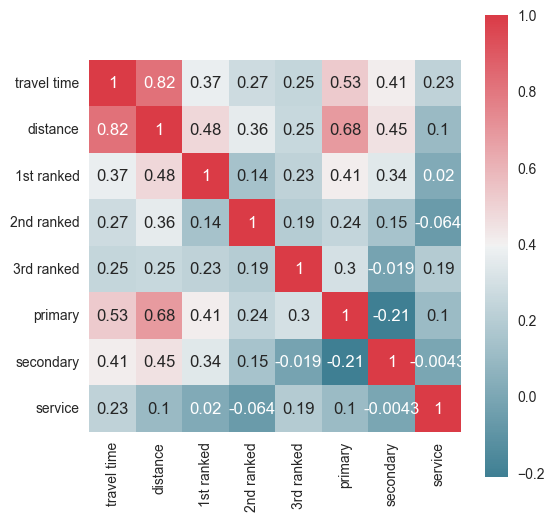

In [492]:
# run correlation matrix and plot
f, ax = plt.subplots(figsize=(6,6))
corr = df_.corr()
sns.heatmap(corr,annot=True, mask=np.zeros_like(corr,dtype=np.bool),
           cmap=sns.diverging_palette(220,10, as_cmap=True),
           square=True, ax=ax)

In [480]:
x = np.array(df_.iloc[:,1:])
y = np.array(df_['travel time'])
x

array([[17838.624000000003, 902.5142857142857, 827.7419047619047, ...,
        16851.678000000004, 0.0, 0.0],
       [17485.724000000002, 902.5142857142857, 827.7419047619047, ...,
        16513.708, 0.0, 0.0],
       [9837.591, 902.5142857142857, 641.031746031746, ...,
        8089.946999999999, 0.0, 403.924],
       ...,
       [12709.79, 902.5142857142857, 764.8239683933275, ...,
        9552.713000000002, 0.0, 0.0],
       [22283.246, 902.5142857142857, 1070.1202090592335, ..., 20475.622,
        1321.118, 0.0],
       [6337.1, 902.5142857142857, 827.7419047619047, ..., 4012.289, 0.0,
        0.0]], dtype=object)

In [481]:
#split data into test & train
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [482]:
print(X_train.shape)
print(X_test.shape)
# X_train

(6625, 7)
(1657, 7)


In [483]:
# inputs: distance + roadtypes distance
model8_1_3 = nnmodel_(50, num_hlayers=1,Epoch=500)
model8_1_3

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 222601.0781 - mape: 41.7990 - rmse: 471.8062 - val_loss: 56719.6562 - val_mape: 25.3432 - val_rmse: 238.1589
Epoch 2/500
208/208 [==============================] - 0s 837us/step - loss: 64689.5898 - mape: 24.8993 - rmse: 254.3415 - val_loss: 69641.0156 - val_mape: 31.6868 - val_rmse: 263.8958
Epoch 3/500
208/208 [==============================] - 0s 813us/step - loss: 62286.4609 - mape: 24.6766 - rmse: 249.5726 - val_loss: 51274.3945 - val_mape: 22.7952 - val_rmse: 226.4385
Epoch 4/500
208/208 [==============================] - 0s 816us/step - loss: 62033.1133 - mape: 24.2154 - rmse: 249.0645 - val_loss: 52612.1172 - val_mape: 24.7727 - val_rmse: 229.3733
Epoch 5/500
208/208 [==============================] - 0s 804us/step - loss: 59900.7461 - mape: 24.0812 - rmse: 244.7463 - val_loss: 54163.0156 - val_mape: 25.4132 - val_rmse: 232.7295
Epoch 6/500
208/208 [==============================] - 0s 824us/step - loss:

208/208 [==============================] - 0s 835us/step - loss: 52384.8516 - mape: 22.5837 - rmse: 228.8774 - val_loss: 47950.4258 - val_mape: 23.4358 - val_rmse: 218.9759
Epoch 90/500
208/208 [==============================] - 0s 825us/step - loss: 51906.9883 - mape: 22.8970 - rmse: 227.8311 - val_loss: 47970.7148 - val_mape: 24.7730 - val_rmse: 219.0222
Epoch 91/500
208/208 [==============================] - 0s 786us/step - loss: 52259.7500 - mape: 22.9307 - rmse: 228.6039 - val_loss: 46429.3828 - val_mape: 23.5347 - val_rmse: 215.4748
Epoch 92/500
208/208 [==============================] - 0s 786us/step - loss: 52630.6641 - mape: 23.0219 - rmse: 229.4137 - val_loss: 50486.3672 - val_mape: 21.3710 - val_rmse: 224.6917
Epoch 93/500
208/208 [==============================] - 0s 794us/step - loss: 53042.3008 - mape: 22.8176 - rmse: 230.3091 - val_loss: 45045.8789 - val_mape: 21.4341 - val_rmse: 212.2401
Epoch 94/500
208/208 [==============================] - 0s 791us/step - loss: 52181

Epoch 133/500
208/208 [==============================] - 0s 815us/step - loss: 51219.1328 - mape: 22.7039 - rmse: 226.3164 - val_loss: 45434.9922 - val_mape: 20.7608 - val_rmse: 213.1549
Epoch 134/500
208/208 [==============================] - 0s 792us/step - loss: 50941.1250 - mape: 22.2855 - rmse: 225.7014 - val_loss: 51567.0586 - val_mape: 24.7912 - val_rmse: 227.0838
Epoch 135/500
208/208 [==============================] - 0s 798us/step - loss: 51546.8711 - mape: 22.6261 - rmse: 227.0394 - val_loss: 45434.8203 - val_mape: 21.5929 - val_rmse: 213.1544
Epoch 136/500
208/208 [==============================] - 0s 809us/step - loss: 50611.4219 - mape: 22.4890 - rmse: 224.9698 - val_loss: 45284.6914 - val_mape: 20.9409 - val_rmse: 212.8020
Epoch 137/500
208/208 [==============================] - 0s 797us/step - loss: 51039.6914 - mape: 22.4322 - rmse: 225.9197 - val_loss: 45066.9531 - val_mape: 21.6870 - val_rmse: 212.2898
Epoch 138/500
208/208 [==============================] - 0s 794us

Epoch 177/500
208/208 [==============================] - 0s 792us/step - loss: 50694.3984 - mape: 22.2804 - rmse: 225.1542 - val_loss: 45614.6289 - val_mape: 23.0915 - val_rmse: 213.5758
Epoch 178/500
208/208 [==============================] - 0s 784us/step - loss: 50427.6641 - mape: 22.7255 - rmse: 224.5611 - val_loss: 46813.1914 - val_mape: 22.7593 - val_rmse: 216.3636
Epoch 179/500
208/208 [==============================] - 0s 792us/step - loss: 50335.3203 - mape: 22.3380 - rmse: 224.3553 - val_loss: 44747.6367 - val_mape: 21.0267 - val_rmse: 211.5364
Epoch 180/500
208/208 [==============================] - 0s 791us/step - loss: 50073.5938 - mape: 22.2913 - rmse: 223.7713 - val_loss: 46144.4297 - val_mape: 21.0129 - val_rmse: 214.8125
Epoch 181/500
208/208 [==============================] - 0s 787us/step - loss: 52422.9453 - mape: 22.7373 - rmse: 228.9606 - val_loss: 49303.6250 - val_mape: 25.2707 - val_rmse: 222.0442
Epoch 182/500
208/208 [==============================] - 0s 800us

Epoch 221/500
208/208 [==============================] - 0s 796us/step - loss: 49565.3320 - mape: 22.2148 - rmse: 222.6327 - val_loss: 49125.3320 - val_mape: 25.2732 - val_rmse: 221.6423
Epoch 222/500
208/208 [==============================] - 0s 793us/step - loss: 50732.6016 - mape: 22.9256 - rmse: 225.2390 - val_loss: 45205.4258 - val_mape: 22.3539 - val_rmse: 212.6157
Epoch 223/500
208/208 [==============================] - 0s 784us/step - loss: 50092.4219 - mape: 22.5147 - rmse: 223.8134 - val_loss: 44537.6953 - val_mape: 20.7963 - val_rmse: 211.0396
Epoch 224/500
208/208 [==============================] - 0s 792us/step - loss: 50758.9844 - mape: 22.6047 - rmse: 225.2975 - val_loss: 46002.8906 - val_mape: 22.7847 - val_rmse: 214.4828
Epoch 225/500
208/208 [==============================] - 0s 798us/step - loss: 52160.8906 - mape: 22.9053 - rmse: 228.3876 - val_loss: 45238.6836 - val_mape: 20.9838 - val_rmse: 212.6939
Epoch 226/500
208/208 [==============================] - 0s 789us

Epoch 265/500
208/208 [==============================] - 0s 807us/step - loss: 49178.8477 - mape: 22.1873 - rmse: 221.7630 - val_loss: 45001.7656 - val_mape: 22.1625 - val_rmse: 212.1362
Epoch 266/500
208/208 [==============================] - 0s 806us/step - loss: 50508.5039 - mape: 22.5844 - rmse: 224.7410 - val_loss: 46641.0977 - val_mape: 23.3661 - val_rmse: 215.9655
Epoch 267/500
208/208 [==============================] - 0s 803us/step - loss: 49338.9531 - mape: 22.4974 - rmse: 222.1237 - val_loss: 45482.4922 - val_mape: 22.6983 - val_rmse: 213.2663
Epoch 268/500
208/208 [==============================] - 0s 802us/step - loss: 49227.5039 - mape: 22.2855 - rmse: 221.8727 - val_loss: 45324.5547 - val_mape: 21.9657 - val_rmse: 212.8956
Epoch 269/500
208/208 [==============================] - 0s 803us/step - loss: 49402.1172 - mape: 22.2949 - rmse: 222.2659 - val_loss: 45499.4414 - val_mape: 22.0598 - val_rmse: 213.3060
Epoch 270/500
208/208 [==============================] - 0s 809us

Epoch 309/500
208/208 [==============================] - 0s 812us/step - loss: 49500.1641 - mape: 22.5522 - rmse: 222.4863 - val_loss: 45467.0234 - val_mape: 20.5030 - val_rmse: 213.2300
Epoch 310/500
208/208 [==============================] - 0s 796us/step - loss: 49246.2188 - mape: 22.2045 - rmse: 221.9149 - val_loss: 45837.8477 - val_mape: 22.1592 - val_rmse: 214.0977
Epoch 311/500
208/208 [==============================] - 0s 871us/step - loss: 49190.3906 - mape: 22.2775 - rmse: 221.7891 - val_loss: 45550.3359 - val_mape: 22.6785 - val_rmse: 213.4252
Epoch 312/500
208/208 [==============================] - 0s 828us/step - loss: 49107.4023 - mape: 22.1561 - rmse: 221.6019 - val_loss: 46997.2539 - val_mape: 21.6577 - val_rmse: 216.7885
Epoch 313/500
208/208 [==============================] - 0s 819us/step - loss: 49238.2383 - mape: 22.3450 - rmse: 221.8969 - val_loss: 46369.9648 - val_mape: 22.6931 - val_rmse: 215.3369
Epoch 314/500
208/208 [==============================] - 0s 813us

Epoch 353/500
208/208 [==============================] - 0s 789us/step - loss: 48929.3516 - mape: 22.2024 - rmse: 221.1998 - val_loss: 46565.5586 - val_mape: 22.7926 - val_rmse: 215.7905
Epoch 354/500
208/208 [==============================] - 0s 791us/step - loss: 49218.7305 - mape: 22.3259 - rmse: 221.8530 - val_loss: 47318.0625 - val_mape: 24.0942 - val_rmse: 217.5272
Epoch 355/500
208/208 [==============================] - 0s 794us/step - loss: 48847.0312 - mape: 22.1893 - rmse: 221.0136 - val_loss: 45805.3789 - val_mape: 21.2420 - val_rmse: 214.0219
Epoch 356/500
208/208 [==============================] - 0s 806us/step - loss: 48960.0664 - mape: 22.4637 - rmse: 221.2692 - val_loss: 44964.2188 - val_mape: 21.0727 - val_rmse: 212.0477
Epoch 357/500
208/208 [==============================] - 0s 788us/step - loss: 48973.2383 - mape: 22.2380 - rmse: 221.2990 - val_loss: 45362.3594 - val_mape: 21.2882 - val_rmse: 212.9844
Epoch 358/500
208/208 [==============================] - 0s 783us

Epoch 397/500
208/208 [==============================] - 0s 806us/step - loss: 48545.6484 - mape: 22.2292 - rmse: 220.3308 - val_loss: 45420.0117 - val_mape: 22.3357 - val_rmse: 213.1197
Epoch 398/500
208/208 [==============================] - 0s 805us/step - loss: 48491.6328 - mape: 22.1278 - rmse: 220.2082 - val_loss: 53074.4883 - val_mape: 25.8075 - val_rmse: 230.3790
Epoch 399/500
208/208 [==============================] - 0s 803us/step - loss: 50637.6562 - mape: 22.6197 - rmse: 225.0281 - val_loss: 45615.6055 - val_mape: 23.0715 - val_rmse: 213.5781
Epoch 400/500
208/208 [==============================] - 0s 785us/step - loss: 48536.1797 - mape: 22.1176 - rmse: 220.3093 - val_loss: 44747.8008 - val_mape: 20.8219 - val_rmse: 211.5368
Epoch 401/500
208/208 [==============================] - 0s 801us/step - loss: 48720.6367 - mape: 22.2650 - rmse: 220.7275 - val_loss: 45064.3203 - val_mape: 21.0135 - val_rmse: 212.2836
Epoch 402/500
208/208 [==============================] - 0s 792us

Epoch 441/500
208/208 [==============================] - 0s 783us/step - loss: 48273.5586 - mape: 22.0873 - rmse: 219.7124 - val_loss: 44989.0898 - val_mape: 22.3484 - val_rmse: 212.1063
Epoch 442/500
208/208 [==============================] - 0s 791us/step - loss: 48983.5469 - mape: 22.4729 - rmse: 221.3223 - val_loss: 45132.9922 - val_mape: 21.0785 - val_rmse: 212.4453
Epoch 443/500
208/208 [==============================] - 0s 836us/step - loss: 48434.6367 - mape: 22.0523 - rmse: 220.0787 - val_loss: 45601.8359 - val_mape: 23.2475 - val_rmse: 213.5459
Epoch 444/500
208/208 [==============================] - 0s 876us/step - loss: 48462.5430 - mape: 22.3151 - rmse: 220.1421 - val_loss: 46204.0312 - val_mape: 22.6531 - val_rmse: 214.9512
Epoch 445/500
208/208 [==============================] - 0s 801us/step - loss: 48574.8359 - mape: 22.3479 - rmse: 220.3970 - val_loss: 45465.4531 - val_mape: 21.1951 - val_rmse: 213.2263
Epoch 446/500
208/208 [==============================] - 0s 865us

Epoch 485/500
208/208 [==============================] - 0s 832us/step - loss: 50083.3555 - mape: 22.5137 - rmse: 223.7931 - val_loss: 46844.6250 - val_mape: 23.1640 - val_rmse: 216.4362
Epoch 486/500
208/208 [==============================] - 0s 894us/step - loss: 47987.8828 - mape: 22.3550 - rmse: 219.0614 - val_loss: 45246.8086 - val_mape: 20.8426 - val_rmse: 212.7130
Epoch 487/500
208/208 [==============================] - 0s 850us/step - loss: 48329.7891 - mape: 22.2824 - rmse: 219.8404 - val_loss: 44997.2031 - val_mape: 21.0589 - val_rmse: 212.1254
Epoch 488/500
208/208 [==============================] - 0s 836us/step - loss: 48430.1445 - mape: 22.2288 - rmse: 220.0685 - val_loss: 44706.0078 - val_mape: 21.0191 - val_rmse: 211.4380
Epoch 489/500
208/208 [==============================] - 0s 813us/step - loss: 49175.7500 - mape: 22.3267 - rmse: 221.7561 - val_loss: 45180.0586 - val_mape: 21.3633 - val_rmse: 212.5560
Epoch 490/500
208/208 [==============================] - 0s 795us

In [485]:
# inputs: distance + roadtypes distance
model8_1_5 = nnmodel_(100, num_hlayers=1,Epoch=500)
model8_1_5

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 761428.8750 - mape: 56.4236 - rmse: 872.5989 - val_loss: 56314.1484 - val_mape: 25.2119 - val_rmse: 237.3060
Epoch 2/500
208/208 [==============================] - 0s 813us/step - loss: 62487.7109 - mape: 25.3552 - rmse: 249.9754 - val_loss: 51151.0508 - val_mape: 22.4936 - val_rmse: 226.1660
Epoch 3/500
208/208 [==============================] - 0s 835us/step - loss: 61087.0859 - mape: 24.3513 - rmse: 247.1580 - val_loss: 50739.2656 - val_mape: 22.3556 - val_rmse: 225.2538
Epoch 4/500
208/208 [==============================] - 0s 857us/step - loss: 59427.5898 - mape: 23.8369 - rmse: 243.7777 - val_loss: 49751.4727 - val_mape: 23.7978 - val_rmse: 223.0504
Epoch 5/500
208/208 [==============================] - 0s 827us/step - loss: 59685.0703 - mape: 23.9872 - rmse: 244.3053 - val_loss: 48985.1016 - val_mape: 23.1098 - val_rmse: 221.3258
Epoch 6/500
208/208 [==============================] - 0s 814us/step - loss:

208/208 [==============================] - 0s 798us/step - loss: 51882.4414 - mape: 22.8155 - rmse: 227.7772 - val_loss: 46466.7461 - val_mape: 23.9111 - val_rmse: 215.5615
Epoch 90/500
208/208 [==============================] - 0s 841us/step - loss: 52606.8320 - mape: 22.7420 - rmse: 229.3618 - val_loss: 48285.2109 - val_mape: 21.7489 - val_rmse: 219.7390
Epoch 91/500
208/208 [==============================] - 0s 1ms/step - loss: 52446.3828 - mape: 22.9992 - rmse: 229.0117 - val_loss: 50448.1875 - val_mape: 24.2939 - val_rmse: 224.6067
Epoch 92/500
208/208 [==============================] - 0s 989us/step - loss: 52576.0195 - mape: 23.0926 - rmse: 229.2946 - val_loss: 46693.2969 - val_mape: 21.4489 - val_rmse: 216.0863
Epoch 93/500
208/208 [==============================] - 0s 899us/step - loss: 51913.4141 - mape: 22.8134 - rmse: 227.8452 - val_loss: 45894.8672 - val_mape: 21.8640 - val_rmse: 214.2309
Epoch 94/500
208/208 [==============================] - 0s 884us/step - loss: 51755.7

Epoch 133/500
208/208 [==============================] - 0s 795us/step - loss: 51862.6250 - mape: 22.8583 - rmse: 227.7337 - val_loss: 49352.9648 - val_mape: 21.4900 - val_rmse: 222.1553
Epoch 134/500
208/208 [==============================] - 0s 797us/step - loss: 50446.4141 - mape: 22.3495 - rmse: 224.6028 - val_loss: 45889.4688 - val_mape: 22.1567 - val_rmse: 214.2183
Epoch 135/500
208/208 [==============================] - 0s 791us/step - loss: 50591.0859 - mape: 22.5306 - rmse: 224.9246 - val_loss: 45662.9805 - val_mape: 23.0015 - val_rmse: 213.6890
Epoch 136/500
208/208 [==============================] - 0s 789us/step - loss: 50709.6641 - mape: 22.5826 - rmse: 225.1881 - val_loss: 48381.3867 - val_mape: 23.8172 - val_rmse: 219.9577
Epoch 137/500
208/208 [==============================] - 0s 791us/step - loss: 50771.0938 - mape: 22.5776 - rmse: 225.3244 - val_loss: 45942.5820 - val_mape: 22.3248 - val_rmse: 214.3422
Epoch 138/500
208/208 [==============================] - 0s 786us

Epoch 177/500
208/208 [==============================] - 0s 1ms/step - loss: 50122.4609 - mape: 22.5331 - rmse: 223.8805 - val_loss: 45739.2578 - val_mape: 21.6755 - val_rmse: 213.8674
Epoch 178/500
208/208 [==============================] - 0s 970us/step - loss: 49168.2578 - mape: 22.4361 - rmse: 221.7392 - val_loss: 46809.3633 - val_mape: 22.6539 - val_rmse: 216.3547
Epoch 179/500
208/208 [==============================] - 0s 968us/step - loss: 49119.0547 - mape: 22.2528 - rmse: 221.6282 - val_loss: 45825.1992 - val_mape: 22.4550 - val_rmse: 214.0682
Epoch 180/500
208/208 [==============================] - 0s 957us/step - loss: 49871.7188 - mape: 22.4131 - rmse: 223.3198 - val_loss: 45257.3047 - val_mape: 22.0335 - val_rmse: 212.7376
Epoch 181/500
208/208 [==============================] - 0s 941us/step - loss: 49849.5703 - mape: 22.6229 - rmse: 223.2702 - val_loss: 44972.9375 - val_mape: 21.1844 - val_rmse: 212.0682
Epoch 182/500
208/208 [==============================] - 0s 964us/s

Epoch 221/500
208/208 [==============================] - 0s 995us/step - loss: 49298.5352 - mape: 22.4189 - rmse: 222.0327 - val_loss: 45002.4141 - val_mape: 21.8795 - val_rmse: 212.1377
Epoch 222/500
208/208 [==============================] - 0s 997us/step - loss: 48919.2148 - mape: 22.3402 - rmse: 221.1769 - val_loss: 45045.2227 - val_mape: 20.6561 - val_rmse: 212.2386
Epoch 223/500
208/208 [==============================] - 0s 1ms/step - loss: 48578.5898 - mape: 22.2410 - rmse: 220.4055 - val_loss: 47397.3438 - val_mape: 20.2939 - val_rmse: 217.7093
Epoch 224/500
208/208 [==============================] - 0s 989us/step - loss: 48834.4844 - mape: 22.2419 - rmse: 220.9853 - val_loss: 44622.7109 - val_mape: 22.5858 - val_rmse: 211.2409
Epoch 225/500
208/208 [==============================] - 0s 989us/step - loss: 48534.8242 - mape: 22.2416 - rmse: 220.3062 - val_loss: 44516.6406 - val_mape: 22.5133 - val_rmse: 210.9897
Epoch 226/500
208/208 [==============================] - 0s 1ms/ste

Epoch 265/500
208/208 [==============================] - 0s 1ms/step - loss: 48681.5508 - mape: 22.2019 - rmse: 220.6390 - val_loss: 46317.6328 - val_mape: 22.9092 - val_rmse: 215.2153
Epoch 266/500
208/208 [==============================] - 0s 974us/step - loss: 49155.4883 - mape: 22.2567 - rmse: 221.7104 - val_loss: 45572.7539 - val_mape: 22.6742 - val_rmse: 213.4778
Epoch 267/500
208/208 [==============================] - 0s 997us/step - loss: 49146.3633 - mape: 22.5258 - rmse: 221.6898 - val_loss: 44954.4727 - val_mape: 20.2295 - val_rmse: 212.0247
Epoch 268/500
208/208 [==============================] - 0s 1ms/step - loss: 48058.2773 - mape: 22.0124 - rmse: 219.2220 - val_loss: 51384.6719 - val_mape: 27.8374 - val_rmse: 226.6819
Epoch 269/500
208/208 [==============================] - 0s 1000us/step - loss: 48441.8984 - mape: 22.4623 - rmse: 220.0952 - val_loss: 44620.3203 - val_mape: 21.9001 - val_rmse: 211.2352
Epoch 270/500
208/208 [==============================] - 0s 981us/st

Epoch 309/500
208/208 [==============================] - 0s 787us/step - loss: 48086.6328 - mape: 22.1933 - rmse: 219.2867 - val_loss: 44927.1758 - val_mape: 22.6085 - val_rmse: 211.9603
Epoch 310/500
208/208 [==============================] - 0s 782us/step - loss: 47599.2812 - mape: 22.1452 - rmse: 218.1726 - val_loss: 43810.3164 - val_mape: 20.8719 - val_rmse: 209.3091
Epoch 311/500
208/208 [==============================] - 0s 791us/step - loss: 47822.0938 - mape: 22.1027 - rmse: 218.6826 - val_loss: 44361.7812 - val_mape: 22.0252 - val_rmse: 210.6224
Epoch 312/500
208/208 [==============================] - 0s 777us/step - loss: 48440.6133 - mape: 22.1389 - rmse: 220.0923 - val_loss: 44404.1328 - val_mape: 20.9566 - val_rmse: 210.7229
Epoch 313/500
208/208 [==============================] - 0s 781us/step - loss: 49126.7578 - mape: 22.3973 - rmse: 221.6456 - val_loss: 44366.9609 - val_mape: 21.8179 - val_rmse: 210.6347
Epoch 314/500
208/208 [==============================] - 0s 786us

Epoch 353/500
208/208 [==============================] - 0s 788us/step - loss: 47961.6914 - mape: 22.0712 - rmse: 219.0016 - val_loss: 44076.5430 - val_mape: 21.8887 - val_rmse: 209.9441
Epoch 354/500
208/208 [==============================] - 0s 799us/step - loss: 47567.9961 - mape: 22.0961 - rmse: 218.1009 - val_loss: 44132.2422 - val_mape: 21.1595 - val_rmse: 210.0768
Epoch 355/500
208/208 [==============================] - 0s 791us/step - loss: 47589.9219 - mape: 22.0581 - rmse: 218.1511 - val_loss: 45816.3516 - val_mape: 24.2221 - val_rmse: 214.0475
Epoch 356/500
208/208 [==============================] - 0s 786us/step - loss: 48818.9844 - mape: 23.1908 - rmse: 220.9502 - val_loss: 44797.9141 - val_mape: 21.9735 - val_rmse: 211.6552
Epoch 357/500
208/208 [==============================] - 0s 791us/step - loss: 48025.6484 - mape: 22.2409 - rmse: 219.1476 - val_loss: 46312.9805 - val_mape: 22.8827 - val_rmse: 215.2045
Epoch 358/500
208/208 [==============================] - 0s 797us

Epoch 397/500
208/208 [==============================] - 0s 795us/step - loss: 47764.3750 - mape: 22.1285 - rmse: 218.5506 - val_loss: 45082.4727 - val_mape: 21.6221 - val_rmse: 212.3263
Epoch 398/500
208/208 [==============================] - 0s 780us/step - loss: 47519.5508 - mape: 22.1491 - rmse: 217.9898 - val_loss: 44290.1445 - val_mape: 21.4004 - val_rmse: 210.4522
Epoch 399/500
208/208 [==============================] - 0s 786us/step - loss: 48025.1016 - mape: 22.1378 - rmse: 219.1463 - val_loss: 44452.9141 - val_mape: 21.5704 - val_rmse: 210.8386
Epoch 400/500
208/208 [==============================] - 0s 782us/step - loss: 48084.2617 - mape: 22.1448 - rmse: 219.2812 - val_loss: 47353.2344 - val_mape: 25.7696 - val_rmse: 217.6080
Epoch 401/500
208/208 [==============================] - 0s 794us/step - loss: 47894.0820 - mape: 22.2306 - rmse: 218.8472 - val_loss: 44026.5156 - val_mape: 20.6904 - val_rmse: 209.8250
Epoch 402/500
208/208 [==============================] - 0s 785us

Epoch 441/500
208/208 [==============================] - 0s 786us/step - loss: 47221.1953 - mape: 21.9480 - rmse: 217.3044 - val_loss: 44818.2578 - val_mape: 22.6380 - val_rmse: 211.7032
Epoch 442/500
208/208 [==============================] - 0s 844us/step - loss: 47727.7188 - mape: 22.1933 - rmse: 218.4668 - val_loss: 44670.2617 - val_mape: 20.8273 - val_rmse: 211.3534
Epoch 443/500
208/208 [==============================] - 0s 782us/step - loss: 47169.8164 - mape: 22.0281 - rmse: 217.1861 - val_loss: 43514.9219 - val_mape: 21.6967 - val_rmse: 208.6023
Epoch 444/500
208/208 [==============================] - 0s 775us/step - loss: 47136.1797 - mape: 22.0744 - rmse: 217.1087 - val_loss: 44456.0977 - val_mape: 20.1649 - val_rmse: 210.8461
Epoch 445/500
208/208 [==============================] - 0s 780us/step - loss: 47418.2383 - mape: 22.0527 - rmse: 217.7573 - val_loss: 44505.8555 - val_mape: 21.9429 - val_rmse: 210.9641
Epoch 446/500
208/208 [==============================] - 0s 785us

Epoch 485/500
208/208 [==============================] - 0s 783us/step - loss: 47415.6133 - mape: 21.9450 - rmse: 217.7513 - val_loss: 46964.8477 - val_mape: 24.0015 - val_rmse: 216.7137
Epoch 486/500
208/208 [==============================] - 0s 774us/step - loss: 46826.0664 - mape: 22.1464 - rmse: 216.3933 - val_loss: 44902.6367 - val_mape: 20.5599 - val_rmse: 211.9024
Epoch 487/500
208/208 [==============================] - 0s 784us/step - loss: 47076.3047 - mape: 21.8366 - rmse: 216.9707 - val_loss: 44319.4141 - val_mape: 23.3982 - val_rmse: 210.5218
Epoch 488/500
208/208 [==============================] - 0s 787us/step - loss: 47608.5430 - mape: 22.1557 - rmse: 218.1938 - val_loss: 46095.9961 - val_mape: 24.2826 - val_rmse: 214.6998
Epoch 489/500
208/208 [==============================] - 0s 790us/step - loss: 47095.4492 - mape: 21.9595 - rmse: 217.0149 - val_loss: 45609.0625 - val_mape: 23.0595 - val_rmse: 213.5628
Epoch 490/500
208/208 [==============================] - 0s 790us

In [486]:
# inputs: distance + roadtypes distance
model8_1_1 = nnmodel_(100,50, num_hlayers=2,Epoch=500)
model8_1_1

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 103167.8281 - mape: 27.7543 - rmse: 321.1975 - val_loss: 71514.6250 - val_mape: 22.5238 - val_rmse: 267.4222
Epoch 2/500
208/208 [==============================] - 0s 841us/step - loss: 74730.0000 - mape: 25.9711 - rmse: 273.3679 - val_loss: 50536.7734 - val_mape: 21.3816 - val_rmse: 224.8038
Epoch 3/500
208/208 [==============================] - 0s 855us/step - loss: 67028.1719 - mape: 24.8730 - rmse: 258.8980 - val_loss: 49657.4375 - val_mape: 21.3608 - val_rmse: 222.8395
Epoch 4/500
208/208 [==============================] - 0s 853us/step - loss: 70308.9297 - mape: 25.1729 - rmse: 265.1583 - val_loss: 48203.0117 - val_mape: 22.9063 - val_rmse: 219.5518
Epoch 5/500
208/208 [==============================] - 0s 858us/step - loss: 62309.6797 - mape: 24.0458 - rmse: 249.6191 - val_loss: 50817.0391 - val_mape: 24.8195 - val_rmse: 225.4263
Epoch 6/500
208/208 [==============================] - 0s 924us/step - loss:

208/208 [==============================] - 0s 840us/step - loss: 48895.5781 - mape: 22.1011 - rmse: 221.1234 - val_loss: 43815.0312 - val_mape: 20.6399 - val_rmse: 209.3204
Epoch 90/500
208/208 [==============================] - 0s 837us/step - loss: 49015.1211 - mape: 22.1122 - rmse: 221.3936 - val_loss: 43807.7500 - val_mape: 22.7055 - val_rmse: 209.3030
Epoch 91/500
208/208 [==============================] - 0s 834us/step - loss: 48167.7734 - mape: 22.0246 - rmse: 219.4716 - val_loss: 44310.8164 - val_mape: 21.4052 - val_rmse: 210.5013
Epoch 92/500
208/208 [==============================] - 0s 886us/step - loss: 49151.0586 - mape: 21.7811 - rmse: 221.7004 - val_loss: 44418.2891 - val_mape: 20.8898 - val_rmse: 210.7565
Epoch 93/500
208/208 [==============================] - 0s 841us/step - loss: 48703.0820 - mape: 22.0733 - rmse: 220.6877 - val_loss: 43541.5820 - val_mape: 20.7211 - val_rmse: 208.6662
Epoch 94/500
208/208 [==============================] - 0s 842us/step - loss: 48552

Epoch 133/500
208/208 [==============================] - 0s 822us/step - loss: 47860.6797 - mape: 21.8166 - rmse: 218.7708 - val_loss: 44430.8164 - val_mape: 23.7467 - val_rmse: 210.7862
Epoch 134/500
208/208 [==============================] - 0s 831us/step - loss: 48533.4375 - mape: 22.1072 - rmse: 220.3031 - val_loss: 48091.5859 - val_mape: 25.7121 - val_rmse: 219.2979
Epoch 135/500
208/208 [==============================] - 0s 826us/step - loss: 46886.4375 - mape: 22.0308 - rmse: 216.5328 - val_loss: 45942.1328 - val_mape: 20.7863 - val_rmse: 214.3412
Epoch 136/500
208/208 [==============================] - 0s 834us/step - loss: 47459.2305 - mape: 21.7942 - rmse: 217.8514 - val_loss: 44428.4453 - val_mape: 22.0614 - val_rmse: 210.7806
Epoch 137/500
208/208 [==============================] - 0s 837us/step - loss: 48975.0703 - mape: 22.2688 - rmse: 221.3031 - val_loss: 43056.9492 - val_mape: 21.1741 - val_rmse: 207.5017
Epoch 138/500
208/208 [==============================] - 0s 846us

Epoch 177/500
208/208 [==============================] - 0s 817us/step - loss: 46734.1172 - mape: 21.7836 - rmse: 216.1808 - val_loss: 43378.2344 - val_mape: 23.0931 - val_rmse: 208.2744
Epoch 178/500
208/208 [==============================] - 0s 829us/step - loss: 50646.8594 - mape: 22.8848 - rmse: 225.0486 - val_loss: 45047.2422 - val_mape: 24.2647 - val_rmse: 212.2434
Epoch 179/500
208/208 [==============================] - 0s 833us/step - loss: 47071.1172 - mape: 22.0623 - rmse: 216.9588 - val_loss: 45277.9336 - val_mape: 22.1857 - val_rmse: 212.7861
Epoch 180/500
208/208 [==============================] - 0s 825us/step - loss: 47091.0586 - mape: 21.8581 - rmse: 217.0047 - val_loss: 43552.2891 - val_mape: 20.8497 - val_rmse: 208.6918
Epoch 181/500
208/208 [==============================] - 0s 826us/step - loss: 46631.6836 - mape: 21.9175 - rmse: 215.9437 - val_loss: 43144.5469 - val_mape: 20.9730 - val_rmse: 207.7127
Epoch 182/500
208/208 [==============================] - 0s 834us

Epoch 221/500
208/208 [==============================] - 0s 825us/step - loss: 45013.8086 - mape: 21.4669 - rmse: 212.1646 - val_loss: 43411.9219 - val_mape: 22.0579 - val_rmse: 208.3553
Epoch 222/500
208/208 [==============================] - 0s 836us/step - loss: 45472.9414 - mape: 21.7953 - rmse: 213.2439 - val_loss: 44299.5117 - val_mape: 20.3612 - val_rmse: 210.4745
Epoch 223/500
208/208 [==============================] - 0s 833us/step - loss: 45046.9766 - mape: 21.4665 - rmse: 212.2427 - val_loss: 44106.5234 - val_mape: 21.7252 - val_rmse: 210.0155
Epoch 224/500
208/208 [==============================] - 0s 836us/step - loss: 45916.2891 - mape: 21.6438 - rmse: 214.2809 - val_loss: 43285.3672 - val_mape: 22.6096 - val_rmse: 208.0514
Epoch 225/500
208/208 [==============================] - 0s 836us/step - loss: 44987.6758 - mape: 21.6677 - rmse: 212.1030 - val_loss: 43330.4766 - val_mape: 21.7855 - val_rmse: 208.1597
Epoch 226/500
208/208 [==============================] - 0s 848us

Epoch 265/500
208/208 [==============================] - 0s 830us/step - loss: 44538.5430 - mape: 21.5579 - rmse: 211.0416 - val_loss: 43544.8633 - val_mape: 21.8494 - val_rmse: 208.6741
Epoch 266/500
208/208 [==============================] - 0s 834us/step - loss: 44537.4727 - mape: 21.4773 - rmse: 211.0390 - val_loss: 44591.5352 - val_mape: 20.3120 - val_rmse: 211.1671
Epoch 267/500
208/208 [==============================] - 0s 834us/step - loss: 44381.6719 - mape: 21.2302 - rmse: 210.6696 - val_loss: 43998.2188 - val_mape: 21.2824 - val_rmse: 209.7575
Epoch 268/500
208/208 [==============================] - 0s 838us/step - loss: 43965.2031 - mape: 21.4000 - rmse: 209.6788 - val_loss: 43778.6641 - val_mape: 22.2431 - val_rmse: 209.2335
Epoch 269/500
208/208 [==============================] - 0s 839us/step - loss: 43872.4688 - mape: 21.3435 - rmse: 209.4576 - val_loss: 42665.2539 - val_mape: 21.3939 - val_rmse: 206.5557
Epoch 270/500
208/208 [==============================] - 0s 825us

Epoch 309/500
208/208 [==============================] - 0s 825us/step - loss: 43559.9570 - mape: 21.3309 - rmse: 208.7102 - val_loss: 44143.6055 - val_mape: 21.8867 - val_rmse: 210.1038
Epoch 310/500
208/208 [==============================] - 0s 821us/step - loss: 44625.9297 - mape: 21.6340 - rmse: 211.2485 - val_loss: 48067.7266 - val_mape: 24.2409 - val_rmse: 219.2435
Epoch 311/500
208/208 [==============================] - 0s 833us/step - loss: 45830.0117 - mape: 21.8099 - rmse: 214.0795 - val_loss: 45694.1836 - val_mape: 23.6312 - val_rmse: 213.7620
Epoch 312/500
208/208 [==============================] - 0s 831us/step - loss: 44690.2812 - mape: 21.5354 - rmse: 211.4008 - val_loss: 46687.7109 - val_mape: 22.8792 - val_rmse: 216.0734
Epoch 313/500
208/208 [==============================] - 0s 833us/step - loss: 43875.0430 - mape: 21.3015 - rmse: 209.4637 - val_loss: 44366.4531 - val_mape: 21.7617 - val_rmse: 210.6335
Epoch 314/500
208/208 [==============================] - 0s 838us

Epoch 353/500
208/208 [==============================] - 0s 830us/step - loss: 42233.1797 - mape: 21.0606 - rmse: 205.5071 - val_loss: 44969.3945 - val_mape: 20.9284 - val_rmse: 212.0599
Epoch 354/500
208/208 [==============================] - 0s 833us/step - loss: 44248.1367 - mape: 21.2405 - rmse: 210.3524 - val_loss: 45359.0000 - val_mape: 21.7920 - val_rmse: 212.9765
Epoch 355/500
208/208 [==============================] - 0s 895us/step - loss: 43907.1094 - mape: 21.3254 - rmse: 209.5402 - val_loss: 44637.8477 - val_mape: 22.8237 - val_rmse: 211.2767
Epoch 356/500
208/208 [==============================] - 0s 831us/step - loss: 42592.1055 - mape: 21.1816 - rmse: 206.3786 - val_loss: 46824.0195 - val_mape: 23.0170 - val_rmse: 216.3886
Epoch 357/500
208/208 [==============================] - 0s 857us/step - loss: 42243.7227 - mape: 20.9299 - rmse: 205.5328 - val_loss: 46411.0039 - val_mape: 22.9654 - val_rmse: 215.4321
Epoch 358/500
208/208 [==============================] - 0s 839us

Epoch 397/500
208/208 [==============================] - 0s 825us/step - loss: 41781.9258 - mape: 20.9468 - rmse: 204.4063 - val_loss: 45425.4062 - val_mape: 21.1028 - val_rmse: 213.1324
Epoch 398/500
208/208 [==============================] - 0s 832us/step - loss: 41853.2812 - mape: 20.9200 - rmse: 204.5807 - val_loss: 45467.6211 - val_mape: 22.9802 - val_rmse: 213.2314
Epoch 399/500
208/208 [==============================] - 0s 831us/step - loss: 41893.4258 - mape: 21.0230 - rmse: 204.6788 - val_loss: 46169.6016 - val_mape: 21.6787 - val_rmse: 214.8711
Epoch 400/500
208/208 [==============================] - 0s 830us/step - loss: 41810.4648 - mape: 21.0641 - rmse: 204.4761 - val_loss: 47391.9180 - val_mape: 24.4597 - val_rmse: 217.6969
Epoch 401/500
208/208 [==============================] - 0s 835us/step - loss: 42194.5156 - mape: 21.3197 - rmse: 205.4130 - val_loss: 45542.4180 - val_mape: 22.5045 - val_rmse: 213.4067
Epoch 402/500
208/208 [==============================] - 0s 874us

Epoch 441/500
208/208 [==============================] - 0s 825us/step - loss: 41335.8359 - mape: 20.9375 - rmse: 203.3122 - val_loss: 45454.8555 - val_mape: 21.5455 - val_rmse: 213.2014
Epoch 442/500
208/208 [==============================] - 0s 826us/step - loss: 41302.2109 - mape: 20.7834 - rmse: 203.2294 - val_loss: 45191.4141 - val_mape: 22.0840 - val_rmse: 212.5827
Epoch 443/500
208/208 [==============================] - 0s 834us/step - loss: 41404.5898 - mape: 21.1679 - rmse: 203.4812 - val_loss: 46212.8438 - val_mape: 20.3441 - val_rmse: 214.9717
Epoch 444/500
208/208 [==============================] - 0s 842us/step - loss: 41523.0742 - mape: 20.8026 - rmse: 203.7721 - val_loss: 46540.0312 - val_mape: 22.7863 - val_rmse: 215.7314
Epoch 445/500
208/208 [==============================] - 0s 839us/step - loss: 41695.4961 - mape: 21.0696 - rmse: 204.1947 - val_loss: 45554.9180 - val_mape: 20.9902 - val_rmse: 213.4360
Epoch 446/500
208/208 [==============================] - 0s 831us

Epoch 485/500
208/208 [==============================] - 0s 825us/step - loss: 40948.4648 - mape: 20.8717 - rmse: 202.3573 - val_loss: 45786.1094 - val_mape: 21.8977 - val_rmse: 213.9769
Epoch 486/500
208/208 [==============================] - 0s 832us/step - loss: 40923.2656 - mape: 21.0143 - rmse: 202.2950 - val_loss: 44672.7930 - val_mape: 23.1030 - val_rmse: 211.3594
Epoch 487/500
208/208 [==============================] - 0s 840us/step - loss: 41308.0117 - mape: 20.9566 - rmse: 203.2437 - val_loss: 45620.4766 - val_mape: 22.9039 - val_rmse: 213.5895
Epoch 488/500
208/208 [==============================] - 0s 835us/step - loss: 41455.8828 - mape: 20.9024 - rmse: 203.6072 - val_loss: 45592.4492 - val_mape: 22.2806 - val_rmse: 213.5239
Epoch 489/500
208/208 [==============================] - 0s 836us/step - loss: 40943.1484 - mape: 20.9221 - rmse: 202.3441 - val_loss: 46637.7109 - val_mape: 22.2199 - val_rmse: 215.9577
Epoch 490/500
208/208 [==============================] - 0s 827us

In [488]:
# inputs: distance + hour + roadtypes distance
model8_1_2 = nnmodel_(200,100, num_hlayers=2,Epoch=500)
model8_1_2

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 107396.8125 - mape: 28.8679 - rmse: 327.7145 - val_loss: 49870.0234 - val_mape: 21.4695 - val_rmse: 223.3160
Epoch 2/500
208/208 [==============================] - 0s 932us/step - loss: 95757.9219 - mape: 27.6127 - rmse: 309.4478 - val_loss: 53163.8945 - val_mape: 21.9111 - val_rmse: 230.5730
Epoch 3/500
208/208 [==============================] - 0s 922us/step - loss: 76696.1328 - mape: 25.6613 - rmse: 276.9407 - val_loss: 52313.0469 - val_mape: 26.1590 - val_rmse: 228.7205
Epoch 4/500
208/208 [==============================] - 0s 918us/step - loss: 66022.6250 - mape: 24.7073 - rmse: 256.9487 - val_loss: 55986.1680 - val_mape: 23.1472 - val_rmse: 236.6140
Epoch 5/500
208/208 [==============================] - 0s 920us/step - loss: 75672.8438 - mape: 25.4865 - rmse: 275.0870 - val_loss: 97489.7031 - val_mape: 36.0427 - val_rmse: 312.2334
Epoch 6/500
208/208 [==============================] - 0s 905us/step - loss:

208/208 [==============================] - 0s 895us/step - loss: 48626.2422 - mape: 22.0324 - rmse: 220.5136 - val_loss: 44775.9023 - val_mape: 23.3349 - val_rmse: 211.6032
Epoch 90/500
208/208 [==============================] - 0s 895us/step - loss: 47953.7617 - mape: 21.9547 - rmse: 218.9835 - val_loss: 44590.3789 - val_mape: 20.8363 - val_rmse: 211.1643
Epoch 91/500
208/208 [==============================] - 0s 892us/step - loss: 48609.3008 - mape: 22.1436 - rmse: 220.4752 - val_loss: 44627.1719 - val_mape: 21.5181 - val_rmse: 211.2514
Epoch 92/500
208/208 [==============================] - 0s 895us/step - loss: 47793.2695 - mape: 22.0291 - rmse: 218.6167 - val_loss: 43774.6641 - val_mape: 20.9138 - val_rmse: 209.2240
Epoch 93/500
208/208 [==============================] - 0s 906us/step - loss: 48399.5859 - mape: 21.8780 - rmse: 219.9991 - val_loss: 45577.9414 - val_mape: 22.5698 - val_rmse: 213.4899
Epoch 94/500
208/208 [==============================] - 0s 895us/step - loss: 47725

Epoch 133/500
208/208 [==============================] - 0s 903us/step - loss: 45890.0156 - mape: 21.6607 - rmse: 214.2195 - val_loss: 45905.3438 - val_mape: 21.4758 - val_rmse: 214.2553
Epoch 134/500
208/208 [==============================] - 0s 886us/step - loss: 47369.4102 - mape: 21.7016 - rmse: 217.6451 - val_loss: 43911.7578 - val_mape: 21.0255 - val_rmse: 209.5513
Epoch 135/500
208/208 [==============================] - 0s 909us/step - loss: 50426.1797 - mape: 21.8968 - rmse: 224.5577 - val_loss: 43219.9766 - val_mape: 21.0189 - val_rmse: 207.8941
Epoch 136/500
208/208 [==============================] - 0s 896us/step - loss: 46994.7617 - mape: 21.8398 - rmse: 216.7827 - val_loss: 44099.5938 - val_mape: 21.4829 - val_rmse: 209.9990
Epoch 137/500
208/208 [==============================] - 0s 899us/step - loss: 46309.5352 - mape: 21.6874 - rmse: 215.1965 - val_loss: 43967.0625 - val_mape: 21.4168 - val_rmse: 209.6832
Epoch 138/500
208/208 [==============================] - 0s 901us

Epoch 177/500
208/208 [==============================] - 0s 904us/step - loss: 45179.3086 - mape: 21.4044 - rmse: 212.5542 - val_loss: 44260.8750 - val_mape: 20.6602 - val_rmse: 210.3827
Epoch 178/500
208/208 [==============================] - 0s 902us/step - loss: 44229.5547 - mape: 21.2788 - rmse: 210.3082 - val_loss: 45712.3516 - val_mape: 22.7179 - val_rmse: 213.8045
Epoch 179/500
208/208 [==============================] - 0s 916us/step - loss: 44704.0039 - mape: 21.4183 - rmse: 211.4332 - val_loss: 44767.0508 - val_mape: 20.3321 - val_rmse: 211.5823
Epoch 180/500
208/208 [==============================] - 0s 888us/step - loss: 46067.1133 - mape: 21.3801 - rmse: 214.6325 - val_loss: 44996.1523 - val_mape: 22.2640 - val_rmse: 212.1230
Epoch 181/500
208/208 [==============================] - 0s 897us/step - loss: 44583.8203 - mape: 21.1415 - rmse: 211.1488 - val_loss: 44107.2891 - val_mape: 22.2391 - val_rmse: 210.0173
Epoch 182/500
208/208 [==============================] - 0s 896us

Epoch 221/500
208/208 [==============================] - 0s 903us/step - loss: 43149.7969 - mape: 21.0987 - rmse: 207.7253 - val_loss: 45090.9102 - val_mape: 20.0937 - val_rmse: 212.3462
Epoch 222/500
208/208 [==============================] - 0s 904us/step - loss: 43480.5742 - mape: 21.0564 - rmse: 208.5200 - val_loss: 45986.8984 - val_mape: 22.7316 - val_rmse: 214.4456
Epoch 223/500
208/208 [==============================] - 0s 893us/step - loss: 43520.8789 - mape: 21.0424 - rmse: 208.6166 - val_loss: 45665.4727 - val_mape: 22.7413 - val_rmse: 213.6948
Epoch 224/500
208/208 [==============================] - 0s 907us/step - loss: 43344.2617 - mape: 21.1174 - rmse: 208.1928 - val_loss: 45769.6172 - val_mape: 21.5893 - val_rmse: 213.9384
Epoch 225/500
208/208 [==============================] - 0s 902us/step - loss: 42986.7266 - mape: 20.9903 - rmse: 207.3324 - val_loss: 48083.1172 - val_mape: 23.4739 - val_rmse: 219.2786
Epoch 226/500
208/208 [==============================] - 0s 893us

Epoch 265/500
208/208 [==============================] - 0s 901us/step - loss: 42119.0664 - mape: 20.6975 - rmse: 205.2293 - val_loss: 45277.0273 - val_mape: 21.4506 - val_rmse: 212.7840
Epoch 266/500
208/208 [==============================] - 0s 897us/step - loss: 42077.8281 - mape: 20.7714 - rmse: 205.1288 - val_loss: 46560.0859 - val_mape: 21.5077 - val_rmse: 215.7779
Epoch 267/500
208/208 [==============================] - 0s 897us/step - loss: 41998.6953 - mape: 20.8307 - rmse: 204.9358 - val_loss: 45988.8438 - val_mape: 21.7541 - val_rmse: 214.4501
Epoch 268/500
208/208 [==============================] - 0s 897us/step - loss: 42318.7852 - mape: 20.9064 - rmse: 205.7153 - val_loss: 46431.0742 - val_mape: 23.1830 - val_rmse: 215.4787
Epoch 269/500
208/208 [==============================] - 0s 901us/step - loss: 42394.2539 - mape: 20.8100 - rmse: 205.8987 - val_loss: 45603.7031 - val_mape: 20.9406 - val_rmse: 213.5502
Epoch 270/500
208/208 [==============================] - 0s 900us

Epoch 309/500
208/208 [==============================] - 0s 921us/step - loss: 41727.2422 - mape: 20.8711 - rmse: 204.2725 - val_loss: 47753.3281 - val_mape: 22.4913 - val_rmse: 218.5253
Epoch 310/500
208/208 [==============================] - 0s 901us/step - loss: 41337.4062 - mape: 20.5438 - rmse: 203.3160 - val_loss: 46868.4023 - val_mape: 22.7237 - val_rmse: 216.4911
Epoch 311/500
208/208 [==============================] - 0s 920us/step - loss: 41436.5859 - mape: 20.4974 - rmse: 203.5598 - val_loss: 47354.2656 - val_mape: 22.0247 - val_rmse: 217.6104
Epoch 312/500
208/208 [==============================] - 0s 897us/step - loss: 42626.3125 - mape: 20.9100 - rmse: 206.4614 - val_loss: 48114.7695 - val_mape: 22.7987 - val_rmse: 219.3508
Epoch 313/500
208/208 [==============================] - 0s 893us/step - loss: 41176.5586 - mape: 20.5192 - rmse: 202.9201 - val_loss: 45268.1133 - val_mape: 21.6883 - val_rmse: 212.7630
Epoch 314/500
208/208 [==============================] - 0s 894us

Epoch 353/500
208/208 [==============================] - 0s 889us/step - loss: 40447.8086 - mape: 20.6143 - rmse: 201.1164 - val_loss: 48253.5508 - val_mape: 20.9890 - val_rmse: 219.6669
Epoch 354/500
208/208 [==============================] - 0s 896us/step - loss: 40787.1953 - mape: 20.3509 - rmse: 201.9584 - val_loss: 48275.8320 - val_mape: 23.1906 - val_rmse: 219.7176
Epoch 355/500
208/208 [==============================] - 0s 906us/step - loss: 42515.1758 - mape: 20.9602 - rmse: 206.1921 - val_loss: 48051.9102 - val_mape: 21.4556 - val_rmse: 219.2075
Epoch 356/500
208/208 [==============================] - 0s 905us/step - loss: 41061.8594 - mape: 20.5598 - rmse: 202.6373 - val_loss: 49772.9961 - val_mape: 23.0732 - val_rmse: 223.0986
Epoch 357/500
208/208 [==============================] - 0s 911us/step - loss: 46316.6445 - mape: 21.9096 - rmse: 215.2130 - val_loss: 44655.6562 - val_mape: 21.7792 - val_rmse: 211.3188
Epoch 358/500
208/208 [==============================] - 0s 895us

Epoch 397/500
208/208 [==============================] - 0s 892us/step - loss: 40344.7422 - mape: 20.4675 - rmse: 200.8600 - val_loss: 48046.4375 - val_mape: 22.7151 - val_rmse: 219.1950
Epoch 398/500
208/208 [==============================] - 0s 895us/step - loss: 42661.5352 - mape: 20.9538 - rmse: 206.5467 - val_loss: 47326.8281 - val_mape: 21.2911 - val_rmse: 217.5473
Epoch 399/500
208/208 [==============================] - 0s 889us/step - loss: 39984.4727 - mape: 20.3268 - rmse: 199.9612 - val_loss: 49111.2500 - val_mape: 21.9586 - val_rmse: 221.6106
Epoch 400/500
208/208 [==============================] - 0s 905us/step - loss: 39679.4688 - mape: 20.3210 - rmse: 199.1971 - val_loss: 46626.3906 - val_mape: 21.2564 - val_rmse: 215.9314
Epoch 401/500
208/208 [==============================] - 0s 893us/step - loss: 39621.8164 - mape: 20.0085 - rmse: 199.0523 - val_loss: 48659.6602 - val_mape: 23.3152 - val_rmse: 220.5893
Epoch 402/500
208/208 [==============================] - 0s 893us

Epoch 441/500
208/208 [==============================] - 0s 886us/step - loss: 39384.5547 - mape: 20.3237 - rmse: 198.4554 - val_loss: 48178.3867 - val_mape: 22.2987 - val_rmse: 219.4958
Epoch 442/500
208/208 [==============================] - 0s 890us/step - loss: 38943.3438 - mape: 20.3610 - rmse: 197.3407 - val_loss: 49203.9336 - val_mape: 21.4733 - val_rmse: 221.8196
Epoch 443/500
208/208 [==============================] - 0s 904us/step - loss: 41748.5781 - mape: 20.4277 - rmse: 204.3247 - val_loss: 50908.9375 - val_mape: 22.9691 - val_rmse: 225.6301
Epoch 444/500
208/208 [==============================] - 0s 899us/step - loss: 39196.9531 - mape: 20.1452 - rmse: 197.9822 - val_loss: 47859.3594 - val_mape: 21.9462 - val_rmse: 218.7678
Epoch 445/500
208/208 [==============================] - 0s 903us/step - loss: 39385.8047 - mape: 20.1365 - rmse: 198.4586 - val_loss: 49012.4453 - val_mape: 22.7365 - val_rmse: 221.3875
Epoch 446/500
208/208 [==============================] - 0s 894us

Epoch 485/500
208/208 [==============================] - 0s 909us/step - loss: 39058.3867 - mape: 20.1533 - rmse: 197.6319 - val_loss: 48293.6406 - val_mape: 21.9520 - val_rmse: 219.7581
Epoch 486/500
208/208 [==============================] - 0s 887us/step - loss: 40313.3867 - mape: 20.5636 - rmse: 200.7819 - val_loss: 48517.3242 - val_mape: 22.8539 - val_rmse: 220.2665
Epoch 487/500
208/208 [==============================] - 0s 886us/step - loss: 38812.1328 - mape: 20.2573 - rmse: 197.0079 - val_loss: 48893.9570 - val_mape: 23.3486 - val_rmse: 221.1198
Epoch 488/500
208/208 [==============================] - 0s 902us/step - loss: 38886.4258 - mape: 20.3174 - rmse: 197.1964 - val_loss: 47984.0391 - val_mape: 21.1682 - val_rmse: 219.0526
Epoch 489/500
208/208 [==============================] - 0s 899us/step - loss: 40117.2891 - mape: 20.2998 - rmse: 200.2930 - val_loss: 48415.0312 - val_mape: 22.2566 - val_rmse: 220.0342
Epoch 490/500
208/208 [==============================] - 0s 893us

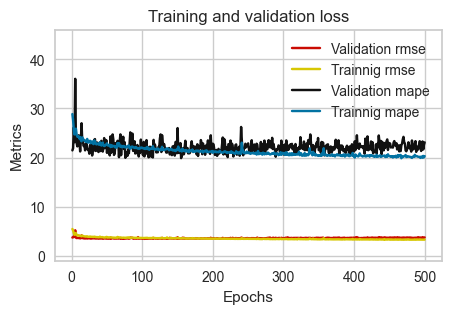

In [489]:
plotme(model8_1_2)

In [490]:
# inputs: distance + roadtypes distance
model8_1_4 = nnmodel_(10, num_hlayers=1,Epoch=500)
model8_1_4

Epoch 1/500
208/208 [==============================] - 0s 1ms/step - loss: 978086.8750 - mape: 74.3002 - rmse: 988.9827 - val_loss: 100732.1250 - val_mape: 29.3307 - val_rmse: 317.3832
Epoch 2/500
208/208 [==============================] - 0s 769us/step - loss: 93293.5391 - mape: 27.6382 - rmse: 305.4399 - val_loss: 68437.7109 - val_mape: 24.4159 - val_rmse: 261.6060
Epoch 3/500
208/208 [==============================] - 0s 756us/step - loss: 72633.9922 - mape: 25.2065 - rmse: 269.5069 - val_loss: 57706.3516 - val_mape: 23.6411 - val_rmse: 240.2215
Epoch 4/500
208/208 [==============================] - 0s 762us/step - loss: 65408.6875 - mape: 24.7193 - rmse: 255.7512 - val_loss: 53745.6016 - val_mape: 23.9973 - val_rmse: 231.8310
Epoch 5/500
208/208 [==============================] - 0s 782us/step - loss: 63759.6289 - mape: 24.5882 - rmse: 252.5067 - val_loss: 53602.7539 - val_mape: 24.4647 - val_rmse: 231.5227
Epoch 6/500
208/208 [==============================] - 0s 739us/step - loss

208/208 [==============================] - 0s 758us/step - loss: 61457.1914 - mape: 24.4763 - rmse: 247.9056 - val_loss: 50163.9258 - val_mape: 23.2731 - val_rmse: 223.9731
Epoch 90/500
208/208 [==============================] - 0s 753us/step - loss: 61902.0703 - mape: 24.3911 - rmse: 248.8013 - val_loss: 51419.3594 - val_mape: 24.2532 - val_rmse: 226.7584
Epoch 91/500
208/208 [==============================] - 0s 758us/step - loss: 63878.2109 - mape: 24.9741 - rmse: 252.7414 - val_loss: 49705.2344 - val_mape: 21.9688 - val_rmse: 222.9467
Epoch 92/500
208/208 [==============================] - 0s 751us/step - loss: 60532.7539 - mape: 24.3197 - rmse: 246.0341 - val_loss: 49948.3203 - val_mape: 23.0539 - val_rmse: 223.4912
Epoch 93/500
208/208 [==============================] - 0s 748us/step - loss: 63681.8320 - mape: 24.5375 - rmse: 252.3526 - val_loss: 52287.0117 - val_mape: 24.4698 - val_rmse: 228.6635
Epoch 94/500
208/208 [==============================] - 0s 745us/step - loss: 61876

Epoch 133/500
208/208 [==============================] - 0s 751us/step - loss: 60309.1094 - mape: 24.5723 - rmse: 245.5791 - val_loss: 61108.5156 - val_mape: 28.7669 - val_rmse: 247.2014
Epoch 134/500
208/208 [==============================] - 0s 753us/step - loss: 60887.8984 - mape: 24.6738 - rmse: 246.7547 - val_loss: 48348.6875 - val_mape: 22.3207 - val_rmse: 219.8833
Epoch 135/500
208/208 [==============================] - 0s 749us/step - loss: 59927.4062 - mape: 24.1612 - rmse: 244.8008 - val_loss: 51070.2227 - val_mape: 22.2213 - val_rmse: 225.9872
Epoch 136/500
208/208 [==============================] - 0s 744us/step - loss: 60005.4805 - mape: 24.3207 - rmse: 244.9602 - val_loss: 50526.3789 - val_mape: 21.9893 - val_rmse: 224.7807
Epoch 137/500
208/208 [==============================] - 0s 740us/step - loss: 60061.3711 - mape: 24.0577 - rmse: 245.0742 - val_loss: 56285.7500 - val_mape: 22.7114 - val_rmse: 237.2462
Epoch 138/500
208/208 [==============================] - 0s 748us

Epoch 177/500
208/208 [==============================] - 0s 728us/step - loss: 56897.6172 - mape: 23.3260 - rmse: 238.5322 - val_loss: 77787.7188 - val_mape: 23.4523 - val_rmse: 278.9045
Epoch 178/500
208/208 [==============================] - 0s 729us/step - loss: 60501.5781 - mape: 24.2892 - rmse: 245.9707 - val_loss: 47202.9727 - val_mape: 22.0531 - val_rmse: 217.2625
Epoch 179/500
208/208 [==============================] - 0s 734us/step - loss: 57499.9766 - mape: 23.2000 - rmse: 239.7915 - val_loss: 52035.8438 - val_mape: 23.7884 - val_rmse: 228.1137
Epoch 180/500
208/208 [==============================] - 0s 753us/step - loss: 58162.2617 - mape: 23.8611 - rmse: 241.1685 - val_loss: 48159.3906 - val_mape: 22.0763 - val_rmse: 219.4525
Epoch 181/500
208/208 [==============================] - 0s 750us/step - loss: 57794.9766 - mape: 23.4544 - rmse: 240.4059 - val_loss: 50005.6328 - val_mape: 21.0767 - val_rmse: 223.6194
Epoch 182/500
208/208 [==============================] - 0s 739us

Epoch 221/500
208/208 [==============================] - 0s 739us/step - loss: 55729.3164 - mape: 23.4019 - rmse: 236.0706 - val_loss: 47592.4922 - val_mape: 22.1552 - val_rmse: 218.1570
Epoch 222/500
208/208 [==============================] - 0s 742us/step - loss: 56736.7734 - mape: 23.4519 - rmse: 238.1948 - val_loss: 47788.3828 - val_mape: 22.7482 - val_rmse: 218.6055
Epoch 223/500
208/208 [==============================] - 0s 743us/step - loss: 55881.0430 - mape: 23.3257 - rmse: 236.3917 - val_loss: 47411.5352 - val_mape: 22.5088 - val_rmse: 217.7419
Epoch 224/500
208/208 [==============================] - 0s 768us/step - loss: 55536.1992 - mape: 23.6840 - rmse: 235.6612 - val_loss: 48353.1055 - val_mape: 22.9210 - val_rmse: 219.8934
Epoch 225/500
208/208 [==============================] - 0s 745us/step - loss: 58128.0078 - mape: 23.7041 - rmse: 241.0975 - val_loss: 45834.9414 - val_mape: 21.9244 - val_rmse: 214.0910
Epoch 226/500
208/208 [==============================] - 0s 743us

Epoch 265/500
208/208 [==============================] - 0s 734us/step - loss: 54594.2852 - mape: 23.3324 - rmse: 233.6542 - val_loss: 46397.2188 - val_mape: 21.3398 - val_rmse: 215.4001
Epoch 266/500
208/208 [==============================] - 0s 759us/step - loss: 56940.3672 - mape: 23.4634 - rmse: 238.6218 - val_loss: 46019.3984 - val_mape: 22.3470 - val_rmse: 214.5213
Epoch 267/500
208/208 [==============================] - 0s 730us/step - loss: 55015.1211 - mape: 23.0115 - rmse: 234.5530 - val_loss: 49284.2148 - val_mape: 22.0656 - val_rmse: 222.0005
Epoch 268/500
208/208 [==============================] - 0s 747us/step - loss: 58305.5859 - mape: 24.2716 - rmse: 241.4655 - val_loss: 45969.3945 - val_mape: 22.0469 - val_rmse: 214.4047
Epoch 269/500
208/208 [==============================] - 0s 730us/step - loss: 54862.9531 - mape: 22.9899 - rmse: 234.2284 - val_loss: 93720.8516 - val_mape: 24.8238 - val_rmse: 306.1386
Epoch 270/500
208/208 [==============================] - 0s 741us

Epoch 309/500
208/208 [==============================] - 0s 740us/step - loss: 55280.5000 - mape: 23.4636 - rmse: 235.1181 - val_loss: 47011.9727 - val_mape: 22.7746 - val_rmse: 216.8224
Epoch 310/500
208/208 [==============================] - 0s 728us/step - loss: 55336.0039 - mape: 23.3305 - rmse: 235.2361 - val_loss: 47465.4102 - val_mape: 21.3265 - val_rmse: 217.8656
Epoch 311/500
208/208 [==============================] - 0s 730us/step - loss: 54913.7031 - mape: 23.3131 - rmse: 234.3367 - val_loss: 46704.4688 - val_mape: 22.8841 - val_rmse: 216.1122
Epoch 312/500
208/208 [==============================] - 0s 725us/step - loss: 54594.4766 - mape: 23.2292 - rmse: 233.6546 - val_loss: 45802.7266 - val_mape: 21.6354 - val_rmse: 214.0157
Epoch 313/500
208/208 [==============================] - 0s 744us/step - loss: 54297.5508 - mape: 23.0602 - rmse: 233.0183 - val_loss: 48658.4766 - val_mape: 24.3989 - val_rmse: 220.5867
Epoch 314/500
208/208 [==============================] - 0s 742us

Epoch 353/500
208/208 [==============================] - 0s 754us/step - loss: 54625.8828 - mape: 23.0886 - rmse: 233.7218 - val_loss: 45962.7891 - val_mape: 22.3710 - val_rmse: 214.3893
Epoch 354/500
208/208 [==============================] - 0s 744us/step - loss: 55013.5742 - mape: 23.2610 - rmse: 234.5497 - val_loss: 46052.7656 - val_mape: 21.5903 - val_rmse: 214.5991
Epoch 355/500
208/208 [==============================] - 0s 744us/step - loss: 55560.0234 - mape: 23.4798 - rmse: 235.7117 - val_loss: 46069.8164 - val_mape: 22.5616 - val_rmse: 214.6388
Epoch 356/500
208/208 [==============================] - 0s 727us/step - loss: 54702.9062 - mape: 23.3070 - rmse: 233.8865 - val_loss: 48601.0391 - val_mape: 24.0460 - val_rmse: 220.4564
Epoch 357/500
208/208 [==============================] - 0s 732us/step - loss: 54848.5938 - mape: 23.9162 - rmse: 234.1978 - val_loss: 46250.1094 - val_mape: 21.0847 - val_rmse: 215.0584
Epoch 358/500
208/208 [==============================] - 0s 742us

Epoch 397/500
208/208 [==============================] - 0s 748us/step - loss: 54970.6055 - mape: 23.4612 - rmse: 234.4581 - val_loss: 45717.8320 - val_mape: 22.0095 - val_rmse: 213.8173
Epoch 398/500
208/208 [==============================] - 0s 736us/step - loss: 53964.4102 - mape: 23.1145 - rmse: 232.3024 - val_loss: 45987.4727 - val_mape: 22.0529 - val_rmse: 214.4469
Epoch 399/500
208/208 [==============================] - 0s 748us/step - loss: 54872.5117 - mape: 23.2578 - rmse: 234.2488 - val_loss: 47022.1719 - val_mape: 21.8416 - val_rmse: 216.8460
Epoch 400/500
208/208 [==============================] - 0s 750us/step - loss: 55293.6484 - mape: 23.3294 - rmse: 235.1460 - val_loss: 47709.9180 - val_mape: 21.8628 - val_rmse: 218.4260
Epoch 401/500
208/208 [==============================] - 0s 758us/step - loss: 54621.4219 - mape: 23.2238 - rmse: 233.7123 - val_loss: 45573.5586 - val_mape: 21.7575 - val_rmse: 213.4796
Epoch 402/500
208/208 [==============================] - 0s 749us

Epoch 441/500
208/208 [==============================] - 0s 730us/step - loss: 57348.7734 - mape: 23.9296 - rmse: 239.4760 - val_loss: 46857.3789 - val_mape: 22.9090 - val_rmse: 216.4657
Epoch 442/500
208/208 [==============================] - 0s 730us/step - loss: 54694.1133 - mape: 23.0536 - rmse: 233.8677 - val_loss: 46575.0430 - val_mape: 22.4491 - val_rmse: 215.8125
Epoch 443/500
208/208 [==============================] - 0s 735us/step - loss: 54933.8867 - mape: 22.9992 - rmse: 234.3798 - val_loss: 51140.9492 - val_mape: 23.5689 - val_rmse: 226.1436
Epoch 444/500
208/208 [==============================] - 0s 752us/step - loss: 54546.4219 - mape: 23.4576 - rmse: 233.5518 - val_loss: 46057.1055 - val_mape: 21.9522 - val_rmse: 214.6092
Epoch 445/500
208/208 [==============================] - 0s 744us/step - loss: 55098.9180 - mape: 23.2376 - rmse: 234.7316 - val_loss: 46025.0625 - val_mape: 21.8521 - val_rmse: 214.5345
Epoch 446/500
208/208 [==============================] - 0s 744us

Epoch 485/500
208/208 [==============================] - 0s 754us/step - loss: 54350.3008 - mape: 23.4299 - rmse: 233.1315 - val_loss: 45926.9531 - val_mape: 21.9140 - val_rmse: 214.3057
Epoch 486/500
208/208 [==============================] - 0s 744us/step - loss: 54676.9727 - mape: 23.1387 - rmse: 233.8311 - val_loss: 45935.9805 - val_mape: 22.3957 - val_rmse: 214.3268
Epoch 487/500
208/208 [==============================] - 0s 742us/step - loss: 53989.5820 - mape: 23.1584 - rmse: 232.3566 - val_loss: 46373.4219 - val_mape: 22.1090 - val_rmse: 215.3449
Epoch 488/500
208/208 [==============================] - 0s 746us/step - loss: 54311.6523 - mape: 23.2004 - rmse: 233.0486 - val_loss: 46395.0508 - val_mape: 22.4519 - val_rmse: 215.3951
Epoch 489/500
208/208 [==============================] - 0s 734us/step - loss: 54036.1094 - mape: 23.0585 - rmse: 232.4567 - val_loss: 47588.7500 - val_mape: 23.6355 - val_rmse: 218.1485
Epoch 490/500
208/208 [==============================] - 0s 747us